In [1]:
# Импорт необходимых библиотек
import math
import random
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from mpl_toolkits.mplot3d import Axes3D

In [2]:
# Выбор X и Y регулярным образом
def get_regular_x_y(n):
    x = np.linspace(-3, 3, n)
    y = np.linspace(-3, 3, n)
    return x,y

In [3]:
# Выбор X и Y случайным образом
def get_random_x_y(n):
    x = np.array([random.uniform(-3,3) for i in range(n)])
    y = np.array([random.uniform(-3,3) for i in range(n)])
    return x,y

In [4]:
# Вычисление Z(X;Y)
def function(x, y, n):
    z = []
    for i in range (0, n):
        for j in range (0, n):
            c = [x[i], y[j], (math.cos(x[i] + y[j]))]
            z.append(c)
    return z

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


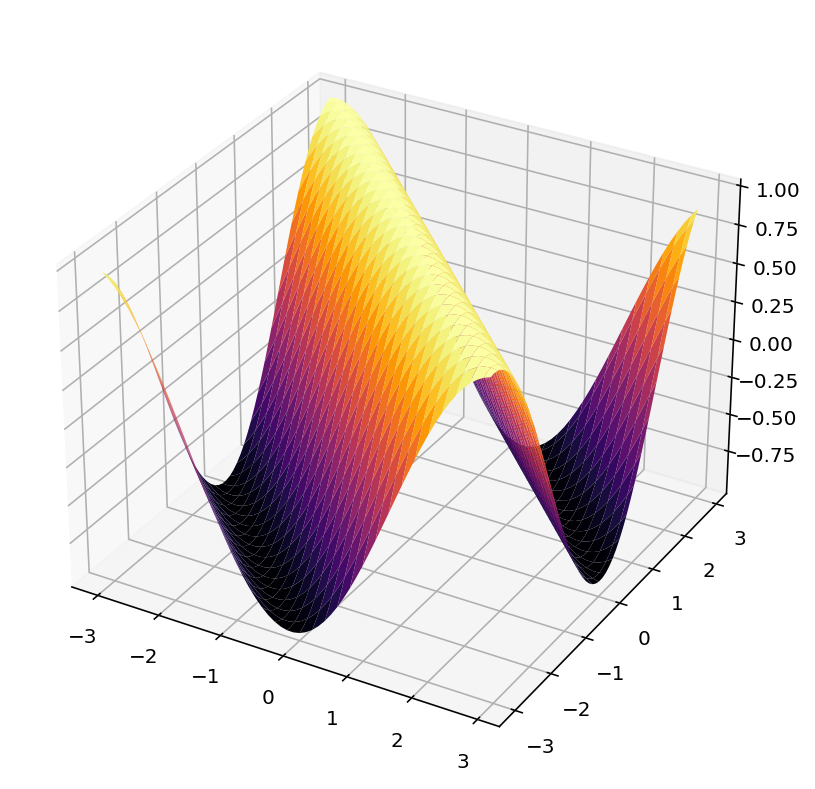

In [5]:
# Построение графика исходной функции
def func_draw():
  fig = plt.figure()
  ax = fig.gca(projection='3d')
  x = np.arange (-3, 3, 0.1)
  y = np.arange (-3, 3, 0.1)
  x, y = np.meshgrid(x, y)
  func = np.cos(x + y)
  ax.plot_surface(x, y, func, cmap='inferno')
  plt.show()

func_draw()

In [6]:
# Определяем метод для генерации X и Y и рассчитываем Z
n = 25
x, y = get_regular_x_y(n)
z= function(x, y, n)

In [7]:
xy=[]
zz=[]
for i in range (0, n*n):
  xy.append(z[i][0:2])
  zz.append(z[i][2])

In [8]:
# Объявляем список тестовых данных
test_data = []
for iii in range(500):
  val = [random.uniform(-3,3) for i in range(2)]
  test_data.append(val)

In [9]:
loss = []
layers_number = 5
neurons = [5, 10, 15, 20, 25, 30, 35, 40]
def experiment(layers):
  mse = []
  for i in range(layers_number):
    model = Sequential()
    model.add(Dense(60, input_dim=2, activation='relu'))
    model.add(Dense(5, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(loss="mean_squared_error", optimizer="adam")
    history = model.fit(xy, zz, epochs = 100)
    mse.append(history.history['loss'][-1])
  loss.append(mse)
experiment(5)

Epoch 1/100


 1/20 [>.............................] - ETA: 18s - loss: 0.4757

10/20 [==============>...............] - ETA: 0s - loss: 0.5232 

20/20 [==============================] - ETA: 0s - loss: 0.5071

20/20 [==============================] - 1s 10ms/step - loss: 0.5052


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4460

 2/20 [==>...........................] - ETA: 1s - loss: 0.4224

14/20 [====================>.........] - ETA: 0s - loss: 0.3761

20/20 [==============================] - 0s 10ms/step - loss: 0.3670


Epoch 3/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3097

19/20 [===========================>..] - ETA: 0s - loss: 0.2865

20/20 [==============================] - 0s 5ms/step - loss: 0.2881


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2665

 9/20 [============>.................] - ETA: 0s - loss: 0.2822

20/20 [==============================] - 0s 5ms/step - loss: 0.2852


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2291

12/20 [=================>............] - ETA: 0s - loss: 0.2486

20/20 [==============================] - 0s 6ms/step - loss: 0.2533


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2536

 2/20 [==>...........................] - ETA: 0s - loss: 0.2460

20/20 [==============================] - 0s 5ms/step - loss: 0.2438


Epoch 7/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1659

 7/20 [=========>....................] - ETA: 0s - loss: 0.1873

17/20 [========================>.....] - ETA: 0s - loss: 0.2052

20/20 [==============================] - 0s 11ms/step - loss: 0.2084


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2433

 7/20 [=========>....................] - ETA: 0s - loss: 0.2334

18/20 [==========================>...] - ETA: 0s - loss: 0.2216

20/20 [==============================] - 0s 10ms/step - loss: 0.2200


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2433

 5/20 [======>.......................] - ETA: 0s - loss: 0.2280

20/20 [==============================] - ETA: 0s - loss: 0.2070

20/20 [==============================] - 0s 10ms/step - loss: 0.2066


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2584

 8/20 [===========>..................] - ETA: 0s - loss: 0.2160

20/20 [==============================] - 0s 5ms/step - loss: 0.1990


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2283

20/20 [==============================] - 0s 2ms/step - loss: 0.1881


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1284

16/20 [=======================>......] - ETA: 0s - loss: 0.1509

20/20 [==============================] - 0s 5ms/step - loss: 0.1537


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1078

 5/20 [======>.......................] - ETA: 0s - loss: 0.1340

20/20 [==============================] - 0s 5ms/step - loss: 0.1495


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1342

 2/20 [==>...........................] - ETA: 1s - loss: 0.1317

14/20 [====================>.........] - ETA: 0s - loss: 0.1337

20/20 [==============================] - 0s 10ms/step - loss: 0.1360


Epoch 15/100


 1/20 [>.............................] - ETA: 2s - loss: 0.1452

 9/20 [============>.................] - ETA: 0s - loss: 0.1328

20/20 [==============================] - 0s 7ms/step - loss: 0.1374


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1544

 4/20 [=====>........................] - ETA: 0s - loss: 0.1239

16/20 [=======================>......] - ETA: 0s - loss: 0.1284

20/20 [==============================] - 0s 10ms/step - loss: 0.1277


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1679

15/20 [=====================>........] - ETA: 0s - loss: 0.1266

20/20 [==============================] - 0s 6ms/step - loss: 0.1245


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1959

 2/20 [==>...........................] - ETA: 0s - loss: 0.1602

20/20 [==============================] - 0s 5ms/step - loss: 0.1195


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1014

 7/20 [=========>....................] - ETA: 0s - loss: 0.0896

20/20 [==============================] - 0s 5ms/step - loss: 0.0979


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0554

20/20 [==============================] - 0s 2ms/step - loss: 0.0964


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1456

11/20 [===============>..............] - ETA: 0s - loss: 0.1107

20/20 [==============================] - 0s 4ms/step - loss: 0.1045


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0876

 6/20 [========>.....................] - ETA: 0s - loss: 0.0976

20/20 [==============================] - 0s 4ms/step - loss: 0.0939


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0578

 7/20 [=========>....................] - ETA: 0s - loss: 0.0744

20/20 [==============================] - 0s 4ms/step - loss: 0.0867


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1043

 3/20 [===>..........................] - ETA: 0s - loss: 0.0907

20/20 [==============================] - 0s 4ms/step - loss: 0.0870


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0237

 8/20 [===========>..................] - ETA: 0s - loss: 0.0508

20/20 [==============================] - 0s 4ms/step - loss: 0.0695


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0709

 8/20 [===========>..................] - ETA: 0s - loss: 0.0886

20/20 [==============================] - 0s 4ms/step - loss: 0.0847


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0829

 5/20 [======>.......................] - ETA: 0s - loss: 0.0835

20/20 [==============================] - 0s 4ms/step - loss: 0.0753


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0557

 6/20 [========>.....................] - ETA: 0s - loss: 0.0759

20/20 [==============================] - 0s 4ms/step - loss: 0.0667


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0653

 4/20 [=====>........................] - ETA: 0s - loss: 0.0675

20/20 [==============================] - 0s 4ms/step - loss: 0.0670


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1118

 5/20 [======>.......................] - ETA: 0s - loss: 0.0806

20/20 [==============================] - 0s 4ms/step - loss: 0.0682


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0862

10/20 [==============>...............] - ETA: 0s - loss: 0.0628

20/20 [==============================] - 0s 4ms/step - loss: 0.0598


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0244

13/20 [==================>...........] - ETA: 0s - loss: 0.0426

20/20 [==============================] - 0s 4ms/step - loss: 0.0485


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0746

 6/20 [========>.....................] - ETA: 0s - loss: 0.0629

19/20 [===========================>..] - ETA: 0s - loss: 0.0559

20/20 [==============================] - 0s 9ms/step - loss: 0.0558


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0614

 3/20 [===>..........................] - ETA: 0s - loss: 0.0501

13/20 [==================>...........] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 10ms/step - loss: 0.0503


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0597

13/20 [==================>...........] - ETA: 0s - loss: 0.0531

20/20 [==============================] - 0s 6ms/step - loss: 0.0514


Epoch 36/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0216

11/20 [===============>..............] - ETA: 0s - loss: 0.0355

20/20 [==============================] - 0s 6ms/step - loss: 0.0403


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

20/20 [==============================] - ETA: 0s - loss: 0.0422

20/20 [==============================] - 0s 5ms/step - loss: 0.0422


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0623

16/20 [=======================>......] - ETA: 0s - loss: 0.0464

20/20 [==============================] - 0s 4ms/step - loss: 0.0454


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0143

13/20 [==================>...........] - ETA: 0s - loss: 0.0369

20/20 [==============================] - 0s 3ms/step - loss: 0.0382


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0270

 7/20 [=========>....................] - ETA: 0s - loss: 0.0325

20/20 [==============================] - 0s 4ms/step - loss: 0.0355


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0327

10/20 [==============>...............] - ETA: 0s - loss: 0.0374

20/20 [==============================] - 0s 4ms/step - loss: 0.0363


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0358

 8/20 [===========>..................] - ETA: 0s - loss: 0.0341

20/20 [==============================] - 0s 4ms/step - loss: 0.0340


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0203

 4/20 [=====>........................] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 4ms/step - loss: 0.0302


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0231

11/20 [===============>..............] - ETA: 0s - loss: 0.0259

20/20 [==============================] - 0s 3ms/step - loss: 0.0266


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0362

 7/20 [=========>....................] - ETA: 0s - loss: 0.0331

20/20 [==============================] - 0s 4ms/step - loss: 0.0302


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0177

13/20 [==================>...........] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 4ms/step - loss: 0.0270


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 2ms/step - loss: 0.0255


Epoch 48/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0134

13/20 [==================>...........] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 5ms/step - loss: 0.0230


Epoch 49/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0114

 2/20 [==>...........................] - ETA: 5s - loss: 0.0104

 6/20 [========>.....................] - ETA: 1s - loss: 0.0163

11/20 [===============>..............] - ETA: 0s - loss: 0.0180

16/20 [=======================>......] - ETA: 0s - loss: 0.0189

20/20 [==============================] - 1s 32ms/step - loss: 0.0196


Epoch 50/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0263

17/20 [========================>.....] - ETA: 0s - loss: 0.0252

20/20 [==============================] - 0s 5ms/step - loss: 0.0244


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0205

12/20 [=================>............] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 5ms/step - loss: 0.0183


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0231

16/20 [=======================>......] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 4ms/step - loss: 0.0189


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0207

14/20 [====================>.........] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 4ms/step - loss: 0.0170


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0150

20/20 [==============================] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 4ms/step - loss: 0.0160


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 1ms/step - loss: 0.0162


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 2ms/step - loss: 0.0142


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

20/20 [==============================] - 0s 1ms/step - loss: 0.0154


Epoch 58/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0097

20/20 [==============================] - 0s 1ms/step - loss: 0.0125


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0125

 7/20 [=========>....................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 4ms/step - loss: 0.0123


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

 8/20 [===========>..................] - ETA: 0s - loss: 0.0086

20/20 [==============================] - 0s 4ms/step - loss: 0.0105


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0193

10/20 [==============>...............] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 4ms/step - loss: 0.0119


Epoch 62/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0095

 4/20 [=====>........................] - ETA: 0s - loss: 0.0098

16/20 [=======================>......] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 11ms/step - loss: 0.0102


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0151

 4/20 [=====>........................] - ETA: 0s - loss: 0.0128

13/20 [==================>...........] - ETA: 0s - loss: 0.0117

14/20 [====================>.........] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 17ms/step - loss: 0.0112


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

 4/20 [=====>........................] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 6ms/step - loss: 0.0090


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

20/20 [==============================] - 0s 1ms/step - loss: 0.0098


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 2ms/step - loss: 0.0086


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 1ms/step - loss: 0.0084


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 1ms/step - loss: 0.0082


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0103

20/20 [==============================] - 0s 2ms/step - loss: 0.0076


Epoch 70/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0067


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

 2/20 [==>...........................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 4ms/step - loss: 0.0067


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

 3/20 [===>..........................] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 4ms/step - loss: 0.0064


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

 4/20 [=====>........................] - ETA: 0s - loss: 0.0052

20/20 [==============================] - 0s 4ms/step - loss: 0.0059


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0057

 2/20 [==>...........................] - ETA: 1s - loss: 0.0056

20/20 [==============================] - 0s 4ms/step - loss: 0.0058


Epoch 75/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0048

 5/20 [======>.......................] - ETA: 0s - loss: 0.0056

17/20 [========================>.....] - ETA: 0s - loss: 0.0056

19/20 [===========================>..] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 16ms/step - loss: 0.0056


Epoch 76/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0038

14/20 [====================>.........] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 6ms/step - loss: 0.0055


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

 3/20 [===>..........................] - ETA: 0s - loss: 0.0061

 5/20 [======>.......................] - ETA: 0s - loss: 0.0057

20/20 [==============================] - 0s 11ms/step - loss: 0.0053


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

20/20 [==============================] - 0s 1ms/step - loss: 0.0050


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0052

20/20 [==============================] - 0s 1ms/step - loss: 0.0054


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0041


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

20/20 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

 4/20 [=====>........................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 4ms/step - loss: 0.0043


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

 3/20 [===>..........................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 4ms/step - loss: 0.0043


Epoch 84/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0038

20/20 [==============================] - 0s 1ms/step - loss: 0.0042


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

 2/20 [==>...........................] - ETA: 1s - loss: 0.0044

20/20 [==============================] - 0s 4ms/step - loss: 0.0042


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

 4/20 [=====>........................] - ETA: 0s - loss: 0.0037

20/20 [==============================] - 0s 4ms/step - loss: 0.0040


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 9.3801e-04

 2/20 [==>...........................] - ETA: 1s - loss: 0.0019    

 9/20 [============>.................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 11ms/step - loss: 0.0033


Epoch 88/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0044

12/20 [=================>............] - ETA: 0s - loss: 0.0039

15/20 [=====================>........] - ETA: 0s - loss: 0.0039

16/20 [=======================>......] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 16ms/step - loss: 0.0039


Epoch 89/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0029

18/20 [==========================>...] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 5ms/step - loss: 0.0035


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 6.8992e-04

10/20 [==============>...............] - ETA: 0s - loss: 0.0034    

20/20 [==============================] - 0s 5ms/step - loss: 0.0036


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

 6/20 [========>.....................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 5ms/step - loss: 0.0032


Epoch 92/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0028

20/20 [==============================] - 0s 1ms/step - loss: 0.0035


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

 2/20 [==>...........................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 4ms/step - loss: 0.0034


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 1ms/step - loss: 0.0036


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

 4/20 [=====>........................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 5ms/step - loss: 0.0032


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

14/20 [====================>.........] - ETA: 0s - loss: 0.0030

15/20 [=====================>........] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 8ms/step - loss: 0.0030


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

 7/20 [=========>....................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 6ms/step - loss: 0.0029


Epoch 99/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0033

 2/20 [==>...........................] - ETA: 2s - loss: 0.0034

 3/20 [===>..........................] - ETA: 1s - loss: 0.0033

 5/20 [======>.......................] - ETA: 1s - loss: 0.0032



20/20 [==============================] - 0s 17ms/step - loss: 0.0031


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 1ms/step - loss: 0.0029


Epoch 1/100


 1/20 [>.............................] - ETA: 6s - loss: 0.7898

20/20 [==============================] - 0s 1ms/step - loss: 0.5976


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4147

20/20 [==============================] - 0s 1ms/step - loss: 0.4124


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3969

20/20 [==============================] - 0s 1ms/step - loss: 0.3593


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4667

20/20 [==============================] - 0s 1ms/step - loss: 0.3596


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4372

 2/20 [==>...........................] - ETA: 1s - loss: 0.4202

20/20 [==============================] - 0s 5ms/step - loss: 0.3423


Epoch 6/100


 1/20 [>.............................] - ETA: 1s - loss: 0.3110

20/20 [==============================] - 0s 2ms/step - loss: 0.2985


Epoch 7/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1999

 2/20 [==>...........................] - ETA: 1s - loss: 0.2115

 3/20 [===>..........................] - ETA: 1s - loss: 0.2292

 6/20 [========>.....................] - ETA: 0s - loss: 0.2603

14/20 [====================>.........] - ETA: 0s - loss: 0.2785

16/20 [=======================>......] - ETA: 0s - loss: 0.2808

19/20 [===========================>..] - ETA: 0s - loss: 0.2828

20/20 [==============================] - ETA: 0s - loss: 0.2832

20/20 [==============================] - 1s 37ms/step - loss: 0.2835


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3315

20/20 [==============================] - 0s 1ms/step - loss: 0.2749


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2165

19/20 [===========================>..] - ETA: 0s - loss: 0.2578

20/20 [==============================] - 0s 5ms/step - loss: 0.2589


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2545

14/20 [====================>.........] - ETA: 0s - loss: 0.2508

20/20 [==============================] - 0s 5ms/step - loss: 0.2529


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3170

12/20 [=================>............] - ETA: 0s - loss: 0.2616

20/20 [==============================] - 0s 4ms/step - loss: 0.2573


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2604

 8/20 [===========>..................] - ETA: 0s - loss: 0.2362

20/20 [==============================] - 0s 4ms/step - loss: 0.2409


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1655

 2/20 [==>...........................] - ETA: 1s - loss: 0.1721

20/20 [==============================] - 0s 5ms/step - loss: 0.2301


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2598

 9/20 [============>.................] - ETA: 0s - loss: 0.2331

17/20 [========================>.....] - ETA: 0s - loss: 0.2246

20/20 [==============================] - 0s 11ms/step - loss: 0.2219


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2587

 4/20 [=====>........................] - ETA: 0s - loss: 0.2208

 5/20 [======>.......................] - ETA: 0s - loss: 0.2178

10/20 [==============>...............] - ETA: 0s - loss: 0.2064

11/20 [===============>..............] - ETA: 0s - loss: 0.2056

14/20 [====================>.........] - ETA: 0s - loss: 0.2048

18/20 [==========================>...] - ETA: 0s - loss: 0.2039

20/20 [==============================] - 1s 31ms/step - loss: 0.2032


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1608

 3/20 [===>..........................] - ETA: 0s - loss: 0.1730

20/20 [==============================] - 0s 5ms/step - loss: 0.1836


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1788

20/20 [==============================] - 0s 1ms/step - loss: 0.1776


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1249

20/20 [==============================] - 0s 1ms/step - loss: 0.1661


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1651

16/20 [=======================>......] - ETA: 0s - loss: 0.1689

20/20 [==============================] - 0s 5ms/step - loss: 0.1661


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1774

 6/20 [========>.....................] - ETA: 0s - loss: 0.1574

20/20 [==============================] - 0s 4ms/step - loss: 0.1462


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1182

 2/20 [==>...........................] - ETA: 1s - loss: 0.1173

20/20 [==============================] - 0s 4ms/step - loss: 0.1366


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1344

 2/20 [==>...........................] - ETA: 1s - loss: 0.1280

 9/20 [============>.................] - ETA: 0s - loss: 0.1396

20/20 [==============================] - 0s 11ms/step - loss: 0.1407


Epoch 23/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1951

 7/20 [=========>....................] - ETA: 0s - loss: 0.1519

13/20 [==================>...........] - ETA: 0s - loss: 0.1397

20/20 [==============================] - ETA: 0s - loss: 0.1345

20/20 [==============================] - 0s 16ms/step - loss: 0.1343


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1733

11/20 [===============>..............] - ETA: 0s - loss: 0.1499

20/20 [==============================] - 0s 5ms/step - loss: 0.1398


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0963

 6/20 [========>.....................] - ETA: 0s - loss: 0.1036

20/20 [==============================] - 0s 6ms/step - loss: 0.1132


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1846

20/20 [==============================] - 0s 1ms/step - loss: 0.1254


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1665

17/20 [========================>.....] - ETA: 0s - loss: 0.1177

20/20 [==============================] - 0s 5ms/step - loss: 0.1165


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1061

12/20 [=================>............] - ETA: 0s - loss: 0.1049

20/20 [==============================] - 0s 5ms/step - loss: 0.1053


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1205

 7/20 [=========>....................] - ETA: 0s - loss: 0.1068

17/20 [========================>.....] - ETA: 0s - loss: 0.1042

18/20 [==========================>...] - ETA: 0s - loss: 0.1040

20/20 [==============================] - ETA: 0s - loss: 0.1034

20/20 [==============================] - 0s 24ms/step - loss: 0.1032


Epoch 30/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1130

 3/20 [===>..........................] - ETA: 0s - loss: 0.0995

14/20 [====================>.........] - ETA: 0s - loss: 0.0937

16/20 [=======================>......] - ETA: 0s - loss: 0.0943

20/20 [==============================] - 0s 16ms/step - loss: 0.0936


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1039

20/20 [==============================] - 0s 1ms/step - loss: 0.0860


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0673

20/20 [==============================] - ETA: 0s - loss: 0.0693

20/20 [==============================] - 0s 4ms/step - loss: 0.0697


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1301

12/20 [=================>............] - ETA: 0s - loss: 0.0820

20/20 [==============================] - 0s 5ms/step - loss: 0.0801


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1178

 6/20 [========>.....................] - ETA: 0s - loss: 0.0878

20/20 [==============================] - 0s 5ms/step - loss: 0.0739


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0752

 2/20 [==>...........................] - ETA: 1s - loss: 0.0788

20/20 [==============================] - 0s 4ms/step - loss: 0.0713


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0850

15/20 [=====================>........] - ETA: 0s - loss: 0.0802

20/20 [==============================] - ETA: 0s - loss: 0.0763

20/20 [==============================] - 0s 13ms/step - loss: 0.0758


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0503

 6/20 [========>.....................] - ETA: 0s - loss: 0.0617

 9/20 [============>.................] - ETA: 0s - loss: 0.0643

20/20 [==============================] - 0s 11ms/step - loss: 0.0625


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0207

 2/20 [==>...........................] - ETA: 1s - loss: 0.0313

 3/20 [===>..........................] - ETA: 1s - loss: 0.0379

16/20 [=======================>......] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 15ms/step - loss: 0.0540


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0476

10/20 [==============>...............] - ETA: 0s - loss: 0.0566

20/20 [==============================] - 0s 4ms/step - loss: 0.0584


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0402

 2/20 [==>...........................] - ETA: 1s - loss: 0.0568

20/20 [==============================] - 0s 4ms/step - loss: 0.0598


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0387

20/20 [==============================] - 0s 1ms/step - loss: 0.0557


Epoch 42/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 1ms/step - loss: 0.0475


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0436

20/20 [==============================] - 0s 1ms/step - loss: 0.0489


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0495

 2/20 [==>...........................] - ETA: 1s - loss: 0.0528

 3/20 [===>..........................] - ETA: 2s - loss: 0.0526

 4/20 [=====>........................] - ETA: 2s - loss: 0.0503

11/20 [===============>..............] - ETA: 0s - loss: 0.0487

14/20 [====================>.........] - ETA: 0s - loss: 0.0497

15/20 [=====================>........] - ETA: 0s - loss: 0.0497

16/20 [=======================>......] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 1s 42ms/step - loss: 0.0497


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0311

11/20 [===============>..............] - ETA: 0s - loss: 0.0584

20/20 [==============================] - 0s 6ms/step - loss: 0.0540


Epoch 46/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1146

20/20 [==============================] - 0s 2ms/step - loss: 0.0543


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0498

13/20 [==================>...........] - ETA: 0s - loss: 0.0468

20/20 [==============================] - 0s 5ms/step - loss: 0.0466


Epoch 48/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0367

20/20 [==============================] - 0s 2ms/step - loss: 0.0373


Epoch 49/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0999

 7/20 [=========>....................] - ETA: 0s - loss: 0.0619

 9/20 [============>.................] - ETA: 0s - loss: 0.0596

17/20 [========================>.....] - ETA: 0s - loss: 0.0553

20/20 [==============================] - 1s 16ms/step - loss: 0.0531


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0357

 4/20 [=====>........................] - ETA: 0s - loss: 0.0376

20/20 [==============================] - 0s 6ms/step - loss: 0.0427


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0609

12/20 [=================>............] - ETA: 0s - loss: 0.0511

20/20 [==============================] - 0s 4ms/step - loss: 0.0470


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0704

 7/20 [=========>....................] - ETA: 0s - loss: 0.0569

20/20 [==============================] - 0s 5ms/step - loss: 0.0473


Epoch 53/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0216

20/20 [==============================] - 0s 1ms/step - loss: 0.0372


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0375

20/20 [==============================] - ETA: 0s - loss: 0.0383

20/20 [==============================] - 0s 5ms/step - loss: 0.0383


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

14/20 [====================>.........] - ETA: 0s - loss: 0.0307

20/20 [==============================] - 0s 4ms/step - loss: 0.0333


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0558

 4/20 [=====>........................] - ETA: 0s - loss: 0.0430

10/20 [==============>...............] - ETA: 0s - loss: 0.0352

11/20 [===============>..............] - ETA: 0s - loss: 0.0352

13/20 [==================>...........] - ETA: 0s - loss: 0.0351

20/20 [==============================] - 0s 21ms/step - loss: 0.0355


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0837

 6/20 [========>.....................] - ETA: 0s - loss: 0.0551

11/20 [===============>..............] - ETA: 0s - loss: 0.0472

15/20 [=====================>........] - ETA: 0s - loss: 0.0436

20/20 [==============================] - 0s 16ms/step - loss: 0.0410


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0762

20/20 [==============================] - 0s 1ms/step - loss: 0.0356


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

18/20 [==========================>...] - ETA: 0s - loss: 0.0292

20/20 [==============================] - 0s 5ms/step - loss: 0.0297


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0327

13/20 [==================>...........] - ETA: 0s - loss: 0.0271

20/20 [==============================] - 0s 5ms/step - loss: 0.0287


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0094

 8/20 [===========>..................] - ETA: 0s - loss: 0.0180

20/20 [==============================] - 0s 5ms/step - loss: 0.0250


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0306

 2/20 [==>...........................] - ETA: 1s - loss: 0.0256

20/20 [==============================] - 0s 4ms/step - loss: 0.0324


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0124

17/20 [========================>.....] - ETA: 0s - loss: 0.0258

20/20 [==============================] - 0s 5ms/step - loss: 0.0263


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0105

 7/20 [=========>....................] - ETA: 0s - loss: 0.0221

12/20 [=================>............] - ETA: 0s - loss: 0.0278

20/20 [==============================] - ETA: 0s - loss: 0.0288

20/20 [==============================] - 0s 16ms/step - loss: 0.0288


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0402

 2/20 [==>...........................] - ETA: 1s - loss: 0.0361

 3/20 [===>..........................] - ETA: 1s - loss: 0.0361

14/20 [====================>.........] - ETA: 0s - loss: 0.0319

19/20 [===========================>..] - ETA: 0s - loss: 0.0312

20/20 [==============================] - ETA: 0s - loss: 0.0310

20/20 [==============================] - 0s 26ms/step - loss: 0.0308


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

 5/20 [======>.......................] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 6ms/step - loss: 0.0204


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0081

20/20 [==============================] - 0s 1ms/step - loss: 0.0204


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0121

20/20 [==============================] - 0s 1ms/step - loss: 0.0318


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0107

18/20 [==========================>...] - ETA: 0s - loss: 0.0248

20/20 [==============================] - 0s 4ms/step - loss: 0.0248


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0225

14/20 [====================>.........] - ETA: 0s - loss: 0.0212

20/20 [==============================] - 0s 4ms/step - loss: 0.0220


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0195

 8/20 [===========>..................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 5ms/step - loss: 0.0242


Epoch 72/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0118

 2/20 [==>...........................] - ETA: 1s - loss: 0.0134

11/20 [===============>..............] - ETA: 0s - loss: 0.0190

13/20 [==================>...........] - ETA: 0s - loss: 0.0197

19/20 [===========================>..] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 1s 21ms/step - loss: 0.0212


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0236

 6/20 [========>.....................] - ETA: 0s - loss: 0.0359

20/20 [==============================] - 0s 5ms/step - loss: 0.0298


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

 2/20 [==>...........................] - ETA: 1s - loss: 0.0154

20/20 [==============================] - 0s 4ms/step - loss: 0.0207


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 5ms/step - loss: 0.0174


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0088

 5/20 [======>.......................] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 5ms/step - loss: 0.0181


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0086

20/20 [==============================] - 0s 1ms/step - loss: 0.0225


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

 8/20 [===========>..................] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 4ms/step - loss: 0.0223


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0256

15/20 [=====================>........] - ETA: 0s - loss: 0.0187

20/20 [==============================] - 0s 4ms/step - loss: 0.0185


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0143

10/20 [==============>...............] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 4ms/step - loss: 0.0138


Epoch 81/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0049

19/20 [===========================>..] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 6ms/step - loss: 0.0159


Epoch 82/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0104

 7/20 [=========>....................] - ETA: 0s - loss: 0.0084

14/20 [====================>.........] - ETA: 0s - loss: 0.0122

20/20 [==============================] - 0s 12ms/step - loss: 0.0142


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 1ms/step - loss: 0.0169


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

10/20 [==============>...............] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0149


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 1ms/step - loss: 0.0168


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 1ms/step - loss: 0.0135


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

15/20 [=====================>........] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 5ms/step - loss: 0.0147


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

20/20 [==============================] - 0s 1ms/step - loss: 0.0138


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0253

20/20 [==============================] - 0s 1ms/step - loss: 0.0144


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0156

17/20 [========================>.....] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0138


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 1ms/step - loss: 0.0182


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

10/20 [==============>...............] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 3ms/step - loss: 0.0148


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0446

20/20 [==============================] - 0s 1ms/step - loss: 0.0181


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 1ms/step - loss: 0.0146


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

 9/20 [============>.................] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 3ms/step - loss: 0.0101


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0045

17/20 [========================>.....] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 3ms/step - loss: 0.0131


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

20/20 [==============================] - 0s 1ms/step - loss: 0.0128


Epoch 98/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0091

14/20 [====================>.........] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0133


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0052

20/20 [==============================] - 0s 1ms/step - loss: 0.0116


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.5208

20/20 [==============================] - 0s 1ms/step - loss: 0.4898


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3966

20/20 [==============================] - 0s 1ms/step - loss: 0.3924


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3003

12/20 [=================>............] - ETA: 0s - loss: 0.3662

20/20 [==============================] - 0s 3ms/step - loss: 0.3648


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2275

20/20 [==============================] - 0s 1ms/step - loss: 0.3233


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3023

20/20 [==============================] - 0s 1ms/step - loss: 0.3177


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5844

15/20 [=====================>........] - ETA: 0s - loss: 0.3563

20/20 [==============================] - 0s 4ms/step - loss: 0.3419


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2178

20/20 [==============================] - 0s 1ms/step - loss: 0.2809


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3062

20/20 [==============================] - 0s 1ms/step - loss: 0.3031


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3524

17/20 [========================>.....] - ETA: 0s - loss: 0.3027

20/20 [==============================] - 0s 3ms/step - loss: 0.2984


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2161

20/20 [==============================] - 0s 1ms/step - loss: 0.2635


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3526

 6/20 [========>.....................] - ETA: 0s - loss: 0.2971

20/20 [==============================] - 0s 4ms/step - loss: 0.2727


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3363

20/20 [==============================] - 0s 1ms/step - loss: 0.2725


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1845

20/20 [==============================] - 0s 1ms/step - loss: 0.2671


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2680

11/20 [===============>..............] - ETA: 0s - loss: 0.2404

20/20 [==============================] - 0s 3ms/step - loss: 0.2354


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2191

20/20 [==============================] - ETA: 0s - loss: 0.1932

20/20 [==============================] - 0s 3ms/step - loss: 0.1934


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2097

20/20 [==============================] - 0s 1ms/step - loss: 0.1889


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2384

14/20 [====================>.........] - ETA: 0s - loss: 0.1979

20/20 [==============================] - 0s 3ms/step - loss: 0.1919


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2908

20/20 [==============================] - 0s 1ms/step - loss: 0.1819


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0653

20/20 [==============================] - 0s 1ms/step - loss: 0.1521


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1362

 8/20 [===========>..................] - ETA: 0s - loss: 0.1711

20/20 [==============================] - 0s 3ms/step - loss: 0.1589


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1393

20/20 [==============================] - 0s 2ms/step - loss: 0.1358


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0914

20/20 [==============================] - 0s 1ms/step - loss: 0.1303


Epoch 23/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1400

14/20 [====================>.........] - ETA: 0s - loss: 0.1408

20/20 [==============================] - 0s 3ms/step - loss: 0.1365


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1883

20/20 [==============================] - 0s 1ms/step - loss: 0.1237


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1575

 9/20 [============>.................] - ETA: 0s - loss: 0.1288

20/20 [==============================] - 0s 5ms/step - loss: 0.1214


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0670

14/20 [====================>.........] - ETA: 0s - loss: 0.1052

20/20 [==============================] - 0s 6ms/step - loss: 0.1073


Epoch 27/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1393

20/20 [==============================] - 0s 1ms/step - loss: 0.1071


Epoch 28/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0737

 9/20 [============>.................] - ETA: 0s - loss: 0.0997

10/20 [==============>...............] - ETA: 0s - loss: 0.0993

20/20 [==============================] - ETA: 0s - loss: 0.1005

20/20 [==============================] - 0s 25ms/step - loss: 0.1005


Epoch 29/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0678

10/20 [==============>...............] - ETA: 0s - loss: 0.0967

18/20 [==========================>...] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 11ms/step - loss: 0.0965


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0717

 8/20 [===========>..................] - ETA: 0s - loss: 0.0873

20/20 [==============================] - 0s 5ms/step - loss: 0.0927


Epoch 31/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0948

20/20 [==============================] - 0s 1ms/step - loss: 0.0907


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0306

17/20 [========================>.....] - ETA: 0s - loss: 0.0768

20/20 [==============================] - 0s 5ms/step - loss: 0.0784


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0496

 2/20 [==>...........................] - ETA: 1s - loss: 0.0539

12/20 [=================>............] - ETA: 0s - loss: 0.0667

20/20 [==============================] - 0s 11ms/step - loss: 0.0735


Epoch 34/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0554

12/20 [=================>............] - ETA: 0s - loss: 0.0766

20/20 [==============================] - 0s 6ms/step - loss: 0.0775


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0683

15/20 [=====================>........] - ETA: 0s - loss: 0.0742

20/20 [==============================] - 0s 5ms/step - loss: 0.0744


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0226

 4/20 [=====>........................] - ETA: 0s - loss: 0.0406

20/20 [==============================] - 0s 5ms/step - loss: 0.0626


Epoch 37/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1164

20/20 [==============================] - 0s 1ms/step - loss: 0.0758


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0889

 7/20 [=========>....................] - ETA: 0s - loss: 0.0671

16/20 [=======================>......] - ETA: 0s - loss: 0.0650

18/20 [==========================>...] - ETA: 0s - loss: 0.0649

19/20 [===========================>..] - ETA: 0s - loss: 0.0650

20/20 [==============================] - 0s 22ms/step - loss: 0.0651


Epoch 39/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0551

 2/20 [==>...........................] - ETA: 1s - loss: 0.0521

14/20 [====================>.........] - ETA: 0s - loss: 0.0572

20/20 [==============================] - 0s 10ms/step - loss: 0.0591


Epoch 40/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0739

 9/20 [============>.................] - ETA: 0s - loss: 0.0609

20/20 [==============================] - 0s 6ms/step - loss: 0.0604


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0847

 2/20 [==>...........................] - ETA: 1s - loss: 0.0682

20/20 [==============================] - 0s 5ms/step - loss: 0.0550


Epoch 42/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0630

 2/20 [==>...........................] - ETA: 1s - loss: 0.0492

 8/20 [===========>..................] - ETA: 0s - loss: 0.0507

14/20 [====================>.........] - ETA: 0s - loss: 0.0538

20/20 [==============================] - 0s 16ms/step - loss: 0.0538


Epoch 43/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0611

12/20 [=================>............] - ETA: 0s - loss: 0.0540

20/20 [==============================] - 0s 6ms/step - loss: 0.0523


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0220

20/20 [==============================] - ETA: 0s - loss: 0.0474

20/20 [==============================] - 0s 5ms/step - loss: 0.0475


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0469

 5/20 [======>.......................] - ETA: 0s - loss: 0.0563

17/20 [========================>.....] - ETA: 0s - loss: 0.0526

20/20 [==============================] - 0s 10ms/step - loss: 0.0515


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0767

 4/20 [=====>........................] - ETA: 0s - loss: 0.0638

17/20 [========================>.....] - ETA: 0s - loss: 0.0474

20/20 [==============================] - 0s 10ms/step - loss: 0.0465


Epoch 47/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0541



 2/20 [==>...........................] - ETA: 1s - loss: 0.0584

 3/20 [===>..........................] - ETA: 1s - loss: 0.0588

11/20 [===============>..............] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 16ms/step - loss: 0.0454


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0588

 2/20 [==>...........................] - ETA: 1s - loss: 0.0521

20/20 [==============================] - 0s 5ms/step - loss: 0.0445


Epoch 49/100


 1/20 [>.............................] - ETA: 7s - loss: 0.0421

15/20 [=====================>........] - ETA: 0s - loss: 0.0440

20/20 [==============================] - 1s 6ms/step - loss: 0.0423


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0323

 4/20 [=====>........................] - ETA: 0s - loss: 0.0311

16/20 [=======================>......] - ETA: 0s - loss: 0.0356

20/20 [==============================] - 0s 10ms/step - loss: 0.0355


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0261

13/20 [==================>...........] - ETA: 0s - loss: 0.0284

20/20 [==============================] - 0s 6ms/step - loss: 0.0294


Epoch 52/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0175

20/20 [==============================] - 0s 1ms/step - loss: 0.0310


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0421

 9/20 [============>.................] - ETA: 0s - loss: 0.0308

18/20 [==========================>...] - ETA: 0s - loss: 0.0305

20/20 [==============================] - 0s 11ms/step - loss: 0.0303


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

 8/20 [===========>..................] - ETA: 0s - loss: 0.0180

19/20 [===========================>..] - ETA: 0s - loss: 0.0238

20/20 [==============================] - 0s 10ms/step - loss: 0.0243


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

 9/20 [============>.................] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 5ms/step - loss: 0.0257


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0221

 4/20 [=====>........................] - ETA: 0s - loss: 0.0217

20/20 [==============================] - 0s 5ms/step - loss: 0.0236


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0206

 9/20 [============>.................] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 4ms/step - loss: 0.0227


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 1ms/step - loss: 0.0238


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0178


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0214

20/20 [==============================] - 0s 1ms/step - loss: 0.0201


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0086

10/20 [==============>...............] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 4ms/step - loss: 0.0154


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0133

20/20 [==============================] - 0s 1ms/step - loss: 0.0170


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0117

20/20 [==============================] - 0s 1ms/step - loss: 0.0192


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0132

14/20 [====================>.........] - ETA: 0s - loss: 0.0126

20/20 [==============================] - 0s 3ms/step - loss: 0.0141


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 1ms/step - loss: 0.0161


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 0s 2ms/step - loss: 0.0180


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0175

18/20 [==========================>...] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 3ms/step - loss: 0.0164


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

20/20 [==============================] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 3ms/step - loss: 0.0142


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0146

15/20 [=====================>........] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 3ms/step - loss: 0.0132


Epoch 70/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 2ms/step - loss: 0.0137


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 3ms/step - loss: 0.0157


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0100

20/20 [==============================] - 0s 2ms/step - loss: 0.0114


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0084

20/20 [==============================] - 0s 1ms/step - loss: 0.0116


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

20/20 [==============================] - 0s 1ms/step - loss: 0.0121


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 3ms/step - loss: 0.0122


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0106

20/20 [==============================] - 0s 1ms/step - loss: 0.0110


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0130


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

14/20 [====================>.........] - ETA: 0s - loss: 0.0073

20/20 [==============================] - 0s 3ms/step - loss: 0.0086


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

20/20 [==============================] - 0s 1ms/step - loss: 0.0127


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0218

20/20 [==============================] - 0s 1ms/step - loss: 0.0120


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0241

19/20 [===========================>..] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 3ms/step - loss: 0.0117


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

20/20 [==============================] - 0s 1ms/step - loss: 0.0100


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

20/20 [==============================] - 0s 1ms/step - loss: 0.0106


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

13/20 [==================>...........] - ETA: 0s - loss: 0.0084

20/20 [==============================] - 0s 3ms/step - loss: 0.0089


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

20/20 [==============================] - 0s 1ms/step - loss: 0.0089


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 2ms/step - loss: 0.0055


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0076


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 2ms/step - loss: 0.0069


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 2ms/step - loss: 0.0063


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0061

19/20 [===========================>..] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 3ms/step - loss: 0.0073


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0105


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

17/20 [========================>.....] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 3ms/step - loss: 0.0075


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0117

13/20 [==================>...........] - ETA: 0s - loss: 0.0073

20/20 [==============================] - 0s 3ms/step - loss: 0.0076


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 2ms/step - loss: 0.0068


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0074


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

14/20 [====================>.........] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 3ms/step - loss: 0.0071


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 1ms/step - loss: 0.0085


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

20/20 [==============================] - 0s 1ms/step - loss: 0.0075


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

 9/20 [============>.................] - ETA: 0s - loss: 0.0058

20/20 [==============================] - 0s 4ms/step - loss: 0.0062


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.7195

20/20 [==============================] - 0s 1ms/step - loss: 0.5708


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4340

13/20 [==================>...........] - ETA: 0s - loss: 0.4042

20/20 [==============================] - 0s 3ms/step - loss: 0.4003


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3961

20/20 [==============================] - 0s 1ms/step - loss: 0.3710


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3782

20/20 [==============================] - 0s 1ms/step - loss: 0.3371


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.4119

11/20 [===============>..............] - ETA: 0s - loss: 0.3293

20/20 [==============================] - 0s 3ms/step - loss: 0.3251


Epoch 6/100


 1/20 [>.............................] - ETA: 0s - loss: 0.5112

20/20 [==============================] - 0s 1ms/step - loss: 0.3291


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2677

20/20 [==============================] - 0s 1ms/step - loss: 0.2761


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3091

12/20 [=================>............] - ETA: 0s - loss: 0.2692

20/20 [==============================] - 0s 4ms/step - loss: 0.2657


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2859

17/20 [========================>.....] - ETA: 0s - loss: 0.2527

20/20 [==============================] - 0s 3ms/step - loss: 0.2503


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2627

20/20 [==============================] - 0s 1ms/step - loss: 0.2263


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2518

13/20 [==================>...........] - ETA: 0s - loss: 0.2044

20/20 [==============================] - 0s 3ms/step - loss: 0.1989


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2784

17/20 [========================>.....] - ETA: 0s - loss: 0.1928

20/20 [==============================] - 0s 3ms/step - loss: 0.1882


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1060

20/20 [==============================] - 0s 1ms/step - loss: 0.1323


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1381

12/20 [=================>............] - ETA: 0s - loss: 0.1326

20/20 [==============================] - 0s 3ms/step - loss: 0.1367


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0905

16/20 [=======================>......] - ETA: 0s - loss: 0.1307

20/20 [==============================] - 0s 3ms/step - loss: 0.1313


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1551

20/20 [==============================] - 0s 1ms/step - loss: 0.1219


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0823

15/20 [=====================>........] - ETA: 0s - loss: 0.1132

20/20 [==============================] - 0s 3ms/step - loss: 0.1147


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1100

19/20 [===========================>..] - ETA: 0s - loss: 0.1106

20/20 [==============================] - 0s 3ms/step - loss: 0.1108


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2110

20/20 [==============================] - 0s 1ms/step - loss: 0.1164


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1231

12/20 [=================>............] - ETA: 0s - loss: 0.1011

20/20 [==============================] - 0s 3ms/step - loss: 0.1023


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0957

20/20 [==============================] - 0s 1ms/step - loss: 0.1054


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0537

20/20 [==============================] - 0s 1ms/step - loss: 0.0919


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0910

12/20 [=================>............] - ETA: 0s - loss: 0.0932

20/20 [==============================] - 0s 3ms/step - loss: 0.0907


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0636

20/20 [==============================] - 0s 1ms/step - loss: 0.0825


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0593

20/20 [==============================]

 - 0s 1ms/step - loss: 0.0912


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0826

12/20 [=================>............] - ETA: 0s - loss: 0.0773

20/20 [==============================] - 0s 3ms/step - loss: 0.0807


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0998

18/20 [==========================>...] - ETA: 0s - loss: 0.0950

20/20 [==============================] - 0s 3ms/step - loss: 0.0934


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

20/20 [==============================] - 0s 1ms/step - loss: 0.0675


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0650

20/20 [==============================] - 0s 1ms/step - loss: 0.0712


Epoch 30/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0570

15/20 [=====================>........] - ETA: 0s - loss: 0.0740

20/20 [==============================] - 0s 3ms/step - loss: 0.0749


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1708

20/20 [==============================] - 0s 1ms/step - loss: 0.0906


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0543

20/20 [==============================] - 0s 2ms/step - loss: 0.0688


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0717

20/20 [==============================] - ETA: 0s - loss: 0.0621

20/20 [==============================] - 0s 3ms/step - loss: 0.0624


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0772

20/20 [==============================] - 0s 1ms/step - loss: 0.0675


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0985

16/20 [=======================>......] - ETA: 0s - loss: 0.0763

20/20 [==============================] - 0s 3ms/step - loss: 0.0738


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0618

18/20 [==========================>...] - ETA: 0s - loss: 0.0661

20/20 [==============================] - 0s 3ms/step - loss: 0.0658


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0982

20/20 [==============================] - 0s 1ms/step - loss: 0.0679


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0821

12/20 [=================>............] - ETA: 0s - loss: 0.0709

20/20 [==============================] - 0s 3ms/step - loss: 0.0659


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

13/20 [==================>...........] - ETA: 0s - loss: 0.0616

20/20 [==============================] - 0s 3ms/step - loss: 0.0613


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

20/20 [==============================] - 0s 1ms/step - loss: 0.0421


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1343

20/20 [==============================] - 0s 1ms/step - loss: 0.0629


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0460

12/20 [=================>............] - ETA: 0s - loss: 0.0476

20/20 [==============================] - 0s 3ms/step - loss: 0.0485


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0440

20/20 [==============================] - 0s 1ms/step - loss: 0.0590


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0861

14/20 [====================>.........] - ETA: 0s - loss: 0.0619

20/20 [==============================] - 0s 3ms/step - loss: 0.0575


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0291

18/20 [==========================>...] - ETA: 0s - loss: 0.0460

20/20 [==============================] - 0s 3ms/step - loss: 0.0460


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0523

20/20 [==============================] - 0s 1ms/step - loss: 0.0439


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0781

19/20 [===========================>..] - ETA: 0s - loss: 0.0516

20/20 [==============================] - 0s 3ms/step - loss: 0.0509


Epoch 48/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0444

19/20 [===========================>..] - ETA: 0s - loss: 0.0351

20/20 [==============================] - 0s 3ms/step - loss: 0.0357


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0200

20/20 [==============================] - 0s 1ms/step - loss: 0.0340


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0895

14/20 [====================>.........] - ETA: 0s - loss: 0.0475

20/20 [==============================] - 0s 3ms/step - loss: 0.0447


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0312

20/20 [==============================] - 0s 1ms/step - loss: 0.0399


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0565

20/20 [==============================] - 0s 1ms/step - loss: 0.0411


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0516

13/20 [==================>...........] - ETA: 0s - loss: 0.0435

20/20 [==============================] - 0s 3ms/step - loss: 0.0408


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0464

20/20 [==============================] - ETA: 0s - loss: 0.0344

20/20 [==============================] - 0s 3ms/step - loss: 0.0344


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0109

20/20 [==============================] - 0s 1ms/step - loss: 0.0304


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0807

 6/20 [========>.....................] - ETA: 0s - loss: 0.0500

20/20 [==============================] - 0s 4ms/step - loss: 0.0402


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

20/20 [==============================] - 0s 1ms/step - loss: 0.0314


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0217

20/20 [==============================] - 0s 1ms/step - loss: 0.0337


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0101

14/20 [====================>.........] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 3ms/step - loss: 0.0297


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0591

20/20 [==============================] - 0s 1ms/step - loss: 0.0344


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0146

20/20 [==============================] - 0s 1ms/step - loss: 0.0305


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0220

11/20 [===============>..............] - ETA: 0s - loss: 0.0286

20/20 [==============================] - 0s 4ms/step - loss: 0.0287


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0743

20/20 [==============================] - 0s 1ms/step - loss: 0.0319


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0168

20/20 [==============================] - 0s 1ms/step - loss: 0.0270


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0319

14/20 [====================>.........] - ETA: 0s - loss: 0.0312

20/20 [==============================] - 0s 3ms/step - loss: 0.0301


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 1ms/step - loss: 0.0266


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0196

 3/20 [===>..........................] - ETA: 2s - loss: 0.0158

10/20 [==============>...............] - ETA: 0s - loss: 0.0148

13/20 [==================>...........] - ETA: 0s - loss: 0.0167

17/20 [========================>.....] - ETA: 0s - loss: 0.0189

19/20 [===========================>..] - ETA: 0s - loss: 0.0197

20/20 [==============================] - ETA: 0s - loss: 0.0200

20/20 [==============================] - 1s 42ms/step - loss: 0.0203


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

18/20 [==========================>...] - ETA: 0s - loss: 0.0241

20/20 [==============================] - 0s 4ms/step - loss: 0.0243


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 1ms/step - loss: 0.0246


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0643

 6/20 [========>.....................] - ETA: 0s - loss: 0.0393

20/20 [==============================] - 0s 4ms/step - loss: 0.0296


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0124

20/20 [==============================] - 0s 2ms/step - loss: 0.0222


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0233


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

16/20 [=======================>......] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 3ms/step - loss: 0.0196


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

20/20 [==============================] - 0s 1ms/step - loss: 0.0222


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 2ms/step - loss: 0.0222


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0361

17/20 [========================>.....] - ETA: 0s - loss: 0.0300

20/20 [==============================] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 14ms/step - loss: 0.0286


Epoch 77/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0173

 6/20 [========>.....................] - ETA: 0s - loss: 0.0172

 9/20 [============>.................] - ETA: 0s - loss: 0.0193

12/20 [=================>............] - ETA: 0s - loss: 0.0194

20/20 [==============================] - 0s 17ms/step - loss: 0.0197


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0277

20/20 [==============================] - 0s 2ms/step - loss: 0.0250


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0197

18/20 [==========================>...] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 3ms/step - loss: 0.0218


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0543

20/20 [==============================] - 0s 1ms/step - loss: 0.0261


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0116

16/20 [=======================>......] - ETA: 0s - loss: 0.0189

20/20 [==============================] - 0s 3ms/step - loss: 0.0191


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0040

14/20 [====================>.........] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 3ms/step - loss: 0.0171


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0216

20/20 [==============================] - 0s 1ms/step - loss: 0.0188


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0351

13/20 [==================>...........] - ETA: 0s - loss: 0.0235

20/20 [==============================] - 0s 3ms/step - loss: 0.0224


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0285

17/20 [========================>.....] - ETA: 0s - loss: 0.0188

20/20 [==============================] - 0s 3ms/step - loss: 0.0189


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 1ms/step - loss: 0.0201


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

20/20 [==============================] - 0s 1ms/step - loss: 0.0229


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0077

18/20 [==========================>...] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0142


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 1ms/step - loss: 0.0177


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0105

20/20 [==============================] - 0s 1ms/step - loss: 0.0152


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

15/20 [=====================>........] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 1ms/step - loss: 0.0166


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 2ms/step - loss: 0.0142


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0086

20/20 [==============================] - 0s 1ms/step - loss: 0.0172


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0117


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0064

12/20 [=================>............] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 3ms/step - loss: 0.0153


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 993us/step - loss: 0.0193


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0345

20/20 [==============================] - 0s 1ms/step - loss: 0.0213


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0302

20/20 [==============================] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 3ms/step - loss: 0.0195


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 1ms/step - loss: 0.0151


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.9498

20/20 [==============================] - 0s 1ms/step - loss: 0.7966


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5306

20/20 [==============================] - 0s 1ms/step - loss: 0.4349


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3736

19/20 [===========================>..] - ETA: 0s - loss: 0.3898

20/20 [==============================] - 0s 3ms/step - loss: 0.3868


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3583

20/20 [==============================] - 0s 1ms/step - loss: 0.3346


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3174

20/20 [==============================] - ETA: 0s - loss: 0.3341

20/20 [==============================] - 0s 3ms/step - loss: 0.3336


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2395

20/20 [==============================] - ETA: 0s - loss: 0.2952

20/20 [==============================] - 0s 3ms/step - loss: 0.2960


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3678

20/20 [==============================] - 0s 1ms/step - loss: 0.3234


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2304

16/20 [=======================>......] - ETA: 0s - loss: 0.2659

20/20 [==============================] - 0s 3ms/step - loss: 0.2685


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1928

20/20 [==============================] - 0s 1ms/step - loss: 0.2440


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2108

20/20 [==============================] - 0s 1ms/step - loss: 0.2317


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1859

14/20 [====================>.........] - ETA: 0s - loss: 0.2271

20/20 [==============================] - 0s 3ms/step - loss: 0.2257


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1611

20/20 [==============================] - ETA: 0s - loss: 0.1932

20/20 [==============================] - 0s 4ms/step - loss: 0.1938


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2150

20/20 [==============================] - 0s 1ms/step - loss: 0.1923


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1788

13/20 [==================>...........] - ETA: 0s - loss: 0.1867

20/20 [==============================] - 0s 3ms/step - loss: 0.1810


Epoch 15/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1860

11/20 [===============>..............] - ETA: 0s - loss: 0.1716

20/20 [==============================] - 0s 4ms/step - loss: 0.1648


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1927

20/20 [==============================] - 0s 1ms/step - loss: 0.1360


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0607

20/20 [==============================] - 0s 1ms/step - loss: 0.0953


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1573

13/20 [==================>...........] - ETA: 0s - loss: 0.1001

20/20 [==============================] - 0s 3ms/step - loss: 0.0998


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0719

20/20 [==============================] - 0s 1ms/step - loss: 0.0972


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0774

20/20 [==============================] - 0s 1ms/step - loss: 0.0870


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0763

11/20 [===============>..............] - ETA: 0s - loss: 0.0782

20/20 [==============================] - 0s 3ms/step - loss: 0.0778


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1941

20/20 [==============================] - 0s 1ms/step - loss: 0.1000


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0552

20/20 [==============================] - 0s 1ms/step - loss: 0.0701


Epoch 24/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0752

13/20 [==================>...........] - ETA: 0s - loss: 0.0753

20/20 [==============================] - 0s 4ms/step - loss: 0.0735


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0606

20/20 [==============================] - 0s 1ms/step - loss: 0.0728


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0796

20/20 [==============================] - 0s 1ms/step - loss: 0.0687


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0988

17/20 [========================>.....] - ETA: 0s - loss: 0.0683

20/20 [==============================] - 0s 3ms/step - loss: 0.0672


Epoch 28/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0411

20/20 [==============================] - 0s 1ms/step - loss: 0.0530


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0489

12/20 [=================>............] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 3ms/step - loss: 0.0533


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0549

20/20 [==============================] - 0s 1ms/step - loss: 0.0592


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0480

20/20 [==============================] - 0s 1ms/step - loss: 0.0553


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0275

13/20 [==================>...........] - ETA: 0s - loss: 0.0461

20/20 [==============================] - 0s 3ms/step - loss: 0.0480


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0379

20/20 [==============================] - 0s 1ms/step - loss: 0.0486


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0336

20/20 [==============================] - 0s 1ms/step - loss: 0.0465


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0441

18/20 [==========================>...] - ETA: 0s - loss: 0.0522

20/20 [==============================] - 0s 3ms/step - loss: 0.0513


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0377


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

13/20 [==================>...........] - ETA: 0s - loss: 0.0313

20/20 [==============================] - 0s 3ms/step - loss: 0.0356


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0703

20/20 [==============================] - 0s 1ms/step - loss: 0.0489


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0644

20/20 [==============================] - 0s 1ms/step - loss: 0.0457


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0196

12/20 [=================>............] - ETA: 0s - loss: 0.0336

20/20 [==============================] - 0s 3ms/step - loss: 0.0359


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0851

20/20 [==============================] - 0s 1ms/step - loss: 0.0421


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 1ms/step - loss: 0.0374


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0449

15/20 [=====================>........] - ETA: 0s - loss: 0.0370

20/20 [==============================] - 0s 4ms/step - loss: 0.0363


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0984

20/20 [==============================] - 0s 1ms/step - loss: 0.0399


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0275


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

20/20 [==============================] - ETA: 0s - loss: 0.0320

20/20 [==============================] - 0s 3ms/step - loss: 0.0319


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 2ms/step - loss: 0.0255


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 3ms/step - loss: 0.0300


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

16/20 [=======================>......] - ETA: 0s - loss: 0.0237

20/20 [==============================] - 0s 5ms/step - loss: 0.0248


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 1ms/step - loss: 0.0208


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0178

20/20 [==============================] - 0s 2ms/step - loss: 0.0240


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0413

14/20 [====================>.........] - ETA: 0s - loss: 0.0280

20/20 [==============================] - 0s 3ms/step - loss: 0.0270


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0144

13/20 [==================>...........] - ETA: 0s - loss: 0.0277

20/20 [==============================] - 0s 3ms/step - loss: 0.0264


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

20/20 [==============================] - 0s 1ms/step - loss: 0.0280


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 2ms/step - loss: 0.0249


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

15/20 [=====================>........] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0159


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 1ms/step - loss: 0.0181


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0265

20/20 [==============================] - 0s 1ms/step - loss: 0.0274


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

12/20 [=================>............] - ETA: 0s - loss: 0.0248

20/20 [==============================] - 0s 3ms/step - loss: 0.0232


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0360

20/20 [==============================] - 0s 1ms/step - loss: 0.0237


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 1ms/step - loss: 0.0178


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0359

11/20 [===============>..............] - ETA: 0s - loss: 0.0238

20/20 [==============================] - 0s 3ms/step - loss: 0.0216


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 1ms/step - loss: 0.0165


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

20/20 [==============================] - 0s 2ms/step - loss: 0.0236


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 1ms/step - loss: 0.0175


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

12/20 [=================>............] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 4ms/step - loss: 0.0138


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0218

20/20 [==============================] - 0s 1ms/step - loss: 0.0188


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0376

20/20 [==============================] - 0s 2ms/step - loss: 0.0192


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0056

16/20 [=======================>......] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 6ms/step - loss: 0.0147


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0093

17/20 [========================>.....] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 4ms/step - loss: 0.0135


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 1ms/step - loss: 0.0121


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

13/20 [==================>...........] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 3ms/step - loss: 0.0176


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 1ms/step - loss: 0.0162


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0230

20/20 [==============================] - 0s 1ms/step - loss: 0.0132


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

15/20 [=====================>........] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 3ms/step - loss: 0.0122


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - 0s 1ms/step - loss: 0.0115


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 1ms/step - loss: 0.0089


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0352

14/20 [====================>.........] - ETA: 0s - loss: 0.0203

20/20 [==============================] - 0s 3ms/step - loss: 0.0182


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0151


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

16/20 [=======================>......] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 4ms/step - loss: 0.0131


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 1ms/step - loss: 0.0089


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0277

20/20 [==============================] - 0s 1ms/step - loss: 0.0119


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 8.6121e-04

15/20 [=====================>........] - ETA: 0s - loss: 0.0097    

20/20 [==============================] - 0s 4ms/step - loss: 0.0106


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 1ms/step - loss: 0.0129


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

18/20 [==========================>...] - ETA: 0s - loss: 0.0109

20/20 [==============================] - 0s 3ms/step - loss: 0.0110


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0267

20/20 [==============================] - 0s 1ms/step - loss: 0.0132


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0342

13/20 [==================>...........] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 3ms/step - loss: 0.0131


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0579

15/20 [=====================>........] - ETA: 0s - loss: 0.0215

20/20 [==============================] - 0s 3ms/step - loss: 0.0186


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0187

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0299

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

10/20 [==============>...............] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 3ms/step - loss: 0.0083


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0114


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

15/20 [=====================>........] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 3ms/step - loss: 0.0107


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 991us/step - loss: 0.0085


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0234

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0163

17/20 [========================>.....] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 3ms/step - loss: 0.0122


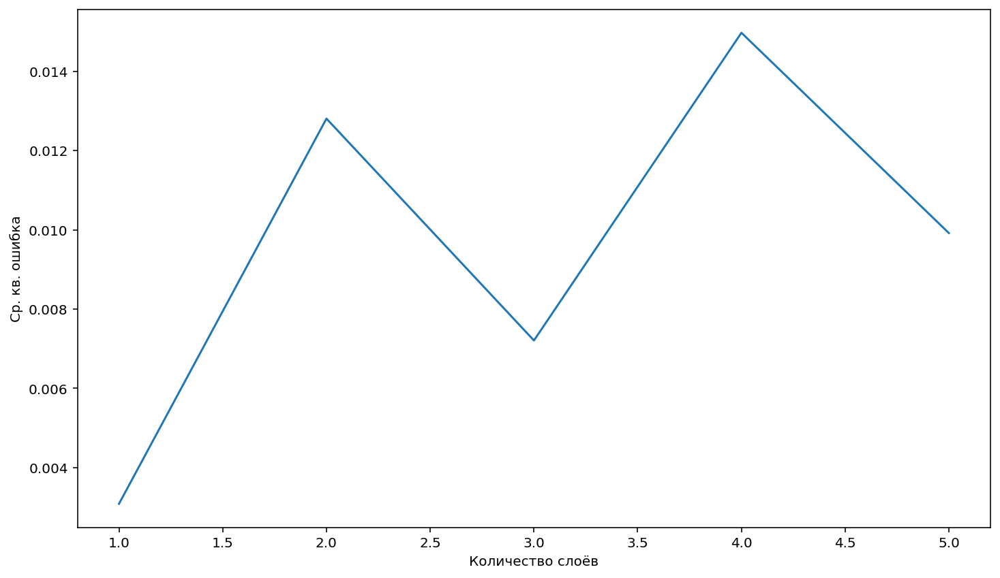

In [10]:
def draw_exp(i):
  layers = [1, 2, 3, 4, 5]
  lst = list(range(1, layers_number + 1))
  plt.plot(layers, loss[i])
  plt.xlabel('Количество слоёв')
  plt.ylabel('Ср. кв. ошибка')
  plt.show()
draw_exp(0)

In [11]:
experiment(10)

Epoch 1/100


 1/20 [>.............................] - ETA: 14s - loss: 0.5139

 9/20 [============>.................] - ETA: 0s - loss: 0.5208 

17/20 [========================>.....] - ETA: 0s - loss: 0.5107

18/20 [==========================>...] - ETA: 0s - loss: 0.5095

20/20 [==============================] - 1s 16ms/step - loss: 0.5059


Epoch 2/100


 1/20 [>.............................] - ETA: 1s - loss: 0.4679

13/20 [==================>...........] - ETA: 0s - loss: 0.4538

20/20 [==============================] - 0s 6ms/step - loss: 0.4450


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3290

 2/20 [==>...........................] - ETA: 1s - loss: 0.3672

20/20 [==============================] - 0s 5ms/step - loss: 0.4110


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4210

15/20 [=====================>........] - ETA: 0s - loss: 0.4136

20/20 [==============================] - 0s 5ms/step - loss: 0.4094


Epoch 5/100


 1/20 [>.............................] - ETA: 1s - loss: 0.4038

 2/20 [==>...........................] - ETA: 3s - loss: 0.3913

 7/20 [=========>....................] - ETA: 0s - loss: 0.3685

11/20 [===============>..............] - ETA: 0s - loss: 0.3701

15/20 [=====================>........] - ETA: 0s - loss: 0.3676

16/20 [=======================>......] - ETA: 0s - loss: 0.3672

20/20 [==============================] - 1s 30ms/step - loss: 0.3643


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3672

 6/20 [========>.....................] - ETA: 0s - loss: 0.3182

20/20 [==============================] - 0s 6ms/step - loss: 0.3055


Epoch 7/100
 1/20 [>.............................] - ETA: 1s - loss: 0.3355

20/20 [==============================] - ETA: 0s - loss: 0.2683

20/20 [==============================] - 0s 5ms/step - loss: 0.2684


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2303

11/20 [===============>..............] - ETA: 0s - loss: 0.2574

20/20 [==============================] - 0s 5ms/step - loss: 0.2511


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2068

 4/20 [=====>........................] - ETA: 0s - loss: 0.2219

20/20 [==============================] - 0s 5ms/step - loss: 0.2241


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1619

 4/20 [=====>........................] - ETA: 0s - loss: 0.1733

10/20 [==============>...............] - ETA: 0s - loss: 0.1837

11/20 [===============>..............] - ETA: 0s - loss: 0.1851

20/20 [==============================] - 0s 20ms/step - loss: 0.1954


Epoch 11/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1454

11/20 [===============>..............] - ETA: 0s - loss: 0.1596

12/20 [=================>............] - ETA: 0s - loss: 0.1618

13/20 [==================>...........] - ETA: 0s - loss: 0.1646

20/20 [==============================] - 0s 17ms/step - loss: 0.1771


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1983



 9/20 [============>.................] - ETA: 0s - loss: 0.2030

20/20 [==============================] - 0s 6ms/step - loss: 0.1940


Epoch 13/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2517

20/20 [==============================] - 0s 1ms/step - loss: 0.1816


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1035

 2/20 [==>...........................] - ETA: 0s - loss: 0.1162

20/20 [==============================] - 0s 4ms/step - loss: 0.1601


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1356

 4/20 [=====>........................] - ETA: 0s - loss: 0.1409

20/20 [==============================] - 0s 4ms/step - loss: 0.1485


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1184

 7/20 [=========>....................] - ETA: 0s - loss: 0.1290

20/20 [==============================] - 0s 6ms/step - loss: 0.1450


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1378

 5/20 [======>.......................] - ETA: 0s - loss: 0.1357

20/20 [==============================] - 0s 6ms/step - loss: 0.1418


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1344

19/20 [===========================>..] - ETA: 0s - loss: 0.1426

20/20 [==============================] - 0s 5ms/step - loss: 0.1427


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1390

 2/20 [==>...........................] - ETA: 1s - loss: 0.1320

 3/20 [===>..........................] - ETA: 1s - loss: 0.1272

13/20 [==================>...........] - ETA: 0s - loss: 0.1276

19/20 [===========================>..] - ETA: 0s - loss: 0.1286

20/20 [==============================] - 0s 20ms/step - loss: 0.1285


Epoch 20/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0528

13/20 [==================>...........] - ETA: 0s - loss: 0.1015

20/20 [==============================] - 0s 6ms/step - loss: 0.1071


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0777

19/20 [===========================>..] - ETA: 0s - loss: 0.1001

20/20 [==============================] - 0s 5ms/step - loss: 0.1015


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0767

 5/20 [======>.......................] - ETA: 0s - loss: 0.1276

20/20 [==============================] - 0s 5ms/step - loss: 0.1164


Epoch 23/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0353

 4/20 [=====>........................] - ETA: 0s - loss: 0.0672

 9/20 [============>.................] - ETA: 0s - loss: 0.0785

19/20 [===========================>..] - ETA: 0s - loss: 0.0922

20/20 [==============================] - 0s 16ms/step - loss: 0.0937


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0977

13/20 [==================>...........] - ETA: 0s - loss: 0.1069

20/20 [==============================] - 0s 6ms/step - loss: 0.1074


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1088

 2/20 [==>...........................] - ETA: 1s - loss: 0.1190

15/20 [=====================>........] - ETA: 0s - loss: 0.1029

20/20 [==============================] - 0s 10ms/step - loss: 0.1018


Epoch 26/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1138

19/20 [===========================>..] - ETA: 0s - loss: 0.1104

20/20 [==============================] - 0s 5ms/step - loss: 0.1091


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0551

 9/20 [============>.................] - ETA: 0s - loss: 0.0739

20/20 [==============================] - 0s 5ms/step - loss: 0.0809


Epoch 28/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0895

20/20 [==============================] - 0s 2ms/step - loss: 0.0870


Epoch 29/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0943

 3/20 [===>..........................] - ETA: 0s - loss: 0.1030

13/20 [==================>...........] - ETA: 0s - loss: 0.0986

20/20 [==============================] - 0s 11ms/step - loss: 0.0936


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0525

 9/20 [============>.................] - ETA: 0s - loss: 0.0576



12/20 [=================>............] - ETA: 0s - loss: 0.0605

18/20 [==========================>...] - ETA: 0s - loss: 0.0669

19/20 [===========================>..] - ETA: 0s - loss: 0.0678

20/20 [==============================] - 0s 21ms/step - loss: 0.0692


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0224

11/20 [===============>..............] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 5ms/step - loss: 0.0630


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0330

 2/20 [==>...........................] - ETA: 1s - loss: 0.0401

20/20 [==============================] - 0s 5ms/step - loss: 0.0695


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0422

 2/20 [==>...........................] - ETA: 1s - loss: 0.0481

16/20 [=======================>......] - ETA: 0s - loss: 0.0631

20/20 [==============================] - 0s 10ms/step - loss: 0.0646


Epoch 34/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0896

 6/20 [========>.....................] - ETA: 0s - loss: 0.0773

 9/20 [============>.................] - ETA: 0s - loss: 0.0754

18/20 [==========================>...] - ETA: 0s - loss: 0.0728

20/20 [==============================] - 0s 15ms/step - loss: 0.0721


Epoch 35/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0407

12/20 [=================>............] - ETA: 0s - loss: 0.0513

20/20 [==============================] - 0s 6ms/step - loss: 0.0573


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0230

 5/20 [======>.......................] - ETA: 0s - loss: 0.0472

20/20 [==============================] - 0s 4ms/step - loss: 0.0607


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

 8/20 [===========>..................] - ETA: 0s - loss: 0.0751

16/20 [=======================>......] - ETA: 0s - loss: 0.0676

20/20 [==============================] - 0s 11ms/step - loss: 0.0658


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0458

 5/20 [======>.......................] - ETA: 0s - loss: 0.0312

15/20 [=====================>........] - ETA: 0s - loss: 0.0467

20/20 [==============================] - 0s 11ms/step - loss: 0.0510


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0667

 6/20 [========>.....................] - ETA: 0s - loss: 0.0766

10/20 [==============>...............] - ETA: 0s - loss: 0.0781

17/20 [========================>.....] - ETA: 0s - loss: 0.0744

20/20 [==============================] - 0s 14ms/step - loss: 0.0720


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0325

 3/20 [===>..........................] - ETA: 0s - loss: 0.0405

11/20 [===============>..............] - ETA: 0s - loss: 0.0498

20/20 [==============================] - 0s 10ms/step - loss: 0.0537


Epoch 41/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0129

 2/20 [==>...........................] - ETA: 5s - loss: 0.0236

15/20 [=====================>........] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 22ms/step - loss: 0.0527


Epoch 42/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0703

 4/20 [=====>........................] - ETA: 0s - loss: 0.0486

13/20 [==================>...........] - ETA: 0s - loss: 0.0470

20/20 [==============================] - 0s 15ms/step - loss: 0.0508


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0368

 9/20 [============>.................] - ETA: 0s - loss: 0.0513

20/20 [==============================] - 0s 5ms/step - loss: 0.0538


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0441

16/20 [=======================>......] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 5ms/step - loss: 0.0531


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0141

 2/20 [==>...........................] - ETA: 1s - loss: 0.0187

 7/20 [=========>....................] - ETA: 0s - loss: 0.0416

20/20 [==============================] - ETA: 0s - loss: 0.0498

20/20 [==============================] - 0s 13ms/step - loss: 0.0500


Epoch 46/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0922

20/20 [==============================] - 0s 2ms/step - loss: 0.0569


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0783

 8/20 [===========>..................] - ETA: 0s - loss: 0.0576

10/20 [==============>...............] - ETA: 0s - loss: 0.0534

11/20 [===============>..............] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 16ms/step - loss: 0.0485


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 1ms/step - loss: 0.0455


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0607

11/20 [===============>..............] - ETA: 0s - loss: 0.0637

20/20 [==============================] - 0s 5ms/step - loss: 0.0588


Epoch 50/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1108

16/20 [=======================>......] - ETA: 0s - loss: 0.0568

20/20 [==============================] - 0s 5ms/step - loss: 0.0550


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0374

 4/20 [=====>........................] - ETA: 0s - loss: 0.0463

20/20 [==============================] - 0s 4ms/step - loss: 0.0440


Epoch 52/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0457

20/20 [==============================] - 0s 1ms/step - loss: 0.0430


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0699

20/20 [==============================] - 0s 1ms/step - loss: 0.0474


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0178

 7/20 [=========>....................] - ETA: 0s - loss: 0.0393

 8/20 [===========>..................] - ETA: 0s - loss: 0.0400

14/20 [====================>.........] - ETA: 0s - loss: 0.0441

20/20 [==============================] - 0s 15ms/step - loss: 0.0451


Epoch 55/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0178

 7/20 [=========>....................] - ETA: 0s - loss: 0.0335

15/20 [=====================>........] - ETA: 0s - loss: 0.0362

17/20 [========================>.....] - ETA: 0s - loss: 0.0370

20/20 [==============================] - 0s 15ms/step - loss: 0.0382


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0530

 3/20 [===>..........................] - ETA: 0s - loss: 0.0495

20/20 [==============================] - ETA: 0s - loss: 0.0402

20/20 [==============================] - 0s 10ms/step - loss: 0.0403


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0824

 5/20 [======>.......................] - ETA: 0s - loss: 0.0704

20/20 [==============================] - 0s 5ms/step - loss: 0.0522


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0230

20/20 [==============================] - ETA: 0s - loss: 0.0417

20/20 [==============================] - 0s 5ms/step - loss: 0.0417


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0150

 8/20 [===========>..................] - ETA: 0s - loss: 0.0526

20/20 [==============================] - 0s 6ms/step - loss: 0.0461


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0251

20/20 [==============================] - 0s 2ms/step - loss: 0.0397


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1285

 8/20 [===========>..................] - ETA: 0s - loss: 0.0587

20/20 [==============================] - 0s 6ms/step - loss: 0.0485


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 2ms/step - loss: 0.0337


Epoch 63/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0314

 2/20 [==>...........................] - ETA: 1s - loss: 0.0376

10/20 [==============>...............]

 - ETA: 0s - loss: 0.0430

11/20 [===============>..............] - ETA: 0s - loss: 0.0429

20/20 [==============================] - ETA: 0s - loss: 0.0410

20/20 [==============================] - 0s 20ms/step - loss: 0.0408


Epoch 64/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0087

 2/20 [==>...........................] - ETA: 1s - loss: 0.0090

 8/20 [===========>..................] - ETA: 0s - loss: 0.0209

 9/20 [============>.................] - ETA: 0s - loss: 0.0222

16/20 [=======================>......] - ETA: 0s - loss: 0.0262

20/20 [==============================] - 0s 20ms/step - loss: 0.0285


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0663

 5/20 [======>.......................] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 5ms/step - loss: 0.0372


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0078

20/20 [==============================] - ETA: 0s - loss: 0.0286

20/20 [==============================] - 0s 5ms/step - loss: 0.0289


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

16/20 [=======================>......] - ETA: 0s - loss: 0.0402

20/20 [==============================] - 0s 4ms/step - loss: 0.0391


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0439

 5/20 [======>.......................] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 5ms/step - loss: 0.0306


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

10/20 [==============>...............] - ETA: 0s - loss: 0.0269

20/20 [==============================] - 0s 5ms/step - loss: 0.0306


Epoch 70/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0098

12/20 [=================>............] - ETA: 0s - loss: 0.0242

20/20 [==============================] - 0s 6ms/step - loss: 0.0272


Epoch 71/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0611

 7/20 [=========>....................] - ETA: 0s - loss: 0.0385

13/20 [==================>...........] - ETA: 0s - loss: 0.0322

14/20 [====================>.........] - ETA: 0s - loss: 0.0320

20/20 [==============================] - 0s 16ms/step - loss: 0.0312


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0184

 2/20 [==>...........................] - ETA: 1s - loss: 0.0187

 9/20 [============>.................] - ETA: 0s - loss: 0.0251

20/20 [==============================] - 0s 12ms/step - loss: 0.0298


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0129

15/20 [=====================>........] - ETA: 0s - loss: 0.0294

20/20 [==============================] - 0s 6ms/step - loss: 0.0295


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0817

 3/20 [===>..........................] - ETA: 0s - loss: 0.0578

19/20 [===========================>..] - ETA: 0s - loss: 0.0349

20/20 [==============================] - 0s 8ms/step - loss: 0.0343


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0268

 2/20 [==>...........................] - ETA: 1s - loss: 0.0237

20/20 [==============================] - 0s 5ms/step - loss: 0.0269


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

20/20 [==============================] - 0s 2ms/step - loss: 0.0296


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0413

 7/20 [=========>....................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 6ms/step - loss: 0.0242


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

14/20 [====================>.........] - ETA: 0s - loss: 0.0257

20/20 [==============================] - 0s 5ms/step - loss: 0.0254


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0555

10/20 [==============>...............] - ETA: 0s - loss: 0.0356

20/20 [==============================] - 0s 4ms/step - loss: 0.0301


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0525

 2/20 [==>...........................] - ETA: 1s - loss: 0.0452

14/20 [====================>.........] - ETA: 0s - loss: 0.0269

15/20 [=====================>........] - ETA: 0s - loss: 0.0265

17/20 [========================>.....] - ETA: 0s - loss: 0.0261

18/20 [==========================>...] - ETA: 0s - loss: 0.0261

19/20 [===========================>..] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 1s 30ms/step - loss: 0.0259


Epoch 81/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0317

 7/20 [=========>....................] - ETA: 0s - loss: 0.0269

 8/20 [===========>..................] - ETA: 0s - loss: 0.0261

16/20 [=======================>......] - ETA: 0s - loss: 0.0249

19/20 [===========================>..] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 21ms/step - loss: 0.0246


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

12/20 [=================>............] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 5ms/step - loss: 0.0193


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0315

 4/20 [=====>........................] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 5ms/step - loss: 0.0256


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0062

10/20 [==============>...............] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 6ms/step - loss: 0.0182


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0152

13/20 [==================>...........] - ETA: 0s - loss: 0.0234

20/20 [==============================] - 0s 6ms/step - loss: 0.0229


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

 3/20 [===>..........................] - ETA: 0s - loss: 0.0190

 8/20 [===========>..................] - ETA: 0s - loss: 0.0234

14/20 [====================>.........] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 15ms/step - loss: 0.0216


Epoch 87/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0063

 4/20 [=====>........................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 7ms/step - loss: 0.0143


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0112

 6/20 [========>.....................] - ETA: 0s - loss: 0.0147

20/20 [==============================] - 0s 6ms/step - loss: 0.0177


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

10/20 [==============>...............] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 5ms/step - loss: 0.0182


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0245

 2/20 [==>...........................] - ETA: 1s - loss: 0.0254

20/20 [==============================] - 0s 5ms/step - loss: 0.0201


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0456

18/20 [==========================>...] - ETA: 0s - loss: 0.0237

20/20 [==============================] - 0s 5ms/step - loss: 0.0229


Epoch 92/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0291

13/20 [==================>...........] - ETA: 0s - loss: 0.0207

20/20 [==============================] - 0s 7ms/step - loss: 0.0202


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0440

 5/20 [======>.......................] - ETA: 0s - loss: 0.0355

15/20 [=====================>........] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 11ms/step - loss: 0.0233


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

 2/20 [==>...........................] - ETA: 1s - loss: 0.0165

20/20 [==============================] - 0s 6ms/step - loss: 0.0193


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0629

11/20 [===============>..............] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 5ms/step - loss: 0.0198


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

 3/20 [===>..........................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 5ms/step - loss: 0.0116


Epoch 97/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0157

13/20 [==================>...........] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 7ms/step - loss: 0.0171


Epoch 98/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0014

12/20 [=================>............] - ETA: 0s - loss: 0.0158

20/20 [==============================] - 0s 6ms/step - loss: 0.0160


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

 3/20 [===>..........................] - ETA: 0s - loss: 0.0127

 9/20 [============>.................] - ETA: 0s - loss: 0.0147

13/20 [==================>...........] - ETA: 0s - loss: 0.0147

20/20 [==============================] - 0s 20ms/step - loss: 0.0149


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

12/20 [=================>............] - ETA: 0s - loss: 0.0126

20/20 [==============================] - 0s 5ms/step - loss: 0.0134


Epoch 1/100


 1/20 [>.............................] - ETA: 24s - loss: 0.7697

 2/20 [==>...........................] - ETA: 1s - loss: 0.7524 

20/20 [==============================] - 1s 5ms/step - loss: 0.7346


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5060

20/20 [==============================] - 0s 1ms/step - loss: 0.4514


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4147

20/20 [==============================] - 0s 1ms/step - loss: 0.3891


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3066

16/20 [=======================>......] - ETA: 0s - loss: 0.3698

20/20 [==============================] - 0s 5ms/step - loss: 0.3711


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3939

 8/20 [===========>..................] - ETA: 0s - loss: 0.3675

20/20 [==============================] - 0s 5ms/step - loss: 0.3604


Epoch 6/100

 1/20 [>.............................] - ETA: 1s - loss: 0.3413

 2/20 [==>...........................] - ETA: 2s - loss: 0.3141

 3/20 [===>..........................] - ETA: 2s - loss: 0.3048

 4/20 [=====>........................] - ETA: 2s - loss: 0.3009

15/20 [=====================>........] - ETA: 0s - loss: 0.3065

20/20 [==============================] - 1s 26ms/step - loss: 0.3147


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4331

 2/20 [==>...........................] - ETA: 1s - loss: 0.4137

13/20 [==================>...........] - ETA: 0s - loss: 0.3511

14/20 [====================>.........] - ETA: 0s - loss: 0.3489

20/20 [==============================] - 0s 16ms/step - loss: 0.3398


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3747

 5/20 [======>.......................] - ETA: 0s - loss: 0.3480

20/20 [==============================] - 0s 4ms/step - loss: 0.3238


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2540

20/20 [==============================] - 0s 1ms/step - loss: 0.2935


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3502

20/20 [==============================] - 0s 1ms/step - loss: 0.3090


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1877

18/20 [==========================>...] - ETA: 0s - loss: 0.2566

20/20 [==============================] - 0s 5ms/step - loss: 0.2601


Epoch 12/100
 1/20 [>.............................] - ETA: 3s - loss: 0.2652

 9/20 [============>.................] - ETA: 0s - loss: 0.2773

20/20 [==============================] - ETA: 0s - loss: 0.2740

20/20 [==============================] - 0s 11ms/step - loss: 0.2738


Epoch 13/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2591

12/20 [=================>............] - ETA: 0s - loss: 0.2851

20/20 [==============================] - 0s 6ms/step - loss: 0.2764


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3146

 2/20 [==>...........................] - ETA: 1s - loss: 0.3005

16/20 [=======================>......] - ETA: 0s - loss: 0.2601

20/20 [==============================] - 0s 9ms/step - loss: 0.2582


Epoch 15/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1614

20/20 [==============================] - 0s 2ms/step - loss: 0.2280


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2328

18/20 [==========================>...] - ETA: 0s - loss: 0.2237

20/20 [==============================] - 0s 5ms/step - loss: 0.2232


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2813

15/20 [=====================>........] - ETA: 0s - loss: 0.2292

20/20 [==============================] - 0s 4ms/step - loss: 0.2215


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1762

10/20 [==============>...............] - ETA: 0s - loss: 0.2068

20/20 [==============================] - 0s 4ms/step - loss: 0.1970


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2304

 2/20 [==>...........................] - ETA: 1s - loss: 0.2197

 3/20 [===>..........................] - ETA: 1s - loss: 0.2237

 4/20 [=====>........................] - ETA: 2s - loss: 0.2245

 7/20 [=========>....................] - ETA: 1s - loss: 0.2170

16/20 [=======================>......] - ETA: 0s - loss: 0.2002

20/20 [==============================] - 1s 31ms/step - loss: 0.1933


Epoch 20/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2277

 2/20 [==>...........................] - ETA: 1s - loss: 0.1987

15/20 [=====================>........] - ETA: 0s - loss: 0.1662

20/20 [==============================] - 0s 11ms/step - loss: 0.1640


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2093

 2/20 [==>...........................] - ETA: 1s - loss: 0.2072

20/20 [==============================] - ETA: 0s - loss: 0.1568

20/20 [==============================] - 0s 9ms/step - loss: 0.1565


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1557

 6/20 [========>.....................] - ETA: 0s - loss: 0.1824

20/20 [==============================] - 0s 5ms/step - loss: 0.1646


Epoch 23/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1134

20/20 [==============================] - 0s 1ms/step - loss: 0.1318


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1876

20/20 [==============================] - 0s 1ms/step - loss: 0.1411


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1800

 6/20 [========>.....................] - ETA: 0s - loss: 0.1395

13/20 [==================>...........] - ETA: 0s - loss: 0.1295

14/20 [====================>.........] - ETA: 0s - loss: 0.1290

15/20 [=====================>........] - ETA: 0s - loss: 0.1285

19/20 [===========================>..] - ETA: 0s - loss: 0.1266

20/20 [==============================] - ETA: 0s - loss: 0.1264

20/20 [==============================] - 1s 35ms/step - loss: 0.1262


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1132

 5/20 [======>.......................] - ETA: 0s - loss: 0.0977

20/20 [==============================] - 0s 11ms/step - loss: 0.1061


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0607

20/20 [==============================] - 0s 1ms/step - loss: 0.1025


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1472

20/20 [==============================] - 0s 1ms/step - loss: 0.1081


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0548

20/20 [==============================] - 0s 1ms/step - loss: 0.0970


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0921

14/20 [====================>.........] - ETA: 0s - loss: 0.1188

20/20 [==============================] - 0s 5ms/step - loss: 0.1127


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0404

 8/20 [===========>..................] - ETA: 0s - loss: 0.0715

20/20 [==============================] - 0s 4ms/step - loss: 0.0823


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0452

 2/20 [==>...........................] - ETA: 1s - loss: 0.0471

20/20 [==============================] - 0s 5ms/step - loss: 0.0822


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0775

17/20 [========================>.....] - ETA: 0s - loss: 0.0880

20/20 [==============================] - 0s 5ms/step - loss: 0.0884


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1130

 3/20 [===>..........................] - ETA: 0s - loss: 0.1061

 8/20 [===========>..................] - ETA: 0s - loss: 0.0897

16/20 [=======================>......] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 16ms/step - loss: 0.0859


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1030

 6/20 [========>.....................] - ETA: 0s - loss: 0.0655

17/20 [========================>.....] - ETA: 0s - loss: 0.0755

20/20 [==============================] - 0s 10ms/step - loss: 0.0769


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0964

 2/20 [==>...........................] - ETA: 1s - loss: 0.0973

 3/20 [===>..........................] - ETA: 1s - loss: 0.0963

14/20 [====================>.........] - ETA: 0s - loss: 0.0822

20/20 [==============================] - 0s 15ms/step - loss: 0.0819


Epoch 37/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0658

20/20 [==============================] - 0s 2ms/step - loss: 0.0718


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0470

17/20 [========================>.....] - ETA: 0s - loss: 0.0662

20/20 [==============================] - 0s 5ms/step - loss: 0.0678


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0363

12/20 [=================>............] - ETA: 0s - loss: 0.0675

20/20 [==============================] - 0s 5ms/step - loss: 0.0698


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0415

 4/20 [=====>........................] - ETA: 0s - loss: 0.0496

20/20 [==============================] - 0s 5ms/step - loss: 0.0556


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0538

15/20 [=====================>........] - ETA: 0s - loss: 0.0669

19/20 [===========================>..] - ETA: 0s - loss: 0.0673

20/20 [==============================] - 0s 11ms/step - loss: 0.0673


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0837

 3/20 [===>..........................] - ETA: 0s - loss: 0.0736

 8/20 [===========>..................] - ETA: 0s - loss: 0.0729

20/20 [==============================] - 0s 11ms/step - loss: 0.0683


Epoch 43/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0721

 2/20 [==>...........................] - ETA: 1s - loss: 0.0861

13/20 [==================>...........] - ETA: 0s - loss: 0.0797

16/20 [=======================>......] - ETA: 0s - loss: 0.0768

20/20 [==============================] - 0s 15ms/step - loss: 0.0734


Epoch 44/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0911

20/20 [==============================] - 0s 2ms/step - loss: 0.0673


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0937

11/20 [===============>..............] - ETA: 0s - loss: 0.0698

20/20 [==============================] - 0s 5ms/step - loss: 0.0640


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0742

 3/20 [===>..........................] - ETA: 0s - loss: 0.0639

20/20 [==============================] - 0s 5ms/step - loss: 0.0544


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0572

20/20 [==============================] - 0s 2ms/step - loss: 0.0546


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0372

19/20 [===========================>..] - ETA: 0s - loss: 0.0471

20/20 [==============================] - 0s 5ms/step - loss: 0.0474


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1041

10/20 [==============>...............] - ETA: 0s - loss: 0.0570

15/20 [=====================>........] - ETA: 0s - loss: 0.0541

16/20 [=======================>......] - ETA: 0s - loss: 0.0538

17/20 [========================>.....] - ETA: 0s - loss: 0.0534

20/20 [==============================] - 0s 25ms/step - loss: 0.0525


Epoch 50/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0399

 4/20 [=====>........................] - ETA: 0s - loss: 0.0427

12/20 [=================>............] - ETA: 0s - loss: 0.0501

20/20 [==============================] - ETA: 0s - loss: 0.0487

20/20 [==============================] - 0s 15ms/step - loss: 0.0486


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0187

 9/20 [============>.................] - ETA: 0s - loss: 0.0283

20/20 [==============================] - 0s 5ms/step - loss: 0.0368


Epoch 52/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0389

20/20 [==============================] - 0s 1ms/step - loss: 0.0456


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0506

20/20 [==============================] - 0s 1ms/step - loss: 0.0428


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0462

20/20 [==============================] - 0s 1ms/step - loss: 0.0387


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

15/20 [=====================>........] - ETA: 0s - loss: 0.0329

20/20 [==============================] - 0s 5ms/step - loss: 0.0341


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0523

11/20 [===============>..............] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 4ms/step - loss: 0.0360


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0195

 2/20 [==>...........................] - ETA: 1s - loss: 0.0281

20/20 [==============================] - 0s 5ms/step - loss: 0.0357


Epoch 58/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0236

10/20 [==============>...............] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 6ms/step - loss: 0.0351


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

 3/20 [===>..........................] - ETA: 0s - loss: 0.0185

 9/20 [============>.................] - ETA: 0s - loss: 0.0249

10/20 [==============>...............] - ETA: 0s - loss: 0.0258

16/20 [=======================>......] - ETA: 0s - loss: 0.0294

20/20 [==============================] - 0s 21ms/step - loss: 0.0307


Epoch 60/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0402

20/20 [==============================] - 0s 1ms/step - loss: 0.0323


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0177

20/20 [==============================] - 0s 1ms/step - loss: 0.0279


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0378

20/20 [==============================] - 0s 1ms/step - loss: 0.0319


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0226

20/20 [==============================] - 0s 1ms/step - loss: 0.0347


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0237

20/20 [==============================] - 0s 1ms/step - loss: 0.0322


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

14/20 [====================>.........] - ETA: 0s - loss: 0.0293

20/20 [==============================] - 0s 3ms/step - loss: 0.0285


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 1ms/step - loss: 0.0215


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0341

20/20 [==============================] - 0s 1ms/step - loss: 0.0285


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

19/20 [===========================>..] - ETA: 0s - loss: 0.0276

20/20 [==============================] - 0s 3ms/step - loss: 0.0274


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0274

20/20 [==============================] - 0s 1ms/step - loss: 0.0216


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0127

12/20 [=================>............] - ETA: 0s - loss: 0.0221

20/20 [==============================] - 0s 3ms/step - loss: 0.0228


Epoch 71/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0438

20/20 [==============================] - 0s 1ms/step - loss: 0.0262


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 1ms/step - loss: 0.0219


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0141

13/20 [==================>...........] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 0s 3ms/step - loss: 0.0203


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0581

17/20 [========================>.....] - ETA: 0s - loss: 0.0256

20/20 [==============================] - 0s 4ms/step - loss: 0.0248


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 1ms/step - loss: 0.0172


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0104

20/20 [==============================] - 0s 2ms/step - loss: 0.0178


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0078

20/20 [==============================] - 0s 1ms/step - loss: 0.0200


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0261

20/20 [==============================] - 0s 1ms/step - loss: 0.0202


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0314

11/20 [===============>..............] - ETA: 0s - loss: 0.0228

20/20 [==============================] - 0s 3ms/step - loss: 0.0210


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0396

20/20 [==============================] - 0s 1ms/step - loss: 0.0183


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

15/20 [=====================>........] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 0s 4ms/step - loss: 0.0192


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 1ms/step - loss: 0.0197


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 1ms/step - loss: 0.0175


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

17/20 [========================>.....] - ETA: 0s - loss: 0.0122

20/20 [==============================] - 0s 3ms/step - loss: 0.0131


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 1ms/step - loss: 0.0167


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

15/20 [=====================>........] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 3ms/step - loss: 0.0165


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

18/20 [==========================>...] - ETA: 0s - loss: 0.0165

20/20 [==============================] - 0s 3ms/step - loss: 0.0164


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 1ms/step - loss: 0.0128


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

13/20 [==================>...........] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0136


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0315

20/20 [==============================] - 0s 1ms/step - loss: 0.0181


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 1ms/step - loss: 0.0148


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0096

11/20 [===============>..............] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 3ms/step - loss: 0.0128


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

17/20 [========================>.....] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 4ms/step - loss: 0.0098


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 1ms/step - loss: 0.0122


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

20/20 [==============================] - 0s 1ms/step - loss: 0.0106


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0104

18/20 [==========================>...] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 3ms/step - loss: 0.0120


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 1ms/step - loss: 0.0117


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0292

20/20 [==============================] - 0s 1ms/step - loss: 0.0125


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0040

15/20 [=====================>........] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.4828

20/20 [==============================] - 0s 1ms/step - loss: 0.4872


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5292

17/20 [========================>.....] - ETA: 0s - loss: 0.4159

20/20 [==============================] - 0s 4ms/step - loss: 0.4071


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2284

15/20 [=====================>........] - ETA: 0s - loss: 0.3261

20/20 [==============================] - 0s 4ms/step - loss: 0.3257


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3155

20/20 [==============================] - 0s 1ms/step - loss: 0.3036


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3362

20/20 [==============================] - 0s 1ms/step - loss: 0.2974


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3189

14/20 [====================>.........] - ETA: 0s - loss: 0.2770

20/20 [==============================] - 0s 3ms/step - loss: 0.2732


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1890

20/20 [==============================] - 0s 1ms/step - loss: 0.2570


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3410

20/20 [==============================] - 0s 1ms/step - loss: 0.2507


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1573

14/20 [====================>.........] - ETA: 0s - loss: 0.2260

20/20 [==============================] - 0s 3ms/step - loss: 0.2282


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1846

20/20 [==============================] - 0s 2ms/step - loss: 0.2170


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1894

20/20 [==============================] - 0s 1ms/step - loss: 0.2109


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1744

18/20 [==========================>...] - ETA: 0s - loss: 0.1987

20/20 [==============================] - 0s 3ms/step - loss: 0.1990


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1518

20/20 [==============================] - 0s 1ms/step - loss: 0.1945


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2189

12/20 [=================>............] - ETA: 0s - loss: 0.2006

20/20 [==============================] - 0s 3ms/step - loss: 0.1948


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1426

20/20 [==============================] - 0s 1ms/step - loss: 0.1730


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1217

20/20 [==============================] - 0s 1ms/step - loss: 0.1604


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1478

20/20 [==============================] - 0s 2ms/step - loss: 0.1401


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1575

20/20 [==============================] - 0s 1ms/step - loss: 0.1578


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1000

20/20 [==============================] - 0s 1ms/step - loss: 0.1345


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1102

20/20 [==============================] - 0s 2ms/step - loss: 0.1408


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1207

20/20 [==============================] - 0s 2ms/step - loss: 0.1260


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1672

20/20 [==============================] - 0s 1ms/step - loss: 0.1420


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0976

19/20 [===========================>..] - ETA: 0s - loss: 0.1094

20/20 [==============================] - 0s 3ms/step - loss: 0.1106


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0990

20/20 [==============================] - 0s 1ms/step - loss: 0.1161


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0552

20/20 [==============================] - 0s 1ms/step - loss: 0.1087


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0547

17/20 [========================>.....] - ETA: 0s - loss: 0.0920

20/20 [==============================] - 0s 3ms/step - loss: 0.0944


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0964

 2/20 [==>...........................] - ETA: 1s - loss: 0.1067

 7/20 [=========>....................] - ETA: 0s - loss: 0.1112

18/20 [==========================>...] - ETA: 0s - loss: 0.1056

20/20 [==============================] - 0s 15ms/step - loss: 0.1052


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0916

 2/20 [==>...........................] - ETA: 1s - loss: 0.0949

 3/20 [===>..........................] - ETA: 1s - loss: 0.1035

 9/20 [============>.................] - ETA: 0s - loss: 0.1017

11/20 [===============>..............] - ETA: 0s - loss: 0.1005

20/20 [==============================] - 0s 21ms/step - loss: 0.0994


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1042

20/20 [==============================] - 0s 1ms/step - loss: 0.0960


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0707

 8/20 [===========>..................] - ETA: 0s - loss: 0.0841

20/20 [==============================] - 0s 4ms/step - loss: 0.0889


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0402

 8/20 [===========>..................] - ETA: 0s - loss: 0.0885

20/20 [==============================] - 0s 3ms/step - loss: 0.0897


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 1ms/step - loss: 0.0862


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0399

20/20 [==============================] - 0s 1ms/step - loss: 0.0854


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1361

12/20 [=================>............] - ETA: 0s - loss: 0.0904

20/20 [==============================] - 0s 4ms/step - loss: 0.0872


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0722

 8/20 [===========>..................] - ETA: 0s - loss: 0.0863

20/20 [==============================] - 0s 5ms/step - loss: 0.0826


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0510

20/20 [==============================] - 0s 2ms/step - loss: 0.0774


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1093

20/20 [==============================] - 0s 2ms/step - loss: 0.0726


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0902

20/20 [==============================] - 0s 1ms/step - loss: 0.0758


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0795

16/20 [=======================>......] - ETA: 0s - loss: 0.0742

20/20 [==============================] - 0s 3ms/step - loss: 0.0726


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0449

11/20 [===============>..............] - ETA: 0s - loss: 0.0747

20/20 [==============================] - 0s 3ms/step - loss: 0.0703


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0832

20/20 [==============================] - 0s 1ms/step - loss: 0.0628


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0570

20/20 [==============================] - 0s 1ms/step - loss: 0.0574


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0353

14/20 [====================>.........] - ETA: 0s - loss: 0.0551

20/20 [==============================] - 0s 3ms/step - loss: 0.0563


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 1ms/step - loss: 0.0510


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0678

20/20 [==============================] - 0s 1ms/step - loss: 0.0504


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0767

11/20 [===============>..............] - ETA: 0s - loss: 0.0580

20/20 [==============================] - 0s 4ms/step - loss: 0.0551


Epoch 47/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0419

20/20 [==============================] - 0s 1ms/step - loss: 0.0494


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0626

20/20 [==============================] - 0s 1ms/step - loss: 0.0488


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0359

19/20 [===========================>..] - ETA: 0s - loss: 0.0433

20/20 [==============================] - 0s 3ms/step - loss: 0.0435


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 1ms/step - loss: 0.0416


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0458

20/20 [==============================] - 0s 2ms/step - loss: 0.0432


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0438

20/20 [==============================] - 0s 2ms/step - loss: 0.0453


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0365

20/20 [==============================] - 0s 1ms/step - loss: 0.0413


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 1ms/step - loss: 0.0331


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0224

10/20 [==============>...............] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 3ms/step - loss: 0.0363


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0138

17/20 [========================>.....] - ETA: 0s - loss: 0.0293

20/20 [==============================] - 0s 3ms/step - loss: 0.0305


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0508

 4/20 [=====>........................] - ETA: 0s - loss: 0.0411

20/20 [==============================] - 0s 5ms/step - loss: 0.0351


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0193

11/20 [===============>..............] - ETA: 0s - loss: 0.0304

20/20 [==============================] - 0s 6ms/step - loss: 0.0311


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0369

12/20 [=================>............] - ETA: 0s - loss: 0.0342

20/20 [==============================] - 0s 6ms/step - loss: 0.0327


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0316

17/20 [========================>.....] - ETA: 0s - loss: 0.0304

18/20 [==========================>...] - ETA: 0s - loss: 0.0305

20/20 [==============================] - 0s 22ms/step - loss: 0.0304


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0311

 4/20 [=====>........................] - ETA: 0s - loss: 0.0345

18/20 [==========================>...] - ETA: 0s - loss: 0.0315

20/20 [==============================] - 0s 11ms/step - loss: 0.0312


Epoch 62/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0175

20/20 [==============================] - 0s 1ms/step - loss: 0.0254


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0346

 5/20 [======>.......................] - ETA: 0s - loss: 0.0276

20/20 [==============================] - 0s 5ms/step - loss: 0.0273


Epoch 64/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0210

20/20 [==============================] - 0s 2ms/step - loss: 0.0240


Epoch 65/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0163

 6/20 [========>.....................] - ETA: 0s - loss: 0.0178

19/20 [===========================>..] - ETA: 0s - loss: 0.0221

20/20 [==============================] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 21ms/step - loss: 0.0224


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0132

13/20 [==================>...........] - ETA: 0s - loss: 0.0216

15/20 [=====================>........] - ETA: 0s - loss: 0.0222

17/20 [========================>.....] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 16ms/step - loss: 0.0229


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0100

20/20 [==============================] - ETA: 0s - loss: 0.0269

20/20 [==============================] - 0s 5ms/step - loss: 0.0268


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0149

12/20 [=================>............] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 5ms/step - loss: 0.0199


Epoch 69/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0204


Epoch 70/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0462

11/20 [===============>..............] - ETA: 0s - loss: 0.0321

20/20 [==============================] - 0s 6ms/step - loss: 0.0283


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

 2/20 [==>...........................] - ETA: 1s - loss: 0.0117

 7/20 [=========>....................] - ETA: 0s - loss: 0.0201

15/20 [=====================>........] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 17ms/step - loss: 0.0224


Epoch 72/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0116

 8/20 [===========>..................] - ETA: 0s - loss: 0.0166

12/20 [=================>............] - ETA: 0s - loss: 0.0189

20/20 [==============================] - 0s 11ms/step - loss: 0.0197


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0082

 4/20 [=====>........................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 4ms/step - loss: 0.0175


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0170

 2/20 [==>...........................] - ETA: 1s - loss: 0.0182

 4/20 [=====>........................] - ETA: 1s - loss: 0.0184

15/20 [=====================>........] - ETA: 0s - loss: 0.0228

20/20 [==============================] - 0s 17ms/step - loss: 0.0222


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0135

 5/20 [======>.......................] - ETA: 0s - loss: 0.0216

17/20 [========================>.....] - ETA: 0s - loss: 0.0211

18/20 [==========================>...] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 15ms/step - loss: 0.0209


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0085

 6/20 [========>.....................] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 5ms/step - loss: 0.0191


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0385

 2/20 [==>...........................] - ETA: 1s - loss: 0.0309

20/20 [==============================] - 0s 4ms/step - loss: 0.0193


Epoch 78/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0042

 7/20 [=========>....................] - ETA: 0s - loss: 0.0130

 8/20 [===========>..................] - ETA: 0s - loss: 0.0135

 9/20 [============>.................] - ETA: 0s - loss: 0.0137

20/20 [==============================] - ETA: 0s - loss: 0.0152

20/20 [==============================] - 0s 21ms/step - loss: 0.0153


Epoch 79/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0055

11/20 [===============>..............] - ETA: 0s - loss: 0.0135

17/20 [========================>.....] - ETA: 0s - loss: 0.0149

20/20 [==============================] - 0s 11ms/step - loss: 0.0153


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0145

 9/20 [============>.................] - ETA: 0s - loss: 0.0201

13/20 [==================>...........] - ETA: 0s - loss: 0.0205

14/20 [====================>.........] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 0s 21ms/step - loss: 0.0195


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

 4/20 [=====>........................] - ETA: 0s - loss: 0.0137

11/20 [===============>..............] - ETA: 0s - loss: 0.0170

18/20 [==========================>...] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 15ms/step - loss: 0.0171


Epoch 82/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0057

11/20 [===============>..............] - ETA: 0s - loss: 0.0104

20/20 [==============================] - 0s 6ms/step - loss: 0.0139


Epoch 83/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0240

 8/20 [===========>..................] - ETA: 0s - loss: 0.0171

18/20 [==========================>...] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 10ms/step - loss: 0.0157


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

10/20 [==============>...............] - ETA: 0s - loss: 0.0092

20/20 [==============================] - 0s 6ms/step - loss: 0.0115


Epoch 85/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0268

 7/20 [=========>....................] - ETA: 0s - loss: 0.0164

11/20 [===============>..............] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 12ms/step - loss: 0.0155


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0119

11/20 [===============>..............] - ETA: 0s - loss: 0.0125

20/20 [==============================] - 0s 5ms/step - loss: 0.0131


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0139

 6/20 [========>.....................] - ETA: 0s - loss: 0.0178

20/20 [==============================] - 0s 5ms/step - loss: 0.0156


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 0s 1ms/step - loss: 0.0148


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 1ms/step - loss: 0.0123


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0086

12/20 [=================>............] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 3ms/step - loss: 0.0107


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

12/20 [=================>............] - ETA: 0s - loss: 0.0090

20/20 [==============================] - 0s 4ms/step - loss: 0.0109


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0193

20/20 [==============================] - 0s 1ms/step - loss: 0.0113


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0190

20/20 [==============================] - 0s 1ms/step - loss: 0.0114


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

14/20 [====================>.........] - ETA: 0s - loss: 0.0139

20/20 [==============================] - 0s 3ms/step - loss: 0.0135


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0096

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 1ms/step - loss: 0.0143


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0224

19/20 [===========================>..] - ETA: 0s - loss: 0.0126

20/20 [==============================] - 0s 3ms/step - loss: 0.0125


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

12/20 [=================>............] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 3ms/step - loss: 0.0111


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 1ms/step - loss: 0.0119


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.3683

20/20 [==============================] - 0s 2ms/step - loss: 0.4465


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4727

20/20 [==============================] - 0s 1ms/step - loss: 0.3501


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3001

13/20 [==================>...........] - ETA: 0s - loss: 0.2993

20/20 [==============================] - 0s 3ms/step - loss: 0.3018


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2617

18/20 [==========================>...] - ETA: 0s - loss: 0.2796

20/20 [==============================] - 0s 3ms/step - loss: 0.2790


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3952

20/20 [==============================] - 0s 1ms/step - loss: 0.2743


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2269

20/20 [==============================] - 0s 1ms/step - loss: 0.2313


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2004

13/20 [==================>...........] - ETA: 0s - loss: 0.2034

20/20 [==============================] - 0s 4ms/step - loss: 0.2032


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1852

20/20 [==============================] - 0s 1ms/step - loss: 0.1780


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1988

20/20 [==============================] - 0s 1ms/step - loss: 0.1727


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1774

18/20 [==========================>...] - ETA: 0s - loss: 0.1552

20/20 [==============================] - 0s 4ms/step - loss: 0.1556


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2198

20/20 [==============================] - 0s 1ms/step - loss: 0.1514


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1482

 8/20 [===========>..................] - ETA: 0s - loss: 0.1611

20/20 [==============================] - 0s 4ms/step - loss: 0.1505


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1007

17/20 [========================>.....] - ETA: 0s - loss: 0.1160

20/20 [==============================] - 0s 3ms/step - loss: 0.1176


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1363

20/20 [==============================] - 0s 1ms/step - loss: 0.1234


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0984

15/20 [=====================>........] - ETA: 0s - loss: 0.1076

20/20 [==============================] - 0s 3ms/step - loss: 0.1073


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1387

17/20 [========================>.....] - ETA: 0s - loss: 0.1044

20/20 [==============================] - 0s 4ms/step - loss: 0.1038


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0949

20/20 [==============================] - 0s 1ms/step - loss: 0.0917


Epoch 18/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0906

13/20 [==================>...........] - ETA: 0s - loss: 0.0929

20/20 [==============================] - 0s 3ms/step - loss: 0.0929


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

19/20 [===========================>..] - ETA: 0s - loss: 0.0852

20/20 [==============================] - 0s 3ms/step - loss: 0.0853


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0670

20/20 [==============================] - 0s 1ms/step - loss: 0.0785


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1149

11/20 [===============>..............] - ETA: 0s - loss: 0.0946

20/20 [==============================] - 0s 3ms/step - loss: 0.0872


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0847

20/20 [==============================] - 0s 1ms/step - loss: 0.0744


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0997

20/20 [==============================] - 0s 1ms/step - loss: 0.0774


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0879

11/20 [===============>..............] - ETA: 0s - loss: 0.0654

20/20 [==============================] - 0s 3ms/step - loss: 0.0651


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0882

20/20 [==============================] - 0s 1ms/step - loss: 0.0647


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0367

20/20 [==============================] - 0s 1ms/step - loss: 0.0548


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0618

15/20 [=====================>........] - ETA: 0s - loss: 0.0525

20/20 [==============================] - 0s 3ms/step - loss: 0.0541


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0398

20/20 [==============================] - 0s 1ms/step - loss: 0.0577


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0278

20/20 [==============================] - 0s 1ms/step - loss: 0.0526


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1093

14/20 [====================>.........] - ETA: 0s - loss: 0.0681

20/20 [==============================] - 0s 4ms/step - loss: 0.0641


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

20/20 [==============================] - 0s 1ms/step - loss: 0.0471


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0396

15/20 [=====================>........] - ETA: 0s - loss: 0.0562

20/20 [==============================] - 0s 3ms/step - loss: 0.0544


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1561

17/20 [========================>.....] - ETA: 0s - loss: 0.0678

20/20 [==============================] - 0s 4ms/step - loss: 0.0639


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0436

20/20 [==============================] - 0s 1ms/step - loss: 0.0437


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0384

20/20 [==============================] - 0s 1ms/step - loss: 0.0442


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

14/20 [====================>.........] - ETA: 0s - loss: 0.0382

20/20 [==============================] - 0s 3ms/step - loss: 0.0400


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0327

20/20 [==============================] - 0s 1ms/step - loss: 0.0416


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 1ms/step - loss: 0.0422


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

15/20 [=====================>........] - ETA: 0s - loss: 0.0351

20/20 [==============================] - 0s 3ms/step - loss: 0.0363


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0419

20/20 [==============================] - 0s 1ms/step - loss: 0.0360


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0313

15/20 [=====================>........] - ETA: 0s - loss: 0.0345

20/20 [==============================] - 0s 3ms/step - loss: 0.0353


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0105

15/20 [=====================>........] - ETA: 0s - loss: 0.0313

20/20 [==============================] - 0s 4ms/step - loss: 0.0326


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0508

20/20 [==============================] - 0s 1ms/step - loss: 0.0404


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0380

20/20 [==============================] - 0s 1ms/step - loss: 0.0331


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0664

20/20 [==============================] - ETA: 0s - loss: 0.0354

20/20 [==============================] - 0s 3ms/step - loss: 0.0353


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0797

20/20 [==============================] - 0s 1ms/step - loss: 0.0390


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0217

12/20 [=================>............] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 3ms/step - loss: 0.0256


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0502

20/20 [==============================] - 0s 1ms/step - loss: 0.0295


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 1ms/step - loss: 0.0267


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0177

12/20 [=================>............] - ETA: 0s - loss: 0.0263

20/20 [==============================] - 0s 3ms/step - loss: 0.0267


Epoch 51/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 1ms/step - loss: 0.0246


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0202

20/20 [==============================] - 0s 1ms/step - loss: 0.0241


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

15/20 [=====================>........] - ETA: 0s - loss: 0.0275

20/20 [==============================] - 0s 3ms/step - loss: 0.0267


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0222

20/20 [==============================] - 0s 1ms/step - loss: 0.0248


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0141

20/20 [==============================] - 0s 1ms/step - loss: 0.0243


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

17/20 [========================>.....] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 3ms/step - loss: 0.0263


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

18/20 [==========================>...] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 3ms/step - loss: 0.0205


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0277

20/20 [==============================] - 0s 1ms/step - loss: 0.0249


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0105

10/20 [==============>...............] - ETA: 0s - loss: 0.0222

20/20 [==============================] - 0s 4ms/step - loss: 0.0219


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 2ms/step - loss: 0.0197


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 1ms/step - loss: 0.0208


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0098

18/20 [==========================>...] - ETA: 0s - loss: 0.0226

20/20 [==============================] - 0s 3ms/step - loss: 0.0220


Epoch 64/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 1ms/step - loss: 0.0172


Epoch 65/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 1ms/step - loss: 0.0143


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0260

17/20 [========================>.....] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 3ms/step - loss: 0.0163


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0171


Epoch 68/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0236

18/20 [==========================>...] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 3ms/step - loss: 0.0196


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0262

19/20 [===========================>..] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 3ms/step - loss: 0.0180


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0178


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0200

10/20 [==============>...............] - ETA: 0s - loss: 0.0125

20/20 [==============================] - 0s 4ms/step - loss: 0.0138


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 2ms/step - loss: 0.0146


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 1ms/step - loss: 0.0184


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0423

12/20 [=================>............] - ETA: 0s - loss: 0.0202

20/20 [==============================] - 0s 3ms/step - loss: 0.0175


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0572

20/20 [==============================] - 0s 1ms/step - loss: 0.0205


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 1ms/step - loss: 0.0148


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 8.0439e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0110


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0191

20/20 [==============================] - 0s 1ms/step - loss: 0.0124


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0159

20/20 [==============================] - 0s 1ms/step - loss: 0.0131


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

18/20 [==========================>...] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 3ms/step - loss: 0.0105


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0128


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 986us/step - loss: 0.0072


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 3ms/step - loss: 0.0095


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0090


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0148

15/20 [=====================>........] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 3ms/step - loss: 0.0097


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

20/20 [==============================] - 0s 1ms/step - loss: 0.0078


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0094

20/20 [==============================] - 0s 1ms/step - loss: 0.0120


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

17/20 [========================>.....] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 3ms/step - loss: 0.0092


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 1ms/step - loss: 0.0135


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

13/20 [==================>...........] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 3ms/step - loss: 0.0069


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0069

17/20 [========================>.....] - ETA: 0s - loss: 0.0111

20/20 [==============================] - 0s 4ms/step - loss: 0.0107


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 1ms/step - loss: 0.0073


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0064

18/20 [==========================>...] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0041

17/20 [========================>.....] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 3ms/step - loss: 0.0078


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 1ms/step - loss: 0.0084


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

15/20 [=====================>........] - ETA: 0s - loss: 0.0112



20/20 [==============================] - 0s 3ms/step - loss: 0.0103


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0109

20/20 [==============================] - 0s 1ms/step - loss: 0.0076


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0070


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

10/20 [==============>...............] - ETA: 0s - loss: 0.0060

20/20 [==============================] - 0s 4ms/step - loss: 0.0066


Epoch 100/100
 1/20 [>.............................] - ETA: 3s - loss: 0.0020

 3/20 [===>..........................] - ETA: 0s - loss: 0.0074

 8/20 [===========>..................] - ETA: 0s - loss: 0.0095

18/20 [==========================>...] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 16ms/step - loss: 0.0086


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.6323

20/20 [==============================] - 0s 1ms/step - loss: 0.5388


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3932

18/20 [==========================>...] - ETA: 0s - loss: 0.4274

20/20 [==============================] - 0s 3ms/step - loss: 0.4258


Epoch 3/100


 1/20 [>.............................] - ETA: 3s - loss: 0.4285

 2/20 [==>...........................] - ETA: 1s - loss: 0.4085

 6/20 [========>.....................] - ETA: 0s - loss: 0.3936

13/20 [==================>...........] - ETA: 0s - loss: 0.3815

20/20 [==============================] - 0s 16ms/step - loss: 0.3782


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3434

 2/20 [==>...........................] - ETA: 1s - loss: 0.3817

16/20 [=======================>......] - ETA: 0s - loss: 0.3631

20/20 [==============================] - 0s 10ms/step - loss: 0.3584


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2945

 5/20 [======>.......................] - ETA: 0s - loss: 0.3042

20/20 [==============================] - 0s 5ms/step - loss: 0.3050


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3372

17/20 [========================>.....] - ETA: 0s - loss: 0.3149

20/20 [==============================] - 0s 3ms/step - loss: 0.3088


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2686

20/20 [==============================] - 0s 1ms/step - loss: 0.2591


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2409

20/20 [==============================] - 0s 1ms/step - loss: 0.2340


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2384

19/20 [===========================>..] - ETA: 0s - loss: 0.2325

20/20 [==============================] - 0s 3ms/step - loss: 0.2325


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2174

20/20 [==============================] - 0s 1ms/step - loss: 0.2052


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2742

20/20 [==============================] - 0s 2ms/step - loss: 0.2071


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2118

13/20 [==================>...........] - ETA: 0s - loss: 0.2052

20/20 [==============================] - 0s 3ms/step - loss: 0.2010


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0893

 9/20 [============>.................] - ETA: 0s - loss: 0.1508

20/20 [==============================] - 0s 4ms/step - loss: 0.1673


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1638

20/20 [==============================] - 0s 1ms/step - loss: 0.1765


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2636

20/20 [==============================] - 0s 1ms/step - loss: 0.1693


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1768

12/20 [=================>............] - ETA: 0s - loss: 0.1665

20/20 [==============================] - 0s 3ms/step - loss: 0.1630


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1708

20/20 [==============================] - 0s 1ms/step - loss: 0.1513


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1961

20/20 [==============================] - 0s 1ms/step - loss: 0.1501


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0933

13/20 [==================>...........] - ETA: 0s - loss: 0.1230

20/20 [==============================] - 0s 3ms/step - loss: 0.1270


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1013

20/20 [==============================] - 0s 1ms/step - loss: 0.1246


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1245

20/20 [==============================] - 0s 1ms/step - loss: 0.1216


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0967

16/20 [=======================>......] - ETA: 0s - loss: 0.1179

20/20 [==============================] - 0s 3ms/step - loss: 0.1171


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 1ms/step - loss: 0.0972


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1633

20/20 [==============================] - 0s 1ms/step - loss: 0.1101


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1734

15/20 [=====================>........] - ETA: 0s - loss: 0.1093

20/20 [==============================] - 0s 3ms/step - loss: 0.1073


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1161

20/20 [==============================] - 0s 1ms/step - loss: 0.0981


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0845

20/20 [==============================] - 0s 1ms/step - loss: 0.0931


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0703

19/20 [===========================>..] - ETA: 0s - loss: 0.0920

20/20 [==============================] - 0s 4ms/step - loss: 0.0916


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0746

20/20 [==============================] - 0s 1ms/step - loss: 0.0835


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0401

11/20 [===============>..............] - ETA: 0s - loss: 0.0653

20/20 [==============================] - 0s 3ms/step - loss: 0.0713


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1446

20/20 [==============================] - 0s 1ms/step - loss: 0.0799


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 1ms/step - loss: 0.0732


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1002

14/20 [====================>.........] - ETA: 0s - loss: 0.0747

20/20 [==============================] - 0s 3ms/step - loss: 0.0732


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0648

20/20 [==============================] - 0s 1ms/step - loss: 0.0632


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0615

20/20 [==============================] - 0s 1ms/step - loss: 0.0578


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0301

17/20 [========================>.....] - ETA: 0s - loss: 0.0522

20/20 [==============================] - 0s 3ms/step - loss: 0.0531


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0436

20/20 [==============================] - 0s 1ms/step - loss: 0.0522


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0614

13/20 [==================>...........] - ETA: 0s - loss: 0.0573

20/20 [==============================] - 0s 3ms/step - loss: 0.0559


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0647

18/20 [==========================>...] - ETA: 0s - loss: 0.0534

20/20 [==============================] - 0s 3ms/step - loss: 0.0528


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1023

20/20 [==============================] - 0s 1ms/step - loss: 0.0524


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0744

12/20 [=================>............] - ETA: 0s - loss: 0.0509

20/20 [==============================] - 0s 3ms/step - loss: 0.0485


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0478

10/20 [==============>...............] - ETA: 0s - loss: 0.0450

20/20 [==============================] - 0s 4ms/step - loss: 0.0435


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0107

15/20 [=====================>........] - ETA: 0s - loss: 0.0334

20/20 [==============================] - 0s 4ms/step - loss: 0.0351


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0399

20/20 [==============================] - 0s 1ms/step - loss: 0.0409


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0294

20/20 [==============================] - 0s 1ms/step - loss: 0.0291


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

18/20 [==========================>...] - ETA: 0s - loss: 0.0252

20/20 [==============================] - 0s 3ms/step - loss: 0.0264


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0355


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0109

15/20 [=====================>........] - ETA: 0s - loss: 0.0281

20/20 [==============================] - 0s 3ms/step - loss: 0.0293


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0244

20/20 [==============================] - 0s 1ms/step - loss: 0.0298


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0322

20/20 [==============================] - 0s 1ms/step - loss: 0.0286


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

10/20 [==============>...............] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 0s 4ms/step - loss: 0.0254


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 1ms/step - loss: 0.0219


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0139

20/20 [==============================] - 0s 1ms/step - loss: 0.0227


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0158

10/20 [==============>...............] - ETA: 0s - loss: 0.0220

20/20 [==============================] - 0s 3ms/step - loss: 0.0214


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 1ms/step - loss: 0.0196


Epoch 56/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0309

20/20 [==============================] - 0s 1ms/step - loss: 0.0233


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0274

10/20 [==============>...............] - ETA: 0s - loss: 0.0207

20/20 [==============================] - 0s 3ms/step - loss: 0.0197


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0151

18/20 [==========================>...] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 4ms/step - loss: 0.0180


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0126

20/20 [==============================] - 0s 1ms/step - loss: 0.0175


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0095

16/20 [=======================>......] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 3ms/step - loss: 0.0160


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0259

19/20 [===========================>..] - ETA: 0s - loss: 0.0186

20/20 [==============================] - 0s 3ms/step - loss: 0.0183


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 1ms/step - loss: 0.0126


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0155

12/20 [=================>............] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 3ms/step - loss: 0.0156


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 1ms/step - loss: 0.0135


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 1ms/step - loss: 0.0142


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

13/20 [==================>...........] - ETA: 0s - loss: 0.0158

20/20 [==============================] - 0s 3ms/step - loss: 0.0148


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0100

20/20 [==============================] - 0s 1ms/step - loss: 0.0101


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0114


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

20/20 [==============================] - 0s 1ms/step - loss: 0.0122


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

11/20 [===============>..............] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 3ms/step - loss: 0.0085


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0047

20/20 [==============================] - 0s 1ms/step - loss: 0.0084


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 1ms/step - loss: 0.0089


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

12/20 [=================>............] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 3ms/step - loss: 0.0085


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 3ms/step - loss: 0.0079


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0103

20/20 [==============================] - 0s 1ms/step - loss: 0.0076


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0168

 9/20 [============>.................] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 3ms/step - loss: 0.0097


Epoch 79/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

15/20 [=====================>........] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 3ms/step - loss: 0.0071


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 1ms/step - loss: 0.0059


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

10/20 [==============>...............] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 4ms/step - loss: 0.0052


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 3ms/step - loss: 0.0063


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

20/20 [==============================] - 0s 1ms/step - loss: 0.0058


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

13/20 [==================>...........] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 4ms/step - loss: 0.0062


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 1ms/step - loss: 0.0052


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 1ms/step - loss: 0.0054


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0068

12/20 [=================>............] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 3ms/step - loss: 0.0062


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

18/20 [==========================>...] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 4ms/step - loss: 0.0055


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 1ms/step - loss: 0.0068


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0044


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

13/20 [==================>...........] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0046


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 1ms/step - loss: 0.0039


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0057

16/20 [=======================>......] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 1ms/step - loss: 0.0048


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

15/20 [=====================>........] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 3ms/step - loss: 0.0043


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

16/20 [=======================>......] - ETA: 0s - loss: 0.0031

20/20 [==============================]

 - 0s 4ms/step - loss: 0.0033


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 1ms/step - loss: 0.0041


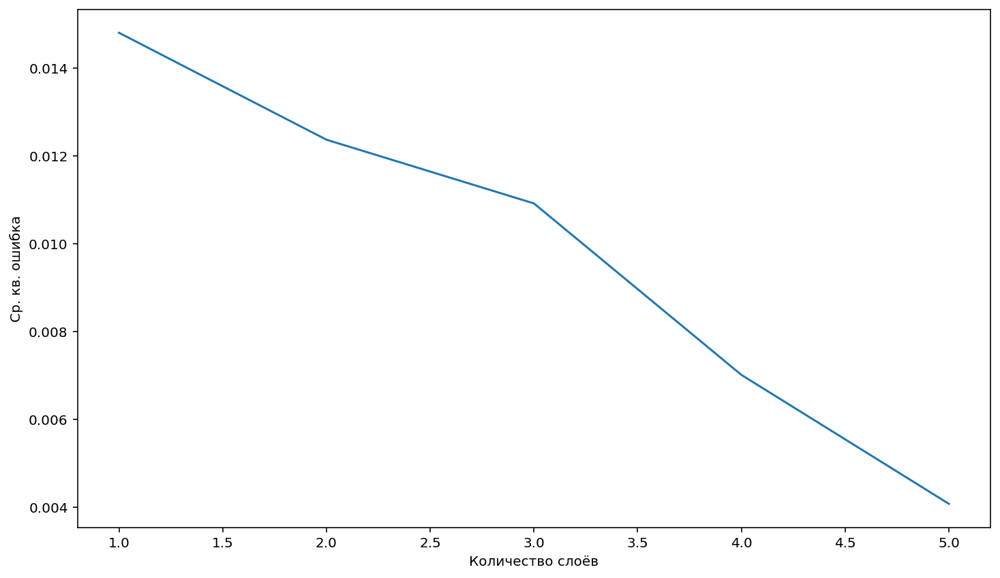

In [12]:
draw_exp(1)

In [13]:
experiment(15)

Epoch 1/100


 1/20 [>.............................] - ETA: 18s - loss: 0.6927

 6/20 [========>.....................] - ETA: 0s - loss: 0.6027 

10/20 [==============>...............] - ETA: 0s - loss: 0.6117

17/20 [========================>.....] - ETA: 0s - loss: 0.6254

20/20 [==============================] - 1s 16ms/step - loss: 0.6264


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4802

18/20 [==========================>...] - ETA: 0s - loss: 0.4906

20/20 [==============================] - 0s 5ms/step - loss: 0.4850


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4431

12/20 [=================>............] - ETA: 0s - loss: 0.4149

20/20 [==============================] - 0s 5ms/step - loss: 0.4098


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3676

 5/20 [======>.......................] - ETA: 0s - loss: 0.3639

20/20 [==============================] - 0s 5ms/step - loss: 0.3884


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4901

13/20 [==================>...........] - ETA: 0s - loss: 0.3987

20/20 [==============================] - 0s 5ms/step - loss: 0.3903


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4691

 2/20 [==>...........................] - ETA: 1s - loss: 0.4420

11/20 [===============>..............] - ETA: 0s - loss: 0.3773

14/20 [====================>.........] - ETA: 0s - loss: 0.3743

19/20 [===========================>..] - ETA: 0s - loss: 0.3738

20/20 [==============================] - 0s 21ms/step - loss: 0.3728


Epoch 7/100
 1/20 [>.............................] - ETA: 2s - loss: 0.3203

 2/20 [==>...........................] - ETA: 1s - loss: 0.3384

12/20 [=================>............] - ETA: 0s - loss: 0.3401

13/20 [==================>...........] - ETA: 0s - loss: 0.3401

20/20 [==============================] - 0s 16ms/step - loss: 0.3429


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3836

 2/20 [==>...........................] - ETA: 1s - loss: 0.3676

20/20 [==============================] - 0s 5ms/step - loss: 0.3448


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3191

20/20 [==============================] - 0s 1ms/step - loss: 0.3290


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3534

17/20 [========================>.....] - ETA: 0s - loss: 0.3365

20/20 [==============================] - 0s 5ms/step - loss: 0.3345


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3915

 9/20 [============>.................] - ETA: 0s - loss: 0.3433

20/20 [==============================] - 0s 4ms/step - loss: 0.3253


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3396

11/20 [===============>..............] - ETA: 0s - loss: 0.2946

20/20 [==============================] - 0s 4ms/step - loss: 0.2999


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3143

20/20 [==============================] - 0s 1ms/step - loss: 0.3051


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3660

20/20 [==============================] - 0s 1ms/step - loss: 0.2995


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2539

 2/20 [==>...........................] - ETA: 1s - loss: 0.2898

10/20 [==============>...............] - ETA: 0s - loss: 0.2871

11/20 [===============>..............] - ETA: 0s - loss: 0.2873

19/20 [===========================>..] - ETA: 0s - loss: 0.2871

20/20 [==============================] - ETA: 0s - loss: 0.2871

20/20 [==============================] - 1s 31ms/step - loss: 0.2871


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2696

 2/20 [==>...........................] - ETA: 1s - loss: 0.2637

 3/20 [===>..........................] - ETA: 1s - loss: 0.2631

20/20 [==============================] - 0s 10ms/step - loss: 0.2714


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2805

10/20 [==============>...............] - ETA: 0s - loss: 0.2719

20/20 [==============================] - 0s 5ms/step - loss: 0.2713


Epoch 18/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2755

20/20 [==============================] - 0s 2ms/step - loss: 0.2712


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2467

20/20 [==============================] - 0s 1ms/step - loss: 0.2648


Epoch 20/100


 1/20 [>.............................] - ETA: 1s - loss: 0.2504

20/20 [==============================] - 0s 2ms/step - loss: 0.2579


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2686

20/20 [==============================] - 0s 2ms/step - loss: 0.2523


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2868

 5/20 [======>.......................] - ETA: 0s - loss: 0.2639

20/20 [==============================] - 0s 4ms/step - loss: 0.2503


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2874

 2/20 [==>...........................] - ETA: 0s - loss: 0.2753

20/20 [==============================] - 0s 4ms/step - loss: 0.2404


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2521

 2/20 [==>...........................] - ETA: 1s - loss: 0.2257

20/20 [==============================] - 0s 4ms/step - loss: 0.2284


Epoch 25/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1986

20/20 [==============================] - 0s 1ms/step - loss: 0.2221


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2183

 3/20 [===>..........................] - ETA: 0s - loss: 0.2166

20/20 [==============================] - 0s 4ms/step - loss: 0.2326


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2608

13/20 [==================>...........] - ETA: 0s - loss: 0.2368

20/20 [==============================] - 0s 4ms/step - loss: 0.2325


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1804

15/20 [=====================>........] - ETA: 0s - loss: 0.2144

20/20 [==============================] - 0s 4ms/step - loss: 0.2166


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2296

16/20 [=======================>......] - ETA: 0s - loss: 0.2188

20/20 [==============================] - 0s 4ms/step - loss: 0.2185


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1683

19/20 [===========================>..] - ETA: 0s - loss: 0.2014

20/20 [==============================] - 0s 4ms/step - loss: 0.2028


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2332

 3/20 [===>..........................] - ETA: 0s - loss: 0.2341

13/20 [==================>...........] - ETA: 0s - loss: 0.2243

20/20 [==============================] - 0s 10ms/step - loss: 0.2210


Epoch 32/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2353

 6/20 [========>.....................] - ETA: 0s - loss: 0.2258

15/20 [=====================>........] - ETA: 0s - loss: 0.2145

16/20 [=======================>......] - ETA: 0s - loss: 0.2140

17/20 [========================>.....] - ETA: 0s - loss: 0.2135

20/20 [==============================] - 1s 27ms/step - loss: 0.2128


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1554

20/20 [==============================] - 0s 1ms/step - loss: 0.1937


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2477

20/20 [==============================] - 0s 1ms/step - loss: 0.2178


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1826

20/20 [==============================] - 0s 1ms/step - loss: 0.2029


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2683

20/20 [==============================] - 0s 1ms/step - loss: 0.2023


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2197

20/20 [==============================] - 0s 1ms/step - loss: 0.2067


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2630

 5/20 [======>.......................] - ETA: 0s - loss: 0.2304

20/20 [==============================] - 0s 4ms/step - loss: 0.2110


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2753

 2/20 [==>...........................] - ETA: 0s - loss: 0.2631

20/20 [==============================] - 0s 4ms/step - loss: 0.2071


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1859

 5/20 [======>.......................] - ETA: 0s - loss: 0.1808

20/20 [==============================] - 0s 5ms/step - loss: 0.1872


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2172

13/20 [==================>...........] - ETA: 0s - loss: 0.1906

20/20 [==============================] - 0s 3ms/step - loss: 0.1913


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2518

20/20 [==============================] - 0s 1ms/step - loss: 0.2094


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1484

 8/20 [===========>..................] - ETA: 0s - loss: 0.1676

20/20 [==============================] - 0s 4ms/step - loss: 0.1752


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1224

 4/20 [=====>........................] - ETA: 0s - loss: 0.1482

20/20 [==============================] - 0s 5ms/step - loss: 0.1765


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1348

12/20 [=================>............] - ETA: 0s - loss: 0.1734

20/20 [==============================] - 0s 3ms/step - loss: 0.1751


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2075

 2/20 [==>...........................] - ETA: 0s - loss: 0.2107

20/20 [==============================] - 0s 4ms/step - loss: 0.1873


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1724

 5/20 [======>.......................] - ETA: 0s - loss: 0.1644

20/20 [==============================] - 0s 4ms/step - loss: 0.1729


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1384

 2/20 [==>...........................] - ETA: 1s - loss: 0.1657

 4/20 [=====>........................] - ETA: 1s - loss: 0.1715

 5/20 [======>.......................] - ETA: 1s - loss: 0.1740

 6/20 [========>.....................] - ETA: 1s - loss: 0.1751

12/20 [=================>............] - ETA: 0s - loss: 0.1762

20/20 [==============================] - 1s 28ms/step - loss: 0.1785


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2226

 2/20 [==>...........................] - ETA: 1s - loss: 0.2158

13/20 [==================>...........] - ETA: 0s - loss: 0.1996

14/20 [====================>.........] - ETA: 0s - loss: 0.1981

20/20 [==============================] - 0s 16ms/step - loss: 0.1911


Epoch 50/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1508

20/20 [==============================] - 0s 1ms/step - loss: 0.1858


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2927

20/20 [==============================] - 0s 1ms/step - loss: 0.1872


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1425

17/20 [========================>.....] - ETA: 0s - loss: 0.1470

20/20 [==============================] - 0s 5ms/step - loss: 0.1519


Epoch 53/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1786

14/20 [====================>.........] - ETA: 0s - loss: 0.1727

20/20 [==============================] - 0s 6ms/step - loss: 0.1716


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1809

 2/20 [==>...........................] - ETA: 1s - loss: 0.1813

12/20 [=================>............] - ETA: 0s - loss: 0.1690

14/20 [====================>.........] - ETA: 0s - loss: 0.1686

20/20 [==============================] - 0s 15ms/step - loss: 0.1693


Epoch 55/100


 1/20 [>.............................] - ETA: 1s - loss: 0.2140

20/20 [==============================] - 0s 2ms/step - loss: 0.1816


Epoch 56/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1396

12/20 [=================>............] - ETA: 0s - loss: 0.1774

20/20 [==============================] - 0s 5ms/step - loss: 0.1748


Epoch 57/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1835

20/20 [==============================] - 0s 2ms/step - loss: 0.1625


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2058

 7/20 [=========>....................] - ETA: 0s - loss: 0.1895

17/20 [========================>.....] - ETA: 0s - loss: 0.1813

19/20 [===========================>..] - ETA: 0s - loss: 0.1799

20/20 [==============================] - ETA: 0s - loss: 0.1792

20/20 [==============================] - 0s 26ms/step - loss: 0.1786


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1692

 2/20 [==>...........................] - ETA: 1s - loss: 0.1683

 4/20 [=====>........................] - ETA: 0s - loss: 0.1661

 7/20 [=========>....................] - ETA: 0s - loss: 0.1616

18/20 [==========================>...] - ETA: 0s - loss: 0.1607

20/20 [==============================] - 0s 21ms/step - loss: 0.1612


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1202

20/20 [==============================] - ETA: 0s - loss: 0.1512

20/20 [==============================] - 0s 5ms/step - loss: 0.1519


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1091

11/20 [===============>..............] - ETA: 0s - loss: 0.1455

20/20 [==============================] - 0s 5ms/step - loss: 0.1557


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1606

 3/20 [===>..........................] - ETA: 0s - loss: 0.1696

20/20 [==============================] - 0s 5ms/step - loss: 0.1630


Epoch 63/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1872

20/20 [==============================] - 0s 1ms/step - loss: 0.1550


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0940

20/20 [==============================] - 0s 2ms/step - loss: 0.1449


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2067

20/20 [==============================] - 0s 2ms/step - loss: 0.1610


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2336

20/20 [==============================] - 0s 1ms/step - loss: 0.1644


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1888

 3/20 [===>..........................] - ETA: 0s - loss: 0.1550

20/20 [==============================] - 0s 4ms/step - loss: 0.1444


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1262

 2/20 [==>...........................] - ETA: 1s - loss: 0.1352

15/20 [=====================>........] - ETA: 0s - loss: 0.1499

20/20 [==============================] - 0s 9ms/step - loss: 0.1513


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0957

 2/20 [==>...........................] - ETA: 1s - loss: 0.1062

 8/20 [===========>..................] - ETA: 0s - loss: 0.1263

20/20 [==============================] - 0s 11ms/step - loss: 0.1395


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2119

 3/20 [===>..........................] - ETA: 0s - loss: 0.1919

15/20 [=====================>........] - ETA: 0s - loss: 0.1652

20/20 [==============================] - 0s 10ms/step - loss: 0.1607


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1192

 2/20 [==>...........................] - ETA: 1s - loss: 0.1405

 7/20 [=========>....................] - ETA: 0s - loss: 0.1575

20/20 [==============================] - 0s 11ms/step - loss: 0.1486


Epoch 72/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1211

20/20 [==============================] - 0s 1ms/step - loss: 0.1256


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1003

20/20 [==============================] - 0s 2ms/step - loss: 0.1419


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1376

20/20 [==============================] - 0s 1ms/step - loss: 0.1494


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 1ms/step - loss: 0.1374


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1523

20/20 [==============================] - 0s 1ms/step - loss: 0.1438


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0993

20/20 [==============================] - 0s 1ms/step - loss: 0.1329


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1534

20/20 [==============================] - 0s 1ms/step - loss: 0.1384


Epoch 79/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2349

20/20 [==============================] - 0s 1ms/step - loss: 0.1430


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0981

 2/20 [==>...........................] - ETA: 1s - loss: 0.1056

20/20 [==============================] - 0s 4ms/step - loss: 0.1227


Epoch 81/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1125

20/20 [==============================] - 0s 1ms/step - loss: 0.1188


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1558

 2/20 [==>...........................] - ETA: 1s - loss: 0.1419

14/20 [====================>.........] - ETA: 0s - loss: 0.1203

16/20 [=======================>......] - ETA: 0s - loss: 0.1206

20/20 [==============================] - 0s 15ms/step - loss: 0.1210


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1228

 9/20 [============>.................] - ETA: 0s - loss: 0.1104

13/20 [==================>...........] - ETA: 0s - loss: 0.1108

20/20 [==============================] - 0s 11ms/step - loss: 0.1129


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1324

10/20 [==============>...............] - ETA: 0s - loss: 0.1311

20/20 [==============================] - 0s 6ms/step - loss: 0.1259


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1630

11/20 [===============>..............] - ETA: 0s - loss: 0.1277

20/20 [==============================] - 0s 5ms/step - loss: 0.1244


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0832

 5/20 [======>.......................] - ETA: 0s - loss: 0.0882

20/20 [==============================] - 0s 5ms/step - loss: 0.1046


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1342

 2/20 [==>...........................] - ETA: 1s - loss: 0.1116

20/20 [==============================] - 0s 5ms/step - loss: 0.1025


Epoch 88/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1604

20/20 [==============================] - 0s 1ms/step - loss: 0.1254


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0942

20/20 [==============================] - 0s 1ms/step - loss: 0.1072


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0484

 2/20 [==>...........................] - ETA: 1s - loss: 0.0819

20/20 [==============================] - 0s 4ms/step - loss: 0.1048


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1298

20/20 [==============================] - 0s 1ms/step - loss: 0.1078


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0625

20/20 [==============================] - 0s 2ms/step - loss: 0.0921


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1064

10/20 [==============>...............] - ETA: 0s - loss: 0.1003

20/20 [==============================] - ETA: 0s - loss: 0.1010

20/20 [==============================] - 0s 21ms/step - loss: 0.1009


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0332

 2/20 [==>...........................] - ETA: 1s - loss: 0.0426

12/20 [=================>............] - ETA: 0s - loss: 0.0795

20/20 [==============================] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 15ms/step - loss: 0.0861


Epoch 95/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1149

 2/20 [==>...........................] - ETA: 1s - loss: 0.1164

20/20 [==============================] - 0s 5ms/step - loss: 0.1010


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0775

20/20 [==============================] - 0s 1ms/step - loss: 0.0940


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1311

14/20 [====================>.........] - ETA: 0s - loss: 0.0938

20/20 [==============================] - 0s 5ms/step - loss: 0.0931


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0471

13/20 [==================>...........] - ETA: 0s - loss: 0.0777

20/20 [==============================] - 0s 4ms/step - loss: 0.0808


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1320

 9/20 [============>.................] - ETA: 0s - loss: 0.0998

20/20 [==============================] - 0s 4ms/step - loss: 0.0918


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0734

 6/20 [========>.....................] - ETA: 0s - loss: 0.0744

20/20 [==============================] - 0s 4ms/step - loss: 0.0751


Epoch 1/100


 1/20 [>.............................] - ETA: 6s - loss: 0.3123

20/20 [==============================] - 0s 2ms/step - loss: 0.4864


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3928

 9/20 [============>.................] - ETA: 0s - loss: 0.3935

20/20 [==============================] - 0s 4ms/step - loss: 0.3858


Epoch 3/100
 1/20 [>.............................] - ETA: 3s - loss: 0.2744

 8/20 [===========>..................] - ETA: 0s - loss: 0.3246

18/20 [==========================>...] - ETA: 0s - loss: 0.3333

20/20 [==============================] - 0s 11ms/step - loss: 0.3337


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4115

 2/20 [==>...........................] - ETA: 1s - loss: 0.3804

 8/20 [===========>..................] - ETA: 0s - loss: 0.3502

20/20 [==============================] - 0s 11ms/step - loss: 0.3315


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2449

16/20 [=======================>......] - ETA: 0s - loss: 0.2861

20/20 [==============================] - 0s 5ms/step - loss: 0.2867


Epoch 6/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2952

 7/20 [=========>....................] - ETA: 0s - loss: 0.2739

20/20 [==============================] - 0s 5ms/step - loss: 0.2720


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2753

20/20 [==============================] - 0s 2ms/step - loss: 0.2453


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2593

20/20 [==============================] - ETA: 0s - loss: 0.2417

20/20 [==============================] - 0s 5ms/step - loss: 0.2415


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1558

14/20 [====================>.........] - ETA: 0s - loss: 0.2164

20/20 [==============================] - 0s 5ms/step - loss: 0.2212


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2287

 7/20 [=========>....................] - ETA: 0s - loss: 0.2096

16/20 [=======================>......] - ETA: 0s - loss: 0.2103

20/20 [==============================] - 0s 10ms/step - loss: 0.2116


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1600

 4/20 [=====>........................] - ETA: 0s - loss: 0.1786

14/20 [====================>.........] - ETA: 0s - loss: 0.1934

15/20 [=====================>........] - ETA: 0s - loss: 0.1941

18/20 [==========================>...] - ETA: 0s - loss: 0.1950

20/20 [==============================] - 0s 21ms/step - loss: 0.1952


Epoch 12/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1494

 5/20 [======>.......................] - ETA: 0s - loss: 0.1631

17/20 [========================>.....] - ETA: 0s - loss: 0.1725

20/20 [==============================] - 0s 10ms/step - loss: 0.1725


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2869

 6/20 [========>.....................] - ETA: 0s - loss: 0.1800

20/20 [==============================] - 0s 5ms/step - loss: 0.1632


Epoch 14/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0579

20/20 [==============================] - 0s 1ms/step - loss: 0.1235


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1249

20/20 [==============================] - 0s 1ms/step - loss: 0.1439


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1487

20/20 [==============================] - 0s 1ms/step - loss: 0.1401


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1036

20/20 [==============================] - 0s 1ms/step - loss: 0.1075


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1012

15/20 [=====================>........] - ETA: 0s - loss: 0.1155

20/20 [==============================] - 0s 5ms/step - loss: 0.1153


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0640

 8/20 [===========>..................] - ETA: 0s - loss: 0.1030

18/20 [==========================>...] - ETA: 0s - loss: 0.1100

20/20 [==============================] - 0s 9ms/step - loss: 0.1103


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0606

 2/20 [==>...........................] - ETA: 1s - loss: 0.0659

 5/20 [======>.......................] - ETA: 0s - loss: 0.0737

16/20 [=======================>......] - ETA: 0s - loss: 0.0925

20/20 [==============================] - 0s 16ms/step - loss: 0.0958


Epoch 21/100


 1/20 [>.............................] - ETA: 2s - loss: 0.1056

 4/20 [=====>........................] - ETA: 0s - loss: 0.0895

 8/20 [===========>..................] - ETA: 0s - loss: 0.0854

20/20 [==============================] - 0s 11ms/step - loss: 0.0937


Epoch 22/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0936

20/20 [==============================] - 0s 1ms/step - loss: 0.0945


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1005

20/20 [==============================] - 0s 1ms/step - loss: 0.0975


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1424

20/20 [==============================] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 4ms/step - loss: 0.0963


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1316

 9/20 [============>.................] - ETA: 0s - loss: 0.0917

20/20 [==============================] - 0s 5ms/step - loss: 0.0899


Epoch 26/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0714

20/20 [==============================] - 0s 1ms/step - loss: 0.0816


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1345

20/20 [==============================] - 0s 1ms/step - loss: 0.0867


Epoch 28/100


 1/20 [>.............................] - ETA: 5s - loss: 0.1207

20/20 [==============================] - 0s 2ms/step - loss: 0.0744


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0403

 5/20 [======>.......................] - ETA: 0s - loss: 0.0671

14/20 [====================>.........] - ETA: 0s - loss: 0.0684

20/20 [==============================] - 0s 11ms/step - loss: 0.0702


Epoch 30/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0560

 3/20 [===>..........................] - ETA: 0s - loss: 0.0567

20/20 [==============================] - 0s 6ms/step - loss: 0.0638


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1030

16/20 [=======================>......] - ETA: 0s - loss: 0.0850

20/20 [==============================] - 0s 4ms/step - loss: 0.0813


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0692

 9/20 [============>.................] - ETA: 0s - loss: 0.0644

20/20 [==============================] - 0s 5ms/step - loss: 0.0642


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0624

 3/20 [===>..........................] - ETA: 0s - loss: 0.0618

20/20 [==============================] - 0s 4ms/step - loss: 0.0610


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0837

 2/20 [==>...........................] - ETA: 1s - loss: 0.0720

20/20 [==============================] - 0s 4ms/step - loss: 0.0598


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0462

20/20 [==============================] - 0s 1ms/step - loss: 0.0571


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0623

11/20 [===============>..............] - ETA: 0s - loss: 0.0502

20/20 [==============================] - ETA: 0s - loss: 0.0511

20/20 [==============================] - 0s 10ms/step - loss: 0.0513


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0604

 2/20 [==>...........................] - ETA: 1s - loss: 0.0530

10/20 [==============>...............] - ETA: 0s - loss: 0.0452

11/20 [===============>..............] - ETA: 0s - loss: 0.0455

17/20 [========================>.....] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 20ms/step - loss: 0.0474


Epoch 38/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0486

11/20 [===============>..............] - ETA: 0s - loss: 0.0479

20/20 [==============================] - 0s 6ms/step - loss: 0.0493


Epoch 39/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0204

 3/20 [===>..........................] - ETA: 0s - loss: 0.0314

20/20 [==============================] - 0s 6ms/step - loss: 0.0440


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0473

18/20 [==========================>...] - ETA: 0s - loss: 0.0523

20/20 [==============================] - 0s 5ms/step - loss: 0.0512


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0516

 7/20 [=========>....................] - ETA: 0s - loss: 0.0431

20/20 [==============================] - 0s 5ms/step - loss: 0.0422


Epoch 42/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0621

20/20 [==============================] - 0s 1ms/step - loss: 0.0472


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 1ms/step - loss: 0.0401


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0619

20/20 [==============================] - 0s 1ms/step - loss: 0.0367


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0456

 7/20 [=========>....................] - ETA: 0s - loss: 0.0408

18/20 [==========================>...] - ETA: 0s - loss: 0.0386

20/20 [==============================] - 0s 10ms/step - loss: 0.0381


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0089

 7/20 [=========>....................] - ETA: 0s - loss: 0.0293

18/20 [==========================>...] - ETA: 0s - loss: 0.0327

20/20 [==============================] - 0s 10ms/step - loss: 0.0328


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0566

 7/20 [=========>....................] - ETA: 0s - loss: 0.0401

18/20 [==========================>...] - ETA: 0s - loss: 0.0361

19/20 [===========================>..] - ETA: 0s - loss: 0.0360

20/20 [==============================] - 0s 16ms/step - loss: 0.0357


Epoch 48/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0288

20/20 [==============================] - 0s 2ms/step - loss: 0.0290


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

15/20 [=====================>........] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 5ms/step - loss: 0.0283


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0220

 3/20 [===>..........................] - ETA: 0s - loss: 0.0257

20/20 [==============================] - 0s 5ms/step - loss: 0.0262


Epoch 51/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0496

20/20 [==============================] - 0s 1ms/step - loss: 0.0306


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0136

20/20 [==============================] - 0s 1ms/step - loss: 0.0257


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0313

15/20 [=====================>........] - ETA: 0s - loss: 0.0264

20/20 [==============================] - 0s 5ms/step - loss: 0.0256


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0151

 4/20 [=====>........................] - ETA: 0s - loss: 0.0258

 6/20 [========>.....................] - ETA: 0s - loss: 0.0273

11/20 [===============>..............] - ETA: 0s - loss: 0.0267

12/20 [=================>............] - ETA: 0s - loss: 0.0265

20/20 [==============================] - 0s 21ms/step - loss: 0.0251


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0234

 3/20 [===>..........................] - ETA: 0s - loss: 0.0202

10/20 [==============>...............] - ETA: 0s - loss: 0.0212

20/20 [==============================] - ETA: 0s - loss: 0.0214

20/20 [==============================] - 0s 15ms/step - loss: 0.0214


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0201

 8/20 [===========>..................] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 5ms/step - loss: 0.0212


Epoch 57/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0448

20/20 [==============================] - 0s 2ms/step - loss: 0.0244


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

20/20 [==============================] - 0s 1ms/step - loss: 0.0188


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

11/20 [===============>..............] - ETA: 0s - loss: 0.0213

20/20 [==============================] - 0s 5ms/step - loss: 0.0197


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0150


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0274

15/20 [=====================>........] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 6ms/step - loss: 0.0167


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0103

 5/20 [======>.......................] - ETA: 0s - loss: 0.0151

11/20 [===============>..............] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 11ms/step - loss: 0.0162


Epoch 63/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0038

 7/20 [=========>....................] - ETA: 0s - loss: 0.0099

11/20 [===============>..............] - ETA: 0s - loss: 0.0113

16/20 [=======================>......] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 16ms/step - loss: 0.0130


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 0s 2ms/step - loss: 0.0123


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0103

16/20 [=======================>......] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 5ms/step - loss: 0.0117


Epoch 66/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0156


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0167

20/20 [==============================] - 0s 1ms/step - loss: 0.0120


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0178

17/20 [========================>.....] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 5ms/step - loss: 0.0118


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0248

 7/20 [=========>....................] - ETA: 0s - loss: 0.0168

16/20 [=======================>......] - ETA: 0s - loss: 0.0137

20/20 [==============================] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 14ms/step - loss: 0.0131


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0094

 2/20 [==>...........................] - ETA: 4s - loss: 0.0092

 8/20 [===========>..................] - ETA: 0s - loss: 0.0088

 9/20 [============>.................] - ETA: 0s - loss: 0.0090

16/20 [=======================>......] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 1s 31ms/step - loss: 0.0104


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0167

 5/20 [======>.......................] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 6ms/step - loss: 0.0116


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 1ms/step - loss: 0.0106


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0091

20/20 [==============================] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 5ms/step - loss: 0.0095


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0130

13/20 [==================>...........] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 5ms/step - loss: 0.0085


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

 8/20 [===========>..................] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 5ms/step - loss: 0.0085


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0117

 2/20 [==>...........................] - ETA: 1s - loss: 0.0099

20/20 [==============================] - 0s 4ms/step - loss: 0.0086


Epoch 77/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0055

 9/20 [============>.................] - ETA: 0s - loss: 0.0094

10/20 [==============>...............] - ETA: 0s - loss: 0.0093

14/20 [====================>.........] - ETA: 0s - loss: 0.0092

20/20 [==============================] - 0s 22ms/step - loss: 0.0089


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0127

 5/20 [======>.......................] - ETA: 0s - loss: 0.0079

16/20 [=======================>......] - ETA: 0s - loss: 0.0071

20/20 [==============================] - 0s 11ms/step - loss: 0.0072


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

 5/20 [======>.......................] - ETA: 0s - loss: 0.0083

16/20 [=======================>......] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 10ms/step - loss: 0.0075


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0037

 5/20 [======>.......................] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 5ms/step - loss: 0.0076


Epoch 81/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0026

20/20 [==============================] - 0s 1ms/step - loss: 0.0061


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 1ms/step - loss: 0.0063


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0037

20/20 [==============================] - 0s 1ms/step - loss: 0.0059


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

15/20 [=====================>........] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 5ms/step - loss: 0.0058


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

 6/20 [========>.....................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 5ms/step - loss: 0.0054


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

17/20 [========================>.....] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 4ms/step - loss: 0.0043


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0064

10/20 [==============>...............] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 4ms/step - loss: 0.0052


Epoch 88/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0068

 2/20 [==>...........................] - ETA: 1s - loss: 0.0056

20/20 [==============================] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 20ms/step - loss: 0.0051


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

 3/20 [===>..........................] - ETA: 0s - loss: 0.0077

11/20 [===============>..............] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 11ms/step - loss: 0.0064


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0094

 4/20 [=====>........................] - ETA: 0s - loss: 0.0062

 8/20 [===========>..................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 11ms/step - loss: 0.0049


Epoch 91/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0041

20/20 [==============================] - 0s 2ms/step - loss: 0.0039


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

 4/20 [=====>........................] - ETA: 0s - loss: 0.0033

19/20 [===========================>..] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 9ms/step - loss: 0.0040


Epoch 93/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0044

 5/20 [======>.......................] - ETA: 0s - loss: 0.0040

17/20 [========================>.....] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 10ms/step - loss: 0.0043


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

 7/20 [=========>....................] - ETA: 0s - loss: 0.0045

 8/20 [===========>..................] - ETA: 0s - loss: 0.0044

14/20 [====================>.........] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 16ms/step - loss: 0.0043


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

 4/20 [=====>........................] - ETA: 0s - loss: 0.0057

 7/20 [=========>....................] - ETA: 0s - loss: 0.0054

10/20 [==============>...............] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 16ms/step - loss: 0.0045


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050



 2/20 [==>...........................] - ETA: 1s - loss: 0.0043

20/20 [==============================] - 0s 6ms/step - loss: 0.0038


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

12/20 [=================>............] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 5ms/step - loss: 0.0033


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

 5/20 [======>.......................] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 5ms/step - loss: 0.0033


Epoch 99/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0022

 6/20 [========>.....................] - ETA: 0s - loss: 0.0030

16/20 [=======================>......] - ETA: 0s - loss: 0.0033

18/20 [==========================>...] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 1s 15ms/step - loss: 0.0034


Epoch 100/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0025

 8/20 [===========>..................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 6ms/step - loss: 0.0031


Epoch 1/100


 1/20 [>.............................] - ETA: 28s - loss: 0.4423

 6/20 [========>.....................] - ETA: 0s - loss: 0.4302 

19/20 [===========================>..] - ETA: 0s - loss: 0.4308

20/20 [==============================] - ETA: 0s - loss: 0.4306

20/20 [==============================] - 2s 26ms/step - loss: 0.4304


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3552

 4/20 [=====>........................] - ETA: 0s - loss: 0.3728

 9/20 [============>.................] - ETA: 0s - loss: 0.3801

15/20 [=====================>........] - ETA: 0s - loss: 0.3797

16/20 [=======================>......] - ETA: 0s - loss: 0.3791

20/20 [==============================] - 0s 21ms/step - loss: 0.3759


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4346

20/20 [==============================] - 0s 1ms/step - loss: 0.3410


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2525

17/20 [========================>.....] - ETA: 0s - loss: 0.2872

20/20 [==============================] - 0s 6ms/step - loss: 0.2879


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3072

 7/20 [=========>....................] - ETA: 0s - loss: 0.2758

17/20 [========================>.....] - ETA: 0s - loss: 0.2711

20/20 [==============================] - 0s 11ms/step - loss: 0.2707


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3640

 6/20 [========>.....................] - ETA: 0s - loss: 0.2875

19/20 [===========================>..] - ETA: 0s - loss: 0.2647

20/20 [==============================] - 0s 10ms/step - loss: 0.2637


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2928

 5/20 [======>.......................] - ETA: 0s - loss: 0.2569

14/20 [====================>.........] - ETA: 0s - loss: 0.2510

20/20 [==============================] - 0s 11ms/step - loss: 0.2489


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1430

 6/20 [========>.....................] - ETA: 0s - loss: 0.2172

20/20 [==============================] - 0s 5ms/step - loss: 0.2269


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2937

 3/20 [===>..........................] - ETA: 0s - loss: 0.2556

11/20 [===============>..............] - ETA: 0s - loss: 0.2268

12/20 [=================>............] - ETA: 0s - loss: 0.2249

15/20 [=====================>........] - ETA: 0s - loss: 0.2200

16/20 [=======================>......] - ETA: 0s - loss: 0.2194

20/20 [==============================] - 1s 36ms/step - loss: 0.2189


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1388

 5/20 [======>.......................] - ETA: 0s - loss: 0.2127

20/20 [==============================] - ETA: 0s - loss: 0.2100

20/20 [==============================] - 0s 10ms/step - loss: 0.2098


Epoch 11/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1325

16/20 [=======================>......] - ETA: 0s - loss: 0.1944

20/20 [==============================] - 0s 6ms/step - loss: 0.1944


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2277

 2/20 [==>...........................] - ETA: 1s - loss: 0.2246

 3/20 [===>..........................] - ETA: 1s - loss: 0.2122

 4/20 [=====>........................] - ETA: 1s - loss: 0.2057

 6/20 [========>.....................] - ETA: 1s - loss: 0.1969

 7/20 [=========>....................] - ETA: 1s - loss: 0.1971

20/20 [==============================] - 0s 26ms/step - loss: 0.1909


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1122

20/20 [==============================] - 0s 2ms/step - loss: 0.1617


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0867

20/20 [==============================] - 0s 1ms/step - loss: 0.1371


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1573

 5/20 [======>.......................] - ETA: 0s - loss: 0.1411

20/20 [==============================] - 0s 4ms/step - loss: 0.1346


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0801

19/20 [===========================>..] - ETA: 0s - loss: 0.1373

20/20 [==============================] - 0s 3ms/step - loss: 0.1371


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2409

13/20 [==================>...........] - ETA: 0s - loss: 0.1434

20/20 [==============================] - 0s 4ms/step - loss: 0.1359


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1992

20/20 [==============================] - 0s 1ms/step - loss: 0.1361


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1140

20/20 [==============================] - 0s 1ms/step - loss: 0.1158


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1796

14/20 [====================>.........] - ETA: 0s - loss: 0.1018

20/20 [==============================] - 0s 3ms/step - loss: 0.1032


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0483

20/20 [==============================] - 0s 1ms/step - loss: 0.0941


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0589

20/20 [==============================] - 0s 1ms/step - loss: 0.0883


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0788

14/20 [====================>.........] - ETA: 0s - loss: 0.1004

20/20 [==============================] - 0s 3ms/step - loss: 0.0989


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1197

20/20 [==============================] - 0s 1ms/step - loss: 0.0972


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0906

20/20 [==============================] - 0s 1ms/step - loss: 0.0857


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0997

19/20 [===========================>..] - ETA: 0s - loss: 0.0858

20/20 [==============================] - 0s 3ms/step - loss: 0.0859


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0813

20/20 [==============================] - 0s 1ms/step - loss: 0.0787


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1305

13/20 [==================>...........] - ETA: 0s - loss: 0.0875

20/20 [==============================] - 0s 3ms/step - loss: 0.0851


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1120

20/20 [==============================] - 0s 1ms/step - loss: 0.0813


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0881

20/20 [==============================] - 0s 1ms/step - loss: 0.0885


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0730

12/20 [=================>............] - ETA: 0s - loss: 0.0737

20/20 [==============================] - 0s 3ms/step - loss: 0.0712


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0384

20/20 [==============================] - 0s 1ms/step - loss: 0.0605


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0968

20/20 [==============================] - 0s 1ms/step - loss: 0.0693


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0894

16/20 [=======================>......] - ETA: 0s - loss: 0.0695

20/20 [==============================] - 0s 3ms/step - loss: 0.0676


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0322

20/20 [==============================] - 0s 2ms/step - loss: 0.0525


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 2ms/step - loss: 0.0571


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0522

20/20 [==============================] - ETA: 0s - loss: 0.0462

20/20 [==============================] - 0s 3ms/step - loss: 0.0466


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 1ms/step - loss: 0.0532


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0301

20/20 [==============================] - 0s 2ms/step - loss: 0.0482


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0936

20/20 [==============================] - 0s 2ms/step - loss: 0.0516


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 1ms/step - loss: 0.0454


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0659

13/20 [==================>...........] - ETA: 0s - loss: 0.0474

20/20 [==============================] - 0s 3ms/step - loss: 0.0464


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 2ms/step - loss: 0.0450


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0340

20/20 [==============================] - 0s 1ms/step - loss: 0.0457


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0450

11/20 [===============>..............] - ETA: 0s - loss: 0.0494

20/20 [==============================] - 0s 3ms/step - loss: 0.0458


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0404

20/20 [==============================] - 0s 1ms/step - loss: 0.0390


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0383

20/20 [==============================] - 0s 1ms/step - loss: 0.0394


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0147

13/20 [==================>...........] - ETA: 0s - loss: 0.0320

20/20 [==============================] - 0s 3ms/step - loss: 0.0343


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

20/20 [==============================] - 0s 1ms/step - loss: 0.0255


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0347

20/20 [==============================] - 0s 1ms/step - loss: 0.0347


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

19/20 [===========================>..] - ETA: 0s - loss: 0.0274

20/20 [==============================] - 0s 3ms/step - loss: 0.0281


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 1ms/step - loss: 0.0294


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0158

12/20 [=================>............] - ETA: 0s - loss: 0.0266

20/20 [==============================] - 0s 3ms/step - loss: 0.0293


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0239

20/20 [==============================] - 0s 1ms/step - loss: 0.0287


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0121

20/20 [==============================] - 0s 1ms/step - loss: 0.0302


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0372

17/20 [========================>.....] - ETA: 0s - loss: 0.0317

20/20 [==============================] - 0s 3ms/step - loss: 0.0313


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0199

20/20 [==============================] - 0s 1ms/step - loss: 0.0289


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0112

13/20 [==================>...........] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 0s 3ms/step - loss: 0.0269


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0145

20/20 [==============================] - 0s 1ms/step - loss: 0.0238


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 1ms/step - loss: 0.0225


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

13/20 [==================>...........] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 3ms/step - loss: 0.0243


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0221


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0187

20/20 [==============================] - 0s 1ms/step - loss: 0.0235


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

13/20 [==================>...........] - ETA: 0s - loss: 0.0170

20/20 [==============================] - 0s 3ms/step - loss: 0.0188


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 1ms/step - loss: 0.0212


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 2ms/step - loss: 0.0204


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0086

20/20 [==============================] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 0s 3ms/step - loss: 0.0205


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 1ms/step - loss: 0.0223


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0194

16/20 [=======================>......] - ETA: 0s - loss: 0.0232

20/20 [==============================] - 0s 3ms/step - loss: 0.0226


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 1ms/step - loss: 0.0220


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 1ms/step - loss: 0.0183


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

10/20 [==============>...............] - ETA: 0s - loss: 0.0146

20/20 [==============================] - 0s 3ms/step - loss: 0.0160


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

19/20 [===========================>..] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 3ms/step - loss: 0.0142


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 1ms/step - loss: 0.0176


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0268

15/20 [=====================>........] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 3ms/step - loss: 0.0183


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0325

 7/20 [=========>....................] - ETA: 0s - loss: 0.0211

20/20 [==============================] - 0s 3ms/step - loss: 0.0180


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

20/20 [==============================] - 0s 1ms/step - loss: 0.0164


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

20/20 [==============================] - 0s 1ms/step - loss: 0.0155


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0137

13/20 [==================>...........] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0143


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 1ms/step - loss: 0.0124


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 2ms/step - loss: 0.0142


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0214

20/20 [==============================] - 0s 2ms/step - loss: 0.0166


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0125

20/20 [==============================] - 0s 2ms/step - loss: 0.0129


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0257

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

10/20 [==============>...............] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 3ms/step - loss: 0.0150


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0111


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0147

20/20 [==============================] - 0s 1ms/step - loss: 0.0119


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

15/20 [=====================>........] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 3ms/step - loss: 0.0104


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 1ms/step - loss: 0.0124


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

15/20 [=====================>........] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 3ms/step - loss: 0.0095


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 1ms/step - loss: 0.0095


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

15/20 [=====================>........] - ETA: 0s - loss: 0.0111

20/20 [==============================] - 0s 3ms/step - loss: 0.0110


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 1ms/step - loss: 0.0077


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

 6/20 [========>.....................] - ETA: 0s - loss: 0.0096

20/20 [==============================] - 0s 4ms/step - loss: 0.0107


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 3ms/step - loss: 0.0100


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

12/20 [=================>............] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 3ms/step - loss: 0.0100


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0054

17/20 [========================>.....] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.8187

20/20 [==============================] - 0s 1ms/step - loss: 0.5663


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3709

17/20 [========================>.....] - ETA: 0s - loss: 0.3449

20/20 [==============================] - 0s 3ms/step - loss: 0.3446


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2422

20/20 [==============================] - 0s 1ms/step - loss: 0.2922


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2526

20/20 [==============================] - 0s 2ms/step - loss: 0.2508


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2360

10/20 [==============>...............] - ETA: 0s - loss: 0.2411

20/20 [==============================] - 0s 3ms/step - loss: 0.2373


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1954

20/20 [==============================] - 0s 1ms/step - loss: 0.2156


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1823

20/20 [==============================] - 0s 1ms/step - loss: 0.2000


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2783

10/20 [==============>...............] - ETA: 0s - loss: 0.2188

20/20 [==============================] - 0s 3ms/step - loss: 0.2043


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1932

20/20 [==============================] - 0s 1ms/step - loss: 0.1710


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1127

20/20 [==============================] - 0s 1ms/step - loss: 0.1458


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1637

 9/20 [============>.................] - ETA: 0s - loss: 0.1295

20/20 [==============================] - 0s 4ms/step - loss: 0.1396


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1268

20/20 [==============================] - 0s 1ms/step - loss: 0.1379


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0770

20/20 [==============================] - 0s 1ms/step - loss: 0.1207


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1738

12/20 [=================>............] - ETA: 0s - loss: 0.1191

20/20 [==============================] - 0s 3ms/step - loss: 0.1139


Epoch 15/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1044

17/20 [========================>.....] - ETA: 0s - loss: 0.1107

20/20 [==============================] - 0s 3ms/step - loss: 0.1092


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0339

20/20 [==============================] - 0s 1ms/step - loss: 0.0829


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0784

10/20 [==============>...............] - ETA: 0s - loss: 0.0895

20/20 [==============================] - 0s 3ms/step - loss: 0.0884


Epoch 18/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0385

12/20 [=================>............] - ETA: 0s - loss: 0.0781

20/20 [==============================] - 0s 4ms/step - loss: 0.0796


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0734

20/20 [==============================] - 0s 1ms/step - loss: 0.0802


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0668

20/20 [==============================] - 0s 1ms/step - loss: 0.0702


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0537

17/20 [========================>.....] - ETA: 0s - loss: 0.0736

20/20 [==============================] - 0s 3ms/step - loss: 0.0722


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0384

20/20 [==============================] - 0s 1ms/step - loss: 0.0588


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0351

20/20 [==============================] - 0s 1ms/step - loss: 0.0607


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0510

14/20 [====================>.........] - ETA: 0s - loss: 0.0605

20/20 [==============================] - 0s 3ms/step - loss: 0.0592


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0634

20/20 [==============================] - 0s 1ms/step - loss: 0.0578


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1232

20/20 [==============================] - 0s 1ms/step - loss: 0.0650


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0486

15/20 [=====================>........] - ETA: 0s - loss: 0.0495

20/20 [==============================] - 0s 3ms/step - loss: 0.0494


Epoch 28/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0802

 5/20 [======>.......................] - ETA: 0s - loss: 0.0601

 6/20 [========>.....................] - ETA: 0s - loss: 0.0597

 8/20 [===========>..................] - ETA: 0s - loss: 0.0576

 9/20 [============>.................] - ETA: 0s - loss: 0.0568

15/20 [=====================>........] - ETA: 0s - loss: 0.0530

20/20 [==============================] - 1s 32ms/step - loss: 0.0512


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 1ms/step - loss: 0.0439


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0389

20/20 [==============================] - 0s 1ms/step - loss: 0.0388


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

13/20 [==================>...........] - ETA: 0s - loss: 0.0347

20/20 [==============================] - 0s 3ms/step - loss: 0.0368


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0453

20/20 [==============================] - 0s 1ms/step - loss: 0.0387


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0318

20/20 [==============================] - 0s 1ms/step - loss: 0.0358


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0176

14/20 [====================>.........] - ETA: 0s - loss: 0.0310

20/20 [==============================] - 0s 3ms/step - loss: 0.0328


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0417

20/20 [==============================] - 0s 1ms/step - loss: 0.0333


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0436

20/20 [==============================] - 0s 1ms/step - loss: 0.0360


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0428

20/20 [==============================] - 0s 1ms/step - loss: 0.0277


Epoch 38/100
 1/20 [>.............................] - ETA: 3s - loss: 0.0424

 5/20 [======>.......................] - ETA: 0s - loss: 0.0383

17/20 [========================>.....] - ETA: 0s - loss: 0.0342

20/20 [==============================] - 0s 12ms/step - loss: 0.0335


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0175

20/20 [==============================] - 0s 1ms/step - loss: 0.0255


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0114

 2/20 [==>...........................] - ETA: 0s - loss: 0.0231

20/20 [==============================] - 0s 4ms/step - loss: 0.0279


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

20/20 [==============================] - 0s 1ms/step - loss: 0.0260


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 1ms/step - loss: 0.0227


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

11/20 [===============>..............] - ETA: 0s - loss: 0.0241

20/20 [==============================] - 0s 3ms/step - loss: 0.0249


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0213

20/20 [==============================] - 0s 1ms/step - loss: 0.0202


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

17/20 [========================>.....] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 5ms/step - loss: 0.0223


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0118

 5/20 [======>.......................] - ETA: 0s - loss: 0.0215

20/20 [==============================] - 0s 5ms/step - loss: 0.0222


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

 6/20 [========>.....................] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 4ms/step - loss: 0.0196


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0296

20/20 [==============================] - ETA: 0s - loss: 0.0232

20/20 [==============================] - 0s 3ms/step - loss: 0.0231


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0221

20/20 [==============================] - 0s 1ms/step - loss: 0.0211


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 3ms/step - loss: 0.0153


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0351

20/20 [==============================] - ETA: 0s - loss: 0.0253

20/20 [==============================] - 0s 3ms/step - loss: 0.0250


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0242

20/20 [==============================] - 0s 2ms/step - loss: 0.0181


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 3ms/step - loss: 0.0193


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0448

20/20 [==============================] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 3ms/step - loss: 0.0208


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 2ms/step - loss: 0.0148


Epoch 56/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0125

20/20 [==============================] - 0s 3ms/step - loss: 0.0188


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0293

15/20 [=====================>........] - ETA: 0s - loss: 0.0178

20/20 [==============================] - 0s 3ms/step - loss: 0.0172


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - 0s 1ms/step - loss: 0.0163


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 1ms/step - loss: 0.0140


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

14/20 [====================>.........] - ETA: 0s - loss: 0.0104

20/20 [==============================] - 0s 3ms/step - loss: 0.0117


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 2ms/step - loss: 0.0145


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 1ms/step - loss: 0.0111


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0084

15/20 [=====================>........] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 0s 3ms/step - loss: 0.0111


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

20/20 [==============================] - 0s 2ms/step - loss: 0.0137


Epoch 65/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 1ms/step - loss: 0.0187


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

16/20 [=======================>......] - ETA: 0s - loss: 0.0103

20/20 [==============================] - 0s 3ms/step - loss: 0.0111


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

20/20 [==============================] - 0s 1ms/step - loss: 0.0106


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 2ms/step - loss: 0.0136


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0215

20/20 [==============================] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0084

20/20 [==============================] - 0s 2ms/step - loss: 0.0107


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0176

20/20 [==============================] - 0s 1ms/step - loss: 0.0132


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

17/20 [========================>.....] - ETA: 0s - loss: 0.0140

20/20 [==============================] - 0s 3ms/step - loss: 0.0137


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 2ms/step - loss: 0.0089


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 2ms/step - loss: 0.0121


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0152

18/20 [==========================>...] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0132


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

16/20 [=======================>......] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 3ms/step - loss: 0.0147


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 2ms/step - loss: 0.0120


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0170

20/20 [==============================] - 0s 3ms/step - loss: 0.0123


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0175

20/20 [==============================] - 0s 2ms/step - loss: 0.0149


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

10/20 [==============>...............] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 4ms/step - loss: 0.0085


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0078

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 2ms/step - loss: 0.0116


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0200

20/20 [==============================] - 0s 2ms/step - loss: 0.0105


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0220

20/20 [==============================] - 0s 1ms/step - loss: 0.0117


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

18/20 [==========================>...] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 3ms/step - loss: 0.0092


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 1ms/step - loss: 0.0078


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0245

20/20 [==============================] - 0s 1ms/step - loss: 0.0115


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

17/20 [========================>.....] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0125


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 1ms/step - loss: 0.0068


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0089


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

17/20 [========================>.....] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 3ms/step - loss: 0.0099


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 1ms/step - loss: 0.0064


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 2ms/step - loss: 0.0081


Epoch 97/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0167

13/20 [==================>...........] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 4ms/step - loss: 0.0101


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

20/20 [==============================] - 0s 1ms/step - loss: 0.0057


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 1ms/step - loss: 0.0084


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0015

17/20 [========================>.....] - ETA: 0s - loss: 0.0054

20/20 [==============================] - 0s 3ms/step - loss: 0.0058


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.7806

20/20 [==============================] - 0s 1ms/step - loss: 0.6882


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3221

15/20 [=====================>........] - ETA: 0s - loss: 0.3989

20/20 [==============================] - 0s 3ms/step - loss: 0.3987


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4732

20/20 [==============================] - 0s 1ms/step - loss: 0.3742


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4092

20/20 [==============================] - 0s 1ms/step - loss: 0.3255


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2538

14/20 [====================>.........] - ETA: 0s - loss: 0.3068

20/20 [==============================] - 0s 3ms/step - loss: 0.3013


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2769

20/20 [==============================] - 0s 1ms/step - loss: 0.2650


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2149

11/20 [===============>..............] - ETA: 0s - loss: 0.2549

20/20 [==============================] - 0s 3ms/step - loss: 0.2563


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2612

20/20 [==============================] - ETA: 0s - loss: 0.2390

20/20 [==============================] - 0s 3ms/step - loss: 0.2392


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3621

20/20 [==============================] - 0s 1ms/step - loss: 0.2442


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2904

 8/20 [===========>..................] - ETA: 0s - loss: 0.2540

20/20 [==============================] - 0s 3ms/step - loss: 0.2357


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2315

20/20 [==============================] - 0s 1ms/step - loss: 0.2115


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1334

20/20 [==============================] - 0s 1ms/step - loss: 0.1966


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1950

11/20 [===============>..............] - ETA: 0s - loss: 0.1848

20/20 [==============================] - 0s 3ms/step - loss: 0.1829


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1296

20/20 [==============================] - 0s 1ms/step - loss: 0.1684


Epoch 15/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3022

20/20 [==============================] - 0s 1ms/step - loss: 0.1767


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0996

20/20 [==============================] - 0s 3ms/step - loss: 0.1386


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1484

20/20 [==============================] - 0s 1ms/step - loss: 0.1530


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0931

14/20 [====================>.........] - ETA: 0s - loss: 0.1282

20/20 [==============================] - 0s 3ms/step - loss: 0.1288


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1700

 7/20 [=========>....................] - ETA: 0s - loss: 0.1564

20/20 [==============================] - 0s 4ms/step - loss: 0.1394


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0749

14/20 [====================>.........] - ETA: 0s - loss: 0.1041

20/20 [==============================] - 0s 3ms/step - loss: 0.1089


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0901

20/20 [==============================] - 0s 1ms/step - loss: 0.1107


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0926

20/20 [==============================] - 0s 1ms/step - loss: 0.1102


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1817

20/20 [==============================] - ETA: 0s - loss: 0.1200

20/20 [==============================] - 0s 3ms/step - loss: 0.1194


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0711

20/20 [==============================] - 0s 1ms/step - loss: 0.1069


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1204

14/20 [====================>.........] - ETA: 0s - loss: 0.1105

20/20 [==============================] - 0s 3ms/step - loss: 0.1076


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0789

20/20 [==============================] - 0s 2ms/step - loss: 0.1004


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0571

20/20 [==============================] - 0s 1ms/step - loss: 0.0813


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0994

14/20 [====================>.........] - ETA: 0s - loss: 0.1014

20/20 [==============================] - 0s 3ms/step - loss: 0.0989


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0401

20/20 [==============================] - 0s 1ms/step - loss: 0.0862


Epoch 30/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1208

17/20 [========================>.....] - ETA: 0s - loss: 0.0851

20/20 [==============================] - 0s 3ms/step - loss: 0.0859


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1404

20/20 [==============================] - ETA: 0s - loss: 0.0983

20/20 [==============================] - 0s 3ms/step - loss: 0.0977


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0625

20/20 [==============================] - 0s 2ms/step - loss: 0.0860


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0819

20/20 [==============================] - 0s 1ms/step - loss: 0.0856


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0590

15/20 [=====================>........] - ETA: 0s - loss: 0.0720

20/20 [==============================] - 0s 4ms/step - loss: 0.0744


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0709

20/20 [==============================] - 0s 1ms/step - loss: 0.0736


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0400

20/20 [==============================] - 0s 1ms/step - loss: 0.0752


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0520

12/20 [=================>............] - ETA: 0s - loss: 0.0686

20/20 [==============================] - 0s 3ms/step - loss: 0.0696


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0626

20/20 [==============================] - 0s 1ms/step - loss: 0.0755


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0624

20/20 [==============================] - 0s 1ms/step - loss: 0.0738


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0227

17/20 [========================>.....] - ETA: 0s - loss: 0.0614

20/20 [==============================] - 0s 3ms/step - loss: 0.0623


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0152

20/20 [==============================] - 0s 1ms/step - loss: 0.0531


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0899

14/20 [====================>.........] - ETA: 0s - loss: 0.0634

20/20 [==============================] - 0s 3ms/step - loss: 0.0624


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0676

20/20 [==============================] - 0s 1ms/step - loss: 0.0622


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0310

20/20 [==============================] - 0s 1ms/step - loss: 0.0598


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0335

13/20 [==================>...........] - ETA: 0s - loss: 0.0460

20/20 [==============================] - 0s 4ms/step - loss: 0.0498


Epoch 46/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 1ms/step - loss: 0.0514


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0342

20/20 [==============================] - 0s 2ms/step - loss: 0.0560


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0274

 9/20 [============>.................] - ETA: 0s - loss: 0.0424

20/20 [==============================] - 0s 3ms/step - loss: 0.0494


Epoch 49/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0343

15/20 [=====================>........] - ETA: 0s - loss: 0.0447

20/20 [==============================] - 0s 4ms/step - loss: 0.0470


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0258

20/20 [==============================] - 0s 2ms/step - loss: 0.0515


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0446

20/20 [==============================] - 0s 1ms/step - loss: 0.0538


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0870

11/20 [===============>..............] - ETA: 0s - loss: 0.0582

20/20 [==============================] - 0s 3ms/step - loss: 0.0542


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0494

20/20 [==============================] - 0s 1ms/step - loss: 0.0492


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0167

20/20 [==============================] - 0s 1ms/step - loss: 0.0471


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1132

16/20 [=======================>......] - ETA: 0s - loss: 0.0644

20/20 [==============================] - 0s 3ms/step - loss: 0.0603


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 1ms/step - loss: 0.0510


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0480


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0747

20/20 [==============================] - ETA: 0s - loss: 0.0537

20/20 [==============================] - 0s 3ms/step - loss: 0.0532


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 1ms/step - loss: 0.0434


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

16/20 [=======================>......] - ETA: 0s - loss: 0.0464

20/20 [==============================] - 0s 3ms/step - loss: 0.0456


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

20/20 [==============================] - 0s 1ms/step - loss: 0.0419


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 1ms/step - loss: 0.0408


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0181

 9/20 [============>.................] - ETA: 0s - loss: 0.0296

20/20 [==============================] - 0s 3ms/step - loss: 0.0352


Epoch 64/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0410

20/20 [==============================] - 0s 1ms/step - loss: 0.0360


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0344

20/20 [==============================] - 0s 1ms/step - loss: 0.0382


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0286

11/20 [===============>..............] - ETA: 0s - loss: 0.0321

20/20 [==============================] - 0s 3ms/step - loss: 0.0346


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 1ms/step - loss: 0.0337


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0445

20/20 [==============================] - 0s 1ms/step - loss: 0.0363


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0357

13/20 [==================>...........] - ETA: 0s - loss: 0.0341

20/20 [==============================] - 0s 3ms/step - loss: 0.0349


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0193

20/20 [==============================] - 0s 1ms/step - loss: 0.0363


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0507

20/20 [==============================] - 0s 1ms/step - loss: 0.0354


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0372

18/20 [==========================>...] - ETA: 0s - loss: 0.0355

20/20 [==============================] - 0s 3ms/step - loss: 0.0350


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0106

20/20 [==============================] - 0s 1ms/step - loss: 0.0291


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0282

14/20 [====================>.........] - ETA: 0s - loss: 0.0295

20/20 [==============================] - 0s 3ms/step - loss: 0.0300


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0537

20/20 [==============================] - 0s 1ms/step - loss: 0.0335


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 1ms/step - loss: 0.0270


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0598

16/20 [=======================>......] - ETA: 0s - loss: 0.0390

20/20 [==============================] - 0s 3ms/step - loss: 0.0366


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 1ms/step - loss: 0.0318


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0278

17/20 [========================>.....] - ETA: 0s - loss: 0.0313

20/20 [==============================] - 0s 3ms/step - loss: 0.0305


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0277

18/20 [==========================>...] - ETA: 0s - loss: 0.0283

20/20 [==============================] - 0s 3ms/step - loss: 0.0280


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

20/20 [==============================] - 0s 1ms/step - loss: 0.0251


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0299

18/20 [==========================>...] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 3ms/step - loss: 0.0270


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0084

16/20 [=======================>......] - ETA: 0s - loss: 0.0242

20/20 [==============================] - 0s 3ms/step - loss: 0.0242


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 1ms/step - loss: 0.0211


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0449

15/20 [=====================>........] - ETA: 0s - loss: 0.0284

20/20 [==============================] - 0s 3ms/step - loss: 0.0269


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 1ms/step - loss: 0.0214


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

20/20 [==============================] - 0s 1ms/step - loss: 0.0203


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0408

 8/20 [===========>..................] - ETA: 0s - loss: 0.0211

20/20 [==============================] - 0s 3ms/step - loss: 0.0193


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0235

20/20 [==============================] - 0s 1ms/step - loss: 0.0202


Epoch 90/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0384

20/20 [==============================] - 0s 1ms/step - loss: 0.0205


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

13/20 [==================>...........] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 3ms/step - loss: 0.0214


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0208

20/20 [==============================] - 0s 1ms/step - loss: 0.0206


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 1ms/step - loss: 0.0192


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0190

12/20 [=================>............] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 0s 3ms/step - loss: 0.0190


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

19/20 [===========================>..] - ETA: 0s - loss: 0.0178

20/20 [==============================] - 0s 3ms/step - loss: 0.0178


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 1ms/step - loss: 0.0221


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0305

20/20 [==============================] - 0s 1ms/step - loss: 0.0199


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0097

13/20 [==================>...........] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

20/20 [==============================] - 0s 1ms/step - loss: 0.0116


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0476

20/20 [==============================] - 0s 1ms/step - loss: 0.0198


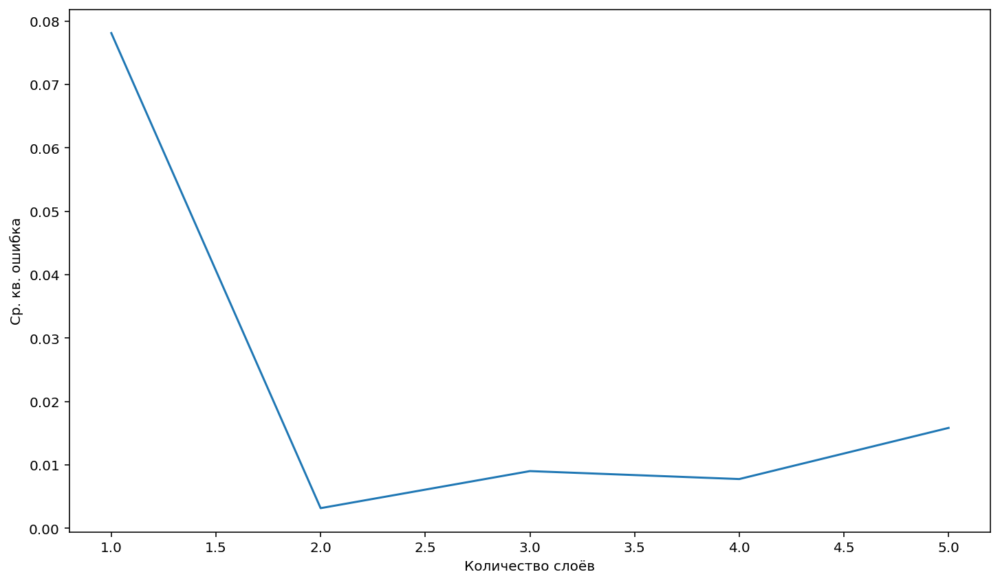

In [14]:
draw_exp(2)

In [15]:
experiment(20)

Epoch 1/100


 1/20 [>.............................] - ETA: 22s - loss: 0.9449

 6/20 [========>.....................] - ETA: 0s - loss: 0.7967 

20/20 [==============================] - 1s 6ms/step - loss: 0.6985


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3703

20/20 [==============================] - 0s 1ms/step - loss: 0.4335


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4408

14/20 [====================>.........] - ETA: 0s - loss: 0.4219

20/20 [==============================] - 0s 5ms/step - loss: 0.4127


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3492

 5/20 [======>.......................] - ETA: 0s - loss: 0.3627

20/20 [==============================] - 0s 4ms/step - loss: 0.3762


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2879

 3/20 [===>..........................] - ETA: 0s - loss: 0.3321

12/20 [=================>............] - ETA: 0s - loss: 0.3512

20/20 [==============================] - 0s 11ms/step - loss: 0.3506


Epoch 6/100


 1/20 [>.............................] - ETA: 2s - loss: 0.2930

 9/20 [============>.................] - ETA: 0s - loss: 0.3297

10/20 [==============>...............] - ETA: 0s - loss: 0.3306

15/20 [=====================>........] - ETA: 0s - loss: 0.3303

20/20 [==============================] - 0s 16ms/step - loss: 0.3302


Epoch 7/100
 1/20 [>.............................] - ETA: 1s - loss: 0.3906

20/20 [==============================] - 0s 2ms/step - loss: 0.3295


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2679

17/20 [========================>.....] - ETA: 0s - loss: 0.2928

20/20 [==============================] - 0s 5ms/step - loss: 0.2933


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2185

 9/20 [============>.................] - ETA: 0s - loss: 0.2827

20/20 [==============================] - 0s 5ms/step - loss: 0.2839


Epoch 10/100


 1/20 [>.............................] - ETA: 1s - loss: 0.3108



20/20 [==============================] - 0s 1ms/step - loss: 0.2643


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3107

20/20 [==============================] - 0s 1ms/step - loss: 0.2701


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3400

 8/20 [===========>..................] - ETA: 0s - loss: 0.2622

20/20 [==============================] - 0s 5ms/step - loss: 0.2552


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1293

12/20 [=================>............] - ETA: 0s - loss: 0.2215

20/20 [==============================] - 0s 5ms/step - loss: 0.2323


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1900

17/20 [========================>.....] - ETA: 0s - loss: 0.2264

20/20 [==============================] - 0s 3ms/step - loss: 0.2290


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1810

 9/20 [============>.................] - ETA: 0s - loss: 0.2026

13/20 [==================>...........] - ETA: 0s - loss: 0.2110

14/20 [====================>.........] - ETA: 0s - loss: 0.2130

20/20 [==============================] - 0s 25ms/step - loss: 0.2200


Epoch 16/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1681

 2/20 [==>...........................] - ETA: 1s - loss: 0.1961

17/20 [========================>.....] - ETA: 0s - loss: 0.2165

20/20 [==============================] - 0s 11ms/step - loss: 0.2186


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2886

 5/20 [======>.......................] - ETA: 0s - loss: 0.2342

20/20 [==============================] - 0s 5ms/step - loss: 0.2181


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0980

 2/20 [==>...........................] - ETA: 1s - loss: 0.1304

20/20 [==============================] - 0s 5ms/step - loss: 0.1956


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2427

20/20 [==============================] - 0s 1ms/step - loss: 0.2091


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1982

 7/20 [=========>....................] - ETA: 0s - loss: 0.1884

20/20 [==============================] - 0s 4ms/step - loss: 0.1882


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2420

 6/20 [========>.....................] - ETA: 0s - loss: 0.2015

20/20 [==============================] - 0s 4ms/step - loss: 0.1898


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1553

 2/20 [==>...........................] - ETA: 1s - loss: 0.1467

20/20 [==============================] - 0s 4ms/step - loss: 0.1645


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1895

 4/20 [=====>........................] - ETA: 0s - loss: 0.1876

20/20 [==============================] - 0s 4ms/step - loss: 0.1824


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1093

 7/20 [=========>....................] - ETA: 0s - loss: 0.1555

20/20 [==============================] - 0s 5ms/step - loss: 0.1643


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1358

 7/20 [=========>....................] - ETA: 0s - loss: 0.1338

20/20 [==============================] - 0s 4ms/step - loss: 0.1505


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1252



 5/20 [======>.......................] - ETA: 0s - loss: 0.1524

20/20 [==============================] - 0s 4ms/step - loss: 0.1515


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1094

 8/20 [===========>..................] - ETA: 0s - loss: 0.1271

20/20 [==============================] - 0s 4ms/step - loss: 0.1395


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0969

 5/20 [======>.......................] - ETA: 0s - loss: 0.1153

20/20 [==============================] - 0s 4ms/step - loss: 0.1325


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1703

13/20 [==================>...........] - ETA: 0s - loss: 0.1639

20/20 [==============================] - 0s 4ms/step - loss: 0.1546


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0847

18/20 [==========================>...] - ETA: 0s - loss: 0.1231

20/20 [==============================] - ETA: 0s - loss: 0.1237

20/20 [==============================] - 0s 14ms/step - loss: 0.1240


Epoch 31/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1436

11/20 [===============>..............] - ETA: 0s - loss: 0.1514

14/20 [====================>.........] - ETA: 0s - loss: 0.1470

20/20 [==============================] - 0s 11ms/step - loss: 0.1406


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1497

15/20 [=====================>........] - ETA: 0s - loss: 0.1370

20/20 [==============================] - 0s 5ms/step - loss: 0.1323


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0313

14/20 [====================>.........] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 4ms/step - loss: 0.0963


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1508

11/20 [===============>..............] - ETA: 0s - loss: 0.1151

20/20 [==============================] - 0s 5ms/step - loss: 0.1139


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1927

 5/20 [======>.......................] - ETA: 0s - loss: 0.1552

 9/20 [============>.................] - ETA: 0s - loss: 0.1391

15/20 [=====================>........] - ETA: 0s - loss: 0.1283

17/20 [========================>.....] - ETA: 0s - loss: 0.1260

20/20 [==============================] - 0s 26ms/step - loss: 0.1227


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1003

 4/20 [=====>........................] - ETA: 0s - loss: 0.1053

14/20 [====================>.........] - ETA: 0s - loss: 0.0984

17/20 [========================>.....] - ETA: 0s - loss: 0.0992

20/20 [==============================] - 0s 16ms/step - loss: 0.1002


Epoch 37/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0577

20/20 [==============================] - 0s 1ms/step - loss: 0.1020


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1596

19/20 [===========================>..] - ETA: 0s - loss: 0.1103

20/20 [==============================] - 0s 5ms/step - loss: 0.1089


Epoch 39/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1148

 3/20 [===>..........................] - ETA: 0s - loss: 0.1089

20/20 [==============================] - 0s 5ms/step - loss: 0.0992


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0543

16/20 [=======================>......] - ETA: 0s - loss: 0.0969

20/20 [==============================] - 0s 5ms/step - loss: 0.0959


Epoch 41/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0466

 4/20 [=====>........................] - ETA: 0s - loss: 0.0646

 8/20 [===========>..................] - ETA: 0s - loss: 0.0727

13/20 [==================>...........] - ETA: 0s - loss: 0.0752

20/20 [==============================] - 0s 17ms/step - loss: 0.0786


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0888

 2/20 [==>...........................] - ETA: 1s - loss: 0.0907

 7/20 [=========>....................] - ETA: 0s - loss: 0.0961

10/20 [==============>...............] - ETA: 0s - loss: 0.0955

19/20 [===========================>..] - ETA: 0s - loss: 0.0906

20/20 [==============================] - 0s 20ms/step - loss: 0.0899


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0969

 6/20 [========>.....................] - ETA: 0s - loss: 0.0877

20/20 [==============================] - ETA: 0s - loss: 0.0806

20/20 [==============================] - 0s 10ms/step - loss: 0.0805


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0946

14/20 [====================>.........] - ETA: 0s - loss: 0.0767

20/20 [==============================] - 0s 5ms/step - loss: 0.0774


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0697



11/20 [===============>..............] - ETA: 0s - loss: 0.0672

20/20 [==============================] - 0s 4ms/step - loss: 0.0716


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0465

 4/20 [=====>........................] - ETA: 0s - loss: 0.0625

20/20 [==============================] - 0s 5ms/step - loss: 0.0729


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0866

 3/20 [===>..........................] - ETA: 0s - loss: 0.0933

20/20 [==============================] - 0s 4ms/step - loss: 0.0782


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0533

 4/20 [=====>........................] - ETA: 0s - loss: 0.0536

20/20 [==============================] - 0s 4ms/step - loss: 0.0586


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1081

 9/20 [============>.................] - ETA: 0s - loss: 0.0789

20/20 [==============================] - 0s 4ms/step - loss: 0.0708


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0594

17/20 [========================>.....] - ETA: 0s - loss: 0.0616

20/20 [==============================] - 0s 4ms/step - loss: 0.0615


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0790

18/20 [==========================>...] - ETA: 0s - loss: 0.0593

20/20 [==============================] - 0s 4ms/step - loss: 0.0591


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0662

20/20 [==============================] - 0s 1ms/step - loss: 0.0571


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0621

20/20 [==============================] - 0s 1ms/step - loss: 0.0556


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0747

20/20 [==============================] - 0s 1ms/step - loss: 0.0557


Epoch 55/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0584

12/20 [=================>............] - ETA: 0s - loss: 0.0535

14/20 [====================>.........] - ETA: 0s - loss: 0.0533

17/20 [========================>.....] - ETA: 0s - loss: 0.0530

18/20 [==========================>...] - ETA: 0s - loss: 0.0529

20/20 [==============================] - 1s 27ms/step - loss: 0.0528


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0397

 9/20 [============>.................] - ETA: 0s - loss: 0.0565

17/20 [========================>.....] - ETA: 0s - loss: 0.0549

20/20 [==============================] - 0s 10ms/step - loss: 0.0539


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0466

18/20 [==========================>...] - ETA: 0s - loss: 0.0473

20/20 [==============================] - 0s 5ms/step - loss: 0.0474


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0810

 8/20 [===========>..................] - ETA: 0s - loss: 0.0505

20/20 [==============================] - 0s 4ms/step - loss: 0.0488


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0234

 5/20 [======>.......................] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 4ms/step - loss: 0.0464


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0469

 4/20 [=====>........................] - ETA: 0s - loss: 0.0434

20/20 [==============================] - 0s 4ms/step - loss: 0.0469


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0549

 4/20 [=====>........................] - ETA: 0s - loss: 0.0519

20/20 [==============================] - 0s 5ms/step - loss: 0.0478


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0534

20/20 [==============================] - 0s 1ms/step - loss: 0.0432


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

 2/20 [==>...........................] - ETA: 0s - loss: 0.0328

20/20 [==============================] - 0s 4ms/step - loss: 0.0431


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0388

20/20 [==============================] - 0s 1ms/step - loss: 0.0345


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0215

20/20 [==============================] - 0s 1ms/step - loss: 0.0366


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0331

 3/20 [===>..........................] - ETA: 0s - loss: 0.0363

20/20 [==============================] - 0s 4ms/step - loss: 0.0383


Epoch 67/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0456

20/20 [==============================] - 0s 1ms/step - loss: 0.0328


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0620

 2/20 [==>...........................] - ETA: 1s - loss: 0.0524

 7/20 [=========>....................] - ETA: 0s - loss: 0.0379

10/20 [==============>...............] - ETA: 0s - loss: 0.0365

11/20 [===============>..............] - ETA: 0s - loss: 0.0363

15/20 [=====================>........] - ETA: 0s - loss: 0.0361

20/20 [==============================] - 1s 27ms/step - loss: 0.0356


Epoch 69/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0126

 2/20 [==>...........................] - ETA: 1s - loss: 0.0182

 3/20 [===>..........................] - ETA: 1s - loss: 0.0202

20/20 [==============================] - 0s 11ms/step - loss: 0.0297


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 1ms/step - loss: 0.0369


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0194

20/20 [==============================] - 0s 1ms/step - loss: 0.0304


Epoch 72/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0445

20/20 [==============================] - 0s 1ms/step - loss: 0.0313


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 2ms/step - loss: 0.0251


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0141

20/20 [==============================] - 0s 1ms/step - loss: 0.0281


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

 5/20 [======>.......................] - ETA: 0s - loss: 0.0264

20/20 [==============================] - 0s 4ms/step - loss: 0.0263


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0072

 2/20 [==>...........................] - ETA: 0s - loss: 0.0141

20/20 [==============================] - 0s 4ms/step - loss: 0.0264


Epoch 77/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0068

 2/20 [==>...........................] - ETA: 1s - loss: 0.0123

20/20 [==============================] - 0s 4ms/step - loss: 0.0240


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0103

 2/20 [==>...........................] - ETA: 1s - loss: 0.0106

20/20 [==============================] - 0s 4ms/step - loss: 0.0218


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0152

 2/20 [==>...........................] - ETA: 1s - loss: 0.0204

13/20 [==================>...........] - ETA: 0s - loss: 0.0242

14/20 [====================>.........] - ETA: 0s - loss: 0.0244

18/20 [==========================>...] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 25ms/step - loss: 0.0248


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0098

 5/20 [======>.......................] - ETA: 0s - loss: 0.0242

16/20 [=======================>......] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 10ms/step - loss: 0.0246


Epoch 81/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0305

 6/20 [========>.....................] - ETA: 0s - loss: 0.0245

20/20 [==============================] - 0s 7ms/step - loss: 0.0239


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0201

13/20 [==================>...........] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 5ms/step - loss: 0.0215


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0453

 9/20 [============>.................] - ETA: 0s - loss: 0.0303

20/20 [==============================] - 0s 4ms/step - loss: 0.0270


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

 2/20 [==>...........................] - ETA: 1s - loss: 0.0117

20/20 [==============================] - 0s 4ms/step - loss: 0.0175


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

 2/20 [==>...........................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 4ms/step - loss: 0.0221


Epoch 86/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0179

20/20 [==============================] - 0s 1ms/step - loss: 0.0210


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

 2/20 [==>...........................] - ETA: 1s - loss: 0.0378

20/20 [==============================] - 0s 4ms/step - loss: 0.0220


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0164

 3/20 [===>..........................] - ETA: 0s - loss: 0.0191

20/20 [==============================] - 0s 4ms/step - loss: 0.0191


Epoch 89/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0060

20/20 [==============================] - 0s 1ms/step - loss: 0.0197


Epoch 90/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0073

 2/20 [==>...........................] - ETA: 1s - loss: 0.0086

20/20 [==============================] - 0s 7ms/step - loss: 0.0162


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0147

 5/20 [======>.......................] - ETA: 0s - loss: 0.0143

12/20 [=================>............] - ETA: 0s - loss: 0.0161

17/20 [========================>.....] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 15ms/step - loss: 0.0168


Epoch 92/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0226

20/20 [==============================] - 0s 1ms/step - loss: 0.0167


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0258

20/20 [==============================] - 0s 1ms/step - loss: 0.0192


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0150

16/20 [=======================>......] - ETA: 0s - loss: 0.0159

20/20 [==============================] - 0s 5ms/step - loss: 0.0161


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0197

 8/20 [===========>..................] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 5ms/step - loss: 0.0159


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

 2/20 [==>...........................] - ETA: 1s - loss: 0.0161

20/20 [==============================] - 0s 4ms/step - loss: 0.0159


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0089

 2/20 [==>...........................] - ETA: 1s - loss: 0.0137

20/20 [==============================] - 0s 4ms/step - loss: 0.0169


Epoch 98/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0104

19/20 [===========================>..] - ETA: 0s - loss: 0.0141

20/20 [==============================] - 0s 5ms/step - loss: 0.0141


Epoch 99/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0440

 6/20 [========>.....................] - ETA: 0s - loss: 0.0256

16/20 [=======================>......] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 10ms/step - loss: 0.0185


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0276

 2/20 [==>...........................] - ETA: 1s - loss: 0.0226

10/20 [==============>...............] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 11ms/step - loss: 0.0160


Epoch 1/100


 1/20 [>.............................] - ETA: 7s - loss: 0.5855

20/20 [==============================] - 0s 2ms/step - loss: 0.5011


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4223

20/20 [==============================] - 0s 1ms/step - loss: 0.3890


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3141

19/20 [===========================>..] - ETA: 0s - loss: 0.3707

20/20 [==============================] - 0s 5ms/step - loss: 0.3688


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2470

15/20 [=====================>........] - ETA: 0s - loss: 0.3009

20/20 [==============================] - 0s 5ms/step - loss: 0.2984


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3147

11/20 [===============>..............] - ETA: 0s - loss: 0.2654

20/20 [==============================] - 0s 3ms/step - loss: 0.2577


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3020

 6/20 [========>.....................] - ETA: 0s - loss: 0.2680

20/20 [==============================] - 0s 4ms/step - loss: 0.2425


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2689

 2/20 [==>...........................] - ETA: 5s - loss: 0.2509

 4/20 [=====>........................] - ETA: 1s - loss: 0.2391

10/20 [==============>...............] - ETA: 0s - loss: 0.2198

11/20 [===============>..............] - ETA: 0s - loss: 0.2194

13/20 [==================>...........] - ETA: 0s - loss: 0.2182

20/20 [==============================] - 1s 36ms/step - loss: 0.2178


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2152

 4/20 [=====>........................] - ETA: 0s - loss: 0.2341

20/20 [==============================] - 0s 5ms/step - loss: 0.2073


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1633

 2/20 [==>...........................] - ETA: 1s - loss: 0.1544

20/20 [==============================] - 0s 5ms/step - loss: 0.1837


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1326

20/20 [==============================] - 0s 1ms/step - loss: 0.1607


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2394

17/20 [========================>.....] - ETA: 0s - loss: 0.1618

18/20 [==========================>...] - ETA: 0s - loss: 0.1622

19/20 [===========================>..] - ETA: 0s - loss: 0.1627

20/20 [==============================] - 0s 21ms/step - loss: 0.1632


Epoch 12/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1082

10/20 [==============>...............] - ETA: 0s - loss: 0.1103

13/20 [==================>...........] - ETA: 0s - loss: 0.1172

20/20 [==============================] - 0s 11ms/step - loss: 0.1297


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1551

 9/20 [============>.................] - ETA: 0s - loss: 0.1172

20/20 [==============================] - 0s 5ms/step - loss: 0.1302


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1976

 5/20 [======>.......................] - ETA: 0s - loss: 0.1814

20/20 [==============================] - 0s 5ms/step - loss: 0.1577


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2343



12/20 [=================>............] - ETA: 0s - loss: 0.1536

17/20 [========================>.....] - ETA: 0s - loss: 0.1486

20/20 [==============================] - 0s 10ms/step - loss: 0.1457


Epoch 16/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2664

12/20 [=================>............] - ETA: 0s - loss: 0.1502

20/20 [==============================] - 0s 6ms/step - loss: 0.1400


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1241

 2/20 [==>...........................] - ETA: 1s - loss: 0.1350

 8/20 [===========>..................] - ETA: 0s - loss: 0.1285

19/20 [===========================>..] - ETA: 0s - loss: 0.1192

20/20 [==============================] - 0s 15ms/step - loss: 0.1193


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0717

 2/20 [==>...........................] - ETA: 1s - loss: 0.0892

20/20 [==============================] - 0s 6ms/step - loss: 0.1068


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0800

 7/20 [=========>....................] - ETA: 0s - loss: 0.1088

20/20 [==============================] - 0s 5ms/step - loss: 0.1111


Epoch 20/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0709

20/20 [==============================] - 0s 2ms/step - loss: 0.0933


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1456

 9/20 [============>.................] - ETA: 0s - loss: 0.1176

20/20 [==============================] - 0s 5ms/step - loss: 0.1104


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0409

 2/20 [==>...........................] - ETA: 1s - loss: 0.0503

20/20 [==============================] - 0s 5ms/step - loss: 0.0855


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1249

19/20 [===========================>..] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 5ms/step - loss: 0.0961


Epoch 24/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1206

17/20 [========================>.....] - ETA: 0s - loss: 0.0903

20/20 [==============================] - 0s 5ms/step - loss: 0.0899


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0635

 7/20 [=========>....................] - ETA: 0s - loss: 0.0703

17/20 [========================>.....] - ETA: 0s - loss: 0.0778

20/20 [==============================] - 0s 10ms/step - loss: 0.0790


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1020

 8/20 [===========>..................] - ETA: 0s - loss: 0.0936

20/20 [==============================] - 0s 5ms/step - loss: 0.0847


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0402

20/20 [==============================] - 0s 1ms/step - loss: 0.0648


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0806

20/20 [==============================] - 0s 1ms/step - loss: 0.0830


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1029

20/20 [==============================] - 0s 1ms/step - loss: 0.0721


Epoch 30/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0741

20/20 [==============================] - 0s 5ms/step - loss: 0.0658


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1032

15/20 [=====================>........] - ETA: 0s - loss: 0.0641

20/20 [==============================] - 0s 5ms/step - loss: 0.0650


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

 8/20 [===========>..................] - ETA: 0s - loss: 0.0678

20/20 [==============================] - 0s 5ms/step - loss: 0.0667


Epoch 33/100

 1/20 [>.............................] - ETA: 5s - loss: 0.0133

 5/20 [======>.......................] - ETA: 0s - loss: 0.0468

 9/20 [============>.................] - ETA: 0s - loss: 0.0576

17/20 [========================>.....] - ETA: 0s - loss: 0.0601

18/20 [==========================>...] - ETA: 0s - loss: 0.0600

20/20 [==============================] - ETA: 0s - loss: 0.0601

20/20 [==============================] - 1s 32ms/step - loss: 0.0601


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0467

11/20 [===============>..............] - ETA: 0s - loss: 0.0532

20/20 [==============================] - 0s 5ms/step - loss: 0.0562


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0398

 3/20 [===>..........................] - ETA: 0s - loss: 0.0393

20/20 [==============================] - 0s 5ms/step - loss: 0.0482


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 1ms/step - loss: 0.0587


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0359

20/20 [==============================] - 0s 1ms/step - loss: 0.0486


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0354

20/20 [==============================] - 0s 1ms/step - loss: 0.0477


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0842

18/20 [==========================>...] - ETA: 0s - loss: 0.0541

20/20 [==============================] - 0s 5ms/step - loss: 0.0535


Epoch 40/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0777

12/20 [=================>............] - ETA: 0s - loss: 0.0505

13/20 [==================>...........] - ETA: 0s - loss: 0.0502

20/20 [==============================] - 0s 17ms/step - loss: 0.0496


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0331

 3/20 [===>..........................] - ETA: 1s - loss: 0.0431

 6/20 [========>.....................] - ETA: 0s - loss: 0.0448

10/20 [==============>...............] - ETA: 0s - loss: 0.0470

20/20 [==============================] - 0s 21ms/step - loss: 0.0468


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0582

16/20 [=======================>......] - ETA: 0s - loss: 0.0464

20/20 [==============================] - 0s 5ms/step - loss: 0.0459


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0337

 8/20 [===========>..................] - ETA: 0s - loss: 0.0369

20/20 [==============================] - 0s 5ms/step - loss: 0.0410


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0611

20/20 [==============================] - 0s 1ms/step - loss: 0.0442


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 1ms/step - loss: 0.0384


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0779

17/20 [========================>.....] - ETA: 0s - loss: 0.0449

20/20 [==============================] - 0s 5ms/step - loss: 0.0439


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0253

11/20 [===============>..............] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 5ms/step - loss: 0.0362


Epoch 48/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0442

18/20 [==========================>...] - ETA: 0s - loss: 0.0374

20/20 [==============================] - 0s 5ms/step - loss: 0.0373


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0575

 5/20 [======>.......................] - ETA: 0s - loss: 0.0364

13/20 [==================>...........] - ETA: 0s - loss: 0.0360

14/20 [====================>.........] - ETA: 0s - loss: 0.0359

20/20 [==============================] - 0s 16ms/step - loss: 0.0360


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0104

 2/20 [==>...........................] - ETA: 1s - loss: 0.0101

18/20 [==========================>...] - ETA: 0s - loss: 0.0275

20/20 [==============================] - 0s 9ms/step - loss: 0.0286


Epoch 51/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0549



 6/20 [========>.....................] - ETA: 0s - loss: 0.0385

20/20 [==============================] - 0s 5ms/step - loss: 0.0347


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0258

14/20 [====================>.........] - ETA: 0s - loss: 0.0290

20/20 [==============================] - 0s 5ms/step - loss: 0.0298


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0271

10/20 [==============>...............] - ETA: 0s - loss: 0.0282

20/20 [==============================] - 0s 6ms/step - loss: 0.0309


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0630

 8/20 [===========>..................] - ETA: 0s - loss: 0.0450

 9/20 [============>.................] - ETA: 0s - loss: 0.0437

11/20 [===============>..............] - ETA: 0s - loss: 0.0419

14/20 [====================>.........] - ETA: 0s - loss: 0.0400

19/20 [===========================>..] - ETA: 0s - loss: 0.0375

20/20 [==============================] - 1s 31ms/step - loss: 0.0368


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

11/20 [===============>..............] - ETA: 0s - loss: 0.0283

15/20 [=====================>........] - ETA: 0s - loss: 0.0293

16/20 [=======================>......] - ETA: 0s - loss: 0.0295

20/20 [==============================] - 0s 16ms/step - loss: 0.0298


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0321

 5/20 [======>.......................] - ETA: 0s - loss: 0.0307

20/20 [==============================] - 0s 5ms/step - loss: 0.0301


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0785

19/20 [===========================>..] - ETA: 0s - loss: 0.0357

20/20 [==============================] - 0s 5ms/step - loss: 0.0350


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0370

10/20 [==============>...............] - ETA: 0s - loss: 0.0308

20/20 [==============================] - 0s 5ms/step - loss: 0.0292


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0134

20/20 [==============================] - ETA: 0s - loss: 0.0236

20/20 [==============================] - 0s 5ms/step - loss: 0.0237


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0512

19/20 [===========================>..] - ETA: 0s - loss: 0.0306

20/20 [==============================] - 0s 4ms/step - loss: 0.0301


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

 2/20 [==>...........................] - ETA: 1s - loss: 0.0233

10/20 [==============>...............] - ETA: 0s - loss: 0.0243

20/20 [==============================] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 15ms/step - loss: 0.0251


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0246

 5/20 [======>.......................] - ETA: 0s - loss: 0.0252

17/20 [========================>.....] - ETA: 0s - loss: 0.0258

20/20 [==============================] - 0s 10ms/step - loss: 0.0256


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0304

12/20 [=================>............] - ETA: 0s - loss: 0.0210

19/20 [===========================>..] - ETA: 0s - loss: 0.0215

20/20 [==============================] - 0s 11ms/step - loss: 0.0217


Epoch 64/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0051

 6/20 [========>.....................] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 6ms/step - loss: 0.0236


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0374

20/20 [==============================] - 0s 2ms/step - loss: 0.0258


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

 8/20 [===========>..................] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 5ms/step - loss: 0.0201


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

 5/20 [======>.......................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 4ms/step - loss: 0.0171


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0200

 2/20 [==>...........................] - ETA: 1s - loss: 0.0206

20/20 [==============================] - 0s 5ms/step - loss: 0.0230


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0501

14/20 [====================>.........] - ETA: 0s - loss: 0.0267

20/20 [==============================] - 0s 5ms/step - loss: 0.0246


Epoch 70/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0056

 3/20 [===>..........................] - ETA: 0s - loss: 0.0076

 9/20 [============>.................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 10ms/step - loss: 0.0179


Epoch 71/100


 1/20 [>.............................] - ETA: 4s - loss: 0.0107

 4/20 [=====>........................] - ETA: 0s - loss: 0.0109

 5/20 [======>.......................] - ETA: 0s - loss: 0.0115

 6/20 [========>.....................] - ETA: 0s - loss: 0.0124

 7/20 [=========>....................] - ETA: 1s - loss: 0.0129

20/20 [==============================] - 1s 27ms/step - loss: 0.0162


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0266

16/20 [=======================>......] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 5ms/step - loss: 0.0217


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

 3/20 [===>..........................] - ETA: 0s - loss: 0.0208

20/20 [==============================] - 0s 5ms/step - loss: 0.0189


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0456

17/20 [========================>.....] - ETA: 0s - loss: 0.0208

20/20 [==============================] - 0s 5ms/step - loss: 0.0202


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0140

 6/20 [========>.....................] - ETA: 0s - loss: 0.0115

20/20 [==============================] - 0s 5ms/step - loss: 0.0147


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0050

17/20 [========================>.....] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 5ms/step - loss: 0.0142


Epoch 77/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0364

 6/20 [========>.....................] - ETA: 0s - loss: 0.0193

 7/20 [=========>....................] - ETA: 0s - loss: 0.0186

 8/20 [===========>..................] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 17ms/step - loss: 0.0161


Epoch 78/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0278

20/20 [==============================] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 4ms/step - loss: 0.0132


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0119

 7/20 [=========>....................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 4ms/step - loss: 0.0118


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0149

20/20 [==============================] - 0s 2ms/step - loss: 0.0150


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0353

 7/20 [=========>....................] - ETA: 0s - loss: 0.0194

20/20 [==============================] - 0s 5ms/step - loss: 0.0142


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

19/20 [===========================>..] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 5ms/step - loss: 0.0073


Epoch 83/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0075

19/20 [===========================>..] - ETA: 0s - loss: 0.0104

20/20 [==============================] - 0s 6ms/step - loss: 0.0103


Epoch 84/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0068

12/20 [=================>............] - ETA: 0s - loss: 0.0108

14/20 [====================>.........] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 18ms/step - loss: 0.0104


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

 9/20 [============>.................] - ETA: 0s - loss: 0.0060

16/20 [=======================>......] - ETA: 0s - loss: 0.0075

20/20 [==============================] - 0s 11ms/step - loss: 0.0080


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0121

 7/20 [=========>....................] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 6ms/step - loss: 0.0109


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

16/20 [=======================>......] - ETA: 0s - loss: 0.0064

20/20 [==============================] - 0s 5ms/step - loss: 0.0068


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

 7/20 [=========>....................] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 4ms/step - loss: 0.0085


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0030

15/20 [=====================>........] - ETA: 0s - loss: 0.0072

16/20 [=======================>......] - ETA: 0s - loss: 0.0074

17/20 [========================>.....] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 26ms/step - loss: 0.0076


Epoch 90/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0099

14/20 [====================>.........] - ETA: 0s - loss: 0.0107

20/20 [==============================] - 0s 6ms/step - loss: 0.0099


Epoch 91/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0072

 2/20 [==>...........................] - ETA: 1s - loss: 0.0069

10/20 [==============>...............] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 12ms/step - loss: 0.0073


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0206

16/20 [=======================>......] - ETA: 0s - loss: 0.0092

20/20 [==============================] - 0s 6ms/step - loss: 0.0088


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

 5/20 [======>.......................] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 5ms/step - loss: 0.0084


Epoch 94/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0027

 3/20 [===>..........................] - ETA: 0s - loss: 0.0091

 8/20 [===========>..................] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 11ms/step - loss: 0.0075


Epoch 95/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0026

 8/20 [===========>..................] - ETA: 0s - loss: 0.0033

16/20 [=======================>......] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 12ms/step - loss: 0.0047


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 1ms/step - loss: 0.0064


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

17/20 [========================>.....] - ETA: 0s - loss: 0.0068

18/20 [==========================>...] - ETA: 0s - loss: 0.0068

20/20 [==============================] - 0s 10ms/step - loss: 0.0068


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0149

 5/20 [======>.......................] - ETA: 0s - loss: 0.0149

 6/20 [========>.....................] - ETA: 0s - loss: 0.0141

 8/20 [===========>..................] - ETA: 0s - loss: 0.0128

15/20 [=====================>........] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 22ms/step - loss: 0.0097


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

 2/20 [==>...........................] - ETA: 1s - loss: 0.0130

16/20 [=======================>......] - ETA: 0s - loss: 0.0082

17/20 [========================>.....] - ETA: 0s - loss: 0.0081

20/20 [==============================] - 0s 15ms/step - loss: 0.0078


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

 4/20 [=====>........................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 5ms/step - loss: 0.0048


Epoch 1/100


 1/20 [>.............................] - ETA: 26s - loss: 0.8418

 5/20 [======>.......................] - ETA: 0s - loss: 0.7347 

14/20 [====================>.........] - ETA: 0s - loss: 0.6572

20/20 [==============================] - 2s 10ms/step - loss: 0.6271


Epoch 2/100


 1/20 [>.............................] - ETA: 3s - loss: 0.3923

 6/20 [========>.....................] - ETA: 0s - loss: 0.4169

 7/20 [=========>....................] - ETA: 0s - loss: 0.4177

20/20 [==============================] - 0s 12ms/step - loss: 0.4104


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3755

20/20 [==============================] - 0s 1ms/step - loss: 0.3546


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2774

17/20 [========================>.....] - ETA: 0s - loss: 0.3132

20/20 [==============================] - 0s 5ms/step - loss: 0.3126


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1916

 4/20 [=====>........................] - ETA: 0s - loss: 0.2379

20/20 [==============================] - 0s 6ms/step - loss: 0.2727


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2202

20/20 [==============================] - 0s 1ms/step - loss: 0.2625


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2845

 8/20 [===========>..................] - ETA: 0s - loss: 0.2881

 9/20 [============>.................] - ETA: 0s - loss: 0.2873

20/20 [==============================] - 0s 21ms/step - loss: 0.2695


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2144

 7/20 [=========>....................] - ETA: 0s - loss: 0.2328

20/20 [==============================] - ETA: 0s - loss: 0.2326

20/20 [==============================] - 0s 10ms/step - loss: 0.2327


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2805

 2/20 [==>...........................] - ETA: 1s - loss: 0.2847

12/20 [=================>............] - ETA: 0s - loss: 0.2416

13/20 [==================>...........] - ETA: 0s - loss: 0.2401

20/20 [==============================] - 0s 15ms/step - loss: 0.2331


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3039

20/20 [==============================] - ETA: 0s - loss: 0.2294

20/20 [==============================] - 0s 5ms/step - loss: 0.2284


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2792

11/20 [===============>..............] - ETA: 0s - loss: 0.2456

20/20 [==============================] - 0s 5ms/step - loss: 0.2258


Epoch 12/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1179

20/20 [==============================] - 0s 1ms/step - loss: 0.1831


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2473

10/20 [==============>...............] - ETA: 0s - loss: 0.1918

20/20 [==============================] - 0s 3ms/step - loss: 0.1832


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1912

20/20 [==============================] - 0s 1ms/step - loss: 0.1844


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1300

20/20 [==============================] - 0s 1ms/step - loss: 0.1602


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0618

20/20 [==============================] - 0s 1ms/step - loss: 0.1450


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1410

11/20 [===============>..............] - ETA: 0s - loss: 0.1644

20/20 [==============================] - 0s 3ms/step - loss: 0.1573


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0722

20/20 [==============================] - 0s 1ms/step - loss: 0.1226


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2304

20/20 [==============================] - 0s 1ms/step - loss: 0.1600


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0557

19/20 [===========================>..] - ETA: 0s - loss: 0.1086

20/20 [==============================] - 0s 3ms/step - loss: 0.1105


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2436

20/20 [==============================] - 0s 1ms/step - loss: 0.1475


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1002

20/20 [==============================] - 0s 1ms/step - loss: 0.1268


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1872

14/20 [====================>.........] - ETA: 0s - loss: 0.1341

20/20 [==============================] - 0s 3ms/step - loss: 0.1295


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0509

20/20 [==============================] - 0s 1ms/step - loss: 0.1101


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0715

16/20 [=======================>......] - ETA: 0s - loss: 0.0935

20/20 [==============================] - 0s 3ms/step - loss: 0.0973


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1003

18/20 [==========================>...] - ETA: 0s - loss: 0.1183

20/20 [==============================] - 0s 3ms/step - loss: 0.1171


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 1ms/step - loss: 0.1032


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1570

13/20 [==================>...........] - ETA: 0s - loss: 0.1058

20/20 [==============================] - 0s 3ms/step - loss: 0.1024


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0554

18/20 [==========================>...] - ETA: 0s - loss: 0.0879

20/20 [==============================] - 0s 3ms/step - loss: 0.0896


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2024

20/20 [==============================] - 0s 1ms/step - loss: 0.1160


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0513

20/20 [==============================] - 0s 1ms/step - loss: 0.0885


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1151

13/20 [==================>...........] - ETA: 0s - loss: 0.1165

20/20 [==============================] - 0s 3ms/step - loss: 0.1087


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1302

20/20 [==============================] - 0s 1ms/step - loss: 0.0951


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1132

20/20 [==============================] - 0s 1ms/step - loss: 0.1001


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0751

19/20 [===========================>..] - ETA: 0s - loss: 0.0851

20/20 [==============================] - 0s 3ms/step - loss: 0.0849


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0507

20/20 [==============================] - 0s 1ms/step - loss: 0.0862


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0605

20/20 [==============================] - 0s 1ms/step - loss: 0.0786


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0687

13/20 [==================>...........] - ETA: 0s - loss: 0.0754

20/20 [==============================] - 0s 4ms/step - loss: 0.0747


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0360

20/20 [==============================] - 0s 1ms/step - loss: 0.0728


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0982

20/20 [==============================] - 0s 1ms/step - loss: 0.0743


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0890

14/20 [====================>.........] - ETA: 0s - loss: 0.0712

20/20 [==============================] - 0s 3ms/step - loss: 0.0710


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0208

20/20 [==============================] - 0s 1ms/step - loss: 0.0600


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1137

20/20 [==============================] - 0s 1ms/step - loss: 0.0713


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0244

12/20 [=================>............] - ETA: 0s - loss: 0.0651

20/20 [==============================] - 0s 4ms/step - loss: 0.0643


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0564

20/20 [==============================] - 0s 1ms/step - loss: 0.0647


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0935

20/20 [==============================] - 0s 1ms/step - loss: 0.0572


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0545

16/20 [=======================>......] - ETA: 0s - loss: 0.0550

20/20 [==============================] - 0s 3ms/step - loss: 0.0554


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0682

20/20 [==============================] - 0s 1ms/step - loss: 0.0558


Epoch 49/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0553

20/20 [==============================] - 0s 1ms/step - loss: 0.0522


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0533

14/20 [====================>.........] - ETA: 0s - loss: 0.0496

20/20 [==============================] - 0s 3ms/step - loss: 0.0498


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0291

20/20 [==============================] - 0s 1ms/step - loss: 0.0455


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 2ms/step - loss: 0.0457


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 2ms/step - loss: 0.0436


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0778

15/20 [=====================>........] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 4ms/step - loss: 0.0477


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0406

20/20 [==============================] - 0s 2ms/step - loss: 0.0387


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0262

20/20 [==============================] - 0s 1ms/step - loss: 0.0365


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0475

20/20 [==============================] - 0s 1ms/step - loss: 0.0353


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0241

16/20 [=======================>......] - ETA: 0s - loss: 0.0345

20/20 [==============================] - 0s 3ms/step - loss: 0.0356


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0565

20/20 [==============================] - 0s 1ms/step - loss: 0.0349


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 1ms/step - loss: 0.0283


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0611

15/20 [=====================>........] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 3ms/step - loss: 0.0322


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 1ms/step - loss: 0.0303


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 1ms/step - loss: 0.0301


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0101

16/20 [=======================>......] - ETA: 0s - loss: 0.0234

20/20 [==============================] - 0s 3ms/step - loss: 0.0249


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0322

20/20 [==============================] - 0s 1ms/step - loss: 0.0307


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0528

20/20 [==============================] - 0s 2ms/step - loss: 0.0382


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0596

 8/20 [===========>..................] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 4ms/step - loss: 0.0320


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

15/20 [=====================>........] - ETA: 0s - loss: 0.0314

20/20 [==============================] - 0s 3ms/step - loss: 0.0305


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 1ms/step - loss: 0.0229


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 1ms/step - loss: 0.0265


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0172

11/20 [===============>..............] - ETA: 0s - loss: 0.0271

20/20 [==============================] - 0s 4ms/step - loss: 0.0275


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0513

20/20 [==============================] - 0s 1ms/step - loss: 0.0222


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0244

20/20 [==============================] - 0s 1ms/step - loss: 0.0241


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0151

16/20 [=======================>......] - ETA: 0s - loss: 0.0257

20/20 [==============================] - 0s 3ms/step - loss: 0.0255


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0799

20/20 [==============================] - 0s 1ms/step - loss: 0.0311


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0452

20/20 [==============================] - 0s 1ms/step - loss: 0.0274


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0719

15/20 [=====================>........] - ETA: 0s - loss: 0.0317

20/20 [==============================] - 0s 3ms/step - loss: 0.0295


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0630

20/20 [==============================] - 0s 1ms/step - loss: 0.0329


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 1ms/step - loss: 0.0218


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

14/20 [====================>.........] - ETA: 0s - loss: 0.0206

20/20 [==============================] - 0s 3ms/step - loss: 0.0211


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 1ms/step - loss: 0.0210


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 1ms/step - loss: 0.0229


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

10/20 [==============>...............] - ETA: 0s - loss: 0.0185

20/20 [==============================] - 0s 3ms/step - loss: 0.0194


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0154

14/20 [====================>.........] - ETA: 0s - loss: 0.0244

20/20 [==============================] - 0s 4ms/step - loss: 0.0231


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0149

20/20 [==============================] - 0s 1ms/step - loss: 0.0227


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 1ms/step - loss: 0.0181


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0176

11/20 [===============>..............] - ETA: 0s - loss: 0.0256

20/20 [==============================] - 0s 3ms/step - loss: 0.0233


Epoch 88/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 1ms/step - loss: 0.0183


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 2ms/step - loss: 0.0153


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0498

18/20 [==========================>...] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 3ms/step - loss: 0.0226


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

17/20 [========================>.....] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 3ms/step - loss: 0.0147


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0359

20/20 [==============================] - 0s 1ms/step - loss: 0.0210


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

15/20 [=====================>........] - ETA: 0s - loss: 0.0195

20/20 [==============================] - 0s 3ms/step - loss: 0.0189


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0166

 9/20 [============>.................] - ETA: 0s - loss: 0.0207

20/20 [==============================] - 0s 4ms/step - loss: 0.0188


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

14/20 [====================>.........] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 4ms/step - loss: 0.0190


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 1ms/step - loss: 0.0107


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0575

20/20 [==============================] - 0s 1ms/step - loss: 0.0201


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

16/20 [=======================>......] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 3ms/step - loss: 0.0165


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 1ms/step - loss: 0.0133


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

16/20 [=======================>......] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 3ms/step - loss: 0.0151


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 1.1185

20/20 [==============================] - 0s 1ms/step - loss: 0.9197


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.7365

19/20 [===========================>..] - ETA: 0s - loss: 0.5397

20/20 [==============================] - 0s 3ms/step - loss: 0.5373


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4269

20/20 [==============================] - 0s 1ms/step - loss: 0.4536


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4456

20/20 [==============================] - 0s 1ms/step - loss: 0.4385


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.4103

13/20 [==================>...........] - ETA: 0s - loss: 0.4154

20/20 [==============================] - 0s 3ms/step - loss: 0.4182


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4030

20/20 [==============================] - 0s 1ms/step - loss: 0.4121


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3589

20/20 [==============================] - 0s 1ms/step - loss: 0.3879


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3783

12/20 [=================>............] - ETA: 0s - loss: 0.3733

20/20 [==============================] - 0s 3ms/step - loss: 0.3615


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3830

20/20 [==============================] - 0s 1ms/step - loss: 0.3095


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2334

20/20 [==============================] - 0s 1ms/step - loss: 0.2600


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2482

12/20 [=================>............] - ETA: 0s - loss: 0.2364

20/20 [==============================] - 0s 3ms/step - loss: 0.2415


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1748

16/20 [=======================>......] - ETA: 0s - loss: 0.2243

20/20 [==============================] - 0s 4ms/step - loss: 0.2264


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1734

20/20 [==============================] - 0s 1ms/step - loss: 0.2132


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2184

15/20 [=====================>........] - ETA: 0s - loss: 0.2142

16/20 [=======================>......] - ETA: 0s - loss: 0.2138

17/20 [========================>.....] - ETA: 0s - loss: 0.2132

20/20 [==============================] - 0s 24ms/step - loss: 0.2114


Epoch 15/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2142

 4/20 [=====>........................] - ETA: 0s - loss: 0.1833

 7/20 [=========>....................] - ETA: 0s - loss: 0.1773

 8/20 [===========>..................] - ETA: 0s - loss: 0.1766

20/20 [==============================] - 0s 17ms/step - loss: 0.1824


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1770

20/20 [==============================] - 0s 1ms/step - loss: 0.1833


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1905

20/20 [==============================] - 0s 3ms/step - loss: 0.1672


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1321

19/20 [===========================>..] - ETA: 0s - loss: 0.1542

20/20 [==============================] - 0s 3ms/step - loss: 0.1544


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1476

20/20 [==============================] - 0s 1ms/step - loss: 0.1436


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1194

14/20 [====================>.........] - ETA: 0s - loss: 0.1192

20/20 [==============================] - 0s 3ms/step - loss: 0.1250


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1078

20/20 [==============================] - 0s 1ms/step - loss: 0.1222


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0868

20/20 [==============================] - 0s 1ms/step - loss: 0.1231


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1335

14/20 [====================>.........] - ETA: 0s - loss: 0.1099

20/20 [==============================] - 0s 3ms/step - loss: 0.1072


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0938

 9/20 [============>.................] - ETA: 0s - loss: 0.0793

14/20 [====================>.........] - ETA: 0s - loss: 0.0790

19/20 [===========================>..] - ETA: 0s - loss: 0.0802

20/20 [==============================] - ETA: 0s - loss: 0.0806

20/20 [==============================] - 0s 26ms/step - loss: 0.0810


Epoch 25/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1439

 2/20 [==>...........................] - ETA: 1s - loss: 0.1221

17/20 [========================>.....] - ETA: 0s - loss: 0.0912

20/20 [==============================] - 0s 11ms/step - loss: 0.0878


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0748

20/20 [==============================] - 0s 1ms/step - loss: 0.0748


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0574

14/20 [====================>.........] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 3ms/step - loss: 0.0534


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0330

20/20 [==============================] - 0s 1ms/step - loss: 0.0491


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0429

20/20 [==============================] - 0s 1ms/step - loss: 0.0452


Epoch 30/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0356

 8/20 [===========>..................] - ETA: 0s - loss: 0.0443

20/20 [==============================] - 0s 4ms/step - loss: 0.0436


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0582

11/20 [===============>..............] - ETA: 0s - loss: 0.0467

20/20 [==============================] - 0s 3ms/step - loss: 0.0441


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0388

17/20 [========================>.....] - ETA: 0s - loss: 0.0352

20/20 [==============================] - 0s 4ms/step - loss: 0.0353


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0783

20/20 [==============================] - 0s 1ms/step - loss: 0.0373


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0318

20/20 [==============================] - 0s 1ms/step - loss: 0.0308


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0276

13/20 [==================>...........] - ETA: 0s - loss: 0.0285

20/20 [==============================] - 0s 3ms/step - loss: 0.0285


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0169

20/20 [==============================] - 0s 1ms/step - loss: 0.0268


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0235

20/20 [==============================] - 0s 1ms/step - loss: 0.0218


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0251

 9/20 [============>.................] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 3ms/step - loss: 0.0217


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 1ms/step - loss: 0.0205


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0324

20/20 [==============================] - 0s 1ms/step - loss: 0.0220


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

13/20 [==================>...........] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 3ms/step - loss: 0.0168


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 1ms/step - loss: 0.0147


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 1ms/step - loss: 0.0160


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

12/20 [=================>............] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 3ms/step - loss: 0.0136


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - 0s 1ms/step - loss: 0.0143


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 1ms/step - loss: 0.0126


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

15/20 [=====================>........] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 3ms/step - loss: 0.0101


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0125

20/20 [==============================] - 0s 1ms/step - loss: 0.0100


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0095


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0136

20/20 [==============================] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 1ms/step - loss: 0.0083


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0091

16/20 [=======================>......] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 3ms/step - loss: 0.0077


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 1ms/step - loss: 0.0073


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 1ms/step - loss: 0.0073


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

15/20 [=====================>........] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 3ms/step - loss: 0.0055


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 1ms/step - loss: 0.0064


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 0.0053


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

14/20 [====================>.........] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 3ms/step - loss: 0.0053


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 1ms/step - loss: 0.0042


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 2ms/step - loss: 0.0045


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0036

18/20 [==========================>...] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 3ms/step - loss: 0.0045


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0038


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

15/20 [=====================>........] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 3ms/step - loss: 0.0040


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

10/20 [==============>...............] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 4ms/step - loss: 0.0036


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0023

14/20 [====================>.........] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 3ms/step - loss: 0.0030


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0027

18/20 [==========================>...] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 3ms/step - loss: 0.0025


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0025


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

18/20 [==========================>...] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 3ms/step - loss: 0.0023


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 9.9130e-04

13/20 [==================>...........] - ETA: 0s - loss: 0.0020    

20/20 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0024


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0027

20/20 [==============================] - 0s 1ms/step - loss: 0.0023


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

18/20 [==========================>...] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

16/20 [=======================>......] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 1ms/step - loss: 0.0020


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 7.2209e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

12/20 [=================>............] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0023

14/20 [====================>.........] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0010

15/20 [=====================>........] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0010

20/20 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

11/20 [===============>..............] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 3ms/step - loss: 0.0016


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

18/20 [==========================>...] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 3ms/step - loss: 0.0015


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 7.9978e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0027

 5/20 [======>.......................] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 4ms/step - loss: 0.0016


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

15/20 [=====================>........] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 7.9075e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 98/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0013

15/20 [=====================>........] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.6535

20/20 [==============================] - 0s 2ms/step - loss: 0.5645


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3638

20/20 [==============================] - 0s 1ms/step - loss: 0.4112


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3966

16/20 [=======================>......] - ETA: 0s - loss: 0.3896

20/20 [==============================] - 0s 3ms/step - loss: 0.3858


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2911

20/20 [==============================] - 0s 1ms/step - loss: 0.3124


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2711

20/20 [==============================] - 0s 1ms/step - loss: 0.2732


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2494

14/20 [====================>.........] - ETA: 0s - loss: 0.2694

20/20 [==============================] - 0s 3ms/step - loss: 0.2664


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3061

20/20 [==============================] - 0s 1ms/step - loss: 0.2357


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3266

20/20 [==============================] - 0s 1ms/step - loss: 0.2247


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1454

10/20 [==============>...............] - ETA: 0s - loss: 0.1957

20/20 [==============================] - 0s 4ms/step - loss: 0.1989


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1965

20/20 [==============================] - 0s 1ms/step - loss: 0.2024


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2091

20/20 [==============================] - 0s 1ms/step - loss: 0.1723


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1065

11/20 [===============>..............] - ETA: 0s - loss: 0.1613

20/20 [==============================] - 0s 3ms/step - loss: 0.1579


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1435

20/20 [==============================] - 0s 1ms/step - loss: 0.1445


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1888

20/20 [==============================] - 0s 1ms/step - loss: 0.1384


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1435

20/20 [==============================] - ETA: 0s - loss: 0.1346

20/20 [==============================] - 0s 3ms/step - loss: 0.1342


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1077

20/20 [==============================] - 0s 1ms/step - loss: 0.1161


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1681

20/20 [==============================] - 0s 1ms/step - loss: 0.1226


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1230

10/20 [==============>...............] - ETA: 0s - loss: 0.1249

20/20 [==============================] - 0s 3ms/step - loss: 0.1182


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0628

20/20 [==============================] - 0s 1ms/step - loss: 0.0952


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1122

20/20 [==============================] - 0s 1ms/step - loss: 0.0974


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0923

14/20 [====================>.........] - ETA: 0s - loss: 0.0948

20/20 [==============================] - 0s 3ms/step - loss: 0.0948


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0886

20/20 [==============================] - 0s 1ms/step - loss: 0.0900


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0840

20/20 [==============================] - 0s 1ms/step - loss: 0.0869


Epoch 24/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0461

19/20 [===========================>..] - ETA: 0s - loss: 0.0739

20/20 [==============================] - 0s 3ms/step - loss: 0.0748


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0391

20/20 [==============================] - 0s 1ms/step - loss: 0.0778


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0591

14/20 [====================>.........] - ETA: 0s - loss: 0.0660

20/20 [==============================] - 0s 3ms/step - loss: 0.0691


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0818

12/20 [=================>............] - ETA: 0s - loss: 0.0812

20/20 [==============================] - 0s 4ms/step - loss: 0.0798


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0941

20/20 [==============================] - ETA: 0s - loss: 0.0783

20/20 [==============================] - 0s 3ms/step - loss: 0.0779


Epoch 29/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 1ms/step - loss: 0.0585


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1100

14/20 [====================>.........] - ETA: 0s - loss: 0.0746

20/20 [==============================] - 0s 3ms/step - loss: 0.0716


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0523

11/20 [===============>..............] - ETA: 0s - loss: 0.0591

20/20 [==============================] - 0s 4ms/step - loss: 0.0618


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0805

20/20 [==============================] - 0s 1ms/step - loss: 0.0631


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0859

20/20 [==============================] - 0s 2ms/step - loss: 0.0619


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

20/20 [==============================] - 0s 1ms/step - loss: 0.0482


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0196

13/20 [==================>...........] - ETA: 0s - loss: 0.0449

20/20 [==============================] - 0s 3ms/step - loss: 0.0479


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0524

20/20 [==============================] - 0s 1ms/step - loss: 0.0474


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 1ms/step - loss: 0.0459


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0630

15/20 [=====================>........] - ETA: 0s - loss: 0.0474

20/20 [==============================] - 0s 3ms/step - loss: 0.0478


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0819

20/20 [==============================] - 0s 1ms/step - loss: 0.0499


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 1ms/step - loss: 0.0403


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0690

14/20 [====================>.........] - ETA: 0s - loss: 0.0479

20/20 [==============================] - 0s 3ms/step - loss: 0.0462


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0406

20/20 [==============================] - 0s 1ms/step - loss: 0.0435


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0238

10/20 [==============>...............] - ETA: 0s - loss: 0.0363

20/20 [==============================] - 0s 3ms/step - loss: 0.0385


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0156

18/20 [==========================>...] - ETA: 0s - loss: 0.0308

20/20 [==============================] - 0s 3ms/step - loss: 0.0320


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0296

20/20 [==============================] - 0s 1ms/step - loss: 0.0372


Epoch 46/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0546

14/20 [====================>.........] - ETA: 0s - loss: 0.0430

20/20 [==============================] - 0s 3ms/step - loss: 0.0405


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0467

14/20 [====================>.........] - ETA: 0s - loss: 0.0368

20/20 [==============================] - 0s 4ms/step - loss: 0.0359


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0469

20/20 [==============================] - 0s 1ms/step - loss: 0.0372


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0387

20/20 [==============================] - 0s 2ms/step - loss: 0.0376


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0449

17/20 [========================>.....] - ETA: 0s - loss: 0.0285

20/20 [==============================] - 0s 3ms/step - loss: 0.0291


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 0s 1ms/step - loss: 0.0296


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 1ms/step - loss: 0.0301


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0539

13/20 [==================>...........] - ETA: 0s - loss: 0.0298

20/20 [==============================] - 0s 3ms/step - loss: 0.0284


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0271

20/20 [==============================] - 0s 1ms/step - loss: 0.0262


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0756

20/20 [==============================] - 0s 1ms/step - loss: 0.0336


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0207

11/20 [===============>..............] - ETA: 0s - loss: 0.0203

20/20 [==============================] - 0s 3ms/step - loss: 0.0230


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0037

20/20 [==============================] - 0s 1ms/step - loss: 0.0205


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0324

20/20 [==============================] - 0s 1ms/step - loss: 0.0270


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0502

19/20 [===========================>..] - ETA: 0s - loss: 0.0284

20/20 [==============================] - 0s 5ms/step - loss: 0.0279


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0167

20/20 [==============================] - 0s 1ms/step - loss: 0.0239


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0239

20/20 [==============================] - 0s 1ms/step - loss: 0.0197


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0096

12/20 [=================>............] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 3ms/step - loss: 0.0193


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 1ms/step - loss: 0.0216


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0183

20/20 [==============================] - 0s 1ms/step - loss: 0.0231


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0111

12/20 [=================>............] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 3ms/step - loss: 0.0186


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 0.0156


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

20/20 [==============================] - 0s 1ms/step - loss: 0.0200


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

15/20 [=====================>........] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 3ms/step - loss: 0.0168


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 1ms/step - loss: 0.0162


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

16/20 [=======================>......] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 3ms/step - loss: 0.0167


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 3ms/step - loss: 0.0166


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0294

20/20 [==============================] - 0s 1ms/step - loss: 0.0160


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0098

18/20 [==========================>...] - ETA: 0s - loss: 0.0134

20/20 [==============================] - 0s 3ms/step - loss: 0.0137


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0309

11/20 [===============>..............] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 3ms/step - loss: 0.0146


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0276

20/20 [==============================] - 0s 1ms/step - loss: 0.0186


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0245

20/20 [==============================] - 0s 1ms/step - loss: 0.0146


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0206

 4/20 [=====>........................] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 4ms/step - loss: 0.0157


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0151

11/20 [===============>..............] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 4ms/step - loss: 0.0175


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0265

20/20 [==============================] - 0s 1ms/step - loss: 0.0150


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0560

20/20 [==============================] - 0s 1ms/step - loss: 0.0188


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0066

14/20 [====================>.........] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 1ms/step - loss: 0.0140


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0266

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

17/20 [========================>.....] - ETA: 0s - loss: 0.0096

20/20 [==============================] - 0s 3ms/step - loss: 0.0101


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0121


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0226

20/20 [==============================] - 0s 1ms/step - loss: 0.0131


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

19/20 [===========================>..] - ETA: 0s - loss: 0.0099

20/20 [==============================] - 0s 3ms/step - loss: 0.0100


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0111

12/20 [=================>............] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 3ms/step - loss: 0.0099


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0461

20/20 [==============================] - ETA: 0s - loss: 0.0149

20/20 [==============================] - 0s 4ms/step - loss: 0.0147


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 1ms/step - loss: 0.0113


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

17/20 [========================>.....] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 3ms/step - loss: 0.0076


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0354

20/20 [==============================] - 0s 1ms/step - loss: 0.0120


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0159

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

11/20 [===============>..............] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 3ms/step - loss: 0.0090


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0190

12/20 [=================>............] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 3ms/step - loss: 0.0081


Epoch 99/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0190

20/20 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 1ms/step - loss: 0.0096


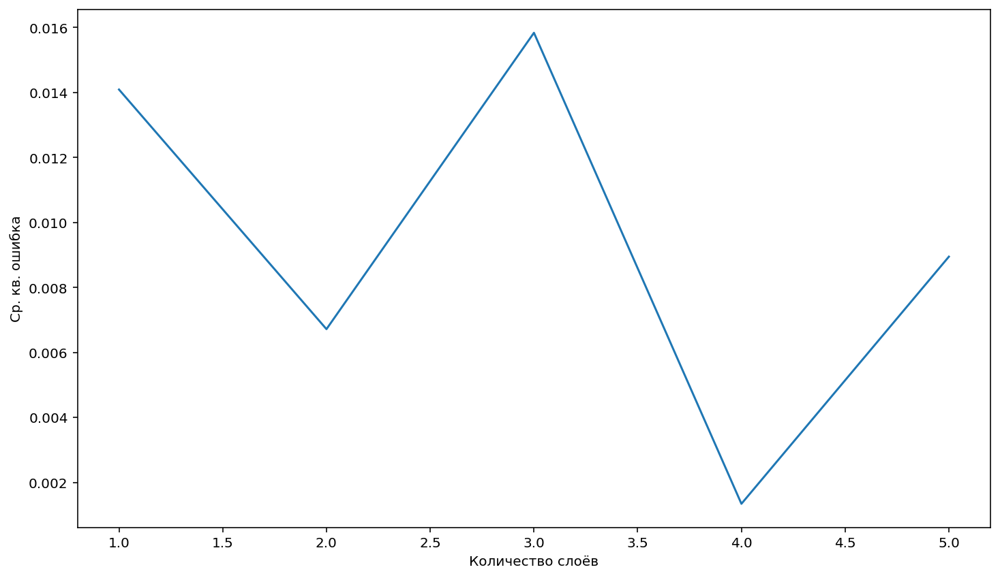

In [16]:
draw_exp(3)

In [17]:
experiment(25)

Epoch 1/100


 1/20 [>.............................] - ETA: 16s - loss: 0.4846

 5/20 [======>.......................] - ETA: 0s - loss: 0.5229 

 9/20 [============>.................] - ETA: 0s - loss: 0.5155

10/20 [==============>...............] - ETA: 0s - loss: 0.5128

12/20 [=================>............] - ETA: 0s - loss: 0.5084

13/20 [==================>...........] - ETA: 0s - loss: 0.5068

20/20 [==============================] - 1s 26ms/step - loss: 0.5016


Epoch 2/100
 1/20 [>.............................] - ETA: 1s - loss: 0.4621

20/20 [==============================] - 0s 1ms/step - loss: 0.4449


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4326

16/20 [=======================>......] - ETA: 0s - loss: 0.4090

20/20 [==============================] - 0s 5ms/step - loss: 0.4044


Epoch 4/100


 1/20 [>.............................] - ETA: 0s - loss: 0.4734

 8/20 [===========>..................] - ETA: 0s - loss: 0.4078

20/20 [==============================] - 0s 5ms/step - loss: 0.3795


Epoch 5/100
 1/20 [>.............................] - ETA: 1s - loss: 0.4224

20/20 [==============================] - 0s 1ms/step - loss: 0.3528


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4845

 8/20 [===========>..................] - ETA: 0s - loss: 0.3758

20/20 [==============================] - 0s 4ms/step - loss: 0.3508


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4173

 2/20 [==>...........................] - ETA: 1s - loss: 0.3804

20/20 [==============================] - 0s 4ms/step - loss: 0.3330


Epoch 8/100


 1/20 [>.............................] - ETA: 1s - loss: 0.2180

 3/20 [===>..........................] - ETA: 2s - loss: 0.2917

 9/20 [============>.................] - ETA: 0s - loss: 0.3113

19/20 [===========================>..] - ETA: 0s - loss: 0.3086

20/20 [==============================] - 1s 27ms/step - loss: 0.3078


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2757

 4/20 [=====>........................] - ETA: 0s - loss: 0.2952

15/20 [=====================>........] - ETA: 0s - loss: 0.2923

20/20 [==============================] - 0s 15ms/step - loss: 0.2920


Epoch 10/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2775

20/20 [==============================] - 0s 2ms/step - loss: 0.2908


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2133

20/20 [==============================] - 0s 1ms/step - loss: 0.2571


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2485

 4/20 [=====>........................] - ETA: 0s - loss: 0.2540

20/20 [==============================] - 0s 4ms/step - loss: 0.2612


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2424

 3/20 [===>..........................] - ETA: 0s - loss: 0.2415

20/20 [==============================] - 0s 4ms/step - loss: 0.2323


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1385

 9/20 [============>.................] - ETA: 0s - loss: 0.2181

20/20 [==============================] - 0s 4ms/step - loss: 0.2189


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2713

 9/20 [============>.................] - ETA: 0s - loss: 0.2279

20/20 [==============================] - 0s 4ms/step - loss: 0.2091


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2540

 2/20 [==>...........................] - ETA: 0s - loss: 0.2329

20/20 [==============================] - 0s 4ms/step - loss: 0.1846


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1897

 9/20 [============>.................] - ETA: 0s - loss: 0.1744

20/20 [==============================] - 0s 4ms/step - loss: 0.1703


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1706

 2/20 [==>...........................] - ETA: 1s - loss: 0.1624

20/20 [==============================] - 0s 5ms/step - loss: 0.1547


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1151

20/20 [==============================] - 0s 1ms/step - loss: 0.1428


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1013



20/20 [==============================] - 0s 1ms/step - loss: 0.1426


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0766

 4/20 [=====>........................] - ETA: 0s - loss: 0.0995

20/20 [==============================] - 0s 4ms/step - loss: 0.1189


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1147

 2/20 [==>...........................] - ETA: 0s - loss: 0.1090

20/20 [==============================] - 0s 5ms/step - loss: 0.1248


Epoch 23/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1220

20/20 [==============================] - 0s 1ms/step - loss: 0.1288


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0873

 4/20 [=====>........................] - ETA: 0s - loss: 0.0825

20/20 [==============================] - 0s 4ms/step - loss: 0.1060


Epoch 25/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1124

20/20 [==============================] - 0s 1ms/step - loss: 0.1090


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1096

 4/20 [=====>........................] - ETA: 0s - loss: 0.1066

20/20 [==============================] - 0s 4ms/step - loss: 0.1075


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0729

 4/20 [=====>........................] - ETA: 0s - loss: 0.0735

15/20 [=====================>........] - ETA: 0s - loss: 0.0853

20/20 [==============================] - 0s 9ms/step - loss: 0.0911


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1644

 2/20 [==>...........................] - ETA: 5s - loss: 0.1693

11/20 [===============>..............] - ETA: 0s - loss: 0.1600

19/20 [===========================>..] - ETA: 0s - loss: 0.1396

20/20 [==============================] - 1s 31ms/step - loss: 0.1362


Epoch 29/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0776

18/20 [==========================>...] - ETA: 0s - loss: 0.1054

20/20 [==============================] - 0s 5ms/step - loss: 0.1051


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0982

11/20 [===============>..............] - ETA: 0s - loss: 0.0816

20/20 [==============================] - 0s 5ms/step - loss: 0.0859


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1394

 5/20 [======>.......................] - ETA: 0s - loss: 0.1246

20/20 [==============================] - 0s 4ms/step - loss: 0.1050


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0414

 8/20 [===========>..................] - ETA: 0s - loss: 0.0858

20/20 [==============================] - 0s 4ms/step - loss: 0.0874


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1375

10/20 [==============>...............] - ETA: 0s - loss: 0.0875

20/20 [==============================] - 0s 4ms/step - loss: 0.0842


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0559

14/20 [====================>.........] - ETA: 0s - loss: 0.0673

20/20 [==============================] - 0s 4ms/step - loss: 0.0693


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0953

13/20 [==================>...........] - ETA: 0s - loss: 0.0689

20/20 [==============================] - 0s 4ms/step - loss: 0.0689


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0770

11/20 [===============>..............] - ETA: 0s - loss: 0.0731

20/20 [==============================] - 0s 4ms/step - loss: 0.0718


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0830

14/20 [====================>.........] - ETA: 0s - loss: 0.0882

20/20 [==============================] - 0s 3ms/step - loss: 0.0813


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0637

 6/20 [========>.....................] - ETA: 0s - loss: 0.0756

18/20 [==========================>...] - ETA: 0s - loss: 0.0714

20/20 [==============================] - 0s 9ms/step - loss: 0.0704


Epoch 39/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0528

 6/20 [========>.....................] - ETA: 0s - loss: 0.0491

16/20 [=======================>......] - ETA: 0s - loss: 0.0550

20/20 [==============================] - 0s 11ms/step - loss: 0.0565


Epoch 40/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0290

 4/20 [=====>........................] - ETA: 0s - loss: 0.0460

 5/20 [======>.......................] - ETA: 1s - loss: 0.0464

 8/20 [===========>..................] - ETA: 0s - loss: 0.0506

20/20 [==============================] - 1s 27ms/step - loss: 0.0597


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0446

 9/20 [============>.................] - ETA: 0s - loss: 0.0469

20/20 [==============================] - 0s 6ms/step - loss: 0.0506


Epoch 42/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0360

20/20 [==============================] - 0s 1ms/step - loss: 0.0507


Epoch 43/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0608

18/20 [==========================>...] - ETA: 0s - loss: 0.0686

20/20 [==============================] - 0s 6ms/step - loss: 0.0671


Epoch 44/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0349

 5/20 [======>.......................] - ETA: 0s - loss: 0.0608

13/20 [==================>...........] - ETA: 0s - loss: 0.0569

20/20 [==============================] - 0s 11ms/step - loss: 0.0560


Epoch 45/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0494

18/20 [==========================>...] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 6ms/step - loss: 0.0477


Epoch 46/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0149

20/20 [==============================] - 0s 2ms/step - loss: 0.0470


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0361

18/20 [==========================>...] - ETA: 0s - loss: 0.0496

20/20 [==============================] - 0s 5ms/step - loss: 0.0501


Epoch 48/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0197

 9/20 [============>.................] - ETA: 0s - loss: 0.0486

20/20 [==============================] - 0s 7ms/step - loss: 0.0517


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0923

 3/20 [===>..........................] - ETA: 0s - loss: 0.0745

16/20 [=======================>......] - ETA: 0s - loss: 0.0544

17/20 [========================>.....] - ETA: 0s - loss: 0.0539

20/20 [==============================] - 0s 16ms/step - loss: 0.0532


Epoch 50/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0914

18/20 [==========================>...] - ETA: 0s - loss: 0.0548

20/20 [==============================] - 0s 6ms/step - loss: 0.0543


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0357

 3/20 [===>..........................] - ETA: 0s - loss: 0.0415

17/20 [========================>.....] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 10ms/step - loss: 0.0515


Epoch 52/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0476

17/20 [========================>.....] - ETA: 0s - loss: 0.0444

20/20 [==============================] - 0s 6ms/step - loss: 0.0451


Epoch 53/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0576

17/20 [========================>.....] - ETA: 0s - loss: 0.0440

20/20 [==============================] - 0s 6ms/step - loss: 0.0442


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1460

 2/20 [==>...........................] - ETA: 0s - loss: 0.1111

20/20 [==============================] - 0s 5ms/step - loss: 0.0578


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0440

 7/20 [=========>....................] - ETA: 0s - loss: 0.0407

16/20 [=======================>......] - ETA: 0s - loss: 0.0419

20/20 [==============================] - ETA: 0s - loss: 0.0423

20/20 [==============================] - 0s 26ms/step - loss: 0.0423


Epoch 56/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0918

 8/20 [===========>..................] - ETA: 0s - loss: 0.0640

20/20 [==============================] - 0s 7ms/step - loss: 0.0528


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0288

 2/20 [==>...........................] - ETA: 1s - loss: 0.0502

 8/20 [===========>..................] - ETA: 0s - loss: 0.0678

10/20 [==============>...............] - ETA: 0s - loss: 0.0649

20/20 [==============================] - 0s 16ms/step - loss: 0.0550


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

13/20 [==================>...........] - ETA: 0s - loss: 0.0431

20/20 [==============================] - 0s 5ms/step - loss: 0.0425


Epoch 59/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0270

20/20 [==============================] - ETA: 0s - loss: 0.0332

20/20 [==============================] - 0s 5ms/step - loss: 0.0335


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0462

 8/20 [===========>..................] - ETA: 0s - loss: 0.0299

20/20 [==============================] - 0s 5ms/step - loss: 0.0313


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0600

12/20 [=================>............] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 6ms/step - loss: 0.0418


Epoch 62/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0056

12/20 [=================>............] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 6ms/step - loss: 0.0272


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0356

 4/20 [=====>........................] - ETA: 0s - loss: 0.0336

14/20 [====================>.........] - ETA: 0s - loss: 0.0355

20/20 [==============================] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 15ms/step - loss: 0.0358


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0654

16/20 [=======================>......] - ETA: 0s - loss: 0.0475

20/20 [==============================] - 0s 5ms/step - loss: 0.0449


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0345

 2/20 [==>...........................] - ETA: 0s - loss: 0.0347

20/20 [==============================] - 0s 4ms/step - loss: 0.0352


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0292

15/20 [=====================>........] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 5ms/step - loss: 0.0341


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0236

 3/20 [===>..........................] - ETA: 0s - loss: 0.0305

20/20 [==============================] - 0s 5ms/step - loss: 0.0365


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0230

15/20 [=====================>........] - ETA: 0s - loss: 0.0378

20/20 [==============================] - 0s 5ms/step - loss: 0.0361


Epoch 69/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0579

10/20 [==============>...............] - ETA: 0s - loss: 0.0334

13/20 [==================>...........] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 17ms/step - loss: 0.0306


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

 3/20 [===>..........................] - ETA: 0s - loss: 0.0261

18/20 [==========================>...] - ETA: 0s - loss: 0.0265

20/20 [==============================] - 0s 10ms/step - loss: 0.0271


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0419

 2/20 [==>...........................] - ETA: 1s - loss: 0.0410

18/20 [==========================>...] - ETA: 0s - loss: 0.0310

20/20 [==============================] - 0s 10ms/step - loss: 0.0309


Epoch 72/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0404

20/20 [==============================] - 0s 1ms/step - loss: 0.0362


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 1ms/step - loss: 0.0204


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0542

15/20 [=====================>........] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 5ms/step - loss: 0.0331


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0329

 5/20 [======>.......................] - ETA: 0s - loss: 0.0286

20/20 [==============================] - 0s 5ms/step - loss: 0.0270


Epoch 76/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0258


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0088

19/20 [===========================>..] - ETA: 0s - loss: 0.0266

20/20 [==============================] - 0s 5ms/step - loss: 0.0265


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

 2/20 [==>...........................] - ETA: 1s - loss: 0.0060

12/20 [=================>............] - ETA: 0s - loss: 0.0244

15/20 [=====================>........] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 20ms/step - loss: 0.0253


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0229

10/20 [==============>...............] - ETA: 0s - loss: 0.0180

20/20 [==============================] - 0s 6ms/step - loss: 0.0200


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0064

20/20 [==============================] - 0s 1ms/step - loss: 0.0191


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

 5/20 [======>.......................] - ETA: 0s - loss: 0.0189

 9/20 [============>.................] - ETA: 0s - loss: 0.0208

11/20 [===============>..............] - ETA: 0s - loss: 0.0217

19/20 [===========================>..] - ETA: 0s - loss: 0.0234

20/20 [==============================] - 0s 20ms/step - loss: 0.0234


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

 9/20 [============>.................] - ETA: 0s - loss: 0.0231

20/20 [==============================] - 0s 5ms/step - loss: 0.0234


Epoch 83/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0127

14/20 [====================>.........] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 6ms/step - loss: 0.0241


Epoch 84/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0426

20/20 [==============================] - ETA: 0s - loss: 0.0202



20/20 [==============================] - 0s 5ms/step - loss: 0.0203


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0312

 9/20 [============>.................] - ETA: 0s - loss: 0.0263

20/20 [==============================] - 0s 5ms/step - loss: 0.0233


Epoch 86/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0354

20/20 [==============================] - 0s 2ms/step - loss: 0.0189


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0044

13/20 [==================>...........] - ETA: 0s - loss: 0.0118

20/20 [==============================] - 0s 5ms/step - loss: 0.0138


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

13/20 [==================>...........] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 6ms/step - loss: 0.0125


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0356

20/20 [==============================] - ETA: 0s - loss: 0.0194

20/20 [==============================] - 0s 5ms/step - loss: 0.0194


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0363

 2/20 [==>...........................] - ETA: 3s - loss: 0.0405

11/20 [===============>..............] - ETA: 0s - loss: 0.0281

19/20 [===========================>..] - ETA: 0s - loss: 0.0240

20/20 [==============================] - 0s 20ms/step - loss: 0.0235


Epoch 91/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0016

 4/20 [=====>........................] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 6ms/step - loss: 0.0159


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0231

11/20 [===============>..............] - ETA: 0s - loss: 0.0193

20/20 [==============================] - 0s 6ms/step - loss: 0.0195


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0237

 2/20 [==>...........................] - ETA: 0s - loss: 0.0204

20/20 [==============================] - 0s 4ms/step - loss: 0.0193


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0215

13/20 [==================>...........] - ETA: 0s - loss: 0.0228

14/20 [====================>.........] - ETA: 0s - loss: 0.0225

16/20 [=======================>......] - ETA: 0s - loss: 0.0220

19/20 [===========================>..] - ETA: 0s - loss: 0.0214

20/20 [==============================] - ETA: 0s - loss: 0.0212

20/20 [==============================] - 0s 26ms/step - loss: 0.0209


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0290

13/20 [==================>...........] - ETA: 0s - loss: 0.0213

20/20 [==============================] - 0s 5ms/step - loss: 0.0189


Epoch 96/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0363

 6/20 [========>.....................] - ETA: 0s - loss: 0.0265

12/20 [=================>............] - ETA: 0s - loss: 0.0228

20/20 [==============================] - 0s 16ms/step - loss: 0.0202


Epoch 97/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0074

20/20 [==============================] - 0s 2ms/step - loss: 0.0144


Epoch 98/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0134

17/20 [========================>.....] - ETA: 0s - loss: 0.0216

20/20 [==============================] - 0s 4ms/step - loss: 0.0204


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 8.2944e-04

13/20 [==================>...........] - ETA: 0s - loss: 0.0120    

20/20 [==============================] - 0s 5ms/step - loss: 0.0132


Epoch 100/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0387

 3/20 [===>..........................] - ETA: 1s - loss: 0.0277

 4/20 [=====>........................] - ETA: 1s - loss: 0.0254

 5/20 [======>.......................] - ETA: 1s - loss: 0.0233

11/20 [===============>..............] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 1s 27ms/step - loss: 0.0176


Epoch 1/100


 1/20 [>.............................] - ETA: 18s - loss: 0.6170

 2/20 [==>...........................] - ETA: 1s - loss: 0.5807 

11/20 [===============>..............] - ETA: 0s - loss: 0.5476

20/20 [==============================] - 1s 11ms/step - loss: 0.5214


Epoch 2/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3958

 2/20 [==>...........................] - ETA: 1s - loss: 0.3998

 7/20 [=========>....................] - ETA: 0s - loss: 0.4083

18/20 [==========================>...] - ETA: 0s - loss: 0.4100

20/20 [==============================] - 0s 15ms/step - loss: 0.4092


Epoch 3/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2651

12/20 [=================>............] - ETA: 0s - loss: 0.3665

20/20 [==============================] - 0s 6ms/step - loss: 0.3687


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2965

 7/20 [=========>....................] - ETA: 0s - loss: 0.3256

20/20 [==============================] - 0s 5ms/step - loss: 0.3431


Epoch 5/100
 1/20 [>.............................] - ETA: 1s - loss: 0.3323

20/20 [==============================] - 0s 1ms/step - loss: 0.3414


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2323

18/20 [==========================>...] - ETA: 0s - loss: 0.3100

20/20 [==============================] - 0s 5ms/step - loss: 0.3122


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3028

13/20 [==================>...........] - ETA: 0s - loss: 0.2996

20/20 [==============================] - 0s 5ms/step - loss: 0.3031


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3308

 5/20 [======>.......................] - ETA: 0s - loss: 0.3176

20/20 [==============================] - 0s 4ms/step - loss: 0.3043


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3311

 2/20 [==>...........................] - ETA: 1s - loss: 0.3394

 8/20 [===========>..................] - ETA: 0s - loss: 0.3175

 9/20 [============>.................] - ETA: 0s - loss: 0.3165

14/20 [====================>.........] - ETA: 0s - loss: 0.3115

20/20 [==============================] - 1s 26ms/step - loss: 0.3063


Epoch 10/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2853

 7/20 [=========>....................] - ETA: 0s - loss: 0.2664

20/20 [==============================] - 0s 6ms/step - loss: 0.2748


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2477

18/20 [==========================>...] - ETA: 0s - loss: 0.2595

20/20 [==============================] - 0s 5ms/step - loss: 0.2601


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2331

 8/20 [===========>..................] - ETA: 0s - loss: 0.2574

20/20 [==============================] - 0s 6ms/step - loss: 0.2590


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2729

20/20 [==============================] - 0s 1ms/step - loss: 0.2410


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3229

 5/20 [======>.......................] - ETA: 0s - loss: 0.2742

14/20 [====================>.........] - ETA: 0s - loss: 0.2500

20/20 [==============================] - 0s 11ms/step - loss: 0.2421


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2256

 3/20 [===>..........................] - ETA: 0s - loss: 0.2111

12/20 [=================>............] - ETA: 0s - loss: 0.2049

20/20 [==============================] - ETA: 0s - loss: 0.2085

20/20 [==============================] - 0s 15ms/step - loss: 0.2089


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1722

 3/20 [===>..........................] - ETA: 0s - loss: 0.1886

11/20 [===============>..............] - ETA: 0s - loss: 0.1858

14/20 [====================>.........] - ETA: 0s - loss: 0.1911

20/20 [==============================] - 0s 15ms/step - loss: 0.1954


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2320

 2/20 [==>...........................] - ETA: 1s - loss: 0.2150

 3/20 [===>..........................] - ETA: 1s - loss: 0.2061

15/20 [=====================>........] - ETA: 0s - loss: 0.1877

20/20 [==============================] - 0s 15ms/step - loss: 0.1886


Epoch 18/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1422

16/20 [=======================>......] - ETA: 0s - loss: 0.1776

20/20 [==============================] - 0s 5ms/step - loss: 0.1792


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2885

 4/20 [=====>........................] - ETA: 0s - loss: 0.2289

20/20 [==============================] - 0s 5ms/step - loss: 0.1790


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1904

20/20 [==============================] - 0s 1ms/step - loss: 0.1706


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1911

16/20 [=======================>......] - ETA: 0s - loss: 0.1547

20/20 [==============================] - 0s 5ms/step - loss: 0.1534


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1635

12/20 [=================>............] - ETA: 0s - loss: 0.1455

20/20 [==============================] - 0s 4ms/step - loss: 0.1446


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0993

 5/20 [======>.......................] - ETA: 0s - loss: 0.1067

20/20 [==============================] - 0s 5ms/step - loss: 0.1266


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1821

 7/20 [=========>....................] - ETA: 0s - loss: 0.1439

10/20 [==============>...............] - ETA: 0s - loss: 0.1391

17/20 [========================>.....] - ETA: 0s - loss: 0.1341

20/20 [==============================] - 0s 16ms/step - loss: 0.1333


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0807

 4/20 [=====>........................] - ETA: 0s - loss: 0.0971

14/20 [====================>.........] - ETA: 0s - loss: 0.1031

20/20 [==============================] - ETA: 0s - loss: 0.1092

20/20 [==============================] - 0s 15ms/step - loss: 0.1099


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1118

 8/20 [===========>..................] - ETA: 0s - loss: 0.1168

17/20 [========================>.....] - ETA: 0s - loss: 0.1182

20/20 [==============================] - 0s 10ms/step - loss: 0.1182


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0676

13/20 [==================>...........] - ETA: 0s - loss: 0.0990

20/20 [==============================] - 0s 5ms/step - loss: 0.1045


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1294

 2/20 [==>...........................] - ETA: 1s - loss: 0.1206

20/20 [==============================] - 0s 6ms/step - loss: 0.1193


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1089

18/20 [==========================>...] - ETA: 0s - loss: 0.1167

20/20 [==============================] - 0s 5ms/step - loss: 0.1154


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0515

 6/20 [========>.....................] - ETA: 0s - loss: 0.0778

20/20 [==============================] - 0s 5ms/step - loss: 0.0904


Epoch 31/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1431

20/20 [==============================] - 0s 1ms/step - loss: 0.1041


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0917

16/20 [=======================>......] - ETA: 0s - loss: 0.1026

20/20 [==============================] - 0s 5ms/step - loss: 0.1014


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0645

 2/20 [==>...........................] - ETA: 1s - loss: 0.0712

 7/20 [=========>....................] - ETA: 0s - loss: 0.0738

16/20 [=======================>......] - ETA: 0s - loss: 0.0851

20/20 [==============================] - 0s 16ms/step - loss: 0.0868


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0847

 2/20 [==>...........................] - ETA: 1s - loss: 0.0879

 6/20 [========>.....................] - ETA: 0s - loss: 0.0930

11/20 [===============>..............] - ETA: 0s - loss: 0.0920

20/20 [==============================] - ETA: 0s - loss: 0.0915

20/20 [==============================] - 0s 20ms/step - loss: 0.0914


Epoch 35/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0776

20/20 [==============================] - 0s 1ms/step - loss: 0.0875


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0975

19/20 [===========================>..] - ETA: 0s - loss: 0.0799

20/20 [==============================] - 0s 5ms/step - loss: 0.0805


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0816

10/20 [==============>...............] - ETA: 0s - loss: 0.0967

20/20 [==============================] - 0s 6ms/step - loss: 0.0913


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0501

20/20 [==============================] - 0s 2ms/step - loss: 0.0870


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0680

12/20 [=================>............] - ETA: 0s - loss: 0.0722

20/20 [==============================] - 0s 5ms/step - loss: 0.0739


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0647

 3/20 [===>..........................] - ETA: 0s - loss: 0.0951

20/20 [==============================] - 0s 5ms/step - loss: 0.0835


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0854

 2/20 [==>...........................] - ETA: 1s - loss: 0.0908

15/20 [=====================>........] - ETA: 0s - loss: 0.0738

20/20 [==============================] - 0s 10ms/step - loss: 0.0736


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0405

 4/20 [=====>........................] - ETA: 0s - loss: 0.0409

15/20 [=====================>........] - ETA: 0s - loss: 0.0654

20/20 [==============================] - 0s 11ms/step - loss: 0.0687


Epoch 43/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1090

 4/20 [=====>........................] - ETA: 0s - loss: 0.0966

 5/20 [======>.......................] - ETA: 0s - loss: 0.0972

20/20 [==============================] - 0s 12ms/step - loss: 0.0828


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0519

12/20 [=================>............] - ETA: 0s - loss: 0.0717

20/20 [==============================] - 0s 5ms/step - loss: 0.0732


Epoch 45/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0451

20/20 [==============================] - 0s 2ms/step - loss: 0.0700


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0467

14/20 [====================>.........] - ETA: 0s - loss: 0.0696

20/20 [==============================] - 0s 5ms/step - loss: 0.0702


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0918

 4/20 [=====>........................] - ETA: 0s - loss: 0.0765

20/20 [==============================] - 0s 5ms/step - loss: 0.0772


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0447

20/20 [==============================] - 0s 2ms/step - loss: 0.0679


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1029

 5/20 [======>.......................] - ETA: 0s - loss: 0.0916

20/20 [==============================] - 0s 10ms/step - loss: 0.0704


Epoch 50/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0786

 9/20 [============>.................] - ETA: 0s - loss: 0.0753

19/20 [===========================>..] - ETA: 0s - loss: 0.0749

20/20 [==============================] - 0s 11ms/step - loss: 0.0740


Epoch 51/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0237

12/20 [=================>............] - ETA: 0s - loss: 0.0667

20/20 [==============================] - ETA: 0s - loss: 0.0655

20/20 [==============================] - 0s 10ms/step - loss: 0.0654


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0465

12/20 [=================>............] - ETA: 0s - loss: 0.0544

20/20 [==============================] - 0s 5ms/step - loss: 0.0589


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1224

 7/20 [=========>....................] - ETA: 0s - loss: 0.0876

20/20 [==============================] - 0s 4ms/step - loss: 0.0734


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

 2/20 [==>...........................] - ETA: 1s - loss: 0.0353

20/20 [==============================] - 0s 5ms/step - loss: 0.0557


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0758

20/20 [==============================] - 0s 1ms/step - loss: 0.0659


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0323

20/20 [==============================] - 0s 1ms/step - loss: 0.0566


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0327

20/20 [==============================] - ETA: 0s - loss: 0.0650

20/20 [==============================] - 0s 4ms/step - loss: 0.0647


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

 7/20 [=========>....................] - ETA: 0s - loss: 0.0497

13/20 [==================>...........] - ETA: 0s - loss: 0.0575

20/20 [==============================] - 0s 10ms/step - loss: 0.0587


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0634

 2/20 [==>...........................] - ETA: 1s - loss: 0.0515

11/20 [===============>..............] - ETA: 0s - loss: 0.0562

20/20 [==============================] - 0s 15ms/step - loss: 0.0579


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

 2/20 [==>...........................] - ETA: 1s - loss: 0.0328

 5/20 [======>.......................] - ETA: 0s - loss: 0.0574

11/20 [===============>..............] - ETA: 0s - loss: 0.0647

12/20 [=================>............] - ETA: 0s - loss: 0.0646

20/20 [==============================] - 0s 21ms/step - loss: 0.0639


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1150

20/20 [==============================] - 0s 1ms/step - loss: 0.0635


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0592

20/20 [==============================] - ETA: 0s - loss: 0.0563

20/20 [==============================] - 0s 5ms/step - loss: 0.0564


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0731

17/20 [========================>.....] - ETA: 0s - loss: 0.0622

20/20 [==============================] - 0s 5ms/step - loss: 0.0612


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0347

13/20 [==================>...........] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 5ms/step - loss: 0.0487


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0268

 4/20 [=====>........................] - ETA: 0s - loss: 0.0334

20/20 [==============================] - 0s 5ms/step - loss: 0.0498


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 1ms/step - loss: 0.0527


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1178

15/20 [=====================>........] - ETA: 0s - loss: 0.0721

20/20 [==============================] - 0s 5ms/step - loss: 0.0672


Epoch 68/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0925

10/20 [==============>...............] - ETA: 0s - loss: 0.0572

20/20 [==============================] - ETA: 0s - loss: 0.0557

20/20 [==============================] - 0s 12ms/step - loss: 0.0557


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0251

 8/20 [===========>..................] - ETA: 0s - loss: 0.0484

18/20 [==========================>...] - ETA: 0s - loss: 0.0509

20/20 [==============================] - 0s 10ms/step - loss: 0.0516


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0147

 2/20 [==>...........................] - ETA: 1s - loss: 0.0386

 5/20 [======>.......................] - ETA: 0s - loss: 0.0446

10/20 [==============>...............] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 16ms/step - loss: 0.0536


Epoch 71/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0169

19/20 [===========================>..] - ETA: 0s - loss: 0.0582

20/20 [==============================] - 0s 5ms/step - loss: 0.0578


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0148

 9/20 [============>.................] - ETA: 0s - loss: 0.0563

20/20 [==============================] - 0s 5ms/step - loss: 0.0555


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0144

 2/20 [==>...........................] - ETA: 1s - loss: 0.0204

20/20 [==============================] - 0s 5ms/step - loss: 0.0462


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0914

11/20 [===============>..............] - ETA: 0s - loss: 0.0585

20/20 [==============================] - 0s 6ms/step - loss: 0.0588


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0088

 8/20 [===========>..................] - ETA: 0s - loss: 0.0694

15/20 [=====================>........] - ETA: 0s - loss: 0.0673

16/20 [=======================>......] - ETA: 0s - loss: 0.0669

20/20 [==============================] - 0s 15ms/step - loss: 0.0644


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0555

 3/20 [===>..........................] - ETA: 0s - loss: 0.0589

17/20 [========================>.....] - ETA: 0s - loss: 0.0566

20/20 [==============================] - 0s 9ms/step - loss: 0.0558


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0667

 5/20 [======>.......................] - ETA: 0s - loss: 0.0507

20/20 [==============================] - 0s 4ms/step - loss: 0.0514


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0412

20/20 [==============================] - 0s 1ms/step - loss: 0.0483


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0220

 8/20 [===========>..................] - ETA: 0s - loss: 0.0347

17/20 [========================>.....] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 11ms/step - loss: 0.0442


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0205

 9/20 [============>.................] - ETA: 0s - loss: 0.0422

20/20 [==============================] - 0s 6ms/step - loss: 0.0501


Epoch 81/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0591

20/20 [==============================] - 0s 2ms/step - loss: 0.0498


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0190

17/20 [========================>.....] - ETA: 0s - loss: 0.0432

20/20 [==============================] - 0s 5ms/step - loss: 0.0447


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0292

 2/20 [==>...........................] - ETA: 1s - loss: 0.0508

 9/20 [============>.................] - ETA: 0s - loss: 0.0507

20/20 [==============================] - 0s 10ms/step - loss: 0.0494


Epoch 84/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0879

 9/20 [============>.................] - ETA: 0s - loss: 0.0485

19/20 [===========================>..] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 10ms/step - loss: 0.0500


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0800

 2/20 [==>...........................] - ETA: 1s - loss: 0.0631

11/20 [===============>..............] - ETA: 0s - loss: 0.0624

20/20 [==============================] - 0s 11ms/step - loss: 0.0597


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

 3/20 [===>..........................] - ETA: 0s - loss: 0.0670

13/20 [==================>...........] - ETA: 0s - loss: 0.0601

14/20 [====================>.........] - ETA: 0s - loss: 0.0597

20/20 [==============================] - 0s 16ms/step - loss: 0.0580


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0410

16/20 [=======================>......] - ETA: 0s - loss: 0.0631

20/20 [==============================] - 0s 5ms/step - loss: 0.0605


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0566

 7/20 [=========>....................] - ETA: 0s - loss: 0.0618

20/20 [==============================] - 0s 5ms/step - loss: 0.0565


Epoch 89/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0319

13/20 [==================>...........] - ETA: 0s - loss: 0.0510

16/20 [=======================>......] - ETA: 0s - loss: 0.0515

20/20 [==============================] - 0s 11ms/step - loss: 0.0516


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1148

 6/20 [========>.....................] - ETA: 0s - loss: 0.0704

17/20 [========================>.....] - ETA: 0s - loss: 0.0615

20/20 [==============================] - 0s 10ms/step - loss: 0.0599


Epoch 91/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0184

11/20 [===============>..............] - ETA: 0s - loss: 0.0330

20/20 [==============================] - 0s 6ms/step - loss: 0.0421


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0130

 9/20 [============>.................] - ETA: 0s - loss: 0.0418

20/20 [==============================] - ETA: 0s - loss: 0.0488

20/20 [==============================] - 0s 10ms/step - loss: 0.0490


Epoch 93/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1556

 8/20 [===========>..................] - ETA: 0s - loss: 0.0800

20/20 [==============================] - 0s 5ms/step - loss: 0.0625


Epoch 94/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0249

20/20 [==============================] - 0s 1ms/step - loss: 0.0522


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0172

 3/20 [===>..........................] - ETA: 0s - loss: 0.0319

13/20 [==================>...........] - ETA: 0s - loss: 0.0406

20/20 [==============================] - 0s 11ms/step - loss: 0.0435


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0279

 3/20 [===>..........................] - ETA: 0s - loss: 0.0245

16/20 [=======================>......] - ETA: 0s - loss: 0.0390

20/20 [==============================] - 0s 10ms/step - loss: 0.0418


Epoch 97/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0582

 2/20 [==>...........................] - ETA: 1s - loss: 0.0491

15/20 [=====================>........] - ETA: 0s - loss: 0.0488

20/20 [==============================] - 0s 12ms/step - loss: 0.0494


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0390

 4/20 [=====>........................] - ETA: 0s - loss: 0.0616

20/20 [==============================] - 0s 6ms/step - loss: 0.0602


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0695

15/20 [=====================>........] - ETA: 0s - loss: 0.0696

20/20 [==============================] - 0s 5ms/step - loss: 0.0648


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0683

 2/20 [==>...........................] - ETA: 0s - loss: 0.0644

20/20 [==============================] - ETA: 0s - loss: 0.0511

20/20 [==============================] - 0s 8ms/step - loss: 0.0512


Epoch 1/100


 1/20 [>.............................] - ETA: 28s - loss: 0.6731

20/20 [==============================] - 2s 2ms/step - loss: 0.5227


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4085

17/20 [========================>.....] - ETA: 0s - loss: 0.3797

20/20 [==============================] - 0s 4ms/step - loss: 0.3767


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3652

20/20 [==============================] - 0s 2ms/step - loss: 0.3253


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2346

20/20 [==============================] - 0s 2ms/step - loss: 0.3038


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2798

20/20 [==============================] - 0s 3ms/step - loss: 0.2594


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2711

20/20 [==============================] - 0s 2ms/step - loss: 0.2424


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2496

20/20 [==============================] - 0s 2ms/step - loss: 0.2239


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2701

20/20 [==============================] - 0s 2ms/step - loss: 0.2141


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1521

20/20 [==============================] - 0s 2ms/step - loss: 0.1942


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1296

20/20 [==============================] - 0s 2ms/step - loss: 0.1781


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1611

20/20 [==============================] - 0s 2ms/step - loss: 0.1680


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1826

20/20 [==============================] - 0s 1ms/step - loss: 0.1697


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1662

20/20 [==============================] - 0s 2ms/step - loss: 0.1742


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3030

20/20 [==============================] - 0s 2ms/step - loss: 0.1706


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1603

20/20 [==============================] - ETA: 0s - loss: 0.1349

20/20 [==============================] - 0s 3ms/step - loss: 0.1351


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1388

20/20 [==============================] - 0s 2ms/step - loss: 0.1306


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1642

20/20 [==============================] - 0s 2ms/step - loss: 0.1365


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1400

20/20 [==============================] - 0s 2ms/step - loss: 0.1260


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1002

20/20 [==============================] - 0s 2ms/step - loss: 0.0997


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0511

17/20 [========================>.....] - ETA: 0s - loss: 0.0985

20/20 [==============================] - 0s 4ms/step - loss: 0.0995


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 2ms/step - loss: 0.0847


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1213

20/20 [==============================] - 0s 2ms/step - loss: 0.1010


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0767

20/20 [==============================] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 3ms/step - loss: 0.0890


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0883

20/20 [==============================] - 0s 1ms/step - loss: 0.0859


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1152

20/20 [==============================] - 0s 2ms/step - loss: 0.0946


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0872

14/20 [====================>.........] - ETA: 0s - loss: 0.0751

20/20 [==============================] - 0s 3ms/step - loss: 0.0764


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0744

17/20 [========================>.....] - ETA: 0s - loss: 0.0768

20/20 [==============================] - 0s 3ms/step - loss: 0.0765


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0416

20/20 [==============================] - 0s 2ms/step - loss: 0.0729


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1619

20/20 [==============================] - 0s 1ms/step - loss: 0.0782


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0941

13/20 [==================>...........] - ETA: 0s - loss: 0.0613

20/20 [==============================] - 0s 3ms/step - loss: 0.0624


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0479

18/20 [==========================>...] - ETA: 0s - loss: 0.0588

20/20 [==============================] - 0s 3ms/step - loss: 0.0592


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0748

20/20 [==============================] - 0s 1ms/step - loss: 0.0585


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0532

20/20 [==============================] - 0s 1ms/step - loss: 0.0584


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0550

16/20 [=======================>......] - ETA: 0s - loss: 0.0573

20/20 [==============================] - 0s 3ms/step - loss: 0.0564


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0481

20/20 [==============================] - 0s 1ms/step - loss: 0.0532


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0155

19/20 [===========================>..] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 3ms/step - loss: 0.0403


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 1ms/step - loss: 0.0469


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0434

20/20 [==============================] - 0s 1ms/step - loss: 0.0409


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0271

18/20 [==========================>...] - ETA: 0s - loss: 0.0393

20/20 [==============================] - 0s 3ms/step - loss: 0.0396


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

20/20 [==============================] - 0s 1ms/step - loss: 0.0405


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0405

20/20 [==============================] - 0s 1ms/step - loss: 0.0391


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0234

15/20 [=====================>........] - ETA: 0s - loss: 0.0318

20/20 [==============================] - 0s 3ms/step - loss: 0.0332


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0360

19/20 [===========================>..] - ETA: 0s - loss: 0.0320

20/20 [==============================] - 0s 3ms/step - loss: 0.0323


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0755

20/20 [==============================] - 0s 1ms/step - loss: 0.0391


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185

20/20 [==============================] - 0s 1ms/step - loss: 0.0268


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0242

17/20 [========================>.....] - ETA: 0s - loss: 0.0292

20/20 [==============================] - 0s 3ms/step - loss: 0.0296


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 1ms/step - loss: 0.0269


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 1ms/step - loss: 0.0249


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0415

19/20 [===========================>..] - ETA: 0s - loss: 0.0292

20/20 [==============================] - 0s 3ms/step - loss: 0.0291


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0541

20/20 [==============================] - 0s 2ms/step - loss: 0.0302


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0256

20/20 [==============================] - 0s 1ms/step - loss: 0.0227


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0139

14/20 [====================>.........] - ETA: 0s - loss: 0.0246

20/20 [==============================] - 0s 3ms/step - loss: 0.0247


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 1ms/step - loss: 0.0259


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 2ms/step - loss: 0.0211


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0167

17/20 [========================>.....] - ETA: 0s - loss: 0.0207

20/20 [==============================] - 0s 3ms/step - loss: 0.0209


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0321

20/20 [==============================] - ETA: 0s - loss: 0.0239

20/20 [==============================] - 0s 3ms/step - loss: 0.0238


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0391

20/20 [==============================] - 0s 2ms/step - loss: 0.0221


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0171

15/20 [=====================>........] - ETA: 0s - loss: 0.0183

20/20 [==============================] - 0s 4ms/step - loss: 0.0185


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0143

20/20 [==============================] - 0s 2ms/step - loss: 0.0154


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 2ms/step - loss: 0.0154


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 3ms/step - loss: 0.0174


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 3ms/step - loss: 0.0190


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

20/20 [==============================] - 0s 2ms/step - loss: 0.0144


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 2ms/step - loss: 0.0175


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0090

20/20 [==============================] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 3ms/step - loss: 0.0161


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

18/20 [==========================>...] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 3ms/step - loss: 0.0109


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 2ms/step - loss: 0.0179


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

20/20 [==============================] - 0s 2ms/step - loss: 0.0149


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0081

20/20 [==============================] - 0s 2ms/step - loss: 0.0122


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 3ms/step - loss: 0.0153


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 1ms/step - loss: 0.0141


Epoch 72/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 1ms/step - loss: 0.0116


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0254

17/20 [========================>.....] - ETA: 0s - loss: 0.0178

20/20 [==============================] - 0s 3ms/step - loss: 0.0168


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0115

20/20 [==============================] - 0s 1ms/step - loss: 0.0098


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

20/20 [==============================] - 0s 2ms/step - loss: 0.0166


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0168

20/20 [==============================] - 0s 2ms/step - loss: 0.0156


Epoch 77/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0187

20/20 [==============================] - 0s 1ms/step - loss: 0.0144


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 1ms/step - loss: 0.0094


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

15/20 [=====================>........] - ETA: 0s - loss: 0.0090

20/20 [==============================] - 0s 3ms/step - loss: 0.0095


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0203

20/20 [==============================] - 0s 1ms/step - loss: 0.0147


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0143

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

16/20 [=======================>......] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 83/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0103

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0168

20/20 [==============================] - 0s 1ms/step - loss: 0.0111


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

11/20 [===============>..............] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 4ms/step - loss: 0.0123


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0218

20/20 [==============================] - 0s 1ms/step - loss: 0.0117


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 1ms/step - loss: 0.0078


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0207

14/20 [====================>.........] - ETA: 0s - loss: 0.0112

20/20 [==============================] - 0s 3ms/step - loss: 0.0107


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 1ms/step - loss: 0.0080


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0084


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0201

14/20 [====================>.........] - ETA: 0s - loss: 0.0106

20/20 [==============================] - 0s 3ms/step - loss: 0.0103


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0327

20/20 [==============================] - 0s 2ms/step - loss: 0.0102


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0077


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

16/20 [=======================>......] - ETA: 0s - loss: 0.0095

20/20 [==============================] - 0s 3ms/step - loss: 0.0093


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

20/20 [==============================] - 0s 1ms/step - loss: 0.0099


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0122

13/20 [==================>...........] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 3ms/step - loss: 0.0088


Epoch 97/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0141

16/20 [=======================>......] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0119


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 1ms/step - loss: 0.0073


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

20/20 [==============================] - 0s 1ms/step - loss: 0.0094


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

20/20 [==============================] - ETA: 0s - loss: 0.0083

20/20 [==============================] - 0s 4ms/step - loss: 0.0083


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.7714

20/20 [==============================] - 0s 1ms/step - loss: 0.5909


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.7101

15/20 [=====================>........] - ETA: 0s - loss: 0.4447

20/20 [==============================] - 0s 3ms/step - loss: 0.4309


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3151

20/20 [==============================] - 0s 1ms/step - loss: 0.3608


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4040

20/20 [==============================] - 0s 1ms/step - loss: 0.3759


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2994

19/20 [===========================>..] - ETA: 0s - loss: 0.3287

20/20 [==============================] - 0s 3ms/step - loss: 0.3309


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3482

 2/20 [==>...........................] - ETA: 1s - loss: 0.3258

 3/20 [===>..........................] - ETA: 3s - loss: 0.3152

12/20 [=================>............] - ETA: 0s - loss: 0.3075

14/20 [====================>.........] - ETA: 0s - loss: 0.3102

20/20 [==============================] - 1s 33ms/step - loss: 0.3187


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3437

 2/20 [==>...........................] - ETA: 1s - loss: 0.3438

12/20 [=================>............] - ETA: 0s - loss: 0.3290

20/20 [==============================] - ETA: 0s - loss: 0.3270

20/20 [==============================] - 0s 16ms/step - loss: 0.3270


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3638

20/20 [==============================] - 0s 1ms/step - loss: 0.3231


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2023

 6/20 [========>.....................] - ETA: 0s - loss: 0.3074

20/20 [==============================] - 0s 4ms/step - loss: 0.3130


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3097

20/20 [==============================] - 0s 1ms/step - loss: 0.3059


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3244

20/20 [==============================] - 0s 1ms/step - loss: 0.2947


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4015

18/20 [==========================>...] - ETA: 0s - loss: 0.3018

20/20 [==============================] - 0s 3ms/step - loss: 0.2994


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2143

20/20 [==============================] - 0s 1ms/step - loss: 0.2557


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3174

12/20 [=================>............] - ETA: 0s - loss: 0.2936

20/20 [==============================] - 0s 3ms/step - loss: 0.2819


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3626

20/20 [==============================] - 0s 1ms/step - loss: 0.2611


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1799

11/20 [===============>..............] - ETA: 0s - loss: 0.2198

12/20 [=================>............] - ETA: 0s - loss: 0.2220

17/20 [========================>.....] - ETA: 0s - loss: 0.2273

20/20 [==============================] - 1s 26ms/step - loss: 0.2303


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1877

 2/20 [==>...........................] - ETA: 1s - loss: 0.2151

 8/20 [===========>..................] - ETA: 0s - loss: 0.2198

12/20 [=================>............] - ETA: 0s - loss: 0.2208

18/20 [==========================>...] - ETA: 0s - loss: 0.2222

20/20 [==============================] - 0s 21ms/step - loss: 0.2240


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3006

20/20 [==============================] - 0s 1ms/step - loss: 0.2343


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1890

20/20 [==============================] - 0s 2ms/step - loss: 0.2127


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1875

20/20 [==============================] - 0s 3ms/step - loss: 0.1980


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1924

20/20 [==============================] - 0s 1ms/step - loss: 0.2154


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2507

20/20 [==============================] - 0s 1ms/step - loss: 0.1844


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1312

16/20 [=======================>......] - ETA: 0s - loss: 0.1761

20/20 [==============================] - 0s 4ms/step - loss: 0.1770


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1585

20/20 [==============================] - 0s 1ms/step - loss: 0.1616


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1146

15/20 [=====================>........] - ETA: 0s - loss: 0.1309

20/20 [==============================] - 0s 3ms/step - loss: 0.1317


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2002

12/20 [=================>............] - ETA: 0s - loss: 0.1490

20/20 [==============================] - 0s 4ms/step - loss: 0.1384


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1577

20/20 [==============================] - 0s 1ms/step - loss: 0.1263


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1064

20/20 [==============================] - 0s 1ms/step - loss: 0.1263


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0760

15/20 [=====================>........] - ETA: 0s - loss: 0.0967

20/20 [==============================] - 0s 3ms/step - loss: 0.0996


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0621

20/20 [==============================] - 0s 1ms/step - loss: 0.1058


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2189

20/20 [==============================] - 0s 1ms/step - loss: 0.1055


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0729

14/20 [====================>.........] - ETA: 0s - loss: 0.0874

20/20 [==============================] - 0s 3ms/step - loss: 0.0886


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1252

20/20 [==============================] - 0s 1ms/step - loss: 0.0959


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1480

20/20 [==============================] - 0s 1ms/step - loss: 0.0925


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0428

17/20 [========================>.....] - ETA: 0s - loss: 0.0827

20/20 [==============================] - 0s 3ms/step - loss: 0.0818


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1302

20/20 [==============================] - 0s 2ms/step - loss: 0.0822


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0785

20/20 [==============================] - 0s 1ms/step - loss: 0.0727


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0420

12/20 [=================>............] - ETA: 0s - loss: 0.0646

20/20 [==============================] - 0s 3ms/step - loss: 0.0663


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0658

20/20 [==============================] - 0s 1ms/step - loss: 0.0576


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0811

20/20 [==============================] - 0s 2ms/step - loss: 0.0583


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0321

20/20 [==============================] - 0s 3ms/step - loss: 0.0646


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0670

20/20 [==============================] - 0s 1ms/step - loss: 0.0565


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0765

20/20 [==============================] - 0s 1ms/step - loss: 0.0558


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0743

14/20 [====================>.........] - ETA: 0s - loss: 0.0560

20/20 [==============================] - 0s 3ms/step - loss: 0.0541


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0473

20/20 [==============================] - 0s 1ms/step - loss: 0.0462


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0246

20/20 [==============================] - 0s 1ms/step - loss: 0.0431


Epoch 47/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0389

15/20 [=====================>........] - ETA: 0s - loss: 0.0419

20/20 [==============================] - 0s 4ms/step - loss: 0.0418


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0344

20/20 [==============================] - 0s 1ms/step - loss: 0.0396


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0240

14/20 [====================>.........] - ETA: 0s - loss: 0.0371

20/20 [==============================] - 0s 3ms/step - loss: 0.0371


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0608

20/20 [==============================] - 0s 1ms/step - loss: 0.0371


Epoch 51/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0244

20/20 [==============================] - 0s 1ms/step - loss: 0.0279


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0441

 9/20 [============>.................] - ETA: 0s - loss: 0.0337

20/20 [==============================] - 0s 3ms/step - loss: 0.0316


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0228

20/20 [==============================] - 0s 1ms/step - loss: 0.0277


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0280

20/20 [==============================] - 0s 1ms/step - loss: 0.0248


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0326

18/20 [==========================>...] - ETA: 0s - loss: 0.0279

20/20 [==============================] - 0s 3ms/step - loss: 0.0275


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0212

20/20 [==============================] - 0s 1ms/step - loss: 0.0232


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 1ms/step - loss: 0.0242


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0410

20/20 [==============================] - ETA: 0s - loss: 0.0267

20/20 [==============================] - 0s 3ms/step - loss: 0.0265


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 1ms/step - loss: 0.0179


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

10/20 [==============>...............] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 3ms/step - loss: 0.0164


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 1ms/step - loss: 0.0188


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0142


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0338

15/20 [=====================>........] - ETA: 0s - loss: 0.0188

20/20 [==============================] - 0s 3ms/step - loss: 0.0181


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

20/20 [==============================] - 0s 1ms/step - loss: 0.0146


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0122

20/20 [==============================] - 0s 1ms/step - loss: 0.0140


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0115

19/20 [===========================>..] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 3ms/step - loss: 0.0130


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

20/20 [==============================] - 0s 1ms/step - loss: 0.0125


Epoch 68/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 1ms/step - loss: 0.0114


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0249

17/20 [========================>.....] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 3ms/step - loss: 0.0128


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0168

13/20 [==================>...........] - ETA: 0s - loss: 0.0121

20/20 [==============================] - 0s 3ms/step - loss: 0.0113


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 1ms/step - loss: 0.0106


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0061

20/20 [==============================] - 0s 2ms/step - loss: 0.0088


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

16/20 [=======================>......] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 3ms/step - loss: 0.0074


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0133

20/20 [==============================] - 0s 1ms/step - loss: 0.0078


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0078


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

12/20 [=================>............] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 3ms/step - loss: 0.0071


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

20/20 [==============================] - 0s 1ms/step - loss: 0.0058


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0068

20/20 [==============================] - 0s 2ms/step - loss: 0.0059


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 1ms/step - loss: 0.0057


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 1ms/step - loss: 0.0051


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0042

19/20 [===========================>..] - ETA: 0s - loss: 0.0047

20/20 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0041

14/20 [====================>.........] - ETA: 0s - loss: 0.0057

20/20 [==============================] - 0s 3ms/step - loss: 0.0056


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

20/20 [==============================] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 3ms/step - loss: 0.0056


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

20/20 [==============================] - 0s 1ms/step - loss: 0.0046


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

15/20 [=====================>........] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 3ms/step - loss: 0.0042


Epoch 90/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0037

20/20 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 1ms/step - loss: 0.0036


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

18/20 [==========================>...] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 3ms/step - loss: 0.0040


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

13/20 [==================>...........] - ETA: 0s - loss: 0.0031

20/20 [==============================] - 0s 3ms/step - loss: 0.0032


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

18/20 [==========================>...] - ETA: 0s - loss: 0.0035

20/20 [==============================] - 0s 3ms/step - loss: 0.0035


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

20/20 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 97/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0015

17/20 [========================>.....] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 3ms/step - loss: 0.0032


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 1ms/step - loss: 0.0031


Epoch 100/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0027

20/20 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.4790

20/20 [==============================] - 0s 1ms/step - loss: 0.5152


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4754

17/20 [========================>.....] - ETA: 0s - loss: 0.4185

20/20 [==============================] - 0s 3ms/step - loss: 0.4174


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4209

20/20 [==============================] - 0s 1ms/step - loss: 0.4001


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4828

15/20 [=====================>........] - ETA: 0s - loss: 0.3907

20/20 [==============================] - 0s 3ms/step - loss: 0.3851


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3822

16/20 [=======================>......] - ETA: 0s - loss: 0.3656

20/20 [==============================] - 0s 3ms/step - loss: 0.3635


Epoch 6/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2908

20/20 [==============================] - 0s 1ms/step - loss: 0.3246


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2879

16/20 [=======================>......] - ETA: 0s - loss: 0.3061

20/20 [==============================] - 0s 3ms/step - loss: 0.3104


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2485

17/20 [========================>.....] - ETA: 0s - loss: 0.3020

20/20 [==============================] - 0s 4ms/step - loss: 0.3041


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3530

20/20 [==============================] - 0s 1ms/step - loss: 0.3061


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2853

16/20 [=======================>......] - ETA: 0s - loss: 0.2905

20/20 [==============================] - 0s 3ms/step - loss: 0.2907


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4303

17/20 [========================>.....] - ETA: 0s - loss: 0.3111

20/20 [==============================] - 0s 3ms/step - loss: 0.3046


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2582

20/20 [==============================] - 0s 1ms/step - loss: 0.2629


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2281

20/20 [==============================] - 0s 1ms/step - loss: 0.2443


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1838

19/20 [===========================>..] - ETA: 0s - loss: 0.2345

20/20 [==============================] - 0s 3ms/step - loss: 0.2350


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2092

20/20 [==============================] - 0s 1ms/step - loss: 0.2219


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1887

11/20 [===============>..............] - ETA: 0s - loss: 0.2212

20/20 [==============================] - 0s 3ms/step - loss: 0.2185


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2113

20/20 [==============================] - 0s 1ms/step - loss: 0.2037


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2424

20/20 [==============================] - 0s 1ms/step - loss: 0.2156


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1677

14/20 [====================>.........] - ETA: 0s - loss: 0.1705

20/20 [==============================] - 0s 3ms/step - loss: 0.1733


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1832

20/20 [==============================] - 0s 1ms/step - loss: 0.1665


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1339

20/20 [==============================] - 0s 1ms/step - loss: 0.1576


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0851

13/20 [==================>...........] - ETA: 0s - loss: 0.1442

20/20 [==============================] - 0s 3ms/step - loss: 0.1490


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1699

20/20 [==============================] - 0s 1ms/step - loss: 0.1459


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1016

20/20 [==============================] - 0s 1ms/step - loss: 0.1333


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1334

19/20 [===========================>..] - ETA: 0s - loss: 0.1431

20/20 [==============================] - 0s 3ms/step - loss: 0.1425


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0940

20/20 [==============================] - 0s 1ms/step - loss: 0.1272


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1184

20/20 [==============================] - 0s 3ms/step - loss: 0.1338


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1191

20/20 [==============================] - 0s 1ms/step - loss: 0.1197


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2300

20/20 [==============================] - 0s 1ms/step - loss: 0.1258


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0811

13/20 [==================>...........] - ETA: 0s - loss: 0.1024

20/20 [==============================] - 0s 4ms/step - loss: 0.1081


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1917

20/20 [==============================] - 0s 1ms/step - loss: 0.1116


Epoch 32/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1187

20/20 [==============================] - 0s 1ms/step - loss: 0.1105


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0761

13/20 [==================>...........] - ETA: 0s - loss: 0.0950

20/20 [==============================] - 0s 3ms/step - loss: 0.0986


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2097

20/20 [==============================] - 0s 1ms/step - loss: 0.1168


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1028

20/20 [==============================] - 0s 1ms/step - loss: 0.0960


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1338

13/20 [==================>...........] - ETA: 0s - loss: 0.1099

20/20 [==============================] - 0s 3ms/step - loss: 0.1061


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0692

20/20 [==============================] - 0s 1ms/step - loss: 0.0864


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1296

20/20 [==============================] - 0s 1ms/step - loss: 0.1070


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1187

19/20 [===========================>..] - ETA: 0s - loss: 0.0883

20/20 [==============================] - 0s 3ms/step - loss: 0.0886


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0984

20/20 [==============================] - 0s 1ms/step - loss: 0.0992


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0649

17/20 [========================>.....] - ETA: 0s - loss: 0.0876

20/20 [==============================] - 0s 3ms/step - loss: 0.0874


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0632

20/20 [==============================] - 0s 1ms/step - loss: 0.0868


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1782

20/20 [==============================] - 0s 1ms/step - loss: 0.0979


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0689

 8/20 [===========>..................] - ETA: 0s - loss: 0.0819

20/20 [==============================] - 0s 4ms/step - loss: 0.0827


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 1ms/step - loss: 0.0871


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0417

20/20 [==============================] - 0s 1ms/step - loss: 0.0717


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0988

12/20 [=================>............] - ETA: 0s - loss: 0.0691

20/20 [==============================] - 0s 3ms/step - loss: 0.0696


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1187

20/20 [==============================] - 0s 1ms/step - loss: 0.0892


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0703

20/20 [==============================] - 0s 1ms/step - loss: 0.0754


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0423

15/20 [=====================>........] - ETA: 0s - loss: 0.0693

20/20 [==============================] - 0s 4ms/step - loss: 0.0703


Epoch 51/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0604

20/20 [==============================] - 0s 1ms/step - loss: 0.0746


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0507

19/20 [===========================>..] - ETA: 0s - loss: 0.0647

20/20 [==============================] - 0s 3ms/step - loss: 0.0654


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1606

20/20 [==============================] - ETA: 0s - loss: 0.0899

20/20 [==============================] - 0s 3ms/step - loss: 0.0890


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 1ms/step - loss: 0.0625


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0491

11/20 [===============>..............] - ETA: 0s - loss: 0.0750

20/20 [==============================] - 0s 3ms/step - loss: 0.0727


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0510

20/20 [==============================] - 0s 1ms/step - loss: 0.0812


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0361

20/20 [==============================] - 0s 1ms/step - loss: 0.0686


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0346

14/20 [====================>.........] - ETA: 0s - loss: 0.0623

20/20 [==============================] - 0s 3ms/step - loss: 0.0629


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0691

20/20 [==============================] - 0s 2ms/step - loss: 0.0666


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 1ms/step - loss: 0.0671


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0553

17/20 [========================>.....] - ETA: 0s - loss: 0.0680

20/20 [==============================] - 0s 3ms/step - loss: 0.0672


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0868

20/20 [==============================] - 0s 1ms/step - loss: 0.0692


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 1ms/step - loss: 0.0562


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0389

13/20 [==================>...........] - ETA: 0s - loss: 0.0598

20/20 [==============================] - 0s 3ms/step - loss: 0.0601


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 1ms/step - loss: 0.0565


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1502

20/20 [==============================] - 0s 1ms/step - loss: 0.0805


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0223

17/20 [========================>.....] - ETA: 0s - loss: 0.0463

20/20 [==============================] - 0s 3ms/step - loss: 0.0490


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1462

20/20 [==============================] - 0s 1ms/step - loss: 0.0612


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0292

13/20 [==================>...........] - ETA: 0s - loss: 0.0440

20/20 [==============================] - 0s 3ms/step - loss: 0.0494


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0815

20/20 [==============================] - 0s 1ms/step - loss: 0.0644


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0753

20/20 [==============================] - 0s 1ms/step - loss: 0.0584


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0655

12/20 [=================>............] - ETA: 0s - loss: 0.0483

20/20 [==============================] - 0s 3ms/step - loss: 0.0517


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 1ms/step - loss: 0.0631


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0259

20/20 [==============================] - 0s 1ms/step - loss: 0.0496


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1549

12/20 [=================>............] - ETA: 0s - loss: 0.0811

20/20 [==============================] - 0s 3ms/step - loss: 0.0710


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0206

20/20 [==============================] - 0s 1ms/step - loss: 0.0437


Epoch 77/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1135

20/20 [==============================] - 0s 1ms/step - loss: 0.0577


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0141

 9/20 [============>.................] - ETA: 0s - loss: 0.0413

20/20 [==============================] - 0s 3ms/step - loss: 0.0514


Epoch 79/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0721

20/20 [==============================] - 0s 1ms/step - loss: 0.0594


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0451

20/20 [==============================] - 0s 1ms/step - loss: 0.0521


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1230

13/20 [==================>...........] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 4ms/step - loss: 0.0553


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 1ms/step - loss: 0.0625


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

20/20 [==============================] - 0s 1ms/step - loss: 0.0438


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0396

14/20 [====================>.........] - ETA: 0s - loss: 0.0658

20/20 [==============================] - 0s 4ms/step - loss: 0.0623


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0414

20/20 [==============================] - 0s 1ms/step - loss: 0.0486


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0241

20/20 [==============================] - 0s 1ms/step - loss: 0.0431


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0818

17/20 [========================>.....] - ETA: 0s - loss: 0.0576

20/20 [==============================] - 0s 3ms/step - loss: 0.0569


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 1ms/step - loss: 0.0523


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0598

 9/20 [============>.................] - ETA: 0s - loss: 0.0588

20/20 [==============================] - 0s 4ms/step - loss: 0.0566


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0389

20/20 [==============================] - 0s 2ms/step - loss: 0.0471


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0204

20/20 [==============================] - 0s 2ms/step - loss: 0.0490


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0828

20/20 [==============================] - 0s 1ms/step - loss: 0.0531


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0189

17/20 [========================>.....] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 3ms/step - loss: 0.0527


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0220

20/20 [==============================] - 0s 1ms/step - loss: 0.0440


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0738

16/20 [=======================>......] - ETA: 0s - loss: 0.0517

20/20 [==============================] - 0s 3ms/step - loss: 0.0518


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0168

16/20 [=======================>......] - ETA: 0s - loss: 0.0622

20/20 [==============================] - 0s 4ms/step - loss: 0.0599


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 1ms/step - loss: 0.0605


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0504

20/20 [==============================] - 0s 1ms/step - loss: 0.0550


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0459

11/20 [===============>..............] - ETA: 0s - loss: 0.0741

20/20 [==============================] - 0s 3ms/step - loss: 0.0651


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0430

20/20 [==============================] - 0s 1ms/step - loss: 0.0525


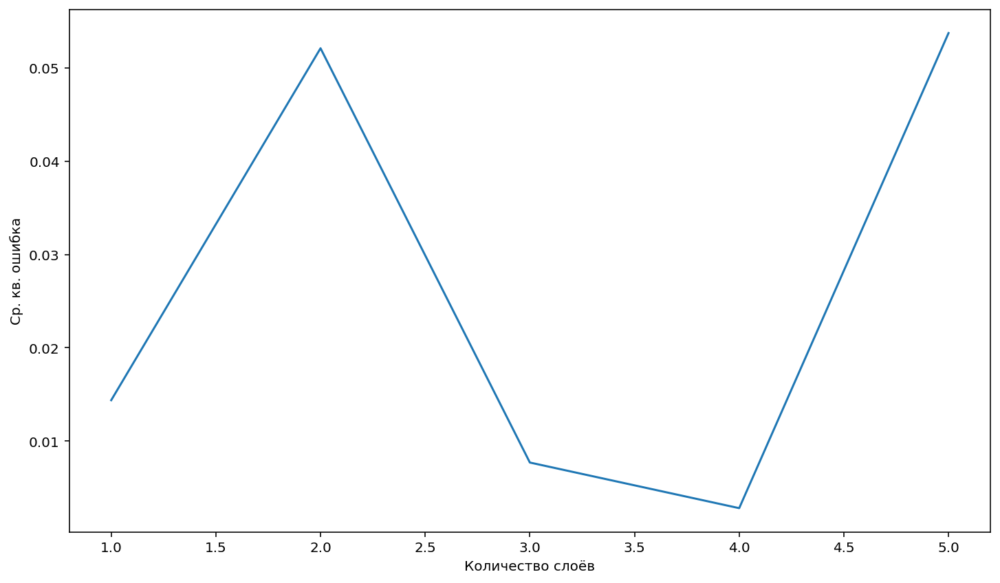

In [18]:
draw_exp(4)

In [19]:
experiment(30)

Epoch 1/100


 1/20 [>.............................] - ETA: 6s - loss: 0.6199

20/20 [==============================] - 0s 1ms/step - loss: 0.5177


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4031

 3/20 [===>..........................] - ETA: 0s - loss: 0.3976

20/20 [==============================] - 0s 4ms/step - loss: 0.3765


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2999

 9/20 [============>.................] - ETA: 0s - loss: 0.3164

20/20 [==============================] - 0s 4ms/step - loss: 0.3202


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3249

 5/20 [======>.......................] - ETA: 0s - loss: 0.3036

 6/20 [========>.....................] - ETA: 0s - loss: 0.3028

 7/20 [=========>....................] - ETA: 1s - loss: 0.3016

 9/20 [============>.................] - ETA: 0s - loss: 0.2998

20/20 [==============================] - 1s 31ms/step - loss: 0.3008


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3374

 3/20 [===>..........................] - ETA: 0s - loss: 0.3282

 6/20 [========>.....................] - ETA: 0s - loss: 0.3230

 9/20 [============>.................] - ETA: 0s - loss: 0.3160

20/20 [==============================] - 0s 16ms/step - loss: 0.2987


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3881

 2/20 [==>...........................] - ETA: 1s - loss: 0.3464

19/20 [===========================>..] - ETA: 0s - loss: 0.2829

20/20 [==============================] - 0s 9ms/step - loss: 0.2817


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3095

 9/20 [============>.................] - ETA: 0s - loss: 0.2884

20/20 [==============================] - 0s 5ms/step - loss: 0.2763


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3395

20/20 [==============================] - 0s 1ms/step - loss: 0.2658


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2022

20/20 [==============================] - 0s 1ms/step - loss: 0.2384


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2982

 2/20 [==>...........................] - ETA: 1s - loss: 0.2676

10/20 [==============>...............] - ETA: 0s - loss: 0.2323

20/20 [==============================] - ETA: 0s - loss: 0.2301

20/20 [==============================] - 0s 25ms/step - loss: 0.2298


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1814

 2/20 [==>...........................] - ETA: 1s - loss: 0.1806

10/20 [==============>...............] - ETA: 0s - loss: 0.2034

19/20 [===========================>..] - ETA: 0s - loss: 0.2058

20/20 [==============================] - 0s 16ms/step - loss: 0.2066


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1354

11/20 [===============>..............] - ETA: 0s - loss: 0.1932

20/20 [==============================] - 0s 6ms/step - loss: 0.1983


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2404

 6/20 [========>.....................] - ETA: 0s - loss: 0.2176

20/20 [==============================] - 0s 5ms/step - loss: 0.2063


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1277

18/20 [==========================>...] - ETA: 0s - loss: 0.1841

20/20 [==============================] - 0s 5ms/step - loss: 0.1854


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1751

 7/20 [=========>....................] - ETA: 0s - loss: 0.1685

20/20 [==============================] - 0s 5ms/step - loss: 0.1795


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1471

 2/20 [==>...........................] - ETA: 1s - loss: 0.1645

20/20 [==============================] - 0s 4ms/step - loss: 0.1716


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1576

 4/20 [=====>........................] - ETA: 0s - loss: 0.1597

20/20 [==============================] - 0s 4ms/step - loss: 0.1516


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1618

17/20 [========================>.....] - ETA: 0s - loss: 0.1543

20/20 [==============================] - 0s 4ms/step - loss: 0.1541


Epoch 19/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1456

 2/20 [==>...........................] - ETA: 1s - loss: 0.1506

 4/20 [=====>........................] - ETA: 1s - loss: 0.1505

 5/20 [======>.......................] - ETA: 1s - loss: 0.1495

 7/20 [=========>....................] - ETA: 0s - loss: 0.1475

20/20 [==============================] - 1s 21ms/step - loss: 0.1448


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1794

 2/20 [==>...........................] - ETA: 1s - loss: 0.1550

 9/20 [============>.................] - ETA: 0s - loss: 0.1352

19/20 [===========================>..] - ETA: 0s - loss: 0.1367

20/20 [==============================] - 0s 15ms/step - loss: 0.1371


Epoch 21/100


 1/20 [>.............................] - ETA: 1s - loss: 0.2114

 5/20 [======>.......................] - ETA: 0s - loss: 0.1720

20/20 [==============================] - 0s 5ms/step - loss: 0.1463


Epoch 22/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1464

20/20 [==============================] - 0s 1ms/step - loss: 0.1264


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0695

20/20 [==============================] - 0s 1ms/step - loss: 0.1232


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1738

20/20 [==============================] - 0s 1ms/step - loss: 0.1320


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1643

 2/20 [==>...........................] - ETA: 5s - loss: 0.1624

 3/20 [===>..........................] - ETA: 3s - loss: 0.1591

 5/20 [======>.......................] - ETA: 1s - loss: 0.1522

13/20 [==================>...........] - ETA: 0s - loss: 0.1442

16/20 [=======================>......] - ETA: 0s - loss: 0.1412

17/20 [========================>.....] - ETA: 0s - loss: 0.1401

18/20 [==========================>...] - ETA: 0s - loss: 0.1390

20/20 [==============================] - 1s 47ms/step - loss: 0.1360


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1444

20/20 [==============================] - 0s 1ms/step - loss: 0.1212


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1077

 6/20 [========>.....................] - ETA: 0s - loss: 0.1152

20/20 [==============================] - 0s 5ms/step - loss: 0.1108


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0993

20/20 [==============================] - 0s 1ms/step - loss: 0.1049


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0499

13/20 [==================>...........] - ETA: 0s - loss: 0.1001

20/20 [==============================] - 0s 5ms/step - loss: 0.1027


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0773

 7/20 [=========>....................] - ETA: 0s - loss: 0.0934

20/20 [==============================] - 0s 5ms/step - loss: 0.0997


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0881

 8/20 [===========>..................] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 4ms/step - loss: 0.0903


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0724

 2/20 [==>...........................] - ETA: 1s - loss: 0.0824

 8/20 [===========>..................] - ETA: 0s - loss: 0.0950

13/20 [==================>...........] - ETA: 0s - loss: 0.0913

20/20 [==============================] - 0s 15ms/step - loss: 0.0908


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0920

 4/20 [=====>........................] - ETA: 0s - loss: 0.0950

16/20 [=======================>......] - ETA: 0s - loss: 0.0879

18/20 [==========================>...] - ETA: 0s - loss: 0.0878

19/20 [===========================>..] - ETA: 0s - loss: 0.0878

20/20 [==============================] - 0s 20ms/step - loss: 0.0879


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0529

 9/20 [============>.................] - ETA: 0s - loss: 0.0696

10/20 [==============>...............] - ETA: 0s - loss: 0.0704

20/20 [==============================] - ETA: 0s - loss: 0.0755

20/20 [==============================] - 0s 21ms/step - loss: 0.0759


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0692

12/20 [=================>............] - ETA: 0s - loss: 0.0741

20/20 [==============================] - 0s 5ms/step - loss: 0.0755


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0673

 6/20 [========>.....................] - ETA: 0s - loss: 0.0747



20/20 [==============================] - 0s 5ms/step - loss: 0.0740


Epoch 37/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0394

20/20 [==============================] - 0s 1ms/step - loss: 0.0753


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0974

11/20 [===============>..............] - ETA: 0s - loss: 0.0747

12/20 [=================>............] - ETA: 0s - loss: 0.0746

20/20 [==============================] - ETA: 0s - loss: 0.0736

20/20 [==============================] - 0s 26ms/step - loss: 0.0734


Epoch 39/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0666

 2/20 [==>...........................] - ETA: 3s - loss: 0.0813

 3/20 [===>..........................] - ETA: 2s - loss: 0.0795

20/20 [==============================] - 0s 16ms/step - loss: 0.0687


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0453

20/20 [==============================] - 0s 1ms/step - loss: 0.0697


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0530

15/20 [=====================>........] - ETA: 0s - loss: 0.0537

20/20 [==============================] - 0s 5ms/step - loss: 0.0549


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0599

20/20 [==============================] - 0s 2ms/step - loss: 0.0578


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

10/20 [==============>...............] - ETA: 0s - loss: 0.0543

20/20 [==============================] - 0s 6ms/step - loss: 0.0564


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0515

 2/20 [==>...........................] - ETA: 1s - loss: 0.0482

12/20 [=================>............] - ETA: 0s - loss: 0.0521

17/20 [========================>.....] - ETA: 0s - loss: 0.0521

20/20 [==============================] - 0s 16ms/step - loss: 0.0522


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0735

 2/20 [==>...........................] - ETA: 1s - loss: 0.0771

14/20 [====================>.........] - ETA: 0s - loss: 0.0602

20/20 [==============================] - 0s 11ms/step - loss: 0.0563


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0452

12/20 [=================>............] - ETA: 0s - loss: 0.0427

20/20 [==============================] - 0s 5ms/step - loss: 0.0448


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0519

 3/20 [===>..........................] - ETA: 0s - loss: 0.0485

20/20 [==============================] - 0s 5ms/step - loss: 0.0453


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0688

20/20 [==============================] - ETA: 0s - loss: 0.0441

20/20 [==============================] - 0s 5ms/step - loss: 0.0440


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0199

11/20 [===============>..............] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 4ms/step - loss: 0.0383


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0339

 2/20 [==>...........................] - ETA: 1s - loss: 0.0391

20/20 [==============================] - 0s 4ms/step - loss: 0.0374


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0434

20/20 [==============================] - 0s 2ms/step - loss: 0.0347


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0276

 8/20 [===========>..................] - ETA: 0s - loss: 0.0274

20/20 [==============================] - 0s 4ms/step - loss: 0.0315


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0229

20/20 [==============================] - 0s 1ms/step - loss: 0.0292


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0287

20/20 [==============================] - 0s 2ms/step - loss: 0.0282


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0312

 5/20 [======>.......................] - ETA: 0s - loss: 0.0314

20/20 [==============================] - 0s 4ms/step - loss: 0.0282


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0295

20/20 [==============================] - 0s 2ms/step - loss: 0.0255


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0158

20/20 [==============================] - 0s 1ms/step - loss: 0.0217


Epoch 58/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0325

 5/20 [======>.......................] - ETA: 0s - loss: 0.0224

 6/20 [========>.....................] - ETA: 0s - loss: 0.0216

17/20 [========================>.....] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 1s 21ms/step - loss: 0.0211


Epoch 59/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0284

 9/20 [============>.................] - ETA: 0s - loss: 0.0202

10/20 [==============>...............] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 11ms/step - loss: 0.0201


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0236

20/20 [==============================] - ETA: 0s - loss: 0.0195

20/20 [==============================] - 0s 5ms/step - loss: 0.0195


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0178

12/20 [=================>............] - ETA: 0s - loss: 0.0166

20/20 [==============================] - 0s 5ms/step - loss: 0.0172


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0147

12/20 [=================>............] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 4ms/step - loss: 0.0143


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

12/20 [=================>............] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 5ms/step - loss: 0.0142


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0212

 2/20 [==>...........................] - ETA: 1s - loss: 0.0173

20/20 [==============================] - 0s 4ms/step - loss: 0.0131


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0144

 3/20 [===>..........................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 4ms/step - loss: 0.0121


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

 6/20 [========>.....................] - ETA: 0s - loss: 0.0140

20/20 [==============================] - 0s 4ms/step - loss: 0.0140


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

 4/20 [=====>........................] - ETA: 0s - loss: 0.0086

20/20 [==============================] - 0s 5ms/step - loss: 0.0104


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

 2/20 [==>...........................] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 4ms/step - loss: 0.0100


Epoch 69/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0110

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0095

 3/20 [===>..........................] - ETA: 0s - loss: 0.0091

15/20 [=====================>........] - ETA: 0s - loss: 0.0077

18/20 [==========================>...] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 14ms/step - loss: 0.0078


Epoch 71/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0094

12/20 [=================>............] - ETA: 0s - loss: 0.0080

13/20 [==================>...........] - ETA: 0s - loss: 0.0079

17/20 [========================>.....] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 16ms/step - loss: 0.0078


Epoch 72/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0053

 5/20 [======>.......................] - ETA: 0s - loss: 0.0052

15/20 [=====================>........] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 12ms/step - loss: 0.0062


Epoch 73/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0029

 8/20 [===========>..................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - 0s 6ms/step - loss: 0.0075


Epoch 74/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0073

20/20 [==============================] - 0s 2ms/step - loss: 0.0061


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 1ms/step - loss: 0.0061


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 2ms/step - loss: 0.0062


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 1ms/step - loss: 0.0051


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0046

20/20 [==============================] - 0s 1ms/step - loss: 0.0049


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 1ms/step - loss: 0.0041


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0067

20/20 [==============================] - 0s 1ms/step - loss: 0.0049


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0052

20/20 [==============================] - 0s 1ms/step - loss: 0.0046


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

 2/20 [==>...........................] - ETA: 0s - loss: 0.0041

20/20 [==============================] - 0s 4ms/step - loss: 0.0043


Epoch 83/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0022

14/20 [====================>.........] - ETA: 0s - loss: 0.0035

15/20 [=====================>........] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 17ms/step - loss: 0.0037


Epoch 84/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0026

 7/20 [=========>....................] - ETA: 0s - loss: 0.0027

15/20 [=====================>........] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 11ms/step - loss: 0.0032


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

 2/20 [==>...........................] - ETA: 3s - loss: 0.0028

20/20 [==============================] - 0s 11ms/step - loss: 0.0031


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

17/20 [========================>.....] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 5ms/step - loss: 0.0030


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

14/20 [====================>.........] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 4ms/step - loss: 0.0028


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

 9/20 [============>.................] - ETA: 0s - loss: 0.0035

20/20 [==============================] - 0s 5ms/step - loss: 0.0033


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

 5/20 [======>.......................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 4ms/step - loss: 0.0029


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 1ms/step - loss: 0.0029


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0024


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0019

 7/20 [=========>....................] - ETA: 0s - loss: 0.0025

16/20 [=======================>......] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 11ms/step - loss: 0.0026


Epoch 95/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0023

 3/20 [===>..........................] - ETA: 0s - loss: 0.0021

 9/20 [============>.................] - ETA: 0s - loss: 0.0022

16/20 [=======================>......] - ETA: 0s - loss: 0.0022

19/20 [===========================>..] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 21ms/step - loss: 0.0023


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

12/20 [=================>............] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 5ms/step - loss: 0.0025


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

 5/20 [======>.......................] - ETA: 0s - loss: 0.0031

20/20 [==============================] - 0s 4ms/step - loss: 0.0026


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

 2/20 [==>...........................] - ETA: 1s - loss: 0.0033

20/20 [==============================] - 0s 4ms/step - loss: 0.0027


Epoch 99/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0027

20/20 [==============================] - 0s 1ms/step - loss: 0.0026


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0023


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.5149

20/20 [==============================] - 0s 1ms/step - loss: 0.6554


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4402

 3/20 [===>..........................] - ETA: 0s - loss: 0.4689

20/20 [==============================] - 0s 4ms/step - loss: 0.4366


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2742

20/20 [==============================] - 0s 2ms/step - loss: 0.3811


Epoch 4/100


 1/20 [>.............................] - ETA: 1s - loss: 0.3188

 6/20 [========>.....................] - ETA: 0s - loss: 0.3818

 7/20 [=========>....................] - ETA: 0s - loss: 0.3838

18/20 [==========================>...] - ETA: 0s - loss: 0.3766

20/20 [==============================] - 0s 16ms/step - loss: 0.3755


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3060

 3/20 [===>..........................] - ETA: 0s - loss: 0.3515

 8/20 [===========>..................] - ETA: 0s - loss: 0.3683

14/20 [====================>.........] - ETA: 0s - loss: 0.3679

17/20 [========================>.....] - ETA: 0s - loss: 0.3655

20/20 [==============================] - 0s 22ms/step - loss: 0.3633


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3593

17/20 [========================>.....] - ETA: 0s - loss: 0.3476

20/20 [==============================] - 0s 5ms/step - loss: 0.3452


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3729

14/20 [====================>.........] - ETA: 0s - loss: 0.3373

20/20 [==============================] - 0s 4ms/step - loss: 0.3301


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3486

 9/20 [============>.................] - ETA: 0s - loss: 0.3098

20/20 [==============================] - 0s 5ms/step - loss: 0.3037


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2662

 2/20 [==>...........................] - ETA: 1s - loss: 0.2630

20/20 [==============================] - 0s 5ms/step - loss: 0.2735


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2310

20/20 [==============================] - 0s 1ms/step - loss: 0.2501


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2639

20/20 [==============================] - ETA: 0s - loss: 0.2590

20/20 [==============================] - 0s 5ms/step - loss: 0.2586


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2407

12/20 [=================>............] - ETA: 0s - loss: 0.2595

20/20 [==============================] - 0s 5ms/step - loss: 0.2534


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3423

 3/20 [===>..........................] - ETA: 0s - loss: 0.2808

12/20 [=================>............] - ETA: 0s - loss: 0.2463

13/20 [==================>...........] - ETA: 0s - loss: 0.2448

20/20 [==============================] - ETA: 0s - loss: 0.2385

20/20 [==============================] - 0s 20ms/step - loss: 0.2379


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2166

 2/20 [==>...........................] - ETA: 1s - loss: 0.1895

20/20 [==============================] - 0s 5ms/step - loss: 0.2104


Epoch 15/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2560

20/20 [==============================] - 0s 1ms/step - loss: 0.2053


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2326

20/20 [==============================] - 0s 1ms/step - loss: 0.1920


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1517

20/20 [==============================] - 0s 1ms/step - loss: 0.1773


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2188

 5/20 [======>.......................] - ETA: 0s - loss: 0.1940

19/20 [===========================>..] - ETA: 0s - loss: 0.1780

20/20 [==============================] - 0s 10ms/step - loss: 0.1772


Epoch 19/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1835

14/20 [====================>.........] - ETA: 0s - loss: 0.1595

16/20 [=======================>......] - ETA: 0s - loss: 0.1594

18/20 [==========================>...] - ETA: 0s - loss: 0.1592

20/20 [==============================] - 1s 16ms/step - loss: 0.1595


Epoch 20/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1931

19/20 [===========================>..] - ETA: 0s - loss: 0.1563

20/20 [==============================] - 0s 5ms/step - loss: 0.1561


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0571

 8/20 [===========>..................] - ETA: 0s - loss: 0.1121

20/20 [==============================] - 0s 5ms/step - loss: 0.1305


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1135

18/20 [==========================>...] - ETA: 0s - loss: 0.1403

20/20 [==============================] - 0s 5ms/step - loss: 0.1406


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1253

 2/20 [==>...........................] - ETA: 0s - loss: 0.1258

20/20 [==============================] - 0s 5ms/step - loss: 0.1378


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1171

 2/20 [==>...........................] - ETA: 1s - loss: 0.1406

 3/20 [===>..........................] - ETA: 1s - loss: 0.1395

17/20 [========================>.....] - ETA: 0s - loss: 0.1330

18/20 [==========================>...] - ETA: 0s - loss: 0.1329

19/20 [===========================>..] - ETA: 0s - loss: 0.1331

20/20 [==============================] - 1s 31ms/step - loss: 0.1332


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0723

 2/20 [==>...........................] - ETA: 1s - loss: 0.0771

 8/20 [===========>..................] - ETA: 0s - loss: 0.1217

17/20 [========================>.....] - ETA: 0s - loss: 0.1282

18/20 [==========================>...] - ETA: 0s - loss: 0.1281

20/20 [==============================] - 0s 21ms/step - loss: 0.1283


Epoch 26/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1339

20/20 [==============================] - 0s 1ms/step - loss: 0.1327


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0982

19/20 [===========================>..] - ETA: 0s - loss: 0.1249

20/20 [==============================] - 0s 5ms/step - loss: 0.1247


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1288

14/20 [====================>.........] - ETA: 0s - loss: 0.1256

20/20 [==============================] - 0s 6ms/step - loss: 0.1244


Epoch 29/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1489

20/20 [==============================] - 0s 1ms/step - loss: 0.1164


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0688

15/20 [=====================>........] - ETA: 0s - loss: 0.1045

20/20 [==============================] - 0s 5ms/step - loss: 0.1078


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0825

 6/20 [========>.....................] - ETA: 0s - loss: 0.1088

19/20 [===========================>..] - ETA: 0s - loss: 0.1104

20/20 [==============================] - 0s 9ms/step - loss: 0.1105


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0589

 2/20 [==>...........................] - ETA: 1s - loss: 0.0673

 5/20 [======>.......................] - ETA: 0s - loss: 0.0735

12/20 [=================>............] - ETA: 0s - loss: 0.0917

20/20 [==============================] - 0s 16ms/step - loss: 0.1006


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0843

 6/20 [========>.....................] - ETA: 0s - loss: 0.0985

18/20 [==========================>...] - ETA: 0s - loss: 0.1019

20/20 [==============================] - 0s 11ms/step - loss: 0.1025


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0970

14/20 [====================>.........] - ETA: 0s - loss: 0.0921

20/20 [==============================] - 0s 6ms/step - loss: 0.0966


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0551

 3/20 [===>..........................] - ETA: 0s - loss: 0.0711

20/20 [==============================] - 0s 5ms/step - loss: 0.1022


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0945

20/20 [==============================] - 0s 2ms/step - loss: 0.1014


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1143

18/20 [==========================>...] - ETA: 0s - loss: 0.1061

20/20 [==============================] - 0s 5ms/step - loss: 0.1052


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0212

 9/20 [============>.................] - ETA: 0s - loss: 0.0694

20/20 [==============================] - 0s 5ms/step - loss: 0.0818


Epoch 39/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0593

20/20 [==============================] - 0s 2ms/step - loss: 0.0915


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1881

 4/20 [=====>........................] - ETA: 0s - loss: 0.1233

10/20 [==============>...............] - ETA: 0s - loss: 0.0994

11/20 [===============>..............] - ETA: 0s - loss: 0.0983

19/20 [===========================>..] - ETA: 0s - loss: 0.0914

20/20 [==============================] - 1s 31ms/step - loss: 0.0904


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0460

11/20 [===============>..............] - ETA: 0s - loss: 0.0537

20/20 [==============================] - 0s 6ms/step - loss: 0.0644


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0545

 4/20 [=====>........................] - ETA: 0s - loss: 0.0720

20/20 [==============================] - 0s 6ms/step - loss: 0.0767


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1095

17/20 [========================>.....] - ETA: 0s - loss: 0.0778

20/20 [==============================] - 0s 5ms/step - loss: 0.0771


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0574

 6/20 [========>.....................] - ETA: 0s - loss: 0.0560

20/20 [==============================] - 0s 5ms/step - loss: 0.0622


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0508

20/20 [==============================] - ETA: 0s - loss: 0.0679

20/20 [==============================] - 0s 5ms/step - loss: 0.0680


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0384

12/20 [=================>............] - ETA: 0s - loss: 0.0828

20/20 [==============================] - 0s 5ms/step - loss: 0.0771


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1535

 3/20 [===>..........................] - ETA: 0s - loss: 0.1215

20/20 [==============================] - 0s 5ms/step - loss: 0.0848


Epoch 48/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0145

 2/20 [==>...........................] - ETA: 1s - loss: 0.0390

11/20 [===============>..............] - ETA: 0s - loss: 0.0615

20/20 [==============================] - 0s 10ms/step - loss: 0.0637


Epoch 49/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1214

11/20 [===============>..............] - ETA: 0s - loss: 0.0782

20/20 [==============================] - 0s 6ms/step - loss: 0.0732


Epoch 50/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0638

 7/20 [=========>....................] - ETA: 0s - loss: 0.0821

14/20 [====================>.........] - ETA: 0s - loss: 0.0821

20/20 [==============================] - 0s 16ms/step - loss: 0.0777


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0366

 5/20 [======>.......................] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 5ms/step - loss: 0.0522


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0730

20/20 [==============================] - 0s 2ms/step - loss: 0.0799


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0300

20/20 [==============================] - 0s 1ms/step - loss: 0.0648


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0475

19/20 [===========================>..] - ETA: 0s - loss: 0.0592

20/20 [==============================] - 0s 5ms/step - loss: 0.0593


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1263

12/20 [=================>............] - ETA: 0s - loss: 0.0836

20/20 [==============================] - 0s 5ms/step - loss: 0.0741


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0228

 8/20 [===========>..................] - ETA: 0s - loss: 0.0417

20/20 [==============================] - 0s 5ms/step - loss: 0.0494


Epoch 57/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0636

11/20 [===============>..............] - ETA: 0s - loss: 0.0648

17/20 [========================>.....] - ETA: 0s - loss: 0.0611

20/20 [==============================] - 0s 12ms/step - loss: 0.0605


Epoch 58/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0041

 3/20 [===>..........................] - ETA: 0s - loss: 0.0465

 4/20 [=====>........................] - ETA: 1s - loss: 0.0470

19/20 [===========================>..] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 16ms/step - loss: 0.0508


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0440

 6/20 [========>.....................] - ETA: 0s - loss: 0.0573

20/20 [==============================] - 0s 5ms/step - loss: 0.0557


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0954

17/20 [========================>.....] - ETA: 0s - loss: 0.0632

20/20 [==============================] - 0s 4ms/step - loss: 0.0611


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0563

10/20 [==============>...............] - ETA: 0s - loss: 0.0654

20/20 [==============================] - 0s 5ms/step - loss: 0.0609


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0342

 2/20 [==>...........................] - ETA: 1s - loss: 0.0362

20/20 [==============================] - 0s 5ms/step - loss: 0.0483


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

13/20 [==================>...........] - ETA: 0s - loss: 0.0454

20/20 [==============================] - 0s 6ms/step - loss: 0.0461


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

 5/20 [======>.......................] - ETA: 0s - loss: 0.0170

13/20 [==================>...........] - ETA: 0s - loss: 0.0363

20/20 [==============================] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 20ms/step - loss: 0.0423


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0167

 6/20 [========>.....................] - ETA: 0s - loss: 0.0465

18/20 [==========================>...] - ETA: 0s - loss: 0.0435

20/20 [==============================] - 0s 11ms/step - loss: 0.0443


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

13/20 [==================>...........] - ETA: 0s - loss: 0.0398

20/20 [==============================] - 0s 5ms/step - loss: 0.0428


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

11/20 [===============>..............] - ETA: 0s - loss: 0.0449

20/20 [==============================] - 0s 4ms/step - loss: 0.0451


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0280

 6/20 [========>.....................] - ETA: 0s - loss: 0.0366

20/20 [==============================] - 0s 5ms/step - loss: 0.0442


Epoch 69/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0194

20/20 [==============================] - 0s 1ms/step - loss: 0.0490


Epoch 70/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0100

16/20 [=======================>......] - ETA: 0s - loss: 0.0313

20/20 [==============================] - 0s 4ms/step - loss: 0.0341


Epoch 71/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0083

 6/20 [========>.....................] - ETA: 0s - loss: 0.0282

20/20 [==============================] - 0s 5ms/step - loss: 0.0390


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0465

 2/20 [==>...........................] - ETA: 1s - loss: 0.0430

15/20 [=====================>........] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 9ms/step - loss: 0.0452


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0249

 2/20 [==>...........................] - ETA: 3s - loss: 0.0204

 5/20 [======>.......................] - ETA: 1s - loss: 0.0263

16/20 [=======================>......] - ETA: 0s - loss: 0.0348

20/20 [==============================] - 0s 21ms/step - loss: 0.0362


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0350

11/20 [===============>..............] - ETA: 0s - loss: 0.0423

17/20 [========================>.....] - ETA: 0s - loss: 0.0426

20/20 [==============================] - 0s 11ms/step - loss: 0.0420


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0728

 6/20 [========>.....................] - ETA: 0s - loss: 0.0569

20/20 [==============================] - 0s 5ms/step - loss: 0.0488


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0151

20/20 [==============================] - 0s 1ms/step - loss: 0.0348


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0247

16/20 [=======================>......] - ETA: 0s - loss: 0.0283

20/20 [==============================] - 0s 5ms/step - loss: 0.0301


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0501

 7/20 [=========>....................] - ETA: 0s - loss: 0.0501

20/20 [==============================] - 0s 5ms/step - loss: 0.0427


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0149

 4/20 [=====>........................] - ETA: 0s - loss: 0.0180

20/20 [==============================] - 0s 4ms/step - loss: 0.0322


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 1ms/step - loss: 0.0391


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0259

 4/20 [=====>........................] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 5ms/step - loss: 0.0316


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

13/20 [==================>...........] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 6ms/step - loss: 0.0343


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

 5/20 [======>.......................] - ETA: 0s - loss: 0.0431

16/20 [=======================>......] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 10ms/step - loss: 0.0399


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0069

 2/20 [==>...........................] - ETA: 1s - loss: 0.0172

10/20 [==============>...............] - ETA: 0s - loss: 0.0253

18/20 [==========================>...] - ETA: 0s - loss: 0.0280

20/20 [==============================] - 0s 15ms/step - loss: 0.0285


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

 6/20 [========>.....................] - ETA: 0s - loss: 0.0194

18/20 [==========================>...] - ETA: 0s - loss: 0.0272

20/20 [==============================] - 0s 10ms/step - loss: 0.0277


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - ETA: 0s - loss: 0.0342

20/20 [==============================] - 0s 5ms/step - loss: 0.0340


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0322

14/20 [====================>.........] - ETA: 0s - loss: 0.0206

20/20 [==============================] - 0s 5ms/step - loss: 0.0223


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0310

 5/20 [======>.......................] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 5ms/step - loss: 0.0233


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0052

 9/20 [============>.................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 5ms/step - loss: 0.0260


Epoch 90/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0107

 2/20 [==>...........................] - ETA: 1s - loss: 0.0119

10/20 [==============>...............] - ETA: 0s - loss: 0.0218

11/20 [===============>..............] - ETA: 0s - loss: 0.0217

20/20 [==============================] - ETA: 0s - loss: 0.0246

20/20 [==============================] - 0s 26ms/step - loss: 0.0247


Epoch 91/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0391

 5/20 [======>.......................] - ETA: 0s - loss: 0.0285

15/20 [=====================>........] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 11ms/step - loss: 0.0250


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0264

20/20 [==============================] - 0s 1ms/step - loss: 0.0232


Epoch 93/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0365

17/20 [========================>.....] - ETA: 0s - loss: 0.0240

20/20 [==============================] - 0s 5ms/step - loss: 0.0242


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

 2/20 [==>...........................] - ETA: 0s - loss: 0.0153

16/20 [=======================>......] - ETA: 0s - loss: 0.0200

17/20 [========================>.....] - ETA: 0s - loss: 0.0202

18/20 [==========================>...] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 1s 30ms/step - loss: 0.0211


Epoch 95/100


 1/20 [>.............................] - ETA: 2s - loss: 0.0199

 2/20 [==>...........................] - ETA: 1s - loss: 0.0159

 5/20 [======>.......................] - ETA: 0s - loss: 0.0172

16/20 [=======================>......] - ETA: 0s - loss: 0.0193

20/20 [==============================] - 0s 17ms/step - loss: 0.0205


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0039

18/20 [==========================>...] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 5ms/step - loss: 0.0170


Epoch 97/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0241

20/20 [==============================] - ETA: 0s - loss: 0.0237

20/20 [==============================] - 0s 5ms/step - loss: 0.0237


Epoch 98/100
 1/20 [>.............................] - ETA: 2s - loss: 0.0616

 3/20 [===>..........................] - ETA: 0s - loss: 0.0394

 6/20 [========>.....................] - ETA: 0s - loss: 0.0280

 8/20 [===========>..................] - ETA: 0s - loss: 0.0244

11/20 [===============>..............] - ETA: 0s - loss: 0.0220

20/20 [==============================] - 1s 22ms/step - loss: 0.0220


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0197

 2/20 [==>...........................] - ETA: 1s - loss: 0.0273

16/20 [=======================>......] - ETA: 0s - loss: 0.0256

20/20 [==============================] - 0s 10ms/step - loss: 0.0247


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0425

 5/20 [======>.......................] - ETA: 0s - loss: 0.0287

20/20 [==============================] - 0s 5ms/step - loss: 0.0250


Epoch 1/100


 1/20 [>.............................] - ETA: 30s - loss: 0.4188

 5/20 [======>.......................] - ETA: 0s - loss: 0.4788 

18/20 [==========================>...] - ETA: 0s - loss: 0.4577

20/20 [==============================] - 2s 10ms/step - loss: 0.4523


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3783

 5/20 [======>.......................] - ETA: 0s - loss: 0.3740

15/20 [=====================>........] - ETA: 0s - loss: 0.3645

20/20 [==============================] - 0s 11ms/step - loss: 0.3608


Epoch 3/100


 1/20 [>.............................] - ETA: 1s - loss: 0.4403

 9/20 [============>.................] - ETA: 0s - loss: 0.3476

20/20 [==============================] - 0s 6ms/step - loss: 0.3367


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3296

20/20 [==============================] - ETA: 0s - loss: 0.3300

20/20 [==============================] - 0s 5ms/step - loss: 0.3285


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2741

 7/20 [=========>....................] - ETA: 0s - loss: 0.2963

20/20 [==============================] - 0s 5ms/step - loss: 0.2882


Epoch 6/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2110

20/20 [==============================] - 0s 2ms/step - loss: 0.2455


Epoch 7/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1941

 2/20 [==>...........................] - ETA: 3s - loss: 0.1739

 5/20 [======>.......................] - ETA: 1s - loss: 0.1794

20/20 [==============================] - 1s 16ms/step - loss: 0.2124


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3065

 2/20 [==>...........................] - ETA: 1s - loss: 0.2707

13/20 [==================>...........] - ETA: 0s - loss: 0.2319

17/20 [========================>.....] - ETA: 0s - loss: 0.2280

20/20 [==============================] - 0s 20ms/step - loss: 0.2252


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1497

20/20 [==============================] - ETA: 0s - loss: 0.2060

20/20 [==============================] - 0s 5ms/step - loss: 0.2056


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1425

10/20 [==============>...............] - ETA: 0s - loss: 0.1884

20/20 [==============================] - 0s 5ms/step - loss: 0.1841


Epoch 11/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1538

20/20 [==============================] - ETA: 0s - loss: 0.1656

20/20 [==============================] - 0s 5ms/step - loss: 0.1659


Epoch 12/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1804

20/20 [==============================] - 0s 2ms/step - loss: 0.1707


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2266

20/20 [==============================] - 0s 2ms/step - loss: 0.1544


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1467

14/20 [====================>.........] - ETA: 0s - loss: 0.1300

20/20 [==============================] - 0s 3ms/step - loss: 0.1341


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1139

19/20 [===========================>..] - ETA: 0s - loss: 0.1477

20/20 [==============================] - 0s 3ms/step - loss: 0.1469


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1081

20/20 [==============================] - 0s 2ms/step - loss: 0.1223


Epoch 17/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1781

20/20 [==============================] - 0s 2ms/step - loss: 0.1347


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1120

16/20 [=======================>......] - ETA: 0s - loss: 0.1169

20/20 [==============================] - 0s 4ms/step - loss: 0.1182


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1077

20/20 [==============================] - 0s 2ms/step - loss: 0.1227


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1319

20/20 [==============================] - ETA: 0s - loss: 0.1166

20/20 [==============================] - 0s 3ms/step - loss: 0.1165


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0900

20/20 [==============================] - 0s 3ms/step - loss: 0.1122


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1395

20/20 [==============================] - 0s 2ms/step - loss: 0.1057


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0471

20/20 [==============================] - 0s 2ms/step - loss: 0.0910


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1887

20/20 [==============================] - 0s 3ms/step - loss: 0.1176


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0581

20/20 [==============================] - 0s 1ms/step - loss: 0.0938


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1023

20/20 [==============================] - 0s 2ms/step - loss: 0.1074


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0999

20/20 [==============================] - 0s 2ms/step - loss: 0.1054


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0871

20/20 [==============================] - 0s 2ms/step - loss: 0.0858


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0767

20/20 [==============================] - 0s 1ms/step - loss: 0.0945


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1106

16/20 [=======================>......] - ETA: 0s - loss: 0.1036

20/20 [==============================] - 0s 3ms/step - loss: 0.1017


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0736

20/20 [==============================] - 0s 1ms/step - loss: 0.0905


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1185

20/20 [==============================] - 0s 1ms/step - loss: 0.0921


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0704

16/20 [=======================>......] - ETA: 0s - loss: 0.0880

20/20 [==============================] - 0s 3ms/step - loss: 0.0890


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0654

20/20 [==============================] - 0s 2ms/step - loss: 0.0894


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0466

20/20 [==============================] - 0s 1ms/step - loss: 0.0885


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1066

16/20 [=======================>......] - ETA: 0s - loss: 0.0907

20/20 [==============================] - 0s 3ms/step - loss: 0.0904


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1233

20/20 [==============================] - 0s 2ms/step - loss: 0.1005


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0820

20/20 [==============================] - 0s 1ms/step - loss: 0.0903


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0672

14/20 [====================>.........] - ETA: 0s - loss: 0.0833

20/20 [==============================] - 0s 3ms/step - loss: 0.0857


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1712

20/20 [==============================] - 0s 2ms/step - loss: 0.0931


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0565

20/20 [==============================] - 0s 2ms/step - loss: 0.0810


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0481

14/20 [====================>.........] - ETA: 0s - loss: 0.0766

20/20 [==============================] - 0s 3ms/step - loss: 0.0813


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0679

19/20 [===========================>..] - ETA: 0s - loss: 0.0883

20/20 [==============================] - 0s 3ms/step - loss: 0.0883


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0714

20/20 [==============================] - 0s 2ms/step - loss: 0.0739


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0415

20/20 [==============================] - 0s 3ms/step - loss: 0.0707


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1983

20/20 [==============================] - 0s 2ms/step - loss: 0.0917


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0372

20/20 [==============================] - 0s 2ms/step - loss: 0.0728


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1685

20/20 [==============================] - 0s 1ms/step - loss: 0.0885


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1130

20/20 [==============================] - 0s 2ms/step - loss: 0.0993


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1229

20/20 [==============================] - 0s 3ms/step - loss: 0.0918


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1439

20/20 [==============================] - 0s 2ms/step - loss: 0.1005


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0541

20/20 [==============================] - 0s 2ms/step - loss: 0.0888


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0384

19/20 [===========================>..] - ETA: 0s - loss: 0.0802

20/20 [==============================] - 0s 3ms/step - loss: 0.0808


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0448

20/20 [==============================] - 0s 2ms/step - loss: 0.0915


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0497

20/20 [==============================] - 0s 1ms/step - loss: 0.0760


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0661

20/20 [==============================] - 0s 2ms/step - loss: 0.0844


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2068

20/20 [==============================] - 0s 1ms/step - loss: 0.1004


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1375

20/20 [==============================] - 0s 1ms/step - loss: 0.1015


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1492

20/20 [==============================] - 0s 2ms/step - loss: 0.0850


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0324

20/20 [==============================] - 0s 1ms/step - loss: 0.0710


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0871

20/20 [==============================] - 0s 1ms/step - loss: 0.0753


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1021

12/20 [=================>............] - ETA: 0s - loss: 0.0747

20/20 [==============================] - 0s 3ms/step - loss: 0.0781


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1069

20/20 [==============================] - 0s 2ms/step - loss: 0.1004


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1436

20/20 [==============================] - 0s 2ms/step - loss: 0.0836


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1156

20/20 [==============================] - 0s 3ms/step - loss: 0.0916


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0454

20/20 [==============================] - 0s 1ms/step - loss: 0.0750


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0320

20/20 [==============================] - 0s 1ms/step - loss: 0.0886


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1174

19/20 [===========================>..] - ETA: 0s - loss: 0.0967

20/20 [==============================] - 0s 3ms/step - loss: 0.0957


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1505

10/20 [==============>...............] - ETA: 0s - loss: 0.1062

20/20 [==============================] - 0s 4ms/step - loss: 0.0977


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 1ms/step - loss: 0.0704


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0629

20/20 [==============================] - 0s 1ms/step - loss: 0.0799


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0905

12/20 [=================>............] - ETA: 0s - loss: 0.0947

20/20 [==============================] - 0s 3ms/step - loss: 0.0910


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0368

18/20 [==========================>...] - ETA: 0s - loss: 0.0718

20/20 [==============================] - 0s 3ms/step - loss: 0.0738


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0536

20/20 [==============================] - 0s 1ms/step - loss: 0.0774


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0712

13/20 [==================>...........] - ETA: 0s - loss: 0.0697

20/20 [==============================] - 0s 3ms/step - loss: 0.0730


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1175

19/20 [===========================>..] - ETA: 0s - loss: 0.0912

20/20 [==============================] - 0s 3ms/step - loss: 0.0907


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0544

20/20 [==============================] - 0s 1ms/step - loss: 0.0848


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0508

19/20 [===========================>..] - ETA: 0s - loss: 0.0981

20/20 [==============================] - 0s 3ms/step - loss: 0.0969


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0588

12/20 [=================>............] - ETA: 0s - loss: 0.0926

20/20 [==============================] - 0s 4ms/step - loss: 0.0908


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1801

20/20 [==============================] - 0s 1ms/step - loss: 0.0910


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1040

20/20 [==============================] - 0s 1ms/step - loss: 0.0908


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0956



11/20 [===============>..............] - ETA: 0s - loss: 0.0960

20/20 [==============================] - 0s 4ms/step - loss: 0.0902


Epoch 83/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0606

20/20 [==============================] - 0s 1ms/step - loss: 0.0897


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0420

20/20 [==============================] - 0s 1ms/step - loss: 0.0778


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1007

15/20 [=====================>........] - ETA: 0s - loss: 0.0958

20/20 [==============================] - 0s 3ms/step - loss: 0.0933


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0414

20/20 [==============================] - 0s 1ms/step - loss: 0.0895


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0844

14/20 [====================>.........] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 3ms/step - loss: 0.0854


Epoch 88/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0779

16/20 [=======================>......] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 3ms/step - loss: 0.0857


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1589

20/20 [==============================] - 0s 1ms/step - loss: 0.1101


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0826

15/20 [=====================>........] - ETA: 0s - loss: 0.0904

20/20 [==============================] - 0s 3ms/step - loss: 0.0897


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0757

17/20 [========================>.....] - ETA: 0s - loss: 0.0859

20/20 [==============================] - 0s 3ms/step - loss: 0.0858


Epoch 92/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1570

20/20 [==============================] - 0s 1ms/step - loss: 0.0988


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0856

20/20 [==============================] - 0s 2ms/step - loss: 0.0785


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0621

15/20 [=====================>........] - ETA: 0s - loss: 0.0798

20/20 [==============================] - 0s 3ms/step - loss: 0.0808


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0352

20/20 [==============================] - 0s 1ms/step - loss: 0.0754


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0433

20/20 [==============================] - 0s 1ms/step - loss: 0.0742


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0731

 9/20 [============>.................] - ETA: 0s - loss: 0.0743

20/20 [==============================] - 0s 4ms/step - loss: 0.0780


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0549

12/20 [=================>............] - ETA: 0s - loss: 0.0848

20/20 [==============================] - 0s 4ms/step - loss: 0.0882


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0517

20/20 [==============================] - 0s 1ms/step - loss: 0.0784


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 1ms/step - loss: 0.0882


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 1.0221

20/20 [==============================] - 0s 1ms/step - loss: 0.9404


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.6187

19/20 [===========================>..] - ETA: 0s - loss: 0.5543

20/20 [==============================] - 0s 3ms/step - loss: 0.5506


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4552

14/20 [====================>.........] - ETA: 0s - loss: 0.4244

20/20 [==============================] - 0s 4ms/step - loss: 0.4234


Epoch 4/100


 1/20 [>.............................] - ETA: 0s - loss: 0.4076

20/20 [==============================] - 0s 1ms/step - loss: 0.4086


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4568

17/20 [========================>.....] - ETA: 0s - loss: 0.4183

20/20 [==============================] - 0s 3ms/step - loss: 0.4141


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4767

18/20 [==========================>...] - ETA: 0s - loss: 0.4195

20/20 [==============================] - 0s 3ms/step - loss: 0.4143


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3836

20/20 [==============================] - 0s 2ms/step - loss: 0.3615


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3128

20/20 [==============================] - 0s 2ms/step - loss: 0.3101


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3443

10/20 [==============>...............] - ETA: 0s - loss: 0.3124

20/20 [==============================] - 0s 3ms/step - loss: 0.2998


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2018

20/20 [==============================] - 0s 1ms/step - loss: 0.2448


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1336

20/20 [==============================] - 0s 1ms/step - loss: 0.2357


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2404

11/20 [===============>..............] - ETA: 0s - loss: 0.2239

20/20 [==============================] - 0s 3ms/step - loss: 0.2269


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1532

20/20 [==============================] - 0s 1ms/step - loss: 0.2089


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1472

20/20 [==============================] - 0s 1ms/step - loss: 0.2002


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1477

12/20 [=================>............] - ETA: 0s - loss: 0.1788

20/20 [==============================] - 0s 3ms/step - loss: 0.1864


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2005

20/20 [==============================] - 0s 1ms/step - loss: 0.1827


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1600

 5/20 [======>.......................] - ETA: 0s - loss: 0.1500

 8/20 [===========>..................] - ETA: 0s - loss: 0.1532

 9/20 [============>.................] - ETA: 0s - loss: 0.1542

10/20 [==============>...............] - ETA: 0s - loss: 0.1557

20/20 [==============================] - 0s 24ms/step - loss: 0.1637


Epoch 18/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1707

 3/20 [===>..........................] - ETA: 0s - loss: 0.1731

13/20 [==================>...........] - ETA: 0s - loss: 0.1852

20/20 [==============================] - 0s 11ms/step - loss: 0.1794


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2304

 7/20 [=========>....................] - ETA: 0s - loss: 0.1830

15/20 [=====================>........] - ETA: 0s - loss: 0.1732

20/20 [==============================] - 0s 10ms/step - loss: 0.1685


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2086

20/20 [==============================] - 0s 2ms/step - loss: 0.1630


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0899

20/20 [==============================] - 0s 3ms/step - loss: 0.1293


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0759

20/20 [==============================] - 0s 1ms/step - loss: 0.1209


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2000

20/20 [==============================] - 0s 1ms/step - loss: 0.1519


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1428

14/20 [====================>.........] - ETA: 0s - loss: 0.1235

20/20 [==============================] - 0s 3ms/step - loss: 0.1244


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0819

18/20 [==========================>...] - ETA: 0s - loss: 0.1142

20/20 [==============================] - 0s 4ms/step - loss: 0.1153


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0945

20/20 [==============================] - 0s 2ms/step - loss: 0.1007


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1300

20/20 [==============================] - 0s 1ms/step - loss: 0.1157


Epoch 28/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0716

18/20 [==========================>...] - ETA: 0s - loss: 0.0879

20/20 [==============================] - 0s 3ms/step - loss: 0.0910


Epoch 29/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1169

 5/20 [======>.......................] - ETA: 0s - loss: 0.1345

 8/20 [===========>..................] - ETA: 0s - loss: 0.1289

18/20 [==========================>...] - ETA: 0s - loss: 0.1172

20/20 [==============================] - ETA: 0s - loss: 0.1160

20/20 [==============================] - 1s 31ms/step - loss: 0.1154


Epoch 30/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1685

10/20 [==============>...............] - ETA: 0s - loss: 0.1018

11/20 [===============>..............] - ETA: 0s - loss: 0.1011

20/20 [==============================] - 0s 11ms/step - loss: 0.1007


Epoch 31/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1702

20/20 [==============================] - 0s 1ms/step - loss: 0.1104


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0814

15/20 [=====================>........] - ETA: 0s - loss: 0.0898

20/20 [==============================] - 0s 4ms/step - loss: 0.0903


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0241

20/20 [==============================] - 0s 1ms/step - loss: 0.0834


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1125

20/20 [==============================] - 0s 1ms/step - loss: 0.0935


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0925

15/20 [=====================>........] - ETA: 0s - loss: 0.0800

20/20 [==============================] - 0s 3ms/step - loss: 0.0810


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 1ms/step - loss: 0.0683


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0922

20/20 [==============================] - 0s 1ms/step - loss: 0.0859


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1152

15/20 [=====================>........] - ETA: 0s - loss: 0.0758

20/20 [==============================] - 0s 3ms/step - loss: 0.0758


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0582

20/20 [==============================] - 0s 1ms/step - loss: 0.0644


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0751

20/20 [==============================] - 0s 1ms/step - loss: 0.0645


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0674

20/20 [==============================] - 0s 2ms/step - loss: 0.0694


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0706

20/20 [==============================] - 0s 2ms/step - loss: 0.0659


Epoch 43/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0464

20/20 [==============================] - 0s 2ms/step - loss: 0.0616


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0338

20/20 [==============================] - 0s 1ms/step - loss: 0.0599


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1032

20/20 [==============================] - 0s 1ms/step - loss: 0.0668


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0299

20/20 [==============================] - 0s 1ms/step - loss: 0.0498


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0751

12/20 [=================>............] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 3ms/step - loss: 0.0536


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0521

18/20 [==========================>...] - ETA: 0s - loss: 0.0470

20/20 [==============================] - 0s 3ms/step - loss: 0.0477


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0526

20/20 [==============================] - 0s 1ms/step - loss: 0.0547


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0677

18/20 [==========================>...] - ETA: 0s - loss: 0.0550

20/20 [==============================] - 0s 3ms/step - loss: 0.0541


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0514

17/20 [========================>.....] - ETA: 0s - loss: 0.0446

20/20 [==============================] - 0s 3ms/step - loss: 0.0451


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 1ms/step - loss: 0.0361


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

15/20 [=====================>........] - ETA: 0s - loss: 0.0349

20/20 [==============================] - 0s 3ms/step - loss: 0.0372


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0422

14/20 [====================>.........] - ETA: 0s - loss: 0.0390

20/20 [==============================] - 0s 4ms/step - loss: 0.0396


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 1ms/step - loss: 0.0498


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 1ms/step - loss: 0.0436


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0614

15/20 [=====================>........] - ETA: 0s - loss: 0.0456

20/20 [==============================] - 0s 3ms/step - loss: 0.0432


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0235

20/20 [==============================] - 0s 1ms/step - loss: 0.0344


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 1ms/step - loss: 0.0321


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0278

15/20 [=====================>........] - ETA: 0s - loss: 0.0305

20/20 [==============================] - 0s 3ms/step - loss: 0.0315


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0483

20/20 [==============================] - 0s 1ms/step - loss: 0.0300


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0381

12/20 [=================>............] - ETA: 0s - loss: 0.0348

20/20 [==============================] - 0s 3ms/step - loss: 0.0337


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0622

13/20 [==================>...........] - ETA: 0s - loss: 0.0362

20/20 [==============================] - 0s 3ms/step - loss: 0.0339


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 1ms/step - loss: 0.0262


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0565

20/20 [==============================] - 0s 1ms/step - loss: 0.0339


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0338

 9/20 [============>.................] - ETA: 0s - loss: 0.0278

20/20 [==============================] - 0s 4ms/step - loss: 0.0271


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0234

20/20 [==============================] - 0s 1ms/step - loss: 0.0276


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0267

20/20 [==============================] - 0s 1ms/step - loss: 0.0286


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0373

16/20 [=======================>......] - ETA: 0s - loss: 0.0271

20/20 [==============================] - 0s 3ms/step - loss: 0.0270


Epoch 70/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 1ms/step - loss: 0.0271


Epoch 71/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 1ms/step - loss: 0.0236


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

16/20 [=======================>......] - ETA: 0s - loss: 0.0272

20/20 [==============================] - 0s 3ms/step - loss: 0.0267


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0167

20/20 [==============================] - 0s 1ms/step - loss: 0.0201


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0153

12/20 [=================>............] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 3ms/step - loss: 0.0184


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0213

20/20 [==============================] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 3ms/step - loss: 0.0227


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0028

20/20 [==============================] - 0s 1ms/step - loss: 0.0157


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 2ms/step - loss: 0.0226


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0176

20/20 [==============================] - 0s 1ms/step - loss: 0.0203


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0292

20/20 [==============================] - 0s 1ms/step - loss: 0.0182


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0631

19/20 [===========================>..] - ETA: 0s - loss: 0.0246

20/20 [==============================] - 0s 3ms/step - loss: 0.0242


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0461

20/20 [==============================] - 0s 1ms/step - loss: 0.0227


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0306

20/20 [==============================] - 0s 1ms/step - loss: 0.0202


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

17/20 [========================>.....] - ETA: 0s - loss: 0.0195

20/20 [==============================] - 0s 3ms/step - loss: 0.0193


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0412

20/20 [==============================] - 0s 1ms/step - loss: 0.0200


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0475

20/20 [==============================] - ETA: 0s - loss: 0.0218

20/20 [==============================] - 0s 3ms/step - loss: 0.0216


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0211

18/20 [==========================>...] - ETA: 0s - loss: 0.0202

20/20 [==============================] - 0s 3ms/step - loss: 0.0198


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0207

20/20 [==============================] - 0s 1ms/step - loss: 0.0184


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 2ms/step - loss: 0.0162


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0180


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0121

20/20 [==============================] - 0s 1ms/step - loss: 0.0171


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0143

18/20 [==========================>...] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 3ms/step - loss: 0.0161


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 1ms/step - loss: 0.0121


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0155

20/20 [==============================] - 0s 1ms/step - loss: 0.0152


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0217

20/20 [==============================] - ETA: 0s - loss: 0.0170

20/20 [==============================] - 0s 3ms/step - loss: 0.0169


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0258

20/20 [==============================] - 0s 1ms/step - loss: 0.0166


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0100

20/20 [==============================] - 0s 1ms/step - loss: 0.0133


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 2ms/step - loss: 0.0139


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

17/20 [========================>.....] - ETA: 0s - loss: 0.0115

20/20 [==============================] - 0s 3ms/step - loss: 0.0117


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 1ms/step - loss: 0.0129


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0180

15/20 [=====================>........] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 3ms/step - loss: 0.0148


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.4669

20/20 [==============================] - 0s 1ms/step - loss: 0.4645


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3995

20/20 [==============================] - 0s 1ms/step - loss: 0.4519


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4378

20/20 [==============================] - 0s 1ms/step - loss: 0.3998


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3750

13/20 [==================>...........] - ETA: 0s - loss: 0.4177

20/20 [==============================] - 0s 3ms/step - loss: 0.4148


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4074

20/20 [==============================] - 0s 1ms/step - loss: 0.4097


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3941

20/20 [==============================] - 0s 1ms/step - loss: 0.4068


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3506

18/20 [==========================>...] - ETA: 0s - loss: 0.3839

20/20 [==============================] - 0s 3ms/step - loss: 0.3844


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3686

20/20 [==============================] - 0s 1ms/step - loss: 0.3779


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3370

19/20 [===========================>..] - ETA: 0s - loss: 0.3681

20/20 [==============================] - 0s 3ms/step - loss: 0.3691


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2482

19/20 [===========================>..] - ETA: 0s - loss: 0.3532

20/20 [==============================] - 0s 3ms/step - loss: 0.3552


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3475

20/20 [==============================] - 0s 1ms/step - loss: 0.3470


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3471

13/20 [==================>...........] - ETA: 0s - loss: 0.3350

20/20 [==============================] - 0s 3ms/step - loss: 0.3462


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3133

19/20 [===========================>..] - ETA: 0s - loss: 0.3370

20/20 [==============================] - 0s 3ms/step - loss: 0.3373


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2886

20/20 [==============================] - 0s 1ms/step - loss: 0.2662


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3807

20/20 [==============================] - 0s 3ms/step - loss: 0.2643


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1927

20/20 [==============================] - 0s 1ms/step - loss: 0.2397


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2723

20/20 [==============================] - 0s 1ms/step - loss: 0.2512


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1615

10/20 [==============>...............] - ETA: 0s - loss: 0.2007

20/20 [==============================] - 0s 4ms/step - loss: 0.2032


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3373

20/20 [==============================] - 0s 1ms/step - loss: 0.2089


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1542

20/20 [==============================] - 0s 1ms/step - loss: 0.1782


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1333

12/20 [=================>............] - ETA: 0s - loss: 0.1668

20/20 [==============================] - 0s 3ms/step - loss: 0.1692


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1209

20/20 [==============================] - 0s 1ms/step - loss: 0.1572


Epoch 23/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1262

20/20 [==============================] - 0s 1ms/step - loss: 0.1585


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1700

14/20 [====================>.........] - ETA: 0s - loss: 0.1540

20/20 [==============================] - 0s 3ms/step - loss: 0.1520


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1190

20/20 [==============================] - 0s 1ms/step - loss: 0.1479


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1099

20/20 [==============================] - 0s 1ms/step - loss: 0.1202


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0816

16/20 [=======================>......] - ETA: 0s - loss: 0.1268

20/20 [==============================] - 0s 3ms/step - loss: 0.1275


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1167

20/20 [==============================] - 0s 1ms/step - loss: 0.1318


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1166

15/20 [=====================>........] - ETA: 0s - loss: 0.1189

20/20 [==============================] - 0s 3ms/step - loss: 0.1182


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1271

18/20 [==========================>...] - ETA: 0s - loss: 0.1071

20/20 [==============================] - 0s 3ms/step - loss: 0.1079


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0848

20/20 [==============================] - 0s 1ms/step - loss: 0.1172


Epoch 32/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0673

13/20 [==================>...........] - ETA: 0s - loss: 0.0963

20/20 [==============================] - 0s 3ms/step - loss: 0.0994


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1314

19/20 [===========================>..] - ETA: 0s - loss: 0.1031

20/20 [==============================] - 0s 3ms/step - loss: 0.1030


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1138

20/20 [==============================] - 0s 1ms/step - loss: 0.1030


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0892

10/20 [==============>...............] - ETA: 0s - loss: 0.0873

20/20 [==============================] - 0s 3ms/step - loss: 0.0909


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1740

14/20 [====================>.........] - ETA: 0s - loss: 0.1050

20/20 [==============================] - 0s 3ms/step - loss: 0.1005


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0491

20/20 [==============================] - 0s 2ms/step - loss: 0.0888


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1889

20/20 [==============================] - 0s 1ms/step - loss: 0.0974


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1018

20/20 [==============================] - 0s 3ms/step - loss: 0.0922


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0696

20/20 [==============================] - 0s 1ms/step - loss: 0.0797


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0459

20/20 [==============================] - 0s 1ms/step - loss: 0.0813


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0427

17/20 [========================>.....] - ETA: 0s - loss: 0.0696

20/20 [==============================] - 0s 3ms/step - loss: 0.0714


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0545

18/20 [==========================>...] - ETA: 0s - loss: 0.0670

20/20 [==============================] - 0s 3ms/step - loss: 0.0684


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0611

20/20 [==============================] - 0s 1ms/step - loss: 0.0671


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0773

15/20 [=====================>........] - ETA: 0s - loss: 0.0783

20/20 [==============================] - 0s 3ms/step - loss: 0.0763


Epoch 46/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0376

19/20 [===========================>..] - ETA: 0s - loss: 0.0759

20/20 [==============================] - 0s 3ms/step - loss: 0.0756


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1108

20/20 [==============================] - 0s 1ms/step - loss: 0.0834


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0691

12/20 [=================>............] - ETA: 0s - loss: 0.0864

20/20 [==============================] - 0s 3ms/step - loss: 0.0804


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0244

20/20 [==============================] - 0s 1ms/step - loss: 0.0582


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0790

20/20 [==============================] - 0s 1ms/step - loss: 0.0647


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0553

13/20 [==================>...........] - ETA: 0s - loss: 0.0696

20/20 [==============================] - 0s 3ms/step - loss: 0.0681


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0603

20/20 [==============================] - 0s 1ms/step - loss: 0.0714


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 1ms/step - loss: 0.0656


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0358

 9/20 [============>.................] - ETA: 0s - loss: 0.0530

20/20 [==============================] - 0s 4ms/step - loss: 0.0588


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0888

20/20 [==============================] - 0s 1ms/step - loss: 0.0752


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0344

12/20 [=================>............] - ETA: 0s - loss: 0.0532

20/20 [==============================] - 0s 5ms/step - loss: 0.0568


Epoch 57/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0689

20/20 [==============================] - 0s 1ms/step - loss: 0.0641


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0914

 9/20 [============>.................] - ETA: 0s - loss: 0.0743

20/20 [==============================] - 0s 3ms/step - loss: 0.0684


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0303

20/20 [==============================] - 0s 1ms/step - loss: 0.0568


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0124

20/20 [==============================] - 0s 1ms/step - loss: 0.0539


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1305

10/20 [==============>...............] - ETA: 0s - loss: 0.0709

20/20 [==============================] - 0s 3ms/step - loss: 0.0664


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0754

20/20 [==============================] - ETA: 0s - loss: 0.0665

20/20 [==============================] - 0s 3ms/step - loss: 0.0661


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0678

20/20 [==============================] - 0s 1ms/step - loss: 0.0631


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1542

20/20 [==============================] - ETA: 0s - loss: 0.0665

20/20 [==============================] - 0s 3ms/step - loss: 0.0661


Epoch 65/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0230

16/20 [=======================>......] - ETA: 0s - loss: 0.0633

20/20 [==============================] - 0s 4ms/step - loss: 0.0613


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 1ms/step - loss: 0.0574


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

20/20 [==============================] - 0s 1ms/step - loss: 0.0498


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0342

 6/20 [========>.....................] - ETA: 0s - loss: 0.0766

20/20 [==============================] - 0s 4ms/step - loss: 0.0658


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0611

18/20 [==========================>...] - ETA: 0s - loss: 0.0612

20/20 [==============================] - 0s 3ms/step - loss: 0.0605


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1002

20/20 [==============================] - 0s 1ms/step - loss: 0.0675


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1136

20/20 [==============================] - 0s 1ms/step - loss: 0.0581


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0228

13/20 [==================>...........] - ETA: 0s - loss: 0.0452

20/20 [==============================] - 0s 3ms/step - loss: 0.0475


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0790

20/20 [==============================] - 0s 1ms/step - loss: 0.0612


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

20/20 [==============================] - 0s 2ms/step - loss: 0.0453


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0304

10/20 [==============>...............] - ETA: 0s - loss: 0.0421

20/20 [==============================] - 0s 4ms/step - loss: 0.0487


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0479

19/20 [===========================>..] - ETA: 0s - loss: 0.0440

20/20 [==============================] - 0s 3ms/step - loss: 0.0450


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0475

18/20 [==========================>...] - ETA: 0s - loss: 0.0542

20/20 [==============================] - 0s 4ms/step - loss: 0.0542


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0588

20/20 [==============================] - 0s 1ms/step - loss: 0.0667


Epoch 79/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0336

16/20 [=======================>......] - ETA: 0s - loss: 0.0598

20/20 [==============================] - 0s 3ms/step - loss: 0.0587


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0225

 9/20 [============>.................] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 4ms/step - loss: 0.0523


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 2ms/step - loss: 0.0547


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0203

20/20 [==============================] - 0s 2ms/step - loss: 0.0396


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0915

20/20 [==============================] - 0s 1ms/step - loss: 0.0618


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0919

14/20 [====================>.........] - ETA: 0s - loss: 0.0765

20/20 [==============================] - 0s 3ms/step - loss: 0.0698


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0617

20/20 [==============================] - 0s 1ms/step - loss: 0.0520


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0718

20/20 [==============================] - 0s 1ms/step - loss: 0.0593


Epoch 87/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0285

11/20 [===============>..............] - ETA: 0s - loss: 0.0491

20/20 [==============================] - 0s 3ms/step - loss: 0.0512


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0170

20/20 [==============================] - ETA: 0s - loss: 0.0438

20/20 [==============================] - 0s 3ms/step - loss: 0.0442


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0614

20/20 [==============================] - 0s 1ms/step - loss: 0.0459


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0977

12/20 [=================>............] - ETA: 0s - loss: 0.0648

20/20 [==============================] - 0s 3ms/step - loss: 0.0588


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0575

16/20 [=======================>......] - ETA: 0s - loss: 0.0461

20/20 [==============================] - 0s 3ms/step - loss: 0.0472


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0382

20/20 [==============================] - 0s 1ms/step - loss: 0.0437


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - 0s 1ms/step - loss: 0.0517


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0090

13/20 [==================>...........] - ETA: 0s - loss: 0.0569

20/20 [==============================] - 0s 3ms/step - loss: 0.0562


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0560

20/20 [==============================] - 0s 1ms/step - loss: 0.0589


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0706

20/20 [==============================] - 0s 1ms/step - loss: 0.0552


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0621

15/20 [=====================>........] - ETA: 0s - loss: 0.0683

20/20 [==============================] - 0s 3ms/step - loss: 0.0646


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1934

20/20 [==============================] - 0s 1ms/step - loss: 0.0702


Epoch 99/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1077

20/20 [==============================] - 0s 1ms/step - loss: 0.0584


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0867

13/20 [==================>...........] - ETA: 0s - loss: 0.0617

20/20 [==============================] - 0s 3ms/step - loss: 0.0593


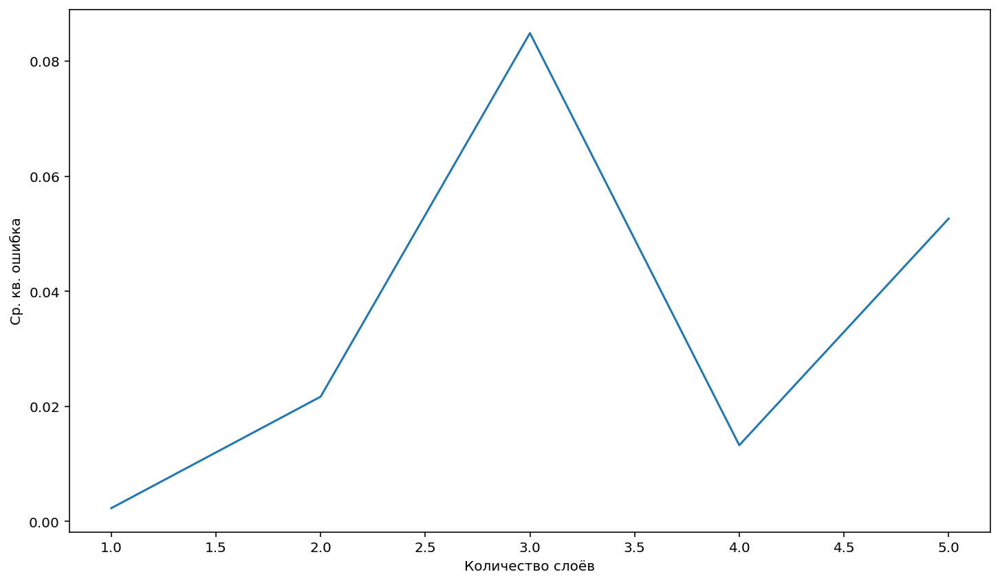

In [20]:
draw_exp(5)

In [21]:
experiment(35)

Epoch 1/100


 1/20 [>.............................] - ETA: 19s - loss: 0.6370

20/20 [==============================] - 1s 1ms/step - loss: 0.5914


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4473

20/20 [==============================] - 0s 1ms/step - loss: 0.4218


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4334

 3/20 [===>..........................] - ETA: 0s - loss: 0.4148

20/20 [==============================] - 0s 4ms/step - loss: 0.3875


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3071

 6/20 [========>.....................] - ETA: 0s - loss: 0.3435

20/20 [==============================] - 0s 4ms/step - loss: 0.3576


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3552

13/20 [==================>...........] - ETA: 0s - loss: 0.3523

20/20 [==============================] - 0s 4ms/step - loss: 0.3460


Epoch 6/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2646

12/20 [=================>............] - ETA: 0s - loss: 0.3145

20/20 [==============================] - 0s 4ms/step - loss: 0.3170


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3005

20/20 [==============================] - 0s 1ms/step - loss: 0.3076


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2376

20/20 [==============================] - 0s 1ms/step - loss: 0.2835


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2846

20/20 [==============================]

 - 0s 1ms/step - loss: 0.2738


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2182

 9/20 [============>.................] - ETA: 0s - loss: 0.2486

20/20 [==============================] - 0s 5ms/step - loss: 0.2526


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2376

 2/20 [==>...........................] - ETA: 1s - loss: 0.2699

20/20 [==============================] - 0s 5ms/step - loss: 0.2531


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2763

 6/20 [========>.....................] - ETA: 0s - loss: 0.2299

20/20 [==============================] - 0s 4ms/step - loss: 0.2265


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1607

10/20 [==============>...............] - ETA: 0s - loss: 0.2164

20/20 [==============================] - 0s 4ms/step - loss: 0.2236


Epoch 14/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2010

 9/20 [============>.................] - ETA: 0s - loss: 0.2073

20/20 [==============================] - 0s 4ms/step - loss: 0.2150


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2137

12/20 [=================>............] - ETA: 0s - loss: 0.2391

20/20 [==============================] - 0s 4ms/step - loss: 0.2270


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0974

 9/20 [============>.................] - ETA: 0s - loss: 0.1711

20/20 [==============================] - 0s 4ms/step - loss: 0.1922


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1555

 6/20 [========>.....................] - ETA: 0s - loss: 0.1958

20/20 [==============================] - 0s 4ms/step - loss: 0.2012


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2098

13/20 [==================>...........] - ETA: 0s - loss: 0.2031

20/20 [==============================] - 0s 4ms/step - loss: 0.1985


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1844

13/20 [==================>...........] - ETA: 0s - loss: 0.1953

20/20 [==============================] - 0s 4ms/step - loss: 0.1950


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1462

 2/20 [==>...........................] - ETA: 1s - loss: 0.1766

 3/20 [===>..........................] - ETA: 1s - loss: 0.1848

 9/20 [============>.................] - ETA: 0s - loss: 0.1949

17/20 [========================>.....] - ETA: 0s - loss: 0.1951

18/20 [==========================>...] - ETA: 0s - loss: 0.1948

20/20 [==============================] - 1s 26ms/step - loss: 0.1937


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1660

 3/20 [===>..........................] - ETA: 0s - loss: 0.1689

 9/20 [============>.................] - ETA: 0s - loss: 0.1685

18/20 [==========================>...] - ETA: 0s - loss: 0.1749

20/20 [==============================] - 0s 16ms/step - loss: 0.1762


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1759

11/20 [===============>..............] - ETA: 0s - loss: 0.1729

20/20 [==============================] - 0s 6ms/step - loss: 0.1733


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1606

20/20 [==============================] - 0s 2ms/step - loss: 0.1663


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1695

20/20 [==============================] - 0s 1ms/step - loss: 0.1697


Epoch 25/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1178

20/20 [==============================] - 0s 1ms/step - loss: 0.1654


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2673

 2/20 [==>...........................] - ETA: 0s - loss: 0.2547

20/20 [==============================] - 0s 4ms/step - loss: 0.1825


Epoch 27/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2237

 6/20 [========>.....................] - ETA: 0s - loss: 0.1903

20/20 [==============================] - 0s 4ms/step - loss: 0.1698


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1166

12/20 [=================>............] - ETA: 0s - loss: 0.1631

20/20 [==============================] - 0s 4ms/step - loss: 0.1619


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1606

14/20 [====================>.........] - ETA: 0s - loss: 0.1465

20/20 [==============================] - 0s 4ms/step - loss: 0.1497


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2396

17/20 [========================>.....] - ETA: 0s - loss: 0.1627

20/20 [==============================] - 0s 4ms/step - loss: 0.1605


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1435

20/20 [==============================] - 0s 1ms/step - loss: 0.1467


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1094

20/20 [==============================] - 0s 1ms/step - loss: 0.1427


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1620

20/20 [==============================] - 0s 1ms/step - loss: 0.1517


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1755

20/20 [==============================] - 0s 2ms/step - loss: 0.1621


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1002

 5/20 [======>.......................] - ETA: 0s - loss: 0.1274

20/20 [==============================] - 0s 4ms/step - loss: 0.1398


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2036

20/20 [==============================] - 0s 1ms/step - loss: 0.1492


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0653

20/20 [==============================] - 0s 1ms/step - loss: 0.1286


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1252

 9/20 [============>.................] - ETA: 0s - loss: 0.1467

20/20 [==============================] - 0s 4ms/step - loss: 0.1412


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0969

 6/20 [========>.....................] - ETA: 0s - loss: 0.1160

20/20 [==============================] - 0s 4ms/step - loss: 0.1253


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1101

 2/20 [==>...........................] - ETA: 0s - loss: 0.1077

13/20 [==================>...........] - ETA: 0s - loss: 0.1067

20/20 [==============================] - 0s 9ms/step - loss: 0.1129


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1400

 2/20 [==>...........................] - ETA: 1s - loss: 0.1396

 4/20 [=====>........................] - ETA: 1s - loss: 0.1354

 5/20 [======>.......................] - ETA: 1s - loss: 0.1343

 6/20 [========>.....................] - ETA: 1s - loss: 0.1324

19/20 [===========================>..] - ETA: 0s - loss: 0.1266

20/20 [==============================] - 1s 26ms/step - loss: 0.1260


Epoch 42/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0810

 3/20 [===>..........................] - ETA: 0s - loss: 0.0968

13/20 [==================>...........] - ETA: 0s - loss: 0.1032

18/20 [==========================>...] - ETA: 0s - loss: 0.1070

20/20 [==============================] - ETA: 0s - loss: 0.1081

20/20 [==============================] - 0s 20ms/step - loss: 0.1085


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2133

 5/20 [======>.......................] - ETA: 0s - loss: 0.1508

20/20 [==============================] - 0s 5ms/step - loss: 0.1236


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1374

20/20 [==============================] - 0s 1ms/step - loss: 0.1118


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0784

20/20 [==============================] - 0s 1ms/step - loss: 0.1036


Epoch 46/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1311

20/20 [==============================] - 0s 2ms/step - loss: 0.1128


Epoch 47/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1110

20/20 [==============================] - 0s 2ms/step - loss: 0.1020


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1084

20/20 [==============================] - ETA: 0s - loss: 0.1014

20/20 [==============================] - 0s 3ms/step - loss: 0.1013


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1022

18/20 [==========================>...] - ETA: 0s - loss: 0.0986

20/20 [==============================] - 0s 5ms/step - loss: 0.0981


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0750

11/20 [===============>..............] - ETA: 0s - loss: 0.1000

20/20 [==============================] - 0s 4ms/step - loss: 0.0974


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0680

12/20 [=================>............] - ETA: 0s - loss: 0.0842

20/20 [==============================] - 0s 4ms/step - loss: 0.0879


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0627

12/20 [=================>............] - ETA: 0s - loss: 0.0882

20/20 [==============================] - 0s 4ms/step - loss: 0.0879


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0544

 5/20 [======>.......................] - ETA: 0s - loss: 0.0831

20/20 [==============================] - 0s 5ms/step - loss: 0.0863


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1168

 5/20 [======>.......................] - ETA: 0s - loss: 0.1018

20/20 [==============================] - 0s 4ms/step - loss: 0.0865


Epoch 55/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0611

 5/20 [======>.......................] - ETA: 0s - loss: 0.0667

 6/20 [========>.....................] - ETA: 0s - loss: 0.0679

 7/20 [=========>....................] - ETA: 0s - loss: 0.0695

11/20 [===============>..............] - ETA: 0s - loss: 0.0743

12/20 [=================>............] - ETA: 0s - loss: 0.0748

20/20 [==============================] - 1s 27ms/step - loss: 0.0760


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0457

 4/20 [=====>........................] - ETA: 0s - loss: 0.0591

12/20 [=================>............] - ETA: 0s - loss: 0.0676

15/20 [=====================>........] - ETA: 0s - loss: 0.0686

20/20 [==============================] - 0s 21ms/step - loss: 0.0699


Epoch 57/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0552

20/20 [==============================] - 0s 2ms/step - loss: 0.0755


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0961

16/20 [=======================>......] - ETA: 0s - loss: 0.0675

20/20 [==============================] - 0s 5ms/step - loss: 0.0680


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0764

10/20 [==============>...............] - ETA: 0s - loss: 0.0611

20/20 [==============================] - 0s 4ms/step - loss: 0.0648


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0543

 3/20 [===>..........................] - ETA: 0s - loss: 0.0680

11/20 [===============>..............] - ETA: 0s - loss: 0.0701

20/20 [==============================] - 0s 11ms/step - loss: 0.0678


Epoch 61/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0086

10/20 [==============>...............] - ETA: 0s - loss: 0.0453

20/20 [==============================] - 0s 6ms/step - loss: 0.0530


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0596

 2/20 [==>...........................] - ETA: 1s - loss: 0.0714

 3/20 [===>..........................] - ETA: 1s - loss: 0.0713

 7/20 [=========>....................] - ETA: 0s - loss: 0.0686

20/20 [==============================] - 0s 22ms/step - loss: 0.0628


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0310

17/20 [========================>.....] - ETA: 0s - loss: 0.0582

20/20 [==============================] - 0s 5ms/step - loss: 0.0586


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0812

 2/20 [==>...........................] - ETA: 1s - loss: 0.0707

20/20 [==============================] - 0s 5ms/step - loss: 0.0593


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0452

11/20 [===============>..............] - ETA: 0s - loss: 0.0529

18/20 [==========================>...] - ETA: 0s - loss: 0.0543

19/20 [===========================>..] - ETA: 0s - loss: 0.0543

20/20 [==============================] - 0s 15ms/step - loss: 0.0542


Epoch 66/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0526

13/20 [==================>...........] - ETA: 0s - loss: 0.0558

14/20 [====================>.........] - ETA: 0s - loss: 0.0559

20/20 [==============================] - 0s 11ms/step - loss: 0.0551


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0362

 2/20 [==>...........................] - ETA: 1s - loss: 0.0445

 4/20 [=====>........................] - ETA: 0s - loss: 0.0498

13/20 [==================>...........] - ETA: 0s - loss: 0.0465

14/20 [====================>.........] - ETA: 0s - loss: 0.0465

20/20 [==============================] - 0s 21ms/step - loss: 0.0466


Epoch 68/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0343

 5/20 [======>.......................] - ETA: 0s - loss: 0.0396

17/20 [========================>.....] - ETA: 0s - loss: 0.0442

20/20 [==============================] - 0s 9ms/step - loss: 0.0445


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0212

 6/20 [========>.....................] - ETA: 0s - loss: 0.0283

19/20 [===========================>..] - ETA: 0s - loss: 0.0382

20/20 [==============================] - 0s 9ms/step - loss: 0.0388


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0406

 6/20 [========>.....................] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 6ms/step - loss: 0.0383


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

13/20 [==================>...........] - ETA: 0s - loss: 0.0413

20/20 [==============================] - 0s 6ms/step - loss: 0.0414


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0381

 3/20 [===>..........................] - ETA: 0s - loss: 0.0382

20/20 [==============================] - 0s 5ms/step - loss: 0.0393


Epoch 73/100


 1/20 [>.............................] - ETA: 7s - loss: 0.0582

 8/20 [===========>..................] - ETA: 0s - loss: 0.0404

20/20 [==============================] - 1s 6ms/step - loss: 0.0402


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0379

 2/20 [==>...........................] - ETA: 1s - loss: 0.0382

20/20 [==============================] - ETA: 0s - loss: 0.0384

20/20 [==============================]

 - 0s 9ms/step - loss: 0.0384


Epoch 75/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0255

12/20 [=================>............] - ETA: 0s - loss: 0.0317

20/20 [==============================] - 0s 6ms/step - loss: 0.0332


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0349

10/20 [==============>...............] - ETA: 0s - loss: 0.0340

20/20 [==============================] - 0s 4ms/step - loss: 0.0334


Epoch 77/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0171

14/20 [====================>.........] - ETA: 0s - loss: 0.0268

20/20 [==============================] - 0s 5ms/step - loss: 0.0287


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0459

 7/20 [=========>....................] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 5ms/step - loss: 0.0311


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0410

20/20 [==============================] - ETA: 0s - loss: 0.0290

20/20 [==============================] - 0s 3ms/step - loss: 0.0290


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 2ms/step - loss: 0.0273


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0185



20/20 [==============================] - 0s 2ms/step - loss: 0.0245


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0349

11/20 [===============>..............] - ETA: 0s - loss: 0.0269

20/20 [==============================] - 0s 5ms/step - loss: 0.0263


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0368

 5/20 [======>.......................] - ETA: 0s - loss: 0.0310

20/20 [==============================] - 0s 4ms/step - loss: 0.0267


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0278

 7/20 [=========>....................] - ETA: 0s - loss: 0.0235

19/20 [===========================>..] - ETA: 0s - loss: 0.0227

20/20 [==============================] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 21ms/step - loss: 0.0228


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0252

 6/20 [========>.....................] - ETA: 0s - loss: 0.0242

18/20 [==========================>...] - ETA: 0s - loss: 0.0231

19/20 [===========================>..] - ETA: 0s - loss: 0.0230

20/20 [==============================] - 0s 16ms/step - loss: 0.0229


Epoch 86/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0224

15/20 [=====================>........] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 0s 5ms/step - loss: 0.0207


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0250

 8/20 [===========>..................] - ETA: 0s - loss: 0.0230

20/20 [==============================] - 0s 5ms/step - loss: 0.0219


Epoch 88/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0295

20/20 [==============================] - 0s 2ms/step - loss: 0.0222


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

 9/20 [============>.................] - ETA: 0s - loss: 0.0240

20/20 [==============================] - 0s 4ms/step - loss: 0.0220


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0187

 7/20 [=========>....................] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 5ms/step - loss: 0.0173


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0247

20/20 [==============================] - 0s 3ms/step - loss: 0.0177


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

14/20 [====================>.........] - ETA: 0s - loss: 0.0159

20/20 [==============================] - 0s 5ms/step - loss: 0.0162


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0201

10/20 [==============>...............] - ETA: 0s - loss: 0.0189

20/20 [==============================] - 0s 4ms/step - loss: 0.0176


Epoch 94/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0167

 3/20 [===>..........................] - ETA: 0s - loss: 0.0167

 4/20 [=====>........................] - ETA: 1s - loss: 0.0168

 8/20 [===========>..................] - ETA: 0s - loss: 0.0160

20/20 [==============================] - ETA: 0s - loss: 0.0162

20/20 [==============================] - 1s 26ms/step - loss: 0.0162


Epoch 95/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0070

 9/20 [============>.................] - ETA: 0s - loss: 0.0114

14/20 [====================>.........] - ETA: 0s - loss: 0.0121

20/20 [==============================] - ETA: 0s - loss: 0.0128

20/20 [==============================] - 0s 15ms/step - loss: 0.0128


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 0s 2ms/step - loss: 0.0153


Epoch 97/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 2ms/step - loss: 0.0131


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0176

13/20 [==================>...........] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 4ms/step - loss: 0.0133


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0073

 6/20 [========>.....................] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 5ms/step - loss: 0.0129


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0139

20/20 [==============================] - 0s 2ms/step - loss: 0.0128


Epoch 1/100


 1/20 [>.............................] - ETA: 7s - loss: 0.4584

13/20 [==================>...........] - ETA: 0s - loss: 0.4783

18/20 [==========================>...] - ETA: 0s - loss: 0.4698

19/20 [===========================>..] - ETA: 0s - loss: 0.4684

20/20 [==============================] - ETA: 0s - loss: 0.4670

20/20 [==============================] - 1s 26ms/step - loss: 0.4658


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3819

 3/20 [===>..........................] - ETA: 0s - loss: 0.3622

 4/20 [=====>........................] - ETA: 0s - loss: 0.3571

 6/20 [========>.....................] - ETA: 0s - loss: 0.3501

11/20 [===============>..............] - ETA: 0s - loss: 0.3523

20/20 [==============================] - 0s 21ms/step - loss: 0.3616


Epoch 3/100


 1/20 [>.............................] - ETA: 1s - loss: 0.3530

20/20 [==============================] - 0s 1ms/step - loss: 0.3461


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2613

 7/20 [=========>....................] - ETA: 0s - loss: 0.3038

20/20 [==============================] - 0s 5ms/step - loss: 0.3191


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3358

17/20 [========================>.....] - ETA: 0s - loss: 0.3123

20/20 [==============================] - 0s 7ms/step - loss: 0.3113


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3154

 8/20 [===========>..................] - ETA: 0s - loss: 0.3160

20/20 [==============================] - 0s 5ms/step - loss: 0.3023


Epoch 7/100


 1/20 [>.............................] - ETA: 5s - loss: 0.2118

 2/20 [==>...........................] - ETA: 1s - loss: 0.2323

17/20 [========================>.....] - ETA: 0s - loss: 0.2625

20/20 [==============================] - 1s 12ms/step - loss: 0.2654


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2357

 4/20 [=====>........................] - ETA: 0s - loss: 0.2732

12/20 [=================>............] - ETA: 0s - loss: 0.2843

20/20 [==============================] - ETA: 0s - loss: 0.2775

20/20 [==============================] - 0s 14ms/step - loss: 0.2769


Epoch 9/100


 1/20 [>.............................] - ETA: 2s - loss: 0.3454

 4/20 [=====>........................] - ETA: 0s - loss: 0.2888

14/20 [====================>.........] - ETA: 0s - loss: 0.2585

15/20 [=====================>........] - ETA: 0s - loss: 0.2578

19/20 [===========================>..] - ETA: 0s - loss: 0.2563

20/20 [==============================] - 0s 14ms/step - loss: 0.2558


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3860

 3/20 [===>..........................] - ETA: 0s - loss: 0.3239

14/20 [====================>.........] - ETA: 0s - loss: 0.2727

19/20 [===========================>..] - ETA: 0s - loss: 0.2652

20/20 [==============================] - 0s 9ms/step - loss: 0.2627


Epoch 11/100


 1/20 [>.............................] - ETA: 4s - loss: 0.2920

 2/20 [==>...........................] - ETA: 3s - loss: 0.2774

 4/20 [=====>........................] - ETA: 1s - loss: 0.2659

13/20 [==================>...........] - ETA: 0s - loss: 0.2516

19/20 [===========================>..] - ETA: 0s - loss: 0.2459

20/20 [==============================] - 1s 26ms/step - loss: 0.2440


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2532

 2/20 [==>...........................] - ETA: 1s - loss: 0.2439

15/20 [=====================>........] - ETA: 0s - loss: 0.2245

20/20 [==============================] - 0s 10ms/step - loss: 0.2215


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2622

 6/20 [========>.....................] - ETA: 0s - loss: 0.2178

20/20 [==============================] - 0s 5ms/step - loss: 0.2048


Epoch 14/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1895

20/20 [==============================] - 0s 1ms/step - loss: 0.1864


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0881

20/20 [==============================] - 0s 2ms/step - loss: 0.1697


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1381

 2/20 [==>...........................] - ETA: 1s - loss: 0.1502

 7/20 [=========>....................] - ETA: 0s - loss: 0.1618

14/20 [====================>.........] - ETA: 0s - loss: 0.1646

20/20 [==============================] - 0s 16ms/step - loss: 0.1662


Epoch 17/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1836

12/20 [=================>............] - ETA: 0s - loss: 0.1608

20/20 [==============================] - ETA: 0s - loss: 0.1613

20/20 [==============================] - 0s 11ms/step - loss: 0.1612


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2499

 7/20 [=========>....................] - ETA: 0s - loss: 0.2024

10/20 [==============>...............] - ETA: 0s - loss: 0.1909

13/20 [==================>...........] - ETA: 0s - loss: 0.1814

20/20 [==============================] - 0s 16ms/step - loss: 0.1705


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1603

 5/20 [======>.......................] - ETA: 0s - loss: 0.1523

20/20 [==============================] - 0s 5ms/step - loss: 0.1455


Epoch 20/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0969

 9/20 [============>.................] - ETA: 0s - loss: 0.1292

19/20 [===========================>..] - ETA: 0s - loss: 0.1334

20/20 [==============================] - 0s 11ms/step - loss: 0.1338


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1308

 7/20 [=========>....................] - ETA: 0s - loss: 0.1222

16/20 [=======================>......] - ETA: 0s - loss: 0.1208

20/20 [==============================] - 0s 10ms/step - loss: 0.1235


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1227

 7/20 [=========>....................] - ETA: 0s - loss: 0.1512

 8/20 [===========>..................] - ETA: 0s - loss: 0.1495

17/20 [========================>.....] - ETA: 0s - loss: 0.1396

20/20 [==============================] - 0s 15ms/step - loss: 0.1372


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

 3/20 [===>..........................] - ETA: 0s - loss: 0.0796

20/20 [==============================] - 0s 5ms/step - loss: 0.1155


Epoch 24/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0898

20/20 [==============================] - 0s 1ms/step - loss: 0.1119


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1483

 9/20 [============>.................] - ETA: 0s - loss: 0.1179

10/20 [==============>...............] - ETA: 0s - loss: 0.1170

14/20 [====================>.........] - ETA: 0s - loss: 0.1143

15/20 [=====================>........] - ETA: 0s - loss: 0.1136

20/20 [==============================] - 1s 32ms/step - loss: 0.1141


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0248

 3/20 [===>..........................] - ETA: 0s - loss: 0.0735

 7/20 [=========>....................] - ETA: 0s - loss: 0.0889

14/20 [====================>.........] - ETA: 0s - loss: 0.1001

20/20 [==============================] - 0s 15ms/step - loss: 0.1045


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0655

 5/20 [======>.......................] - ETA: 0s - loss: 0.0797

20/20 [==============================] - 0s 5ms/step - loss: 0.0987


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1266

 2/20 [==>...........................] - ETA: 7s - loss: 0.1210

 9/20 [============>.................] - ETA: 0s - loss: 0.1205

13/20 [==================>...........] - ETA: 0s - loss: 0.1183

17/20 [========================>.....] - ETA: 0s - loss: 0.1170

20/20 [==============================] - 1s 36ms/step - loss: 0.1154


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1294

 6/20 [========>.....................] - ETA: 0s - loss: 0.1027

17/20 [========================>.....] - ETA: 0s - loss: 0.1025

20/20 [==============================] - 0s 10ms/step - loss: 0.1031


Epoch 30/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0781

20/20 [==============================] - 0s 2ms/step - loss: 0.1023


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1545

12/20 [=================>............] - ETA: 0s - loss: 0.1106

20/20 [==============================] - 0s 5ms/step - loss: 0.1059


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0606

 6/20 [========>.....................] - ETA: 0s - loss: 0.0999

20/20 [==============================] - 0s 5ms/step - loss: 0.1033


Epoch 33/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0885

 2/20 [==>...........................] - ETA: 1s - loss: 0.0946

 4/20 [=====>........................] - ETA: 1s - loss: 0.0959

15/20 [=====================>........] - ETA: 0s - loss: 0.0985

20/20 [==============================] - 0s 16ms/step - loss: 0.0982


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1091

 5/20 [======>.......................] - ETA: 0s - loss: 0.1150

13/20 [==================>...........] - ETA: 0s - loss: 0.1019

19/20 [===========================>..] - ETA: 0s - loss: 0.1006

20/20 [==============================] - 0s 15ms/step - loss: 0.1004


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0409

 2/20 [==>...........................] - ETA: 1s - loss: 0.0564

 8/20 [===========>..................] - ETA: 0s - loss: 0.0814

20/20 [==============================] - 0s 11ms/step - loss: 0.0906


Epoch 36/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1065

19/20 [===========================>..] - ETA: 0s - loss: 0.0993

20/20 [==============================] - 0s 5ms/step - loss: 0.0991


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1807

 7/20 [=========>....................] - ETA: 0s - loss: 0.1174

20/20 [==============================] - 0s 5ms/step - loss: 0.1076


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1079

 2/20 [==>...........................] - ETA: 1s - loss: 0.1227

20/20 [==============================] - 0s 5ms/step - loss: 0.1077


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1197

 2/20 [==>...........................] - ETA: 1s - loss: 0.1075

20/20 [==============================] - 0s 4ms/step - loss: 0.0980


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1100

11/20 [===============>..............] - ETA: 0s - loss: 0.1071

18/20 [==========================>...] - ETA: 0s - loss: 0.1034

19/20 [===========================>..] - ETA: 0s - loss: 0.1029

20/20 [==============================] - 1s 27ms/step - loss: 0.1021


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1125

 4/20 [=====>........................] - ETA: 0s - loss: 0.1328

15/20 [=====================>........] - ETA: 0s - loss: 0.1173

20/20 [==============================] - 0s 10ms/step - loss: 0.1107


Epoch 42/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0457

 2/20 [==>...........................] - ETA: 1s - loss: 0.0487

 4/20 [=====>........................] - ETA: 1s - loss: 0.0629

20/20 [==============================] - 0s 12ms/step - loss: 0.0855


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1744

18/20 [==========================>...] - ETA: 0s - loss: 0.1020

20/20 [==============================] - 0s 5ms/step - loss: 0.1005


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0905

 9/20 [============>.................] - ETA: 0s - loss: 0.0833

20/20 [==============================] - 0s 5ms/step - loss: 0.0880


Epoch 45/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0390

20/20 [==============================] - 0s 1ms/step - loss: 0.0831


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1103

17/20 [========================>.....] - ETA: 0s - loss: 0.0847

20/20 [==============================] - 0s 5ms/step - loss: 0.0852


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0624

 9/20 [============>.................] - ETA: 0s - loss: 0.0727

20/20 [==============================] - 0s 5ms/step - loss: 0.0827


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0880

 2/20 [==>...........................] - ETA: 1s - loss: 0.1030

20/20 [==============================] - 0s 5ms/step - loss: 0.1037


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1404



20/20 [==============================] - 0s 2ms/step - loss: 0.1017


Epoch 50/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1454

 8/20 [===========>..................] - ETA: 0s - loss: 0.1034

 9/20 [============>.................] - ETA: 0s - loss: 0.1022

11/20 [===============>..............] - ETA: 0s - loss: 0.1014

20/20 [==============================] - 1s 17ms/step - loss: 0.0961


Epoch 51/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0441

 5/20 [======>.......................] - ETA: 0s - loss: 0.0794

 8/20 [===========>..................] - ETA: 0s - loss: 0.0775

10/20 [==============>...............] - ETA: 0s - loss: 0.0768

14/20 [====================>.........] - ETA: 0s - loss: 0.0782

20/20 [==============================] - 1s 22ms/step - loss: 0.0814


Epoch 52/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0930

20/20 [==============================] - 0s 2ms/step - loss: 0.0852


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0549

15/20 [=====================>........] - ETA: 0s - loss: 0.0917

20/20 [==============================] - 0s 5ms/step - loss: 0.0905


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1179

 3/20 [===>..........................] - ETA: 0s - loss: 0.0948

20/20 [==============================] - 0s 5ms/step - loss: 0.0888


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0877

20/20 [==============================] - 0s 2ms/step - loss: 0.0858


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0651

17/20 [========================>.....] - ETA: 0s - loss: 0.0876

20/20 [==============================] - 0s 5ms/step - loss: 0.0881


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0256

 4/20 [=====>........................] - ETA: 0s - loss: 0.0711

20/20 [==============================] - 0s 5ms/step - loss: 0.0861


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0663

 7/20 [=========>....................] - ETA: 0s - loss: 0.0763

10/20 [==============>...............] - ETA: 0s - loss: 0.0782

11/20 [===============>..............] - ETA: 0s - loss: 0.0795

17/20 [========================>.....] - ETA: 0s - loss: 0.0824

20/20 [==============================] - 1s 28ms/step - loss: 0.0837


Epoch 59/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1484

20/20 [==============================] - ETA: 0s - loss: 0.0952

20/20 [==============================] - 0s 5ms/step - loss: 0.0949


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1623

 2/20 [==>...........................] - ETA: 1s - loss: 0.1402

 3/20 [===>..........................] - ETA: 1s - loss: 0.1265

20/20 [==============================] - 0s 11ms/step - loss: 0.0911


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1055

14/20 [====================>.........] - ETA: 0s - loss: 0.1029

20/20 [==============================] - 0s 5ms/step - loss: 0.0984


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0772

 3/20 [===>..........................] - ETA: 0s - loss: 0.0850

20/20 [==============================] - 0s 6ms/step - loss: 0.0938


Epoch 63/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0870

13/20 [==================>...........] - ETA: 0s - loss: 0.0796

20/20 [==============================] - 0s 5ms/step - loss: 0.0835


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0408

 3/20 [===>..........................] - ETA: 0s - loss: 0.0566

20/20 [==============================] - 0s 5ms/step - loss: 0.0735


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1286

16/20 [=======================>......] - ETA: 0s - loss: 0.1007

20/20 [==============================] - 0s 5ms/step - loss: 0.0975


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1035

 3/20 [===>..........................] - ETA: 0s - loss: 0.0837



20/20 [==============================] - 0s 5ms/step - loss: 0.0893


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0451

 2/20 [==>...........................] - ETA: 1s - loss: 0.0680

 3/20 [===>..........................] - ETA: 1s - loss: 0.0754

 7/20 [=========>....................] - ETA: 0s - loss: 0.0773

12/20 [=================>............] - ETA: 0s - loss: 0.0794

20/20 [==============================] - 0s 21ms/step - loss: 0.0824


Epoch 68/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1062

 9/20 [============>.................] - ETA: 0s - loss: 0.0854

18/20 [==========================>...] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 12ms/step - loss: 0.0888


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0478

 4/20 [=====>........................] - ETA: 0s - loss: 0.0559

20/20 [==============================] - 0s 6ms/step - loss: 0.0788


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0622

10/20 [==============>...............] - ETA: 0s - loss: 0.0768

20/20 [==============================] - 0s 5ms/step - loss: 0.0787


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0729

20/20 [==============================] - 0s 1ms/step - loss: 0.0887


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0501

20/20 [==============================] - 0s 1ms/step - loss: 0.0727


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

11/20 [===============>..............] - ETA: 0s - loss: 0.0693

20/20 [==============================] - 0s 5ms/step - loss: 0.0773


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0454

 3/20 [===>..........................] - ETA: 0s - loss: 0.0423

20/20 [==============================] - 0s 5ms/step - loss: 0.0771


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482



20/20 [==============================] - 0s 1ms/step - loss: 0.0778


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1304

19/20 [===========================>..] - ETA: 0s - loss: 0.1036

20/20 [==============================] - 0s 5ms/step - loss: 0.1021


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0295

 2/20 [==>...........................] - ETA: 1s - loss: 0.0436

 3/20 [===>..........................] - ETA: 2s - loss: 0.0548

 4/20 [=====>........................] - ETA: 2s - loss: 0.0639

20/20 [==============================] - 1s 27ms/step - loss: 0.0762


Epoch 78/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0816

 4/20 [=====>........................] - ETA: 0s - loss: 0.0831

 7/20 [=========>....................] - ETA: 0s - loss: 0.0784

17/20 [========================>.....] - ETA: 0s - loss: 0.0823

20/20 [==============================] - ETA: 0s - loss: 0.0832

20/20 [==============================] - 0s 21ms/step - loss: 0.0834


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0948

14/20 [====================>.........] - ETA: 0s - loss: 0.0884

20/20 [==============================] - 0s 5ms/step - loss: 0.0873


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0496

10/20 [==============>...............] - ETA: 0s - loss: 0.0704

20/20 [==============================] - 0s 5ms/step - loss: 0.0789


Epoch 81/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0219

20/20 [==============================] - 0s 1ms/step - loss: 0.0935


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 1ms/step - loss: 0.0714


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

13/20 [==================>...........] - ETA: 0s - loss: 0.0809

20/20 [==============================] - 0s 5ms/step - loss: 0.0848


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0768

 7/20 [=========>....................] - ETA: 0s - loss: 0.0807

20/20 [==============================] - 0s 4ms/step - loss: 0.0808


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1117

 3/20 [===>..........................] - ETA: 0s - loss: 0.1243

20/20 [==============================] - 0s 5ms/step - loss: 0.1049


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1208

 3/20 [===>..........................] - ETA: 0s - loss: 0.1058

 5/20 [======>.......................] - ETA: 1s - loss: 0.0984

 6/20 [========>.....................] - ETA: 1s - loss: 0.0962

17/20 [========================>.....] - ETA: 0s - loss: 0.0857

20/20 [==============================] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 1s 31ms/step - loss: 0.0858


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0314

 4/20 [=====>........................] - ETA: 0s - loss: 0.0627

15/20 [=====================>........] - ETA: 0s - loss: 0.0718

20/20 [==============================] - 0s 11ms/step - loss: 0.0746


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1031

 7/20 [=========>....................] - ETA: 0s - loss: 0.1052

20/20 [==============================] - 0s 5ms/step - loss: 0.0944


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2252

20/20 [==============================] - 0s 1ms/step - loss: 0.1025


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0218

20/20 [==============================] - 0s 1ms/step - loss: 0.0776


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1049

20/20 [==============================] - 0s 1ms/step - loss: 0.0823


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1040

19/20 [===========================>..] - ETA: 0s - loss: 0.0843

20/20 [==============================] - 0s 5ms/step - loss: 0.0845


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1072

13/20 [==================>...........] - ETA: 0s - loss: 0.0939

20/20 [==============================] - 0s 4ms/step - loss: 0.0901


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0590

 4/20 [=====>........................] - ETA: 0s - loss: 0.0672

20/20 [==============================] - 0s 5ms/step - loss: 0.0821


Epoch 95/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0367

 9/20 [============>.................] - ETA: 0s - loss: 0.0642

20/20 [==============================] - 0s 6ms/step - loss: 0.0744


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0874

 2/20 [==>...........................] - ETA: 4s - loss: 0.0702

 9/20 [============>.................] - ETA: 0s - loss: 0.0730

16/20 [=======================>......] - ETA: 0s - loss: 0.0779

20/20 [==============================] - 0s 25ms/step - loss: 0.0800


Epoch 97/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0883

 2/20 [==>...........................] - ETA: 1s - loss: 0.0743

 5/20 [======>.......................] - ETA: 0s - loss: 0.0791

20/20 [==============================] - 0s 11ms/step - loss: 0.0802


Epoch 98/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1331

20/20 [==============================] - 0s 1ms/step - loss: 0.0965


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0287

16/20 [=======================>......] - ETA: 0s - loss: 0.0840

20/20 [==============================] - 0s 5ms/step - loss: 0.0848


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0520

 7/20 [=========>....................] - ETA: 0s - loss: 0.0767

20/20 [==============================] - 0s 4ms/step - loss: 0.0793


Epoch 1/100


 1/20 [>.............................] - ETA: 8s - loss: 0.4168

20/20 [==============================] - 0s 1ms/step - loss: 0.4634


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3704

20/20 [==============================] - 0s 1ms/step - loss: 0.4205


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4524

20/20 [==============================] - 0s 3ms/step - loss: 0.3884


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3462

 2/20 [==>...........................] - ETA: 1s - loss: 0.3589

20/20 [==============================] - 0s 4ms/step - loss: 0.3625


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3401

20/20 [==============================] - 0s 1ms/step - loss: 0.3277


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3775

20/20 [==============================] - 0s 2ms/step - loss: 0.3330


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1961

20/20 [==============================] - 0s 1ms/step - loss: 0.2820


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1834

11/20 [===============>..............] - ETA: 0s - loss: 0.2353

20/20 [==============================] - 0s 3ms/step - loss: 0.2477


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3037

18/20 [==========================>...] - ETA: 0s - loss: 0.2567

20/20 [==============================] - 0s 4ms/step - loss: 0.2555


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2489

20/20 [==============================] - 0s 1ms/step - loss: 0.2373


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2877

20/20 [==============================] - 0s 2ms/step - loss: 0.2162


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2415

18/20 [==========================>...] - ETA: 0s - loss: 0.2046

20/20 [==============================] - 0s 3ms/step - loss: 0.2033


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3196

20/20 [==============================] - 0s 1ms/step - loss: 0.2097


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2418

13/20 [==================>...........] - ETA: 0s - loss: 0.1907

20/20 [==============================] - 0s 4ms/step - loss: 0.1835


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1692

20/20 [==============================] - 0s 1ms/step - loss: 0.1489


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0885

20/20 [==============================] - 0s 1ms/step - loss: 0.1561


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1041

19/20 [===========================>..] - ETA: 0s - loss: 0.1473

20/20 [==============================] - 0s 3ms/step - loss: 0.1474


Epoch 18/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0740

20/20 [==============================] - 0s 1ms/step - loss: 0.1288


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0970

20/20 [==============================] - 0s 1ms/step - loss: 0.1346


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1360

14/20 [====================>.........] - ETA: 0s - loss: 0.1514

20/20 [==============================] - 0s 3ms/step - loss: 0.1454


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1374

20/20 [==============================] - 0s 1ms/step - loss: 0.1303


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0853

20/20 [==============================] - 0s 1ms/step - loss: 0.1114


Epoch 23/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2217

13/20 [==================>...........] - ETA: 0s - loss: 0.1556

20/20 [==============================] - 0s 3ms/step - loss: 0.1459


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0784

20/20 [==============================] - 0s 1ms/step - loss: 0.1246


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1354

 5/20 [======>.......................] - ETA: 0s - loss: 0.1123

14/20 [====================>.........] - ETA: 0s - loss: 0.1104

20/20 [==============================] - 0s 10ms/step - loss: 0.1120


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0906

 7/20 [=========>....................] - ETA: 0s - loss: 0.0984

 8/20 [===========>..................] - ETA: 0s - loss: 0.1000

18/20 [==========================>...] - ETA: 0s - loss: 0.1113

19/20 [===========================>..] - ETA: 0s - loss: 0.1115

20/20 [==============================] - 0s 22ms/step - loss: 0.1117


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1717

 4/20 [=====>........................] - ETA: 0s - loss: 0.1461

 8/20 [===========>..................] - ETA: 0s - loss: 0.1386

18/20 [==========================>...] - ETA: 0s - loss: 0.1287

20/20 [==============================] - 0s 15ms/step - loss: 0.1261


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1166

20/20 [==============================] - 0s 2ms/step - loss: 0.1135


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1555

20/20 [==============================] - 0s 1ms/step - loss: 0.1254


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0613

15/20 [=====================>........] - ETA: 0s - loss: 0.0929

20/20 [==============================] - 0s 3ms/step - loss: 0.0955


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0968

20/20 [==============================] - 0s 1ms/step - loss: 0.0983


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1198

20/20 [==============================] - 0s 2ms/step - loss: 0.1075


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0337

20/20 [==============================] - 0s 2ms/step - loss: 0.0921


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0762

20/20 [==============================] - 0s 1ms/step - loss: 0.0738


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2230

20/20 [==============================] - 0s 1ms/step - loss: 0.0952


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1009

16/20 [=======================>......] - ETA: 0s - loss: 0.0863

20/20 [==============================] - 0s 3ms/step - loss: 0.0833


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0241

20/20 [==============================] - 0s 1ms/step - loss: 0.0594


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 1ms/step - loss: 0.0615


Epoch 39/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0369

12/20 [=================>............] - ETA: 0s - loss: 0.0650

20/20 [==============================] - 0s 4ms/step - loss: 0.0651


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 1ms/step - loss: 0.0724


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1276

20/20 [==============================] - 0s 1ms/step - loss: 0.0684


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1238

12/20 [=================>............] - ETA: 0s - loss: 0.0761

20/20 [==============================] - 0s 3ms/step - loss: 0.0725


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0329

20/20 [==============================] - 0s 1ms/step - loss: 0.0595


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0607

16/20 [=======================>......] - ETA: 0s - loss: 0.0624

20/20 [==============================] - 0s 3ms/step - loss: 0.0629


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0229

19/20 [===========================>..] - ETA: 0s - loss: 0.0589

20/20 [==============================] - 0s 3ms/step - loss: 0.0592


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0550

20/20 [==============================] - 0s 1ms/step - loss: 0.0650


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0144

16/20 [=======================>......] - ETA: 0s - loss: 0.0409

20/20 [==============================] - 0s 3ms/step - loss: 0.0453


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0571

20/20 [==============================] - 0s 1ms/step - loss: 0.0535


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 1ms/step - loss: 0.0464


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0702

16/20 [=======================>......] - ETA: 0s - loss: 0.0633

20/20 [==============================] - 0s 3ms/step - loss: 0.0617


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0990

20/20 [==============================] - 0s 1ms/step - loss: 0.0542


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0516

20/20 [==============================] - 0s 1ms/step - loss: 0.0531


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0226

16/20 [=======================>......] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 3ms/step - loss: 0.0557


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 1ms/step - loss: 0.0494


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0585

13/20 [==================>...........] - ETA: 0s - loss: 0.0441

20/20 [==============================] - 0s 3ms/step - loss: 0.0460


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

19/20 [===========================>..] - ETA: 0s - loss: 0.0496

20/20 [==============================] - 0s 3ms/step - loss: 0.0496


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1089

20/20 [==============================] - 0s 1ms/step - loss: 0.0619


Epoch 58/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0383

16/20 [=======================>......] - ETA: 0s - loss: 0.0504

20/20 [==============================] - 0s 3ms/step - loss: 0.0500


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0628

 9/20 [============>.................] - ETA: 0s - loss: 0.0563

20/20 [==============================] - 0s 4ms/step - loss: 0.0509


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 1ms/step - loss: 0.0401


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0152

20/20 [==============================] - 0s 1ms/step - loss: 0.0376


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0392

18/20 [==========================>...] - ETA: 0s - loss: 0.0433

20/20 [==============================] - 0s 3ms/step - loss: 0.0433


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 1ms/step - loss: 0.0394


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1344

16/20 [=======================>......] - ETA: 0s - loss: 0.0502

20/20 [==============================] - 0s 3ms/step - loss: 0.0479


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

20/20 [==============================] - 0s 1ms/step - loss: 0.0371


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 0s 1ms/step - loss: 0.0383


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

13/20 [==================>...........] - ETA: 0s - loss: 0.0263

20/20 [==============================] - 0s 3ms/step - loss: 0.0309


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0712

20/20 [==============================] - 0s 1ms/step - loss: 0.0434


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 1ms/step - loss: 0.0394


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1532

17/20 [========================>.....] - ETA: 0s - loss: 0.0542

20/20 [==============================] - 0s 3ms/step - loss: 0.0507


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0410

20/20 [==============================] - 0s 1ms/step - loss: 0.0323


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0223

14/20 [====================>.........] - ETA: 0s - loss: 0.0308

20/20 [==============================] - 0s 3ms/step - loss: 0.0321


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0271

20/20 [==============================] - 0s 1ms/step - loss: 0.0357


Epoch 74/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0313

20/20 [==============================] - 0s 1ms/step - loss: 0.0359


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0467

14/20 [====================>.........] - ETA: 0s - loss: 0.0349

20/20 [==============================] - 0s 3ms/step - loss: 0.0339


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0498

20/20 [==============================] - 0s 1ms/step - loss: 0.0333


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0215

20/20 [==============================] - 0s 1ms/step - loss: 0.0288


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

19/20 [===========================>..] - ETA: 0s - loss: 0.0171

20/20 [==============================] - 0s 3ms/step - loss: 0.0182


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0547

20/20 [==============================] - 0s 1ms/step - loss: 0.0336


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0190

14/20 [====================>.........] - ETA: 0s - loss: 0.0291

20/20 [==============================] - 0s 3ms/step - loss: 0.0286


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 1ms/step - loss: 0.0221


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0399

20/20 [==============================] - 0s 2ms/step - loss: 0.0298


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0054

17/20 [========================>.....] - ETA: 0s - loss: 0.0227

20/20 [==============================] - 0s 3ms/step - loss: 0.0233


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0318

20/20 [==============================] - 0s 1ms/step - loss: 0.0276


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0274

20/20 [==============================] - 0s 1ms/step - loss: 0.0242


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

17/20 [========================>.....] - ETA: 0s - loss: 0.0156

20/20 [==============================] - 0s 3ms/step - loss: 0.0170


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0584

20/20 [==============================] - 0s 1ms/step - loss: 0.0321


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0561

16/20 [=======================>......] - ETA: 0s - loss: 0.0301

20/20 [==============================] - 0s 3ms/step - loss: 0.0284


Epoch 89/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0040

19/20 [===========================>..] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 3ms/step - loss: 0.0198


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

20/20 [==============================] - 0s 1ms/step - loss: 0.0247


Epoch 91/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 2ms/step - loss: 0.0215


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 3ms/step - loss: 0.0147


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 1ms/step - loss: 0.0190


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 2ms/step - loss: 0.0184


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0099

16/20 [=======================>......] - ETA: 0s - loss: 0.0150

20/20 [==============================] - 0s 4ms/step - loss: 0.0158


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 9.7072e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0170


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0131

20/20 [==============================] - 0s 1ms/step - loss: 0.0182


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

20/20 [==============================] - 0s 2ms/step - loss: 0.0160


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 1ms/step - loss: 0.0214


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 1ms/step - loss: 0.0148


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.4911

20/20 [==============================] - 0s 2ms/step - loss: 0.4999


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3708

20/20 [==============================] - 0s 1ms/step - loss: 0.4003


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3665

17/20 [========================>.....] - ETA: 0s - loss: 0.3850

20/20 [==============================] - 0s 3ms/step - loss: 0.3859


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4657

20/20 [==============================] - 0s 1ms/step - loss: 0.3867


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3003

20/20 [==============================] - 0s 1ms/step - loss: 0.3320


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3510

11/20 [===============>..............] - ETA: 0s - loss: 0.3468

20/20 [==============================] - 0s 3ms/step - loss: 0.3429


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3029

20/20 [==============================] - 0s 2ms/step - loss: 0.3245


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2396

20/20 [==============================] - 0s 2ms/step - loss: 0.3183


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4732

20/20 [==============================] - 0s 2ms/step - loss: 0.3310


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2695

20/20 [==============================] - 0s 2ms/step - loss: 0.2948


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3004

20/20 [==============================] - 0s 2ms/step - loss: 0.2895


Epoch 12/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2633

18/20 [==========================>...] - ETA: 0s - loss: 0.2636

20/20 [==============================] - 0s 3ms/step - loss: 0.2653


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2409

20/20 [==============================] - 0s 2ms/step - loss: 0.2619


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1873

20/20 [==============================] - 0s 1ms/step - loss: 0.2678


Epoch 15/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2511

20/20 [==============================] - 0s 1ms/step - loss: 0.2490


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3043

14/20 [====================>.........] - ETA: 0s - loss: 0.2675

20/20 [==============================] - 0s 3ms/step - loss: 0.2615


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3529

20/20 [==============================] - 0s 1ms/step - loss: 0.2540


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1959

20/20 [==============================] - 0s 1ms/step - loss: 0.2417


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2105

16/20 [=======================>......] - ETA: 0s - loss: 0.2158

20/20 [==============================] - 0s 3ms/step - loss: 0.2183


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2006

20/20 [==============================] - 0s 1ms/step - loss: 0.2318


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3087

20/20 [==============================] - 0s 2ms/step - loss: 0.2332


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2089

19/20 [===========================>..] - ETA: 0s - loss: 0.2085

20/20 [==============================] - 0s 3ms/step - loss: 0.2084


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2219

20/20 [==============================] - 0s 1ms/step - loss: 0.1987


Epoch 24/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1802

20/20 [==============================] - 0s 1ms/step - loss: 0.1891


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1245

10/20 [==============>...............] - ETA: 0s - loss: 0.1902

20/20 [==============================] - 0s 3ms/step - loss: 0.1909


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2265

20/20 [==============================] - 0s 1ms/step - loss: 0.1848


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1894

20/20 [==============================] - 0s 1ms/step - loss: 0.1869


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1475

15/20 [=====================>........] - ETA: 0s - loss: 0.1706

20/20 [==============================] - 0s 3ms/step - loss: 0.1718


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2276

20/20 [==============================] - 0s 1ms/step - loss: 0.1735


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1350

20/20 [==============================] - 0s 1ms/step - loss: 0.1703


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1840

13/20 [==================>...........] - ETA: 0s - loss: 0.1568

20/20 [==============================] - 0s 3ms/step - loss: 0.1588


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1812

16/20 [=======================>......] - ETA: 0s - loss: 0.1504

20/20 [==============================] - 0s 3ms/step - loss: 0.1511


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2098

20/20 [==============================] - 0s 1ms/step - loss: 0.1551


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2002

20/20 [==============================] - 0s 2ms/step - loss: 0.1515


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1342

20/20 [==============================] - 0s 2ms/step - loss: 0.1387


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1339

20/20 [==============================] - 0s 1ms/step - loss: 0.1419


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1519

17/20 [========================>.....] - ETA: 0s - loss: 0.1341

20/20 [==============================] - 0s 3ms/step - loss: 0.1344


Epoch 38/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0949

20/20 [==============================] - 0s 1ms/step - loss: 0.1233


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0813

20/20 [==============================] - 0s 1ms/step - loss: 0.1176


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1434

19/20 [===========================>..] - ETA: 0s - loss: 0.1299

20/20 [==============================] - 0s 3ms/step - loss: 0.1292


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1017

20/20 [==============================] - 0s 1ms/step - loss: 0.1136


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0724

20/20 [==============================] - 0s 1ms/step - loss: 0.1072


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0777

13/20 [==================>...........] - ETA: 0s - loss: 0.1121

20/20 [==============================] - 0s 3ms/step - loss: 0.1113


Epoch 44/100


 1/20 [>.............................] - ETA: 7s - loss: 0.0788

10/20 [==============>...............] - ETA: 0s - loss: 0.1007

18/20 [==========================>...] - ETA: 0s - loss: 0.1019

19/20 [===========================>..] - ETA: 0s - loss: 0.1020

20/20 [==============================] - 1s 16ms/step - loss: 0.1025


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0983

 2/20 [==>...........................] - ETA: 1s - loss: 0.0944

20/20 [==============================] - 0s 6ms/step - loss: 0.0973


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1513

20/20 [==============================] - 0s 1ms/step - loss: 0.0971


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1077

11/20 [===============>..............] - ETA: 0s - loss: 0.0931

20/20 [==============================] - 0s 3ms/step - loss: 0.0948


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0924

20/20 [==============================] - 0s 1ms/step - loss: 0.0891


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1214

20/20 [==============================] - 0s 1ms/step - loss: 0.0846


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0855

12/20 [=================>............] - ETA: 0s - loss: 0.0756

20/20 [==============================] - 0s 3ms/step - loss: 0.0734


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0334

20/20 [==============================] - 0s 1ms/step - loss: 0.0665


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0470

20/20 [==============================] - 0s 1ms/step - loss: 0.0511


Epoch 53/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0697

 8/20 [===========>..................] - ETA: 0s - loss: 0.0703

20/20 [==============================] - 0s 4ms/step - loss: 0.0685


Epoch 54/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0598

10/20 [==============>...............] - ETA: 0s - loss: 0.0576

20/20 [==============================] - 0s 6ms/step - loss: 0.0578


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0749

 4/20 [=====>........................] - ETA: 0s - loss: 0.0570

19/20 [===========================>..] - ETA: 0s - loss: 0.0529

20/20 [==============================] - 0s 11ms/step - loss: 0.0531


Epoch 56/100
 1/20 [>.............................] - ETA: 1s - loss: 0.1112

11/20 [===============>..............] - ETA: 0s - loss: 0.0588

20/20 [==============================] - ETA: 0s - loss: 0.0564

20/20 [==============================] - 0s 11ms/step - loss: 0.0562


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0111

20/20 [==============================] - 0s 1ms/step - loss: 0.0431


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0271

14/20 [====================>.........] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 3ms/step - loss: 0.0447


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0765

20/20 [==============================] - ETA: 0s - loss: 0.0499

20/20 [==============================] - 0s 3ms/step - loss: 0.0497


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0364

20/20 [==============================] - 0s 1ms/step - loss: 0.0455


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0521

13/20 [==================>...........] - ETA: 0s - loss: 0.0424

20/20 [==============================] - 0s 3ms/step - loss: 0.0426


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0121

17/20 [========================>.....] - ETA: 0s - loss: 0.0399

20/20 [==============================] - 0s 4ms/step - loss: 0.0401


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0589

20/20 [==============================] - 0s 1ms/step - loss: 0.0402


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0268

20/20 [==============================] - 0s 1ms/step - loss: 0.0389


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0195

10/20 [==============>...............] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 3ms/step - loss: 0.0361


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0364

18/20 [==========================>...] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 3ms/step - loss: 0.0345


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0325

20/20 [==============================] - 0s 1ms/step - loss: 0.0309


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0344

15/20 [=====================>........] - ETA: 0s - loss: 0.0315

20/20 [==============================] - 0s 3ms/step - loss: 0.0312


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0342

18/20 [==========================>...] - ETA: 0s - loss: 0.0321

20/20 [==============================] - 0s 3ms/step - loss: 0.0318


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0383

20/20 [==============================] - 0s 1ms/step - loss: 0.0301


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0298

20/20 [==============================] - 0s 1ms/step - loss: 0.0279


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0107

14/20 [====================>.........] - ETA: 0s - loss: 0.0236

20/20 [==============================] - 0s 3ms/step - loss: 0.0244


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0224

20/20 [==============================] - 0s 2ms/step - loss: 0.0223


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0367

20/20 [==============================] - 0s 1ms/step - loss: 0.0267


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0559

12/20 [=================>............] - ETA: 0s - loss: 0.0276

20/20 [==============================] - 0s 3ms/step - loss: 0.0255


Epoch 76/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0103

20/20 [==============================] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 3ms/step - loss: 0.0210


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 1ms/step - loss: 0.0184


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0143

13/20 [==================>...........] - ETA: 0s - loss: 0.0210

20/20 [==============================] - 0s 3ms/step - loss: 0.0205


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 4ms/step - loss: 0.0155


Epoch 80/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0105

20/20 [==============================] - 0s 1ms/step - loss: 0.0176


Epoch 81/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0139

14/20 [====================>.........] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 3ms/step - loss: 0.0175


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0160

19/20 [===========================>..] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 3ms/step - loss: 0.0162


Epoch 83/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0093

20/20 [==============================] - 0s 1ms/step - loss: 0.0158


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0090

13/20 [==================>...........] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 3ms/step - loss: 0.0132


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

19/20 [===========================>..] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 4ms/step - loss: 0.0135


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0161

20/20 [==============================] - 0s 1ms/step - loss: 0.0128


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 0s 2ms/step - loss: 0.0118


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0124

20/20 [==============================] - 0s 1ms/step - loss: 0.0145


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0193

12/20 [=================>............] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0125


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 1ms/step - loss: 0.0115


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0101


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0130

10/20 [==============>...............] - ETA: 0s - loss: 0.0113

20/20 [==============================] - 0s 4ms/step - loss: 0.0103


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0093

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0100

16/20 [=======================>......] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 3ms/step - loss: 0.0091


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0093

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

13/20 [==================>...........] - ETA: 0s - loss: 0.0070

20/20 [==============================] - 0s 3ms/step - loss: 0.0075


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

19/20 [===========================>..] - ETA: 0s - loss: 0.0083

20/20 [==============================] - 0s 4ms/step - loss: 0.0083


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 1ms/step - loss: 0.0070


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.6819

20/20 [==============================] - 0s 2ms/step - loss: 0.6160


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3888

20/20 [==============================] - 0s 1ms/step - loss: 0.3992


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3049

 8/20 [===========>..................] - ETA: 0s - loss: 0.3675

20/20 [==============================] - 0s 4ms/step - loss: 0.3643


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2950

20/20 [==============================] - 0s 3ms/step - loss: 0.3273


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2282

20/20 [==============================] - 0s 1ms/step - loss: 0.2878


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3141

15/20 [=====================>........] - ETA: 0s - loss: 0.2815

20/20 [==============================] - 0s 3ms/step - loss: 0.2807


Epoch 7/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2670

18/20 [==========================>...] - ETA: 0s - loss: 0.2493

20/20 [==============================] - 0s 4ms/step - loss: 0.2494


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2400

20/20 [==============================] - 0s 1ms/step - loss: 0.2286


Epoch 9/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2092

13/20 [==================>...........] - ETA: 0s - loss: 0.1995

20/20 [==============================] - 0s 3ms/step - loss: 0.2036


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2082

15/20 [=====================>........] - ETA: 0s - loss: 0.2007

20/20 [==============================] - 0s 3ms/step - loss: 0.1985


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1857

20/20 [==============================] - 0s 2ms/step - loss: 0.1768


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0951

20/20 [==============================] - 0s 1ms/step - loss: 0.1606


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1515

20/20 [==============================] - 0s 1ms/step - loss: 0.1531


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1190

20/20 [==============================] - 0s 1ms/step - loss: 0.1320


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1263

18/20 [==========================>...] - ETA: 0s - loss: 0.1222

20/20 [==============================] - 0s 3ms/step - loss: 0.1235


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1630

20/20 [==============================] - 0s 1ms/step - loss: 0.1353


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1010

20/20 [==============================] - 0s 1ms/step - loss: 0.1066


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1413

11/20 [===============>..............] - ETA: 0s - loss: 0.1217

20/20 [==============================] - 0s 4ms/step - loss: 0.1196


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1204

20/20 [==============================] - 0s 1ms/step - loss: 0.0981


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0914

20/20 [==============================] - 0s 1ms/step - loss: 0.1039


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0686

18/20 [==========================>...] - ETA: 0s - loss: 0.1044

20/20 [==============================] - 0s 3ms/step - loss: 0.1048


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1564

20/20 [==============================] - 0s 1ms/step - loss: 0.1117


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1586

15/20 [=====================>........] - ETA: 0s - loss: 0.1111

20/20 [==============================] - 0s 3ms/step - loss: 0.1085


Epoch 24/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0912

20/20 [==============================] - ETA: 0s - loss: 0.0991

20/20 [==============================] - 0s 3ms/step - loss: 0.0990


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0486

20/20 [==============================] - 0s 1ms/step - loss: 0.0881


Epoch 26/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1121

 9/20 [============>.................] - ETA: 0s - loss: 0.0908

20/20 [==============================] - 0s 4ms/step - loss: 0.0912


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

20/20 [==============================] - ETA: 0s - loss: 0.0927

20/20 [==============================] - 0s 5ms/step - loss: 0.0926


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0202

 2/20 [==>...........................] - ETA: 1s - loss: 0.0353

20/20 [==============================] - 0s 5ms/step - loss: 0.0763


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0829

13/20 [==================>...........] - ETA: 0s - loss: 0.0890

20/20 [==============================] - 0s 5ms/step - loss: 0.0862


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0873

14/20 [====================>.........] - ETA: 0s - loss: 0.0739

18/20 [==========================>...] - ETA: 0s - loss: 0.0749

20/20 [==============================] - 1s 26ms/step - loss: 0.0754


Epoch 31/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0972

 5/20 [======>.......................] - ETA: 0s - loss: 0.0900

14/20 [====================>.........] - ETA: 0s - loss: 0.0757

20/20 [==============================] - 0s 11ms/step - loss: 0.0746


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0843

 8/20 [===========>..................] - ETA: 0s - loss: 0.0725

20/20 [==============================] - 0s 6ms/step - loss: 0.0750


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0846

18/20 [==========================>...] - ETA: 0s - loss: 0.0691

20/20 [==============================] - 0s 5ms/step - loss: 0.0690


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0242

13/20 [==================>...........] - ETA: 0s - loss: 0.0656

20/20 [==============================] - ETA: 0s - loss: 0.0664

20/20 [==============================] - 0s 10ms/step - loss: 0.0664


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0985

 6/20 [========>.....................] - ETA: 0s - loss: 0.0621

20/20 [==============================] - 0s 6ms/step - loss: 0.0576


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0411

 3/20 [===>..........................] - ETA: 0s - loss: 0.0621

 5/20 [======>.......................] - ETA: 0s - loss: 0.0635

11/20 [===============>..............] - ETA: 0s - loss: 0.0638

12/20 [=================>............] - ETA: 0s - loss: 0.0643

14/20 [====================>.........] - ETA: 0s - loss: 0.0644

20/20 [==============================] - 1s 26ms/step - loss: 0.0638


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

12/20 [=================>............] - ETA: 0s - loss: 0.0617

20/20 [==============================] - 0s 5ms/step - loss: 0.0612


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0929

 2/20 [==>...........................] - ETA: 1s - loss: 0.0799

20/20 [==============================] - 0s 5ms/step - loss: 0.0594


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0397

20/20 [==============================] - 0s 1ms/step - loss: 0.0500


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0900

 2/20 [==>...........................] - ETA: 1s - loss: 0.0776

 9/20 [============>.................] - ETA: 0s - loss: 0.0568

10/20 [==============>...............] - ETA: 0s - loss: 0.0559

20/20 [==============================] - 0s 16ms/step - loss: 0.0533


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0804

12/20 [=================>............] - ETA: 0s - loss: 0.0611

14/20 [====================>.........] - ETA: 0s - loss: 0.0609

16/20 [=======================>......] - ETA: 0s - loss: 0.0603

20/20 [==============================] - 0s 17ms/step - loss: 0.0583


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0567

 2/20 [==>...........................] - ETA: 1s - loss: 0.0491

20/20 [==============================] - 0s 5ms/step - loss: 0.0516


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0980

20/20 [==============================] - 0s 1ms/step - loss: 0.0572


Epoch 44/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0207

 2/20 [==>...........................] - ETA: 4s - loss: 0.0238

 3/20 [===>..........................] - ETA: 3s - loss: 0.0271

20/20 [==============================] - ETA: 0s - loss: 0.0390

20/20 [==============================] - 0s 25ms/step - loss: 0.0393


Epoch 45/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0248

 6/20 [========>.....................] - ETA: 0s - loss: 0.0380

 8/20 [===========>..................] - ETA: 0s - loss: 0.0405

 9/20 [============>.................] - ETA: 0s - loss: 0.0408

13/20 [==================>...........] - ETA: 0s - loss: 0.0426

20/20 [==============================] - 0s 21ms/step - loss: 0.0438


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0408

 7/20 [=========>....................] - ETA: 0s - loss: 0.0421

20/20 [==============================] - 0s 5ms/step - loss: 0.0417


Epoch 47/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0494

 4/20 [=====>........................] - ETA: 1s - loss: 0.0369

 5/20 [======>.......................] - ETA: 1s - loss: 0.0382

 9/20 [============>.................] - ETA: 0s - loss: 0.0399

20/20 [==============================] - 1s 27ms/step - loss: 0.0401


Epoch 48/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0134

 2/20 [==>...........................] - ETA: 1s - loss: 0.0165

 9/20 [============>.................] - ETA: 0s - loss: 0.0284

18/20 [==========================>...] - ETA: 0s - loss: 0.0339

20/20 [==============================] - 0s 15ms/step - loss: 0.0347


Epoch 49/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0484

20/20 [==============================] - 0s 1ms/step - loss: 0.0344


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0335

20/20 [==============================] - 0s 1ms/step - loss: 0.0321


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0137

 3/20 [===>..........................] - ETA: 0s - loss: 0.0173

 4/20 [=====>........................] - ETA: 0s - loss: 0.0178

11/20 [===============>..............] - ETA: 0s - loss: 0.0198

18/20 [==========================>...] - ETA: 0s - loss: 0.0225

20/20 [==============================] - 0s 20ms/step - loss: 0.0235


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0299

 5/20 [======>.......................] - ETA: 0s - loss: 0.0274

20/20 [==============================] - ETA: 0s - loss: 0.0293

20/20 [==============================] - 0s 10ms/step - loss: 0.0292


Epoch 53/100


 1/20 [>.............................] - ETA: 7s - loss: 0.0097

14/20 [====================>.........] - ETA: 0s - loss: 0.0233

20/20 [==============================] - 1s 6ms/step - loss: 0.0239


Epoch 54/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0252

14/20 [====================>.........] - ETA: 0s - loss: 0.0196

20/20 [==============================] - 0s 6ms/step - loss: 0.0206


Epoch 55/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0228

 2/20 [==>...........................] - ETA: 1s - loss: 0.0261

20/20 [==============================] - 0s 6ms/step - loss: 0.0230


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

19/20 [===========================>..] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 5ms/step - loss: 0.0184


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0389

20/20 [==============================] - 0s 1ms/step - loss: 0.0209


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 1ms/step - loss: 0.0170


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0177

13/20 [==================>...........] - ETA: 0s - loss: 0.0181

20/20 [==============================] - 0s 3ms/step - loss: 0.0185


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

13/20 [==================>...........] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 4ms/step - loss: 0.0189


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0239

20/20 [==============================] - 0s 1ms/step - loss: 0.0168


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 1ms/step - loss: 0.0187


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

19/20 [===========================>..] - ETA: 0s - loss: 0.0124

20/20 [==============================] - 0s 3ms/step - loss: 0.0127


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 1ms/step - loss: 0.0182


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0079

12/20 [=================>............] - ETA: 0s - loss: 0.0108

20/20 [==============================] - 0s 4ms/step - loss: 0.0124


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0077

20/20 [==============================] - 0s 3ms/step - loss: 0.0114


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0456

20/20 [==============================] - 0s 1ms/step - loss: 0.0209


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

19/20 [===========================>..] - ETA: 0s - loss: 0.0117

20/20 [==============================] - 0s 3ms/step - loss: 0.0118


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 1ms/step - loss: 0.0107


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

17/20 [========================>.....] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 3ms/step - loss: 0.0106


Epoch 72/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0020

 4/20 [=====>........................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 4ms/step - loss: 0.0139


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 1ms/step - loss: 0.0103


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0246

 6/20 [========>.....................] - ETA: 0s - loss: 0.0187

20/20 [==============================] - 0s 4ms/step - loss: 0.0130


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 1ms/step - loss: 0.0096


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 2ms/step - loss: 0.0101


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 1ms/step - loss: 0.0105


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 1ms/step - loss: 0.0119


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0105

20/20 [==============================] - 0s 1ms/step - loss: 0.0118


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0103

 6/20 [========>.....................] - ETA: 0s - loss: 0.0127

20/20 [==============================] - 0s 6ms/step - loss: 0.0116


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

20/20 [==============================] - 0s 2ms/step - loss: 0.0100


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 1ms/step - loss: 0.0093


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0212

20/20 [==============================] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 3ms/step - loss: 0.0097


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

20/20 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 1ms/step - loss: 0.0083


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0393

17/20 [========================>.....] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 3ms/step - loss: 0.0145


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0075

20/20 [==============================] - 0s 1ms/step - loss: 0.0063


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

 5/20 [======>.......................] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 4ms/step - loss: 0.0108


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 3ms/step - loss: 0.0120


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 1ms/step - loss: 0.0092


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0195

15/20 [=====================>........] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 3ms/step - loss: 0.0087


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0087

20/20 [==============================] - 0s 1ms/step - loss: 0.0088


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 1ms/step - loss: 0.0076


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0140

16/20 [=======================>......] - ETA: 0s - loss: 0.0068

20/20 [==============================] - 0s 3ms/step - loss: 0.0072


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0089

16/20 [=======================>......] - ETA: 0s - loss: 0.0097

20/20 [==============================] - 0s 3ms/step - loss: 0.0093


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0068


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 5.5174e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

13/20 [==================>...........] - ETA: 0s - loss: 0.0062

20/20 [==============================] - 0s 3ms/step - loss: 0.0068


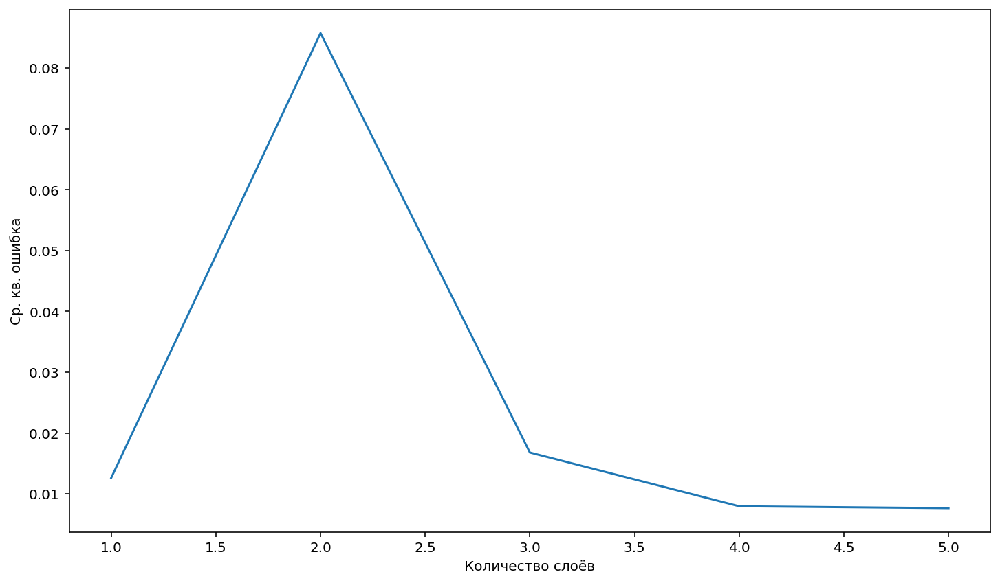

In [22]:
draw_exp(6)

In [23]:
experiment(40)

Epoch 1/100


 1/20 [>.............................] - ETA: 24s - loss: 0.6138

20/20 [==============================] - 1s 1ms/step - loss: 0.4925


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3799

20/20 [==============================] - 0s 2ms/step - loss: 0.3613


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2707

20/20 [==============================] - 0s 1ms/step - loss: 0.2937


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2512

20/20 [==============================] - 0s 1ms/step - loss: 0.2826


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2391

 5/20 [======>.......................] - ETA: 0s - loss: 0.2641

20/20 [==============================] - 0s 4ms/step - loss: 0.2586


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2872

 4/20 [=====>........................] - ETA: 0s - loss: 0.2681

20/20 [==============================] - 0s 4ms/step - loss: 0.2313


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1976

 9/20 [============>.................] - ETA: 0s - loss: 0.2141

20/20 [==============================] - 0s 4ms/step - loss: 0.2169


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2570

10/20 [==============>...............] - ETA: 0s - loss: 0.2266

20/20 [==============================] - 0s 4ms/step - loss: 0.2162


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1627

11/20 [===============>..............] - ETA: 0s - loss: 0.1710

20/20 [==============================] - 0s 4ms/step - loss: 0.1771


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2146

18/20 [==========================>...] - ETA: 0s - loss: 0.1759

20/20 [==============================] - 0s 4ms/step - loss: 0.1740


Epoch 11/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2430

17/20 [========================>.....] - ETA: 0s - loss: 0.1617

20/20 [==============================] - 0s 4ms/step - loss: 0.1597


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1141

20/20 [==============================] - 0s 1ms/step - loss: 0.1267


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1758

20/20 [==============================] - 0s 1ms/step - loss: 0.1376


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0594

20/20 [==============================] - 0s 1ms/step - loss: 0.1013


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1800

 3/20 [===>..........................] - ETA: 0s - loss: 0.1529

20/20 [==============================] - 0s 4ms/step - loss: 0.1328


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1365

 2/20 [==>...........................] - ETA: 1s - loss: 0.1117

13/20 [==================>...........] - ETA: 0s - loss: 0.1085

16/20 [=======================>......] - ETA: 0s - loss: 0.1091

17/20 [========================>.....] - ETA: 0s - loss: 0.1094

20/20 [==============================] - 1s 31ms/step - loss: 0.1098


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1503

 3/20 [===>..........................] - ETA: 0s - loss: 0.1192

 7/20 [=========>....................] - ETA: 0s - loss: 0.1154

 8/20 [===========>..................] - ETA: 0s - loss: 0.1144

 9/20 [============>.................] - ETA: 0s - loss: 0.1137

10/20 [==============>...............] - ETA: 0s - loss: 0.1132

20/20 [==============================] - 1s 26ms/step - loss: 0.1094


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1414

19/20 [===========================>..] - ETA: 0s - loss: 0.1042

20/20 [==============================] - 0s 5ms/step - loss: 0.1038


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1180

15/20 [=====================>........] - ETA: 0s - loss: 0.1023

20/20 [==============================] - 0s 5ms/step - loss: 0.1003


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0934

 4/20 [=====>........................] - ETA: 0s - loss: 0.0951

20/20 [==============================] - 0s 5ms/step - loss: 0.0988


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1064

20/20 [==============================] - 0s 1ms/step - loss: 0.0867


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1329

 2/20 [==>...........................] - ETA: 1s - loss: 0.1266

 3/20 [===>..........................] - ETA: 3s - loss: 0.1228

16/20 [=======================>......] - ETA: 0s - loss: 0.1066

20/20 [==============================] - 1s 26ms/step - loss: 0.1015


Epoch 23/100


 1/20 [>.............................] - ETA: 3s - loss: 0.1072

18/20 [==========================>...] - ETA: 0s - loss: 0.0833

20/20 [==============================] - ETA: 0s - loss: 0.0831

20/20 [==============================] - 0s 11ms/step - loss: 0.0830


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1081

12/20 [=================>............] - ETA: 0s - loss: 0.0789

20/20 [==============================] - 0s 5ms/step - loss: 0.0780


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0403

 7/20 [=========>....................] - ETA: 0s - loss: 0.0674

 9/20 [============>.................] - ETA: 0s - loss: 0.0661

20/20 [==============================] - 0s 10ms/step - loss: 0.0689


Epoch 26/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0844

 9/20 [============>.................] - ETA: 0s - loss: 0.0675

20/20 [==============================] - 0s 6ms/step - loss: 0.0694


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1139

 2/20 [==>...........................] - ETA: 1s - loss: 0.0985

 9/20 [============>.................] - ETA: 0s - loss: 0.0784

17/20 [========================>.....] - ETA: 0s - loss: 0.0739

18/20 [==========================>...] - ETA: 0s - loss: 0.0736

19/20 [===========================>..] - ETA: 0s - loss: 0.0733

20/20 [==============================] - 0s 26ms/step - loss: 0.0728


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0371

 5/20 [======>.......................] - ETA: 0s - loss: 0.0527

20/20 [==============================] - 0s 5ms/step - loss: 0.0618


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0760

16/20 [=======================>......] - ETA: 0s - loss: 0.0690

20/20 [==============================] - 0s 5ms/step - loss: 0.0679


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0663

11/20 [===============>..............] - ETA: 0s - loss: 0.0681

20/20 [==============================] - 0s 4ms/step - loss: 0.0650


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0495

 2/20 [==>...........................] - ETA: 1s - loss: 0.0488

14/20 [====================>.........] - ETA: 0s - loss: 0.0536

15/20 [=====================>........] - ETA: 0s - loss: 0.0540

20/20 [==============================] - 0s 25ms/step - loss: 0.0556


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0803

 2/20 [==>...........................] - ETA: 1s - loss: 0.0776

20/20 [==============================] - 0s 5ms/step - loss: 0.0606


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0549

 4/20 [=====>........................] - ETA: 0s - loss: 0.0516

10/20 [==============>...............] - ETA: 0s - loss: 0.0535

20/20 [==============================] - 0s 12ms/step - loss: 0.0541


Epoch 34/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0559

20/20 [==============================] - 0s 2ms/step - loss: 0.0519


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0499

14/20 [====================>.........] - ETA: 0s - loss: 0.0509

20/20 [==============================] - 0s 5ms/step - loss: 0.0502


Epoch 36/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0669

20/20 [==============================] - 0s 2ms/step - loss: 0.0468


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0363

15/20 [=====================>........] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 5ms/step - loss: 0.0440


Epoch 38/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0431

15/20 [=====================>........] - ETA: 0s - loss: 0.0437

20/20 [==============================] - 0s 6ms/step - loss: 0.0432


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0619

 3/20 [===>..........................] - ETA: 0s - loss: 0.0556

16/20 [=======================>......] - ETA: 0s - loss: 0.0492

19/20 [===========================>..] - ETA: 0s - loss: 0.0481

20/20 [==============================] - ETA: 0s - loss: 0.0478

20/20 [==============================] - 0s 20ms/step - loss: 0.0475


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0366

 9/20 [============>.................] - ETA: 0s - loss: 0.0365

20/20 [==============================] - 0s 5ms/step - loss: 0.0391


Epoch 41/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0375

20/20 [==============================] - 0s 1ms/step - loss: 0.0368


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0792

16/20 [=======================>......] - ETA: 0s - loss: 0.0425

20/20 [==============================] - 0s 5ms/step - loss: 0.0411


Epoch 43/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0194

 8/20 [===========>..................] - ETA: 0s - loss: 0.0186

20/20 [==============================] - 0s 5ms/step - loss: 0.0275


Epoch 44/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0476

20/20 [==============================] - 0s 1ms/step - loss: 0.0351


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0239

20/20 [==============================] - 0s 1ms/step - loss: 0.0339


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0257

16/20 [=======================>......] - ETA: 0s - loss: 0.0307

20/20 [==============================] - 0s 5ms/step - loss: 0.0307


Epoch 47/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0574

 3/20 [===>..........................] - ETA: 0s - loss: 0.0443

13/20 [==================>...........] - ETA: 0s - loss: 0.0336

20/20 [==============================] - 0s 10ms/step - loss: 0.0319


Epoch 48/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0375

 2/20 [==>...........................] - ETA: 1s - loss: 0.0425

 5/20 [======>.......................] - ETA: 0s - loss: 0.0431

19/20 [===========================>..] - ETA: 0s - loss: 0.0342

20/20 [==============================] - ETA: 0s - loss: 0.0339

20/20 [==============================] - 1s 26ms/step - loss: 0.0337


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0323

10/20 [==============>...............] - ETA: 0s - loss: 0.0263

11/20 [===============>..............] - ETA: 0s - loss: 0.0260

20/20 [==============================] - 0s 11ms/step - loss: 0.0259


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 1ms/step - loss: 0.0265


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0174

19/20 [===========================>..] - ETA: 0s - loss: 0.0186

20/20 [==============================] - 0s 5ms/step - loss: 0.0191


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0340

10/20 [==============>...............] - ETA: 0s - loss: 0.0246

20/20 [==============================] - 0s 5ms/step - loss: 0.0248


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0164

 4/20 [=====>........................] - ETA: 0s - loss: 0.0204

20/20 [==============================] - 0s 6ms/step - loss: 0.0238


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0100

 3/20 [===>..........................] - ETA: 2s - loss: 0.0193

 6/20 [========>.....................] - ETA: 1s - loss: 0.0203

20/20 [==============================] - 0s 21ms/step - loss: 0.0223


Epoch 55/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0088

20/20 [==============================] - 0s 1ms/step - loss: 0.0161


Epoch 56/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0324

 3/20 [===>..........................] - ETA: 0s - loss: 0.0233

11/20 [===============>..............] - ETA: 0s - loss: 0.0176

14/20 [====================>.........] - ETA: 0s - loss: 0.0175

20/20 [==============================] - 0s 17ms/step - loss: 0.0182


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0181

15/20 [=====================>........] - ETA: 0s - loss: 0.0159

20/20 [==============================] - 0s 5ms/step - loss: 0.0169


Epoch 58/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0207

20/20 [==============================] - 0s 1ms/step - loss: 0.0212


Epoch 59/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0155



20/20 [==============================] - 0s 1ms/step - loss: 0.0165


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0111

20/20 [==============================] - 0s 1ms/step - loss: 0.0177


Epoch 61/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0175

 2/20 [==>...........................] - ETA: 1s - loss: 0.0181

11/20 [===============>..............] - ETA: 0s - loss: 0.0185

20/20 [==============================] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 17ms/step - loss: 0.0182


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0142

 4/20 [=====>........................] - ETA: 0s - loss: 0.0139

15/20 [=====================>........] - ETA: 0s - loss: 0.0155

20/20 [==============================] - 0s 11ms/step - loss: 0.0160


Epoch 63/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0384

 6/20 [========>.....................] - ETA: 0s - loss: 0.0247

 7/20 [=========>....................] - ETA: 0s - loss: 0.0237

10/20 [==============>...............] - ETA: 0s - loss: 0.0219

20/20 [==============================] - 0s 22ms/step - loss: 0.0190


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0083

 4/20 [=====>........................] - ETA: 0s - loss: 0.0151

20/20 [==============================] - 0s 5ms/step - loss: 0.0150


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

17/20 [========================>.....] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 5ms/step - loss: 0.0153


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0128

13/20 [==================>...........] - ETA: 0s - loss: 0.0143

20/20 [==============================] - 0s 4ms/step - loss: 0.0148


Epoch 67/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0091

10/20 [==============>...............] - ETA: 0s - loss: 0.0092

20/20 [==============================] - 0s 5ms/step - loss: 0.0119


Epoch 68/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0052

20/20 [==============================] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 5ms/step - loss: 0.0121


Epoch 69/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0063

14/20 [====================>.........] - ETA: 0s - loss: 0.0105

15/20 [=====================>........] - ETA: 0s - loss: 0.0107

16/20 [=======================>......] - ETA: 0s - loss: 0.0109

20/20 [==============================] - 0s 17ms/step - loss: 0.0116


Epoch 70/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0055

 9/20 [============>.................] - ETA: 0s - loss: 0.0073

15/20 [=====================>........] - ETA: 0s - loss: 0.0084

17/20 [========================>.....] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 17ms/step - loss: 0.0096


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

16/20 [=======================>......] - ETA: 0s - loss: 0.0119

20/20 [==============================] - 0s 5ms/step - loss: 0.0120


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

 3/20 [===>..........................] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 4ms/step - loss: 0.0107


Epoch 73/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0065

20/20 [==============================] - 0s 1ms/step - loss: 0.0091


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 2ms/step - loss: 0.0112


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0046

15/20 [=====================>........] - ETA: 0s - loss: 0.0107

20/20 [==============================] - 0s 5ms/step - loss: 0.0111


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0285

11/20 [===============>..............] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 4ms/step - loss: 0.0127


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

 7/20 [=========>....................] - ETA: 0s - loss: 0.0079

20/20 [==============================] - 0s 5ms/step - loss: 0.0105


Epoch 78/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 1ms/step - loss: 0.0099


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

 4/20 [=====>........................] - ETA: 0s - loss: 0.0054

 5/20 [======>.......................] - ETA: 0s - loss: 0.0059

 6/20 [========>.....................] - ETA: 1s - loss: 0.0062

11/20 [===============>..............] - ETA: 0s - loss: 0.0077

13/20 [==================>...........] - ETA: 0s - loss: 0.0081

20/20 [==============================] - 1s 32ms/step - loss: 0.0088


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0490

18/20 [==========================>...] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 5ms/step - loss: 0.0168


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

 8/20 [===========>..................] - ETA: 0s - loss: 0.0147

20/20 [==============================] - 0s 5ms/step - loss: 0.0120


Epoch 82/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0036

16/20 [=======================>......] - ETA: 0s - loss: 0.0059

20/20 [==============================] - 0s 5ms/step - loss: 0.0069


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0057

 6/20 [========>.....................] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 5ms/step - loss: 0.0078


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0060

20/20 [==============================] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 5ms/step - loss: 0.0076


Epoch 85/100
 1/20 [>.............................]

 - ETA: 0s - loss: 0.0029

 2/20 [==>...........................] - ETA: 1s - loss: 0.0028

11/20 [===============>..............] - ETA: 0s - loss: 0.0054

17/20 [========================>.....] - ETA: 0s - loss: 0.0068

20/20 [==============================] - 0s 21ms/step - loss: 0.0072


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0042

 4/20 [=====>........................] - ETA: 0s - loss: 0.0036

15/20 [=====================>........] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 10ms/step - loss: 0.0060


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

 5/20 [======>.......................] - ETA: 0s - loss: 0.0064

 7/20 [=========>....................] - ETA: 0s - loss: 0.0074

 8/20 [===========>..................] - ETA: 0s - loss: 0.0078

20/20 [==============================] - 0s 16ms/step - loss: 0.0087


Epoch 88/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0142

20/20 [==============================] - 0s 1ms/step - loss: 0.0100


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

15/20 [=====================>........] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 5ms/step - loss: 0.0089


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0242

11/20 [===============>..............] - ETA: 0s - loss: 0.0103

20/20 [==============================] - 0s 5ms/step - loss: 0.0090


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

 5/20 [======>.......................] - ETA: 0s - loss: 0.0023

14/20 [====================>.........] - ETA: 0s - loss: 0.0044

20/20 [==============================] - 0s 9ms/step - loss: 0.0056


Epoch 92/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0020

 2/20 [==>...........................] - ETA: 2s - loss: 0.0048

11/20 [===============>..............] - ETA: 0s - loss: 0.0101

15/20 [=====================>........] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 1s 21ms/step - loss: 0.0091


Epoch 93/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0071

 3/20 [===>..........................] - ETA: 0s - loss: 0.0057

19/20 [===========================>..] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 10ms/step - loss: 0.0076


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0188

11/20 [===============>..............] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 5ms/step - loss: 0.0086


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0109

 2/20 [==>...........................] - ETA: 1s - loss: 0.0093

17/20 [========================>.....] - ETA: 0s - loss: 0.0082

20/20 [==============================] - 0s 9ms/step - loss: 0.0080


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0189

 2/20 [==>...........................] - ETA: 1s - loss: 0.0148

11/20 [===============>..............] - ETA: 0s - loss: 0.0084

20/20 [==============================] - 0s 11ms/step - loss: 0.0076


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

 2/20 [==>...........................] - ETA: 1s - loss: 0.0013

10/20 [==============>...............] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 11ms/step - loss: 0.0044


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 7.2760e-04

 3/20 [===>..........................] - ETA: 0s - loss: 0.0016    

 7/20 [=========>....................] - ETA: 0s - loss: 0.0032

10/20 [==============>...............] - ETA: 0s - loss: 0.0037

20/20 [==============================] - 0s 16ms/step - loss: 0.0052


Epoch 99/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0019

19/20 [===========================>..] - ETA: 0s - loss: 0.0084

20/20 [==============================] - 0s 5ms/step - loss: 0.0083


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0158

 9/20 [============>.................] - ETA: 0s - loss: 0.0091

20/20 [==============================] - 0s 4ms/step - loss: 0.0073


Epoch 1/100


 1/20 [>.............................] - ETA: 23s - loss: 0.5583

 2/20 [==>...........................] - ETA: 1s - loss: 0.5708 

20/20 [==============================] - 1s 5ms/step - loss: 0.5234


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5229

20/20 [==============================] - 0s 1ms/step - loss: 0.4203


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3482

14/20 [====================>.........] - ETA: 0s - loss: 0.3972

20/20 [==============================] - 0s 5ms/step - loss: 0.3914


Epoch 4/100


 1/20 [>.............................] - ETA: 3s - loss: 0.3443

 3/20 [===>..........................] - ETA: 0s - loss: 0.3520

10/20 [==============>...............] - ETA: 0s - loss: 0.3508

20/20 [==============================] - 0s 11ms/step - loss: 0.3546


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4307

 2/20 [==>...........................] - ETA: 1s - loss: 0.4118

 7/20 [=========>....................] - ETA: 0s - loss: 0.3815

 9/20 [============>.................] - ETA: 0s - loss: 0.3712

10/20 [==============>...............] - ETA: 0s - loss: 0.3682

20/20 [==============================] - ETA: 0s - loss: 0.3521

20/20 [==============================] - 0s 24ms/step - loss: 0.3515


Epoch 6/100


 1/20 [>.............................] - ETA: 2s - loss: 0.3133

 2/20 [==>...........................] - ETA: 1s - loss: 0.3015

20/20 [==============================] - 0s 5ms/step - loss: 0.3181


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2865

15/20 [=====================>........] - ETA: 0s - loss: 0.3128

18/20 [==========================>...] - ETA: 0s - loss: 0.3124

19/20 [===========================>..] - ETA: 0s - loss: 0.3124

20/20 [==============================] - 0s 26ms/step - loss: 0.3123


Epoch 8/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2234

12/20 [=================>............] - ETA: 0s - loss: 0.2946

20/20 [==============================] - 0s 6ms/step - loss: 0.2953


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2911

 3/20 [===>..........................] - ETA: 0s - loss: 0.2926

10/20 [==============>...............] - ETA: 0s - loss: 0.2975

18/20 [==========================>...] - ETA: 0s - loss: 0.2938

20/20 [==============================] - 0s 14ms/step - loss: 0.2934


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2505

 5/20 [======>.......................] - ETA: 0s - loss: 0.2710

16/20 [=======================>......] - ETA: 0s - loss: 0.2782

20/20 [==============================] - 0s 11ms/step - loss: 0.2759


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1950

 9/20 [============>.................] - ETA: 0s - loss: 0.2092

20/20 [==============================] - 0s 6ms/step - loss: 0.2250


Epoch 12/100
 1/20 [>.............................] - ETA: 1s - loss: 0.3692

20/20 [==============================] - 0s 1ms/step - loss: 0.2407


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2358

20/20 [==============================] - 0s 1ms/step - loss: 0.2108


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1726

12/20 [=================>............] - ETA: 0s - loss: 0.1812

20/20 [==============================] - 0s 5ms/step - loss: 0.1866


Epoch 15/100
 1/20 [>.............................] - ETA: 1s - loss: 0.2015

20/20 [==============================] - ETA: 0s - loss: 0.1920

20/20 [==============================] - 0s 5ms/step - loss: 0.1916


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1821

 6/20 [========>.....................] - ETA: 0s - loss: 0.1763

20/20 [==============================] - 0s 4ms/step - loss: 0.1795


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1165

20/20 [==============================] - ETA: 0s - loss: 0.1522

20/20 [==============================] - 0s 5ms/step - loss: 0.1528


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0918

11/20 [===============>..............] - ETA: 0s - loss: 0.1153

20/20 [==============================] - 0s 5ms/step - loss: 0.1308


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1323

 2/20 [==>...........................] - ETA: 1s - loss: 0.1225

20/20 [==============================] - 0s 5ms/step - loss: 0.1502


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0688

 7/20 [=========>....................] - ETA: 0s - loss: 0.1409

11/20 [===============>..............] - ETA: 0s - loss: 0.1400

12/20 [=================>............] - ETA: 0s - loss: 0.1403

13/20 [==================>...........] - ETA: 0s - loss: 0.1405

20/20 [==============================] - 0s 22ms/step - loss: 0.1390


Epoch 21/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1044

 8/20 [===========>..................] - ETA: 0s - loss: 0.1393

19/20 [===========================>..] - ETA: 0s - loss: 0.1348

20/20 [==============================] - 0s 11ms/step - loss: 0.1343


Epoch 22/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1108

 7/20 [=========>....................] - ETA: 0s - loss: 0.1307

18/20 [==========================>...] - ETA: 0s - loss: 0.1265

20/20 [==============================] - 0s 11ms/step - loss: 0.1260


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1738

 8/20 [===========>..................] - ETA: 0s - loss: 0.1296

20/20 [==============================] - 0s 5ms/step - loss: 0.1213


Epoch 24/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0991

18/20 [==========================>...] - ETA: 0s - loss: 0.1198

20/20 [==============================] - 0s 6ms/step - loss: 0.1187


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0491

 9/20 [============>.................] - ETA: 0s - loss: 0.0802

20/20 [==============================] - 0s 5ms/step - loss: 0.0879


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1654

20/20 [==============================] - 0s 1ms/step - loss: 0.1143


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0830

20/20 [==============================] - 0s 1ms/step - loss: 0.0911


Epoch 28/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1670

20/20 [==============================] - 0s 1ms/step - loss: 0.0963


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0966

20/20 [==============================] - 0s 1ms/step - loss: 0.0861


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0842

16/20 [=======================>......] - ETA: 0s - loss: 0.0843

20/20 [==============================] - 0s 5ms/step - loss: 0.0842


Epoch 31/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0914

 4/20 [=====>........................] - ETA: 0s - loss: 0.0801

20/20 [==============================] - 0s 5ms/step - loss: 0.0816


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0564

 7/20 [=========>....................] - ETA: 0s - loss: 0.0719

17/20 [========================>.....] - ETA: 0s - loss: 0.0766

20/20 [==============================] - 0s 11ms/step - loss: 0.0767


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0962

 3/20 [===>..........................] - ETA: 0s - loss: 0.0851

 4/20 [=====>........................] - ETA: 1s - loss: 0.0790

10/20 [==============>...............] - ETA: 0s - loss: 0.0726

14/20 [====================>.........] - ETA: 0s - loss: 0.0715

19/20 [===========================>..] - ETA: 0s - loss: 0.0710

20/20 [==============================] - ETA: 0s - loss: 0.0711

20/20 [==============================] - 1s 31ms/step - loss: 0.0712


Epoch 34/100


 1/20 [>.............................] - ETA: 1s - loss: 0.1193

17/20 [========================>.....] - ETA: 0s - loss: 0.0860

20/20 [==============================] - 0s 6ms/step - loss: 0.0829


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0853

 3/20 [===>..........................] - ETA: 0s - loss: 0.0732

20/20 [==============================] - 0s 5ms/step - loss: 0.0671


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0689

15/20 [=====================>........] - ETA: 0s - loss: 0.0708

20/20 [==============================] - 0s 5ms/step - loss: 0.0693


Epoch 37/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0497

 4/20 [=====>........................] - ETA: 0s - loss: 0.0576

20/20 [==============================] - 0s 5ms/step - loss: 0.0664


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0674

 2/20 [==>...........................] - ETA: 1s - loss: 0.0693

20/20 [==============================] - ETA: 0s - loss: 0.0642

20/20 [==============================] - 0s 9ms/step - loss: 0.0639


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0528

12/20 [=================>............] - ETA: 0s - loss: 0.0556

20/20 [==============================] - 0s 5ms/step - loss: 0.0556


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1001

 3/20 [===>..........................] - ETA: 0s - loss: 0.0857

20/20 [==============================] - 0s 4ms/step - loss: 0.0648


Epoch 41/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0388

20/20 [==============================] - 0s 1ms/step - loss: 0.0481


Epoch 42/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0597

16/20 [=======================>......] - ETA: 0s - loss: 0.0527

19/20 [===========================>..] - ETA: 0s - loss: 0.0518

20/20 [==============================] - 0s 11ms/step - loss: 0.0514


Epoch 43/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0442

11/20 [===============>..............] - ETA: 0s - loss: 0.0397

20/20 [==============================] - 0s 6ms/step - loss: 0.0423


Epoch 44/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0439

 7/20 [=========>....................] - ETA: 0s - loss: 0.0463

20/20 [==============================] - ETA: 0s - loss: 0.0468

20/20 [==============================] - 0s 11ms/step - loss: 0.0467


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0461

 6/20 [========>.....................] - ETA: 0s - loss: 0.0502

13/20 [==================>...........] - ETA: 0s - loss: 0.0455

18/20 [==========================>...] - ETA: 0s - loss: 0.0435

19/20 [===========================>..] - ETA: 0s - loss: 0.0434

20/20 [==============================] - 0s 21ms/step - loss: 0.0432


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0348

 9/20 [============>.................] - ETA: 0s - loss: 0.0370

20/20 [==============================] - 0s 5ms/step - loss: 0.0384


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0407

 3/20 [===>..........................] - ETA: 0s - loss: 0.0453

20/20 [==============================] - 0s 5ms/step - loss: 0.0414


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0310

 2/20 [==>...........................] - ETA: 1s - loss: 0.0248

20/20 [==============================] - 0s 5ms/step - loss: 0.0356


Epoch 49/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0406

20/20 [==============================] - 0s 1ms/step - loss: 0.0360


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0353

20/20 [==============================] - 0s 1ms/step - loss: 0.0331


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0532

20/20 [==============================] - 0s 2ms/step - loss: 0.0332


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0298

20/20 [==============================] - 0s 1ms/step - loss: 0.0336


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0348

13/20 [==================>...........] - ETA: 0s - loss: 0.0307

20/20 [==============================] - 0s 5ms/step - loss: 0.0297


Epoch 54/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0423

 7/20 [=========>....................] - ETA: 0s - loss: 0.0336

20/20 [==============================] - 0s 4ms/step - loss: 0.0304


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0342

 2/20 [==>...........................] - ETA: 1s - loss: 0.0359

11/20 [===============>..............] - ETA: 0s - loss: 0.0343

20/20 [==============================] - 0s 10ms/step - loss: 0.0309


Epoch 56/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0160

 5/20 [======>.......................] - ETA: 0s - loss: 0.0180

11/20 [===============>..............] - ETA: 0s - loss: 0.0217

20/20 [==============================] - 0s 11ms/step - loss: 0.0236


Epoch 57/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0168

 2/20 [==>...........................] - ETA: 1s - loss: 0.0189

13/20 [==================>...........] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 11ms/step - loss: 0.0228


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0590

 7/20 [=========>....................] - ETA: 0s - loss: 0.0373

20/20 [==============================] - 0s 5ms/step - loss: 0.0315


Epoch 59/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0286

17/20 [========================>.....] - ETA: 0s - loss: 0.0261

20/20 [==============================] - 0s 5ms/step - loss: 0.0258


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0069

11/20 [===============>..............] - ETA: 0s - loss: 0.0180

20/20 [==============================] - 0s 5ms/step - loss: 0.0206


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0360

 4/20 [=====>........................] - ETA: 0s - loss: 0.0266

20/20 [==============================] - 0s 5ms/step - loss: 0.0219


Epoch 62/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0076

20/20 [==============================] - 0s 1ms/step - loss: 0.0201


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0201

20/20 [==============================] - 0s 1ms/step - loss: 0.0197


Epoch 64/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0306

20/20 [==============================] - 0s 1ms/step - loss: 0.0197


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0186

20/20 [==============================] - ETA: 0s - loss: 0.0195

20/20 [==============================] - 0s 5ms/step - loss: 0.0195


Epoch 66/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0160

 5/20 [======>.......................] - ETA: 0s - loss: 0.0208

 7/20 [=========>....................] - ETA: 0s - loss: 0.0205

13/20 [==================>...........] - ETA: 0s - loss: 0.0197

17/20 [========================>.....] - ETA: 0s - loss: 0.0198

19/20 [===========================>..] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 1s 27ms/step - loss: 0.0197


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0086

 2/20 [==>...........................] - ETA: 3s - loss: 0.0128

18/20 [==========================>...] - ETA: 0s - loss: 0.0185

20/20 [==============================] - 0s 15ms/step - loss: 0.0185


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0244

 8/20 [===========>..................] - ETA: 0s - loss: 0.0193

20/20 [==============================] - 0s 5ms/step - loss: 0.0182


Epoch 69/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0082

19/20 [===========================>..] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 5ms/step - loss: 0.0161


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0268

 3/20 [===>..........................] - ETA: 0s - loss: 0.0197

20/20 [==============================] - 0s 5ms/step - loss: 0.0183


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0223

14/20 [====================>.........] - ETA: 0s - loss: 0.0204

20/20 [==============================] - 0s 5ms/step - loss: 0.0190


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0339

 3/20 [===>..........................] - ETA: 0s - loss: 0.0231

20/20 [==============================] - 0s 5ms/step - loss: 0.0159


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0274

11/20 [===============>..............] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 5ms/step - loss: 0.0171


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0155

 2/20 [==>...........................] - ETA: 0s - loss: 0.0143

19/20 [===========================>..] - ETA: 0s - loss: 0.0169

20/20 [==============================] - 0s 8ms/step - loss: 0.0168


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0090

 2/20 [==>...........................] - ETA: 1s - loss: 0.0086

17/20 [========================>.....] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 10ms/step - loss: 0.0128


Epoch 76/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0255

 2/20 [==>...........................] - ETA: 1s - loss: 0.0264

12/20 [=================>............] - ETA: 0s - loss: 0.0202

14/20 [====================>.........] - ETA: 0s - loss: 0.0193

17/20 [========================>.....] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 21ms/step - loss: 0.0177


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0303

 2/20 [==>...........................] - ETA: 3s - loss: 0.0290

20/20 [==============================] - 0s 11ms/step - loss: 0.0185


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0254

20/20 [==============================] - 0s 1ms/step - loss: 0.0159


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0172

17/20 [========================>.....] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 4ms/step - loss: 0.0136


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0085

13/20 [==================>...........] - ETA: 0s - loss: 0.0110

20/20 [==============================] - 0s 5ms/step - loss: 0.0115


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

 3/20 [===>..........................] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 5ms/step - loss: 0.0140


Epoch 82/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0047

17/20 [========================>.....] - ETA: 0s - loss: 0.0132

20/20 [==============================] - 0s 6ms/step - loss: 0.0130


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0320

 3/20 [===>..........................] - ETA: 0s - loss: 0.0214

11/20 [===============>..............] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 10ms/step - loss: 0.0125


Epoch 84/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 2ms/step - loss: 0.0115


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0376

 4/20 [=====>........................] - ETA: 0s - loss: 0.0249

20/20 [==============================] - 0s 5ms/step - loss: 0.0154


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0048

20/20 [==============================] - 0s 1ms/step - loss: 0.0079


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

15/20 [=====================>........] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 0s 4ms/step - loss: 0.0102


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

11/20 [===============>..............] - ETA: 0s - loss: 0.0100

20/20 [==============================] - 0s 4ms/step - loss: 0.0100


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 1ms/step - loss: 0.0099


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0093


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0061

 5/20 [======>.......................] - ETA: 0s - loss: 0.0077

15/20 [=====================>........] - ETA: 0s - loss: 0.0089

20/20 [==============================] - 0s 8ms/step - loss: 0.0093


Epoch 92/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0126

 7/20 [=========>....................] - ETA: 0s - loss: 0.0121

10/20 [==============>...............] - ETA: 0s - loss: 0.0118

11/20 [===============>..............] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 17ms/step - loss: 0.0109


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

 3/20 [===>..........................] - ETA: 0s - loss: 0.0092

13/20 [==================>...........] - ETA: 0s - loss: 0.0106

20/20 [==============================] - 0s 11ms/step - loss: 0.0102


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

11/20 [===============>..............] - ETA: 0s - loss: 0.0059

18/20 [==========================>...] - ETA: 0s - loss: 0.0070

19/20 [===========================>..] - ETA: 0s - loss: 0.0071

20/20 [==============================] - 0s 15ms/step - loss: 0.0073


Epoch 95/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0243

20/20 [==============================] - 0s 2ms/step - loss: 0.0127


Epoch 96/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0122

20/20 [==============================] - 0s 1ms/step - loss: 0.0073


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 1ms/step - loss: 0.0072


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0022

 5/20 [======>.......................] - ETA: 0s - loss: 0.0061

20/20 [==============================] - 0s 4ms/step - loss: 0.0084


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0141

16/20 [=======================>......] - ETA: 0s - loss: 0.0102

20/20 [==============================] - 0s 4ms/step - loss: 0.0098


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

17/20 [========================>.....] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 3ms/step - loss: 0.0074


Epoch 1/100


 1/20 [>.............................] - ETA: 19s - loss: 0.4841

10/20 [==============>...............] - ETA: 0s - loss: 0.4652 

20/20 [==============================] - 1s 4ms/step - loss: 0.4506


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3497

20/20 [==============================] - ETA: 0s - loss: 0.3725

20/20 [==============================] - 0s 5ms/step - loss: 0.3727


Epoch 3/100


 1/20 [>.............................] - ETA: 0s - loss: 0.3752

11/20 [===============>..............] - ETA: 0s - loss: 0.3364

20/20 [==============================] - 0s 5ms/step - loss: 0.3297


Epoch 4/100


 1/20 [>.............................] - ETA: 0s - loss: 0.4078

12/20 [=================>............] - ETA: 0s - loss: 0.3476

20/20 [==============================] - ETA: 0s - loss: 0.3257

20/20 [==============================] - 0s 11ms/step - loss: 0.3239


Epoch 5/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2764

 9/20 [============>.................] - ETA: 0s - loss: 0.2846

11/20 [===============>..............] - ETA: 0s - loss: 0.2837

20/20 [==============================] - 0s 11ms/step - loss: 0.2737


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2723

18/20 [==========================>...] - ETA: 0s - loss: 0.2625

20/20 [==============================] - 0s 5ms/step - loss: 0.2594


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1985

 8/20 [===========>..................] - ETA: 0s - loss: 0.2544

20/20 [==============================] - 0s 5ms/step - loss: 0.2384


Epoch 8/100


 1/20 [>.............................] - ETA: 1s - loss: 0.3337

 2/20 [==>...........................] - ETA: 5s - loss: 0.3245

 3/20 [===>..........................] - ETA: 4s - loss: 0.3199

 8/20 [===========>..................] - ETA: 1s - loss: 0.2919

17/20 [========================>.....] - ETA: 0s - loss: 0.2516

19/20 [===========================>..] - ETA: 0s - loss: 0.2457

20/20 [==============================] - 1s 38ms/step - loss: 0.2410


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2141

 2/20 [==>...........................] - ETA: 1s - loss: 0.2160

 3/20 [===>..........................] - ETA: 1s - loss: 0.2149

 4/20 [=====>........................] - ETA: 1s - loss: 0.2060

 7/20 [=========>....................] - ETA: 0s - loss: 0.1961

20/20 [==============================] - 0s 20ms/step - loss: 0.1885


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1360

15/20 [=====================>........] - ETA: 0s - loss: 0.1798

20/20 [==============================] - 0s 5ms/step - loss: 0.1773


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1340

20/20 [==============================] - 0s 1ms/step - loss: 0.1572


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0715

20/20 [==============================] - 0s 1ms/step - loss: 0.1408


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0771

18/20 [==========================>...] - ETA: 0s - loss: 0.1338

20/20 [==============================] - 0s 3ms/step - loss: 0.1351


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1069

20/20 [==============================] - 0s 1ms/step - loss: 0.1406


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1499

20/20 [==============================] - 0s 1ms/step - loss: 0.1338


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1035

19/20 [===========================>..] - ETA: 0s - loss: 0.1328

20/20 [==============================] - 0s 3ms/step - loss: 0.1327


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1363

18/20 [==========================>...] - ETA: 0s - loss: 0.1375

20/20 [==============================] - 0s 3ms/step - loss: 0.1364


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1146

20/20 [==============================] - 0s 1ms/step - loss: 0.1176


Epoch 19/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1581

20/20 [==============================] - 0s 1ms/step - loss: 0.1149


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2005



18/20 [==========================>...] - ETA: 0s - loss: 0.1487

20/20 [==============================] - 0s 3ms/step - loss: 0.1446


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0503

20/20 [==============================] - 0s 2ms/step - loss: 0.1078


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1200

20/20 [==============================] - 0s 1ms/step - loss: 0.1158


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1821

14/20 [====================>.........] - ETA: 0s - loss: 0.1219

20/20 [==============================] - 0s 3ms/step - loss: 0.1177


Epoch 24/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0927

20/20 [==============================] - 0s 2ms/step - loss: 0.1085


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0811

20/20 [==============================] - 0s 2ms/step - loss: 0.1043


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1460

20/20 [==============================] - 0s 2ms/step - loss: 0.1063


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1058

20/20 [==============================] - 0s 3ms/step - loss: 0.0898


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1156

20/20 [==============================] - 0s 2ms/step - loss: 0.1060


Epoch 29/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0773

20/20 [==============================] - 0s 1ms/step - loss: 0.0809


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1649

15/20 [=====================>........] - ETA: 0s - loss: 0.0851

20/20 [==============================] - 0s 3ms/step - loss: 0.0854


Epoch 31/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0569

20/20 [==============================] - 0s 1ms/step - loss: 0.0743


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0471

20/20 [==============================] - 0s 1ms/step - loss: 0.0662


Epoch 33/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0242

13/20 [==================>...........] - ETA: 0s - loss: 0.0770

20/20 [==============================] - 0s 3ms/step - loss: 0.0780


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0129

20/20 [==============================] - ETA: 0s - loss: 0.0644

20/20 [==============================] - 0s 3ms/step - loss: 0.0649


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0395

20/20 [==============================] - 0s 2ms/step - loss: 0.0672


Epoch 36/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1009

20/20 [==============================] - 0s 2ms/step - loss: 0.0705


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0978

20/20 [==============================] - 0s 2ms/step - loss: 0.0725


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0629

20/20 [==============================] - 0s 2ms/step - loss: 0.0608


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0845

20/20 [==============================] - 0s 2ms/step - loss: 0.0620


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0478

20/20 [==============================] - 0s 3ms/step - loss: 0.0598


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0341

19/20 [===========================>..] - ETA: 0s - loss: 0.0434

20/20 [==============================] - 0s 3ms/step - loss: 0.0447


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0804

20/20 [==============================] - 0s 1ms/step - loss: 0.0644


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0385

20/20 [==============================] - 0s 2ms/step - loss: 0.0578


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0299

19/20 [===========================>..] - ETA: 0s - loss: 0.0463

20/20 [==============================] - 0s 3ms/step - loss: 0.0469


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 3ms/step - loss: 0.0492


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0618

20/20 [==============================] - 0s 2ms/step - loss: 0.0589


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0373

20/20 [==============================] - 0s 2ms/step - loss: 0.0415


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0311

18/20 [==========================>...] - ETA: 0s - loss: 0.0458

20/20 [==============================] - 0s 3ms/step - loss: 0.0461


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0442

20/20 [==============================] - 0s 1ms/step - loss: 0.0464


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1274

20/20 [==============================] - 0s 2ms/step - loss: 0.0554


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0388

16/20 [=======================>......] - ETA: 0s - loss: 0.0555

20/20 [==============================] - 0s 3ms/step - loss: 0.0533


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0278

20/20 [==============================] - 0s 1ms/step - loss: 0.0368


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0875

20/20 [==============================] - 0s 1ms/step - loss: 0.0440


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0183

13/20 [==================>...........] - ETA: 0s - loss: 0.0389

20/20 [==============================] - 0s 3ms/step - loss: 0.0400


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0354

20/20 [==============================] - 0s 2ms/step - loss: 0.0381


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 2ms/step - loss: 0.0453


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0072

20/20 [==============================] - 0s 2ms/step - loss: 0.0320


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0458

19/20 [===========================>..] - ETA: 0s - loss: 0.0381

20/20 [==============================] - 0s 3ms/step - loss: 0.0382


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0679

20/20 [==============================] - 0s 1ms/step - loss: 0.0460


Epoch 60/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0358

20/20 [==============================] - 0s 2ms/step - loss: 0.0382


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0063

20/20 [==============================] - 0s 3ms/step - loss: 0.0370


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0354

20/20 [==============================] - 0s 1ms/step - loss: 0.0348


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0422

20/20 [==============================] - 0s 2ms/step - loss: 0.0290


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0590

 9/20 [============>.................] - ETA: 0s - loss: 0.0409

20/20 [==============================] - 0s 4ms/step - loss: 0.0382


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 2ms/step - loss: 0.0263


Epoch 66/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0202

20/20 [==============================] - 0s 3ms/step - loss: 0.0283


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0296

20/20 [==============================] - 0s 2ms/step - loss: 0.0311


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0523

20/20 [==============================] - 0s 1ms/step - loss: 0.0339


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0356

19/20 [===========================>..] - ETA: 0s - loss: 0.0264

20/20 [==============================] - 0s 3ms/step - loss: 0.0267


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0518

16/20 [=======================>......] - ETA: 0s - loss: 0.0298

20/20 [==============================] - 0s 3ms/step - loss: 0.0298


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 1ms/step - loss: 0.0258


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0203

20/20 [==============================] - 0s 2ms/step - loss: 0.0217


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0106

15/20 [=====================>........] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 4ms/step - loss: 0.0219


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 2ms/step - loss: 0.0219


Epoch 75/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0588

20/20 [==============================]

 - 0s 2ms/step - loss: 0.0287


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 2ms/step - loss: 0.0274


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

20/20 [==============================] - 0s 3ms/step - loss: 0.0276


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0151

20/20 [==============================] - 0s 2ms/step - loss: 0.0201


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0350

20/20 [==============================] - 0s 2ms/step - loss: 0.0216


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0269

14/20 [====================>.........] - ETA: 0s - loss: 0.0211

20/20 [==============================] - 0s 3ms/step - loss: 0.0212


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0187

19/20 [===========================>..] - ETA: 0s - loss: 0.0217

20/20 [==============================] - 0s 3ms/step - loss: 0.0217


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0469

20/20 [==============================] - 0s 1ms/step - loss: 0.0251


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0357

20/20 [==============================] - 0s 2ms/step - loss: 0.0245


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0010

15/20 [=====================>........] - ETA: 0s - loss: 0.0179

20/20 [==============================] - 0s 3ms/step - loss: 0.0182


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0123

14/20 [====================>.........] - ETA: 0s - loss: 0.0135

20/20 [==============================] - 0s 3ms/step - loss: 0.0157


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0173

10/20 [==============>...............] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 5ms/step - loss: 0.0190


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

19/20 [===========================>..] - ETA: 0s - loss: 0.0172

20/20 [==============================] - 0s 5ms/step - loss: 0.0173


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0379

 7/20 [=========>....................] - ETA: 0s - loss: 0.0206

20/20 [==============================] - 0s 5ms/step - loss: 0.0195


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0375

 5/20 [======>.......................] - ETA: 0s - loss: 0.0229

11/20 [===============>..............] - ETA: 0s - loss: 0.0209

15/20 [=====================>........] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 16ms/step - loss: 0.0186


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0043

 2/20 [==>...........................] - ETA: 1s - loss: 0.0042

10/20 [==============>...............] - ETA: 0s - loss: 0.0087

19/20 [===========================>..] - ETA: 0s - loss: 0.0114

20/20 [==============================] - ETA: 0s - loss: 0.0116

20/20 [==============================] - 0s 21ms/step - loss: 0.0119


Epoch 91/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0027

20/20 [==============================] - 0s 2ms/step - loss: 0.0147


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0088

 8/20 [===========>..................] - ETA: 0s - loss: 0.0173

20/20 [==============================] - 0s 5ms/step - loss: 0.0163


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0071

 2/20 [==>...........................] - ETA: 1s - loss: 0.0103

20/20 [==============================] - 0s 5ms/step - loss: 0.0130


Epoch 94/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0212

19/20 [===========================>..] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 5ms/step - loss: 0.0159


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

 6/20 [========>.....................] - ETA: 0s - loss: 0.0071

 7/20 [=========>....................] - ETA: 0s - loss: 0.0076

15/20 [=====================>........] - ETA: 0s - loss: 0.0116

16/20 [=======================>......] - ETA: 0s - loss: 0.0119

20/20 [==============================] - 1s 31ms/step - loss: 0.0125


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0107

 3/20 [===>..........................] - ETA: 0s - loss: 0.0150

 9/20 [============>.................] - ETA: 0s - loss: 0.0164

13/20 [==================>...........] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 16ms/step - loss: 0.0146


Epoch 97/100


 1/20 [>.............................] - ETA: 1s - loss: 0.0238

20/20 [==============================] - ETA: 0s - loss: 0.0165

20/20 [==============================] - 0s 5ms/step - loss: 0.0164


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0142

12/20 [=================>............] - ETA: 0s - loss: 0.0155

20/20 [==============================] - 0s 4ms/step - loss: 0.0149


Epoch 99/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0036

 9/20 [============>.................] - ETA: 0s - loss: 0.0080

18/20 [==========================>...] - ETA: 0s - loss: 0.0099

19/20 [===========================>..] - ETA: 0s - loss: 0.0100

20/20 [==============================] - 0s 16ms/step - loss: 0.0103


Epoch 100/100


 1/20 [>.............................] - ETA: 3s - loss: 0.0328

12/20 [=================>............] - ETA: 0s - loss: 0.0198

19/20 [===========================>..] - ETA: 0s - loss: 0.0174

20/20 [==============================] - 0s 11ms/step - loss: 0.0170


Epoch 1/100


 1/20 [>.............................] - ETA: 30s - loss: 0.5623

 2/20 [==>...........................] - ETA: 2s - loss: 0.6043 

 3/20 [===>..........................] - ETA: 1s - loss: 0.6226

20/20 [==============================] - 2s 12ms/step - loss: 0.5786


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5221

18/20 [==========================>...] - ETA: 0s - loss: 0.4925

20/20 [==============================] - 0s 5ms/step - loss: 0.4885


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3816

 9/20 [============>.................] - ETA: 0s - loss: 0.4127

17/20 [========================>.....] - ETA: 0s - loss: 0.4204

18/20 [==========================>...] - ETA: 0s - loss: 0.4209

20/20 [==============================] - ETA: 0s - loss: 0.4220

20/20 [==============================] - 1s 30ms/step - loss: 0.4226


Epoch 4/100
 1/20 [>.............................] - ETA: 1s - loss: 0.4281

 8/20 [===========>..................] - ETA: 0s - loss: 0.4286

14/20 [====================>.........] - ETA: 0s - loss: 0.4232

20/20 [==============================] - 0s 16ms/step - loss: 0.4188


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4253

 9/20 [============>.................] - ETA: 0s - loss: 0.4084

18/20 [==========================>...] - ETA: 0s - loss: 0.3952

19/20 [===========================>..] - ETA: 0s - loss: 0.3944

20/20 [==============================] - ETA: 0s - loss: 0.3940

20/20 [==============================] - 1s 37ms/step - loss: 0.3936


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.4132

10/20 [==============>...............] - ETA: 0s - loss: 0.3672

20/20 [==============================] - ETA: 0s - loss: 0.3684

20/20 [==============================] - 0s 16ms/step - loss: 0.3684


Epoch 7/100
 1/20 [>.............................] - ETA: 1s - loss: 0.3559

10/20 [==============>...............] - ETA: 0s - loss: 0.3630

20/20 [==============================] - 0s 6ms/step - loss: 0.3602


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2868

20/20 [==============================] - 0s 2ms/step - loss: 0.3383


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2902

20/20 [==============================] - 0s 1ms/step - loss: 0.3210


Epoch 10/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3481

15/20 [=====================>........] - ETA: 0s - loss: 0.3453

20/20 [==============================] - 0s 3ms/step - loss: 0.3357


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3074

 5/20 [======>.......................] - ETA: 0s - loss: 0.2794

20/20 [==============================] - 0s 5ms/step - loss: 0.2804


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2112

20/20 [==============================] - 0s 1ms/step - loss: 0.2692


Epoch 13/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2356

 9/20 [============>.................] - ETA: 0s - loss: 0.2139

20/20 [==============================] - 0s 3ms/step - loss: 0.2237


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2641

20/20 [==============================] - 0s 1ms/step - loss: 0.2106


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1434

20/20 [==============================] - 0s 1ms/step - loss: 0.1697


Epoch 16/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1008

12/20 [=================>............] - ETA: 0s - loss: 0.1410

20/20 [==============================] - 0s 3ms/step - loss: 0.1473


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1793

14/20 [====================>.........] - ETA: 0s - loss: 0.1256

20/20 [==============================] - 0s 3ms/step - loss: 0.1294


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2575

20/20 [==============================] - 0s 1ms/step - loss: 0.1394


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1299

20/20 [==============================] - 0s 1ms/step - loss: 0.1170


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1444

12/20 [=================>............] - ETA: 0s - loss: 0.1203

20/20 [==============================] - 0s 3ms/step - loss: 0.1148


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1165

20/20 [==============================] - 0s 1ms/step - loss: 0.1032


Epoch 22/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0807

20/20 [==============================] - 0s 2ms/step - loss: 0.0871


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0646

20/20 [==============================] - 0s 3ms/step - loss: 0.0794


Epoch 24/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1211

20/20 [==============================] - 0s 1ms/step - loss: 0.0908


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0959

20/20 [==============================] - 0s 3ms/step - loss: 0.0807


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0664

20/20 [==============================] - 0s 1ms/step - loss: 0.0714


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0602

20/20 [==============================] - 0s 1ms/step - loss: 0.0649


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0544

11/20 [===============>..............] - ETA: 0s - loss: 0.0604

20/20 [==============================] - 0s 3ms/step - loss: 0.0640


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0663

20/20 [==============================] - 0s 1ms/step - loss: 0.0602


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0700

20/20 [==============================] - 0s 1ms/step - loss: 0.0634


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0530

17/20 [========================>.....] - ETA: 0s - loss: 0.0558

20/20 [==============================] - 0s 3ms/step - loss: 0.0563


Epoch 32/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0530

20/20 [==============================] - 0s 1ms/step - loss: 0.0550


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0332

13/20 [==================>...........] - ETA: 0s - loss: 0.0575

20/20 [==============================] - 0s 3ms/step - loss: 0.0551


Epoch 34/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0585

18/20 [==========================>...] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 4ms/step - loss: 0.0555


Epoch 35/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0389

20/20 [==============================] - 0s 1ms/step - loss: 0.0423


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0715

 4/20 [=====>........................] - ETA: 0s - loss: 0.0455

20/20 [==============================] - 0s 4ms/step - loss: 0.0456


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0619

18/20 [==========================>...] - ETA: 0s - loss: 0.0471

20/20 [==============================] - 0s 3ms/step - loss: 0.0470


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0481

18/20 [==========================>...] - ETA: 0s - loss: 0.0472

20/20 [==============================] - 0s 4ms/step - loss: 0.0469


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0695

20/20 [==============================] - 0s 1ms/step - loss: 0.0516


Epoch 40/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0756

12/20 [=================>............] - ETA: 0s - loss: 0.0532

20/20 [==============================] - 0s 3ms/step - loss: 0.0495


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0965

20/20 [==============================] - 0s 1ms/step - loss: 0.0521


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0329

20/20 [==============================] - 0s 1ms/step - loss: 0.0347


Epoch 43/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0371

16/20 [=======================>......] - ETA: 0s - loss: 0.0409

20/20 [==============================] - 0s 3ms/step - loss: 0.0406


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0544

20/20 [==============================] - 0s 1ms/step - loss: 0.0370


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0192

20/20 [==============================] - 0s 2ms/step - loss: 0.0365


Epoch 46/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0688

20/20 [==============================] - ETA: 0s - loss: 0.0402

20/20 [==============================] - 0s 3ms/step - loss: 0.0400


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0165

20/20 [==============================] - 0s 1ms/step - loss: 0.0297


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 1ms/step - loss: 0.0389


Epoch 49/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0372

20/20 [==============================] - ETA: 0s - loss: 0.0351

20/20 [==============================] - 0s 3ms/step - loss: 0.0350


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

20/20 [==============================] - 0s 1ms/step - loss: 0.0338


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0346

20/20 [==============================] - 0s 1ms/step - loss: 0.0304


Epoch 52/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0189

16/20 [=======================>......] - ETA: 0s - loss: 0.0283

20/20 [==============================] - 0s 3ms/step - loss: 0.0286


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0391

20/20 [==============================] - 0s 1ms/step - loss: 0.0295


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0378

20/20 [==============================] - 0s 1ms/step - loss: 0.0291


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0134

16/20 [=======================>......] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 3ms/step - loss: 0.0261


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 1ms/step - loss: 0.0273


Epoch 57/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0177

14/20 [====================>.........] - ETA: 0s - loss: 0.0223

20/20 [==============================] - 0s 3ms/step - loss: 0.0236


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0579

20/20 [==============================] - 0s 1ms/step - loss: 0.0290


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0275

20/20 [==============================] - 0s 1ms/step - loss: 0.0203


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0353

11/20 [===============>..............] - ETA: 0s - loss: 0.0290

20/20 [==============================] - 0s 3ms/step - loss: 0.0265


Epoch 61/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0255

20/20 [==============================] - 0s 1ms/step - loss: 0.0229


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0388

20/20 [==============================] - 0s 1ms/step - loss: 0.0254


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0520

14/20 [====================>.........] - ETA: 0s - loss: 0.0280

20/20 [==============================] - 0s 3ms/step - loss: 0.0265


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0164

20/20 [==============================] - 0s 1ms/step - loss: 0.0207


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

15/20 [=====================>........] - ETA: 0s - loss: 0.0182

20/20 [==============================] - 0s 3ms/step - loss: 0.0190


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0093

20/20 [==============================] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 3ms/step - loss: 0.0155


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0261

20/20 [==============================] - 0s 2ms/step - loss: 0.0220


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

20/20 [==============================] - 0s 1ms/step - loss: 0.0162


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0395

16/20 [=======================>......] - ETA: 0s - loss: 0.0245

20/20 [==============================] - 0s 3ms/step - loss: 0.0233


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0107

20/20 [==============================] - 0s 1ms/step - loss: 0.0175


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0070

11/20 [===============>..............] - ETA: 0s - loss: 0.0183

20/20 [==============================] - 0s 3ms/step - loss: 0.0189


Epoch 72/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0142

19/20 [===========================>..] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 3ms/step - loss: 0.0183


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0334

20/20 [==============================] - 0s 1ms/step - loss: 0.0203


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0270

20/20 [==============================] - 0s 3ms/step - loss: 0.0166


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0142

20/20 [==============================] - 0s 1ms/step - loss: 0.0131


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0120

20/20 [==============================] - 0s 1ms/step - loss: 0.0156


Epoch 77/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0076

19/20 [===========================>..] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 0s 3ms/step - loss: 0.0126


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 1ms/step - loss: 0.0149


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0080

20/20 [==============================] - 0s 1ms/step - loss: 0.0128


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0148

14/20 [====================>.........] - ETA: 0s - loss: 0.0154

20/20 [==============================] - 0s 3ms/step - loss: 0.0149


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0165

20/20 [==============================] - 0s 1ms/step - loss: 0.0148


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0115

11/20 [===============>..............] - ETA: 0s - loss: 0.0151

20/20 [==============================] - 0s 3ms/step - loss: 0.0140


Epoch 83/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0113

 7/20 [=========>....................] - ETA: 0s - loss: 0.0114

20/20 [==============================] - 0s 4ms/step - loss: 0.0128


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0281

20/20 [==============================] - 0s 1ms/step - loss: 0.0147


Epoch 85/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0319

20/20 [==============================] - 0s 1ms/step - loss: 0.0141


Epoch 86/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0169

14/20 [====================>.........] - ETA: 0s - loss: 0.0163

20/20 [==============================] - 0s 3ms/step - loss: 0.0149


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 1ms/step - loss: 0.0129


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0266

14/20 [====================>.........] - ETA: 0s - loss: 0.0137

20/20 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0138

17/20 [========================>.....] - ETA: 0s - loss: 0.0098

20/20 [==============================] - 0s 3ms/step - loss: 0.0102


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0141

20/20 [==============================] - 0s 1ms/step - loss: 0.0126


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

14/20 [====================>.........] - ETA: 0s - loss: 0.0090

20/20 [==============================] - 0s 3ms/step - loss: 0.0092


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0072


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 1ms/step - loss: 0.0104


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

13/20 [==================>...........] - ETA: 0s - loss: 0.0086

20/20 [==============================] - 0s 3ms/step - loss: 0.0089


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0206

20/20 [==============================] - 0s 1ms/step - loss: 0.0112


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 1ms/step - loss: 0.0065


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0099

20/20 [==============================] - 0s 1ms/step - loss: 0.0094


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 1ms/step - loss: 0.0087


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0313

 5/20 [======>.......................] - ETA: 0s - loss: 0.0205

20/20 [==============================] - 0s 4ms/step - loss: 0.0120


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

20/20 [==============================] - 0s 2ms/step - loss: 0.0079


Epoch 1/100


 1/20 [>.............................] - ETA: 5s - loss: 0.7538

20/20 [==============================] - 0s 2ms/step - loss: 0.6512


Epoch 2/100
 1/20 [>.............................] - ETA: 0s - loss: 0.5440

20/20 [==============================] - 0s 1ms/step - loss: 0.4255


Epoch 3/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3177

17/20 [========================>.....] - ETA: 0s - loss: 0.3584

20/20 [==============================] - 0s 3ms/step - loss: 0.3589


Epoch 4/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2698

20/20 [==============================] - 0s 1ms/step - loss: 0.3331


Epoch 5/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2653

20/20 [==============================] - 0s 1ms/step - loss: 0.2995


Epoch 6/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3130

13/20 [==================>...........] - ETA: 0s - loss: 0.2728

20/20 [==============================] - 0s 3ms/step - loss: 0.2737


Epoch 7/100
 1/20 [>.............................] - ETA: 0s - loss: 0.3151

20/20 [==============================] - 0s 1ms/step - loss: 0.2576


Epoch 8/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2072

20/20 [==============================] - 0s 1ms/step - loss: 0.2206


Epoch 9/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1451

11/20 [===============>..............] - ETA: 0s - loss: 0.1675

20/20 [==============================] - 0s 3ms/step - loss: 0.1745


Epoch 10/100


 1/20 [>.............................] - ETA: 0s - loss: 0.2546

20/20 [==============================] - 0s 1ms/step - loss: 0.1766


Epoch 11/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2384

20/20 [==============================] - 0s 1ms/step - loss: 0.1517


Epoch 12/100
 1/20 [>.............................] - ETA: 0s - loss: 0.2500

15/20 [=====================>........] - ETA: 0s - loss: 0.1444

20/20 [==============================] - 0s 3ms/step - loss: 0.1408


Epoch 13/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1660

20/20 [==============================] - 0s 1ms/step - loss: 0.1395


Epoch 14/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0632

20/20 [==============================] - 0s 1ms/step - loss: 0.1150


Epoch 15/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1279

15/20 [=====================>........] - ETA: 0s - loss: 0.1268

20/20 [==============================] - 0s 3ms/step - loss: 0.1242


Epoch 16/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0083

20/20 [==============================] - 0s 1ms/step - loss: 0.0919


Epoch 17/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1389

20/20 [==============================] - 0s 1ms/step - loss: 0.1351


Epoch 18/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0627

12/20 [=================>............] - ETA: 0s - loss: 0.1115

20/20 [==============================] - 0s 3ms/step - loss: 0.1126


Epoch 19/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1310

20/20 [==============================] - 0s 1ms/step - loss: 0.1111


Epoch 20/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1036

20/20 [==============================] - 0s 1ms/step - loss: 0.1039


Epoch 21/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0667

15/20 [=====================>........] - ETA: 0s - loss: 0.0881

20/20 [==============================] - 0s 4ms/step - loss: 0.0921


Epoch 22/100


 1/20 [>.............................] - ETA: 1s - loss: 0.2002

 2/20 [==>...........................] - ETA: 1s - loss: 0.1762

 3/20 [===>..........................] - ETA: 1s - loss: 0.1569

 8/20 [===========>..................] - ETA: 0s - loss: 0.1291

16/20 [=======================>......] - ETA: 0s - loss: 0.1159

20/20 [==============================] - 0s 21ms/step - loss: 0.1124


Epoch 23/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1366

12/20 [=================>............] - ETA: 0s - loss: 0.1100

15/20 [=====================>........] - ETA: 0s - loss: 0.1082

20/20 [==============================] - 0s 11ms/step - loss: 0.1055


Epoch 24/100
 1/20 [>.............................] - ETA: 1s - loss: 0.0828

 3/20 [===>..........................] - ETA: 0s - loss: 0.0869

13/20 [==================>...........] - ETA: 0s - loss: 0.0934

20/20 [==============================] - 0s 11ms/step - loss: 0.0956


Epoch 25/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0813

 4/20 [=====>........................] - ETA: 0s - loss: 0.1076

20/20 [==============================] - 0s 5ms/step - loss: 0.1018


Epoch 26/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0919

20/20 [==============================] - 0s 1ms/step - loss: 0.0952


Epoch 27/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1435

 4/20 [=====>........................] - ETA: 0s - loss: 0.1065

20/20 [==============================] - 0s 4ms/step - loss: 0.0876


Epoch 28/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0522

18/20 [==========================>...] - ETA: 0s - loss: 0.0840

20/20 [==============================] - 0s 3ms/step - loss: 0.0848


Epoch 29/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0797

20/20 [==============================] - 0s 1ms/step - loss: 0.0912


Epoch 30/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0396

14/20 [====================>.........] - ETA: 0s - loss: 0.0840

20/20 [==============================] - 0s 3ms/step - loss: 0.0841


Epoch 31/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0776

20/20 [==============================] - ETA: 0s - loss: 0.0771

20/20 [==============================] - 0s 3ms/step - loss: 0.0774


Epoch 32/100


 1/20 [>.............................] - ETA: 5s - loss: 0.0412

 2/20 [==>...........................] - ETA: 1s - loss: 0.0460

10/20 [==============>...............] - ETA: 0s - loss: 0.0558

18/20 [==========================>...] - ETA: 0s - loss: 0.0659

20/20 [==============================] - 1s 16ms/step - loss: 0.0680


Epoch 33/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0626

 7/20 [=========>....................] - ETA: 0s - loss: 0.0805

17/20 [========================>.....] - ETA: 0s - loss: 0.0808

20/20 [==============================] - 0s 10ms/step - loss: 0.0804


Epoch 34/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1256

10/20 [==============>...............] - ETA: 0s - loss: 0.0880

20/20 [==============================] - 0s 5ms/step - loss: 0.0803


Epoch 35/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1048

20/20 [==============================] - 0s 1ms/step - loss: 0.0758


Epoch 36/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0561

20/20 [==============================] - 0s 1ms/step - loss: 0.0649


Epoch 37/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0585

13/20 [==================>...........] - ETA: 0s - loss: 0.0716

20/20 [==============================] - 0s 3ms/step - loss: 0.0706


Epoch 38/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0837

20/20 [==============================] - 0s 1ms/step - loss: 0.0716


Epoch 39/100
 1/20 [>.............................] - ETA: 0s - loss: 0.1037

20/20 [==============================] - 0s 1ms/step - loss: 0.0841


Epoch 40/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0795

18/20 [==========================>...] - ETA: 0s - loss: 0.0702

20/20 [==============================] - 0s 3ms/step - loss: 0.0696


Epoch 41/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0804

20/20 [==============================] - 0s 1ms/step - loss: 0.0614


Epoch 42/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0938

20/20 [==============================] - 0s 1ms/step - loss: 0.0671


Epoch 43/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0214

16/20 [=======================>......] - ETA: 0s - loss: 0.0549

20/20 [==============================] - 0s 3ms/step - loss: 0.0565


Epoch 44/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0592

20/20 [==============================] - 0s 1ms/step - loss: 0.0656


Epoch 45/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0303

12/20 [=================>............] - ETA: 0s - loss: 0.0528

20/20 [==============================] - 0s 3ms/step - loss: 0.0562


Epoch 46/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1419

13/20 [==================>...........] - ETA: 0s - loss: 0.0793

20/20 [==============================] - 0s 3ms/step - loss: 0.0708


Epoch 47/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0449

20/20 [==============================] - 0s 1ms/step - loss: 0.0595


Epoch 48/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0396

20/20 [==============================] - 0s 1ms/step - loss: 0.0461


Epoch 49/100


 1/20 [>.............................] - ETA: 0s - loss: 0.1281

14/20 [====================>.........] - ETA: 0s - loss: 0.0681

20/20 [==============================] - 0s 3ms/step - loss: 0.0650


Epoch 50/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0782

20/20 [==============================] - 0s 1ms/step - loss: 0.0657


Epoch 51/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0858

20/20 [==============================] - 0s 1ms/step - loss: 0.0639


Epoch 52/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0226

20/20 [==============================] - 0s 1ms/step - loss: 0.0577


Epoch 53/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0284

20/20 [==============================] - 0s 1ms/step - loss: 0.0460


Epoch 54/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0357

19/20 [===========================>..] - ETA: 0s - loss: 0.0502

20/20 [==============================] - 0s 3ms/step - loss: 0.0503


Epoch 55/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0533

20/20 [==============================] - 0s 1ms/step - loss: 0.0488


Epoch 56/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0444

20/20 [==============================] - 0s 1ms/step - loss: 0.0498


Epoch 57/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0565

18/20 [==========================>...] - ETA: 0s - loss: 0.0527

20/20 [==============================] - 0s 3ms/step - loss: 0.0520


Epoch 58/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0345

20/20 [==============================] - 0s 1ms/step - loss: 0.0433


Epoch 59/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0162

14/20 [====================>.........] - ETA: 0s - loss: 0.0330

20/20 [==============================] - 0s 3ms/step - loss: 0.0368


Epoch 60/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0741

20/20 [==============================] - ETA: 0s - loss: 0.0540

20/20 [==============================] - 0s 3ms/step - loss: 0.0536


Epoch 61/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0763

20/20 [==============================] - 0s 1ms/step - loss: 0.0472


Epoch 62/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0592

12/20 [=================>............] - ETA: 0s - loss: 0.0424

20/20 [==============================] - 0s 3ms/step - loss: 0.0429


Epoch 63/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0157

20/20 [==============================] - 0s 1ms/step - loss: 0.0392


Epoch 64/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0802

20/20 [==============================] - 0s 1ms/step - loss: 0.0453


Epoch 65/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0373

15/20 [=====================>........] - ETA: 0s - loss: 0.0404

20/20 [==============================] - 0s 3ms/step - loss: 0.0396


Epoch 66/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0331

20/20 [==============================] - 0s 1ms/step - loss: 0.0384


Epoch 67/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0586

 9/20 [============>.................] - ETA: 0s - loss: 0.0391

20/20 [==============================] - 0s 3ms/step - loss: 0.0370


Epoch 68/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0038

19/20 [===========================>..] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 3ms/step - loss: 0.0282


Epoch 69/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0417

20/20 [==============================] - 0s 1ms/step - loss: 0.0391


Epoch 70/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0169

13/20 [==================>...........] - ETA: 0s - loss: 0.0328

20/20 [==============================] - 0s 3ms/step - loss: 0.0334


Epoch 71/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0198

19/20 [===========================>..] - ETA: 0s - loss: 0.0345

20/20 [==============================] - 0s 4ms/step - loss: 0.0345


Epoch 72/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0144

20/20 [==============================] - 0s 1ms/step - loss: 0.0340


Epoch 73/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 1ms/step - loss: 0.0370


Epoch 74/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0165

19/20 [===========================>..] - ETA: 0s - loss: 0.0273

20/20 [==============================] - 0s 3ms/step - loss: 0.0277


Epoch 75/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0133

20/20 [==============================] - 0s 1ms/step - loss: 0.0301


Epoch 76/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

16/20 [=======================>......] - ETA: 0s - loss: 0.0256

20/20 [==============================] - 0s 3ms/step - loss: 0.0265


Epoch 77/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0335

 8/20 [===========>..................] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 4ms/step - loss: 0.0294


Epoch 78/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0119

20/20 [==============================] - 0s 1ms/step - loss: 0.0281


Epoch 79/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0416

20/20 [==============================] - 0s 1ms/step - loss: 0.0336


Epoch 80/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

12/20 [=================>............] - ETA: 0s - loss: 0.0153

20/20 [==============================] - 0s 3ms/step - loss: 0.0190


Epoch 81/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0557

20/20 [==============================] - 0s 1ms/step - loss: 0.0278


Epoch 82/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0616

20/20 [==============================] - 0s 1ms/step - loss: 0.0303


Epoch 83/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0182

17/20 [========================>.....] - ETA: 0s - loss: 0.0283

20/20 [==============================] - 0s 3ms/step - loss: 0.0276


Epoch 84/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0607

20/20 [==============================] - 0s 1ms/step - loss: 0.0283


Epoch 85/100


 1/20 [>.............................] - ETA: 0s - loss: 0.0268

20/20 [==============================] - 0s 1ms/step - loss: 0.0231


Epoch 86/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0348

20/20 [==============================] - ETA: 0s - loss: 0.0243

20/20 [==============================] - 0s 3ms/step - loss: 0.0242


Epoch 87/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

20/20 [==============================] - 0s 1ms/step - loss: 0.0226


Epoch 88/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0091

15/20 [=====================>........] - ETA: 0s - loss: 0.0198

20/20 [==============================] - 0s 3ms/step - loss: 0.0205


Epoch 89/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0466

20/20 [==============================] - 0s 1ms/step - loss: 0.0233


Epoch 90/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0333

20/20 [==============================] - 0s 1ms/step - loss: 0.0205


Epoch 91/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0317

16/20 [=======================>......] - ETA: 0s - loss: 0.0216

20/20 [==============================] - 0s 3ms/step - loss: 0.0213


Epoch 92/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0033

20/20 [==============================] - 0s 1ms/step - loss: 0.0175


Epoch 93/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 1ms/step - loss: 0.0154


Epoch 94/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

15/20 [=====================>........] - ETA: 0s - loss: 0.0175

20/20 [==============================] - 0s 3ms/step - loss: 0.0178


Epoch 95/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 1ms/step - loss: 0.0168


Epoch 96/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0275

15/20 [=====================>........] - ETA: 0s - loss: 0.0188

20/20 [==============================] - 0s 3ms/step - loss: 0.0182


Epoch 97/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0205

18/20 [==========================>...] - ETA: 0s - loss: 0.0184

20/20 [==============================] - 0s 4ms/step - loss: 0.0181


Epoch 98/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0249

20/20 [==============================] - 0s 2ms/step - loss: 0.0167


Epoch 99/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 1ms/step - loss: 0.0137


Epoch 100/100
 1/20 [>.............................] - ETA: 0s - loss: 0.0092

13/20 [==================>...........] - ETA: 0s - loss: 0.0130

20/20 [==============================] - 0s 3ms/step - loss: 0.0142


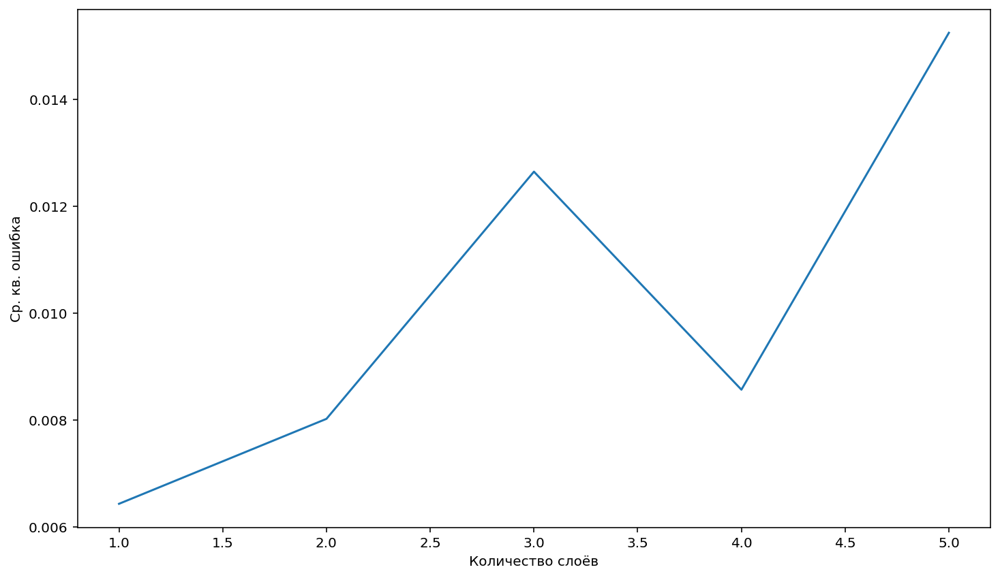

In [24]:
draw_exp(7)

In [25]:
print("___________________________________________________________________")
print("|   Число слоёв   | Число нейронов |         Ср. кв. ошибка       |")
print("|_________________________________________________________________|")
layers = [1, 2, 3, 4, 5]
for i in range(5):
  for j in range(8):
    if j == 0:
      print("          " + str(layers[i]) + "               ", str(neurons[j]) + "               ", str(loss[j][i]))
    else:
      print("          " + str(layers[i]) + "               ", str(neurons[j]) + "              ", str(loss[j][i]))
    print("|_________________________________________________________________|")

___________________________________________________________________
|   Число слоёв   | Число нейронов |         Ср. кв. ошибка       |
|_________________________________________________________________|
          1                5                0.0030874982476234436
|_________________________________________________________________|
          1                10               0.014798757620155811
|_________________________________________________________________|
          1                15               0.07810219377279282
|_________________________________________________________________|
          1                20               0.014089704491198063
|_________________________________________________________________|
          1                25               0.014375004917383194
|_________________________________________________________________|
          1                30               0.0023257911670953035
|________________________________________________________________

In [26]:
mse = []
mae = []
predictions_test = np.array([])
predictions_train = np.array([])
def model():
  # Создание модели, добавление слоёв
  model = Sequential()

  # Входной слой
  model.add(Dense(60, input_dim=2, activation='relu'))

  # Определяем число скрытых слоёв и добавляем их
  layers_number = 4
  for i in range(layers_number):
    model.add(Dense(20, activation='relu'))

  # Выходной слой
  model.add(Dense(1, activation='linear'))
  # Компилируем модель
  model.compile(loss="mean_squared_error", optimizer="adam")
  history = model.fit(xy, zz, epochs = 700)
  mse.append(history.history['loss'][-1])
  predictions_test = model.predict(test_data)
  predictions_train = model.predict(xy)
  return history

In [27]:
n = 10
xy=[] 
zz=[] 
x, y = get_regular_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


1/4 [======>.......................] - ETA: 1s - loss: 0.6490

4/4 [==============================] - 0s 5ms/step - loss: 0.5570


Epoch 2/700
1/4 [======>.......................] - ETA: 0s - loss: 0.5556

4/4 [==============================] - 0s 9ms/step - loss: 0.5004


Epoch 3/700


1/4 [======>.......................] - ETA: 0s - loss: 0.4134

4/4 [==============================] - 0s 2ms/step - loss: 0.4439


Epoch 4/700
1/4 [======>.......................] - ETA: 0s - loss: 0.4465

2/4 [==============>...............] - ETA: 0s - loss: 0.4514

3/4 [=====================>........] - ETA: 0s - loss: 0.4471

4/4 [==============================] - 0s 67ms/step - loss: 0.4451


Epoch 5/700
1/4 [======>.......................] - ETA: 0s - loss: 0.4177

2/4 [==============>...............] - ETA: 0s - loss: 0.4366

4/4 [==============================] - 0s 29ms/step - loss: 0.4329


Epoch 6/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3743

4/4 [==============================] - 0s 3ms/step - loss: 0.4138


Epoch 7/700
1/4 [======>.......................] - ETA: 0s - loss: 0.5283

3/4 [=====================>........] - ETA: 0s - loss: 0.4612

4/4 [==============================] - 0s 26ms/step - loss: 0.4409


Epoch 8/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3554

4/4 [==============================] - 0s 2ms/step - loss: 0.3835


Epoch 9/700


1/4 [======>.......................] - ETA: 0s - loss: 0.4647

4/4 [==============================] - 0s 2ms/step - loss: 0.4089


Epoch 10/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3477

4/4 [==============================] - 0s 3ms/step - loss: 0.3654


Epoch 11/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3768

4/4 [==============================] - 0s 2ms/step - loss: 0.3691


Epoch 12/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3169

4/4 [==============================] - 0s 8ms/step - loss: 0.3469


Epoch 13/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3459

4/4 [==============================] - 0s 3ms/step - loss: 0.3448


Epoch 14/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2939

4/4 [==============================] - 0s 3ms/step - loss: 0.3179


Epoch 15/700


1/4 [======>.......................] - ETA: 0s - loss: 0.3972

4/4 [==============================] - 0s 3ms/step - loss: 0.3333


Epoch 16/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2638

4/4 [==============================] - 0s 2ms/step - loss: 0.2905


Epoch 17/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2976

4/4 [==============================] - 0s 2ms/step - loss: 0.2972


Epoch 18/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3008

4/4 [==============================] - 0s 2ms/step - loss: 0.2845


Epoch 19/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3410

4/4 [==============================] - 0s 2ms/step - loss: 0.2996


Epoch 20/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2579

4/4 [==============================] - 0s 2ms/step - loss: 0.2689


Epoch 21/700


1/4 [======>.......................] - ETA: 0s - loss: 0.3320

2/4 [==============>...............] - ETA: 0s - loss: 0.3151

4/4 [==============================] - 0s 22ms/step - loss: 0.2888


Epoch 22/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1629

4/4 [==============================] - 0s 2ms/step - loss: 0.2421


Epoch 23/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2259

2/4 [==============>...............] - ETA: 0s - loss: 0.2337

4/4 [==============================] - 0s 20ms/step - loss: 0.2455


Epoch 24/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2806

4/4 [==============================] - 0s 2ms/step - loss: 0.2501


Epoch 25/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2310

3/4 [=====================>........] - ETA: 0s - loss: 0.2439

4/4 [==============================] - 0s 18ms/step - loss: 0.2398


Epoch 26/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2392

4/4 [==============================] - 0s 2ms/step - loss: 0.2282


Epoch 27/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2575

4/4 [==============================] - 0s 2ms/step - loss: 0.2295


Epoch 28/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1827

4/4 [==============================] - 0s 3ms/step - loss: 0.2134


Epoch 29/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2159

4/4 [==============================] - 0s 2ms/step - loss: 0.2132


Epoch 30/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2091

4/4 [==============================] - 0s 2ms/step - loss: 0.2137


Epoch 31/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1623

4/4 [==============================] - 0s 3ms/step - loss: 0.1966


Epoch 32/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1683

4/4 [==============================] - 0s 2ms/step - loss: 0.1866


Epoch 33/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2282

2/4 [==============>...............] - ETA: 0s - loss: 0.2174

4/4 [==============================] - 0s 40ms/step - loss: 0.2008


Epoch 34/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2070

3/4 [=====================>........] - ETA: 0s - loss: 0.1958

4/4 [==============================] - 0s 40ms/step - loss: 0.1932


Epoch 35/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2100

4/4 [==============================] - 0s 4ms/step - loss: 0.1957


Epoch 36/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1830

4/4 [==============================] - 0s 3ms/step - loss: 0.1790


Epoch 37/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1102

4/4 [==============================] - ETA: 0s - loss: 0.1442

4/4 [==============================] - 0s 23ms/step - loss: 0.1493


Epoch 38/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1733

4/4 [==============================] - 0s 2ms/step - loss: 0.1624


Epoch 39/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1607

3/4 [=====================>........] - ETA: 0s - loss: 0.1545

4/4 [==============================] - 0s 18ms/step - loss: 0.1557


Epoch 40/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1677

4/4 [==============================] - 0s 4ms/step - loss: 0.1673


Epoch 41/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1929

4/4 [==============================] - 0s 2ms/step - loss: 0.1674


Epoch 42/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1694

2/4 [==============>...............] - ETA: 0s - loss: 0.1572

4/4 [==============================] - 0s 20ms/step - loss: 0.1527


Epoch 43/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1246

4/4 [==============================] - 0s 2ms/step - loss: 0.1382


Epoch 44/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2310

3/4 [=====================>........] - ETA: 0s - loss: 0.1904

4/4 [==============================] - 0s 18ms/step - loss: 0.1768


Epoch 45/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1539

4/4 [==============================] - 0s 3ms/step - loss: 0.1563


Epoch 46/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1607

4/4 [==============================] - 0s 5ms/step - loss: 0.1557


Epoch 47/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1532

4/4 [==============================] - 0s 3ms/step - loss: 0.1492


Epoch 48/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1341

4/4 [==============================] - 0s 3ms/step - loss: 0.1412


Epoch 49/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1099

4/4 [==============================] - ETA: 0s - loss: 0.1273

4/4 [==============================] - 0s 18ms/step - loss: 0.1303


Epoch 50/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1594

4/4 [==============================] - 0s 3ms/step - loss: 0.1476


Epoch 51/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1681

4/4 [==============================] - 0s 16ms/step - loss: 0.1535


Epoch 52/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1065

4/4 [==============================] - 0s 2ms/step - loss: 0.1294


Epoch 53/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1804

2/4 [==============>...............] - ETA: 0s - loss: 0.1609

4/4 [==============================] - 0s 19ms/step - loss: 0.1392


Epoch 54/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1621

4/4 [==============================] - 0s 3ms/step - loss: 0.1306


Epoch 55/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1017

4/4 [==============================] - 0s 4ms/step - loss: 0.1156


Epoch 56/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1127

4/4 [==============================] - ETA: 0s - loss: 0.1102

4/4 [==============================] - 0s 17ms/step - loss: 0.1117


Epoch 57/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0808

4/4 [==============================] - 0s 3ms/step - loss: 0.1096


Epoch 58/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1288

4/4 [==============================] - 0s 2ms/step - loss: 0.1213


Epoch 59/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0999

4/4 [==============================] - 0s 2ms/step - loss: 0.1072


Epoch 60/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0830

4/4 [==============================] - 0s 3ms/step - loss: 0.1048


Epoch 61/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0682

4/4 [==============================] - 0s 3ms/step - loss: 0.1014


Epoch 62/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1135

4/4 [==============================] - 0s 4ms/step - loss: 0.1047


Epoch 63/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0721

4/4 [==============================] - ETA: 0s - loss: 0.0912

4/4 [==============================] - 0s 29ms/step - loss: 0.0924


Epoch 64/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0575

4/4 [==============================] - ETA: 0s - loss: 0.0815

4/4 [==============================] - 0s 39ms/step - loss: 0.0841


Epoch 65/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0844

4/4 [==============================] - 0s 2ms/step - loss: 0.0884


Epoch 66/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0743

4/4 [==============================] - 0s 2ms/step - loss: 0.0875


Epoch 67/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1214

4/4 [==============================] - 0s 2ms/step - loss: 0.1043


Epoch 68/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0798

4/4 [==============================] - 0s 3ms/step - loss: 0.0828


Epoch 69/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1027

4/4 [==============================] - ETA: 0s - loss: 0.0928

4/4 [==============================] - 0s 22ms/step - loss: 0.0905


Epoch 70/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0795

4/4 [==============================] - 0s 2ms/step - loss: 0.0868


Epoch 71/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0868

4/4 [==============================] - 0s 2ms/step - loss: 0.0847


Epoch 72/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0777

4/4 [==============================] - 0s 2ms/step - loss: 0.0738


Epoch 73/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0889

4/4 [==============================] - 0s 3ms/step - loss: 0.0781


Epoch 74/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0561

4/4 [==============================] - 0s 2ms/step - loss: 0.0693


Epoch 75/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0695

4/4 [==============================] - 0s 2ms/step - loss: 0.0719


Epoch 76/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0481

4/4 [==============================] - 0s 3ms/step - loss: 0.0712


Epoch 77/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0753

4/4 [==============================] - 0s 2ms/step - loss: 0.0760


Epoch 78/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0481

4/4 [==============================] - 0s 3ms/step - loss: 0.0613


Epoch 79/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0606

4/4 [==============================] - 0s 2ms/step - loss: 0.0604


Epoch 80/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0776

3/4 [=====================>........] - ETA: 0s - loss: 0.0716

4/4 [==============================] - 0s 20ms/step - loss: 0.0684


Epoch 81/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0636

4/4 [==============================] - 0s 2ms/step - loss: 0.0615


Epoch 82/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0802

4/4 [==============================] - 0s 2ms/step - loss: 0.0657


Epoch 83/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0454

4/4 [==============================] - 0s 2ms/step - loss: 0.0549


Epoch 84/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0582

2/4 [==============>...............] - ETA: 0s - loss: 0.0519

4/4 [==============================] - 0s 31ms/step - loss: 0.0519


Epoch 85/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0240

2/4 [==============>...............] - ETA: 0s - loss: 0.0335

4/4 [==============================] - 0s 72ms/step - loss: 0.0493


Epoch 86/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0663

4/4 [==============================] - 0s 3ms/step - loss: 0.0559


Epoch 87/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0246

4/4 [==============================] - 0s 2ms/step - loss: 0.0426


Epoch 88/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0315

2/4 [==============>...............] - ETA: 0s - loss: 0.0381

4/4 [==============================] - 0s 25ms/step - loss: 0.0438


Epoch 89/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0290

4/4 [==============================] - 0s 2ms/step - loss: 0.0407


Epoch 90/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0359

4/4 [==============================] - 0s 2ms/step - loss: 0.0427


Epoch 91/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0274

4/4 [==============================] - 0s 2ms/step - loss: 0.0374


Epoch 92/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0564

4/4 [==============================] - 0s 3ms/step - loss: 0.0437


Epoch 93/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0267

4/4 [==============================] - 0s 2ms/step - loss: 0.0345


Epoch 94/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0333

4/4 [==============================] - ETA: 0s - loss: 0.0343

4/4 [==============================] - 0s 20ms/step - loss: 0.0349


Epoch 95/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0459

4/4 [==============================] - 0s 2ms/step - loss: 0.0349


Epoch 96/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0205

4/4 [==============================] - 0s 2ms/step - loss: 0.0277


Epoch 97/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0224

4/4 [==============================] - 0s 2ms/step - loss: 0.0300


Epoch 98/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0443

4/4 [==============================] - 0s 2ms/step - loss: 0.0330


Epoch 99/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0198

4/4 [==============================] - 0s 2ms/step - loss: 0.0249


Epoch 100/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0321

4/4 [==============================] - 0s 3ms/step - loss: 0.0278


Epoch 101/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0257

4/4 [==============================] - 0s 2ms/step - loss: 0.0241


Epoch 102/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0240

4/4 [==============================] - 0s 2ms/step - loss: 0.0234


Epoch 103/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0174

4/4 [==============================] - 0s 2ms/step - loss: 0.0220


Epoch 104/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0274

4/4 [==============================] - 0s 2ms/step - loss: 0.0241


Epoch 105/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0279

3/4 [=====================>........] - ETA: 0s - loss: 0.0261

4/4 [==============================] - ETA: 0s - loss: 0.0251

4/4 [==============================] - 0s 160ms/step - loss: 0.0245


Epoch 106/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0259

2/4 [==============>...............] - ETA: 0s - loss: 0.0254

4/4 [==============================] - 0s 23ms/step - loss: 0.0230


Epoch 107/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0197

4/4 [==============================] - 0s 3ms/step - loss: 0.0190


Epoch 108/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0182

2/4 [==============>...............] - ETA: 0s - loss: 0.0162

4/4 [==============================] - 0s 28ms/step - loss: 0.0168


Epoch 109/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0132

4/4 [==============================] - 0s 2ms/step - loss: 0.0162


Epoch 110/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0151

4/4 [==============================] - 0s 2ms/step - loss: 0.0167


Epoch 111/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0153

4/4 [==============================] - 0s 2ms/step - loss: 0.0143


Epoch 112/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0090

4/4 [==============================] - ETA: 0s - loss: 0.0134

4/4 [==============================] - 0s 22ms/step - loss: 0.0136


Epoch 113/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0157

4/4 [==============================] - 0s 3ms/step - loss: 0.0163


Epoch 114/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0098

4/4 [==============================] - 0s 2ms/step - loss: 0.0142


Epoch 115/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0143

4/4 [==============================] - ETA: 0s - loss: 0.0146

4/4 [==============================] - 0s 30ms/step - loss: 0.0145


Epoch 116/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0133

4/4 [==============================] - 0s 2ms/step - loss: 0.0138


Epoch 117/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0135

3/4 [=====================>........] - ETA: 0s - loss: 0.0180

4/4 [==============================] - 0s 30ms/step - loss: 0.0182


Epoch 118/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0169

4/4 [==============================] - 0s 3ms/step - loss: 0.0185


Epoch 119/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0115

2/4 [==============>...............] - ETA: 0s - loss: 0.0116

4/4 [==============================] - 0s 31ms/step - loss: 0.0132


Epoch 120/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0198

3/4 [=====================>........] - ETA: 0s - loss: 0.0204

4/4 [==============================] - 0s 24ms/step - loss: 0.0201


Epoch 121/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0087

4/4 [==============================] - 0s 2ms/step - loss: 0.0146


Epoch 122/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0097

4/4 [==============================] - 0s 3ms/step - loss: 0.0114


Epoch 123/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0166

4/4 [==============================] - 0s 3ms/step - loss: 0.0155


Epoch 124/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0095

2/4 [==============>...............] - ETA: 0s - loss: 0.0093

4/4 [==============================] - 0s 23ms/step - loss: 0.0095


Epoch 125/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0120

4/4 [==============================] - 0s 2ms/step - loss: 0.0101


Epoch 126/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0063

4/4 [==============================] - 0s 2ms/step - loss: 0.0104


Epoch 127/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0064

4/4 [==============================] - 0s 3ms/step - loss: 0.0077


Epoch 128/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0077

4/4 [==============================] - 0s 3ms/step - loss: 0.0077


Epoch 129/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0052

2/4 [==============>...............] - ETA: 0s - loss: 0.0064

4/4 [==============================] - ETA: 0s - loss: 0.0069

4/4 [==============================] - 0s 123ms/step - loss: 0.0070


Epoch 130/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 3ms/step - loss: 0.0067


Epoch 131/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0056

4/4 [==============================] - ETA: 0s - loss: 0.0062

4/4 [==============================] - 0s 30ms/step - loss: 0.0062


Epoch 132/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0045

3/4 [=====================>........] - ETA: 0s - loss: 0.0070

4/4 [==============================] - 0s 28ms/step - loss: 0.0079


Epoch 133/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 2ms/step - loss: 0.0068


Epoch 134/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0075

4/4 [==============================] - 0s 3ms/step - loss: 0.0088


Epoch 135/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0081

4/4 [==============================] - 0s 3ms/step - loss: 0.0065


Epoch 136/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0050

4/4 [==============================] - 0s 2ms/step - loss: 0.0052


Epoch 137/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0042

4/4 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 138/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0065

4/4 [==============================] - 0s 2ms/step - loss: 0.0055


Epoch 139/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 140/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0055

4/4 [==============================] - 0s 2ms/step - loss: 0.0056


Epoch 141/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0081

4/4 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 142/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0154

4/4 [==============================] - 0s 2ms/step - loss: 0.0131


Epoch 143/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0095

4/4 [==============================] - 0s 3ms/step - loss: 0.0089


Epoch 144/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0104

2/4 [==============>...............] - ETA: 0s - loss: 0.0112

3/4 [=====================>........] - ETA: 0s - loss: 0.0115

4/4 [==============================] - 0s 97ms/step - loss: 0.0115


Epoch 145/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0089

2/4 [==============>...............] - ETA: 0s - loss: 0.0083

3/4 [=====================>........] - ETA: 0s - loss: 0.0083

4/4 [==============================] - 0s 65ms/step - loss: 0.0085


Epoch 146/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0035

4/4 [==============================] - 0s 4ms/step - loss: 0.0047


Epoch 147/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0099

4/4 [==============================] - 0s 2ms/step - loss: 0.0103


Epoch 148/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0058

4/4 [==============================] - 0s 2ms/step - loss: 0.0071


Epoch 149/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0144

4/4 [==============================] - 0s 2ms/step - loss: 0.0112


Epoch 150/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0063

4/4 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 151/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 152/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0053

4/4 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 153/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0039

4/4 [==============================] - 0s 2ms/step - loss: 0.0044


Epoch 154/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 155/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 5ms/step - loss: 0.0029


Epoch 156/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 157/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 3ms/step - loss: 0.0019


Epoch 158/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 159/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

2/4 [==============>...............] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 37ms/step - loss: 0.0031


Epoch 160/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0030

3/4 [=====================>........] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 28ms/step - loss: 0.0025


Epoch 161/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 4ms/step - loss: 0.0025


Epoch 162/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

2/4 [==============>...............] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 29ms/step - loss: 0.0021


Epoch 163/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 164/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

2/4 [==============>...............] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 24ms/step - loss: 0.0023


Epoch 165/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

4/4 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 166/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 167/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 168/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 169/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 170/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6312e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 171/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 24ms/step - loss: 0.0013


Epoch 172/700
1/4 [======>.......................] - ETA: 0s - loss: 9.3393e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 173/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 174/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 175/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 176/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

2/4 [==============>...............] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 30ms/step - loss: 0.0013


Epoch 177/700


1/4 [======>.......................] - ETA: 0s - loss: 9.8564e-04

4/4 [==============================] - 0s 7ms/step - loss: 0.0011


Epoch 178/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 179/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

3/4 [=====================>........] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 21ms/step - loss: 0.0012


Epoch 180/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 181/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 182/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

3/4 [=====================>........] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 22ms/step - loss: 0.0011


Epoch 183/700
1/4 [======>.......................] - ETA: 0s - loss: 7.7248e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 184/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 185/700


1/4 [======>.......................] - ETA: 0s - loss: 5.4464e-04

2/4 [==============>...............] - ETA: 0s - loss: 6.8278e-04

4/4 [==============================] - 0s 23ms/step - loss: 8.7119e-04


Epoch 186/700
1/4 [======>.......................] - ETA: 0s - loss: 7.9809e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.6123e-04


Epoch 187/700
1/4 [======>.......................] - ETA: 0s - loss: 7.0936e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.4017e-04


Epoch 188/700


1/4 [======>.......................] - ETA: 0s - loss: 5.4178e-04

3/4 [=====================>........] - ETA: 0s - loss: 7.1845e-04

4/4 [==============================] - 0s 24ms/step - loss: 7.5442e-04


Epoch 189/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 8.9966e-04


Epoch 190/700
1/4 [======>.......................] - ETA: 0s - loss: 6.8201e-04

2/4 [==============>...............] - ETA: 0s - loss: 6.9521e-04

4/4 [==============================] - 0s 29ms/step - loss: 7.4197e-04


Epoch 191/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 192/700
1/4 [======>.......................] - ETA: 0s - loss: 6.7103e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 193/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 5ms/step - loss: 0.0015


Epoch 194/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 6ms/step - loss: 0.0010


Epoch 195/700


1/4 [======>.......................] - ETA: 0s - loss: 6.6563e-04

4/4 [==============================] - 0s 3ms/step - loss: 9.0043e-04


Epoch 196/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 197/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 3ms/step - loss: 9.4122e-04


Epoch 198/700
1/4 [======>.......................] - ETA: 0s - loss: 6.0467e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 199/700
1/4 [======>.......................] - ETA: 0s - loss: 5.6834e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.6473e-04


Epoch 200/700


1/4 [======>.......................] - ETA: 0s - loss: 4.4477e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.9316e-04


Epoch 201/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7444e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.6356e-04


Epoch 202/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 203/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7744e-04



4/4 [==============================] - 0s 2ms/step - loss: 8.2217e-04


Epoch 204/700
1/4 [======>.......................] - ETA: 0s - loss: 9.0635e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.3824e-04


Epoch 205/700
1/4 [======>.......................] - ETA: 0s - loss: 3.7445e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.4669e-04


Epoch 206/700


1/4 [======>.......................] - ETA: 0s - loss: 8.8364e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.2616e-04


Epoch 207/700


1/4 [======>.......................] - ETA: 0s - loss: 9.7206e-04

4/4 [==============================] - 0s 4ms/step - loss: 6.9962e-04


Epoch 208/700


1/4 [======>.......................] - ETA: 0s - loss: 8.9361e-04

3/4 [=====================>........] - ETA: 0s - loss: 7.9729e-04

4/4 [==============================] - 0s 28ms/step - loss: 7.6902e-04


Epoch 209/700
1/4 [======>.......................] - ETA: 0s - loss: 9.2058e-04

2/4 [==============>...............] - ETA: 0s - loss: 8.6061e-04

4/4 [==============================] - 0s 33ms/step - loss: 9.2393e-04


Epoch 210/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 8.2074e-04


Epoch 211/700
1/4 [======>.......................] - ETA: 0s - loss: 7.3535e-04

4/4 [==============================] - ETA: 0s - loss: 6.8614e-04

4/4 [==============================] - 0s 27ms/step - loss: 6.9250e-04


Epoch 212/700


1/4 [======>.......................] - ETA: 0s - loss: 6.3377e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.8374e-04


Epoch 213/700


1/4 [======>.......................] - ETA: 0s - loss: 9.2540e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.9230e-04


Epoch 214/700
1/4 [======>.......................] - ETA: 0s - loss: 8.2178e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.8338e-04


Epoch 215/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2392e-04

3/4 [=====================>........] - ETA: 0s - loss: 5.5700e-04

4/4 [==============================] - 0s 22ms/step - loss: 6.0067e-04


Epoch 216/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2229e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 217/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 218/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7251e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 219/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 220/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8387e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 221/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 222/700
1/4 [======>.......................] - ETA: 0s - loss: 7.4297e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 223/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 224/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 22ms/step - loss: 0.0014


Epoch 225/700
1/4 [======>.......................] - ETA: 0s - loss: 9.3483e-04

2/4 [==============>...............] - ETA: 0s - loss: 0.0010    

4/4 [==============================] - 0s 27ms/step - loss: 0.0017


Epoch 226/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 227/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 3ms/step - loss: 0.0031


Epoch 228/700


1/4 [======>.......................] - ETA: 0s - loss: 9.1566e-04

2/4 [==============>...............] - ETA: 0s - loss: 8.5854e-04

4/4 [==============================] - 0s 29ms/step - loss: 8.8922e-04


Epoch 229/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 4ms/step - loss: 0.0018


Epoch 230/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 231/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 232/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 4ms/step - loss: 0.0013


Epoch 233/700


1/4 [======>.......................] - ETA: 0s - loss: 7.9153e-04

4/4 [==============================] - 0s 5ms/step - loss: 7.9845e-04


Epoch 234/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 235/700
1/4 [======>.......................] - ETA: 0s - loss: 8.8081e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.2530e-04


Epoch 236/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 237/700


1/4 [======>.......................] - ETA: 0s - loss: 7.5645e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.2353e-04


Epoch 238/700


1/4 [======>.......................] - ETA: 0s - loss: 8.1253e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.4175e-04


Epoch 239/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6142e-04

3/4 [=====================>........] - ETA: 0s - loss: 4.4844e-04

4/4 [==============================] - 0s 24ms/step - loss: 5.1843e-04


Epoch 240/700


1/4 [======>.......................] - ETA: 0s - loss: 7.0957e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.5704e-04


Epoch 241/700


1/4 [======>.......................] - ETA: 0s - loss: 6.7900e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.3238e-04


Epoch 242/700
1/4 [======>.......................] - ETA: 0s - loss: 8.8322e-04

3/4 [=====================>........] - ETA: 0s - loss: 7.7577e-04

4/4 [==============================] - 0s 21ms/step - loss: 7.4559e-04


Epoch 243/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0048e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.3644e-04


Epoch 244/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6899e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.1142e-04


Epoch 245/700


1/4 [======>.......................] - ETA: 0s - loss: 5.4168e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.8526e-04


Epoch 246/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9802e-04

4/4 [==============================] - ETA: 0s - loss: 4.8507e-04

4/4 [==============================] - 0s 29ms/step - loss: 4.9895e-04


Epoch 247/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2145e-04

3/4 [=====================>........] - ETA: 0s - loss: 3.4903e-04

4/4 [==============================] - 0s 31ms/step - loss: 3.7074e-04


Epoch 248/700


1/4 [======>.......................] - ETA: 0s - loss: 3.9307e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.6340e-04

4/4 [==============================] - 0s 31ms/step - loss: 5.2409e-04


Epoch 249/700


1/4 [======>.......................] - ETA: 0s - loss: 5.0590e-04

4/4 [==============================] - ETA: 0s - loss: 5.1806e-04

4/4 [==============================] - 0s 28ms/step - loss: 5.1531e-04


Epoch 250/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9656e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.3338e-04


Epoch 251/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9132e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.5365e-04


Epoch 252/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8898e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.7082e-04


Epoch 253/700


1/4 [======>.......................] - ETA: 0s - loss: 5.2091e-04

2/4 [==============>...............] - ETA: 0s - loss: 5.3478e-04

4/4 [==============================] - 0s 24ms/step - loss: 5.9617e-04


Epoch 254/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 255/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1733e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.0287e-04


Epoch 256/700


1/4 [======>.......................] - ETA: 0s - loss: 5.4438e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.9293e-04


Epoch 257/700


1/4 [======>.......................] - ETA: 0s - loss: 6.0200e-04

4/4 [==============================] - ETA: 0s - loss: 5.3715e-04

4/4 [==============================] - 0s 23ms/step - loss: 5.2863e-04


Epoch 258/700


1/4 [======>.......................] - ETA: 0s - loss: 7.9162e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.1475e-04


Epoch 259/700


1/4 [======>.......................] - ETA: 0s - loss: 4.7823e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.8357e-04


Epoch 260/700


1/4 [======>.......................] - ETA: 0s - loss: 5.1126e-04

2/4 [==============>...............] - ETA: 0s - loss: 6.4914e-04

4/4 [==============================] - ETA: 0s - loss: 6.7938e-04

4/4 [==============================] - 0s 134ms/step - loss: 6.8397e-04


Epoch 261/700


1/4 [======>.......................] - ETA: 0s - loss: 2.8667e-04

4/4 [==============================] - 0s 4ms/step - loss: 4.1469e-04


Epoch 262/700


1/4 [======>.......................] - ETA: 0s - loss: 4.6044e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.7048e-04

4/4 [==============================] - 0s 28ms/step - loss: 4.6312e-04


Epoch 263/700


1/4 [======>.......................] - ETA: 0s - loss: 1.8861e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.5302e-04


Epoch 264/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9965e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.3073e-04

4/4 [==============================] - 0s 27ms/step - loss: 4.3507e-04


Epoch 265/700
1/4 [======>.......................] - ETA: 0s - loss: 5.3251e-04

2/4 [==============>...............] - ETA: 0s - loss: 5.3342e-04

4/4 [==============================] - 0s 21ms/step - loss: 4.6798e-04


Epoch 266/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8834e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.4900e-04


Epoch 267/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5592e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.9019e-04


Epoch 268/700


1/4 [======>.......................] - ETA: 0s - loss: 3.0352e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.1345e-04


Epoch 269/700


1/4 [======>.......................] - ETA: 0s - loss: 3.0260e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.1808e-04

4/4 [==============================] - 0s 23ms/step - loss: 5.0643e-04


Epoch 270/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0805e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.7141e-04


Epoch 271/700


1/4 [======>.......................] - ETA: 0s - loss: 2.1677e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.1414e-04


Epoch 272/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 273/700
1/4 [======>.......................] - ETA: 0s - loss: 5.3238e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 274/700
1/4 [======>.......................] - ETA: 0s - loss: 3.7308e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.7549e-04


Epoch 275/700
1/4 [======>.......................] - ETA: 0s - loss: 7.4012e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.3195e-04


Epoch 276/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8498e-04

3/4 [=====================>........] - ETA: 0s - loss: 5.8353e-04

4/4 [==============================] - ETA: 0s - loss: 6.6790e-04

4/4 [==============================] - 0s 100ms/step - loss: 7.1853e-04


Epoch 277/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 278/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 29ms/step - loss: 0.0018


Epoch 279/700


1/4 [======>.......................] - ETA: 0s - loss: 5.1006e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.6360e-04


Epoch 280/700
1/4 [======>.......................] - ETA: 0s - loss: 7.4043e-04

2/4 [==============>...............] - ETA: 0s - loss: 8.3052e-04

4/4 [==============================] - 0s 28ms/step - loss: 8.1368e-04


Epoch 281/700
1/4 [======>.......................] - ETA: 0s - loss: 4.2322e-04

4/4 [==============================] - 0s 3ms/step - loss: 9.9151e-04


Epoch 282/700
1/4 [======>.......................] - ETA: 0s - loss: 6.4323e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.5674e-04


Epoch 283/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 284/700


1/4 [======>.......................] - ETA: 0s - loss: 6.2235e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.1761e-04


Epoch 285/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 286/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 287/700


1/4 [======>.......................] - ETA: 0s - loss: 6.8586e-04

4/4 [==============================] - 0s 3ms/step - loss: 5.1986e-04


Epoch 288/700


1/4 [======>.......................] - ETA: 0s - loss: 4.1385e-04

4/4 [==============================] - 0s 4ms/step - loss: 5.0938e-04


Epoch 289/700
1/4 [======>.......................] - ETA: 0s - loss: 6.0381e-04

3/4 [=====================>........] - ETA: 0s - loss: 0.0010    

4/4 [==============================] - 0s 20ms/step - loss: 0.0011


Epoch 290/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 291/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2894e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.8527e-04


Epoch 292/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0664e-04

3/4 [=====================>........] - ETA: 0s - loss: 5.7849e-04

4/4 [==============================] - 0s 25ms/step - loss: 6.4882e-04


Epoch 293/700


1/4 [======>.......................] - ETA: 0s - loss: 3.4128e-04

2/4 [==============>...............] - ETA: 0s - loss: 3.5949e-04

4/4 [==============================] - 0s 31ms/step - loss: 5.9195e-04


Epoch 294/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

2/4 [==============>...............] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 21ms/step - loss: 9.4113e-04


Epoch 295/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

3/4 [=====================>........] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 34ms/step - loss: 0.0012


Epoch 296/700
1/4 [======>.......................] - ETA: 0s - loss: 9.3797e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.7798e-04


Epoch 297/700


1/4 [======>.......................] - ETA: 0s - loss: 5.5901e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.3100e-04


Epoch 298/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

2/4 [==============>...............] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 23ms/step - loss: 0.0013


Epoch 299/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 300/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6820e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 301/700


1/4 [======>.......................] - ETA: 0s - loss: 9.1310e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 302/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

2/4 [==============>...............] - ETA: 0s - loss: 9.9348e-04

4/4 [==============================] - 0s 23ms/step - loss: 0.0012


Epoch 303/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2938e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.3272e-04


Epoch 304/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7050e-04

4/4 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 305/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0054

2/4 [==============>...............] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 22ms/step - loss: 0.0032


Epoch 306/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 307/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 26ms/step - loss: 0.0029


Epoch 308/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0116

4/4 [==============================] - 0s 3ms/step - loss: 0.0063


Epoch 309/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

3/4 [=====================>........] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 31ms/step - loss: 0.0020


Epoch 310/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5033e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 311/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 312/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 4ms/step - loss: 0.0015


Epoch 313/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

3/4 [=====================>........] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 31ms/step - loss: 0.0014


Epoch 314/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6455e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.3397e-04


Epoch 315/700
1/4 [======>.......................] - ETA: 0s - loss: 4.6301e-04

4/4 [==============================] - ETA: 0s - loss: 5.8293e-04

4/4 [==============================] - 0s 24ms/step - loss: 6.0335e-04


Epoch 316/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9045e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.3778e-04


Epoch 317/700


1/4 [======>.......................] - ETA: 0s - loss: 7.9619e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 318/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 19ms/step - loss: 0.0014


Epoch 319/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5988e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.2905e-04


Epoch 320/700


1/4 [======>.......................] - ETA: 0s - loss: 4.4756e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.5580e-04


Epoch 321/700
1/4 [======>.......................] - ETA: 0s - loss: 8.2572e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.5873e-04


Epoch 322/700
1/4 [======>.......................] - ETA: 0s - loss: 7.3623e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.4039e-04


Epoch 323/700


1/4 [======>.......................] - ETA: 0s - loss: 6.7249e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.6684e-04


Epoch 324/700


1/4 [======>.......................] - ETA: 0s - loss: 4.2404e-04

4/4 [==============================] - 0s 4ms/step - loss: 4.1293e-04


Epoch 325/700


1/4 [======>.......................] - ETA: 0s - loss: 4.5770e-04

3/4 [=====================>........] - ETA: 0s - loss: 4.1880e-04

4/4 [==============================] - 0s 28ms/step - loss: 4.2486e-04


Epoch 326/700
1/4 [======>.......................] - ETA: 0s - loss: 7.1365e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 327/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 328/700


1/4 [======>.......................] - ETA: 0s - loss: 3.6813e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.2571e-04

3/4 [=====================>........] - ETA: 0s - loss: 4.9769e-04

4/4 [==============================] - 0s 65ms/step - loss: 5.5413e-04


Epoch 329/700
1/4 [======>.......................] - ETA: 0s - loss: 6.1864e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.8057e-04


Epoch 330/700

1/4 [======>.......................] - ETA: 0s - loss: 7.4926e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.2823e-04


Epoch 331/700
1/4 [======>.......................] - ETA: 0s - loss: 4.4257e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.4581e-04

4/4 [==============================] - 0s 23ms/step - loss: 4.9708e-04


Epoch 332/700
1/4 [======>.......................] - ETA: 0s - loss: 4.1090e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.1181e-04

4/4 [==============================] - 0s 22ms/step - loss: 4.2306e-04


Epoch 333/700
1/4 [======>.......................] - ETA: 0s - loss: 2.8208e-04

3/4 [=====================>........] - ETA: 0s - loss: 3.0130e-04

4/4 [==============================] - 0s 26ms/step - loss: 2.9972e-04


Epoch 334/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4889e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.7042e-04


Epoch 335/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1192e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.3391e-04


Epoch 336/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9513e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.9997e-04


Epoch 337/700
1/4 [======>.......................] - ETA: 0s - loss: 4.1115e-04

2/4 [==============>...............] - ETA: 0s - loss: 3.8622e-04

4/4 [==============================] - 0s 22ms/step - loss: 3.5951e-04


Epoch 338/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5492e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.9393e-04


Epoch 339/700


1/4 [======>.......................] - ETA: 0s - loss: 1.8612e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.0669e-04


Epoch 340/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2069e-05

4/4 [==============================] - 0s 3ms/step - loss: 1.8139e-04


Epoch 341/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2631e-04

2/4 [==============>...............] - ETA: 0s - loss: 1.3934e-04

4/4 [==============================] - 0s 33ms/step - loss: 1.5698e-04


Epoch 342/700


1/4 [======>.......................] - ETA: 0s - loss: 2.7073e-04

4/4 [==============================] - ETA: 0s - loss: 2.7087e-04

4/4 [==============================] - 0s 28ms/step - loss: 2.7204e-04


Epoch 343/700


1/4 [======>.......................] - ETA: 0s - loss: 2.2576e-04

4/4 [==============================] - ETA: 0s - loss: 2.5019e-04

4/4 [==============================] - 0s 26ms/step - loss: 2.5638e-04


Epoch 344/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4235e-04

4/4 [==============================] - ETA: 0s - loss: 3.0161e-04

4/4 [==============================] - 0s 26ms/step - loss: 2.9936e-04


Epoch 345/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6074e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.2394e-04


Epoch 346/700


1/4 [======>.......................] - ETA: 0s - loss: 2.7776e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.5489e-04


Epoch 347/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1978e-04

3/4 [=====================>........] - ETA: 0s - loss: 8.8631e-04

4/4 [==============================] - 0s 23ms/step - loss: 0.0010


Epoch 348/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

2/4 [==============>...............] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 26ms/step - loss: 0.0012


Epoch 349/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6296e-04

4/4 [==============================] - 0s 4ms/step - loss: 7.6621e-04


Epoch 350/700
1/4 [======>.......................] - ETA: 0s - loss: 3.3256e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.2401e-04


Epoch 351/700


1/4 [======>.......................] - ETA: 0s - loss: 5.2609e-04

2/4 [==============>...............] - ETA: 0s - loss: 5.6978e-04

4/4 [==============================] - 0s 35ms/step - loss: 5.5969e-04


Epoch 352/700
1/4 [======>.......................] - ETA: 0s - loss: 2.3249e-04

4/4 [==============================] - ETA: 0s - loss: 3.3009e-04

4/4 [==============================] - 0s 27ms/step - loss: 3.3804e-04


Epoch 353/700


1/4 [======>.......................] - ETA: 0s - loss: 4.3688e-04

2/4 [==============>...............] - ETA: 0s - loss: 4.4586e-04

4/4 [==============================] - ETA: 0s - loss: 4.6943e-04

4/4 [==============================] - 0s 91ms/step - loss: 4.7337e-04


Epoch 354/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8129e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.3480e-04


Epoch 355/700


1/4 [======>.......................] - ETA: 0s - loss: 6.2066e-04

4/4 [==============================] - 0s 3ms/step - loss: 5.4167e-04


Epoch 356/700


1/4 [======>.......................] - ETA: 0s - loss: 2.7405e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.0285e-04


Epoch 357/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0258e-04

4/4 [==============================] - 0s 7ms/step - loss: 3.1392e-04


Epoch 358/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4763e-04

4/4 [==============================] - ETA: 0s - loss: 4.3644e-04

4/4 [==============================] - 0s 32ms/step - loss: 4.3501e-04


Epoch 359/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5092e-04

3/4 [=====================>........] - ETA: 0s - loss: 3.4231e-04

4/4 [==============================] - ETA: 0s - loss: 3.5573e-04

4/4 [==============================] - 0s 65ms/step - loss: 3.6377e-04


Epoch 360/700


1/4 [======>.......................] - ETA: 0s - loss: 1.3606e-04

4/4 [==============================] - 0s 5ms/step - loss: 3.4287e-04


Epoch 361/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0539e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.3373e-04

4/4 [==============================] - 0s 21ms/step - loss: 2.3052e-04


Epoch 362/700
1/4 [======>.......................] - ETA: 0s - loss: 7.0565e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.5793e-04


Epoch 363/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6477e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.1180e-04

3/4 [=====================>........] - ETA: 0s - loss: 2.5499e-04

4/4 [==============================] - 0s 71ms/step - loss: 2.8842e-04


Epoch 364/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0653e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.5730e-04


Epoch 365/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8119e-04

4/4 [==============================] - 0s 4ms/step - loss: 3.0570e-04


Epoch 366/700
1/4 [======>.......................] - ETA: 0s - loss: 2.3666e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.5183e-04

4/4 [==============================] - 0s 30ms/step - loss: 2.6096e-04


Epoch 367/700
1/4 [======>.......................] - ETA: 0s - loss: 2.2811e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.5513e-04


Epoch 368/700


1/4 [======>.......................] - ETA: 0s - loss: 1.7623e-04

4/4 [==============================] - ETA: 0s - loss: 1.7143e-04

4/4 [==============================] - 0s 30ms/step - loss: 1.7068e-04


Epoch 369/700
1/4 [======>.......................] - ETA: 0s - loss: 2.2345e-04

4/4 [==============================] - 0s 5ms/step - loss: 2.3024e-04


Epoch 370/700
1/4 [======>.......................] - ETA: 0s - loss: 2.4532e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0821e-04


Epoch 371/700


1/4 [======>.......................] - ETA: 0s - loss: 1.7597e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.3664e-04


Epoch 372/700


1/4 [======>.......................] - ETA: 0s - loss: 2.2459e-04

4/4 [==============================] - 0s 5ms/step - loss: 1.8586e-04


Epoch 373/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6672e-04

4/4 [==============================] - ETA: 0s - loss: 2.7258e-04

4/4 [==============================] - 0s 38ms/step - loss: 2.8092e-04


Epoch 374/700
1/4 [======>.......................] - ETA: 0s - loss: 1.9332e-04

3/4 [=====================>........] - ETA: 0s - loss: 1.9286e-04

4/4 [==============================] - 0s 34ms/step - loss: 2.0041e-04


Epoch 375/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1180e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.1271e-04


Epoch 376/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7082e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.3386e-04


Epoch 377/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9051e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.9129e-04

4/4 [==============================] - 0s 23ms/step - loss: 3.1956e-04


Epoch 378/700
1/4 [======>.......................] - ETA: 0s - loss: 1.0038e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.8534e-04


Epoch 379/700


1/4 [======>.......................] - ETA: 0s - loss: 3.1407e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.0735e-04


Epoch 380/700
1/4 [======>.......................] - ETA: 0s - loss: 1.8141e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0192e-04


Epoch 381/700


1/4 [======>.......................] - ETA: 0s - loss: 1.4130e-04

2/4 [==============>...............] - ETA: 0s - loss: 1.9095e-04

4/4 [==============================] - 0s 24ms/step - loss: 2.0087e-04


Epoch 382/700
1/4 [======>.......................] - ETA: 0s - loss: 1.7597e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.0249e-04


Epoch 383/700
1/4 [======>.......................] - ETA: 0s - loss: 1.3915e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.7895e-04


Epoch 384/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8523e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.0025e-04


Epoch 385/700


1/4 [======>.......................] - ETA: 0s - loss: 2.8344e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.5567e-04


Epoch 386/700
1/4 [======>.......................] - ETA: 0s - loss: 1.3925e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.5167e-04


Epoch 387/700
1/4 [======>.......................] - ETA: 0s - loss: 1.8315e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.9852e-04


Epoch 388/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1252e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0418e-04


Epoch 389/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0800e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0400e-04


Epoch 390/700
1/4 [======>.......................] - ETA: 0s - loss: 1.9272e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.5958e-04


Epoch 391/700
1/4 [======>.......................] - ETA: 0s - loss: 2.3947e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.6882e-04


Epoch 392/700
1/4 [======>.......................] - ETA: 0s - loss: 4.6388e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.1801e-04


Epoch 393/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9948e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.9396e-04


Epoch 394/700


1/4 [======>.......................] - ETA: 0s - loss: 3.5074e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.1735e-04


Epoch 395/700
1/4 [======>.......................] - ETA: 0s - loss: 3.3132e-04

4/4 [==============================] - 0s 11ms/step - loss: 6.7740e-04


Epoch 396/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4898e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.2833e-04


Epoch 397/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2271e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.8038e-04


Epoch 398/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0345e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.7821e-04


Epoch 399/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0344e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.4945e-04


Epoch 400/700


1/4 [======>.......................] - ETA: 0s - loss: 1.7506e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0305e-04


Epoch 401/700
1/4 [======>.......................] - ETA: 0s - loss: 8.8427e-05

4/4 [==============================] - 0s 12ms/step - loss: 2.1302e-04


Epoch 402/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4005e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.8318e-04


Epoch 403/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7778e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.6532e-04


Epoch 404/700
1/4 [======>.......................] - ETA: 0s - loss: 5.0556e-04

4/4 [==============================] - 0s 12ms/step - loss: 5.1096e-04


Epoch 405/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5511e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 406/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9248e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.3835e-04


Epoch 407/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2314e-04



4/4 [==============================] - 0s 10ms/step - loss: 9.5455e-04


Epoch 408/700
1/4 [======>.......................] - ETA: 0s - loss: 7.7816e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 409/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0087


Epoch 410/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0105

4/4 [==============================] - 0s 3ms/step - loss: 0.0076


Epoch 411/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 2ms/step - loss: 0.0068


Epoch 412/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 2ms/step - loss: 0.0104


Epoch 413/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0175

4/4 [==============================] - 0s 4ms/step - loss: 0.0143


Epoch 414/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0060

4/4 [==============================] - 0s 2ms/step - loss: 0.0075


Epoch 415/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 2ms/step - loss: 0.0052


Epoch 416/700
1/4 [======>.......................] - ETA: 0s - loss: 8.9197e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0041


Epoch 417/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0054

4/4 [==============================] - 0s 2ms/step - loss: 0.0060


Epoch 418/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0071


Epoch 419/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 4ms/step - loss: 0.0107


Epoch 420/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0057

4/4 [==============================] - 0s 2ms/step - loss: 0.0104


Epoch 421/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0068

4/4 [==============================] - 0s 5ms/step - loss: 0.0146


Epoch 422/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0227

4/4 [==============================] - 0s 2ms/step - loss: 0.0306


Epoch 423/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0129

4/4 [==============================] - 0s 2ms/step - loss: 0.0119


Epoch 424/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0219

4/4 [==============================] - 0s 10ms/step - loss: 0.0196


Epoch 425/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0069

4/4 [==============================] - 0s 2ms/step - loss: 0.0059


Epoch 426/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0058

4/4 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 427/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 428/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 429/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0118

4/4 [==============================] - 0s 2ms/step - loss: 0.0095


Epoch 430/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0034


Epoch 431/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0058

4/4 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 432/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0039


Epoch 433/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 434/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 435/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 11ms/step - loss: 0.0023


Epoch 436/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 437/700
1/4 [======>.......................] - ETA: 0s - loss: 7.8295e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 438/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 439/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 440/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 16ms/step - loss: 0.0013


Epoch 441/700
1/4 [======>.......................] - ETA: 0s - loss: 9.6138e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.5346e-04


Epoch 442/700
1/4 [======>.......................] - ETA: 0s - loss: 9.1702e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.0602e-04


Epoch 443/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 13ms/step - loss: 0.0011


Epoch 444/700


1/4 [======>.......................] - ETA: 0s - loss: 6.9685e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.1021e-04


Epoch 445/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1385e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.2196e-04


Epoch 446/700


1/4 [======>.......................] - ETA: 0s - loss: 4.7465e-04

4/4 [==============================] - 0s 7ms/step - loss: 5.0408e-04


Epoch 447/700


1/4 [======>.......................] - ETA: 0s - loss: 5.1427e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.5935e-04


Epoch 448/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1306e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.5540e-04


Epoch 449/700
1/4 [======>.......................] - ETA: 0s - loss: 3.1546e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.7757e-04


Epoch 450/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7458e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.0930e-04


Epoch 451/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4030e-04

4/4 [==============================] - 0s 8ms/step - loss: 4.1540e-04


Epoch 452/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 7.4556e-04


Epoch 453/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0586e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.0026e-04


Epoch 454/700


1/4 [======>.......................] - ETA: 0s - loss: 4.9645e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.0198e-04


Epoch 455/700


1/4 [======>.......................] - ETA: 0s - loss: 1.9022e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.2969e-04


Epoch 456/700


1/4 [======>.......................] - ETA: 0s - loss: 2.9492e-04

4/4 [==============================] - 0s 13ms/step - loss: 2.9442e-04


Epoch 457/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0374e-04

4/4 [==============================] - 0s 4ms/step - loss: 3.8121e-04


Epoch 458/700
1/4 [======>.......................] - ETA: 0s - loss: 2.3904e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.0926e-04


Epoch 459/700


1/4 [======>.......................] - ETA: 0s - loss: 3.7677e-04

4/4 [==============================] - 0s 9ms/step - loss: 4.9435e-04


Epoch 460/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6084e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.8349e-04


Epoch 461/700


1/4 [======>.......................] - ETA: 0s - loss: 3.7129e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.9211e-04


Epoch 462/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9817e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.2164e-04


Epoch 463/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9753e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.3813e-04


Epoch 464/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1577e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.7787e-04


Epoch 465/700


1/4 [======>.......................] - ETA: 0s - loss: 2.0365e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.8891e-04


Epoch 466/700


1/4 [======>.......................] - ETA: 0s - loss: 7.0686e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.0289e-04


Epoch 467/700


1/4 [======>.......................] - ETA: 0s - loss: 2.5228e-04

4/4 [==============================] - 0s 16ms/step - loss: 2.5953e-04


Epoch 468/700


1/4 [======>.......................] - ETA: 0s - loss: 5.2934e-04

2/4 [==============>...............] - ETA: 0s - loss: 5.1924e-04

4/4 [==============================] - 0s 23ms/step - loss: 4.5269e-04


Epoch 469/700


1/4 [======>.......................] - ETA: 0s - loss: 2.3318e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.4584e-04

4/4 [==============================] - 0s 25ms/step - loss: 2.5976e-04


Epoch 470/700
1/4 [======>.......................] - ETA: 0s - loss: 1.8201e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.8627e-04


Epoch 471/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0103e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.0409e-04


Epoch 472/700


1/4 [======>.......................] - ETA: 0s - loss: 1.3802e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.1856e-04


Epoch 473/700
1/4 [======>.......................] - ETA: 0s - loss: 4.7338e-04

4/4 [==============================] - ETA: 0s - loss: 4.2645e-04

4/4 [==============================] - 0s 32ms/step - loss: 4.3035e-04


Epoch 474/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 7.7915e-04


Epoch 475/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7613e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.3754e-04


Epoch 476/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1607e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.3410e-04


Epoch 477/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6501e-04

4/4 [==============================] - 0s 6ms/step - loss: 3.7768e-04


Epoch 478/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4238e-04

2/4 [==============>...............] - ETA: 0s - loss: 1.7601e-04

3/4 [=====================>........] - ETA: 0s - loss: 2.1226e-04

4/4 [==============================] - 0s 64ms/step - loss: 2.4152e-04


Epoch 479/700


1/4 [======>.......................] - ETA: 0s - loss: 2.2514e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.6868e-04


Epoch 480/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6214e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.2590e-04


Epoch 481/700
1/4 [======>.......................] - ETA: 0s - loss: 1.9840e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.6855e-04


Epoch 482/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4350e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.3869e-04


Epoch 483/700
1/4 [======>.......................] - ETA: 0s - loss: 1.0609e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.3510e-04


Epoch 484/700
1/4 [======>.......................] - ETA: 0s - loss: 1.7769e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.0368e-04


Epoch 485/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6893e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.1350e-04

4/4 [==============================] - ETA: 0s - loss: 2.3729e-04

4/4 [==============================] - 0s 62ms/step - loss: 2.4293e-04


Epoch 486/700


1/4 [======>.......................] - ETA: 0s - loss: 2.0735e-04

2/4 [==============>...............] - ETA: 0s - loss: 2.8978e-04

3/4 [=====================>........] - ETA: 0s - loss: 3.2774e-04

4/4 [==============================] - 0s 67ms/step - loss: 3.5399e-04


Epoch 487/700
1/4 [======>.......................] - ETA: 0s - loss: 4.1662e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.3051e-04


Epoch 488/700


1/4 [======>.......................] - ETA: 0s - loss: 1.9751e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.9834e-04


Epoch 489/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0417e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.8126e-04


Epoch 490/700
1/4 [======>.......................] - ETA: 0s - loss: 1.9037e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0332e-04


Epoch 491/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6713e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.5502e-04


Epoch 492/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1310e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.2481e-04


Epoch 493/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2387e-04

4/4 [==============================] - 0s 5ms/step - loss: 3.2467e-04


Epoch 494/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0022e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.2619e-04


Epoch 495/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5224e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.7894e-04


Epoch 496/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0219e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0664e-04


Epoch 497/700
1/4 [======>.......................] - ETA: 0s - loss: 2.8240e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.9040e-04


Epoch 498/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4561e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 499/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2840e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.3336e-04


Epoch 500/700


1/4 [======>.......................] - ETA: 0s - loss: 3.5900e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.8575e-04


Epoch 501/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8192e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.5011e-04


Epoch 502/700
1/4 [======>.......................] - ETA: 0s - loss: 6.9641e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.4143e-04


Epoch 503/700
1/4 [======>.......................] - ETA: 0s - loss: 8.3977e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.7749e-04


Epoch 504/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7652e-04

4/4 [==============================] - 0s 11ms/step - loss: 3.1798e-04


Epoch 505/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0568e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.8593e-04


Epoch 506/700
1/4 [======>.......................] - ETA: 0s - loss: 3.1278e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.6531e-04


Epoch 507/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6419e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.6715e-04


Epoch 508/700


1/4 [======>.......................] - ETA: 0s - loss: 1.9563e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.7169e-04


Epoch 509/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4091e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.1925e-04


Epoch 510/700
1/4 [======>.......................] - ETA: 0s - loss: 7.1130e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.2527e-04


Epoch 511/700
1/4 [======>.......................] - ETA: 0s - loss: 1.3550e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.7916e-04


Epoch 512/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2931e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.6860e-04


Epoch 513/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5885e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.7664e-04


Epoch 514/700


1/4 [======>.......................] - ETA: 0s - loss: 6.7585e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.3236e-04


Epoch 515/700


1/4 [======>.......................] - ETA: 0s - loss: 1.7877e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.2390e-04


Epoch 516/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6281e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.5100e-04


Epoch 517/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1090e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.0328e-04


Epoch 518/700
1/4 [======>.......................] - ETA: 0s - loss: 9.2029e-05

4/4 [==============================] - 0s 2ms/step - loss: 9.5064e-05


Epoch 519/700
1/4 [======>.......................] - ETA: 0s - loss: 1.6676e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.2864e-04


Epoch 520/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2838e-04

4/4 [==============================] - 0s 10ms/step - loss: 1.2447e-04


Epoch 521/700
1/4 [======>.......................] - ETA: 0s - loss: 8.3254e-05

4/4 [==============================] - 0s 2ms/step - loss: 8.7882e-05


Epoch 522/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2345e-05

4/4 [==============================] - 0s 2ms/step - loss: 9.3392e-05


Epoch 523/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6017e-05

4/4 [==============================] - 0s 2ms/step - loss: 8.2944e-05


Epoch 524/700
1/4 [======>.......................] - ETA: 0s - loss: 5.4509e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.6658e-05


Epoch 525/700
1/4 [======>.......................] - ETA: 0s - loss: 9.0210e-05

4/4 [==============================] - 0s 11ms/step - loss: 7.7726e-05


Epoch 526/700


1/4 [======>.......................] - ETA: 0s - loss: 5.1308e-05

4/4 [==============================] - 0s 3ms/step - loss: 7.0174e-05


Epoch 527/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6860e-05

4/4 [==============================] - 0s 3ms/step - loss: 6.8387e-05


Epoch 528/700


1/4 [======>.......................] - ETA: 0s - loss: 9.1390e-05

4/4 [==============================] - 0s 2ms/step - loss: 8.6817e-05


Epoch 529/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1772e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.4046e-05


Epoch 530/700
1/4 [======>.......................] - ETA: 0s - loss: 7.8415e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.2258e-04


Epoch 531/700


1/4 [======>.......................] - ETA: 0s - loss: 8.0048e-05

4/4 [==============================] - 0s 3ms/step - loss: 9.5403e-05


Epoch 532/700


1/4 [======>.......................] - ETA: 0s - loss: 1.1821e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.3678e-04


Epoch 533/700
1/4 [======>.......................] - ETA: 0s - loss: 1.0871e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.9670e-04


Epoch 534/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2858e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.0330e-04


Epoch 535/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5142e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.9100e-04


Epoch 536/700
1/4 [======>.......................] - ETA: 0s - loss: 9.6469e-04



4/4 [==============================] - 0s 4ms/step - loss: 7.2558e-04


Epoch 537/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0158e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.4893e-04


Epoch 538/700
1/4 [======>.......................] - ETA: 0s - loss: 3.1181e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.6133e-04


Epoch 539/700


1/4 [======>.......................] - ETA: 0s - loss: 7.3308e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.0962e-04


Epoch 540/700


1/4 [======>.......................] - ETA: 0s - loss: 5.6772e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.3038e-04


Epoch 541/700
1/4 [======>.......................] - ETA: 0s - loss: 8.0515e-04

4/4 [==============================] - 0s 3ms/step - loss: 8.8720e-04


Epoch 542/700


1/4 [======>.......................] - ETA: 0s - loss: 4.5899e-04

4/4 [==============================] - 0s 3ms/step - loss: 4.8302e-04


Epoch 543/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7843e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.6237e-04


Epoch 544/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7729e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.6045e-04


Epoch 545/700


1/4 [======>.......................] - ETA: 0s - loss: 1.0524e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.2764e-04


Epoch 546/700
1/4 [======>.......................] - ETA: 0s - loss: 2.8298e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.8525e-04


Epoch 547/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1681e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.6554e-04


Epoch 548/700


1/4 [======>.......................] - ETA: 0s - loss: 2.3148e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.0891e-04


Epoch 549/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4070e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.7432e-04


Epoch 550/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5250e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.6990e-04


Epoch 551/700


1/4 [======>.......................] - ETA: 0s - loss: 9.8193e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.1631e-04


Epoch 552/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4623e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.3625e-04


Epoch 553/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6878e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.0821e-04


Epoch 554/700
1/4 [======>.......................] - ETA: 0s - loss: 6.9189e-05

4/4 [==============================] - 0s 3ms/step - loss: 7.1188e-05


Epoch 555/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5904e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.3358e-05


Epoch 556/700
1/4 [======>.......................] - ETA: 0s - loss: 6.4889e-05

4/4 [==============================] - 0s 9ms/step - loss: 6.1098e-05


Epoch 557/700


1/4 [======>.......................] - ETA: 0s - loss: 9.1815e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.5192e-05


Epoch 558/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6018e-05

4/4 [==============================] - 0s 5ms/step - loss: 8.1455e-05


Epoch 559/700
1/4 [======>.......................] - ETA: 0s - loss: 4.7472e-05

4/4 [==============================] - 0s 3ms/step - loss: 5.4606e-05


Epoch 560/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1075e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.7987e-05


Epoch 561/700
1/4 [======>.......................] - ETA: 0s - loss: 7.7187e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.6074e-05


Epoch 562/700
1/4 [======>.......................] - ETA: 0s - loss: 5.5080e-05

4/4 [==============================] - 0s 2ms/step - loss: 9.6718e-05


Epoch 563/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1514e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.6593e-04


Epoch 564/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2163e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.1085e-04


Epoch 565/700
1/4 [======>.......................] - ETA: 0s - loss: 9.9771e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.2718e-04


Epoch 566/700


1/4 [======>.......................] - ETA: 0s - loss: 5.0015e-05

4/4 [==============================] - 0s 3ms/step - loss: 1.2213e-04


Epoch 567/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2701e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.0794e-05


Epoch 568/700
1/4 [======>.......................] - ETA: 0s - loss: 5.0903e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.3451e-05


Epoch 569/700


1/4 [======>.......................] - ETA: 0s - loss: 8.5684e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.0354e-04


Epoch 570/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5280e-05

4/4 [==============================] - 0s 2ms/step - loss: 8.7768e-05


Epoch 571/700


1/4 [======>.......................] - ETA: 0s - loss: 6.1171e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.5858e-05


Epoch 572/700


1/4 [======>.......................] - ETA: 0s - loss: 7.1940e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.2485e-05


Epoch 573/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9664e-05

4/4 [==============================] - 0s 11ms/step - loss: 5.6322e-05


Epoch 574/700
1/4 [======>.......................] - ETA: 0s - loss: 5.7476e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.1317e-05


Epoch 575/700
1/4 [======>.......................] - ETA: 0s - loss: 8.4517e-05

4/4 [==============================] - 0s 3ms/step - loss: 8.4571e-05


Epoch 576/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9416e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.7304e-05


Epoch 577/700
1/4 [======>.......................] - ETA: 0s - loss: 4.2509e-05

4/4 [==============================] - 0s 3ms/step - loss: 6.2656e-05


Epoch 578/700
1/4 [======>.......................] - ETA: 0s - loss: 4.3625e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.4811e-05


Epoch 579/700
1/4 [======>.......................] - ETA: 0s - loss: 8.0909e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.6270e-05


Epoch 580/700
1/4 [======>.......................] - ETA: 0s - loss: 7.8579e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.5457e-05


Epoch 581/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6212e-05

4/4 [==============================] - 0s 3ms/step - loss: 5.5669e-05


Epoch 582/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5675e-05

4/4 [==============================] - 0s 2ms/step - loss: 6.4584e-05


Epoch 583/700
1/4 [======>.......................] - ETA: 0s - loss: 3.1131e-05

4/4 [==============================] - 0s 2ms/step - loss: 8.1182e-05


Epoch 584/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1102e-04

4/4 [==============================] - 0s 11ms/step - loss: 1.3832e-04


Epoch 585/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5009e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.4923e-04


Epoch 586/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4322e-04



4/4 [==============================] - 0s 2ms/step - loss: 1.7105e-04


Epoch 587/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5852e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.1230e-04


Epoch 588/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4831e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.3663e-04


Epoch 589/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4403e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.9079e-04


Epoch 590/700
1/4 [======>.......................] - ETA: 0s - loss: 2.7210e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.9070e-04


Epoch 591/700


1/4 [======>.......................] - ETA: 0s - loss: 3.1100e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.5830e-04


Epoch 592/700


1/4 [======>.......................] - ETA: 0s - loss: 5.7418e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 593/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1525e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.5780e-04


Epoch 594/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5001e-04

4/4 [==============================] - 0s 3ms/step - loss: 5.3895e-04


Epoch 595/700


1/4 [======>.......................] - ETA: 0s - loss: 3.5477e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.2976e-04


Epoch 596/700
1/4 [======>.......................] - ETA: 0s - loss: 5.3539e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.6700e-04


Epoch 597/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8402e-04

4/4 [==============================] - 0s 9ms/step - loss: 6.1479e-04


Epoch 598/700
1/4 [======>.......................] - ETA: 0s - loss: 4.3096e-04

4/4 [==============================] - 0s 3ms/step - loss: 5.6161e-04


Epoch 599/700
1/4 [======>.......................] - ETA: 0s - loss: 8.0804e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.0609e-04


Epoch 600/700


1/4 [======>.......................] - ETA: 0s - loss: 4.2092e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.8412e-04


Epoch 601/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9581e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.0397e-04


Epoch 602/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6050e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.5234e-04


Epoch 603/700


1/4 [======>.......................] - ETA: 0s - loss: 2.5972e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.4316e-04


Epoch 604/700
1/4 [======>.......................] - ETA: 0s - loss: 5.6987e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.4538e-04


Epoch 605/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6104e-05

4/4 [==============================] - 0s 11ms/step - loss: 7.7963e-05


Epoch 606/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0287e-04

4/4 [==============================] - 0s 2ms/step - loss: 2.1070e-04


Epoch 607/700


1/4 [======>.......................] - ETA: 0s - loss: 2.0569e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.9484e-04


Epoch 608/700


1/4 [======>.......................] - ETA: 0s - loss: 1.1282e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.6331e-04


Epoch 609/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4449e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.2717e-04


Epoch 610/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 611/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 612/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 2ms/step - loss: 0.0050


Epoch 613/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0037


Epoch 614/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0040

4/4 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 615/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 4ms/step - loss: 0.0025


Epoch 616/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 7ms/step - loss: 0.0014


Epoch 617/700
1/4 [======>.......................] - ETA: 0s - loss: 7.8224e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 618/700
1/4 [======>.......................] - ETA: 0s - loss: 3.3859e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.3860e-04


Epoch 619/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6779e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.3251e-04


Epoch 620/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0010


Epoch 621/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8099e-04

4/4 [==============================] - 0s 3ms/step - loss: 5.7150e-04


Epoch 622/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5217e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.4227e-04


Epoch 623/700
1/4 [======>.......................] - ETA: 0s - loss: 5.0265e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.3459e-04


Epoch 624/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2346e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.4132e-04


Epoch 625/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 8.6153e-04


Epoch 626/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0249e-04

4/4 [==============================] - 0s 2ms/step - loss: 5.4712e-04


Epoch 627/700
1/4 [======>.......................] - ETA: 0s - loss: 3.3158e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.8723e-04


Epoch 628/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6442e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.1776e-04


Epoch 629/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6602e-04

4/4 [==============================] - 0s 10ms/step - loss: 6.6593e-04


Epoch 630/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 9.7100e-04


Epoch 631/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0365e-04

4/4 [==============================] - 0s 2ms/step - loss: 4.8034e-04


Epoch 632/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5426e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.7638e-04


Epoch 633/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0531e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.1615e-04


Epoch 634/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4031e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.0729e-04


Epoch 635/700


1/4 [======>.......................] - ETA: 0s - loss: 1.3515e-04

4/4 [==============================] - 0s 3ms/step - loss: 2.8591e-04


Epoch 636/700
1/4 [======>.......................] - ETA: 0s - loss: 1.3553e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.6224e-04


Epoch 637/700


1/4 [======>.......................] - ETA: 0s - loss: 5.8369e-05

4/4 [==============================] - 0s 3ms/step - loss: 8.1316e-05


Epoch 638/700
1/4 [======>.......................] - ETA: 0s - loss: 8.8419e-05

4/4 [==============================] - 0s 5ms/step - loss: 8.7182e-05


Epoch 639/700
1/4 [======>.......................] - ETA: 0s - loss: 1.4380e-04

4/4 [==============================] - 0s 8ms/step - loss: 2.0223e-04


Epoch 640/700


1/4 [======>.......................] - ETA: 0s - loss: 1.1726e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.2201e-04


Epoch 641/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5685e-05

4/4 [==============================] - 0s 4ms/step - loss: 7.8787e-05


Epoch 642/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9157e-05

4/4 [==============================] - 0s 4ms/step - loss: 6.0610e-05


Epoch 643/700


1/4 [======>.......................] - ETA: 0s - loss: 5.1296e-05

4/4 [==============================] - 0s 3ms/step - loss: 4.9839e-05


Epoch 644/700
1/4 [======>.......................] - ETA: 0s - loss: 1.0050e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.0451e-04


Epoch 645/700
1/4 [======>.......................] - ETA: 0s - loss: 4.7379e-05

4/4 [==============================] - 0s 3ms/step - loss: 5.2078e-05


Epoch 646/700


1/4 [======>.......................] - ETA: 0s - loss: 4.7040e-05

4/4 [==============================] - 0s 3ms/step - loss: 4.8267e-05


Epoch 647/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5930e-05

4/4 [==============================] - 0s 3ms/step - loss: 1.0006e-04


Epoch 648/700
1/4 [======>.......................] - ETA: 0s - loss: 8.8682e-05

4/4 [==============================] - 0s 4ms/step - loss: 1.9600e-04


Epoch 649/700


1/4 [======>.......................] - ETA: 0s - loss: 6.3364e-05

4/4 [==============================] - 0s 3ms/step - loss: 1.9312e-04


Epoch 650/700


1/4 [======>.......................] - ETA: 0s - loss: 2.2449e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.7721e-04


Epoch 651/700
1/4 [======>.......................] - ETA: 0s - loss: 7.0658e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 652/700
1/4 [======>.......................] - ETA: 0s - loss: 5.6261e-04

4/4 [==============================] - 0s 4ms/step - loss: 5.1919e-04


Epoch 653/700
1/4 [======>.......................] - ETA: 0s - loss: 9.5605e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.5172e-04


Epoch 654/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9620e-04

4/4 [==============================] - 0s 3ms/step - loss: 6.2311e-04


Epoch 655/700


1/4 [======>.......................] - ETA: 0s - loss: 2.7303e-04

4/4 [==============================] - 0s 2ms/step - loss: 3.7938e-04


Epoch 656/700
1/4 [======>.......................] - ETA: 0s - loss: 2.0145e-04

4/4 [==============================] - 0s 3ms/step - loss: 3.3966e-04


Epoch 657/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8051e-05

4/4 [==============================] - 0s 9ms/step - loss: 1.2809e-04


Epoch 658/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2983e-04

4/4 [==============================] - 0s 2ms/step - loss: 1.2278e-04


Epoch 659/700
1/4 [======>.......................] - ETA: 0s - loss: 1.5413e-04

4/4 [==============================] - 0s 3ms/step - loss: 1.4563e-04


Epoch 660/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7612e-05

4/4 [==============================] - 0s 3ms/step - loss: 1.2556e-04


Epoch 661/700
1/4 [======>.......................] - ETA: 0s - loss: 7.6803e-05

4/4 [==============================] - 0s 3ms/step - loss: 9.0628e-05


Epoch 662/700
1/4 [======>.......................] - ETA: 0s - loss: 6.0536e-05

4/4 [==============================] - 0s 3ms/step - loss: 7.0995e-05


Epoch 663/700


1/4 [======>.......................] - ETA: 0s - loss: 9.0508e-05

4/4 [==============================] - 0s 3ms/step - loss: 8.0574e-05


Epoch 664/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1061e-05

4/4 [==============================] - 0s 3ms/step - loss: 6.6258e-05


Epoch 665/700


1/4 [======>.......................] - ETA: 0s - loss: 6.7614e-05

4/4 [==============================] - 0s 4ms/step - loss: 9.5097e-05


Epoch 666/700
1/4 [======>.......................] - ETA: 0s - loss: 7.4985e-05

4/4 [==============================] - 0s 3ms/step - loss: 8.8951e-05


Epoch 667/700
1/4 [======>.......................] - ETA: 0s - loss: 1.0181e-04

4/4 [==============================] - 0s 4ms/step - loss: 1.3793e-04


Epoch 668/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8366e-05

4/4 [==============================] - 0s 3ms/step - loss: 5.4290e-05


Epoch 669/700
1/4 [======>.......................] - ETA: 0s - loss: 6.7785e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.7702e-05


Epoch 670/700
1/4 [======>.......................] - ETA: 0s - loss: 6.3077e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.2245e-05


Epoch 671/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6314e-05

4/4 [==============================] - 0s 3ms/step - loss: 5.3159e-05


Epoch 672/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1293e-05

4/4 [==============================] - 0s 3ms/step - loss: 7.3109e-05


Epoch 673/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2490e-05

4/4 [==============================] - 0s 4ms/step - loss: 6.0723e-05


Epoch 674/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5329e-05

4/4 [==============================] - 0s 2ms/step - loss: 7.3749e-05


Epoch 675/700


1/4 [======>.......................] - ETA: 0s - loss: 7.6463e-05

4/4 [==============================] - 0s 2ms/step - loss: 9.3042e-05


Epoch 676/700
1/4 [======>.......................] - ETA: 0s - loss: 7.0495e-05

4/4 [==============================] - 0s 2ms/step - loss: 1.0047e-04


Epoch 677/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6310e-05

4/4 [==============================] - 0s 11ms/step - loss: 3.7843e-05


Epoch 678/700


1/4 [======>.......................] - ETA: 0s - loss: 6.8546e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.7674e-05


Epoch 679/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8265e-05

4/4 [==============================] - 0s 3ms/step - loss: 3.8904e-05


Epoch 680/700
1/4 [======>.......................] - ETA: 0s - loss: 3.5732e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.9116e-05


Epoch 681/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2283e-05

4/4 [==============================] - 0s 2ms/step - loss: 3.3317e-05


Epoch 682/700


1/4 [======>.......................] - ETA: 0s - loss: 2.6655e-05

4/4 [==============================] - 0s 2ms/step - loss: 3.0630e-05


Epoch 683/700
1/4 [======>.......................] - ETA: 0s - loss: 1.8722e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.6493e-05


Epoch 684/700
1/4 [======>.......................] - ETA: 0s - loss: 1.9520e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.4239e-05


Epoch 685/700
1/4 [======>.......................] - ETA: 0s - loss: 2.2021e-05

4/4 [==============================] - 0s 10ms/step - loss: 2.5779e-05


Epoch 686/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6694e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.9170e-05


Epoch 687/700
1/4 [======>.......................] - ETA: 0s - loss: 1.1402e-05

4/4 [==============================] - 0s 2ms/step - loss: 2.3040e-05


Epoch 688/700
1/4 [======>.......................] - ETA: 0s - loss: 3.5116e-05

4/4 [==============================] - 0s 10ms/step - loss: 4.6035e-05


Epoch 689/700
1/4 [======>.......................] - ETA: 0s - loss: 4.4794e-05

4/4 [==============================] - 0s 2ms/step - loss: 3.8666e-05


Epoch 690/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6746e-05

4/4 [==============================] - 0s 2ms/step - loss: 3.2156e-05


Epoch 691/700


1/4 [======>.......................] - ETA: 0s - loss: 3.9170e-05

4/4 [==============================] - 0s 3ms/step - loss: 4.5965e-05


Epoch 692/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9814e-05

4/4 [==============================] - 0s 4ms/step - loss: 3.6161e-05


Epoch 693/700
1/4 [======>.......................] - ETA: 0s - loss: 5.4693e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.5561e-05


Epoch 694/700


1/4 [======>.......................] - ETA: 0s - loss: 4.2130e-05

4/4 [==============================] - 0s 5ms/step - loss: 5.9718e-05


Epoch 695/700
1/4 [======>.......................] - ETA: 0s - loss: 4.2296e-05

4/4 [==============================] - 0s 3ms/step - loss: 4.1893e-05


Epoch 696/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5675e-05

4/4 [==============================] - 0s 3ms/step - loss: 3.3000e-05


Epoch 697/700
1/4 [======>.......................] - ETA: 0s - loss: 4.6151e-05

4/4 [==============================] - 0s 3ms/step - loss: 4.2376e-05


Epoch 698/700
1/4 [======>.......................] - ETA: 0s - loss: 4.3688e-05

3/4 [=====================>........] - ETA: 0s - loss: 4.5063e-05

4/4 [==============================] - 0s 67ms/step - loss: 4.5765e-05


Epoch 699/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8187e-05

3/4 [=====================>........] - ETA: 0s - loss: 5.1940e-05

4/4 [==============================] - 0s 23ms/step - loss: 5.0623e-05


Epoch 700/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9525e-05

4/4 [==============================] - 0s 2ms/step - loss: 5.9562e-05


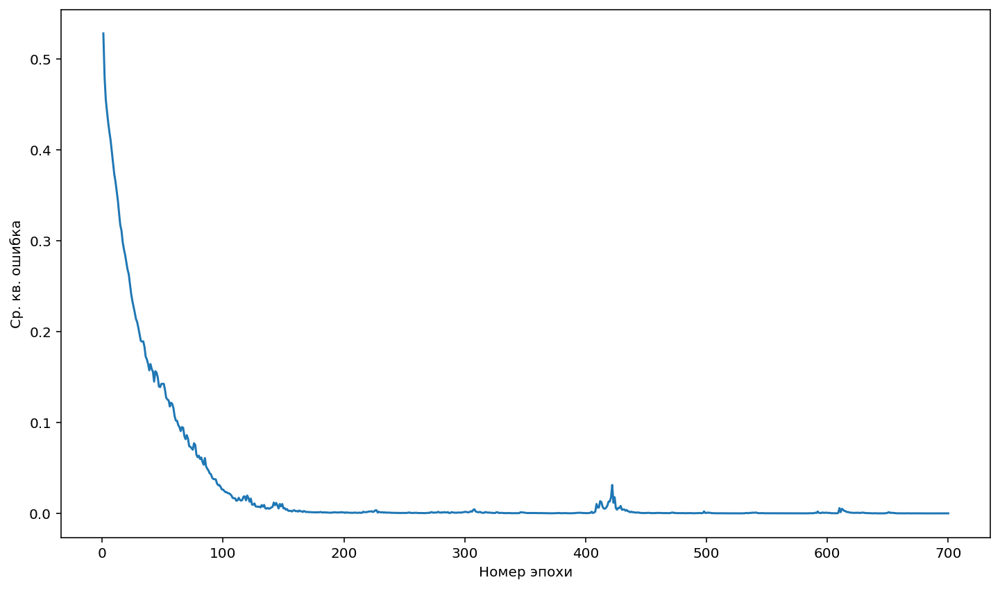

In [28]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [29]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae.append(max_err_val)

Максимальная ошибка по модулю =  0.012111659238440833


<ipython-input-30-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


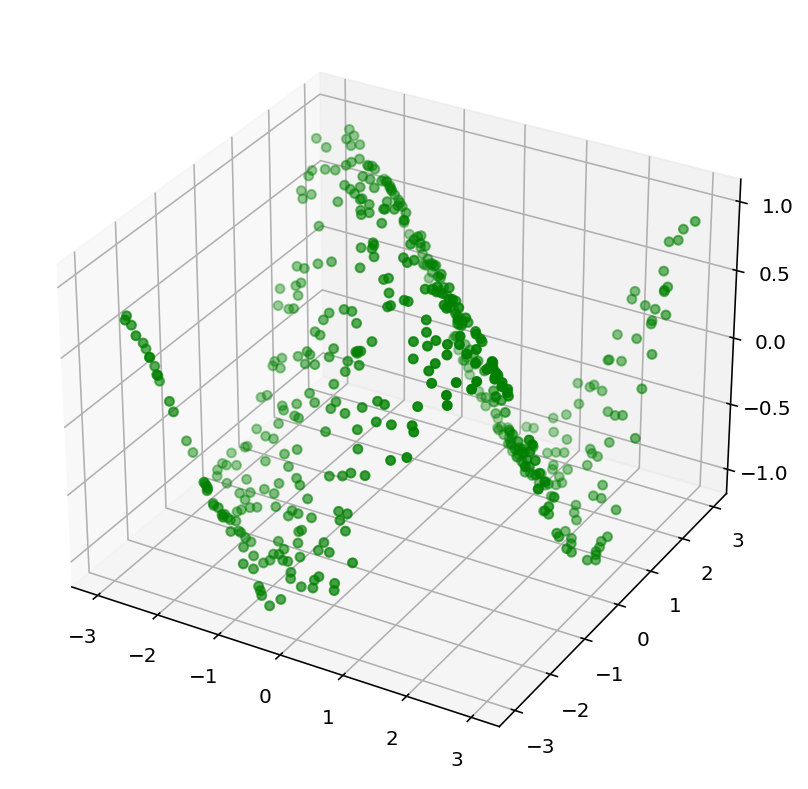

In [30]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


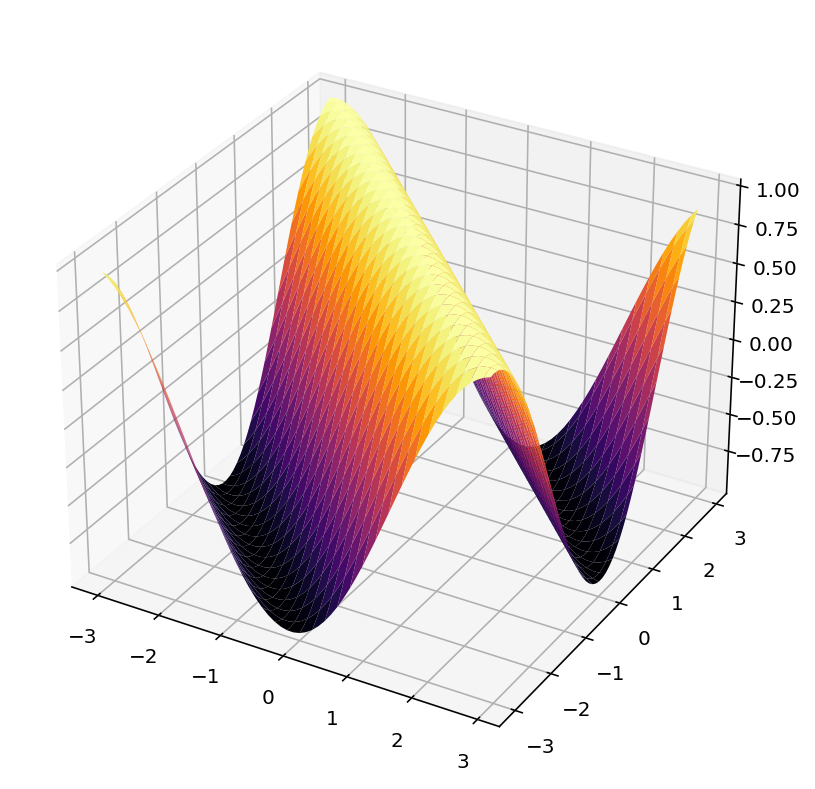

In [31]:
func_draw()

In [33]:
n = 15
xy=[] 
zz=[] 
x, y = get_regular_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])
#history = model()

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


1/8 [==>...........................] - ETA: 11s - loss: 0.5306

8/8 [==============================] - 2s 5ms/step - loss: 0.5070


Epoch 2/700
1/8 [==>...........................] - ETA: 0s - loss: 0.4650

8/8 [==============================] - 0s 4ms/step - loss: 0.4362


Epoch 3/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3857

3/8 [==========>...................] - ETA: 0s - loss: 0.4444

4/8 [==============>...............] - ETA: 0s - loss: 0.4420

8/8 [==============================] - 1s 73ms/step - loss: 0.4279


Epoch 4/700


1/8 [==>...........................] - ETA: 0s - loss: 0.3572

6/8 [=====================>........] - ETA: 0s - loss: 0.3691

8/8 [==============================] - 0s 16ms/step - loss: 0.3733


Epoch 5/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3143

8/8 [==============================] - 0s 2ms/step - loss: 0.3403


Epoch 6/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3974

8/8 [==============================] - 0s 2ms/step - loss: 0.3357


Epoch 7/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3119

8/8 [==============================] - 0s 2ms/step - loss: 0.3069


Epoch 8/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1752

5/8 [=================>............] - ETA: 0s - loss: 0.2667

8/8 [==============================] - 0s 11ms/step - loss: 0.2656


Epoch 9/700


1/8 [==>...........................] - ETA: 1s - loss: 0.2090

2/8 [======>.......................] - ETA: 0s - loss: 0.2243

6/8 [=====================>........] - ETA: 0s - loss: 0.2377

8/8 [==============================] - 0s 30ms/step - loss: 0.2408


Epoch 10/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0949

8/8 [==============================] - 0s 4ms/step - loss: 0.1984


Epoch 11/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1469

2/8 [======>.......................] - ETA: 0s - loss: 0.1566

8/8 [==============================] - 0s 11ms/step - loss: 0.1974


Epoch 12/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1616

5/8 [=================>............] - ETA: 0s - loss: 0.1716

8/8 [==============================] - 0s 12ms/step - loss: 0.1849


Epoch 13/700
1/8 [==>...........................] - ETA: 0s - loss: 0.2403

2/8 [======>.......................] - ETA: 0s - loss: 0.2157

8/8 [==============================] - 0s 10ms/step - loss: 0.2037


Epoch 14/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1009

6/8 [=====================>........] - ETA: 0s - loss: 0.1481

8/8 [==============================] - 0s 9ms/step - loss: 0.1606


Epoch 15/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1959

2/8 [======>.......................] - ETA: 0s - loss: 0.1858

3/8 [==========>...................] - ETA: 0s - loss: 0.1816

7/8 [=========================>....] - ETA: 0s - loss: 0.1710

8/8 [==============================] - 1s 64ms/step - loss: 0.1736


Epoch 16/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1118

8/8 [==============================] - 0s 4ms/step - loss: 0.1441


Epoch 17/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1658

2/8 [======>.......................] - ETA: 0s - loss: 0.1522

3/8 [==========>...................] - ETA: 0s - loss: 0.1478

8/8 [==============================] - 0s 31ms/step - loss: 0.1551


Epoch 18/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1013

8/8 [==============================] - 0s 3ms/step - loss: 0.1374


Epoch 19/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1383

8/8 [==============================] - 0s 2ms/step - loss: 0.1383


Epoch 20/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1698

8/8 [==============================] - 0s 2ms/step - loss: 0.1546


Epoch 21/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1123

3/8 [==========>...................] - ETA: 0s - loss: 0.1287

4/8 [==============>...............] - ETA: 0s - loss: 0.1317

7/8 [=========================>....] - ETA: 0s - loss: 0.1345

8/8 [==============================] - 1s 71ms/step - loss: 0.1359


Epoch 22/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0697

3/8 [==========>...................] - ETA: 0s - loss: 0.0715

8/8 [==============================] - 0s 10ms/step - loss: 0.1078


Epoch 23/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1730

6/8 [=====================>........] - ETA: 0s - loss: 0.1386

8/8 [==============================] - 0s 15ms/step - loss: 0.1337


Epoch 24/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1584

5/8 [=================>............] - ETA: 0s - loss: 0.1228

8/8 [==============================] - 0s 12ms/step - loss: 0.1194


Epoch 25/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0851

3/8 [==========>...................] - ETA: 0s - loss: 0.1014

8/8 [==============================] - 0s 33ms/step - loss: 0.1038


Epoch 26/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1095

8/8 [==============================] - 0s 4ms/step - loss: 0.0974


Epoch 27/700
1/8 [==>...........................] - ETA: 0s - loss: 0.2056

8/8 [==============================] - ETA: 0s - loss: 0.1339

8/8 [==============================] - 0s 9ms/step - loss: 0.1320


Epoch 28/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0916

8/8 [==============================] - 0s 2ms/step - loss: 0.0977


Epoch 29/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0706

8/8 [==============================] - 0s 3ms/step - loss: 0.0936


Epoch 30/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1224

8/8 [==============================] - 0s 4ms/step - loss: 0.1018


Epoch 31/700
1/8 [==>...........................] - ETA: 0s - loss: 0.2046

8/8 [==============================] - 0s 3ms/step - loss: 0.1339


Epoch 32/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0796

8/8 [==============================] - 0s 3ms/step - loss: 0.0849


Epoch 33/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1017

8/8 [==============================] - 0s 6ms/step - loss: 0.0834


Epoch 34/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0960

7/8 [=========================>....] - ETA: 0s - loss: 0.0846

8/8 [==============================] - 0s 12ms/step - loss: 0.0834


Epoch 35/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0445

2/8 [======>.......................] - ETA: 0s - loss: 0.0639

3/8 [==========>...................] - ETA: 0s - loss: 0.0707

8/8 [==============================] - 0s 28ms/step - loss: 0.0734


Epoch 36/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1009

3/8 [==========>...................] - ETA: 0s - loss: 0.0910

5/8 [=================>............] - ETA: 0s - loss: 0.0881

8/8 [==============================] - 0s 29ms/step - loss: 0.0815


Epoch 37/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0590

2/8 [======>.......................] - ETA: 0s - loss: 0.0710

7/8 [=========================>....] - ETA: 0s - loss: 0.0731

8/8 [==============================] - 0s 25ms/step - loss: 0.0723


Epoch 38/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0576

6/8 [=====================>........] - ETA: 0s - loss: 0.0625

8/8 [==============================] - 0s 13ms/step - loss: 0.0638


Epoch 39/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0646

8/8 [==============================] - 0s 3ms/step - loss: 0.0755


Epoch 40/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1003

8/8 [==============================] - 0s 4ms/step - loss: 0.0714


Epoch 41/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0635

8/8 [==============================] - 0s 3ms/step - loss: 0.0725


Epoch 42/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0545

8/8 [==============================] - 0s 2ms/step - loss: 0.0633


Epoch 43/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0585

2/8 [======>.......................] - ETA: 0s - loss: 0.0529

8/8 [==============================] - 0s 11ms/step - loss: 0.0582


Epoch 44/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0384

8/8 [==============================] - 0s 2ms/step - loss: 0.0491


Epoch 45/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0832

5/8 [=================>............] - ETA: 0s - loss: 0.0619

8/8 [==============================] - 0s 10ms/step - loss: 0.0583


Epoch 46/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0434

6/8 [=====================>........] - ETA: 0s - loss: 0.0527

8/8 [==============================] - 0s 10ms/step - loss: 0.0524


Epoch 47/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0428

8/8 [==============================] - 0s 2ms/step - loss: 0.0548


Epoch 48/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0553

2/8 [======>.......................] - ETA: 0s - loss: 0.0524

8/8 [==============================] - 0s 11ms/step - loss: 0.0611


Epoch 49/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0896

2/8 [======>.......................] - ETA: 0s - loss: 0.0901

8/8 [==============================] - ETA: 0s - loss: 0.0758

8/8 [==============================] - 0s 41ms/step - loss: 0.0750


Epoch 50/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0500

5/8 [=================>............] - ETA: 0s - loss: 0.0607

8/8 [==============================] - 0s 15ms/step - loss: 0.0584


Epoch 51/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0481

5/8 [=================>............] - ETA: 0s - loss: 0.0516

8/8 [==============================] - 0s 15ms/step - loss: 0.0506


Epoch 52/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0616

8/8 [==============================] - 0s 2ms/step - loss: 0.0530


Epoch 53/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0274

8/8 [==============================] - 0s 3ms/step - loss: 0.0397


Epoch 54/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0512

8/8 [==============================] - 0s 3ms/step - loss: 0.0405


Epoch 55/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0325

7/8 [=========================>....] - ETA: 0s - loss: 0.0399

8/8 [==============================] - 0s 13ms/step - loss: 0.0397


Epoch 56/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0478

4/8 [==============>...............] - ETA: 0s - loss: 0.0535

8/8 [==============================] - 0s 12ms/step - loss: 0.0509


Epoch 57/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0588

5/8 [=================>............] - ETA: 0s - loss: 0.0531

8/8 [==============================] - 0s 11ms/step - loss: 0.0509


Epoch 58/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0529

6/8 [=====================>........] - ETA: 0s - loss: 0.0403

8/8 [==============================] - 0s 11ms/step - loss: 0.0387


Epoch 59/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0567

5/8 [=================>............] - ETA: 0s - loss: 0.0425

8/8 [==============================] - 0s 16ms/step - loss: 0.0409


Epoch 60/700


1/8 [==>...........................] - ETA: 1s - loss: 0.0155

3/8 [==========>...................] - ETA: 0s - loss: 0.0199

8/8 [==============================] - 0s 14ms/step - loss: 0.0283


Epoch 61/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0413



5/8 [=================>............] - ETA: 0s - loss: 0.0461

8/8 [==============================] - 0s 13ms/step - loss: 0.0453


Epoch 62/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0511

5/8 [=================>............] - ETA: 0s - loss: 0.0481

8/8 [==============================] - 0s 14ms/step - loss: 0.0453


Epoch 63/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0190

8/8 [==============================] - 0s 3ms/step - loss: 0.0309


Epoch 64/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0231

8/8 [==============================] - 0s 2ms/step - loss: 0.0340


Epoch 65/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0246

8/8 [==============================] - 0s 2ms/step - loss: 0.0427


Epoch 66/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0271

8/8 [==============================] - 0s 2ms/step - loss: 0.0310


Epoch 67/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0517

4/8 [==============>...............] - ETA: 0s - loss: 0.0522

8/8 [==============================] - 0s 16ms/step - loss: 0.0540


Epoch 68/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0875

3/8 [==========>...................] - ETA: 0s - loss: 0.0808

8/8 [==============================] - 0s 14ms/step - loss: 0.0782


Epoch 69/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0399

3/8 [==========>...................] - ETA: 0s - loss: 0.0373

6/8 [=====================>........] - ETA: 0s - loss: 0.0362

7/8 [=========================>....] - ETA: 0s - loss: 0.0358

8/8 [==============================] - ETA: 0s - loss: 0.0355

8/8 [==============================] - 0s 69ms/step - loss: 0.0353


Epoch 70/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0351

4/8 [==============>...............] - ETA: 0s - loss: 0.0386

8/8 [==============================] - 0s 12ms/step - loss: 0.0369


Epoch 71/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0496

7/8 [=========================>....] - ETA: 0s - loss: 0.0466

8/8 [==============================] - 0s 11ms/step - loss: 0.0446


Epoch 72/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0448

8/8 [==============================] - 0s 2ms/step - loss: 0.0396


Epoch 73/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0149

8/8 [==============================] - 0s 2ms/step - loss: 0.0194


Epoch 74/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0209

8/8 [==============================] - 0s 2ms/step - loss: 0.0253


Epoch 75/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0429

2/8 [======>.......................] - ETA: 0s - loss: 0.0363

8/8 [==============================] - 0s 11ms/step - loss: 0.0285


Epoch 76/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0072

3/8 [==========>...................] - ETA: 0s - loss: 0.0122

8/8 [==============================] - 0s 10ms/step - loss: 0.0173


Epoch 77/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0310

2/8 [======>.......................] - ETA: 0s - loss: 0.0317

3/8 [==========>...................] - ETA: 1s - loss: 0.0308

8/8 [==============================] - 0s 69ms/step - loss: 0.0238


Epoch 78/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0117

6/8 [=====================>........] - ETA: 0s - loss: 0.0162

8/8 [==============================] - 0s 14ms/step - loss: 0.0163


Epoch 79/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0141

7/8 [=========================>....] - ETA: 0s - loss: 0.0146

8/8 [==============================] - 0s 15ms/step - loss: 0.0147


Epoch 80/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0149

8/8 [==============================] - 0s 2ms/step - loss: 0.0140


Epoch 81/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0136

8/8 [==============================] - 0s 2ms/step - loss: 0.0131


Epoch 82/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0128

8/8 [==============================] - 0s 2ms/step - loss: 0.0127


Epoch 83/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0147

8/8 [==============================] - 0s 2ms/step - loss: 0.0133


Epoch 84/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0125

8/8 [==============================] - 0s 2ms/step - loss: 0.0124


Epoch 85/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0107

8/8 [==============================] - 0s 2ms/step - loss: 0.0117


Epoch 86/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0156

8/8 [==============================] - 0s 2ms/step - loss: 0.0158


Epoch 87/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0080

2/8 [======>.......................] - ETA: 0s - loss: 0.0141

8/8 [==============================] - 0s 13ms/step - loss: 0.0173


Epoch 88/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0158

8/8 [==============================] - 0s 2ms/step - loss: 0.0145


Epoch 89/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0117

3/8 [==========>...................] - ETA: 0s - loss: 0.0120

8/8 [==============================] - 0s 10ms/step - loss: 0.0117


Epoch 90/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0162

5/8 [=================>............] - ETA: 0s - loss: 0.0121

8/8 [==============================] - 0s 13ms/step - loss: 0.0113


Epoch 91/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0073

7/8 [=========================>....] - ETA: 0s - loss: 0.0101

8/8 [==============================] - 0s 11ms/step - loss: 0.0098


Epoch 92/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0064

8/8 [==============================] - 0s 1ms/step - loss: 0.0130


Epoch 93/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0061

8/8 [==============================] - 0s 2ms/step - loss: 0.0090


Epoch 94/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0095

7/8 [=========================>....] - ETA: 0s - loss: 0.0091

8/8 [==============================] - 0s 17ms/step - loss: 0.0091


Epoch 95/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0048

2/8 [======>.......................] - ETA: 0s - loss: 0.0050

7/8 [=========================>....] - ETA: 0s - loss: 0.0070

8/8 [==============================] - 0s 26ms/step - loss: 0.0071


Epoch 96/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0090

5/8 [=================>............] - ETA: 0s - loss: 0.0077

8/8 [==============================] - 0s 11ms/step - loss: 0.0073


Epoch 97/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0040

7/8 [=========================>....] - ETA: 0s - loss: 0.0079

8/8 [==============================] - 0s 11ms/step - loss: 0.0082


Epoch 98/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0043

5/8 [=================>............] - ETA: 0s - loss: 0.0067

8/8 [==============================] - 0s 11ms/step - loss: 0.0070


Epoch 99/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0091

2/8 [======>.......................] - ETA: 0s - loss: 0.0091

8/8 [==============================] - 0s 10ms/step - loss: 0.0073


Epoch 100/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0045

8/8 [==============================] - 0s 2ms/step - loss: 0.0062


Epoch 101/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0081

8/8 [==============================] - 0s 2ms/step - loss: 0.0071


Epoch 102/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0057

8/8 [==============================] - ETA: 0s - loss: 0.0062

8/8 [==============================] - 0s 8ms/step - loss: 0.0062


Epoch 103/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0043

8/8 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 104/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 2ms/step - loss: 0.0047


Epoch 105/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0061

6/8 [=====================>........] - ETA: 0s - loss: 0.0050

8/8 [==============================] - 0s 9ms/step - loss: 0.0048


Epoch 106/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0043


Epoch 107/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0027

5/8 [=================>............] - ETA: 0s - loss: 0.0049

8/8 [==============================] - 0s 8ms/step - loss: 0.0059


Epoch 108/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0066

8/8 [==============================] - 0s 1ms/step - loss: 0.0049


Epoch 109/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0047

8/8 [==============================] - 0s 1ms/step - loss: 0.0049


Epoch 110/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 1ms/step - loss: 0.0041


Epoch 111/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 2ms/step - loss: 0.0056


Epoch 112/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0067

8/8 [==============================] - 0s 2ms/step - loss: 0.0120


Epoch 113/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0103

8/8 [==============================] - 0s 2ms/step - loss: 0.0147


Epoch 114/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - 0s 1ms/step - loss: 0.0071


Epoch 115/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0062

8/8 [==============================] - 0s 1ms/step - loss: 0.0058


Epoch 116/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 1ms/step - loss: 0.0038


Epoch 117/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 1ms/step - loss: 0.0035


Epoch 118/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 119/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 1ms/step - loss: 0.0030


Epoch 120/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 121/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0027

5/8 [=================>............] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 8ms/step - loss: 0.0028


Epoch 122/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 123/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 124/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 125/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 126/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 1ms/step - loss: 0.0020


Epoch 127/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 128/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 129/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 1ms/step - loss: 0.0025


Epoch 130/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 7ms/step - loss: 0.0031


Epoch 131/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 132/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 12ms/step - loss: 0.0020


Epoch 133/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

4/8 [==============>...............] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 10ms/step - loss: 0.0031


Epoch 134/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0091


Epoch 135/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0060

8/8 [==============================] - 0s 2ms/step - loss: 0.0541


Epoch 136/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0330

2/8 [======>.......................] - ETA: 0s - loss: 0.0258

8/8 [==============================] - 0s 11ms/step - loss: 0.0147


Epoch 137/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0305

5/8 [=================>............] - ETA: 0s - loss: 0.0205

8/8 [==============================] - 0s 14ms/step - loss: 0.0167


Epoch 138/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0074

7/8 [=========================>....] - ETA: 0s - loss: 0.0068

8/8 [==============================] - ETA: 0s - loss: 0.0068

8/8 [==============================] - 0s 29ms/step - loss: 0.0069


Epoch 139/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0050

2/8 [======>.......................] - ETA: 0s - loss: 0.0058

7/8 [=========================>....] - ETA: 0s - loss: 0.0057

8/8 [==============================] - ETA: 0s - loss: 0.0057

8/8 [==============================] - 0s 45ms/step - loss: 0.0056


Epoch 140/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 141/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 142/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 2ms/step - loss: 0.0063


Epoch 143/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0104

3/8 [==========>...................] - ETA: 0s - loss: 0.0110

8/8 [==============================] - 0s 11ms/step - loss: 0.0123


Epoch 144/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0092

8/8 [==============================] - ETA: 0s - loss: 0.0071

8/8 [==============================] - 0s 10ms/step - loss: 0.0070


Epoch 145/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0053

8/8 [==============================] - 0s 2ms/step - loss: 0.0049


Epoch 146/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 2ms/step - loss: 0.0039


Epoch 147/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 148/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0027

8/8 [==============================] - ETA: 0s - loss: 0.0044

8/8 [==============================] - 0s 43ms/step - loss: 0.0044


Epoch 149/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 28ms/step - loss: 0.0040


Epoch 150/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 15ms/step - loss: 0.0025


Epoch 151/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 152/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

3/8 [==========>...................] - ETA: 0s - loss: 0.0031

8/8 [==============================] - 0s 10ms/step - loss: 0.0029


Epoch 153/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

2/8 [======>.......................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 11ms/step - loss: 0.0020


Epoch 154/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

5/8 [=================>............] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 11ms/step - loss: 0.0032


Epoch 155/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 156/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 157/700
1/8 [==>...........................] - ETA: 0s - loss: 8.3993e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 158/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 159/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

3/8 [==========>...................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 11ms/step - loss: 0.0015


Epoch 160/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

6/8 [=====================>........] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 10ms/step - loss: 0.0014


Epoch 161/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2034e-04

4/8 [==============>...............] - ETA: 0s - loss: 0.0012    

8/8 [==============================] - 0s 11ms/step - loss: 0.0012


Epoch 162/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2628e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.1118e-04


Epoch 163/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

2/8 [======>.......................] - ETA: 0s - loss: 0.0027

4/8 [==============>...............] - ETA: 0s - loss: 0.0031

8/8 [==============================] - 0s 41ms/step - loss: 0.0036


Epoch 164/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

4/8 [==============>...............] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 14ms/step - loss: 0.0036


Epoch 165/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0014

7/8 [=========================>....] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 14ms/step - loss: 0.0023


Epoch 166/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0028

5/8 [=================>............] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 15ms/step - loss: 0.0020


Epoch 167/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0015

2/8 [======>.......................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 11ms/step - loss: 0.0019


Epoch 168/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

3/8 [==========>...................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 11ms/step - loss: 0.0017


Epoch 169/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

2/8 [======>.......................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 11ms/step - loss: 0.0012


Epoch 170/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0010

2/8 [======>.......................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 11ms/step - loss: 9.6872e-04


Epoch 171/700
1/8 [==>...........................] - ETA: 0s - loss: 4.8116e-04

5/8 [=================>............] - ETA: 0s - loss: 7.9217e-04

8/8 [==============================] - 0s 10ms/step - loss: 8.4781e-04


Epoch 172/700
1/8 [==>...........................] - ETA: 0s - loss: 6.0656e-04

8/8 [==============================] - ETA: 0s - loss: 7.2439e-04

8/8 [==============================] - 0s 11ms/step - loss: 7.3448e-04


Epoch 173/700
1/8 [==>...........................] - ETA: 0s - loss: 5.9021e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.8148e-04


Epoch 174/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 175/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 176/700


1/8 [==>...........................] - ETA: 0s - loss: 9.1325e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 177/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

4/8 [==============>...............] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 10ms/step - loss: 0.0012


Epoch 178/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7273e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 179/700
1/8 [==>...........................] - ETA: 0s - loss: 6.4924e-04

4/8 [==============>...............] - ETA: 0s - loss: 7.5777e-04

8/8 [==============================] - ETA: 0s - loss: 7.9263e-04

8/8 [==============================] - 0s 27ms/step - loss: 8.0243e-04


Epoch 180/700


1/8 [==>...........................] - ETA: 0s - loss: 5.7612e-04

2/8 [======>.......................] - ETA: 0s - loss: 7.9041e-04

8/8 [==============================] - 0s 15ms/step - loss: 8.9368e-04


Epoch 181/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

6/8 [=====================>........] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 27ms/step - loss: 0.0015


Epoch 182/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0014

2/8 [======>.......................] - ETA: 1s - loss: 0.0013

8/8 [==============================] - 0s 29ms/step - loss: 0.0012


Epoch 183/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9523e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 184/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

2/8 [======>.......................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 10ms/step - loss: 0.0023


Epoch 185/700
1/8 [==>...........................] - ETA: 0s - loss: 9.4107e-04

4/8 [==============>...............] - ETA: 0s - loss: 0.0012    

8/8 [==============================] - 0s 11ms/step - loss: 0.0014


Epoch 186/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7888e-04

8/8 [==============================] - ETA: 0s - loss: 7.7852e-04

8/8 [==============================] - 0s 11ms/step - loss: 7.9066e-04


Epoch 187/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

5/8 [=================>............] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 11ms/step - loss: 0.0034


Epoch 188/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 189/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7452e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 190/700


1/8 [==>...........................] - ETA: 0s - loss: 6.5661e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.3579e-04


Epoch 191/700


1/8 [==>...........................] - ETA: 0s - loss: 8.2030e-04

2/8 [======>.......................] - ETA: 0s - loss: 0.0011    

8/8 [==============================] - 0s 10ms/step - loss: 0.0017


Epoch 192/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - ETA: 0s - loss: 0.0035

8/8 [==============================] - 0s 11ms/step - loss: 0.0036


Epoch 193/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 194/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

5/8 [=================>............] - ETA: 0s - loss: 0.0034

8/8 [==============================] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 27ms/step - loss: 0.0042


Epoch 195/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

2/8 [======>.......................] - ETA: 0s - loss: 0.0021

5/8 [=================>............] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 29ms/step - loss: 0.0042


Epoch 196/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0046

8/8 [==============================] - 0s 3ms/step - loss: 0.0043


Epoch 197/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0037

2/8 [======>.......................] - ETA: 0s - loss: 0.0033

6/8 [=====================>........] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 28ms/step - loss: 0.0026


Epoch 198/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0024

5/8 [=================>............] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 11ms/step - loss: 0.0025


Epoch 199/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 200/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 201/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 202/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6435e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 203/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0024

5/8 [=================>............] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 11ms/step - loss: 0.0017


Epoch 204/700
1/8 [==>...........................] - ETA: 0s - loss: 4.9651e-04

7/8 [=========================>....] - ETA: 0s - loss: 7.6073e-04

8/8 [==============================] - 0s 10ms/step - loss: 7.9472e-04


Epoch 205/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4916e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.4861e-04


Epoch 206/700


1/8 [==>...........................] - ETA: 0s - loss: 5.2633e-04

8/8 [==============================] - 0s 1ms/step - loss: 9.9559e-04


Epoch 207/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

2/8 [======>.......................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 12ms/step - loss: 0.0013


Epoch 208/700
1/8 [==>...........................] - ETA: 0s - loss: 6.3050e-04

2/8 [======>.......................] - ETA: 0s - loss: 0.0011    

8/8 [==============================] - 0s 10ms/step - loss: 0.0016


Epoch 209/700


1/8 [==>...........................] - ETA: 0s - loss: 7.9085e-04

2/8 [======>.......................] - ETA: 0s - loss: 9.1801e-04

3/8 [==========>...................] - ETA: 0s - loss: 9.3735e-04

4/8 [==============>...............] - ETA: 0s - loss: 9.2458e-04

8/8 [==============================] - 0s 69ms/step - loss: 8.6565e-04


Epoch 210/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8615e-04

2/8 [======>.......................] - ETA: 0s - loss: 8.3048e-04

7/8 [=========================>....] - ETA: 0s - loss: 9.7537e-04

8/8 [==============================]

 - 0s 29ms/step - loss: 9.6029e-04


Epoch 211/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2425e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.8481e-04


Epoch 212/700
1/8 [==>...........................] - ETA: 0s - loss: 8.2761e-04

2/8 [======>.......................] - ETA: 0s - loss: 8.0706e-04

8/8 [==============================] - 0s 10ms/step - loss: 8.4621e-04


Epoch 213/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7526e-04

7/8 [=========================>....] - ETA: 0s - loss: 0.0031    

8/8 [==============================] - 0s 11ms/step - loss: 0.0033


Epoch 214/700
1/8 [==>...........................] - ETA: 0s - loss: 7.3130e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.0922e-04


Epoch 215/700


1/8 [==>...........................] - ETA: 0s - loss: 5.2536e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.2996e-04


Epoch 216/700


1/8 [==>...........................] - ETA: 0s - loss: 6.2583e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.6455e-04


Epoch 217/700


1/8 [==>...........................] - ETA: 0s - loss: 5.7927e-04

2/8 [======>.......................] - ETA: 0s - loss: 8.3603e-04

8/8 [==============================] - 0s 10ms/step - loss: 0.0011


Epoch 218/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6072e-04

4/8 [==============>...............] - ETA: 0s - loss: 9.0679e-04

8/8 [==============================] - 0s 11ms/step - loss: 9.2133e-04


Epoch 219/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0341e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.4833e-04


Epoch 220/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2408e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.9198e-04


Epoch 221/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 222/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 223/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 43ms/step - loss: 0.0023


Epoch 224/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 3ms/step - loss: 0.0018


Epoch 225/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0016

3/8 [==========>...................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 15ms/step - loss: 0.0019


Epoch 226/700


1/8 [==>...........................] - ETA: 0s - loss: 7.6462e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.2025e-04


Epoch 227/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 228/700
1/8 [==>...........................] - ETA: 0s - loss: 9.6202e-04

7/8 [=========================>....] - ETA: 0s - loss: 7.6856e-04

8/8 [==============================] - 0s 11ms/step - loss: 7.6167e-04


Epoch 229/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1640e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7258e-04


Epoch 230/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6523e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.8553e-04


Epoch 231/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3634e-04

8/8 [==============================] - 0s 3ms/step - loss: 4.5200e-04


Epoch 232/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8563e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.7915e-04


Epoch 233/700
1/8 [==>...........................] - ETA: 0s - loss: 5.4677e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 234/700


1/8 [==>...........................] - ETA: 0s - loss: 5.5125e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 235/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6927e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 236/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1862e-04

5/8 [=================>............] - ETA: 0s - loss: 7.0181e-04

8/8 [==============================] - 0s 11ms/step - loss: 7.1853e-04


Epoch 237/700


1/8 [==>...........................] - ETA: 0s - loss: 5.9288e-04

6/8 [=====================>........] - ETA: 0s - loss: 0.0011    

8/8 [==============================] - 0s 12ms/step - loss: 0.0012


Epoch 238/700


1/8 [==>...........................] - ETA: 0s - loss: 4.6528e-04

5/8 [=================>............] - ETA: 0s - loss: 6.0451e-04

8/8 [==============================] - 0s 16ms/step - loss: 6.5843e-04


Epoch 239/700


1/8 [==>...........................] - ETA: 0s - loss: 5.2429e-04

7/8 [=========================>....] - ETA: 0s - loss: 5.4277e-04

8/8 [==============================] - 0s 16ms/step - loss: 5.3777e-04


Epoch 240/700


1/8 [==>...........................] - ETA: 0s - loss: 5.5821e-04

2/8 [======>.......................] - ETA: 0s - loss: 6.1974e-04

6/8 [=====================>........] - ETA: 0s - loss: 5.5063e-04

8/8 [==============================] - 0s 29ms/step - loss: 5.3694e-04


Epoch 241/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 10ms/step - loss: 0.0040


Epoch 242/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9834e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0052


Epoch 243/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 1ms/step - loss: 0.0094


Epoch 244/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0132

8/8 [==============================] - 0s 2ms/step - loss: 0.0085


Epoch 245/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0052

6/8 [=====================>........] - ETA: 0s - loss: 0.0054

8/8 [==============================] - 0s 10ms/step - loss: 0.0049


Epoch 246/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0063

8/8 [==============================] - 0s 1ms/step - loss: 0.0045


Epoch 247/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0044

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 248/700


1/8 [==>...........................] - ETA: 0s - loss: 8.5412e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 249/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0013

2/8 [======>.......................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 11ms/step - loss: 0.0013


Epoch 250/700
1/8 [==>...........................] - ETA: 0s - loss: 9.0081e-04

5/8 [=================>............] - ETA: 0s - loss: 0.0016    

8/8 [==============================] - 0s 10ms/step - loss: 0.0022


Epoch 251/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0037

8/8 [==============================] - 0s 2ms/step - loss: 0.0039


Epoch 252/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0039

3/8 [==========>...................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 13ms/step - loss: 0.0034


Epoch 253/700
1/8 [==>...........................] - ETA: 0s - loss: 9.5132e-04

5/8 [=================>............] - ETA: 0s - loss: 0.0024    

8/8 [==============================] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 28ms/step - loss: 0.0026


Epoch 254/700


1/8 [==>...........................] - ETA: 1s - loss: 0.0031

6/8 [=====================>........] - ETA: 0s - loss: 0.0025

7/8 [=========================>....] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 29ms/step - loss: 0.0023


Epoch 255/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

5/8 [=================>............] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 12ms/step - loss: 0.0031


Epoch 256/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0081


Epoch 257/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0047

8/8 [==============================] - 0s 3ms/step - loss: 0.0045


Epoch 258/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 259/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 260/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

4/8 [==============>...............] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 10ms/step - loss: 0.0021


Epoch 261/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 262/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0047

8/8 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 263/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 264/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0024

3/8 [==========>...................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 11ms/step - loss: 0.0031


Epoch 265/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

2/8 [======>.......................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 10ms/step - loss: 0.0020


Epoch 266/700


1/8 [==>...........................] - ETA: 0s - loss: 7.1424e-04

7/8 [=========================>....] - ETA: 0s - loss: 0.0013    

8/8 [==============================] - 0s 13ms/step - loss: 0.0013


Epoch 267/700


1/8 [==>...........................] - ETA: 0s - loss: 8.4095e-04

8/8 [==============================] - 0s 3ms/step - loss: 9.0441e-04


Epoch 268/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

2/8 [======>.......................] - ETA: 1s - loss: 0.0010

8/8 [==============================] - 0s 30ms/step - loss: 0.0011


Epoch 269/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

5/8 [=================>............] - ETA: 0s - loss: 0.0013

6/8 [=====================>........] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 28ms/step - loss: 0.0013


Epoch 270/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2393e-04

2/8 [======>.......................] - ETA: 0s - loss: 7.4975e-04

3/8 [==========>...................] - ETA: 0s - loss: 7.9887e-04

8/8 [==============================] - 0s 29ms/step - loss: 8.6508e-04


Epoch 271/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 8.4340e-04


Epoch 272/700
1/8 [==>...........................] - ETA: 0s - loss: 9.0854e-04

2/8 [======>.......................] - ETA: 0s - loss: 8.7489e-04

8/8 [==============================] - 0s 10ms/step - loss: 7.5410e-04


Epoch 273/700
1/8 [==>...........................] - ETA: 0s - loss: 5.7381e-04

5/8 [=================>............] - ETA: 0s - loss: 6.1261e-04

8/8 [==============================] - 0s 11ms/step - loss: 5.6988e-04


Epoch 274/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9187e-04

6/8 [=====================>........] - ETA: 0s - loss: 4.0637e-04

8/8 [==============================] - 0s 12ms/step - loss: 4.2150e-04


Epoch 275/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4384e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.0753e-04


Epoch 276/700
1/8 [==>...........................] - ETA: 0s - loss: 5.3750e-04

6/8 [=====================>........] - ETA: 0s - loss: 4.0697e-04

8/8 [==============================] - 0s 9ms/step - loss: 4.0308e-04


Epoch 277/700
1/8 [==>...........................] - ETA: 0s - loss: 4.0861e-04

2/8 [======>.......................] - ETA: 0s - loss: 4.2998e-04

8/8 [==============================] - 0s 11ms/step - loss: 3.7942e-04


Epoch 278/700


1/8 [==>...........................] - ETA: 0s - loss: 4.1181e-04

8/8 [==============================] - 0s 3ms/step - loss: 5.3222e-04


Epoch 279/700


1/8 [==>...........................] - ETA: 0s - loss: 8.0346e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.6543e-04


Epoch 280/700


1/8 [==>...........................] - ETA: 0s - loss: 3.0051e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3142e-04


Epoch 281/700


1/8 [==>...........................] - ETA: 0s - loss: 5.2704e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.9156e-04


Epoch 282/700
1/8 [==>...........................] - ETA: 0s - loss: 5.1313e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.5437e-04

7/8 [=========================>....] - ETA: 0s - loss: 5.9875e-04

8/8 [==============================] - ETA: 0s - loss: 5.9814e-04

8/8 [==============================] - 0s 41ms/step - loss: 5.9766e-04


Epoch 283/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3626e-04

2/8 [======>.......................] - ETA: 0s - loss: 6.2523e-04

3/8 [==========>...................] - ETA: 0s - loss: 6.4110e-04

5/8 [=================>............] - ETA: 0s - loss: 6.5321e-04

8/8 [==============================] - 0s 58ms/step - loss: 6.5759e-04


Epoch 284/700


1/8 [==>...........................] - ETA: 0s - loss: 5.9211e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.8018e-04

7/8 [=========================>....] - ETA: 0s - loss: 5.9890e-04

8/8 [==============================] - 0s 27ms/step - loss: 6.0195e-04


Epoch 285/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7183e-04

8/8 [==============================] - ETA: 0s - loss: 5.2056e-04

8/8 [==============================] - 0s 14ms/step - loss: 5.3343e-04


Epoch 286/700
1/8 [==>...........................] - ETA: 0s - loss: 6.9669e-04

7/8 [=========================>....] - ETA: 0s - loss: 7.0250e-04

8/8 [==============================] - 0s 11ms/step - loss: 6.9183e-04


Epoch 287/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6312e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 288/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 289/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6796e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.9629e-04


Epoch 290/700
1/8 [==>...........................] - ETA: 0s - loss: 8.5094e-04

5/8 [=================>............] - ETA: 0s - loss: 6.5422e-04

8/8 [==============================] - 0s 11ms/step - loss: 6.0031e-04


Epoch 291/700
1/8 [==>...........................] - ETA: 0s - loss: 4.7215e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.8518e-04


Epoch 292/700
1/8 [==>...........................] - ETA: 0s - loss: 4.0233e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.6891e-04


Epoch 293/700
1/8 [==>...........................] - ETA: 0s - loss: 6.4689e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.7601e-04


Epoch 294/700
1/8 [==>...........................] - ETA: 0s - loss: 7.4110e-04

8/8 [==============================] - ETA: 0s - loss: 5.8364e-04

8/8 [==============================] - 0s 7ms/step - loss: 5.8239e-04


Epoch 295/700


1/8 [==>...........................] - ETA: 0s - loss: 9.2750e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 296/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 7ms/step - loss: 0.0013


Epoch 297/700
1/8 [==>...........................] - ETA: 0s - loss: 6.0103e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 298/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 299/700
1/8 [==>...........................] - ETA: 0s - loss: 8.8773e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 300/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 301/700


1/8 [==>...........................] - ETA: 0s - loss: 9.5572e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.5017e-04


Epoch 302/700


1/8 [==>...........................] - ETA: 0s - loss: 4.3972e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.3569e-04


Epoch 303/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0938e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.5153e-04


Epoch 304/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6934e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.4002e-04


Epoch 305/700


1/8 [==>...........................] - ETA: 0s - loss: 5.4942e-04

8/8 [==============================] - 0s 7ms/step - loss: 4.7329e-04


Epoch 306/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0654e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 307/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7423e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 308/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2008e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 309/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 1ms/step - loss: 0.0022


Epoch 310/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 1ms/step - loss: 0.0022


Epoch 311/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 312/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 7ms/step - loss: 0.0010


Epoch 313/700
1/8 [==>...........................] - ETA: 0s - loss: 4.9459e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 314/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 1ms/step - loss: 0.0027


Epoch 315/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 1ms/step - loss: 0.0029


Epoch 316/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 317/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 318/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0049

8/8 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 319/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0037

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 320/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0031

8/8 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 321/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 7ms/step - loss: 0.0011


Epoch 322/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 1ms/step - loss: 7.8500e-04


Epoch 323/700
1/8 [==>...........................] - ETA: 0s - loss: 4.1398e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.5562e-04


Epoch 324/700


1/8 [==>...........................] - ETA: 0s - loss: 5.4917e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.4685e-04


Epoch 325/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 326/700
1/8 [==>...........................] - ETA: 0s - loss: 3.5384e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.1000e-04


Epoch 327/700
1/8 [==>...........................] - ETA: 0s - loss: 9.8847e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.2261e-04


Epoch 328/700
1/8 [==>...........................] - ETA: 0s - loss: 9.4883e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.6411e-04


Epoch 329/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1929e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.2487e-04


Epoch 330/700
1/8 [==>...........................] - ETA: 0s - loss: 8.8878e-04

8/8 [==============================] - 0s 4ms/step - loss: 8.3765e-04


Epoch 331/700


1/8 [==>...........................] - ETA: 0s - loss: 4.7456e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.8863e-04


Epoch 332/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2369e-04

8/8 [==============================] - 0s 7ms/step - loss: 5.5980e-04


Epoch 333/700
1/8 [==>...........................] - ETA: 0s - loss: 3.2513e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 334/700


1/8 [==>...........................] - ETA: 0s - loss: 7.5461e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.6252e-04


Epoch 335/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3922e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.8013e-04


Epoch 336/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6470e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.1389e-04


Epoch 337/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8711e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.3418e-04


Epoch 338/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4378e-04

8/8 [==============================] - ETA: 0s - loss: 3.8391e-04

8/8 [==============================] - 0s 8ms/step - loss: 3.8377e-04


Epoch 339/700
1/8 [==>...........................] - ETA: 0s - loss: 5.4427e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.2068e-04


Epoch 340/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6592e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.3920e-04


Epoch 341/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0050


Epoch 342/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0071

8/8 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 343/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0134

8/8 [==============================] - 0s 2ms/step - loss: 0.0081


Epoch 344/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0062

7/8 [=========================>....] - ETA: 0s - loss: 0.0050

8/8 [==============================] - 0s 15ms/step - loss: 0.0049


Epoch 345/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

2/8 [======>.......................] - ETA: 0s - loss: 0.0032

6/8 [=====================>........] - ETA: 0s - loss: 0.0035

8/8 [==============================] - 0s 26ms/step - loss: 0.0034


Epoch 346/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - ETA: 0s - loss: 0.0041

8/8 [==============================] - 0s 10ms/step - loss: 0.0041


Epoch 347/700


1/8 [==>...........................] - ETA: 1s - loss: 0.0044

4/8 [==============>...............] - ETA: 0s - loss: 0.0067

7/8 [=========================>....] - ETA: 0s - loss: 0.0070

8/8 [==============================] - 0s 32ms/step - loss: 0.0070


Epoch 348/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 3ms/step - loss: 0.0043


Epoch 349/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0041

8/8 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 350/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 351/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 352/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 353/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 3ms/step - loss: 0.0067


Epoch 354/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0049

4/8 [==============>...............] - ETA: 0s - loss: 0.0041

5/8 [=================>............] - ETA: 0s - loss: 0.0046

8/8 [==============================] - 0s 57ms/step - loss: 0.0050


Epoch 355/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0088

8/8 [==============================] - 0s 5ms/step - loss: 0.0066


Epoch 356/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0068

8/8 [==============================] - 0s 2ms/step - loss: 0.0066


Epoch 357/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0037

7/8 [=========================>....] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 11ms/step - loss: 0.0032


Epoch 358/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 359/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 360/700
1/8 [==>...........................] - ETA: 0s - loss: 9.1236e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 361/700


1/8 [==>...........................] - ETA: 0s - loss: 9.4961e-04

7/8 [=========================>....] - ETA: 0s - loss: 0.0015    

8/8 [==============================] - 0s 17ms/step - loss: 0.0019


Epoch 362/700


1/8 [==>...........................] - ETA: 0s - loss: 8.1836e-04

7/8 [=========================>....] - ETA: 0s - loss: 0.0016    

8/8 [==============================] - 0s 13ms/step - loss: 0.0017


Epoch 363/700
1/8 [==>...........................] - ETA: 0s - loss: 8.4586e-04

2/8 [======>.......................] - ETA: 0s - loss: 0.0013    

7/8 [=========================>....]

 - ETA: 0s - loss: 0.0013

8/8 [==============================] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 39ms/step - loss: 0.0013


Epoch 364/700


1/8 [==>...........................] - ETA: 0s - loss: 9.7403e-04

2/8 [======>.......................] - ETA: 0s - loss: 0.0013    

8/8 [==============================] - 0s 15ms/step - loss: 0.0013


Epoch 365/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0935e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 366/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

6/8 [=====================>........] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 11ms/step - loss: 0.0014


Epoch 367/700
1/8 [==>...........................] - ETA: 0s - loss: 5.8199e-04

8/8 [==============================] - ETA: 0s - loss: 7.1487e-04

8/8 [==============================] - 0s 11ms/step - loss: 7.0980e-04


Epoch 368/700
1/8 [==>...........................] - ETA: 0s - loss: 4.7311e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.2225e-04

8/8 [==============================] - 0s 25ms/step - loss: 6.2853e-04


Epoch 369/700
1/8 [==>...........................] - ETA: 0s - loss: 9.9359e-04

7/8 [=========================>....] - ETA: 0s - loss: 7.5247e-04

8/8 [==============================] - 0s 13ms/step - loss: 7.2288e-04


Epoch 370/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6094e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 371/700

1/8 [==>...........................] - ETA: 1s - loss: 0.0031

8/8 [==============================] - 0s 3ms/step - loss: 0.0025


Epoch 372/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 12ms/step - loss: 0.0029


Epoch 373/700
1/8 [==>...........................] - ETA: 0s - loss: 9.5927e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 374/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 375/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - ETA: 0s - loss: 9.5638e-04

8/8 [==============================] - 0s 42ms/step - loss: 9.5248e-04


Epoch 376/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 6.7507e-04


Epoch 377/700
1/8 [==>...........................] - ETA: 0s - loss: 4.9674e-04

3/8 [==========>...................] - ETA: 0s - loss: 7.3376e-04

8/8 [==============================] - 0s 14ms/step - loss: 9.8829e-04


Epoch 378/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1290e-04

2/8 [======>.......................] - ETA: 0s - loss: 4.5917e-04

8/8 [==============================] - 0s 15ms/step - loss: 6.0943e-04


Epoch 379/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 2ms/step - loss: 7.5329e-04


Epoch 380/700
1/8 [==>...........................] - ETA: 0s - loss: 7.6329e-04

2/8 [======>.......................] - ETA: 0s - loss: 7.0104e-04

8/8 [==============================] - 0s 17ms/step - loss: 5.3628e-04


Epoch 381/700
1/8 [==>...........................] - ETA: 0s - loss: 8.7449e-04

2/8 [======>.......................] - ETA: 0s - loss: 7.9638e-04

5/8 [=================>............] - ETA: 0s - loss: 6.8624e-04

8/8 [==============================] - ETA: 0s - loss: 6.2013e-04

8/8 [==============================] - 0s 41ms/step - loss: 6.0734e-04


Epoch 382/700


1/8 [==>...........................] - ETA: 0s - loss: 3.1192e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.5021e-04


Epoch 383/700
1/8 [==>...........................] - ETA: 0s - loss: 5.3625e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.3022e-04


Epoch 384/700
1/8 [==>...........................] - ETA: 0s - loss: 4.5040e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.9594e-04


Epoch 385/700
1/8 [==>...........................] - ETA: 0s - loss: 5.9594e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.7914e-04

8/8 [==============================] - 0s 10ms/step - loss: 5.4448e-04


Epoch 386/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6078e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.8270e-04

8/8 [==============================] - 0s 11ms/step - loss: 4.5269e-04


Epoch 387/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5581e-04

5/8 [=================>............] - ETA: 0s - loss: 2.4748e-04

8/8 [==============================] - 0s 11ms/step - loss: 2.6095e-04


Epoch 388/700


1/8 [==>...........................] - ETA: 0s - loss: 2.5294e-04

2/8 [======>.......................] - ETA: 0s - loss: 2.7448e-04

8/8 [==============================] - 0s 17ms/step - loss: 4.2197e-04


Epoch 389/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6170e-04

6/8 [=====================>........] - ETA: 0s - loss: 5.1871e-04

7/8 [=========================>....] - ETA: 0s - loss: 5.3204e-04

8/8 [==============================] - 0s 41ms/step - loss: 5.4924e-04


Epoch 390/700
1/8 [==>...........................] - ETA: 0s - loss: 7.3995e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.4459e-04


Epoch 391/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9977e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.3320e-04


Epoch 392/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

2/8 [======>.......................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 12ms/step - loss: 9.6052e-04


Epoch 393/700
1/8 [==>...........................] - ETA: 0s - loss: 9.0664e-04

2/8 [======>.......................] - ETA: 0s - loss: 9.4392e-04

8/8 [==============================] - 0s 14ms/step - loss: 7.0681e-04


Epoch 394/700
1/8 [==>...........................] - ETA: 0s - loss: 6.5878e-04

8/8 [==============================] - ETA: 0s - loss: 5.0886e-04

8/8 [==============================] - 0s 28ms/step - loss: 5.0472e-04


Epoch 395/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3778e-04

2/8 [======>.......................] - ETA: 0s - loss: 4.0862e-04

8/8 [==============================] - 0s 9ms/step - loss: 4.4909e-04


Epoch 396/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3899e-04

6/8 [=====================>........] - ETA: 0s - loss: 3.0785e-04

8/8 [==============================] - 0s 10ms/step - loss: 3.2225e-04


Epoch 397/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9233e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.2721e-04


Epoch 398/700


1/8 [==>...........................] - ETA: 0s - loss: 3.6883e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.9158e-04


Epoch 399/700


1/8 [==>...........................] - ETA: 0s - loss: 9.8433e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 400/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0038

2/8 [======>.......................] - ETA: 2s - loss: 0.0042

8/8 [==============================] - ETA: 0s - loss: 0.0034

8/8 [==============================] - 1s 70ms/step - loss: 0.0034


Epoch 401/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0044

3/8 [==========>...................] - ETA: 0s - loss: 0.0044

6/8 [=====================>........] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 29ms/step - loss: 0.0031


Epoch 402/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

5/8 [=================>............] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 16ms/step - loss: 0.0021


Epoch 403/700


1/8 [==>...........................] - ETA: 0s - loss: 4.1668e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.1803e-04


Epoch 404/700


1/8 [==>...........................] - ETA: 0s - loss: 4.3770e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.8268e-04


Epoch 405/700


1/8 [==>...........................] - ETA: 0s - loss: 4.5220e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.3578e-04


Epoch 406/700
1/8 [==>...........................] - ETA: 0s - loss: 5.9763e-04

7/8 [=========================>....] - ETA: 0s - loss: 6.5312e-04

8/8 [==============================] - 0s 8ms/step - loss: 6.4528e-04


Epoch 407/700


1/8 [==>...........................] - ETA: 0s - loss: 6.3252e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.1460e-04


Epoch 408/700
1/8 [==>...........................] - ETA: 0s - loss: 5.4457e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.5206e-04


Epoch 409/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0079e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.4124e-04


Epoch 410/700


1/8 [==>...........................] - ETA: 0s - loss: 6.1671e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 411/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 412/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2654e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 413/700


1/8 [==>...........................] - ETA: 0s - loss: 9.7089e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 414/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 415/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

7/8 [=========================>....] - ETA: 0s - loss: 0.0059

8/8 [==============================] - 0s 8ms/step - loss: 0.0057


Epoch 416/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0074

8/8 [==============================] - 0s 1ms/step - loss: 0.0036


Epoch 417/700


1/8 [==>...........................] - ETA: 0s - loss: 8.7353e-04

8/8 [==============================] - 0s 7ms/step - loss: 0.0012


Epoch 418/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 419/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 420/700


1/8 [==>...........................] - ETA: 0s - loss: 9.2276e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.5881e-04


Epoch 421/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8471e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.9476e-04


Epoch 422/700


1/8 [==>...........................] - ETA: 0s - loss: 2.8936e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.0948e-04


Epoch 423/700
1/8 [==>...........................] - ETA: 0s - loss: 4.1831e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.3932e-04


Epoch 424/700


1/8 [==>...........................] - ETA: 0s - loss: 8.9939e-04

8/8 [==============================] - 0s 6ms/step - loss: 0.0011


Epoch 425/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7530e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.9385e-04


Epoch 426/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9609e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.2689e-04


Epoch 427/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6599e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.6363e-04


Epoch 428/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7898e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.1535e-04


Epoch 429/700


1/8 [==>...........................] - ETA: 0s - loss: 2.5805e-04

8/8 [==============================] - 0s 6ms/step - loss: 3.8662e-04


Epoch 430/700
1/8 [==>...........................] - ETA: 0s - loss: 4.5079e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.1372e-04


Epoch 431/700


1/8 [==>...........................] - ETA: 0s - loss: 4.8030e-04

8/8 [==============================] - 0s 6ms/step - loss: 3.9743e-04


Epoch 432/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2610e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7357e-04


Epoch 433/700
1/8 [==>...........................] - ETA: 0s - loss: 2.9566e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.2404e-04


Epoch 434/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6779e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.8287e-04


Epoch 435/700
1/8 [==>...........................] - ETA: 0s - loss: 6.0127e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.5650e-04


Epoch 436/700


1/8 [==>...........................] - ETA: 0s - loss: 3.2790e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.3730e-04


Epoch 437/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 7.3321e-04


Epoch 438/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9106e-04

8/8 [==============================] - 0s 6ms/step - loss: 6.1671e-04


Epoch 439/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9010e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.3660e-04


Epoch 440/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 7ms/step - loss: 9.7821e-04


Epoch 441/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2828e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.7555e-04


Epoch 442/700
1/8 [==>...........................] - ETA: 0s - loss: 6.2528e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.7130e-04


Epoch 443/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 9.0901e-04


Epoch 444/700
1/8 [==>...........................] - ETA: 0s - loss: 9.4941e-04



8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 445/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4744e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.8442e-04


Epoch 446/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2817e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.1263e-04


Epoch 447/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8452e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7968e-04


Epoch 448/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6584e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.6643e-04


Epoch 449/700
1/8 [==>...........................] - ETA: 0s - loss: 5.8302e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.0025e-04


Epoch 450/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3509e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.7709e-04


Epoch 451/700


1/8 [==>...........................] - ETA: 0s - loss: 7.1335e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 452/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8943e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.0930e-04


Epoch 453/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0063e-04

8/8 [==============================] - 0s 5ms/step - loss: 3.5031e-04


Epoch 454/700
1/8 [==>...........................] - ETA: 0s - loss: 8.4671e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.6882e-04


Epoch 455/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3101e-04

8/8 [==============================] - 0s 6ms/step - loss: 3.4589e-04


Epoch 456/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6300e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.2060e-04


Epoch 457/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3384e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.7646e-04


Epoch 458/700


1/8 [==>...........................] - ETA: 0s - loss: 1.9766e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.0476e-04


Epoch 459/700
1/8 [==>...........................] - ETA: 0s - loss: 3.2230e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.7787e-04


Epoch 460/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4518e-04

8/8 [==============================] - 0s 6ms/step - loss: 6.8329e-04


Epoch 461/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 462/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0047



8/8 [==============================] - 0s 1ms/step - loss: 0.0029


Epoch 463/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8565e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.9742e-04


Epoch 464/700
1/8 [==>...........................] - ETA: 0s - loss: 4.0039e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.0312e-04


Epoch 465/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4321e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.8019e-04


Epoch 466/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4971e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.1137e-04


Epoch 467/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 8.4372e-04


Epoch 468/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 3ms/step - loss: 8.3887e-04


Epoch 469/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 4ms/step - loss: 6.8246e-04


Epoch 470/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3568e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.8562e-04


Epoch 471/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8898e-04

8/8 [==============================] - 0s 6ms/step - loss: 5.4738e-04


Epoch 472/700


1/8 [==>...........................] - ETA: 0s - loss: 4.6138e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.0426e-04


Epoch 473/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6418e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.6582e-04


Epoch 474/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8172e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.4398e-04


Epoch 475/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0825e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.6270e-04


Epoch 476/700
1/8 [==>...........................] - ETA: 0s - loss: 8.1906e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 477/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 478/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 6ms/step - loss: 0.0021


Epoch 479/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 480/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 7.6948e-04


Epoch 481/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 9.1040e-04


Epoch 482/700


1/8 [==>...........................] - ETA: 0s - loss: 5.2762e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 483/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 484/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4180e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.0476e-04


Epoch 485/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6877e-04

8/8 [==============================] - 0s 7ms/step - loss: 5.3200e-04


Epoch 486/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 7.0289e-04


Epoch 487/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 9.7772e-04


Epoch 488/700
1/8 [==>...........................] - ETA: 0s - loss: 5.3756e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.1775e-04


Epoch 489/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8432e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.2752e-04


Epoch 490/700
1/8 [==>...........................] - ETA: 0s - loss: 2.2446e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.2321e-04


Epoch 491/700
1/8 [==>...........................] - ETA: 0s - loss: 3.2236e-04

8/8 [==============================] - 0s 6ms/step - loss: 4.4660e-04


Epoch 492/700
1/8 [==>...........................] - ETA: 0s - loss: 5.7617e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.5862e-04


Epoch 493/700
1/8 [==>...........................] - ETA: 0s - loss: 5.9687e-04

8/8 [==============================] - 0s 7ms/step - loss: 5.2874e-04


Epoch 494/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3890e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.4575e-04


Epoch 495/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3149e-04

5/8 [=================>............] - ETA: 0s - loss: 3.1571e-04

8/8 [==============================] - 0s 8ms/step - loss: 3.2427e-04


Epoch 496/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1846e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.1164e-04


Epoch 497/700


1/8 [==>...........................] - ETA: 0s - loss: 2.2476e-04

8/8 [==============================] - 0s 3ms/step - loss: 2.4463e-04


Epoch 498/700


1/8 [==>...........................] - ETA: 0s - loss: 1.5067e-04

6/8 [=====================>........] - ETA: 0s - loss: 1.4362e-04

8/8 [==============================] - 0s 8ms/step - loss: 1.4558e-04


Epoch 499/700


1/8 [==>...........................] - ETA: 0s - loss: 1.2141e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.3517e-04


Epoch 500/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4853e-04

8/8 [==============================] - 0s 7ms/step - loss: 1.8046e-04


Epoch 501/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3292e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.7468e-04


Epoch 502/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4591e-04

8/8 [==============================] - 0s 7ms/step - loss: 1.5020e-04


Epoch 503/700


1/8 [==>...........................] - ETA: 0s - loss: 1.3526e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.7608e-04


Epoch 504/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4962e-04

8/8 [==============================] - 0s 6ms/step - loss: 2.8404e-04


Epoch 505/700
1/8 [==>...........................] - ETA: 0s - loss: 6.2360e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 506/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 6ms/step - loss: 0.0042


Epoch 507/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0073

8/8 [==============================] - 0s 2ms/step - loss: 0.0070


Epoch 508/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0168

8/8 [==============================] - 0s 2ms/step - loss: 0.0240


Epoch 509/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0207

8/8 [==============================] - 0s 2ms/step - loss: 0.0124


Epoch 510/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0083

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 511/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0118

8/8 [==============================] - 0s 2ms/step - loss: 0.0082


Epoch 512/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0087

8/8 [==============================] - 0s 2ms/step - loss: 0.0070


Epoch 513/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0061

8/8 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 514/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0055

8/8 [==============================] - 0s 2ms/step - loss: 0.0039


Epoch 515/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9471e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 516/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 517/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 518/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 519/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 520/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0049

8/8 [==============================] - 0s 6ms/step - loss: 0.0055


Epoch 521/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0074

8/8 [==============================] - 0s 1ms/step - loss: 0.0063


Epoch 522/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0129

8/8 [==============================] - 0s 7ms/step - loss: 0.0478


Epoch 523/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0060

8/8 [==============================] - 0s 1ms/step - loss: 0.0187


Epoch 524/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0526

8/8 [==============================] - 0s 2ms/step - loss: 0.0363


Epoch 525/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0414

8/8 [==============================] - 0s 1ms/step - loss: 0.0245


Epoch 526/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0115

8/8 [==============================] - 0s 2ms/step - loss: 0.0114


Epoch 527/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0042

8/8 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 528/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0061

8/8 [==============================] - 0s 1ms/step - loss: 0.0110


Epoch 529/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0072

8/8 [==============================] - 0s 7ms/step - loss: 0.0077


Epoch 530/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0093

8/8 [==============================] - 0s 2ms/step - loss: 0.0073


Epoch 531/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0078

8/8 [==============================] - 0s 1ms/step - loss: 0.0055


Epoch 532/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 533/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 534/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 535/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0037

8/8 [==============================] - 0s 1ms/step - loss: 0.0022


Epoch 536/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 7ms/step - loss: 0.0043


Epoch 537/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 1ms/step - loss: 0.0027


Epoch 538/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 7ms/step - loss: 0.0019


Epoch 539/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 540/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 541/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 542/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 543/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 544/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 545/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 7ms/step - loss: 0.0028


Epoch 546/700
1/8 [==>...........................] - ETA: 0s - loss: 4.2761e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.8098e-04


Epoch 547/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0053

8/8 [==============================] - 0s 1ms/step - loss: 0.0055


Epoch 548/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 1ms/step - loss: 0.0132


Epoch 549/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0101

8/8 [==============================] - 0s 1ms/step - loss: 0.0134


Epoch 550/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0227

8/8 [==============================] - 0s 6ms/step - loss: 0.0092


Epoch 551/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 552/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0100

8/8 [==============================] - 0s 1ms/step - loss: 0.0060


Epoch 553/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 3ms/step - loss: 0.0034


Epoch 554/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0062

8/8 [==============================] - 0s 1ms/step - loss: 0.0035


Epoch 555/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 5ms/step - loss: 0.0021


Epoch 556/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0041

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 557/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8757e-04

8/8 [==============================] - 0s 4ms/step - loss: 9.8383e-04


Epoch 558/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 559/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8255e-04

8/8 [==============================] - 0s 6ms/step - loss: 7.4466e-04


Epoch 560/700
1/8 [==>...........................] - ETA: 0s - loss: 9.7638e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 561/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6198e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 562/700


1/8 [==>...........................] - ETA: 0s - loss: 7.4493e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.3350e-04


Epoch 563/700
1/8 [==>...........................] - ETA: 0s - loss: 8.2894e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.4131e-04


Epoch 564/700


1/8 [==>...........................] - ETA: 0s - loss: 6.2932e-04

8/8 [==============================] - 0s 6ms/step - loss: 7.5588e-04


Epoch 565/700


1/8 [==>...........................] - ETA: 0s - loss: 4.4959e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 566/700
1/8 [==>...........................] - ETA: 0s - loss: 3.6870e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.4840e-04


Epoch 567/700
1/8 [==>...........................] - ETA: 0s - loss: 8.9256e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.7558e-04


Epoch 568/700
1/8 [==>...........................] - ETA: 0s - loss: 4.5177e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.1565e-04


Epoch 569/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3206e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.6814e-04


Epoch 570/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7318e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.3217e-04


Epoch 571/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8855e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.4988e-04


Epoch 572/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4011e-04

8/8 [==============================] - 0s 5ms/step - loss: 4.1671e-04


Epoch 573/700


1/8 [==>...........................] - ETA: 0s - loss: 4.5656e-04

8/8 [==============================] - 0s 1ms/step - loss: 9.2242e-04


Epoch 574/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1485e-04

8/8 [==============================] - 0s 7ms/step - loss: 6.8428e-04


Epoch 575/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6626e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.8007e-04


Epoch 576/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0357e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.1836e-04


Epoch 577/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7373e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.0368e-04


Epoch 578/700


1/8 [==>...........................] - ETA: 1s - loss: 4.0258e-04

2/8 [======>.......................] - ETA: 0s - loss: 3.8421e-04

3/8 [==========>...................] - ETA: 0s - loss: 3.5428e-04

6/8 [=====================>........] - ETA: 0s - loss: 3.2716e-04

8/8 [==============================] - 0s 45ms/step - loss: 3.2168e-04


Epoch 579/700


1/8 [==>...........................] - ETA: 0s - loss: 3.0382e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.7142e-04


Epoch 580/700
1/8 [==>...........................] - ETA: 0s - loss: 2.5791e-04

2/8 [======>.......................] - ETA: 0s - loss: 2.8826e-04

8/8 [==============================] - ETA: 0s - loss: 2.8440e-04

8/8 [==============================] - 0s 27ms/step - loss: 2.8360e-04


Epoch 581/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9782e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.7249e-04


Epoch 582/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9140e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.8162e-04


Epoch 583/700
1/8 [==>...........................] - ETA: 0s - loss: 3.9730e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.0990e-04


Epoch 584/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 6ms/step - loss: 0.0013


Epoch 585/700


1/8 [==>...........................] - ETA: 0s - loss: 2.9311e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.7659e-04


Epoch 586/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 1ms/step - loss: 7.9209e-04


Epoch 587/700
1/8 [==>...........................] - ETA: 0s - loss: 2.2384e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.7973e-04


Epoch 588/700


1/8 [==>...........................] - ETA: 0s - loss: 2.3621e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.1632e-04


Epoch 589/700


1/8 [==>...........................] - ETA: 0s - loss: 3.2862e-04

7/8 [=========================>....] - ETA: 0s - loss: 2.9335e-04

8/8 [==============================] - 0s 8ms/step - loss: 2.8472e-04


Epoch 590/700
1/8 [==>...........................] - ETA: 0s - loss: 2.2452e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.4390e-04


Epoch 591/700
1/8 [==>...........................] - ETA: 0s - loss: 2.0501e-04

8/8 [==============================] - 0s 4ms/step - loss: 2.7109e-04


Epoch 592/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4086e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0320e-04


Epoch 593/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2404e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.1613e-04


Epoch 594/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3854e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.3402e-04


Epoch 595/700


1/8 [==>...........................] - ETA: 1s - loss: 2.4449e-04

6/8 [=====================>........] - ETA: 0s - loss: 2.0467e-04

8/8 [==============================] - 0s 13ms/step - loss: 2.0326e-04


Epoch 596/700


1/8 [==>...........................] - ETA: 0s - loss: 2.5309e-04

7/8 [=========================>....] - ETA: 0s - loss: 2.0795e-04

8/8 [==============================] - 0s 17ms/step - loss: 2.0076e-04


Epoch 597/700


1/8 [==>...........................] - ETA: 0s - loss: 1.7901e-04

2/8 [======>.......................] - ETA: 0s - loss: 1.8238e-04

3/8 [==========>...................] - ETA: 0s - loss: 1.8142e-04

8/8 [==============================] - 0s 27ms/step - loss: 1.8933e-04


Epoch 598/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2639e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.8935e-04


Epoch 599/700


1/8 [==>...........................] - ETA: 0s - loss: 2.1214e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.9102e-04


Epoch 600/700
1/8 [==>...........................] - ETA: 0s - loss: 1.1024e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.7137e-04


Epoch 601/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5706e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.0560e-04


Epoch 602/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6366e-04

8/8 [==============================] - 0s 5ms/step - loss: 2.0469e-04


Epoch 603/700


1/8 [==>...........................] - ETA: 0s - loss: 2.2433e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.7511e-04


Epoch 604/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6780e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.6580e-04


Epoch 605/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1202e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.4153e-04


Epoch 606/700


1/8 [==>...........................] - ETA: 0s - loss: 6.9819e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 607/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 608/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 609/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 610/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7244e-04

8/8 [==============================] - 0s 3ms/step - loss: 6.3953e-04


Epoch 611/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1057e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.5599e-04


Epoch 612/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6887e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.9417e-04


Epoch 613/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5316e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.6490e-04


Epoch 614/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8127e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.1306e-04


Epoch 615/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1099e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.6162e-04


Epoch 616/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4925e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.1963e-04


Epoch 617/700
1/8 [==>...........................] - ETA: 0s - loss: 4.8939e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.9105e-04


Epoch 618/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3953e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.2201e-04


Epoch 619/700


1/8 [==>...........................] - ETA: 0s - loss: 2.3219e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.0657e-04


Epoch 620/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8254e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.8922e-04


Epoch 621/700
1/8 [==>...........................] - ETA: 0s - loss: 2.0224e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.9723e-04


Epoch 622/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6877e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.4367e-04


Epoch 623/700


1/8 [==>...........................] - ETA: 0s - loss: 6.0539e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 624/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 3ms/step - loss: 0.0016


Epoch 625/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 626/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0065

8/8 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 627/700
1/8 [==>...........................] - ETA: 0s - loss: 7.3395e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.0189e-04


Epoch 628/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 629/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 7ms/step - loss: 0.0015


Epoch 630/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 631/700


1/8 [==>...........................] - ETA: 0s - loss: 2.8966e-04

8/8 [==============================] - 0s 6ms/step - loss: 0.0011


Epoch 632/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 1ms/step - loss: 0.0031


Epoch 633/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0052

8/8 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 634/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0023

8/8 [==============================] - 0s 2ms/step - loss: 0.0059


Epoch 635/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0053

8/8 [==============================] - 0s 2ms/step - loss: 0.0037


Epoch 636/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0047

8/8 [==============================] - 0s 1ms/step - loss: 0.0039


Epoch 637/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 638/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 5ms/step - loss: 0.0042


Epoch 639/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0054

8/8 [==============================] - 0s 2ms/step - loss: 0.0042


Epoch 640/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 641/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 642/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 643/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0039

8/8 [==============================] - 0s 1ms/step - loss: 0.0030


Epoch 644/700


1/8 [==>...........................] - ETA: 0s - loss: 6.7378e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0023


Epoch 645/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 6ms/step - loss: 0.0024


Epoch 646/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 5ms/step - loss: 0.0013


Epoch 647/700
1/8 [==>...........................] - ETA: 0s - loss: 9.7459e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0010


Epoch 648/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 6ms/step - loss: 0.0014


Epoch 649/700
1/8 [==>...........................] - ETA: 0s - loss: 4.7686e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.6086e-04


Epoch 650/700


1/8 [==>...........................] - ETA: 0s - loss: 9.2597e-04

8/8 [==============================] - 0s 7ms/step - loss: 8.7640e-04


Epoch 651/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0031

8/8 [==============================] - 0s 2ms/step - loss: 0.0089


Epoch 652/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 4ms/step - loss: 0.0072


Epoch 653/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0063

8/8 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 654/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0059

8/8 [==============================] - 0s 2ms/step - loss: 0.0042


Epoch 655/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 656/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 657/700


1/8 [==>...........................] - ETA: 0s - loss: 6.7331e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 658/700
1/8 [==>...........................] - ETA: 0s - loss: 5.5442e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.9120e-04


Epoch 659/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6384e-04

8/8 [==============================] - 0s 4ms/step - loss: 4.3176e-04


Epoch 660/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6935e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.5261e-04


Epoch 661/700
1/8 [==>...........................] - ETA: 0s - loss: 4.2932e-04

8/8 [==============================] - 0s 6ms/step - loss: 4.0619e-04


Epoch 662/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2796e-04

8/8 [==============================] - 0s 4ms/step - loss: 6.5004e-04


Epoch 663/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 7.4955e-04


Epoch 664/700


1/8 [==>...........................] - ETA: 0s - loss: 4.1145e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.5595e-04


Epoch 665/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7092e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.5671e-04


Epoch 666/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 667/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 1ms/step - loss: 0.0038


Epoch 668/700
1/8 [==>...........................] - ETA: 0s - loss: 6.5065e-04

8/8 [==============================] - 0s 7ms/step - loss: 0.0024


Epoch 669/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0034

8/8 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 670/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 671/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9123e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 672/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 673/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4377e-04

8/8 [==============================] - 0s 3ms/step - loss: 9.1132e-04


Epoch 674/700
1/8 [==>...........................] - ETA: 0s - loss: 6.3323e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.6288e-04


Epoch 675/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0876e-04

8/8 [==============================] - 0s 5ms/step - loss: 4.7504e-04


Epoch 676/700


1/8 [==>...........................] - ETA: 0s - loss: 6.4751e-04

8/8 [==============================] - 0s 1ms/step - loss: 9.8620e-04


Epoch 677/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2073e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0020


Epoch 678/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 679/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2633e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.1873e-04


Epoch 680/700
1/8 [==>...........................] - ETA: 0s - loss: 6.2931e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.2686e-04


Epoch 681/700
1/8 [==>...........................] - ETA: 0s - loss: 5.7917e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.3322e-04


Epoch 682/700
1/8 [==>...........................] - ETA: 0s - loss: 4.5878e-04

8/8 [==============================] - 0s 7ms/step - loss: 6.1272e-04


Epoch 683/700
1/8 [==>...........................] - ETA: 0s - loss: 2.5864e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.8687e-04


Epoch 684/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3140e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.9112e-04


Epoch 685/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1485e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.4729e-04


Epoch 686/700
1/8 [==>...........................] - ETA: 0s - loss: 1.7846e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.2925e-04


Epoch 687/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5429e-04

8/8 [==============================] - 0s 6ms/step - loss: 2.2314e-04


Epoch 688/700
1/8 [==>...........................] - ETA: 0s - loss: 8.9548e-05

8/8 [==============================] - 0s 1ms/step - loss: 1.7913e-04


Epoch 689/700
1/8 [==>...........................] - ETA: 0s - loss: 2.2021e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.9119e-04


Epoch 690/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8048e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.0326e-04


Epoch 691/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3502e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.6563e-04


Epoch 692/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7924e-04

8/8 [==============================] - 0s 6ms/step - loss: 2.9748e-04


Epoch 693/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8498e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.3922e-04


Epoch 694/700
1/8 [==>...........................] - ETA: 0s - loss: 1.7257e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.3025e-04


Epoch 695/700
1/8 [==>...........................] - ETA: 0s - loss: 2.5198e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.1676e-04


Epoch 696/700
1/8 [==>...........................] - ETA: 0s - loss: 3.2124e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.5233e-04


Epoch 697/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0430e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.9978e-04


Epoch 698/700
1/8 [==>...........................] - ETA: 0s - loss: 8.5717e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.4749e-04


Epoch 699/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 700/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - 0s 1ms/step - loss: 0.0038


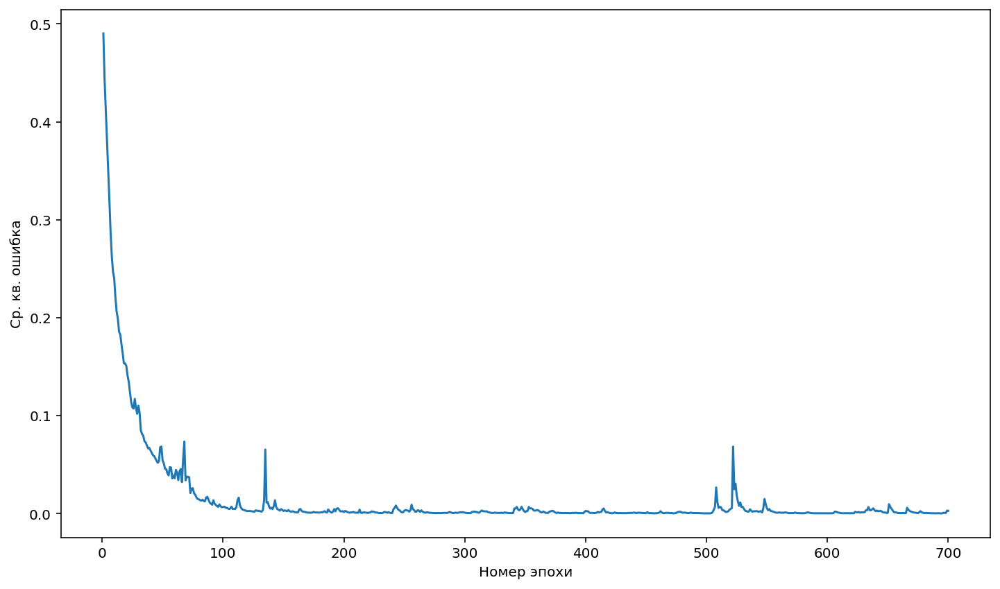

In [34]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [35]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae.append(max_err_val)

Максимальная ошибка по модулю =  0.2515748917464762


<ipython-input-36-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


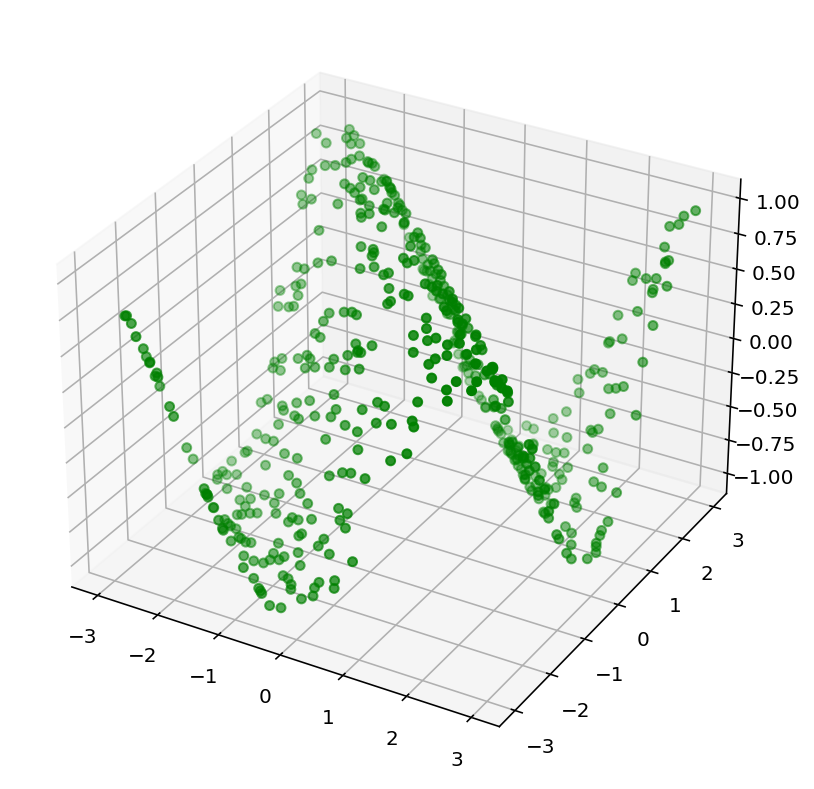

In [36]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


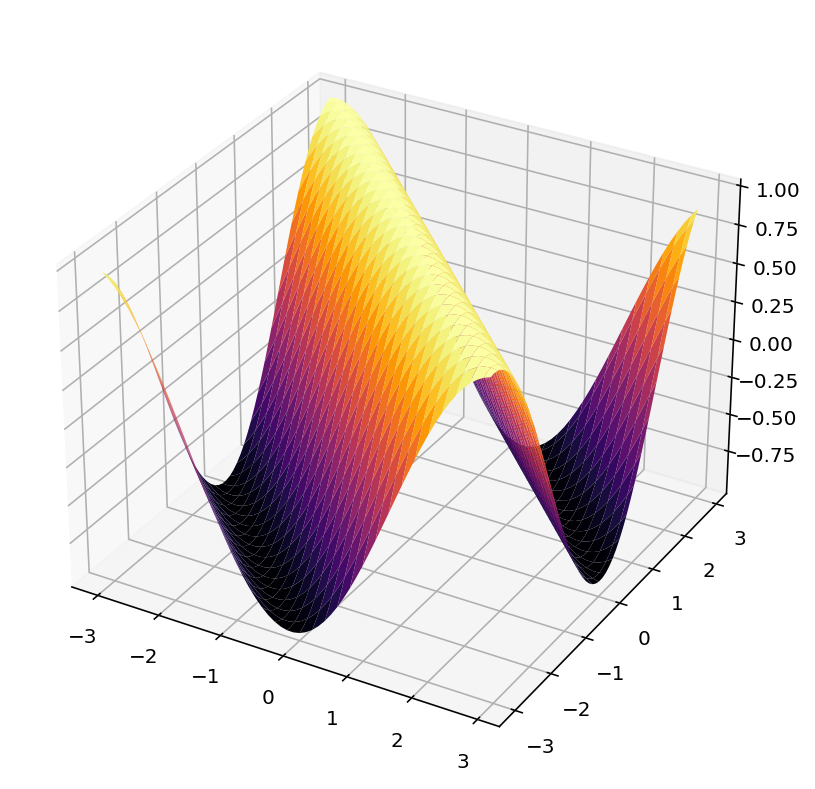

In [37]:
func_draw()

In [38]:
n = 20
xy=[] 
zz=[] 
x, y = get_regular_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])
#history = model()

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


 1/13 [=>............................] - ETA: 16s - loss: 0.4961

 4/13 [========>.....................] - ETA: 0s - loss: 0.4885 

 6/13 [============>.................] - ETA: 0s - loss: 0.4913

 8/13 [=================>............] - ETA: 0s - loss: 0.4869

13/13 [==============================] - 2s 27ms/step - loss: 0.4749


Epoch 2/700
 1/13 [=>............................] - ETA: 0s - loss: 0.4210

13/13 [==============================] - 0s 2ms/step - loss: 0.4035


Epoch 3/700
 1/13 [=>............................] - ETA: 0s - loss: 0.3433

 2/13 [===>..........................] - ETA: 0s - loss: 0.3513

13/13 [==============================] - 0s 7ms/step - loss: 0.3228


Epoch 4/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2881

 2/13 [===>..........................] - ETA: 0s - loss: 0.3179

13/13 [==============================] - 0s 7ms/step - loss: 0.2860


Epoch 5/700


 1/13 [=>............................] - ETA: 0s - loss: 0.2402

13/13 [==============================] - 0s 2ms/step - loss: 0.2235


Epoch 6/700
 1/13 [=>............................] - ETA: 0s - loss: 0.4811

 2/13 [===>..........................] - ETA: 0s - loss: 0.3965

13/13 [==============================] - 0s 6ms/step - loss: 0.2325


Epoch 7/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1372

13/13 [==============================] - 0s 1ms/step - loss: 0.1760


Epoch 8/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2077

13/13 [==============================] - 0s 1ms/step - loss: 0.1486


Epoch 9/700


 1/13 [=>............................] - ETA: 0s - loss: 0.1692

 2/13 [===>..........................] - ETA: 0s - loss: 0.1551

13/13 [==============================] - 0s 6ms/step - loss: 0.1455


Epoch 10/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2150

 3/13 [=====>........................] - ETA: 0s - loss: 0.1653

13/13 [==============================] - 0s 7ms/step - loss: 0.1448


Epoch 11/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1399

12/13 [==========================>...] - ETA: 0s - loss: 0.1196

13/13 [==============================] - 0s 6ms/step - loss: 0.1198


Epoch 12/700


 1/13 [=>............................] - ETA: 0s - loss: 0.1701

13/13 [==============================] - 0s 1ms/step - loss: 0.1189


Epoch 13/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0540

13/13 [==============================] - 0s 1ms/step - loss: 0.0997


Epoch 14/700


 1/13 [=>............................] - ETA: 0s - loss: 0.2308

 6/13 [============>.................] - ETA: 0s - loss: 0.1465

 7/13 [===============>..............] - ETA: 0s - loss: 0.1412

 8/13 [=================>............] - ETA: 0s - loss: 0.1371

 9/13 [===================>..........] - ETA: 0s - loss: 0.1332

13/13 [==============================] - 1s 48ms/step - loss: 0.1206


Epoch 15/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1003

 2/13 [===>..........................] - ETA: 1s - loss: 0.1087

 9/13 [===================>..........] - ETA: 0s - loss: 0.0969

10/13 [======================>.......] - ETA: 0s - loss: 0.0956

13/13 [==============================] - 0s 34ms/step - loss: 0.0932


Epoch 16/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0854

 3/13 [=====>........................] - ETA: 0s - loss: 0.0867

13/13 [==============================] - 0s 7ms/step - loss: 0.0855


Epoch 17/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0744

 2/13 [===>..........................] - ETA: 0s - loss: 0.0709

13/13 [==============================] - 0s 6ms/step - loss: 0.0796


Epoch 18/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0897

 5/13 [==========>...................] - ETA: 0s - loss: 0.0799

13/13 [==============================] - 0s 6ms/step - loss: 0.0734


Epoch 19/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0317

 6/13 [============>.................] - ETA: 0s - loss: 0.0343

13/13 [==============================] - 0s 6ms/step - loss: 0.0435


Epoch 20/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0282

13/13 [==============================] - ETA: 0s - loss: 0.0333

13/13 [==============================] - 0s 6ms/step - loss: 0.0343


Epoch 21/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0278

13/13 [==============================] - 0s 1ms/step - loss: 0.0425


Epoch 22/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0243

13/13 [==============================] - 0s 2ms/step - loss: 0.0386


Epoch 23/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0223

13/13 [==============================] - 0s 1ms/step - loss: 0.0285


Epoch 24/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0094

 6/13 [============>.................] - ETA: 0s - loss: 0.0174

13/13 [==============================] - 0s 6ms/step - loss: 0.0194


Epoch 25/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0197

12/13 [==========================>...] - ETA: 0s - loss: 0.0217

13/13 [==============================] - 0s 6ms/step - loss: 0.0218


Epoch 26/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0111

13/13 [==============================] - 0s 1ms/step - loss: 0.0157


Epoch 27/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0272

13/13 [==============================] - 0s 2ms/step - loss: 0.0202


Epoch 28/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0148

13/13 [==============================] - 0s 1ms/step - loss: 0.0144


Epoch 29/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0137

 8/13 [=================>............] - ETA: 0s - loss: 0.0133

13/13 [==============================] - 0s 6ms/step - loss: 0.0127


Epoch 30/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0110

13/13 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 31/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0068

13/13 [==============================] - 0s 1ms/step - loss: 0.0095


Epoch 32/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0079

13/13 [==============================] - 0s 2ms/step - loss: 0.0067


Epoch 33/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0144

 6/13 [============>.................] - ETA: 0s - loss: 0.0095

13/13 [==============================] - 0s 6ms/step - loss: 0.0083


Epoch 34/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0038

11/13 [========================>.....] - ETA: 0s - loss: 0.0059

13/13 [==============================] - 0s 6ms/step - loss: 0.0057


Epoch 35/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0039

13/13 [==============================] - 0s 1ms/step - loss: 0.0043


Epoch 36/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0038

13/13 [==============================] - 0s 2ms/step - loss: 0.0036


Epoch 37/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0035

13/13 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 38/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

10/13 [======================>.......] - ETA: 0s - loss: 0.0034

13/13 [==============================] - 0s 6ms/step - loss: 0.0035


Epoch 39/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0043

 7/13 [===============>..............] - ETA: 0s - loss: 0.0032

 8/13 [=================>............] - ETA: 0s - loss: 0.0032

 9/13 [===================>..........] - ETA: 0s - loss: 0.0031

13/13 [==============================] - 0s 41ms/step - loss: 0.0030


Epoch 40/700


 1/13 [=>............................] - ETA: 2s - loss: 0.0015

 7/13 [===============>..............] - ETA: 0s - loss: 0.0021

 8/13 [=================>............] - ETA: 0s - loss: 0.0021

13/13 [==============================] - 0s 18ms/step - loss: 0.0022


Epoch 41/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

 9/13 [===================>..........] - ETA: 0s - loss: 0.0024

13/13 [==============================] - 0s 8ms/step - loss: 0.0025


Epoch 42/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 43/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0038

13/13 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 44/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

 2/13 [===>..........................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 6ms/step - loss: 0.0014


Epoch 45/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

 6/13 [============>.................] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 6ms/step - loss: 0.0017


Epoch 46/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 6ms/step - loss: 0.0013


Epoch 47/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0016

 9/13 [===================>..........] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 7ms/step - loss: 0.0013


Epoch 48/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0016

11/13 [========================>.....] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 6ms/step - loss: 0.0015


Epoch 49/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

 6/13 [============>.................] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 7ms/step - loss: 0.0015


Epoch 50/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

 2/13 [===>..........................] - ETA: 1s - loss: 0.0013

 3/13 [=====>........................] - ETA: 2s - loss: 0.0014

11/13 [========================>.....] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 1s 49ms/step - loss: 0.0013


Epoch 51/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1638e-04

 7/13 [===============>..............] - ETA: 0s - loss: 0.0011    

13/13 [==============================] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 16ms/step - loss: 0.0012


Epoch 52/700


 1/13 [=>............................] - ETA: 0s - loss: 9.0787e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 53/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 54/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0016

 3/13 [=====>........................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 7ms/step - loss: 0.0018


Epoch 55/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0031

13/13 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 56/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 57/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0036

11/13 [========================>.....] - ETA: 0s - loss: 0.0025

13/13 [==============================] - ETA: 0s - loss: 0.0024

13/13 [==============================]

 - 1s 44ms/step - loss: 0.0023


Epoch 58/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4127e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0010    

13/13 [==============================] - 0s 8ms/step - loss: 0.0011


Epoch 59/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2188e-04

13/13 [==============================] - ETA: 0s - loss: 0.0010    

13/13 [==============================] - 0s 5ms/step - loss: 0.0010


Epoch 60/700


 1/13 [=>............................] - ETA: 2s - loss: 7.3418e-04

10/13 [======================>.......] - ETA: 0s - loss: 0.0011    

13/13 [==============================] - 0s 10ms/step - loss: 0.0011


Epoch 61/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

 2/13 [===>..........................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 7ms/step - loss: 9.6413e-04


Epoch 62/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2121e-04

13/13 [==============================] - 0s 3ms/step - loss: 7.6516e-04


Epoch 63/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0829e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.8471e-04


Epoch 64/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4233e-04

13/13 [==============================] - ETA: 0s - loss: 8.1807e-04

13/13 [==============================] - 0s 7ms/step - loss: 8.2522e-04


Epoch 65/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

 2/13 [===>..........................] - ETA: 0s - loss: 0.0011

10/13 [======================>.......] - ETA: 0s - loss: 9.5743e-04

11/13 [========================>.....] - ETA: 0s - loss: 9.5382e-04

13/13 [==============================] - 0s 24ms/step - loss: 9.5505e-04


Epoch 66/700


 1/13 [=>............................] - ETA: 1s - loss: 9.6753e-04

 3/13 [=====>........................] - ETA: 0s - loss: 0.0012    

 4/13 [========>.....................] - ETA: 0s - loss: 0.0012

 5/13 [==========>...................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 26ms/step - loss: 0.0011


Epoch 67/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 68/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6462e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.1971e-04


Epoch 69/700
 1/13 [=>............................] - ETA: 0s - loss: 7.6199e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.4584e-04

13/13 [==============================] - 0s 8ms/step - loss: 7.5849e-04


Epoch 70/700


 1/13 [=>............................] - ETA: 0s - loss: 8.2172e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0013    

13/13 [==============================] - 0s 7ms/step - loss: 0.0012


Epoch 71/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

 2/13 [===>..........................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 7ms/step - loss: 8.8261e-04


Epoch 72/700


 1/13 [=>............................] - ETA: 1s - loss: 6.9282e-04

 2/13 [===>..........................] - ETA: 0s - loss: 6.6055e-04

 7/13 [===============>..............] - ETA: 0s - loss: 8.2048e-04

13/13 [==============================] - 0s 16ms/step - loss: 8.8773e-04


Epoch 73/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5482e-04

 3/13 [=====>........................] - ETA: 0s - loss: 8.4051e-04

13/13 [==============================] - 0s 18ms/step - loss: 0.0010


Epoch 74/700


 1/13 [=>............................] - ETA: 1s - loss: 9.0850e-04

 2/13 [===>..........................] - ETA: 1s - loss: 8.6254e-04

 3/13 [=====>........................] - ETA: 0s - loss: 8.3014e-04

13/13 [==============================] - 0s 17ms/step - loss: 0.0010


Epoch 75/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8248e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.5394e-04


Epoch 76/700


 1/13 [=>............................] - ETA: 0s - loss: 9.3224e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.6072e-04


Epoch 77/700


 1/13 [=>............................] - ETA: 0s - loss: 8.2539e-04

12/13 [==========================>...] - ETA: 0s - loss: 6.1999e-04

13/13 [==============================] - 0s 6ms/step - loss: 6.1882e-04


Epoch 78/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0262e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.8401e-04

13/13 [==============================] - 0s 7ms/step - loss: 7.9682e-04


Epoch 79/700


 1/13 [=>............................] - ETA: 0s - loss: 6.9619e-04

 7/13 [===============>..............] - ETA: 0s - loss: 8.6246e-04

13/13 [==============================] - 0s 7ms/step - loss: 8.6253e-04


Epoch 80/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0015

 7/13 [===============>..............] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 7ms/step - loss: 0.0015


Epoch 81/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0020

 5/13 [==========>...................] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 7ms/step - loss: 0.0013


Epoch 82/700
 1/13 [=>............................] - ETA: 0s - loss: 9.0603e-04

 3/13 [=====>........................] - ETA: 0s - loss: 8.7612e-04

13/13 [==============================] - 0s 7ms/step - loss: 7.2700e-04


Epoch 83/700


 1/13 [=>............................] - ETA: 0s - loss: 2.9693e-04

 2/13 [===>..........................] - ETA: 3s - loss: 3.0600e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.9863e-04

13/13 [==============================] - 0s 33ms/step - loss: 5.0974e-04


Epoch 84/700


 1/13 [=>............................] - ETA: 0s - loss: 8.9326e-04

 9/13 [===================>..........] - ETA: 0s - loss: 8.3006e-04

13/13 [==============================] - 0s 9ms/step - loss: 8.7057e-04


Epoch 85/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0018

 3/13 [=====>........................] - ETA: 0s - loss: 0.0016

 8/13 [=================>............] - ETA: 0s - loss: 0.0014

13/13 [==============================] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 25ms/step - loss: 0.0013


Epoch 86/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 2ms/step - loss: 8.7520e-04


Epoch 87/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3840e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.4993e-04


Epoch 88/700


 1/13 [=>............................] - ETA: 0s - loss: 6.4058e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.6739e-04


Epoch 89/700
 1/13 [=>............................] - ETA: 0s - loss: 7.1399e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.9915e-04


Epoch 90/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1101e-04

 9/13 [===================>..........] - ETA: 0s - loss: 4.5124e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.8107e-04


Epoch 91/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0990e-04

 3/13 [=====>........................] - ETA: 0s - loss: 5.2185e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.2937e-04


Epoch 92/700
 1/13 [=>............................] - ETA: 0s - loss: 6.5338e-04

 2/13 [===>..........................] - ETA: 0s - loss: 8.1812e-04

13/13 [==============================] - 0s 6ms/step - loss: 9.1996e-04


Epoch 93/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7120e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.1312e-04


Epoch 94/700


 1/13 [=>............................] - ETA: 0s - loss: 4.7594e-04

 2/13 [===>..........................] - ETA: 3s - loss: 7.3863e-04

 3/13 [=====>........................] - ETA: 2s - loss: 7.5242e-04

 9/13 [===================>..........] - ETA: 0s - loss: 6.9779e-04

13/13 [==============================] - 1s 51ms/step - loss: 7.1083e-04


Epoch 95/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0221e-04

 7/13 [===============>..............] - ETA: 0s - loss: 7.9372e-04

13/13 [==============================] - 0s 9ms/step - loss: 7.7402e-04


Epoch 96/700


 1/13 [=>............................] - ETA: 1s - loss: 2.5278e-04

 6/13 [============>.................] - ETA: 0s - loss: 6.0906e-04

13/13 [==============================] - 0s 9ms/step - loss: 7.1065e-04


Epoch 97/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2294e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.2031e-04


Epoch 98/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1762e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.4367e-04


Epoch 99/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6819e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.4521e-04


Epoch 100/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4160e-04

 9/13 [===================>..........] - ETA: 0s - loss: 3.5330e-04

13/13 [==============================] - 0s 8ms/step - loss: 3.7307e-04


Epoch 101/700


 1/13 [=>............................] - ETA: 0s - loss: 7.1249e-04

 5/13 [==========>...................] - ETA: 0s - loss: 6.1885e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.0960e-04


Epoch 102/700


 1/13 [=>............................] - ETA: 0s - loss: 7.4754e-04

 3/13 [=====>........................] - ETA: 0s - loss: 7.3301e-04

12/13 [==========================>...] - ETA: 0s - loss: 6.5886e-04

13/13 [==============================] - 0s 17ms/step - loss: 6.5723e-04


Epoch 103/700


 1/13 [=>............................] - ETA: 0s - loss: 6.4045e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.9326e-04

10/13 [======================>.......] - ETA: 0s - loss: 4.3614e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.3493e-04

13/13 [==============================] - 0s 25ms/step - loss: 4.3288e-04


Epoch 104/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6960e-04

13/13 [==============================] - ETA: 0s - loss: 5.1036e-04

13/13 [==============================] - 0s 9ms/step - loss: 5.1225e-04


Epoch 105/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7004e-04

 2/13 [===>..........................] - ETA: 1s - loss: 3.1493e-04

 5/13 [==========>...................] - ETA: 0s - loss: 4.4313e-04

 8/13 [=================>............] - ETA: 0s - loss: 4.9179e-04

13/13 [==============================] - 0s 25ms/step - loss: 5.8659e-04


Epoch 106/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

10/13 [======================>.......] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 8ms/step - loss: 0.0010


Epoch 107/700
 1/13 [=>............................] - ETA: 0s - loss: 6.0158e-04

 8/13 [=================>............] - ETA: 0s - loss: 5.7831e-04

13/13 [==============================] - 0s 6ms/step - loss: 6.0659e-04


Epoch 108/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7702e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.6922e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.6639e-04


Epoch 109/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3324e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.2098e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.8491e-04


Epoch 110/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1999e-04

 5/13 [==========>...................] - ETA: 0s - loss: 3.5775e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.3833e-04


Epoch 111/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4549e-04

 4/13 [========>.....................] - ETA: 0s - loss: 8.5968e-04

13/13 [==============================] - 0s 7ms/step - loss: 0.0010


Epoch 112/700


 1/13 [=>............................] - ETA: 0s - loss: 7.6544e-04

 5/13 [==========>...................] - ETA: 0s - loss: 0.0012    

13/13 [==============================] - 0s 7ms/step - loss: 0.0012


Epoch 113/700
 1/13 [=>............................] - ETA: 0s - loss: 5.3982e-04

 4/13 [========>.....................] - ETA: 0s - loss: 6.2259e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.7607e-04


Epoch 114/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0513e-04

 4/13 [========>.....................] - ETA: 0s - loss: 4.4736e-04

13/13 [==============================] - 0s 6ms/step - loss: 6.6678e-04


Epoch 115/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0020

 2/13 [===>..........................] - ETA: 0s - loss: 0.0018

11/13 [========================>.....] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 16ms/step - loss: 0.0019


Epoch 116/700


 1/13 [=>............................] - ETA: 2s - loss: 0.0026

 8/13 [=================>............] - ETA: 0s - loss: 0.0017

 9/13 [===================>..........] - ETA: 0s - loss: 0.0016

13/13 [==============================] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 1s 25ms/step - loss: 0.0015


Epoch 117/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7267e-04

 3/13 [=====>........................] - ETA: 0s - loss: 0.0013    

13/13 [==============================] - 0s 10ms/step - loss: 0.0016


Epoch 118/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6789e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 119/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 2ms/step - loss: 9.4916e-04


Epoch 120/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1016e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.8443e-04


Epoch 121/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 1ms/step - loss: 8.9370e-04


Epoch 122/700


 1/13 [=>............................] - ETA: 0s - loss: 5.8320e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.0861e-04


Epoch 123/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7575e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.5614e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.8970e-04


Epoch 124/700


 1/13 [=>............................] - ETA: 0s - loss: 4.4215e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.8481e-04


Epoch 125/700


 1/13 [=>............................] - ETA: 0s - loss: 8.9702e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.0688e-04


Epoch 126/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 127/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0013

 5/13 [==========>...................] - ETA: 0s - loss: 9.7733e-04

 6/13 [============>.................] - ETA: 0s - loss: 9.7120e-04

13/13 [==============================] - 1s 43ms/step - loss: 9.2569e-04


Epoch 128/700


 1/13 [=>............................] - ETA: 0s - loss: 8.0959e-04

 7/13 [===============>..............] - ETA: 0s - loss: 8.7632e-04

11/13 [========================>.....] - ETA: 0s - loss: 9.1135e-04

13/13 [==============================] - 0s 17ms/step - loss: 9.4117e-04


Epoch 129/700
 1/13 [=>............................] - ETA: 0s - loss: 7.9875e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 130/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5882e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.0933e-04


Epoch 131/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6391e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5614e-04


Epoch 132/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6031e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.4410e-04


Epoch 133/700


 1/13 [=>............................] - ETA: 0s - loss: 3.0628e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.9298e-04


Epoch 134/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6856e-04

10/13 [======================>.......] - ETA: 0s - loss: 5.3377e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.4624e-04


Epoch 135/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2713e-04

 7/13 [===============>..............] - ETA: 0s - loss: 5.6147e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.2767e-04


Epoch 136/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4274e-04

 5/13 [==========>...................] - ETA: 0s - loss: 4.6796e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.2164e-04


Epoch 137/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0367e-04

 4/13 [========>.....................] - ETA: 0s - loss: 3.6912e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.6689e-04


Epoch 138/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4901e-04

 3/13 [=====>........................] - ETA: 0s - loss: 5.4143e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.2980e-04


Epoch 139/700


 1/13 [=>............................] - ETA: 2s - loss: 5.0823e-04

 2/13 [===>..........................] - ETA: 1s - loss: 4.2772e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.0287e-04

13/13 [==============================] - 0s 19ms/step - loss: 3.2873e-04


Epoch 140/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0419e-04

 4/13 [========>.....................] - ETA: 0s - loss: 2.5271e-04

13/13 [==============================] - 0s 11ms/step - loss: 2.8922e-04


Epoch 141/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2327e-04

 8/13 [=================>............] - ETA: 0s - loss: 3.1449e-04

13/13 [==============================] - 0s 9ms/step - loss: 3.2306e-04


Epoch 142/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7393e-04

 2/13 [===>..........................] - ETA: 0s - loss: 1.8370e-04

 9/13 [===================>..........] - ETA: 0s - loss: 3.0475e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.1021e-04

13/13 [==============================] - 0s 24ms/step - loss: 3.2443e-04


Epoch 143/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5851e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.4812e-04


Epoch 144/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9918e-04

 2/13 [===>..........................] - ETA: 0s - loss: 4.8354e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.9773e-04


Epoch 145/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7737e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5462e-04


Epoch 146/700


 1/13 [=>............................] - ETA: 0s - loss: 6.0303e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.9328e-04


Epoch 147/700
 1/13 [=>............................] - ETA: 0s - loss: 6.5571e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.0144e-04


Epoch 148/700


 1/13 [=>............................] - ETA: 0s - loss: 9.1708e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.2419e-04


Epoch 149/700


 1/13 [=>............................] - ETA: 0s - loss: 4.4976e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 150/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 151/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0029

10/13 [======================>.......] - ETA: 0s - loss: 0.0024

13/13 [==============================] - 0s 9ms/step - loss: 0.0024


Epoch 152/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6491e-04

11/13 [========================>.....] - ETA: 0s - loss: 0.0025    

13/13 [==============================] - 0s 17ms/step - loss: 0.0026


Epoch 153/700


 1/13 [=>............................] - ETA: 3s - loss: 0.0025

 4/13 [========>.....................] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 10ms/step - loss: 0.0020


Epoch 154/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4903e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 155/700
 1/13 [=>............................] - ETA: 0s - loss: 4.1809e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.1179e-04


Epoch 156/700


 1/13 [=>............................] - ETA: 0s - loss: 3.4178e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.9439e-04


Epoch 157/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4087e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.8761e-04


Epoch 158/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3212e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.9828e-04


Epoch 159/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5703e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.5054e-04


Epoch 160/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6696e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.5910e-04


Epoch 161/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6314e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.7428e-04


Epoch 162/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4225e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.5621e-04


Epoch 163/700


 1/13 [=>............................] - ETA: 0s - loss: 3.3679e-04

13/13 [==============================] - ETA: 0s - loss: 3.1229e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.1424e-04


Epoch 164/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4471e-04

13/13 [==============================] - ETA: 0s - loss: 2.4316e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.4541e-04


Epoch 165/700
 1/13 [=>............................] - ETA: 1s - loss: 2.2352e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.6359e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.6446e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.7067e-04

13/13 [==============================] - 0s 25ms/step - loss: 2.7483e-04


Epoch 166/700


 1/13 [=>............................] - ETA: 2s - loss: 3.2158e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.1420e-04

13/13 [==============================] - 0s 8ms/step - loss: 3.1295e-04


Epoch 167/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2707e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.3361e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.2325e-04


Epoch 168/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2356e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.0258e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.9796e-04


Epoch 169/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7915e-04

13/13 [==============================] - ETA: 0s - loss: 2.5135e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.5293e-04


Epoch 170/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7248e-04

13/13 [==============================] - ETA: 0s - loss: 3.0688e-04

13/13 [==============================] - 0s 6ms/step - loss: 3.0817e-04


Epoch 171/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6565e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.2347e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.2732e-04


Epoch 172/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1973e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.7517e-04

13/13 [==============================] - 0s 8ms/step - loss: 3.5756e-04


Epoch 173/700


 1/13 [=>............................] - ETA: 0s - loss: 4.4049e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.6439e-04


Epoch 174/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6321e-04

13/13 [==============================] - ETA: 0s - loss: 6.1133e-04

13/13 [==============================] - 0s 26ms/step - loss: 6.1516e-04


Epoch 175/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8097e-04

 8/13 [=================>............] - ETA: 0s - loss: 4.0845e-04

13/13 [==============================] - 0s 10ms/step - loss: 3.9931e-04


Epoch 176/700
 1/13 [=>............................] - ETA: 1s - loss: 2.7968e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.5010e-04

13/13 [==============================] - 0s 10ms/step - loss: 3.5350e-04


Epoch 177/700


 1/13 [=>............................] - ETA: 1s - loss: 3.0758e-04

 9/13 [===================>..........] - ETA: 0s - loss: 2.9060e-04

13/13 [==============================] - 0s 8ms/step - loss: 2.9638e-04


Epoch 178/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1229e-04

 7/13 [===============>..............] - ETA: 0s - loss: 3.1152e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.2060e-04


Epoch 179/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4650e-04

 7/13 [===============>..............] - ETA: 0s - loss: 3.9681e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.0320e-04


Epoch 180/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6297e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.3892e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.0793e-04


Epoch 181/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6767e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.1323e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.0943e-04


Epoch 182/700


 1/13 [=>............................] - ETA: 0s - loss: 4.1768e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.4557e-04


Epoch 183/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4841e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.9818e-04


Epoch 184/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 2ms/step - loss: 8.7741e-04


Epoch 185/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 3ms/step - loss: 0.0019


Epoch 186/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8334e-04

 2/13 [===>..........................] - ETA: 5s - loss: 8.3877e-04

 9/13 [===================>..........] - ETA: 0s - loss: 6.9893e-04

13/13 [==============================] - 1s 49ms/step - loss: 6.5295e-04


Epoch 187/700


 1/13 [=>............................] - ETA: 1s - loss: 6.6258e-04

 2/13 [===>..........................] - ETA: 0s - loss: 6.6230e-04

13/13 [==============================] - 0s 9ms/step - loss: 5.6602e-04


Epoch 188/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1160e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.5042e-04

13/13 [==============================] - 0s 9ms/step - loss: 3.6330e-04


Epoch 189/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2334e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.5407e-04


Epoch 190/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 191/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0116e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.7236e-04


Epoch 192/700


 1/13 [=>............................] - ETA: 0s - loss: 4.3977e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.2909e-04


Epoch 193/700


 1/13 [=>............................] - ETA: 0s - loss: 4.9805e-04

13/13 [==============================] - ETA: 0s - loss: 4.6027e-04

13/13 [==============================] - 0s 8ms/step - loss: 4.5789e-04


Epoch 194/700


 1/13 [=>............................] - ETA: 3s - loss: 1.6958e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.8751e-04

13/13 [==============================] - 0s 8ms/step - loss: 4.0901e-04


Epoch 195/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9474e-04

 2/13 [===>..........................] - ETA: 0s - loss: 5.2780e-04

 8/13 [=================>............] - ETA: 0s - loss: 4.9901e-04

11/13 [========================>.....] - ETA: 0s - loss: 5.0217e-04

13/13 [==============================] - 0s 23ms/step - loss: 5.1370e-04


Epoch 196/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9529e-04

 6/13 [============>.................] - ETA: 0s - loss: 5.4505e-04

13/13 [==============================] - 0s 9ms/step - loss: 5.3369e-04


Epoch 197/700


 1/13 [=>............................] - ETA: 0s - loss: 7.6616e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.6126e-04


Epoch 198/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 199/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2399e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.5649e-04


Epoch 200/700
 1/13 [=>............................] - ETA: 0s - loss: 5.3517e-04

12/13 [==========================>...] - ETA: 0s - loss: 8.0570e-04

13/13 [==============================] - 0s 7ms/step - loss: 8.1153e-04


Epoch 201/700


 1/13 [=>............................] - ETA: 0s - loss: 4.3207e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.7103e-04

13/13 [==============================] - 0s 6ms/step - loss: 7.7347e-04


Epoch 202/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

 2/13 [===>..........................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 7ms/step - loss: 0.0011


Epoch 203/700


 1/13 [=>............................] - ETA: 0s - loss: 1.6295e-04

13/13 [==============================] - 0s 3ms/step - loss: 4.4492e-04


Epoch 204/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6257e-04

 9/13 [===================>..........] - ETA: 0s - loss: 4.4034e-04

13/13 [==============================] - 0s 8ms/step - loss: 4.2602e-04


Epoch 205/700
 1/13 [=>............................] - ETA: 0s - loss: 3.9973e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.1801e-04


Epoch 206/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8773e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.4005e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.4103e-04


Epoch 207/700


 1/13 [=>............................] - ETA: 0s - loss: 3.0587e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.8389e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.1922e-04

13/13 [==============================] - 0s 16ms/step - loss: 2.1696e-04


Epoch 208/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0800e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.8708e-04

13/13 [==============================] - 0s 10ms/step - loss: 2.9124e-04


Epoch 209/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5997e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.0450e-04

 9/13 [===================>..........] - ETA: 0s - loss: 4.7452e-04

13/13 [==============================] - 0s 17ms/step - loss: 5.0111e-04


Epoch 210/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0022

 5/13 [==========>...................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 10ms/step - loss: 0.0012


Epoch 211/700


 1/13 [=>............................] - ETA: 0s - loss: 5.5394e-04

 6/13 [============>.................] - ETA: 0s - loss: 5.7834e-04

13/13 [==============================] - 0s 12ms/step - loss: 5.7675e-04


Epoch 212/700


 1/13 [=>............................] - ETA: 0s - loss: 7.6222e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.1572e-04


Epoch 213/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

10/13 [======================>.......] - ETA: 0s - loss: 8.0016e-04

13/13 [==============================] - 0s 7ms/step - loss: 7.3077e-04


Epoch 214/700


 1/13 [=>............................] - ETA: 0s - loss: 4.4524e-04

 7/13 [===============>..............] - ETA: 0s - loss: 5.6505e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.8462e-04


Epoch 215/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

 3/13 [=====>........................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 8ms/step - loss: 0.0012


Epoch 216/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

12/13 [==========================>...] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 8ms/step - loss: 0.0013


Epoch 217/700


 1/13 [=>............................] - ETA: 2s - loss: 9.4139e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0013    

12/13 [==========================>...] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 19ms/step - loss: 0.0013


Epoch 218/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0021

 4/13 [========>.....................] - ETA: 0s - loss: 0.0015

10/13 [======================>.......] - ETA: 0s - loss: 0.0011

12/13 [==========================>...] - ETA: 0s - loss: 0.0010

13/13 [==============================] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 32ms/step - loss: 9.8947e-04


Epoch 219/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1140e-04

 5/13 [==========>...................] - ETA: 0s - loss: 2.6693e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.4120e-04


Epoch 220/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0347e-04

 6/13 [============>.................] - ETA: 0s - loss: 5.2570e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.5979e-04


Epoch 221/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4036e-04

 6/13 [============>.................] - ETA: 0s - loss: 4.4142e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.5925e-04


Epoch 222/700


 1/13 [=>............................] - ETA: 0s - loss: 3.0525e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.5650e-04

13/13 [==============================] - 0s 9ms/step - loss: 4.6349e-04


Epoch 223/700


 1/13 [=>............................] - ETA: 1s - loss: 3.2792e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.4967e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.3058e-04

13/13 [==============================] - 0s 17ms/step - loss: 7.2933e-04


Epoch 224/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3544e-04

 4/13 [========>.....................] - ETA: 0s - loss: 9.5820e-04

 9/13 [===================>..........] - ETA: 0s - loss: 9.9760e-04

13/13 [==============================] - 0s 17ms/step - loss: 9.2354e-04


Epoch 225/700


 1/13 [=>............................] - ETA: 0s - loss: 3.5217e-04

 7/13 [===============>..............] - ETA: 0s - loss: 3.3315e-04

13/13 [==============================] - 0s 8ms/step - loss: 3.1691e-04


Epoch 226/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1807e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.6029e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.7203e-04


Epoch 227/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4638e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.5306e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.4957e-04


Epoch 228/700


 1/13 [=>............................] - ETA: 0s - loss: 4.1752e-04

10/13 [======================>.......] - ETA: 0s - loss: 6.7458e-04

11/13 [========================>.....] - ETA: 0s - loss: 6.8063e-04

13/13 [==============================] - 0s 17ms/step - loss: 6.9332e-04


Epoch 229/700


 1/13 [=>............................] - ETA: 1s - loss: 5.4132e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.6586e-04


Epoch 230/700


 1/13 [=>............................] - ETA: 0s - loss: 3.3228e-04

 7/13 [===============>..............] - ETA: 0s - loss: 4.2141e-04

10/13 [======================>.......] - ETA: 0s - loss: 4.6654e-04

13/13 [==============================] - 0s 18ms/step - loss: 5.0484e-04


Epoch 231/700


 1/13 [=>............................] - ETA: 1s - loss: 9.0834e-04

 7/13 [===============>..............] - ETA: 0s - loss: 7.5745e-04

13/13 [==============================] - 0s 8ms/step - loss: 7.1660e-04


Epoch 232/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1763e-04

 4/13 [========>.....................] - ETA: 0s - loss: 4.0034e-04

13/13 [==============================] - 0s 8ms/step - loss: 3.4921e-04


Epoch 233/700


 1/13 [=>............................] - ETA: 5s - loss: 2.2228e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.1461e-04

13/13 [==============================] - 1s 10ms/step - loss: 3.2373e-04


Epoch 234/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8617e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.0218e-04

 8/13 [=================>............] - ETA: 0s - loss: 3.0743e-04

13/13 [==============================] - 0s 17ms/step - loss: 3.1826e-04


Epoch 235/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0186e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.5378e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.5627e-04


Epoch 236/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0192e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.5174e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.4902e-04


Epoch 237/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2410e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.1877e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.0106e-04


Epoch 238/700


 1/13 [=>............................] - ETA: 0s - loss: 2.0620e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3694e-04


Epoch 239/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2453e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.4178e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.4874e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.5741e-04

13/13 [==============================] - 0s 33ms/step - loss: 2.7169e-04


Epoch 240/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1591e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.6054e-04


Epoch 241/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9518e-04

 4/13 [========>.....................] - ETA: 0s - loss: 3.1525e-04

13/13 [==============================] - ETA: 0s - loss: 3.0738e-04

13/13 [==============================] - 0s 16ms/step - loss: 3.0671e-04


Epoch 242/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9167e-04

 7/13 [===============>..............] - ETA: 0s - loss: 2.9259e-04

13/13 [==============================] - 0s 17ms/step - loss: 3.0622e-04


Epoch 243/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8809e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.1121e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.1653e-04


Epoch 244/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5579e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.5953e-04

13/13 [==============================] - 0s 6ms/step - loss: 2.5939e-04


Epoch 245/700


 1/13 [=>............................] - ETA: 0s - loss: 1.9316e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.7437e-04


Epoch 246/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4603e-04

 7/13 [===============>..............] - ETA: 0s - loss: 4.2637e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.9583e-04


Epoch 247/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3132e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.1396e-04

13/13 [==============================] - 0s 6ms/step - loss: 2.3607e-04


Epoch 248/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8355e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6336e-04


Epoch 249/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8478e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8472e-04


Epoch 250/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9585e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.3906e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.3645e-04


Epoch 251/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5305e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6025e-04


Epoch 252/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8768e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.7432e-04


Epoch 253/700


 1/13 [=>............................] - ETA: 0s - loss: 3.0114e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.4927e-04


Epoch 254/700


 1/13 [=>............................] - ETA: 0s - loss: 2.0032e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8834e-04


Epoch 255/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4555e-04

 8/13 [=================>............] - ETA: 0s - loss: 1.6015e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.6597e-04


Epoch 256/700
 1/13 [=>............................] - ETA: 0s - loss: 9.3665e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.6135e-04


Epoch 257/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5744e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.0992e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.0836e-04


Epoch 258/700


 1/13 [=>............................] - ETA: 0s - loss: 2.2167e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.5268e-04


Epoch 259/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5513e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.3381e-04


Epoch 260/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6206e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.1301e-04


Epoch 261/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1238e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7066e-04


Epoch 262/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2982e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.9433e-04


Epoch 263/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6665e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.9249e-04


Epoch 264/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8011e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.8746e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.7841e-04


Epoch 265/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2988e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.2852e-04


Epoch 266/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5998e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0930e-04


Epoch 267/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0952e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0524e-04


Epoch 268/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4847e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.5510e-04


Epoch 269/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7079e-04

13/13 [==============================] - ETA: 0s - loss: 3.6845e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.7596e-04


Epoch 270/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7764e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.3708e-04


Epoch 271/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3654e-04

12/13 [==========================>...] - ETA: 0s - loss: 8.9149e-04

13/13 [==============================] - 0s 4ms/step - loss: 9.6390e-04


Epoch 272/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0069

13/13 [==============================] - 0s 1ms/step - loss: 0.0048


Epoch 273/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0033

12/13 [==========================>...] - ETA: 0s - loss: 0.0036

13/13 [==============================] - 0s 4ms/step - loss: 0.0036


Epoch 274/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0081

13/13 [==============================] - 0s 1ms/step - loss: 0.0043


Epoch 275/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0015

11/13 [========================>.....] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 5ms/step - loss: 0.0012


Epoch 276/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8410e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.4040e-04


Epoch 277/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9535e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.4984e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.1782e-04


Epoch 278/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7186e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.5099e-04


Epoch 279/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4595e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2571e-04


Epoch 280/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7783e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.0142e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.9873e-04


Epoch 281/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4085e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.0134e-04


Epoch 282/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7189e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.6328e-04


Epoch 283/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5575e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 284/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9288e-04

11/13 [========================>.....] - ETA: 0s - loss: 5.9561e-04

13/13 [==============================] - 0s 5ms/step - loss: 6.0683e-04


Epoch 285/700
 1/13 [=>............................] - ETA: 0s - loss: 9.7723e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.3148e-04


Epoch 286/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4413e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.1213e-04


Epoch 287/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2374e-04

13/13 [==============================] - 0s 3ms/step - loss: 4.0194e-04


Epoch 288/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2802e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.1428e-04


Epoch 289/700


 1/13 [=>............................] - ETA: 0s - loss: 1.6173e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2314e-04


Epoch 290/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2633e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2789e-04


Epoch 291/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7351e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.1153e-04


Epoch 292/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6089e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.5117e-04


Epoch 293/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6302e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.6386e-04


Epoch 294/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8817e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.9209e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.1108e-04


Epoch 295/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1691e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.1805e-04


Epoch 296/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3611e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.2007e-04


Epoch 297/700


 1/13 [=>............................] - ETA: 0s - loss: 9.3269e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.2065e-04


Epoch 298/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0374e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.8161e-04


Epoch 299/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7015e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.9614e-04


Epoch 300/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1676e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7415e-04


Epoch 301/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8160e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0815e-04


Epoch 302/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7684e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8163e-04


Epoch 303/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3491e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.5241e-04


Epoch 304/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5514e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.4776e-04


Epoch 305/700


 1/13 [=>............................] - ETA: 0s - loss: 2.8351e-04

11/13 [========================>.....] - ETA: 0s - loss: 5.1420e-04

13/13 [==============================] - 0s 5ms/step - loss: 5.3353e-04


Epoch 306/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0691e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.6576e-04


Epoch 307/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3567e-04

13/13 [==============================] - 0s 4ms/step - loss: 6.0282e-04


Epoch 308/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

13/13 [==============================] - 0s 1ms/step - loss: 9.9639e-04


Epoch 309/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0855e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.7767e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.5979e-04


Epoch 310/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0741e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.7423e-04


Epoch 311/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9273e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.5574e-04


Epoch 312/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 1ms/step - loss: 6.2367e-04


Epoch 313/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4862e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.3833e-04


Epoch 314/700
 1/13 [=>............................] - ETA: 0s - loss: 9.2454e-04

 9/13 [===================>..........] - ETA: 0s - loss: 5.4313e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.8378e-04


Epoch 315/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1503e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8898e-04


Epoch 316/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7558e-04

13/13 [==============================] - ETA: 0s - loss: 2.7309e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.7632e-04


Epoch 317/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5920e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.0565e-04


Epoch 318/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 4ms/step - loss: 0.0017


Epoch 319/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2132e-04

13/13 [==============================] - 0s 3ms/step - loss: 8.6919e-04


Epoch 320/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2298e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.9491e-04


Epoch 321/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5566e-04

13/13 [==============================] - 0s 3ms/step - loss: 5.5194e-04


Epoch 322/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0612e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.3972e-04


Epoch 323/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1058e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.0092e-04


Epoch 324/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5229e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.4620e-04


Epoch 325/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8966e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.7122e-04


Epoch 326/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8834e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.3297e-04


Epoch 327/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 1ms/step - loss: 9.8227e-04


Epoch 328/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9301e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 329/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5422e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 330/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 331/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3571e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.5300e-04


Epoch 332/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

11/13 [========================>.....] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 5ms/step - loss: 0.0020


Epoch 333/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0049

13/13 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 334/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 335/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5332e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.1197e-04


Epoch 336/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4596e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.9297e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.9759e-04


Epoch 337/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6216e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.1479e-04


Epoch 338/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1178e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.8925e-04


Epoch 339/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4780e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.4612e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.4981e-04


Epoch 340/700
 1/13 [=>............................] - ETA: 0s - loss: 4.1921e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.0587e-04


Epoch 341/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8575e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.1318e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.1536e-04


Epoch 342/700


 1/13 [=>............................] - ETA: 0s - loss: 2.5842e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.1096e-04


Epoch 343/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6246e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.6568e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.3967e-04


Epoch 344/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7600e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7416e-04


Epoch 345/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3634e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0790e-04


Epoch 346/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2967e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.4608e-04


Epoch 347/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2301e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3286e-04


Epoch 348/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0624e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.8928e-04


Epoch 349/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1004e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0022


Epoch 350/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0022

 8/13 [=================>............] - ETA: 0s - loss: 0.0094

13/13 [==============================] - 0s 5ms/step - loss: 0.0113


Epoch 351/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0132

13/13 [==============================] - 0s 1ms/step - loss: 0.0109


Epoch 352/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0139

13/13 [==============================] - 0s 1ms/step - loss: 0.0093


Epoch 353/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0033

13/13 [==============================] - 0s 1ms/step - loss: 0.0042


Epoch 354/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 1ms/step - loss: 9.2290e-04


Epoch 355/700
 1/13 [=>............................] - ETA: 0s - loss: 6.5593e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.3241e-04


Epoch 356/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2952e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.8757e-04


Epoch 357/700


 1/13 [=>............................] - ETA: 0s - loss: 2.2486e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.5255e-04


Epoch 358/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7387e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.6037e-04


Epoch 359/700


 1/13 [=>............................] - ETA: 0s - loss: 2.4290e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.5562e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.5405e-04


Epoch 360/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2314e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2733e-04


Epoch 361/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8002e-04

 5/13 [==========>...................] - ETA: 0s - loss: 3.1736e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.6925e-04


Epoch 362/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3872e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.1745e-04


Epoch 363/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4278e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.9920e-04


Epoch 364/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2191e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.9422e-04


Epoch 365/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4764e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.2774e-04


Epoch 366/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1624e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2601e-04


Epoch 367/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3171e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.9844e-04


Epoch 368/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4762e-04

13/13 [==============================] - ETA: 0s - loss: 1.9466e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.9546e-04


Epoch 369/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3133e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6856e-04


Epoch 370/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8176e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.1607e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.1414e-04


Epoch 371/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2188e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.1172e-04


Epoch 372/700
 1/13 [=>............................] - ETA: 0s - loss: 9.6348e-05

 9/13 [===================>..........] - ETA: 0s - loss: 1.3323e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.3783e-04


Epoch 373/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0610e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0602e-04


Epoch 374/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4958e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.1738e-04


Epoch 375/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9524e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.4312e-04


Epoch 376/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1555e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6665e-04


Epoch 377/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4159e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0382e-04


Epoch 378/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0708e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4980e-04


Epoch 379/700
 1/13 [=>............................] - ETA: 0s - loss: 9.8661e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.7071e-05


Epoch 380/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1518e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.2295e-05


Epoch 381/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3940e-05

13/13 [==============================] - ETA: 0s - loss: 1.0952e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1111e-04


Epoch 382/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6421e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.3424e-04


Epoch 383/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6116e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.2357e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.2322e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.2278e-04

13/13 [==============================] - ETA: 0s - loss: 1.2221e-04

13/13 [==============================] - 1s 45ms/step - loss: 1.2172e-04


Epoch 384/700
 1/13 [=>............................] - ETA: 0s - loss: 9.2715e-05

10/13 [======================>.......] - ETA: 0s - loss: 9.3691e-05

13/13 [==============================] - 0s 9ms/step - loss: 9.8353e-05


Epoch 385/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0012e-05

 3/13 [=====>........................] - ETA: 0s - loss: 9.1632e-05

 6/13 [============>.................] - ETA: 0s - loss: 9.9337e-05

 9/13 [===================>..........] - ETA: 0s - loss: 1.0135e-04

13/13 [==============================] - 0s 25ms/step - loss: 1.0285e-04


Epoch 386/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0167e-05

 7/13 [===============>..............] - ETA: 0s - loss: 9.5684e-05

13/13 [==============================] - 0s 6ms/step - loss: 9.4886e-05


Epoch 387/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9980e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.5835e-05


Epoch 388/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4953e-05

13/13 [==============================] - 0s 4ms/step - loss: 8.6163e-05


Epoch 389/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5836e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.5340e-04


Epoch 390/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3009e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.8961e-04


Epoch 391/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5812e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.4724e-04


Epoch 392/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2474e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.6649e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.7184e-04


Epoch 393/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1466e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.1971e-04


Epoch 394/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4207e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.3214e-04


Epoch 395/700
 1/13 [=>............................] - ETA: 0s - loss: 6.7891e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.7327e-04


Epoch 396/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2852e-04

 8/13 [=================>............] - ETA: 0s - loss: 5.5366e-04

13/13 [==============================] - 0s 9ms/step - loss: 4.8810e-04


Epoch 397/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3709e-04

 2/13 [===>..........................] - ETA: 2s - loss: 2.1159e-04

 5/13 [==========>...................] - ETA: 0s - loss: 2.3780e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.4018e-04

13/13 [==============================] - 0s 33ms/step - loss: 2.3714e-04


Epoch 398/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4820e-04

 9/13 [===================>..........] - ETA: 0s - loss: 2.2993e-04

13/13 [==============================] - 0s 9ms/step - loss: 2.7542e-04


Epoch 399/700


 1/13 [=>............................] - ETA: 0s - loss: 5.0795e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.3280e-04

13/13 [==============================] - 0s 9ms/step - loss: 9.2353e-04


Epoch 400/700


 1/13 [=>............................] - ETA: 0s - loss: 8.5705e-04

 3/13 [=====>........................] - ETA: 0s - loss: 9.8409e-04

13/13 [==============================] - 0s 9ms/step - loss: 8.6660e-04


Epoch 401/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2190e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.0666e-04


Epoch 402/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3465e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.0079e-04


Epoch 403/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7139e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3996e-04


Epoch 404/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3859e-04

13/13 [==============================] - ETA: 0s - loss: 1.7880e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.8001e-04


Epoch 405/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6770e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.4675e-04


Epoch 406/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4847e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.2250e-04


Epoch 407/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2560e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.2845e-04


Epoch 408/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5180e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3605e-04


Epoch 409/700


 1/13 [=>............................] - ETA: 0s - loss: 7.1737e-05

13/13 [==============================] - 0s 3ms/step - loss: 8.6276e-05


Epoch 410/700


 1/13 [=>............................] - ETA: 0s - loss: 2.0821e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.5626e-04


Epoch 411/700
 1/13 [=>............................] - ETA: 0s - loss: 7.6074e-05

13/13 [==============================] - 0s 4ms/step - loss: 9.7328e-05


Epoch 412/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1306e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.7281e-05


Epoch 413/700


 1/13 [=>............................] - ETA: 0s - loss: 6.7942e-05

13/13 [==============================] - 0s 2ms/step - loss: 8.2241e-05


Epoch 414/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2054e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.1244e-04


Epoch 415/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7213e-04

 7/13 [===============>..............] - ETA: 0s - loss: 2.1733e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.0914e-04


Epoch 416/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3765e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.0716e-04


Epoch 417/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0814e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.0115e-04


Epoch 418/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9452e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.8196e-04


Epoch 419/700


 1/13 [=>............................] - ETA: 0s - loss: 3.3048e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.1633e-04


Epoch 420/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2986e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.8054e-04


Epoch 421/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1895e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.8410e-04


Epoch 422/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3472e-04

13/13 [==============================] - 0s 3ms/step - loss: 3.5472e-04


Epoch 423/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1593e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.1471e-04


Epoch 424/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9344e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.1743e-04


Epoch 425/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5895e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.9689e-04


Epoch 426/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 1ms/step - loss: 6.4111e-04


Epoch 427/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7539e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4694e-04


Epoch 428/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3779e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.8306e-04


Epoch 429/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8447e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.8817e-04


Epoch 430/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2191e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.6713e-04


Epoch 431/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2028e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.2279e-04


Epoch 432/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5786e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7015e-04


Epoch 433/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6027e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.2014e-04


Epoch 434/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1149e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.0742e-05


Epoch 435/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7174e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.1469e-05


Epoch 436/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1160e-05

13/13 [==============================] - 0s 4ms/step - loss: 9.0947e-05


Epoch 437/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8998e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6751e-04


Epoch 438/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2004e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.1674e-04


Epoch 439/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9736e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.2131e-04


Epoch 440/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1857e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.5240e-05


Epoch 441/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0381e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.2920e-04


Epoch 442/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6844e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2054e-04


Epoch 443/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9249e-05

10/13 [======================>.......] - ETA: 0s - loss: 1.1056e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1280e-04


Epoch 444/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1916e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.1680e-04


Epoch 445/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5767e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4389e-04


Epoch 446/700


 1/13 [=>............................] - ETA: 0s - loss: 6.7143e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.1704e-04


Epoch 447/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1203e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.3101e-04


Epoch 448/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5413e-05

13/13 [==============================] - 0s 3ms/step - loss: 1.6021e-04


Epoch 449/700
 1/13 [=>............................]

 - ETA: 0s - loss: 1.6707e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.5211e-04


Epoch 450/700
 1/13 [=>............................] - ETA: 0s - loss: 3.9475e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.8772e-04


Epoch 451/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0964e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.5113e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.4981e-04


Epoch 452/700
 1/13 [=>............................] - ETA: 0s - loss: 9.7852e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.6746e-04


Epoch 453/700


 1/13 [=>............................] - ETA: 0s - loss: 1.5034e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.6539e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.7691e-04


Epoch 454/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6821e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.4440e-04


Epoch 455/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0427e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.1286e-04


Epoch 456/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0651e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.2606e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.2322e-04


Epoch 457/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4529e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7088e-04


Epoch 458/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6771e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.3684e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.3780e-04


Epoch 459/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0022

13/13 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 460/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 2ms/step - loss: 9.3250e-04


Epoch 461/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6813e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.0013e-04


Epoch 462/700


 1/13 [=>............................] - ETA: 0s - loss: 1.6369e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.1273e-04


Epoch 463/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7941e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.8902e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.8977e-04


Epoch 464/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1830e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3638e-04


Epoch 465/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1145e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.4417e-04


Epoch 466/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7614e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.5023e-04


Epoch 467/700


 1/13 [=>............................] - ETA: 0s - loss: 2.5681e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.5021e-04


Epoch 468/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7780e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.2097e-04


Epoch 469/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5846e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.3900e-04


Epoch 470/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3104e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.2648e-04


Epoch 471/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0310e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.7275e-04


Epoch 472/700


 1/13 [=>............................] - ETA: 0s - loss: 3.2448e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.2522e-04


Epoch 473/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8216e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.0895e-04


Epoch 474/700


 1/13 [=>............................] - ETA: 0s - loss: 2.9899e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.3362e-04


Epoch 475/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5161e-04

13/13 [==============================] - ETA: 0s - loss: 3.1653e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.1496e-04


Epoch 476/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5625e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.9437e-04


Epoch 477/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1179e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.0984e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.0672e-04


Epoch 478/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4530e-05

10/13 [======================>.......] - ETA: 0s - loss: 7.9667e-05

13/13 [==============================] - 0s 5ms/step - loss: 8.3546e-05


Epoch 479/700


 1/13 [=>............................] - ETA: 0s - loss: 8.8724e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.6264e-05


Epoch 480/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9950e-04

13/13 [==============================] - ETA: 0s - loss: 3.5881e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.5690e-04


Epoch 481/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1496e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7105e-04


Epoch 482/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1343e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.1587e-04


Epoch 483/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8511e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.5056e-04


Epoch 484/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3647e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.6061e-04


Epoch 485/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1680e-04

13/13 [==============================] - ETA: 0s - loss: 1.5821e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.5773e-04


Epoch 486/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0238e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6038e-04


Epoch 487/700


 1/13 [=>............................] - ETA: 0s - loss: 1.1385e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.4206e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.4245e-04


Epoch 488/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6277e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.4436e-04


Epoch 489/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3729e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.3445e-04


Epoch 490/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4873e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6239e-04


Epoch 491/700
 1/13 [=>............................] - ETA: 0s - loss: 8.4220e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.5988e-05


Epoch 492/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4309e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.2402e-05


Epoch 493/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6965e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.6471e-05


Epoch 494/700


 1/13 [=>............................] - ETA: 0s - loss: 1.6725e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0202e-04


Epoch 495/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8234e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.7663e-05


Epoch 496/700
 1/13 [=>............................] - ETA: 0s - loss: 9.2567e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.7766e-05


Epoch 497/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2802e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0074e-04


Epoch 498/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1656e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0838e-04


Epoch 499/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2075e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.7271e-04


Epoch 500/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2047e-05

11/13 [========================>.....] - ETA: 0s - loss: 1.7477e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.8151e-04


Epoch 501/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1357e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.6956e-04


Epoch 502/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6447e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.9141e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.8825e-04


Epoch 503/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2335e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.1526e-04


Epoch 504/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4681e-04

 7/13 [===============>..............] - ETA: 0s - loss: 2.8369e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.1537e-04


Epoch 505/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0412e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.0913e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.9574e-04


Epoch 506/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8945e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.9167e-04


Epoch 507/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4430e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.0231e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.0632e-04


Epoch 508/700


 1/13 [=>............................] - ETA: 0s - loss: 6.2363e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.8752e-04


Epoch 509/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0720e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.3730e-04


Epoch 510/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2186e-04

13/13 [==============================] - 0s 1ms/step - loss: 8.4933e-05


Epoch 511/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2482e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.5366e-05


Epoch 512/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1780e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.0762e-04


Epoch 513/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3859e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.0858e-05


Epoch 514/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2710e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.3183e-05


Epoch 515/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4977e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.5058e-04


Epoch 516/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8087e-04

13/13 [==============================] - ETA: 0s - loss: 2.1577e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.2013e-04


Epoch 517/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 1ms/step - loss: 9.3111e-04


Epoch 518/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4160e-04

11/13 [========================>.....] - ETA: 0s - loss: 6.9349e-04

13/13 [==============================] - 0s 5ms/step - loss: 6.9847e-04


Epoch 519/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9662e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.4369e-04


Epoch 520/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9207e-04

13/13 [==============================] - 0s 4ms/step - loss: 6.1439e-04


Epoch 521/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6246e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.0890e-04


Epoch 522/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9427e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.0732e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.0349e-04


Epoch 523/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2795e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.0859e-04


Epoch 524/700


 1/13 [=>............................] - ETA: 0s - loss: 6.3071e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.3182e-04


Epoch 525/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4990e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.7974e-04


Epoch 526/700


 1/13 [=>............................] - ETA: 0s - loss: 4.1249e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.6494e-04


Epoch 527/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9775e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 528/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2179e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.9911e-04


Epoch 529/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7524e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.4040e-04


Epoch 530/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4694e-04

13/13 [==============================] - 0s 1ms/step - loss: 8.4173e-04


Epoch 531/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0089

10/13 [======================>.......] - ETA: 0s - loss: 0.0037

13/13 [==============================] - 0s 5ms/step - loss: 0.0033


Epoch 532/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 533/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0021

13/13 [==============================] - 0s 4ms/step - loss: 0.0023


Epoch 534/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0024

13/13 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 535/700
 1/13 [=>............................] - ETA: 0s - loss: 9.2668e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 536/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 1ms/step - loss: 6.3072e-04


Epoch 537/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9018e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.0421e-04


Epoch 538/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1973e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.5533e-04


Epoch 539/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2164e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.1040e-04


Epoch 540/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0574e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.9747e-04


Epoch 541/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1140e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.5761e-04


Epoch 542/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5364e-05

 7/13 [===============>..............] - ETA: 0s - loss: 1.3297e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.3572e-04


Epoch 543/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2524e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.9524e-04


Epoch 544/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3568e-04

13/13 [==============================] - ETA: 0s - loss: 2.1774e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.1788e-04


Epoch 545/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9097e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0480e-04


Epoch 546/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1593e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.6129e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.6278e-04


Epoch 547/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5632e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6141e-04


Epoch 548/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2816e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.5301e-05


Epoch 549/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5993e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0889e-04


Epoch 550/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2805e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0537e-04


Epoch 551/700
 1/13 [=>............................] - ETA: 0s - loss: 9.3340e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.8508e-05


Epoch 552/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2980e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.8402e-04


Epoch 553/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9093e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.9224e-04


Epoch 554/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0021

13/13 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 555/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2955e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0033


Epoch 556/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0086

13/13 [==============================] - 0s 1ms/step - loss: 0.0067


Epoch 557/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9317e-04

13/13 [==============================] - 0s 4ms/step - loss: 0.0013


Epoch 558/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 559/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2101e-04

12/13 [==========================>...] - ETA: 0s - loss: 5.3424e-04

13/13 [==============================] - 0s 4ms/step - loss: 5.2941e-04


Epoch 560/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7853e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.2121e-04


Epoch 561/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7347e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.3714e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.2784e-04


Epoch 562/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2932e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6755e-04


Epoch 563/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3904e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.0616e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.0475e-04


Epoch 564/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6838e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.0645e-05


Epoch 565/700
 1/13 [=>............................] - ETA: 0s - loss: 7.7602e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.4248e-05


Epoch 566/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9374e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.3907e-05


Epoch 567/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2808e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.6765e-05


Epoch 568/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4274e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.3484e-05


Epoch 569/700
 1/13 [=>............................] - ETA: 0s - loss: 9.6342e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.2035e-05


Epoch 570/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3039e-05

11/13 [========================>.....] - ETA: 0s - loss: 6.8945e-05

13/13 [==============================] - 0s 5ms/step - loss: 6.9535e-05


Epoch 571/700
 1/13 [=>............................] - ETA: 0s - loss: 5.3660e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.1230e-05


Epoch 572/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4789e-05

10/13 [======================>.......] - ETA: 0s - loss: 7.9415e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.8357e-05


Epoch 573/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5285e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0025e-04


Epoch 574/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0037e-05

12/13 [==========================>...] - ETA: 0s - loss: 1.3992e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.4690e-04


Epoch 575/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2897e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.8611e-04


Epoch 576/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8155e-05

12/13 [==========================>...] - ETA: 0s - loss: 8.5888e-05

13/13 [==============================] - 0s 4ms/step - loss: 8.6579e-05


Epoch 577/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7481e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.1381e-05


Epoch 578/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2439e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.2616e-05


Epoch 579/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2227e-05

12/13 [==========================>...] - ETA: 0s - loss: 8.8404e-05

13/13 [==============================] - 0s 5ms/step - loss: 9.2916e-05


Epoch 580/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9814e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2995e-04


Epoch 581/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4730e-05

11/13 [========================>.....] - ETA: 0s - loss: 9.0142e-05

13/13 [==============================] - 0s 5ms/step - loss: 9.1975e-05


Epoch 582/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3809e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.3121e-04


Epoch 583/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5244e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3929e-04


Epoch 584/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5672e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.4285e-04


Epoch 585/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6061e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0174e-04


Epoch 586/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0183e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.4488e-05


Epoch 587/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9385e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.2902e-04


Epoch 588/700
 1/13 [=>............................] - ETA: 0s - loss: 9.0777e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0691e-04


Epoch 589/700
 1/13 [=>............................] - ETA: 0s - loss: 9.8774e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.6078e-04


Epoch 590/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1434e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.6622e-04


Epoch 591/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5913e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4690e-04


Epoch 592/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6445e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.1466e-04


Epoch 593/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0016e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.4516e-05


Epoch 594/700
 1/13 [=>............................] - ETA: 0s - loss: 7.6700e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.7760e-05


Epoch 595/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8135e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.3769e-05


Epoch 596/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5279e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.2520e-05


Epoch 597/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7064e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.8051e-05


Epoch 598/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0465e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.7223e-05


Epoch 599/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4639e-04

13/13 [==============================] - ETA: 0s - loss: 1.1134e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.0996e-04


Epoch 600/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1449e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.4362e-05


Epoch 601/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8216e-04

 7/13 [===============>..............] - ETA: 0s - loss: 1.7076e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.8189e-04


Epoch 602/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4515e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 603/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1770e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.8976e-04


Epoch 604/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0040

13/13 [==============================] - 0s 4ms/step - loss: 0.0018


Epoch 605/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3508e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.7838e-04


Epoch 606/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8383e-04

13/13 [==============================] - 0s 4ms/step - loss: 5.7879e-04


Epoch 607/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2722e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.2361e-04


Epoch 608/700


 1/13 [=>............................] - ETA: 0s - loss: 3.2057e-04

11/13 [========================>.....] - ETA: 0s - loss: 8.2220e-04

13/13 [==============================] - 0s 5ms/step - loss: 8.4238e-04


Epoch 609/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4406e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.4873e-04


Epoch 610/700
 1/13 [=>............................] - ETA: 0s - loss: 7.7587e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.0160e-04


Epoch 611/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6948e-04

13/13 [==============================] - ETA: 0s - loss: 4.8506e-04

13/13 [==============================] - 0s 5ms/step - loss: 4.8027e-04


Epoch 612/700


 1/13 [=>............................] - ETA: 0s - loss: 5.3437e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.1819e-04


Epoch 613/700


 1/13 [=>............................] - ETA: 0s - loss: 7.1479e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.0717e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.8673e-04


Epoch 614/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1680e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.9027e-05


Epoch 615/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3010e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.5863e-05


Epoch 616/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2174e-05

11/13 [========================>.....] - ETA: 0s - loss: 5.2231e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.6463e-05


Epoch 617/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3195e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.1698e-05


Epoch 618/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1906e-05

13/13 [==============================] - ETA: 0s - loss: 7.9128e-05

13/13 [==============================] - 0s 4ms/step - loss: 7.9357e-05


Epoch 619/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3269e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.2128e-05


Epoch 620/700


 1/13 [=>............................] - ETA: 0s - loss: 4.3260e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.9148e-05


Epoch 621/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7090e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.7795e-05


Epoch 622/700


 1/13 [=>............................] - ETA: 0s - loss: 5.7283e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.7751e-05


Epoch 623/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2951e-04

11/13 [========================>.....] - ETA: 0s - loss: 7.8684e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.5681e-05


Epoch 624/700
 1/13 [=>............................] - ETA: 0s - loss: 3.9434e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.6652e-05


Epoch 625/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0616e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.1664e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1572e-04


Epoch 626/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3094e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.1399e-05


Epoch 627/700
 1/13 [=>............................] - ETA: 0s - loss: 5.3483e-05

12/13 [==========================>...] - ETA: 0s - loss: 8.9855e-05

13/13 [==============================] - 0s 4ms/step - loss: 9.2686e-05


Epoch 628/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4850e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.1710e-04


Epoch 629/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5714e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.8561e-04


Epoch 630/700


 1/13 [=>............................] - ETA: 0s - loss: 5.4288e-04

10/13 [======================>.......] - ETA: 0s - loss: 8.5691e-04

13/13 [==============================] - 0s 5ms/step - loss: 8.3714e-04


Epoch 631/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2071e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.7855e-04


Epoch 632/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0805e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.2858e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.5924e-04


Epoch 633/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 634/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8572e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 635/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 636/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9183e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.1494e-04


Epoch 637/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0012

10/13 [======================>.......] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 5ms/step - loss: 0.0015


Epoch 638/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 639/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6583e-04

13/13 [==============================] - 0s 4ms/step - loss: 6.5654e-04


Epoch 640/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8198e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.0937e-04


Epoch 641/700


 1/13 [=>............................] - ETA: 0s - loss: 2.8005e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.9314e-04


Epoch 642/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5054e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.3344e-04


Epoch 643/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0728e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2690e-04


Epoch 644/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3302e-04

13/13 [==============================] - 0s 4ms/step - loss: 9.8227e-05


Epoch 645/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9963e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.2305e-04


Epoch 646/700


 1/13 [=>............................] - ETA: 0s - loss: 1.1767e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3139e-04


Epoch 647/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3526e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2876e-04


Epoch 648/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8929e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.0189e-05


Epoch 649/700


 1/13 [=>............................] - ETA: 0s - loss: 3.9118e-05

 8/13 [=================>............] - ETA: 0s - loss: 4.4869e-05

13/13 [==============================] - 0s 6ms/step - loss: 4.5800e-05


Epoch 650/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6470e-05

13/13 [==============================] - 0s 3ms/step - loss: 7.5231e-05


Epoch 651/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0684e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.6876e-05


Epoch 652/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8230e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.7800e-05


Epoch 653/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1891e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7682e-04


Epoch 654/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3480e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3430e-04


Epoch 655/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4357e-05

13/13 [==============================] - 0s 4ms/step - loss: 6.4095e-05


Epoch 656/700
 1/13 [=>............................] - ETA: 0s - loss: 7.7346e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.1184e-05


Epoch 657/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9553e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.6608e-05


Epoch 658/700


 1/13 [=>............................] - ETA: 0s - loss: 5.4085e-05

12/13 [==========================>...] - ETA: 0s - loss: 6.8546e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.0834e-05


Epoch 659/700


 1/13 [=>............................] - ETA: 0s - loss: 7.3070e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.8418e-05


Epoch 660/700


 1/13 [=>............................] - ETA: 0s - loss: 2.8611e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.1150e-04


Epoch 661/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4595e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.5047e-04


Epoch 662/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7468e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.3455e-04


Epoch 663/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7440e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.5819e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.4977e-04


Epoch 664/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0578e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.1337e-04


Epoch 665/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9949e-05

11/13 [========================>.....] - ETA: 0s - loss: 1.1784e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1919e-04


Epoch 666/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6940e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.1222e-04


Epoch 667/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0517e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.4537e-05


Epoch 668/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5335e-05

11/13 [========================>.....] - ETA: 0s - loss: 6.7023e-05

13/13 [==============================] - 0s 5ms/step - loss: 6.6012e-05


Epoch 669/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7478e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.6557e-05


Epoch 670/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0419e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.5158e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.4430e-04


Epoch 671/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8539e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.0565e-05


Epoch 672/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6541e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.0772e-04


Epoch 673/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5135e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.6003e-04


Epoch 674/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4047e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.7766e-04


Epoch 675/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0032

12/13 [==========================>...] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 4ms/step - loss: 0.0019


Epoch 676/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 677/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

11/13 [========================>.....] - ETA: 0s - loss: 7.2942e-04

13/13 [==============================] - 0s 5ms/step - loss: 6.9847e-04


Epoch 678/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1422e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.0334e-04


Epoch 679/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0481e-04

13/13 [==============================] - ETA: 0s - loss: 2.0175e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.0230e-04


Epoch 680/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7567e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.4204e-04


Epoch 681/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3684e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.3571e-04


Epoch 682/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1029e-04

13/13 [==============================] - ETA: 0s - loss: 9.9788e-05

13/13 [==============================] - 0s 5ms/step - loss: 9.9296e-05


Epoch 683/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7401e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2401e-04


Epoch 684/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8731e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.2816e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.1779e-04


Epoch 685/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1022e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.8800e-05


Epoch 686/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7820e-05

13/13 [==============================] - 0s 4ms/step - loss: 3.8224e-05


Epoch 687/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4934e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.9704e-05


Epoch 688/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3678e-05

10/13 [======================>.......] - ETA: 0s - loss: 3.7641e-05

13/13 [==============================] - 0s 5ms/step - loss: 3.9087e-05


Epoch 689/700
 1/13 [=>............................] - ETA: 0s - loss: 4.1037e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.9976e-05


Epoch 690/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1320e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.3993e-04


Epoch 691/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3484e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4999e-04


Epoch 692/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0599e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.3258e-05


Epoch 693/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4194e-04

12/13 [==========================>...] - ETA: 0s - loss: 9.7616e-05

13/13 [==============================] - 0s 5ms/step - loss: 9.9342e-05


Epoch 694/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4217e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6175e-04


Epoch 695/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4879e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.4178e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.4015e-04


Epoch 696/700


 1/13 [=>............................] - ETA: 0s - loss: 9.0592e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.9221e-05


Epoch 697/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0783e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0827e-04


Epoch 698/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3219e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.8595e-05


Epoch 699/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4692e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.8278e-05


Epoch 700/700


 1/13 [=>............................] - ETA: 0s - loss: 8.4895e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.2078e-05


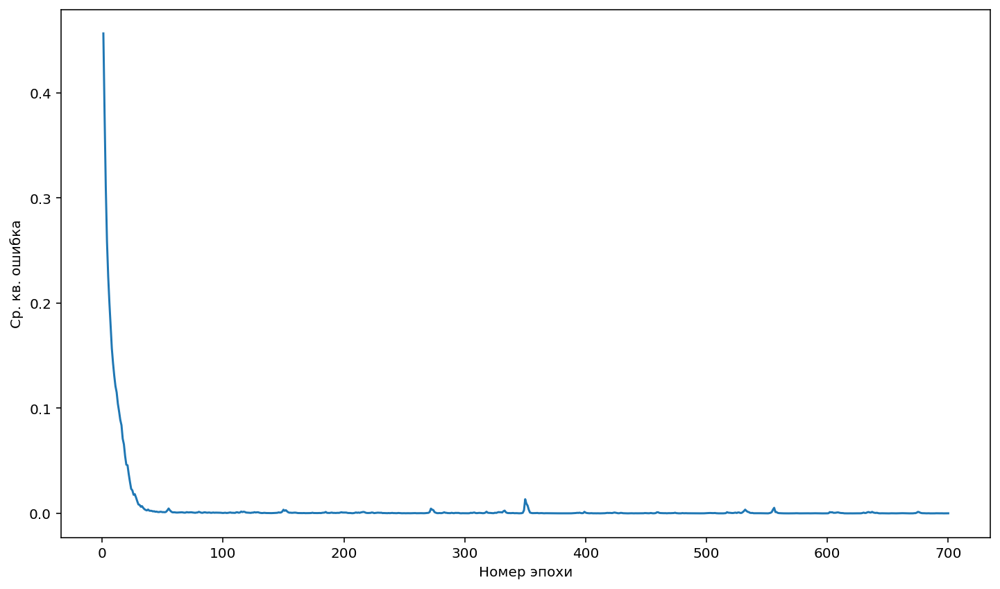

In [39]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [40]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae.append(max_err_val)

Максимальная ошибка по модулю =  0.054942875356056076


<ipython-input-41-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


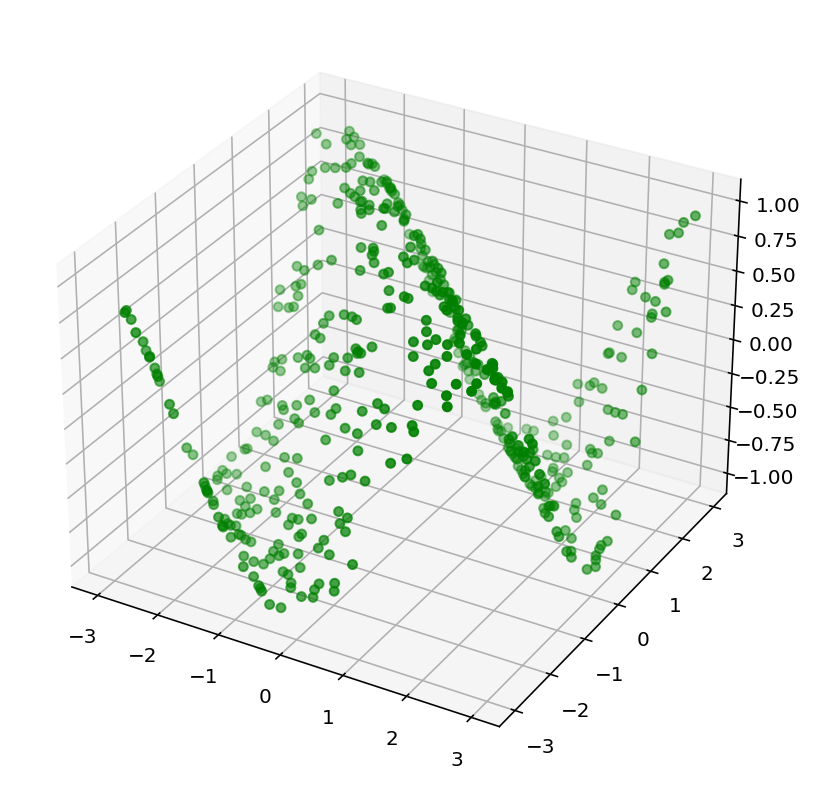

In [41]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


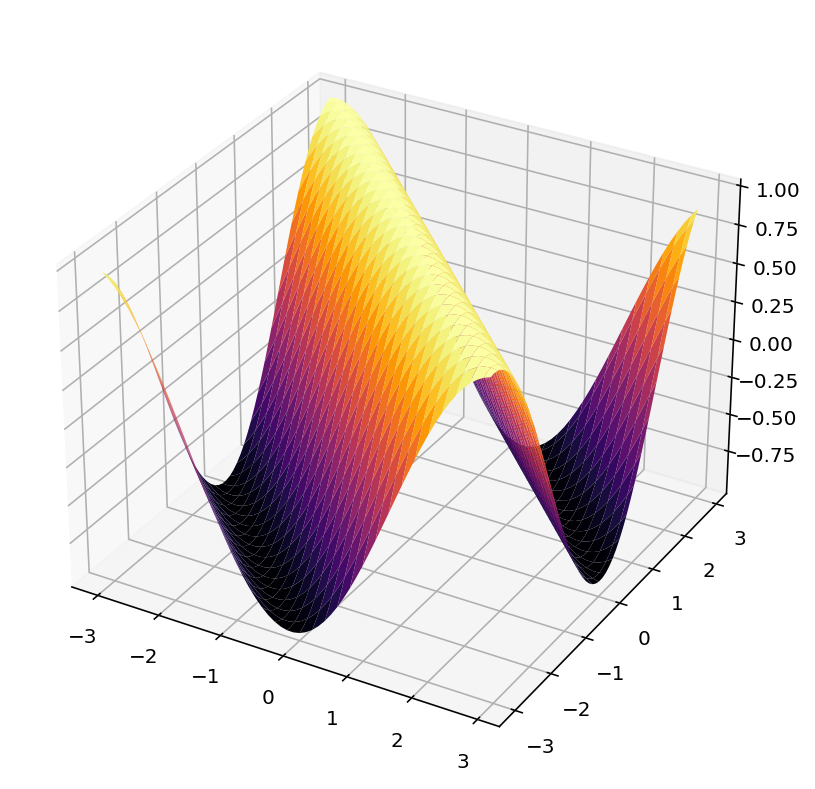

In [42]:
func_draw()

In [43]:
n = 25
xy=[] 
zz=[] 
x, y = get_regular_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


 1/20 [>.............................] - ETA: 23s - loss: 0.5119

 2/20 [==>...........................] - ETA: 2s - loss: 0.5122 

 3/20 [===>..........................] - ETA: 1s - loss: 0.5135

20/20 [==============================] - 1s 12ms/step - loss: 0.4899


Epoch 2/700
 1/20 [>.............................] - ETA: 0s - loss: 0.3376

20/20 [==============================] - 0s 1ms/step - loss: 0.3967


Epoch 3/700
 1/20 [>.............................] - ETA: 0s - loss: 0.2915

16/20 [=======================>......] - ETA: 0s - loss: 0.3026

20/20 [==============================] - 0s 5ms/step - loss: 0.2999


Epoch 4/700
 1/20 [>.............................] - ETA: 0s - loss: 0.2128

 7/20 [=========>....................] - ETA: 0s - loss: 0.2430

20/20 [==============================] - 0s 5ms/step - loss: 0.2320


Epoch 5/700


 1/20 [>.............................] - ETA: 1s - loss: 0.2397

16/20 [=======================>......] - ETA: 0s - loss: 0.1896

17/20 [========================>.....] - ETA: 0s - loss: 0.1885

20/20 [==============================] - 1s 27ms/step - loss: 0.1844


Epoch 6/700


 1/20 [>.............................] - ETA: 0s - loss: 0.1333

 7/20 [=========>....................] - ETA: 0s - loss: 0.1143

15/20 [=====================>........] - ETA: 0s - loss: 0.1174

16/20 [=======================>......] - ETA: 0s - loss: 0.1177

20/20 [==============================] - 0s 16ms/step - loss: 0.1177


Epoch 7/700
 1/20 [>.............................] - ETA: 1s - loss: 0.1368

20/20 [==============================] - ETA: 0s - loss: 0.0933

20/20 [==============================] - 0s 5ms/step - loss: 0.0928


Epoch 8/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0456

17/20 [========================>.....] - ETA: 0s - loss: 0.0586

20/20 [==============================] - 0s 5ms/step - loss: 0.0587


Epoch 9/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0252

17/20 [========================>.....] - ETA: 0s - loss: 0.0427

20/20 [==============================] - 0s 4ms/step - loss: 0.0423


Epoch 10/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0202

14/20 [====================>.........] - ETA: 0s - loss: 0.0250

20/20 [==============================] - 0s 5ms/step - loss: 0.0256


Epoch 11/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0139

16/20 [=======================>......] - ETA: 0s - loss: 0.0195

20/20 [==============================] - 0s 4ms/step - loss: 0.0192


Epoch 12/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0075

11/20 [===============>..............] - ETA: 0s - loss: 0.0169

20/20 [==============================] - 0s 5ms/step - loss: 0.0173


Epoch 13/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0115

 8/20 [===========>..................] - ETA: 0s - loss: 0.0160

20/20 [==============================] - 0s 4ms/step - loss: 0.0151


Epoch 14/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

12/20 [=================>............] - ETA: 0s - loss: 0.0096

20/20 [==============================] - 0s 5ms/step - loss: 0.0105


Epoch 15/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0090

 4/20 [=====>........................] - ETA: 0s - loss: 0.0085

20/20 [==============================] - 0s 4ms/step - loss: 0.0083


Epoch 16/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0040

 4/20 [=====>........................] - ETA: 0s - loss: 0.0051

20/20 [==============================] - 0s 4ms/step - loss: 0.0059


Epoch 17/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0026

 2/20 [==>...........................] - ETA: 1s - loss: 0.0034

20/20 [==============================] - 0s 5ms/step - loss: 0.0042


Epoch 18/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 2ms/step - loss: 0.0041


Epoch 19/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

20/20 [==============================] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 4ms/step - loss: 0.0036


Epoch 20/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0036

16/20 [=======================>......] - ETA: 0s - loss: 0.0036

20/20 [==============================] - 0s 4ms/step - loss: 0.0035


Epoch 21/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0035

13/20 [==================>...........] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 4ms/step - loss: 0.0025


Epoch 22/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

13/20 [==================>...........] - ETA: 0s - loss: 0.0026

20/20 [==============================] - 0s 4ms/step - loss: 0.0025


Epoch 23/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

12/20 [=================>............] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 5ms/step - loss: 0.0016


Epoch 24/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

 9/20 [============>.................] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 4ms/step - loss: 0.0017


Epoch 25/700
 1/20 [>.............................] - ETA: 0s - loss: 9.8420e-04

 2/20 [==>...........................] - ETA: 1s - loss: 0.0011    

20/20 [==============================] - 0s 5ms/step - loss: 0.0015


Epoch 26/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

 3/20 [===>..........................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 27/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0017

 4/20 [=====>........................] - ETA: 0s - loss: 0.0014

 5/20 [======>.......................] - ETA: 0s - loss: 0.0013

 7/20 [=========>....................] - ETA: 0s - loss: 0.0012

 9/20 [============>.................] - ETA: 0s - loss: 0.0012

10/20 [==============>...............] - ETA: 0s - loss: 0.0012

15/20 [=====================>........] - ETA: 0s - loss: 0.0011

17/20 [========================>.....] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 1s 37ms/step - loss: 0.0011


Epoch 28/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0010

11/20 [===============>..............] - ETA: 0s - loss: 8.9029e-04

13/20 [==================>...........] - ETA: 0s - loss: 8.8454e-04

20/20 [==============================] - 0s 12ms/step - loss: 8.7910e-04


Epoch 29/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0481e-04

20/20 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 30/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

10/20 [==============>...............] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 5ms/step - loss: 0.0012


Epoch 31/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0014

 2/20 [==>...........................] - ETA: 1s - loss: 0.0012

20/20 [==============================] - 0s 5ms/step - loss: 9.5311e-04


Epoch 32/700


 1/20 [>.............................] - ETA: 0s - loss: 6.8179e-04

 5/20 [======>.......................] - ETA: 0s - loss: 9.0146e-04

 6/20 [========>.....................] - ETA: 0s - loss: 9.1299e-04

11/20 [===============>..............] - ETA: 0s - loss: 9.1225e-04

18/20 [==========================>...] - ETA: 0s - loss: 8.8996e-04

20/20 [==============================] - 1s 26ms/step - loss: 8.8673e-04


Epoch 33/700
 1/20 [>.............................] - ETA: 0s - loss: 9.7047e-04

 7/20 [=========>....................] - ETA: 0s - loss: 0.0010    

18/20 [==========================>...] - ETA: 0s - loss: 0.0010

19/20 [===========================>..] - ETA: 0s - loss: 0.0010

20/20 [==============================] - 0s 16ms/step - loss: 0.0010


Epoch 34/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0013

18/20 [==========================>...] - ETA: 0s - loss: 8.2765e-04

20/20 [==============================] - 0s 5ms/step - loss: 8.1323e-04


Epoch 35/700
 1/20 [>.............................] - ETA: 0s - loss: 6.9699e-04

 7/20 [=========>....................] - ETA: 0s - loss: 7.7877e-04

20/20 [==============================] - 0s 5ms/step - loss: 8.5617e-04


Epoch 36/700


 1/20 [>.............................] - ETA: 0s - loss: 7.9281e-04

15/20 [=====================>........] - ETA: 0s - loss: 8.5440e-04

20/20 [==============================] - 0s 5ms/step - loss: 8.5015e-04


Epoch 37/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0010

17/20 [========================>.....] - ETA: 0s - loss: 7.4420e-04

20/20 [==============================] - 0s 6ms/step - loss: 7.3918e-04


Epoch 38/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2768e-04

 2/20 [==>...........................] - ETA: 1s - loss: 5.3919e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.6955e-04


Epoch 39/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3366e-04

12/20 [=================>............] - ETA: 0s - loss: 5.7345e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.8779e-04


Epoch 40/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7328e-04

16/20 [=======================>......] - ETA: 0s - loss: 6.0131e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.8636e-04


Epoch 41/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0015

16/20 [=======================>......] - ETA: 0s - loss: 8.0809e-04

18/20 [==========================>...] - ETA: 0s - loss: 8.0265e-04

20/20 [==============================] - 0s 12ms/step - loss: 7.9768e-04


Epoch 42/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0595e-04

 4/20 [=====>........................] - ETA: 0s - loss: 5.3751e-04

12/20 [=================>............] - ETA: 0s - loss: 6.9171e-04

13/20 [==================>...........] - ETA: 0s - loss: 7.0106e-04

19/20 [===========================>..] - ETA: 0s - loss: 7.2798e-04

20/20 [==============================] - 0s 20ms/step - loss: 7.2993e-04


Epoch 43/700


 1/20 [>.............................] - ETA: 2s - loss: 3.3303e-04

10/20 [==============>...............] - ETA: 0s - loss: 5.2259e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.9950e-04


Epoch 44/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5204e-04

20/20 [==============================] - ETA: 0s - loss: 5.8061e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.8036e-04


Epoch 45/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1379e-04

17/20 [========================>.....] - ETA: 0s - loss: 6.0295e-04

20/20 [==============================] - 0s 4ms/step - loss: 6.1753e-04


Epoch 46/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8376e-04

10/20 [==============>...............] - ETA: 0s - loss: 5.8877e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.1605e-04


Epoch 47/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7135e-04

13/20 [==================>...........] - ETA: 0s - loss: 9.2474e-04

20/20 [==============================] - 0s 3ms/step - loss: 9.5141e-04


Epoch 48/700
 1/20 [>.............................] - ETA: 0s - loss: 9.6240e-04

 2/20 [==>...........................] - ETA: 0s - loss: 0.0012    

20/20 [==============================] - 0s 4ms/step - loss: 9.9465e-04


Epoch 49/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6750e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.4481e-04


Epoch 50/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1664e-04

20/20 [==============================] - 0s 2ms/step - loss: 7.7159e-04


Epoch 51/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5625e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.7839e-04


Epoch 52/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 53/700


 1/20 [>.............................] - ETA: 0s - loss: 5.2943e-04

20/20 [==============================] - 0s 2ms/step - loss: 7.0397e-04


Epoch 54/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3215e-04

18/20 [==========================>...] - ETA: 0s - loss: 6.6319e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.6310e-04


Epoch 55/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5306e-04

10/20 [==============>...............] - ETA: 0s - loss: 4.7951e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.4367e-04


Epoch 56/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4419e-04

 5/20 [======>.......................] - ETA: 0s - loss: 4.1908e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.3460e-04


Epoch 57/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1877e-04

11/20 [===============>..............] - ETA: 0s - loss: 4.3200e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.6833e-04


Epoch 58/700


 1/20 [>.............................] - ETA: 0s - loss: 8.1629e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.7248e-04

11/20 [===============>..............] - ETA: 0s - loss: 6.6202e-04

12/20 [=================>............] - ETA: 0s - loss: 6.5109e-04

16/20 [=======================>......] - ETA: 0s - loss: 6.1330e-04

20/20 [==============================] - ETA: 0s - loss: 5.8201e-04

20/20 [==============================] - 1s 36ms/step - loss: 5.7595e-04


Epoch 59/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7895e-04

 6/20 [========>.....................] - ETA: 0s - loss: 4.2119e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.5734e-04

20/20 [==============================] - 0s 10ms/step - loss: 4.5038e-04


Epoch 60/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1433e-04

 2/20 [==>...........................] - ETA: 2s - loss: 5.1663e-04

 4/20 [=====>........................] - ETA: 0s - loss: 4.7926e-04

20/20 [==============================] - 0s 11ms/step - loss: 5.1337e-04


Epoch 61/700
 1/20 [>.............................] - ETA: 0s - loss: 7.4393e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.5291e-04


Epoch 62/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4122e-04

15/20 [=====================>........] - ETA: 0s - loss: 0.0019    

20/20 [==============================] - 0s 5ms/step - loss: 0.0018


Epoch 63/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

 6/20 [========>.....................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 5ms/step - loss: 0.0015


Epoch 64/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8330e-04

 3/20 [===>..........................] - ETA: 0s - loss: 8.1639e-04

20/20 [==============================] - 0s 4ms/step - loss: 0.0011


Epoch 65/700
 1/20 [>.............................] - ETA: 0s - loss: 7.6830e-04

 2/20 [==>...........................] - ETA: 0s - loss: 7.1618e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.9288e-04


Epoch 66/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8643e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.7982e-04


Epoch 67/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8086e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.0686e-04


Epoch 68/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4804e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.0390e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.6062e-04


Epoch 69/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4287e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.5382e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.8780e-04


Epoch 70/700


 1/20 [>.............................] - ETA: 0s - loss: 5.8682e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.5693e-04


Epoch 71/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 0s 1ms/step - loss: 5.5111e-04


Epoch 72/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5021e-04

 2/20 [==>...........................] - ETA: 0s - loss: 4.1072e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.9832e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.9845e-04

20/20 [==============================] - 0s 20ms/step - loss: 3.1090e-04


Epoch 73/700


 1/20 [>.............................] - ETA: 1s - loss: 6.2441e-04

 2/20 [==>...........................] - ETA: 3s - loss: 0.0012    

 6/20 [========>.....................] - ETA: 0s - loss: 0.0012

 9/20 [============>.................] - ETA: 0s - loss: 0.0012

15/20 [=====================>........] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 1s 27ms/step - loss: 0.0012


Epoch 74/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6945e-04

 6/20 [========>.....................] - ETA: 0s - loss: 5.8686e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.0369e-04


Epoch 75/700


 1/20 [>.............................] - ETA: 1s - loss: 2.5909e-04

18/20 [==========================>...] - ETA: 0s - loss: 4.5224e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.6294e-04


Epoch 76/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2196e-04

 2/20 [==>...........................] - ETA: 1s - loss: 7.4881e-04

10/20 [==============>...............] - ETA: 0s - loss: 7.2541e-04

20/20 [==============================] - 0s 10ms/step - loss: 6.9122e-04


Epoch 77/700
 1/20 [>.............................] - ETA: 1s - loss: 4.2800e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.8565e-04

20/20 [==============================] - 0s 6ms/step - loss: 3.6566e-04


Epoch 78/700


 1/20 [>.............................] - ETA: 7s - loss: 2.7340e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.6727e-04

12/20 [=================>............] - ETA: 0s - loss: 3.6923e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.7006e-04

19/20 [===========================>..] - ETA: 0s - loss: 3.7177e-04



20/20 [==============================] - 1s 27ms/step - loss: 3.7261e-04


Epoch 79/700
 1/20 [>.............................] - ETA: 0s - loss: 7.9252e-04

 9/20 [============>.................] - ETA: 0s - loss: 5.7935e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.9307e-04


Epoch 80/700


 1/20 [>.............................] - ETA: 0s - loss: 3.0205e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.5563e-04

20/20 [==============================] - 0s 6ms/step - loss: 2.5827e-04


Epoch 81/700


 1/20 [>.............................] - ETA: 1s - loss: 2.6939e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.6957e-04

 3/20 [===>..........................] - ETA: 1s - loss: 3.6417e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.9265e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.9147e-04

20/20 [==============================] - 1s 22ms/step - loss: 3.8804e-04


Epoch 82/700


 1/20 [>.............................] - ETA: 1s - loss: 2.0751e-04

 3/20 [===>..........................] - ETA: 0s - loss: 2.2850e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.2917e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.2420e-04

20/20 [==============================] - 1s 22ms/step - loss: 2.2469e-04


Epoch 83/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2597e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.1829e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.2267e-04


Epoch 84/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7839e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.6080e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.6296e-04


Epoch 85/700


 1/20 [>.............................] - ETA: 1s - loss: 1.7557e-04

12/20 [=================>............] - ETA: 0s - loss: 2.2608e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.2753e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.2855e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.2899e-04

20/20 [==============================] - 0s 22ms/step - loss: 2.2912e-04


Epoch 86/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4743e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.2641e-04

12/20 [=================>............] - ETA: 0s - loss: 2.2380e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.2270e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.2088e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.2059e-04

20/20 [==============================] - 0s 26ms/step - loss: 2.1988e-04


Epoch 87/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3583e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.1575e-04


Epoch 88/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1249e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.1033e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.0853e-04


Epoch 89/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4736e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.0306e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.0711e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.1542e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.1533e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.1493e-04

20/20 [==============================] - 1s 30ms/step - loss: 2.1313e-04


Epoch 90/700


 1/20 [>.............................] - ETA: 0s - loss: 1.5583e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.6292e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.7769e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.7997e-04

20/20 [==============================] - 0s 21ms/step - loss: 2.0154e-04


Epoch 91/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5857e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.0932e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.8949e-04


Epoch 92/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7968e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.7600e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.9426e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.9863e-04

20/20 [==============================] - 0s 20ms/step - loss: 3.0634e-04


Epoch 93/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0916e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.4457e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.6348e-04


Epoch 94/700


 1/20 [>.............................] - ETA: 1s - loss: 8.3497e-04

 6/20 [========>.....................] - ETA: 0s - loss: 6.7062e-04

 7/20 [=========>....................] - ETA: 0s - loss: 6.7858e-04

15/20 [=====================>........] - ETA: 0s - loss: 6.5374e-04

19/20 [===========================>..] - ETA: 0s - loss: 6.3637e-04

20/20 [==============================] - ETA: 0s - loss: 6.3186e-04

20/20 [==============================] - 1s 26ms/step - loss: 6.2779e-04


Epoch 95/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5830e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.3600e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.2951e-04


Epoch 96/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4317e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.5539e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.5671e-04


Epoch 97/700


 1/20 [>.............................] - ETA: 0s - loss: 4.0667e-04

 5/20 [======>.......................] - ETA: 0s - loss: 3.1725e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.8686e-04


Epoch 98/700
 1/20 [>.............................] - ETA: 1s - loss: 4.7474e-04

 2/20 [==>...........................] - ETA: 1s - loss: 5.4896e-04

 8/20 [===========>..................] - ETA: 0s - loss: 6.0880e-04

19/20 [===========================>..] - ETA: 0s - loss: 6.2940e-04

20/20 [==============================] - 0s 15ms/step - loss: 6.3161e-04


Epoch 99/700


 1/20 [>.............................] - ETA: 0s - loss: 7.0061e-04

 2/20 [==>...........................] - ETA: 1s - loss: 6.7996e-04

13/20 [==================>...........] - ETA: 0s - loss: 5.8486e-04

20/20 [==============================] - 0s 10ms/step - loss: 5.6976e-04


Epoch 100/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8688e-04

 4/20 [=====>........................] - ETA: 0s - loss: 3.0290e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.1828e-04

20/20 [==============================] - 0s 9ms/step - loss: 3.2418e-04


Epoch 101/700


 1/20 [>.............................] - ETA: 0s - loss: 3.2908e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.7949e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.9290e-04


Epoch 102/700


 1/20 [>.............................] - ETA: 0s - loss: 3.2079e-04

20/20 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 103/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

10/20 [==============>...............] - ETA: 0s - loss: 9.6587e-04

20/20 [==============================] - 0s 5ms/step - loss: 0.0011


Epoch 104/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3652e-04

20/20 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 105/700
 1/20 [>.............................] - ETA: 0s - loss: 6.5987e-04

 8/20 [===========>..................] - ETA: 0s - loss: 8.1502e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.9343e-04


Epoch 106/700
 1/20 [>.............................] - ETA: 1s - loss: 2.2793e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.6762e-04

 5/20 [======>.......................] - ETA: 1s - loss: 2.7028e-04

 6/20 [========>.....................] - ETA: 1s - loss: 2.7091e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.7346e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.7248e-04

19/20 [===========================>..] - ETA: 0s - loss: 2.8317e-04

20/20 [==============================] - 1s 38ms/step - loss: 2.8661e-04


Epoch 107/700


 1/20 [>.............................] - ETA: 1s - loss: 4.8825e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.6351e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.5148e-04


Epoch 108/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6097e-04

 3/20 [===>..........................] - ETA: 0s - loss: 1.6977e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.6289e-04


Epoch 109/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7811e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.7593e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.9152e-04


Epoch 110/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1061e-04

 5/20 [======>.......................] - ETA: 0s - loss: 1.5365e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.8732e-04


Epoch 111/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8330e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0971e-04


Epoch 112/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9422e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.2615e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.1834e-04


Epoch 113/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4065e-04

 7/20 [=========>....................] - ETA: 0s - loss: 2.9040e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.7440e-04


Epoch 114/700


 1/20 [>.............................] - ETA: 0s - loss: 3.6462e-04

 8/20 [===========>..................] - ETA: 0s - loss: 3.0265e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.9991e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.9771e-04

20/20 [==============================] - 1s 28ms/step - loss: 2.9211e-04


Epoch 115/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9790e-04

 2/20 [==>...........................] - ETA: 0s - loss: 2.3632e-04

 7/20 [=========>....................] - ETA: 0s - loss: 2.3919e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.3769e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.3921e-04

20/20 [==============================] - 0s 24ms/step - loss: 2.4320e-04


Epoch 116/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2630e-04

15/20 [=====================>........] - ETA: 0s - loss: 4.9254e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.0602e-04


Epoch 117/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0271e-04

 3/20 [===>..........................] - ETA: 0s - loss: 8.2180e-04

20/20 [==============================] - 0s 5ms/step - loss: 9.0974e-04


Epoch 118/700
 1/20 [>.............................] - ETA: 0s - loss: 8.9450e-04

11/20 [===============>..............] - ETA: 0s - loss: 7.6796e-04

20/20 [==============================] - 0s 6ms/step - loss: 8.9436e-04


Epoch 119/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0797e-04

16/20 [=======================>......] - ETA: 0s - loss: 8.6898e-04

20/20 [==============================] - 0s 6ms/step - loss: 7.9990e-04


Epoch 120/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2310e-04

 7/20 [=========>....................] - ETA: 0s - loss: 4.2002e-04

19/20 [===========================>..] - ETA: 0s - loss: 4.7984e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.8335e-04


Epoch 121/700


 1/20 [>.............................] - ETA: 0s - loss: 3.1883e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.8599e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7905e-04


Epoch 122/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8477e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.0660e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.1603e-04

12/20 [=================>............] - ETA: 0s - loss: 2.1301e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.1152e-04

20/20 [==============================] - 0s 20ms/step - loss: 2.0848e-04


Epoch 123/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9438e-04

 3/20 [===>..........................] - ETA: 0s - loss: 2.1497e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.1415e-04

20/20 [==============================] - 0s 11ms/step - loss: 2.1852e-04


Epoch 124/700


 1/20 [>.............................] - ETA: 3s - loss: 2.7296e-04

 4/20 [=====>........................] - ETA: 0s - loss: 3.0375e-04

 6/20 [========>.....................] - ETA: 0s - loss: 3.1263e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.5170e-04

20/20 [==============================] - 0s 17ms/step - loss: 3.8373e-04


Epoch 125/700
 1/20 [>.............................] - ETA: 1s - loss: 3.2385e-04

19/20 [===========================>..] - ETA: 0s - loss: 6.2925e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.3018e-04


Epoch 126/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3043e-04

 6/20 [========>.....................] - ETA: 0s - loss: 5.1552e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.3644e-04


Epoch 127/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2366e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.9811e-04


Epoch 128/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2779e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.8717e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.0825e-04


Epoch 129/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1608e-04

 5/20 [======>.......................] - ETA: 0s - loss: 5.1784e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.7073e-04


Epoch 130/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5780e-04

20/20 [==============================] - ETA: 0s - loss: 1.6969e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.6885e-04


Epoch 131/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3176e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.0858e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.2436e-04


Epoch 132/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0742e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.0798e-04

 4/20 [=====>........................] - ETA: 0s - loss: 1.9261e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.7779e-04

20/20 [==============================] - 0s 15ms/step - loss: 1.7669e-04


Epoch 133/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0594e-04

 5/20 [======>.......................] - ETA: 0s - loss: 1.6690e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.8878e-04

20/20 [==============================] - 0s 11ms/step - loss: 1.8975e-04


Epoch 134/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2028e-04

 3/20 [===>..........................] - ETA: 0s - loss: 1.8990e-04

12/20 [=================>............] - ETA: 0s - loss: 2.2388e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.2857e-04

20/20 [==============================] - 0s 16ms/step - loss: 2.3165e-04


Epoch 135/700


 1/20 [>.............................] - ETA: 1s - loss: 1.2197e-04

 3/20 [===>..........................] - ETA: 0s - loss: 2.0084e-04

20/20 [==============================] - 0s 7ms/step - loss: 2.3380e-04


Epoch 136/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4413e-05

15/20 [=====================>........] - ETA: 0s - loss: 2.7485e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.8623e-04


Epoch 137/700


 1/20 [>.............................] - ETA: 0s - loss: 4.2883e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.1208e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.9742e-04


Epoch 138/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2508e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.5614e-04

20/20 [==============================] - 0s 5ms/step - loss: 0.0013


Epoch 139/700
 1/20 [>.............................] - ETA: 0s - loss: 9.7405e-04

16/20 [=======================>......] - ETA: 0s - loss: 9.6732e-04

20/20 [==============================] - 0s 5ms/step - loss: 8.9920e-04


Epoch 140/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7208e-04

 9/20 [============>.................] - ETA: 0s - loss: 3.5203e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.5621e-04


Epoch 141/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4660e-04

 3/20 [===>..........................] - ETA: 0s - loss: 2.8338e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.4239e-04


Epoch 142/700
 1/20 [>.............................] - ETA: 0s - loss: 7.6163e-04

20/20 [==============================] - ETA: 0s - loss: 3.7763e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.7568e-04


Epoch 143/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1489e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.6317e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.6361e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.5883e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.5272e-04

20/20 [==============================] - 0s 20ms/step - loss: 2.5190e-04


Epoch 144/700


 1/20 [>.............................] - ETA: 0s - loss: 1.7583e-04

 6/20 [========>.....................] - ETA: 0s - loss: 1.5160e-04

 8/20 [===========>..................] - ETA: 0s - loss: 1.4553e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.3334e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.3048e-04

20/20 [==============================] - 0s 21ms/step - loss: 1.2927e-04


Epoch 145/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2984e-04

 2/20 [==>...........................] - ETA: 3s - loss: 1.2647e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.4820e-04

20/20 [==============================] - 0s 16ms/step - loss: 2.5168e-04


Epoch 146/700
 1/20 [>.............................] - ETA: 1s - loss: 2.5882e-04

19/20 [===========================>..] - ETA: 0s - loss: 2.4911e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.4938e-04


Epoch 147/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0403e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.5152e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.6085e-04


Epoch 148/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1250e-04

10/20 [==============>...............] - ETA: 0s - loss: 4.6998e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.9341e-04


Epoch 149/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9920e-04

 2/20 [==>...........................] - ETA: 1s - loss: 6.1902e-04

20/20 [==============================] - 0s 4ms/step - loss: 7.0411e-04


Epoch 150/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5574e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 151/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0011

 8/20 [===========>..................] - ETA: 0s - loss: 8.3227e-04

20/20 [==============================] - 0s 4ms/step - loss: 7.3865e-04


Epoch 152/700
 1/20 [>.............................] - ETA: 1s - loss: 1.4311e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.2335e-04


Epoch 153/700


 1/20 [>.............................] - ETA: 1s - loss: 2.9508e-04

 7/20 [=========>....................] - ETA: 0s - loss: 4.0323e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.0711e-04

20/20 [==============================] - 0s 12ms/step - loss: 4.3033e-04


Epoch 154/700
 1/20 [>.............................] - ETA: 0s - loss: 7.4269e-04

 3/20 [===>..........................] - ETA: 0s - loss: 0.0011    

 8/20 [===========>..................] - ETA: 0s - loss: 0.0016

14/20 [====================>.........] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 16ms/step - loss: 0.0018


Epoch 155/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5571e-04

 3/20 [===>..........................] - ETA: 0s - loss: 3.8723e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.7533e-04

 9/20 [============>.................] - ETA: 0s - loss: 4.8600e-04

20/20 [==============================] - 0s 16ms/step - loss: 5.5948e-04


Epoch 156/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5072e-04

 9/20 [============>.................] - ETA: 0s - loss: 6.3259e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.7369e-04


Epoch 157/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7686e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.6274e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.2836e-04


Epoch 158/700


 1/20 [>.............................] - ETA: 0s - loss: 3.3941e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.3718e-04


Epoch 159/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6843e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.1600e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.9904e-04


Epoch 160/700


 1/20 [>.............................] - ETA: 0s - loss: 1.1498e-04

 5/20 [======>.......................] - ETA: 0s - loss: 1.0903e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.1457e-04


Epoch 161/700
 1/20 [>.............................] - ETA: 1s - loss: 3.0881e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.1980e-04


Epoch 162/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2054e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.3456e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.4477e-04


Epoch 163/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6579e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.0569e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.0101e-04


Epoch 164/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

19/20 [===========================>..] - ETA: 0s - loss: 4.0145e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.8600e-04


Epoch 165/700


 1/20 [>.............................] - ETA: 1s - loss: 9.1257e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.3241e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.4179e-04

20/20 [==============================] - 0s 11ms/step - loss: 1.4973e-04


Epoch 166/700


 1/20 [>.............................] - ETA: 3s - loss: 3.0140e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.5667e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.4632e-04

20/20 [==============================] - 0s 12ms/step - loss: 2.4224e-04


Epoch 167/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1479e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.7872e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.8541e-04

20/20 [==============================] - 0s 10ms/step - loss: 3.0183e-04


Epoch 168/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

 2/20 [==>...........................] - ETA: 1s - loss: 8.9446e-04

11/20 [===============>..............] - ETA: 0s - loss: 5.7891e-04

20/20 [==============================] - 0s 10ms/step - loss: 5.5628e-04


Epoch 169/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8881e-04

 3/20 [===>..........................] - ETA: 0s - loss: 3.9721e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.0747e-04


Epoch 170/700


 1/20 [>.............................] - ETA: 0s - loss: 1.3778e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.9994e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.9685e-04


Epoch 171/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9979e-04

 4/20 [=====>........................] - ETA: 0s - loss: 3.4064e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.5743e-04


Epoch 172/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0512e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0141e-04


Epoch 173/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2484e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.1529e-04


Epoch 174/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1491e-04

15/20 [=====================>........] - ETA: 0s - loss: 4.8164e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.6214e-04


Epoch 175/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4493e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.7881e-04


Epoch 176/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6153e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.2250e-04


Epoch 177/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2827e-04

 9/20 [============>.................] - ETA: 0s - loss: 3.9900e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.7445e-04


Epoch 178/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5333e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.7358e-04


Epoch 179/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3530e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4913e-04


Epoch 180/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3213e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.1123e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.3064e-04


Epoch 181/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6461e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.7425e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.9383e-04


Epoch 182/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0780e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.7577e-04


Epoch 183/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2944e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 184/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

10/20 [==============>...............] - ETA: 0s - loss: 0.0040

20/20 [==============================] - 0s 4ms/step - loss: 0.0050


Epoch 185/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0078

18/20 [==========================>...] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 4ms/step - loss: 0.0040


Epoch 186/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 187/700


 1/20 [>.............................] - ETA: 0s - loss: 7.4584e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.2663e-04


Epoch 188/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4756e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.6171e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.7361e-04


Epoch 189/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7009e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.9190e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.1167e-04


Epoch 190/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6003e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.1687e-04


Epoch 191/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 192/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0084

 9/20 [============>.................] - ETA: 0s - loss: 0.0049

20/20 [==============================] - 0s 3ms/step - loss: 0.0040


Epoch 193/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

20/20 [==============================] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 4ms/step - loss: 0.0019


Epoch 194/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2012e-04

20/20 [==============================] - 0s 1ms/step - loss: 6.9449e-04


Epoch 195/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0365e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.4997e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.5801e-04


Epoch 196/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4921e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.1468e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.7963e-04


Epoch 197/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4881e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.9808e-05


Epoch 198/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0418e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8967e-04


Epoch 199/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1930e-04

12/20 [=================>............] - ETA: 0s - loss: 1.7992e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7325e-04


Epoch 200/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3932e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.8116e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5807e-04


Epoch 201/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8729e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.2408e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2897e-04


Epoch 202/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2472e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.8962e-04


Epoch 203/700


 1/20 [>.............................] - ETA: 0s - loss: 3.6630e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.4457e-04


Epoch 204/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3441e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.0638e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.1718e-04


Epoch 205/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4974e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.9500e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.0000e-04


Epoch 206/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6614e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.6218e-04


Epoch 207/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3066e-04

13/20 [==================>...........] - ETA: 0s - loss: 9.9483e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.9216e-05


Epoch 208/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4119e-05



14/20 [====================>.........] - ETA: 0s - loss: 1.0842e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2264e-04


Epoch 209/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1318e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2665e-04


Epoch 210/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7188e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.1473e-05


Epoch 211/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7059e-05

 8/20 [===========>..................] - ETA: 0s - loss: 1.1267e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3070e-04


Epoch 212/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0074e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.2562e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2610e-04


Epoch 213/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2955e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.8505e-05


Epoch 214/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3792e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.3151e-05


Epoch 215/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5273e-05

12/20 [=================>............] - ETA: 0s - loss: 1.3224e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4181e-04


Epoch 216/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2661e-04

20/20 [==============================] - ETA: 0s - loss: 1.2132e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2123e-04


Epoch 217/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2034e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2408e-04


Epoch 218/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2618e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.7389e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.6106e-04


Epoch 219/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2869e-04

12/20 [=================>............] - ETA: 0s - loss: 1.5807e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6083e-04


Epoch 220/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6682e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.4347e-04


Epoch 221/700


 1/20 [>.............................] - ETA: 0s - loss: 2.2077e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0490e-04


Epoch 222/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4348e-04

10/20 [==============>...............] - ETA: 0s - loss: 4.0847e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.3690e-04


Epoch 223/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7950e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.4746e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2929e-04


Epoch 224/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8483e-05

18/20 [==========================>...] - ETA: 0s - loss: 9.0684e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.2762e-05


Epoch 225/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2037e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2838e-04


Epoch 226/700


 1/20 [>.............................] - ETA: 0s - loss: 5.2986e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.0715e-04


Epoch 227/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5383e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4453e-04


Epoch 228/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3761e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.5997e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.2635e-04


Epoch 229/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2549e-04

20/20 [==============================] - ETA: 0s - loss: 1.1156e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1187e-04


Epoch 230/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6718e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.0326e-04


Epoch 231/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2074e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4862e-04


Epoch 232/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7683e-04

 5/20 [======>.......................] - ETA: 0s - loss: 1.9066e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6901e-04


Epoch 233/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9568e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.7860e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.8750e-04


Epoch 234/700


 1/20 [>.............................] - ETA: 0s - loss: 4.2883e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.2480e-04


Epoch 235/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9672e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.0103e-04


Epoch 236/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4586e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.3833e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.5189e-04


Epoch 237/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4138e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.1507e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.9870e-04


Epoch 238/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3833e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0831e-04


Epoch 239/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0141e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.3138e-04


Epoch 240/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2128e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.4343e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5968e-04


Epoch 241/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9279e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.7893e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.7549e-04


Epoch 242/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0855e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0279e-04


Epoch 243/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8422e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.3947e-04


Epoch 244/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9696e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.9282e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.8886e-04


Epoch 245/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8906e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.3486e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2928e-04


Epoch 246/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9379e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5479e-04


Epoch 247/700
 1/20 [>.............................] - ETA: 0s - loss: 9.8479e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0712e-04


Epoch 248/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2900e-05

10/20 [==============>...............] - ETA: 0s - loss: 1.2643e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1792e-04


Epoch 249/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7311e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.4159e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.4004e-04


Epoch 250/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2204e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.1621e-04


Epoch 251/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2727e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.0506e-04


Epoch 252/700
 1/20 [>.............................] - ETA: 0s - loss: 6.5557e-05

12/20 [=================>............] - ETA: 0s - loss: 1.3938e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3921e-04


Epoch 253/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5235e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.3465e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.1599e-04


Epoch 254/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8937e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.1203e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.9454e-04


Epoch 255/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3173e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5337e-04


Epoch 256/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0148e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.5922e-04


Epoch 257/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2429e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.4237e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.4963e-04


Epoch 258/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9965e-04

20/20 [==============================] - ETA: 0s - loss: 3.3238e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.3242e-04


Epoch 259/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4708e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.4866e-04


Epoch 260/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8947e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.7289e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.6990e-04


Epoch 261/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7120e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.2855e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.3157e-04


Epoch 262/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2753e-04

20/20 [==============================] - 0s 1ms/step - loss: 6.2591e-04


Epoch 263/700


 1/20 [>.............................] - ETA: 0s - loss: 6.2008e-04

20/20 [==============================] - 0s 1ms/step - loss: 8.9596e-04


Epoch 264/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0027

19/20 [===========================>..] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 3ms/step - loss: 0.0015


Epoch 265/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

17/20 [========================>.....] - ETA: 0s - loss: 8.8730e-04

20/20 [==============================] - 0s 4ms/step - loss: 8.7884e-04


Epoch 266/700


 1/20 [>.............................] - ETA: 0s - loss: 3.6799e-04

20/20 [==============================] - ETA: 0s - loss: 4.9388e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.9126e-04


Epoch 267/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 5.7477e-04


Epoch 268/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3576e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.5068e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4506e-04


Epoch 269/700
 1/20 [>.............................] - ETA: 0s - loss: 9.6424e-05

15/20 [=====================>........] - ETA: 0s - loss: 1.1185e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1399e-04


Epoch 270/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8049e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.5742e-04


Epoch 271/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7790e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.9082e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.8801e-04

20/20 [==============================] - 1s 27ms/step - loss: 1.7683e-04


Epoch 272/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4493e-04

 7/20 [=========>....................] - ETA: 0s - loss: 9.6194e-05

12/20 [=================>............] - ETA: 0s - loss: 9.1680e-05

18/20 [==========================>...] - ETA: 0s - loss: 9.4777e-05

19/20 [===========================>..] - ETA: 0s - loss: 9.6467e-05

20/20 [==============================] - 0s 21ms/step - loss: 9.9571e-05


Epoch 273/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1988e-04

 4/20 [=====>........................] - ETA: 0s - loss: 1.5059e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.8854e-04


Epoch 274/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7417e-05

12/20 [=================>............] - ETA: 0s - loss: 1.9185e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.9228e-04


Epoch 275/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0925e-04

20/20 [==============================] - ETA: 0s - loss: 8.6418e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.6217e-05


Epoch 276/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4479e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0681e-04


Epoch 277/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5710e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.2560e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2362e-04


Epoch 278/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9200e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.9783e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.0293e-04


Epoch 279/700
 1/20 [>.............................] - ETA: 0s - loss: 8.6211e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.4701e-04


Epoch 280/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8703e-05

16/20 [=======================>......] - ETA: 0s - loss: 1.5084e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.5185e-04

20/20 [==============================] - 0s 11ms/step - loss: 1.5371e-04


Epoch 281/700


 1/20 [>.............................] - ETA: 3s - loss: 3.4865e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.6302e-04

 7/20 [=========>....................] - ETA: 0s - loss: 2.4391e-04

12/20 [=================>............] - ETA: 0s - loss: 2.3791e-04

20/20 [==============================] - ETA: 0s - loss: 2.2521e-04

20/20 [==============================] - 1s 20ms/step - loss: 2.2398e-04


Epoch 282/700


 1/20 [>.............................] - ETA: 1s - loss: 1.6734e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.5624e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.4196e-04


Epoch 283/700
 1/20 [>.............................] - ETA: 1s - loss: 4.4436e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.2993e-05


Epoch 284/700
 1/20 [>.............................] - ETA: 0s - loss: 8.6606e-05

15/20 [=====================>........] - ETA: 0s - loss: 9.8711e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.2493e-05


Epoch 285/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9575e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.1594e-05


Epoch 286/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3683e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1973e-04


Epoch 287/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6329e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.2890e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.8813e-04


Epoch 288/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2894e-05

17/20 [========================>.....] - ETA: 0s - loss: 1.4279e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5481e-04


Epoch 289/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2329e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.2886e-04


Epoch 290/700


 1/20 [>.............................] - ETA: 0s - loss: 7.4805e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.4711e-04


Epoch 291/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7946e-05

12/20 [=================>............] - ETA: 0s - loss: 1.4456e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5059e-04


Epoch 292/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3795e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.9701e-04


Epoch 293/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0908e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 294/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7200e-04

15/20 [=====================>........] - ETA: 0s - loss: 0.0059    

20/20 [==============================] - 0s 3ms/step - loss: 0.0064


Epoch 295/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0066

 9/20 [============>.................] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 3ms/step - loss: 0.0053


Epoch 296/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

19/20 [===========================>..] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 4ms/step - loss: 0.0045


Epoch 297/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 1ms/step - loss: 0.0027


Epoch 298/700
 1/20 [>.............................] - ETA: 0s - loss: 8.1866e-04

16/20 [=======================>......] - ETA: 0s - loss: 0.0013    

20/20 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 299/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

13/20 [==================>...........] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 4ms/step - loss: 0.0020


Epoch 300/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 301/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0034e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.5331e-04


Epoch 302/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

10/20 [==============>...............] - ETA: 0s - loss: 8.1068e-04

20/20 [==============================] - 0s 3ms/step - loss: 8.7253e-04


Epoch 303/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8699e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.9000e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.9670e-04


Epoch 304/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3360e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.0663e-04


Epoch 305/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0621e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.7985e-04


Epoch 306/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4831e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.1621e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.0865e-05


Epoch 307/700


 1/20 [>.............................] - ETA: 0s - loss: 8.6562e-05

19/20 [===========================>..] - ETA: 0s - loss: 7.3464e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.3856e-05


Epoch 308/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1100e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.1936e-05


Epoch 309/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5641e-05

10/20 [==============>...............] - ETA: 0s - loss: 6.8439e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.3554e-05


Epoch 310/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3778e-05

14/20 [====================>.........] - ETA: 0s - loss: 8.3932e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.6895e-05


Epoch 311/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5168e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1167e-04


Epoch 312/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2584e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3067e-04


Epoch 313/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0612e-05

 9/20 [============>.................] - ETA: 0s - loss: 6.1643e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.6479e-05


Epoch 314/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7154e-05

16/20 [=======================>......] - ETA: 0s - loss: 6.0294e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.0906e-05


Epoch 315/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1693e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.3351e-05


Epoch 316/700


 1/20 [>.............................] - ETA: 0s - loss: 4.2965e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.8102e-05


Epoch 317/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4844e-05

10/20 [==============>...............] - ETA: 0s - loss: 4.9379e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.5819e-05


Epoch 318/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1688e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.6190e-05


Epoch 319/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1318e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.2281e-05


Epoch 320/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8535e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.1468e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1609e-04


Epoch 321/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3286e-05

14/20 [====================>.........] - ETA: 0s - loss: 1.8951e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.9756e-04


Epoch 322/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6172e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8542e-04


Epoch 323/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0253e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0324e-04


Epoch 324/700
 1/20 [>.............................] - ETA: 0s - loss: 7.6536e-05

 8/20 [===========>..................] - ETA: 0s - loss: 7.2704e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.4168e-05


Epoch 325/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4099e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.2952e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2940e-04


Epoch 326/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5110e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0720e-04


Epoch 327/700


 1/20 [>.............................] - ETA: 0s - loss: 1.9998e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.6501e-05


Epoch 328/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9362e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.2979e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.4830e-05


Epoch 329/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2441e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.7464e-05


Epoch 330/700


 1/20 [>.............................] - ETA: 0s - loss: 1.6566e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2569e-04


Epoch 331/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2189e-04

10/20 [==============>...............] - ETA: 0s - loss: 7.6007e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.2973e-05


Epoch 332/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6663e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5439e-04


Epoch 333/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2661e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.5749e-04


Epoch 334/700
 1/20 [>.............................] - ETA: 0s - loss: 9.5708e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.1558e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.7373e-04


Epoch 335/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9905e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.2836e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.2236e-04


Epoch 336/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6768e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.9932e-04


Epoch 337/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4556e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.5016e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4730e-04


Epoch 338/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3605e-05

14/20 [====================>.........] - ETA: 0s - loss: 9.6854e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.4849e-05


Epoch 339/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2994e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.3724e-05


Epoch 340/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1973e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.5181e-05


Epoch 341/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3561e-05

10/20 [==============>...............] - ETA: 0s - loss: 1.0457e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.8807e-05


Epoch 342/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3021e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.5646e-05


Epoch 343/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2311e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1533e-04


Epoch 344/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9583e-05

 7/20 [=========>....................] - ETA: 0s - loss: 9.1696e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.2013e-05


Epoch 345/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0377e-05

12/20 [=================>............] - ETA: 0s - loss: 8.2694e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.9120e-05


Epoch 346/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0600e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.3223e-05


Epoch 347/700


 1/20 [>.............................] - ETA: 0s - loss: 5.7771e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.5285e-04


Epoch 348/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7999e-04

 7/20 [=========>....................] - ETA: 0s - loss: 5.0623e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.8199e-04


Epoch 349/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7954e-05

12/20 [=================>............] - ETA: 0s - loss: 1.5457e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5793e-04


Epoch 350/700


 1/20 [>.............................] - ETA: 0s - loss: 2.6965e-04

20/20 [==============================] - ETA: 0s - loss: 1.1546e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1358e-04


Epoch 351/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9823e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.2931e-05


Epoch 352/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3267e-05

10/20 [==============>...............] - ETA: 0s - loss: 7.7901e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.5162e-05


Epoch 353/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8418e-05

18/20 [==========================>...] - ETA: 0s - loss: 5.5686e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.5907e-05


Epoch 354/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0625e-05

17/20 [========================>.....] - ETA: 0s - loss: 5.6067e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.7095e-05


Epoch 355/700
 1/20 [>.............................] - ETA: 0s - loss: 8.1998e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.8315e-05


Epoch 356/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2036e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.8249e-05


Epoch 357/700
 1/20 [>.............................] - ETA: 0s - loss: 8.1121e-05

14/20 [====================>.........] - ETA: 0s - loss: 8.1665e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.3822e-05


Epoch 358/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2566e-05

15/20 [=====================>........] - ETA: 0s - loss: 1.5982e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7057e-04


Epoch 359/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1904e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3200e-04


Epoch 360/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0523e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.3089e-04


Epoch 361/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7134e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.0977e-04


Epoch 362/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1835e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.9320e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.6465e-04


Epoch 363/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8817e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.0471e-04


Epoch 364/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7206e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.3715e-04


Epoch 365/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1062e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.3950e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.1071e-04


Epoch 366/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8742e-04

19/20 [===========================>..] - ETA: 0s - loss: 5.0579e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.3596e-04


Epoch 367/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 1ms/step - loss: 0.0025


Epoch 368/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0535e-04

15/20 [=====================>........] - ETA: 0s - loss: 0.0019    

20/20 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 369/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4615e-04

 9/20 [============>.................] - ETA: 0s - loss: 3.8721e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.0908e-04


Epoch 370/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

16/20 [=======================>......] - ETA: 0s - loss: 6.1144e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.5789e-04


Epoch 371/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4979e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2969e-04


Epoch 372/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3831e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1320e-04


Epoch 373/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0214e-05

 8/20 [===========>..................] - ETA: 0s - loss: 1.2048e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3249e-04


Epoch 374/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5725e-05

18/20 [==========================>...] - ETA: 0s - loss: 9.7853e-05

20/20 [==============================] - 0s 4ms/step - loss: 1.0021e-04


Epoch 375/700


 1/20 [>.............................] - ETA: 0s - loss: 1.7959e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.5478e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5779e-04


Epoch 376/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4882e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4454e-04


Epoch 377/700


 1/20 [>.............................] - ETA: 0s - loss: 8.7039e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.1136e-05


Epoch 378/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3547e-05

12/20 [=================>............] - ETA: 0s - loss: 7.9281e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.5766e-05


Epoch 379/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8047e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.8382e-05


Epoch 380/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6852e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.4946e-05


Epoch 381/700
 1/20 [>.............................] - ETA: 0s - loss: 7.4204e-05

10/20 [==============>...............] - ETA: 0s - loss: 7.0766e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.6122e-05


Epoch 382/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9237e-05

18/20 [==========================>...] - ETA: 0s - loss: 4.9190e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9149e-05


Epoch 383/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0614e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.3312e-05


Epoch 384/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5111e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.9120e-05


Epoch 385/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9618e-05

10/20 [==============>...............] - ETA: 0s - loss: 4.3420e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.1424e-05


Epoch 386/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1903e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.6076e-05


Epoch 387/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9035e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.7473e-05


Epoch 388/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4070e-05

10/20 [==============>...............] - ETA: 0s - loss: 8.4690e-05

20/20 [==============================] - 0s 3ms/step - loss: 1.2175e-04


Epoch 389/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

18/20 [==========================>...] - ETA: 0s - loss: 5.5388e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.3971e-04


Epoch 390/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6325e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.4333e-04


Epoch 391/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2722e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.6682e-04

20/20 [==============================] - ETA: 0s - loss: 7.0946e-04

20/20 [==============================] - 0s 7ms/step - loss: 7.1473e-04


Epoch 392/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0028e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.2408e-04

16/20 [=======================>......] - ETA: 0s - loss: 6.4440e-04

20/20 [==============================] - 0s 10ms/step - loss: 6.4634e-04


Epoch 393/700
 1/20 [>.............................] - ETA: 1s - loss: 6.0943e-04

17/20 [========================>.....] - ETA: 0s - loss: 6.4938e-04

20/20 [==============================] - 0s 6ms/step - loss: 6.2651e-04


Epoch 394/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6890e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.5778e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.7309e-04

20/20 [==============================] - 0s 9ms/step - loss: 4.0010e-04


Epoch 395/700


 1/20 [>.............................] - ETA: 0s - loss: 2.7231e-04

 8/20 [===========>..................] - ETA: 0s - loss: 6.6962e-04

12/20 [=================>............] - ETA: 0s - loss: 6.2774e-04

20/20 [==============================] - ETA: 0s - loss: 5.8006e-04

20/20 [==============================] - 1s 26ms/step - loss: 5.7646e-04


Epoch 396/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0205e-04

 9/20 [============>.................] - ETA: 0s - loss: 4.6545e-04

17/20 [========================>.....] - ETA: 0s - loss: 4.3870e-04

20/20 [==============================] - 0s 11ms/step - loss: 4.3548e-04


Epoch 397/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0571e-04

 2/20 [==>...........................] - ETA: 3s - loss: 1.1833e-04

12/20 [=================>............] - ETA: 0s - loss: 2.0399e-04

20/20 [==============================] - 0s 16ms/step - loss: 2.1482e-04


Epoch 398/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1096e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.6339e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.7750e-04


Epoch 399/700
 1/20 [>.............................] - ETA: 1s - loss: 2.7872e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.2753e-04


Epoch 400/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0313e-04

 8/20 [===========>..................] - ETA: 0s - loss: 1.6101e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.5180e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.5092e-04

20/20 [==============================] - 0s 21ms/step - loss: 1.4882e-04


Epoch 401/700
 1/20 [>.............................] - ETA: 1s - loss: 5.3460e-05

12/20 [=================>............] - ETA: 0s - loss: 9.4525e-05

17/20 [========================>.....] - ETA: 0s - loss: 1.0397e-04

20/20 [==============================] - ETA: 0s - loss: 1.0878e-04

20/20 [==============================] - 0s 13ms/step - loss: 1.1013e-04


Epoch 402/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0472e-05

13/20 [==================>...........] - ETA: 0s - loss: 1.2678e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.4227e-04


Epoch 403/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1952e-05

 2/20 [==>...........................] - ETA: 1s - loss: 7.2700e-05

20/20 [==============================] - 0s 6ms/step - loss: 2.1238e-04


Epoch 404/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2398e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.4260e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.1516e-04


Epoch 405/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6703e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.2977e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.5134e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.5399e-04

20/20 [==============================] - 0s 20ms/step - loss: 2.6701e-04


Epoch 406/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3102e-04

 2/20 [==>...........................] - ETA: 3s - loss: 7.8566e-04

15/20 [=====================>........] - ETA: 0s - loss: 5.1155e-04

20/20 [==============================] - 0s 16ms/step - loss: 4.8929e-04


Epoch 407/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1556e-04

 3/20 [===>..........................] - ETA: 0s - loss: 4.5456e-04

 4/20 [=====>........................] - ETA: 1s - loss: 4.7363e-04

 5/20 [======>.......................] - ETA: 1s - loss: 4.8243e-04

13/20 [==================>...........] - ETA: 0s - loss: 5.4576e-04

20/20 [==============================] - 0s 26ms/step - loss: 5.7914e-04


Epoch 408/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5902e-04

 2/20 [==>...........................] - ETA: 0s - loss: 3.7045e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.8306e-04


Epoch 409/700


 1/20 [>.............................] - ETA: 7s - loss: 3.4560e-04

 2/20 [==>...........................] - ETA: 1s - loss: 4.3097e-04

13/20 [==================>...........] - ETA: 0s - loss: 4.7283e-04

17/20 [========================>.....] - ETA: 0s - loss: 4.7323e-04

20/20 [==============================] - 1s 16ms/step - loss: 4.8228e-04


Epoch 410/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4619e-04

 4/20 [=====>........................] - ETA: 0s - loss: 3.4424e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.5081e-04

20/20 [==============================] - ETA: 0s - loss: 3.2214e-04

20/20 [==============================] - 0s 15ms/step - loss: 3.2003e-04


Epoch 411/700
 1/20 [>.............................] - ETA: 1s - loss: 5.2249e-04

20/20 [==============================] - ETA: 0s - loss: 5.5949e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.6361e-04


Epoch 412/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0594e-04

 6/20 [========>.....................] - ETA: 0s - loss: 3.0445e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.4152e-04


Epoch 413/700
 1/20 [>.............................] - ETA: 3s - loss: 1.7161e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5878e-04


Epoch 414/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2884e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.1430e-04

12/20 [=================>............] - ETA: 0s - loss: 1.1408e-04

20/20 [==============================] - 0s 11ms/step - loss: 1.1273e-04


Epoch 415/700
 1/20 [>.............................] - ETA: 1s - loss: 4.3234e-05

11/20 [===============>..............] - ETA: 0s - loss: 9.1745e-05

17/20 [========================>.....] - ETA: 0s - loss: 1.0481e-04

20/20 [==============================] - 0s 11ms/step - loss: 1.1272e-04


Epoch 416/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2635e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.1482e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.3577e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.3592e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.3506e-04

20/20 [==============================] - 1s 32ms/step - loss: 2.3257e-04


Epoch 417/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1251e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.5407e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.2359e-04

20/20 [==============================] - 0s 11ms/step - loss: 2.9632e-04


Epoch 418/700


 1/20 [>.............................] - ETA: 1s - loss: 5.3923e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.7692e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.5725e-04


Epoch 419/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5800e-04

20/20 [==============================] - ETA: 0s - loss: 2.1821e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.1775e-04


Epoch 420/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9175e-04

12/20 [=================>............] - ETA: 0s - loss: 2.3909e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7286e-04


Epoch 421/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0012

19/20 [===========================>..] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 6ms/step - loss: 0.0020


Epoch 422/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

 8/20 [===========>..................] - ETA: 0s - loss: 0.0024

20/20 [==============================] - 0s 4ms/step - loss: 0.0019


Epoch 423/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

18/20 [==========================>...] - ETA: 0s - loss: 6.8350e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.6076e-04


Epoch 424/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4763e-04

20/20 [==============================] - 0s 2ms/step - loss: 4.1289e-04


Epoch 425/700


 1/20 [>.............................] - ETA: 0s - loss: 2.4979e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.6945e-04


Epoch 426/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6236e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.0236e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.6853e-04


Epoch 427/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8760e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.8133e-05


Epoch 428/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2129e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.6725e-05


Epoch 429/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2236e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.1090e-05


Epoch 430/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2508e-05

13/20 [==================>...........] - ETA: 0s - loss: 5.8102e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.8572e-05


Epoch 431/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0490e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.2558e-04


Epoch 432/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4654e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.5171e-05


Epoch 433/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7834e-05

 4/20 [=====>........................] - ETA: 0s - loss: 6.4850e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.9381e-05


Epoch 434/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4352e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.0226e-04


Epoch 435/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0581e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.9389e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.8098e-04


Epoch 436/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9095e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.6623e-04


Epoch 437/700
 1/20 [>.............................] - ETA: 0s - loss: 8.4003e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.1268e-04


Epoch 438/700
 1/20 [>.............................] - ETA: 0s - loss: 9.5618e-05

12/20 [=================>............] - ETA: 0s - loss: 1.0772e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1037e-04


Epoch 439/700
 1/20 [>.............................] - ETA: 0s - loss: 9.7595e-05

16/20 [=======================>......] - ETA: 0s - loss: 9.5515e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.2336e-05


Epoch 440/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0411e-04

20/20 [==============================] - ETA: 0s - loss: 7.7139e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.6880e-05


Epoch 441/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5467e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.1588e-05


Epoch 442/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0558e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.6614e-05


Epoch 443/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6499e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.5246e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.3265e-05


Epoch 444/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5274e-05

13/20 [==================>...........] - ETA: 0s - loss: 3.3814e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.4571e-05


Epoch 445/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9431e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.0540e-05


Epoch 446/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0869e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1257e-04


Epoch 447/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0371e-05

17/20 [========================>.....] - ETA: 0s - loss: 7.5739e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.5886e-05


Epoch 448/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7358e-05

12/20 [=================>............] - ETA: 0s - loss: 5.4141e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.7840e-05


Epoch 449/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6287e-05

20/20 [==============================] - ETA: 0s - loss: 5.3581e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.3376e-05


Epoch 450/700


 1/20 [>.............................] - ETA: 0s - loss: 3.0939e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.0745e-05


Epoch 451/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4061e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.9518e-05


Epoch 452/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8489e-05

15/20 [=====================>........] - ETA: 0s - loss: 1.2841e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3395e-04


Epoch 453/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1987e-04

20/20 [==============================] - ETA: 0s - loss: 8.1940e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.1270e-05


Epoch 454/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3250e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.9138e-05


Epoch 455/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0615e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.1458e-04


Epoch 456/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2976e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.9171e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.0906e-05


Epoch 457/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2983e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.7707e-04


Epoch 458/700


 1/20 [>.............................] - ETA: 0s - loss: 2.8337e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.5946e-04


Epoch 459/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5390e-05

13/20 [==================>...........] - ETA: 0s - loss: 8.0331e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.7856e-05


Epoch 460/700
 1/20 [>.............................] - ETA: 0s - loss: 7.8250e-05

15/20 [=====================>........] - ETA: 0s - loss: 9.5322e-05

20/20 [==============================] - 0s 4ms/step - loss: 1.0608e-04


Epoch 461/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3364e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.0277e-04


Epoch 462/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3725e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.3791e-04


Epoch 463/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0288e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7751e-04


Epoch 464/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8289e-04

12/20 [=================>............] - ETA: 0s - loss: 1.4639e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.6303e-04


Epoch 465/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6042e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5222e-04


Epoch 466/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8693e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.2892e-04


Epoch 467/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5919e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.6500e-05


Epoch 468/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4558e-05

19/20 [===========================>..] - ETA: 0s - loss: 1.0663e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0678e-04


Epoch 469/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5309e-05

18/20 [==========================>...] - ETA: 0s - loss: 7.4586e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.5786e-05


Epoch 470/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2566e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.3422e-04


Epoch 471/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3628e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1409e-04


Epoch 472/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3356e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.3152e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2617e-04


Epoch 473/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8221e-05

15/20 [=====================>........] - ETA: 0s - loss: 9.4589e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.0841e-05


Epoch 474/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0223e-05

14/20 [====================>.........] - ETA: 0s - loss: 5.0032e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.5168e-05


Epoch 475/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4964e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.7787e-04


Epoch 476/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2480e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.2996e-04


Epoch 477/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2501e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 478/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0670e-04

14/20 [====================>.........] - ETA: 0s - loss: 6.1035e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.9079e-04


Epoch 479/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8682e-04

17/20 [========================>.....] - ETA: 0s - loss: 5.1682e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.2032e-04


Epoch 480/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7705e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.6259e-04


Epoch 481/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7599e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.1708e-04


Epoch 482/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1895e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.0439e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.6758e-05


Epoch 483/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9672e-05

17/20 [========================>.....] - ETA: 0s - loss: 5.5877e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.1118e-05


Epoch 484/700
 1/20 [>.............................] - ETA: 0s - loss: 9.4446e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.8200e-04


Epoch 485/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1033e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.4015e-04


Epoch 486/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5186e-04

19/20 [===========================>..] - ETA: 0s - loss: 1.5950e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.5701e-04


Epoch 487/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5515e-05

14/20 [====================>.........] - ETA: 0s - loss: 1.2950e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.4151e-04


Epoch 488/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2310e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.7200e-04


Epoch 489/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0329e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.4403e-05


Epoch 490/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1437e-05

10/20 [==============>...............] - ETA: 0s - loss: 3.4916e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.6378e-05


Epoch 491/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0321e-05

14/20 [====================>.........] - ETA: 0s - loss: 4.2770e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.2761e-05


Epoch 492/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2627e-04

20/20 [==============================] - ETA: 0s - loss: 1.8129e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.8614e-04


Epoch 493/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8356e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 494/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 1ms/step - loss: 9.9539e-04


Epoch 495/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9434e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.4819e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.8043e-04


Epoch 496/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5640e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.3035e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.4546e-04


Epoch 497/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3960e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.8983e-04


Epoch 498/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3771e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.3152e-04


Epoch 499/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8535e-04

12/20 [=================>............] - ETA: 0s - loss: 2.2655e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.4707e-04


Epoch 500/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7082e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.8582e-04


Epoch 501/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2657e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.3549e-04


Epoch 502/700


 1/20 [>.............................] - ETA: 0s - loss: 2.8648e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0507e-04


Epoch 503/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9238e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.6332e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5842e-04


Epoch 504/700
 1/20 [>.............................] - ETA: 0s - loss: 7.9740e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.8539e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.7965e-05


Epoch 505/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2614e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4903e-04


Epoch 506/700


 1/20 [>.............................] - ETA: 0s - loss: 1.6881e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0915e-04


Epoch 507/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8924e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.4205e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4185e-04


Epoch 508/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7300e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.7584e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7567e-04


Epoch 509/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1699e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.2615e-05


Epoch 510/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0080e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.6484e-05


Epoch 511/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4566e-04

12/20 [=================>............] - ETA: 0s - loss: 9.2246e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.5097e-05


Epoch 512/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1735e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.1211e-05


Epoch 513/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1546e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5111e-04


Epoch 514/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9261e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.6609e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.8726e-04


Epoch 515/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9321e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.4239e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4018e-04


Epoch 516/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0081e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.5843e-05


Epoch 517/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1335e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1110e-04


Epoch 518/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2068e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.0087e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0658e-04


Epoch 519/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2618e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0743e-04


Epoch 520/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7667e-05

20/20 [==============================] - ETA: 0s - loss: 7.1328e-05

20/20 [==============================] - 0s 6ms/step - loss: 7.1696e-05


Epoch 521/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1745e-05

 6/20 [========>.....................] - ETA: 0s - loss: 5.9754e-05

17/20 [========================>.....] - ETA: 0s - loss: 6.0156e-05

20/20 [==============================] - 0s 11ms/step - loss: 6.0361e-05


Epoch 522/700


 1/20 [>.............................] - ETA: 1s - loss: 1.2004e-04

 9/20 [============>.................] - ETA: 0s - loss: 8.1501e-05

12/20 [=================>............] - ETA: 0s - loss: 7.9176e-05

20/20 [==============================] - 0s 12ms/step - loss: 7.8654e-05


Epoch 523/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6152e-05

 2/20 [==>...........................] - ETA: 1s - loss: 4.5133e-05

10/20 [==============>...............] - ETA: 0s - loss: 7.1807e-05

20/20 [==============================] - 0s 10ms/step - loss: 7.5127e-05


Epoch 524/700
 1/20 [>.............................] - ETA: 1s - loss: 1.5966e-04

12/20 [=================>............] - ETA: 0s - loss: 1.4297e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.7629e-04


Epoch 525/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6357e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.2186e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.2610e-04


Epoch 526/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1829e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.2289e-04


Epoch 527/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0549e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.0145e-04


Epoch 528/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3375e-04

13/20 [==================>...........] - ETA: 0s - loss: 5.0684e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.2986e-04


Epoch 529/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3518e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.1886e-04


Epoch 530/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2526e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.3768e-04


Epoch 531/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4695e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.3630e-04

16/20 [=======================>......] - ETA: 0s - loss: 4.4388e-04

17/20 [========================>.....] - ETA: 0s - loss: 4.4273e-04

18/20 [==========================>...] - ETA: 0s - loss: 4.4101e-04

20/20 [==============================] - 0s 25ms/step - loss: 4.3376e-04


Epoch 532/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6079e-04

 4/20 [=====>........................] - ETA: 0s - loss: 1.2441e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.1397e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.1399e-04

20/20 [==============================] - 0s 16ms/step - loss: 1.1703e-04


Epoch 533/700


 1/20 [>.............................] - ETA: 1s - loss: 2.3816e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.2200e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.4854e-04


Epoch 534/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3309e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 535/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4814e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.7107e-04


Epoch 536/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4107e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.1352e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0152e-04


Epoch 537/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8794e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.7573e-05


Epoch 538/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8954e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.5533e-05


Epoch 539/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0846e-04

12/20 [=================>............] - ETA: 0s - loss: 9.9744e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.5916e-05


Epoch 540/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2369e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.3606e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3275e-04


Epoch 541/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4027e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0682e-04


Epoch 542/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0967e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.0275e-04


Epoch 543/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6983e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.6193e-05


Epoch 544/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8071e-05

15/20 [=====================>........] - ETA: 0s - loss: 5.8069e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.7114e-05


Epoch 545/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8302e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.0447e-05


Epoch 546/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1046e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.3181e-05


Epoch 547/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5764e-05

 8/20 [===========>..................] - ETA: 0s - loss: 3.7912e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.6387e-05


Epoch 548/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3415e-05

14/20 [====================>.........] - ETA: 0s - loss: 2.8850e-05

20/20 [==============================] - 0s 4ms/step - loss: 2.9405e-05


Epoch 549/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9639e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.4187e-05


Epoch 550/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7499e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.0870e-05


Epoch 551/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9503e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.0681e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.8586e-05


Epoch 552/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0569e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.8049e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.6966e-05


Epoch 553/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1705e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.2446e-04


Epoch 554/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5810e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.2408e-04


Epoch 555/700


 1/20 [>.............................] - ETA: 0s - loss: 1.6412e-04

 6/20 [========>.....................] - ETA: 0s - loss: 1.2283e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3721e-04


Epoch 556/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6777e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.3713e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.3852e-04


Epoch 557/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0129e-04

20/20 [==============================] - 0s 2ms/step - loss: 9.4148e-05


Epoch 558/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2545e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3998e-04


Epoch 559/700
 1/20 [>.............................] - ETA: 0s - loss: 9.4988e-05

 9/20 [============>.................] - ETA: 0s - loss: 8.1333e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.9395e-05


Epoch 560/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9144e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.5093e-05


Epoch 561/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3632e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0005e-04


Epoch 562/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7844e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.6012e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.5424e-04


Epoch 563/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8370e-04

 9/20 [============>.................] - ETA: 0s - loss: 6.4463e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.3272e-04


Epoch 564/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7809e-04

17/20 [========================>.....] - ETA: 0s - loss: 0.0036    

20/20 [==============================] - 0s 4ms/step - loss: 0.0040


Epoch 565/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0081

20/20 [==============================] - 0s 2ms/step - loss: 0.0051


Epoch 566/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0168

20/20 [==============================] - 0s 1ms/step - loss: 0.0094


Epoch 567/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 568/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

12/20 [=================>............] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 4ms/step - loss: 0.0011


Epoch 569/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7115e-04

20/20 [==============================] - ETA: 0s - loss: 5.9871e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.9706e-04


Epoch 570/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3938e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.0120e-04


Epoch 571/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2130e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.6508e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.6757e-04


Epoch 572/700


 1/20 [>.............................] - ETA: 0s - loss: 1.0555e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.3705e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3998e-04


Epoch 573/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3578e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4221e-04


Epoch 574/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0079e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.2585e-05


Epoch 575/700


 1/20 [>.............................] - ETA: 0s - loss: 5.4790e-05

11/20 [===============>..............] - ETA: 0s - loss: 7.1472e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.9970e-05


Epoch 576/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2430e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.8640e-05


Epoch 577/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3053e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.7048e-05


Epoch 578/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4277e-04

 9/20 [============>.................] - ETA: 0s - loss: 9.0733e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.5865e-05


Epoch 579/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8941e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.6955e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.5086e-05


Epoch 580/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1965e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.0537e-05


Epoch 581/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5018e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.7993e-05


Epoch 582/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0596e-05

 8/20 [===========>..................] - ETA: 0s - loss: 6.3320e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.9880e-05


Epoch 583/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4100e-04

 6/20 [========>.....................] - ETA: 0s - loss: 1.6369e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.0345e-04


Epoch 584/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3504e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.5034e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.2772e-04


Epoch 585/700
 1/20 [>.............................] - ETA: 0s - loss: 8.9229e-05

20/20 [==============================] - 0s 2ms/step - loss: 7.8563e-05


Epoch 586/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8667e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.0990e-05


Epoch 587/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1606e-04

 8/20 [===========>..................] - ETA: 0s - loss: 8.8289e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.0426e-05


Epoch 588/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0910e-04

18/20 [==========================>...] - ETA: 0s - loss: 6.7797e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.7970e-05


Epoch 589/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2515e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1588e-04


Epoch 590/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9776e-05

16/20 [=======================>......] - ETA: 0s - loss: 7.0276e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.8317e-05


Epoch 591/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7129e-05

18/20 [==========================>...] - ETA: 0s - loss: 9.0507e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.0490e-05


Epoch 592/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1055e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.7433e-05


Epoch 593/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2073e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0225e-04


Epoch 594/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0849e-05

 8/20 [===========>..................] - ETA: 0s - loss: 6.0082e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.3061e-05


Epoch 595/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4098e-05

14/20 [====================>.........] - ETA: 0s - loss: 5.6596e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.9041e-05


Epoch 596/700


 1/20 [>.............................] - ETA: 0s - loss: 1.0609e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0091e-04


Epoch 597/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0760e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.5461e-05


Epoch 598/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5022e-05

 8/20 [===========>..................] - ETA: 0s - loss: 5.9792e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.8934e-05


Epoch 599/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0820e-05

19/20 [===========================>..] - ETA: 0s - loss: 4.0008e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.0598e-05


Epoch 600/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5164e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0938e-04


Epoch 601/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6539e-05

14/20 [====================>.........] - ETA: 0s - loss: 7.0380e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.9739e-05


Epoch 602/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3213e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.7997e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.3354e-04


Epoch 603/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9567e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.7928e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.7336e-04


Epoch 604/700


 1/20 [>.............................] - ETA: 0s - loss: 3.1651e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.2335e-05


Epoch 605/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0871e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.0285e-05


Epoch 606/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0861e-05

10/20 [==============>...............] - ETA: 0s - loss: 7.0953e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.8594e-05


Epoch 607/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2401e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.0802e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.0477e-04


Epoch 608/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2352e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1330e-04


Epoch 609/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1720e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.6642e-05


Epoch 610/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3275e-04

11/20 [===============>..............] - ETA: 0s - loss: 8.8024e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.0147e-05


Epoch 611/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9960e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.1237e-05


Epoch 612/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8976e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.1955e-05


Epoch 613/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7208e-05

10/20 [==============>...............] - ETA: 0s - loss: 4.5682e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9313e-05


Epoch 614/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7570e-05

19/20 [===========================>..] - ETA: 0s - loss: 4.9376e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.9420e-05


Epoch 615/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7727e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.5347e-05


Epoch 616/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2908e-04

13/20 [==================>...........] - ETA: 0s - loss: 4.2837e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.9202e-04


Epoch 617/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3568e-04

16/20 [=======================>......] - ETA: 0s - loss: 0.0012    

20/20 [==============================] - 0s 4ms/step - loss: 0.0012


Epoch 618/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 619/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0032

20/20 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 620/700
 1/20 [>.............................] - ETA: 0s - loss: 6.9065e-04

11/20 [===============>..............] - ETA: 0s - loss: 5.0271e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.5613e-04


Epoch 621/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9675e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.3228e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.0996e-04


Epoch 622/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4152e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3221e-04


Epoch 623/700
 1/20 [>.............................] - ETA: 0s - loss: 7.9104e-05

20/20 [==============================] - 0s 2ms/step - loss: 7.0351e-05


Epoch 624/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0848e-05

18/20 [==========================>...] - ETA: 0s - loss: 6.0091e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.8521e-05


Epoch 625/700
 1/20 [>.............................] - ETA: 0s - loss: 7.9133e-05

14/20 [====================>.........] - ETA: 0s - loss: 4.8433e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.6929e-05


Epoch 626/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2549e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.1876e-05


Epoch 627/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8180e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.9245e-05


Epoch 628/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9586e-05

11/20 [===============>..............] - ETA: 0s - loss: 5.8308e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.8917e-05


Epoch 629/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1621e-05

19/20 [===========================>..] - ETA: 0s - loss: 3.3937e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.4045e-05


Epoch 630/700


 1/20 [>.............................] - ETA: 0s - loss: 2.0914e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.1279e-05


Epoch 631/700


 1/20 [>.............................] - ETA: 0s - loss: 4.6488e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.5001e-05


Epoch 632/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4237e-05

15/20 [=====================>........] - ETA: 0s - loss: 4.1337e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.0798e-05


Epoch 633/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8625e-05

17/20 [========================>.....] - ETA: 0s - loss: 3.1542e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.1591e-05


Epoch 634/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2503e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.9996e-05


Epoch 635/700


 1/20 [>.............................] - ETA: 0s - loss: 1.5168e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.2995e-05


Epoch 636/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1438e-05

12/20 [=================>............] - ETA: 0s - loss: 3.7268e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.6079e-05


Epoch 637/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5619e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.4465e-05


Epoch 638/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3415e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4014e-04


Epoch 639/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2785e-05

10/20 [==============>...............] - ETA: 0s - loss: 5.1098e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9705e-05


Epoch 640/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3023e-05

17/20 [========================>.....] - ETA: 0s - loss: 4.9635e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9945e-05


Epoch 641/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8384e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.9899e-05


Epoch 642/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8850e-05

12/20 [=================>............] - ETA: 0s - loss: 5.5847e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.8388e-05


Epoch 643/700


 1/20 [>.............................] - ETA: 0s - loss: 5.7268e-05

14/20 [====================>.........] - ETA: 0s - loss: 7.7334e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.8660e-05


Epoch 644/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8579e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.6362e-05


Epoch 645/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4284e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.4546e-05


Epoch 646/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0968e-05

11/20 [===============>..............] - ETA: 0s - loss: 4.4224e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.1623e-05


Epoch 647/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1921e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.2272e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3459e-04


Epoch 648/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6023e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.2050e-04


Epoch 649/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7210e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.8772e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.7390e-04


Epoch 650/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3142e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.1729e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3771e-04


Epoch 651/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1527e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.9920e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.9026e-04


Epoch 652/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4558e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.1229e-05


Epoch 653/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7140e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.4203e-05


Epoch 654/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6045e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.3244e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3196e-04


Epoch 655/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1731e-04

15/20 [=====================>........] - ETA: 0s - loss: 9.5552e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.5473e-05


Epoch 656/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6464e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.5804e-05


Epoch 657/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5886e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.5704e-05


Epoch 658/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7705e-05

10/20 [==============>...............] - ETA: 0s - loss: 3.9232e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.7348e-05


Epoch 659/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9473e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.0378e-05


Epoch 660/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8555e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.7434e-05


Epoch 661/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5646e-05

10/20 [==============>...............] - ETA: 0s - loss: 3.3962e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.6534e-05


Epoch 662/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1878e-05

14/20 [====================>.........] - ETA: 0s - loss: 3.4690e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.3740e-05


Epoch 663/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8672e-05

20/20 [==============================] - ETA: 0s - loss: 6.4869e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.5540e-05


Epoch 664/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5908e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.1739e-05


Epoch 665/700


 1/20 [>.............................] - ETA: 0s - loss: 5.0726e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.9529e-05


Epoch 666/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6806e-05

10/20 [==============>...............] - ETA: 0s - loss: 5.4988e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.5601e-05


Epoch 667/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8392e-05

15/20 [=====================>........] - ETA: 0s - loss: 8.7135e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.3441e-05


Epoch 668/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7878e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.1830e-05


Epoch 669/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1443e-04

20/20 [==============================] - 0s 2ms/step - loss: 9.8043e-05


Epoch 670/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1782e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.8812e-05


Epoch 671/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1599e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.2827e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.4176e-04


Epoch 672/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2165e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.2108e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.1866e-04


Epoch 673/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0240e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1310e-04


Epoch 674/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6902e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.7482e-04


Epoch 675/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8056e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.8665e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5926e-04


Epoch 676/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1494e-04

13/20 [==================>...........] - ETA: 0s - loss: 7.8591e-04

20/20 [==============================] - 0s 4ms/step - loss: 7.8901e-04


Epoch 677/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 678/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0047

20/20 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 679/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7669e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.3048e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.0210e-04


Epoch 680/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6539e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.6623e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.4800e-04


Epoch 681/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0337e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0549e-04


Epoch 682/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0962e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.3922e-05


Epoch 683/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5962e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.2001e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1909e-04


Epoch 684/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1469e-04

11/20 [===============>..............] - ETA: 0s - loss: 8.3573e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.2794e-05


Epoch 685/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1690e-04

17/20 [========================>.....] - ETA: 0s - loss: 8.4971e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.4191e-05


Epoch 686/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9261e-05

19/20 [===========================>..] - ETA: 0s - loss: 7.2136e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.3762e-05


Epoch 687/700


 1/20 [>.............................] - ETA: 0s - loss: 3.1658e-05

20/20 [==============================] - 0s 2ms/step - loss: 7.4865e-05


Epoch 688/700


 1/20 [>.............................] - ETA: 0s - loss: 8.0225e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.7902e-05


Epoch 689/700


 1/20 [>.............................] - ETA: 0s - loss: 4.0823e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.9797e-05


Epoch 690/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5029e-05

15/20 [=====================>........] - ETA: 0s - loss: 5.6286e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.0481e-05


Epoch 691/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8942e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.1306e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0658e-04


Epoch 692/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4583e-05

12/20 [=================>............] - ETA: 0s - loss: 3.6602e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.3690e-05


Epoch 693/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8294e-05

14/20 [====================>.........] - ETA: 0s - loss: 2.6615e-05

20/20 [==============================] - 0s 4ms/step - loss: 2.8660e-05


Epoch 694/700
 1/20 [>.............................] - ETA: 0s - loss: 8.1294e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.3513e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.7622e-05


Epoch 695/700


 1/20 [>.............................] - ETA: 0s - loss: 3.1754e-05

20/20 [==============================] - ETA: 0s - loss: 3.4311e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.4270e-05


Epoch 696/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8607e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.8020e-05


Epoch 697/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6327e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.3008e-05


Epoch 698/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9207e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.9905e-05


Epoch 699/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7449e-05

19/20 [===========================>..] - ETA: 0s - loss: 2.1705e-05

20/20 [==============================] - 0s 3ms/step - loss: 2.1826e-05


Epoch 700/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1609e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.4067e-05


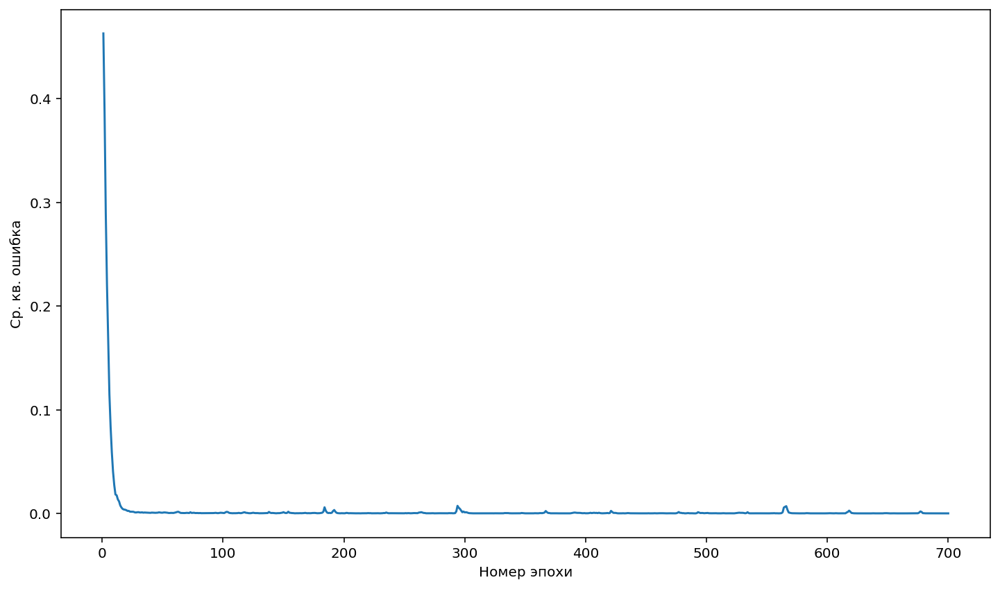

In [44]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

<ipython-input-45-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


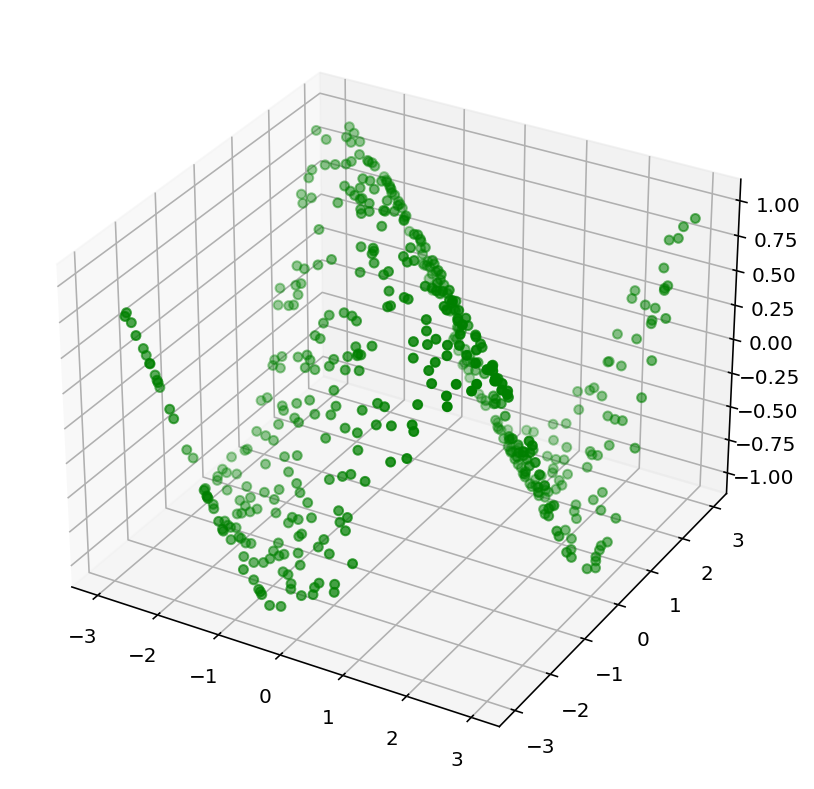

In [45]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

In [46]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae.append(max_err_val)

Максимальная ошибка по модулю =  0.034599200281417775


<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


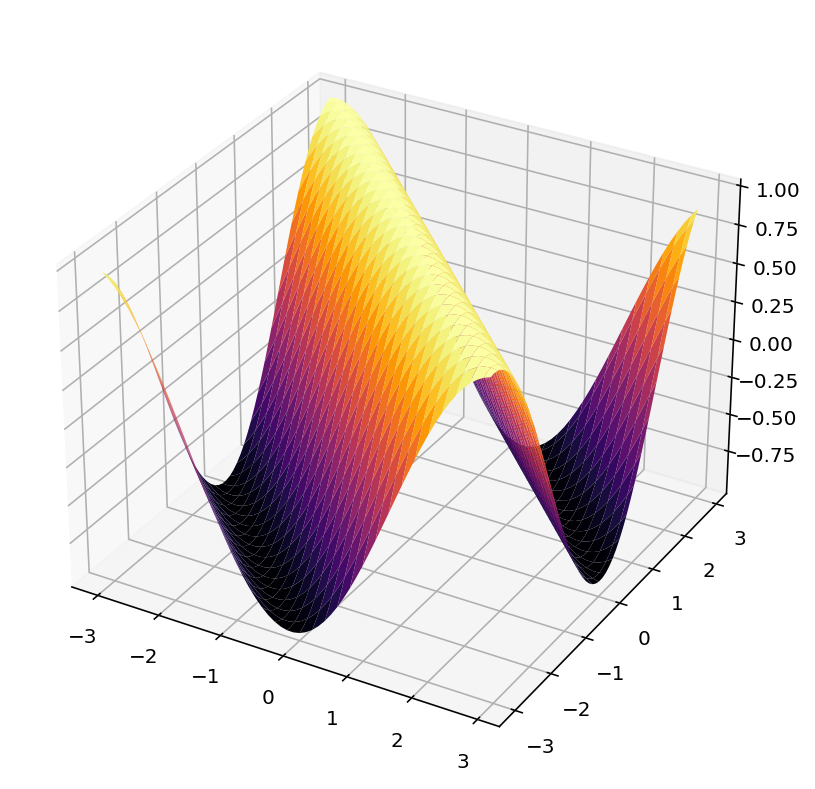

In [47]:
func_draw()

In [49]:
#---------------------random
n = 10
xy=[] 
zz=[] 
mse_rnd = []
mae_rnd = []
x, y = get_random_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])
#history = model()

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse_rnd.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


1/4 [======>.......................] - ETA: 3s - loss: 0.4577

4/4 [==============================] - 1s 2ms/step - loss: 0.4511


Epoch 2/700
1/4 [======>.......................] - ETA: 0s - loss: 0.4147

4/4 [==============================] - 0s 6ms/step - loss: 0.4061


Epoch 3/700


1/4 [======>.......................] - ETA: 0s - loss: 0.3322

4/4 [==============================] - 0s 4ms/step - loss: 0.3457


Epoch 4/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3076

4/4 [==============================] - 0s 4ms/step - loss: 0.3208


Epoch 5/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2581

4/4 [==============================] - ETA: 0s - loss: 0.2846

4/4 [==============================] - 0s 21ms/step - loss: 0.2855


Epoch 6/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2488

4/4 [==============================] - 0s 2ms/step - loss: 0.2643


Epoch 7/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2594

4/4 [==============================] - 0s 2ms/step - loss: 0.2577


Epoch 8/700
1/4 [======>.......................] - ETA: 0s - loss: 0.3345

4/4 [==============================] - 0s 3ms/step - loss: 0.2505


Epoch 9/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2277

4/4 [==============================] - 0s 2ms/step - loss: 0.2086


Epoch 10/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1607

4/4 [==============================] - 0s 2ms/step - loss: 0.1841


Epoch 11/700
1/4 [======>.......................] - ETA: 0s - loss: 0.2030

4/4 [==============================] - 0s 6ms/step - loss: 0.1874


Epoch 12/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1419

4/4 [==============================] - 0s 3ms/step - loss: 0.1666


Epoch 13/700


1/4 [======>.......................] - ETA: 0s - loss: 0.2102

2/4 [==============>...............] - ETA: 0s - loss: 0.1905

4/4 [==============================] - 0s 29ms/step - loss: 0.1707


Epoch 14/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1320

4/4 [==============================] - 0s 5ms/step - loss: 0.1388


Epoch 15/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1271

4/4 [==============================] - 0s 5ms/step - loss: 0.1261


Epoch 16/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1077

4/4 [==============================] - 0s 3ms/step - loss: 0.1221


Epoch 17/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1506

2/4 [==============>...............] - ETA: 0s - loss: 0.1479

4/4 [==============================] - 0s 24ms/step - loss: 0.1341


Epoch 18/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0976

2/4 [==============>...............] - ETA: 0s - loss: 0.0962

4/4 [==============================] - 0s 22ms/step - loss: 0.1040


Epoch 19/700
1/4 [======>.......................] - ETA: 0s - loss: 0.1059

4/4 [==============================] - 0s 2ms/step - loss: 0.1035


Epoch 20/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0892

4/4 [==============================] - 0s 2ms/step - loss: 0.0988


Epoch 21/700


1/4 [======>.......................] - ETA: 0s - loss: 0.1316

3/4 [=====================>........] - ETA: 0s - loss: 0.1107

4/4 [==============================] - 0s 21ms/step - loss: 0.1068


Epoch 22/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0850

4/4 [==============================] - 0s 2ms/step - loss: 0.0900


Epoch 23/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0967

4/4 [==============================] - 0s 2ms/step - loss: 0.0897


Epoch 24/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0578

4/4 [==============================] - 0s 2ms/step - loss: 0.0723


Epoch 25/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0901

4/4 [==============================] - 0s 2ms/step - loss: 0.0775


Epoch 26/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0730

4/4 [==============================] - 0s 4ms/step - loss: 0.0712


Epoch 27/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0579

4/4 [==============================] - 0s 7ms/step - loss: 0.0630


Epoch 28/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0606

4/4 [==============================] - 0s 15ms/step - loss: 0.0599


Epoch 29/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0670

4/4 [==============================] - 0s 2ms/step - loss: 0.0567


Epoch 30/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0395

4/4 [==============================] - 0s 14ms/step - loss: 0.0483


Epoch 31/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0492

4/4 [==============================] - 0s 2ms/step - loss: 0.0481


Epoch 32/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0608

4/4 [==============================] - ETA: 0s - loss: 0.0519

4/4 [==============================] - 0s 17ms/step - loss: 0.0506


Epoch 33/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0697

4/4 [==============================] - 0s 2ms/step - loss: 0.0482


Epoch 34/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0363

4/4 [==============================] - 0s 2ms/step - loss: 0.0382


Epoch 35/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0318

4/4 [==============================] - 0s 2ms/step - loss: 0.0334


Epoch 36/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0091

4/4 [==============================] - 0s 5ms/step - loss: 0.0265


Epoch 37/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0279

4/4 [==============================] - 0s 16ms/step - loss: 0.0290


Epoch 38/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0254

4/4 [==============================] - 0s 2ms/step - loss: 0.0268


Epoch 39/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0294

4/4 [==============================] - 0s 2ms/step - loss: 0.0276


Epoch 40/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0244

2/4 [==============>...............] - ETA: 0s - loss: 0.0252

4/4 [==============================] - ETA: 0s - loss: 0.0249

4/4 [==============================] - 0s 131ms/step - loss: 0.0248


Epoch 41/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0147

3/4 [=====================>........] - ETA: 0s - loss: 0.0169

4/4 [==============================] - ETA: 0s - loss: 0.0181

4/4 [==============================] - 0s 65ms/step - loss: 0.0189


Epoch 42/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0101

4/4 [==============================] - 0s 3ms/step - loss: 0.0177


Epoch 43/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0240

2/4 [==============>...............] - ETA: 0s - loss: 0.0222

4/4 [==============================] - 0s 30ms/step - loss: 0.0209


Epoch 44/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0335

2/4 [==============>...............] - ETA: 0s - loss: 0.0278

4/4 [==============================] - 0s 21ms/step - loss: 0.0227


Epoch 45/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0060

4/4 [==============================] - 0s 2ms/step - loss: 0.0155


Epoch 46/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0054

4/4 [==============================] - 0s 2ms/step - loss: 0.0141


Epoch 47/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0204

3/4 [=====================>........] - ETA: 0s - loss: 0.0185

4/4 [==============================] - 0s 20ms/step - loss: 0.0190


Epoch 48/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0137

4/4 [==============================] - 0s 2ms/step - loss: 0.0160


Epoch 49/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0197

4/4 [==============================] - 0s 2ms/step - loss: 0.0174


Epoch 50/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0146

4/4 [==============================] - 0s 2ms/step - loss: 0.0154


Epoch 51/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0152

4/4 [==============================] - 0s 2ms/step - loss: 0.0160


Epoch 52/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0117

4/4 [==============================] - 0s 2ms/step - loss: 0.0151


Epoch 53/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0130

2/4 [==============>...............] - ETA: 0s - loss: 0.0137

4/4 [==============================] - 1s 66ms/step - loss: 0.0142


Epoch 54/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0223

4/4 [==============================] - 0s 3ms/step - loss: 0.0154


Epoch 55/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0134

2/4 [==============>...............] - ETA: 0s - loss: 0.0134

3/4 [=====================>........] - ETA: 0s - loss: 0.0132

4/4 [==============================] - 0s 61ms/step - loss: 0.0129


Epoch 56/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0227

4/4 [==============================] - 0s 2ms/step - loss: 0.0163


Epoch 57/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0098

4/4 [==============================] - 0s 2ms/step - loss: 0.0139


Epoch 58/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0124

2/4 [==============>...............] - ETA: 0s - loss: 0.0134

4/4 [==============================] - 0s 26ms/step - loss: 0.0138


Epoch 59/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0232

4/4 [==============================] - 0s 2ms/step - loss: 0.0160


Epoch 60/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0298

4/4 [==============================] - 0s 2ms/step - loss: 0.0194


Epoch 61/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0148

4/4 [==============================] - 0s 2ms/step - loss: 0.0157


Epoch 62/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0251

4/4 [==============================] - 0s 2ms/step - loss: 0.0178


Epoch 63/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0120

4/4 [==============================] - 0s 2ms/step - loss: 0.0112


Epoch 64/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 4ms/step - loss: 0.0090


Epoch 65/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0085

2/4 [==============>...............] - ETA: 0s - loss: 0.0087

4/4 [==============================] - 0s 33ms/step - loss: 0.0100


Epoch 66/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 3ms/step - loss: 0.0093


Epoch 67/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0139

4/4 [==============================] - 0s 5ms/step - loss: 0.0117


Epoch 68/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 2ms/step - loss: 0.0091


Epoch 69/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0153

4/4 [==============================] - 0s 2ms/step - loss: 0.0110


Epoch 70/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0101

2/4 [==============>...............] - ETA: 0s - loss: 0.0101

4/4 [==============================] - 0s 31ms/step - loss: 0.0105


Epoch 71/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0183

4/4 [==============================] - 0s 9ms/step - loss: 0.0133


Epoch 72/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0054

4/4 [==============================] - 0s 3ms/step - loss: 0.0097


Epoch 73/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0097

4/4 [==============================] - 0s 3ms/step - loss: 0.0105


Epoch 74/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0069

2/4 [==============>...............] - ETA: 0s - loss: 0.0072

4/4 [==============================] - 0s 20ms/step - loss: 0.0088


Epoch 75/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0105

4/4 [==============================] - 0s 2ms/step - loss: 0.0100


Epoch 76/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0162

4/4 [==============================] - 0s 3ms/step - loss: 0.0112


Epoch 77/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0159

4/4 [==============================] - ETA: 0s - loss: 0.0112

4/4 [==============================] - 0s 76ms/step - loss: 0.0109


Epoch 78/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0071

2/4 [==============>...............] - ETA: 0s - loss: 0.0077

4/4 [==============================] - 0s 27ms/step - loss: 0.0091


Epoch 79/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0051

3/4 [=====================>........] - ETA: 0s - loss: 0.0074

4/4 [==============================] - 0s 33ms/step - loss: 0.0085


Epoch 80/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0070

4/4 [==============================] - 0s 3ms/step - loss: 0.0108


Epoch 81/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0168

4/4 [==============================] - 0s 3ms/step - loss: 0.0113


Epoch 82/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0072

3/4 [=====================>........] - ETA: 0s - loss: 0.0088

4/4 [==============================] - 0s 31ms/step - loss: 0.0089


Epoch 83/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0064

2/4 [==============>...............] - ETA: 0s - loss: 0.0075

3/4 [=====================>........] - ETA: 0s - loss: 0.0085

4/4 [==============================] - 0s 65ms/step - loss: 0.0091


Epoch 84/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0060

4/4 [==============================] - 0s 3ms/step - loss: 0.0083


Epoch 85/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0089

4/4 [==============================] - 0s 3ms/step - loss: 0.0081


Epoch 86/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0137

4/4 [==============================] - 0s 3ms/step - loss: 0.0113


Epoch 87/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0051

4/4 [==============================] - 0s 3ms/step - loss: 0.0090


Epoch 88/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0093

4/4 [==============================] - 0s 2ms/step - loss: 0.0090


Epoch 89/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0114

4/4 [==============================] - 0s 3ms/step - loss: 0.0108


Epoch 90/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0068

4/4 [==============================] - 0s 3ms/step - loss: 0.0092


Epoch 91/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0078


Epoch 92/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0126

4/4 [==============================] - 0s 3ms/step - loss: 0.0120


Epoch 93/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0114

4/4 [==============================] - 0s 2ms/step - loss: 0.0107


Epoch 94/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0077

2/4 [==============>...............] - ETA: 0s - loss: 0.0085

4/4 [==============================] - 0s 35ms/step - loss: 0.0098


Epoch 95/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0126

4/4 [==============================] - 0s 2ms/step - loss: 0.0100


Epoch 96/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0152

4/4 [==============================] - ETA: 0s - loss: 0.0110

4/4 [==============================] - 0s 37ms/step - loss: 0.0107


Epoch 97/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0165

3/4 [=====================>........] - ETA: 0s - loss: 0.0150

4/4 [==============================] - 0s 34ms/step - loss: 0.0140


Epoch 98/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0077

4/4 [==============================] - 0s 4ms/step - loss: 0.0091


Epoch 99/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0124

4/4 [==============================] - 0s 3ms/step - loss: 0.0105


Epoch 100/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0112

4/4 [==============================] - 0s 2ms/step - loss: 0.0099


Epoch 101/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0199

3/4 [=====================>........] - ETA: 0s - loss: 0.0162

4/4 [==============================] - 0s 23ms/step - loss: 0.0147


Epoch 102/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0137

4/4 [==============================] - 0s 2ms/step - loss: 0.0099


Epoch 103/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0154

4/4 [==============================] - 0s 2ms/step - loss: 0.0105


Epoch 104/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 2ms/step - loss: 0.0066


Epoch 105/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0069

4/4 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 106/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0065

4/4 [==============================] - 0s 5ms/step - loss: 0.0065


Epoch 107/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0057

3/4 [=====================>........] - ETA: 0s - loss: 0.0057

4/4 [==============================] - 0s 18ms/step - loss: 0.0061


Epoch 108/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 4ms/step - loss: 0.0065


Epoch 109/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0086

4/4 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 110/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0046

4/4 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 111/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0042

3/4 [=====================>........] - ETA: 0s - loss: 0.0056

4/4 [==============================] - 0s 37ms/step - loss: 0.0058


Epoch 112/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0067

4/4 [==============================] - 0s 3ms/step - loss: 0.0063


Epoch 113/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0111

2/4 [==============>...............] - ETA: 0s - loss: 0.0092

4/4 [==============================] - 0s 28ms/step - loss: 0.0077


Epoch 114/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0058


Epoch 115/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0022

2/4 [==============>...............] - ETA: 0s - loss: 0.0022

3/4 [=====================>........] - ETA: 0s - loss: 0.0040

4/4 [==============================] - ETA: 0s - loss: 0.0048

4/4 [==============================] - 0s 129ms/step - loss: 0.0053


Epoch 116/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

4/4 [==============================] - ETA: 0s - loss: 0.0071

4/4 [==============================] - 0s 24ms/step - loss: 0.0072


Epoch 117/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0065

4/4 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 118/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0047

4/4 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 119/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0052

4/4 [==============================] - 0s 2ms/step - loss: 0.0060


Epoch 120/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0039

4/4 [==============================] - 0s 3ms/step - loss: 0.0057


Epoch 121/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0082

4/4 [==============================] - 0s 2ms/step - loss: 0.0065


Epoch 122/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0052

4/4 [==============================] - ETA: 0s - loss: 0.0063

4/4 [==============================] - 0s 22ms/step - loss: 0.0062


Epoch 123/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 124/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 125/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0059

4/4 [==============================] - 0s 2ms/step - loss: 0.0055


Epoch 126/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0084

4/4 [==============================] - 0s 2ms/step - loss: 0.0065


Epoch 127/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0047

4/4 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 128/700

1/4 [======>.......................] - ETA: 0s - loss: 0.0081

4/4 [==============================] - ETA: 0s - loss: 0.0064

4/4 [==============================] - 0s 36ms/step - loss: 0.0062


Epoch 129/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

4/4 [==============================] - 0s 2ms/step - loss: 0.0047


Epoch 130/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 4ms/step - loss: 0.0066


Epoch 131/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0058

4/4 [==============================] - ETA: 0s - loss: 0.0058

4/4 [==============================] - 0s 29ms/step - loss: 0.0058


Epoch 132/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 3ms/step - loss: 0.0050


Epoch 133/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5863e-04

4/4 [==============================] - ETA: 0s - loss: 0.0035    

4/4 [==============================] - 0s 29ms/step - loss: 0.0039


Epoch 134/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - ETA: 0s - loss: 0.0051

4/4 [==============================] - 0s 25ms/step - loss: 0.0052


Epoch 135/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0076

4/4 [==============================] - 0s 4ms/step - loss: 0.0057


Epoch 136/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0039

4/4 [==============================] - 0s 3ms/step - loss: 0.0048


Epoch 137/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0048

4/4 [==============================] - 0s 3ms/step - loss: 0.0062


Epoch 138/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0105

4/4 [==============================] - 0s 2ms/step - loss: 0.0072


Epoch 139/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 3ms/step - loss: 0.0058


Epoch 140/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 3ms/step - loss: 0.0055


Epoch 141/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 3ms/step - loss: 0.0051


Epoch 142/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0110

3/4 [=====================>........] - ETA: 0s - loss: 0.0082

4/4 [==============================] - 0s 22ms/step - loss: 0.0073


Epoch 143/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0051

4/4 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 144/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0039

4/4 [==============================] - 0s 3ms/step - loss: 0.0044


Epoch 145/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0047

4/4 [==============================] - 0s 3ms/step - loss: 0.0063


Epoch 146/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0040

4/4 [==============================] - 0s 3ms/step - loss: 0.0054


Epoch 147/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0094

4/4 [==============================] - 0s 2ms/step - loss: 0.0080


Epoch 148/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 4ms/step - loss: 0.0042


Epoch 149/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0047

2/4 [==============>...............] - ETA: 0s - loss: 0.0047

4/4 [==============================] - 0s 30ms/step - loss: 0.0056


Epoch 150/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0071

4/4 [==============================] - 0s 4ms/step - loss: 0.0073


Epoch 151/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 2ms/step - loss: 0.0057


Epoch 152/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 5ms/step - loss: 0.0046


Epoch 153/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0088

4/4 [==============================] - 0s 12ms/step - loss: 0.0073


Epoch 154/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0057

4/4 [==============================] - 0s 2ms/step - loss: 0.0054


Epoch 155/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0048

4/4 [==============================] - 0s 2ms/step - loss: 0.0047


Epoch 156/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0042


Epoch 157/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0041


Epoch 158/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0036


Epoch 159/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 2ms/step - loss: 0.0044


Epoch 160/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0042

4/4 [==============================] - 0s 3ms/step - loss: 0.0043


Epoch 161/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0030

4/4 [==============================] - 0s 4ms/step - loss: 0.0038


Epoch 162/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0056

4/4 [==============================] - 0s 8ms/step - loss: 0.0052


Epoch 163/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0076

4/4 [==============================] - 0s 3ms/step - loss: 0.0049


Epoch 164/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0059

2/4 [==============>...............] - ETA: 0s - loss: 0.0050

4/4 [==============================] - 1s 101ms/step - loss: 0.0046


Epoch 165/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0076

4/4 [==============================] - 0s 5ms/step - loss: 0.0055


Epoch 166/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0068

4/4 [==============================] - 0s 4ms/step - loss: 0.0059


Epoch 167/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

2/4 [==============>...............] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 25ms/step - loss: 0.0048


Epoch 168/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0083

4/4 [==============================] - 0s 3ms/step - loss: 0.0061


Epoch 169/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

2/4 [==============>...............] - ETA: 0s - loss: 0.0035

4/4 [==============================] - 0s 21ms/step - loss: 0.0041


Epoch 170/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0053

3/4 [=====================>........] - ETA: 0s - loss: 0.0050

4/4 [==============================] - 0s 20ms/step - loss: 0.0048


Epoch 171/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0056

4/4 [==============================] - 0s 5ms/step - loss: 0.0051


Epoch 172/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 5ms/step - loss: 0.0041


Epoch 173/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 3ms/step - loss: 0.0039


Epoch 174/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

2/4 [==============>...............] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 20ms/step - loss: 0.0040


Epoch 175/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0045

2/4 [==============>...............] - ETA: 0s - loss: 0.0059

4/4 [==============================] - 0s 21ms/step - loss: 0.0065


Epoch 176/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 177/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 3ms/step - loss: 0.0057


Epoch 178/700


1/4 [======>.......................]

 - ETA: 0s - loss: 0.0057

4/4 [==============================] - 0s 12ms/step - loss: 0.0050


Epoch 179/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0045

4/4 [==============================] - 0s 3ms/step - loss: 0.0037


Epoch 180/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 4ms/step - loss: 0.0040


Epoch 181/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 4ms/step - loss: 0.0030


Epoch 182/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 25ms/step - loss: 0.0033


Epoch 183/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0077

2/4 [==============>...............] - ETA: 0s - loss: 0.0062

4/4 [==============================] - 0s 37ms/step - loss: 0.0046


Epoch 184/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 21ms/step - loss: 0.0033


Epoch 185/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0042

2/4 [==============>...............] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 43ms/step - loss: 0.0033


Epoch 186/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0050

2/4 [==============>...............] - ETA: 0s - loss: 0.0044

3/4 [=====================>........] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 72ms/step - loss: 0.0044


Epoch 187/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 5ms/step - loss: 0.0044


Epoch 188/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 4ms/step - loss: 0.0038


Epoch 189/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0093

4/4 [==============================] - 0s 3ms/step - loss: 0.0055


Epoch 190/700


1/4 [======>.......................] - ETA: 0s - loss: 8.1557e-04

4/4 [==============================] - 0s 4ms/step - loss: 0.0029


Epoch 191/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 16ms/step - loss: 0.0036


Epoch 192/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0035

4/4 [==============================] - 0s 16ms/step - loss: 0.0032


Epoch 193/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0028


Epoch 194/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 4ms/step - loss: 0.0032


Epoch 195/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0054

2/4 [==============>...............] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 22ms/step - loss: 0.0046


Epoch 196/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 4ms/step - loss: 0.0035


Epoch 197/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 5ms/step - loss: 0.0036


Epoch 198/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 7ms/step - loss: 0.0039


Epoch 199/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0050

4/4 [==============================] - 0s 4ms/step - loss: 0.0032


Epoch 200/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 5ms/step - loss: 0.0035


Epoch 201/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 4ms/step - loss: 0.0029


Epoch 202/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

3/4 [=====================>........] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 30ms/step - loss: 0.0023


Epoch 203/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 5ms/step - loss: 0.0030


Epoch 204/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0048

4/4 [==============================] - 0s 3ms/step - loss: 0.0040


Epoch 205/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0054

4/4 [==============================] - 0s 8ms/step - loss: 0.0049


Epoch 206/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0073

4/4 [==============================] - 0s 4ms/step - loss: 0.0053


Epoch 207/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 7ms/step - loss: 0.0032


Epoch 208/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

3/4 [=====================>........] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 18ms/step - loss: 0.0032


Epoch 209/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0042

4/4 [==============================] - 0s 3ms/step - loss: 0.0032


Epoch 210/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0048

4/4 [==============================] - 0s 3ms/step - loss: 0.0034


Epoch 211/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 3ms/step - loss: 0.0031


Epoch 212/700
1/4 [======>.......................] - ETA: 0s - loss: 4.2573e-04

4/4 [==============================] - 0s 4ms/step - loss: 0.0021


Epoch 213/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8449e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0024


Epoch 214/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 3ms/step - loss: 0.0027


Epoch 215/700
1/4 [======>.......................] - ETA: 0s - loss: 9.1372e-04

4/4 [==============================] - 0s 9ms/step - loss: 0.0026


Epoch 216/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 6ms/step - loss: 0.0024


Epoch 217/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 4ms/step - loss: 0.0034


Epoch 218/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0062

4/4 [==============================] - 0s 8ms/step - loss: 0.0041


Epoch 219/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0061

4/4 [==============================] - 0s 4ms/step - loss: 0.0037


Epoch 220/700


1/4 [======>.......................] - ETA: 0s - loss: 6.3413e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 221/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0035

3/4 [=====================>........] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 35ms/step - loss: 0.0029


Epoch 222/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0034

2/4 [==============>...............] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 68ms/step - loss: 0.0033


Epoch 223/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 4ms/step - loss: 0.0022


Epoch 224/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7125e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0022


Epoch 225/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

3/4 [=====================>........] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 32ms/step - loss: 0.0026


Epoch 226/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 227/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 228/700
1/4 [======>.......................] - ETA: 0s - loss: 8.9663e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 229/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0035


Epoch 230/700


1/4 [======>.......................] - ETA: 0s - loss: 5.2838e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0022


Epoch 231/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 232/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 233/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 234/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 235/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 236/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 237/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 238/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1395e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 239/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 240/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 28ms/step - loss: 0.0024


Epoch 241/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

2/4 [==============>...............] - ETA: 0s - loss: 0.0027

4/4 [==============================] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 64ms/step - loss: 0.0026


Epoch 242/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 18ms/step - loss: 0.0034


Epoch 243/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 3ms/step - loss: 0.0044


Epoch 244/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0052

4/4 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 245/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0050

4/4 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 246/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 4ms/step - loss: 0.0037


Epoch 247/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0036


Epoch 248/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 2ms/step - loss: 0.0050


Epoch 249/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 250/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0095

4/4 [==============================]

 - 0s 2ms/step - loss: 0.0109


Epoch 251/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0073

4/4 [==============================] - 0s 2ms/step - loss: 0.0050


Epoch 252/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0060

4/4 [==============================] - 0s 2ms/step - loss: 0.0083


Epoch 253/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0070

4/4 [==============================] - 0s 2ms/step - loss: 0.0065


Epoch 254/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0055


Epoch 255/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0054

4/4 [==============================] - 0s 2ms/step - loss: 0.0072


Epoch 256/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 2ms/step - loss: 0.0050


Epoch 257/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 4ms/step - loss: 0.0047


Epoch 258/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

2/4 [==============>...............] - ETA: 0s - loss: 0.0053

4/4 [==============================] - 0s 30ms/step - loss: 0.0068


Epoch 259/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0067

2/4 [==============>...............] - ETA: 0s - loss: 0.0063

4/4 [==============================] - 0s 26ms/step - loss: 0.0062


Epoch 260/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 2ms/step - loss: 0.0044


Epoch 261/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0071

4/4 [==============================] - 0s 2ms/step - loss: 0.0061


Epoch 262/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0098

2/4 [==============>...............] - ETA: 0s - loss: 0.0079

4/4 [==============================] - 0s 30ms/step - loss: 0.0060


Epoch 263/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0067

2/4 [==============>...............] - ETA: 0s - loss: 0.0053

4/4 [==============================] - 0s 40ms/step - loss: 0.0044


Epoch 264/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 265/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 18ms/step - loss: 0.0033


Epoch 266/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0059

4/4 [==============================] - 0s 2ms/step - loss: 0.0046


Epoch 267/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0053

4/4 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 268/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0057

4/4 [==============================] - ETA: 0s - loss: 0.0039

4/4 [==============================] - 0s 22ms/step - loss: 0.0037


Epoch 269/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 270/700
1/4 [======>.......................] - ETA: 0s - loss: 6.2191e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 271/700


1/4 [======>.......................] - ETA: 0s - loss: 6.2400e-04

4/4 [==============================] - ETA: 0s - loss: 0.0014    

4/4 [==============================] - 0s 22ms/step - loss: 0.0016


Epoch 272/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 273/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 274/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 275/700
1/4 [======>.......................] - ETA: 0s - loss: 6.8058e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 276/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 277/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 278/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 279/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 3ms/step - loss: 0.0027


Epoch 280/700
1/4 [======>.......................] - ETA: 0s - loss: 9.1639e-04

2/4 [==============>...............] - ETA: 0s - loss: 0.0011    

4/4 [==============================] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 74ms/step - loss: 0.0019


Epoch 281/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0042

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 282/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0047

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 283/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 284/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 3ms/step - loss: 0.0024


Epoch 285/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0040

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 286/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 287/700


1/4 [======>.......................] - ETA: 0s - loss: 7.6610e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 288/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 289/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 290/700


1/4 [======>.......................] - ETA: 0s - loss: 5.4784e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 291/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================]

 - 0s 2ms/step - loss: 0.0021


Epoch 292/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 3ms/step - loss: 0.0022


Epoch 293/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 3ms/step - loss: 0.0023


Epoch 294/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

3/4 [=====================>........] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 23ms/step - loss: 0.0016


Epoch 295/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

2/4 [==============>...............] - ETA: 0s - loss: 0.0024

3/4 [=====================>........] - ETA: 0s - loss: 0.0023

4/4 [==============================] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 121ms/step - loss: 0.0021


Epoch 296/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

2/4 [==============>...............] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 35ms/step - loss: 0.0030


Epoch 297/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0033

2/4 [==============>...............] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 37ms/step - loss: 0.0034


Epoch 298/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 3ms/step - loss: 0.0033


Epoch 299/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0065

4/4 [==============================] - 0s 3ms/step - loss: 0.0062


Epoch 300/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0070

4/4 [==============================] - 0s 2ms/step - loss: 0.0065


Epoch 301/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0049

4/4 [==============================] - 0s 2ms/step - loss: 0.0049


Epoch 302/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

4/4 [==============================] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 22ms/step - loss: 0.0033


Epoch 303/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 3ms/step - loss: 0.0027


Epoch 304/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6783e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 305/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 3ms/step - loss: 0.0033


Epoch 306/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 307/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

3/4 [=====================>........] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 24ms/step - loss: 0.0031


Epoch 308/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 309/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 4ms/step - loss: 0.0025


Epoch 310/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

2/4 [==============>...............] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 20ms/step - loss: 0.0021


Epoch 311/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 312/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0052

4/4 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 313/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 314/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6063e-04

3/4 [=====================>........] - ETA: 0s - loss: 0.0027    

4/4 [==============================] - 0s 23ms/step - loss: 0.0029


Epoch 315/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 4ms/step - loss: 0.0028


Epoch 316/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9127e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 317/700
1/4 [======>.......................] - ETA: 0s - loss: 8.5245e-04

2/4 [==============>...............] - ETA: 0s - loss: 9.0285e-04

4/4 [==============================] - 0s 22ms/step - loss: 0.0015


Epoch 318/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0021

2/4 [==============>...............] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 30ms/step - loss: 0.0020


Epoch 319/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

2/4 [==============>...............] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 29ms/step - loss: 0.0020


Epoch 320/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 29ms/step - loss: 0.0022


Epoch 321/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0023

3/4 [=====================>........] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 35ms/step - loss: 0.0022


Epoch 322/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 323/700
1/4 [======>.......................] - ETA: 0s - loss: 5.0331e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 324/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 325/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 326/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 327/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

3/4 [=====================>........] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 18ms/step - loss: 0.0019


Epoch 328/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 329/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 4ms/step - loss: 0.0020


Epoch 330/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 331/700


1/4 [======>.......................] - ETA: 0s - loss: 8.8848e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 332/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 3ms/step - loss: 0.0016


Epoch 333/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 334/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5481e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 335/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 336/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 337/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 338/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 339/700
1/4 [======>.......................] - ETA: 0s - loss: 5.6880e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 340/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 341/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0947e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 342/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 343/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 344/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 345/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 346/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 347/700


1/4 [======>.......................] - ETA: 0s - loss: 3.7410e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 348/700


1/4 [======>.......................] - ETA: 0s - loss: 5.2575e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 349/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 350/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1209e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 351/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 352/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 353/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 354/700
1/4 [======>.......................] - ETA: 0s - loss: 9.9912e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 355/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 356/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 357/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0062

4/4 [==============================] - 0s 2ms/step - loss: 0.0040


Epoch 358/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0080

4/4 [==============================] - 0s 2ms/step - loss: 0.0047


Epoch 359/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 360/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 361/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 362/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 363/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 364/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012



4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 365/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 366/700


1/4 [======>.......................] - ETA: 0s - loss: 1.0899e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 367/700
1/4 [======>.......................] - ETA: 0s - loss: 9.7093e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 368/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 369/700
1/4 [======>.......................] - ETA: 0s - loss: 7.1515e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 370/700
1/4 [======>.......................] - ETA: 0s - loss: 6.8559e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 371/700
1/4 [======>.......................] - ETA: 0s - loss: 7.8612e-04

4/4 [==============================] - ETA: 0s - loss: 0.0019    

4/4 [==============================] - 0s 21ms/step - loss: 0.0019


Epoch 372/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 4ms/step - loss: 0.0015


Epoch 373/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 26ms/step - loss: 0.0013


Epoch 374/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

3/4 [=====================>........] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 25ms/step - loss: 0.0019


Epoch 375/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 26ms/step - loss: 0.0025


Epoch 376/700


1/4 [======>.......................] - ETA: 0s - loss: 1.1015e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 377/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 28ms/step - loss: 0.0018


Epoch 378/700


1/4 [======>.......................] - ETA: 1s - loss: 0.0039

2/4 [==============>...............] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 30ms/step - loss: 0.0023


Epoch 379/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 380/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

3/4 [=====================>........] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 28ms/step - loss: 0.0017


Epoch 381/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

3/4 [=====================>........] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 29ms/step - loss: 0.0017


Epoch 382/700


1/4 [======>.......................] - ETA: 0s - loss: 7.5846e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 383/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 384/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 385/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 386/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0397e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 387/700
1/4 [======>.......................] - ETA: 0s - loss: 3.8819e-04

3/4 [=====================>........] - ETA: 0s - loss: 0.0011    

4/4 [==============================] - 0s 24ms/step - loss: 0.0012


Epoch 388/700
1/4 [======>.......................] - ETA: 0s - loss: 2.3253e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 389/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0016


Epoch 390/700


1/4 [======>.......................] - ETA: 1s - loss: 0.0017

4/4 [==============================] - 0s 3ms/step - loss: 0.0018


Epoch 391/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 32ms/step - loss: 0.0027


Epoch 392/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

2/4 [==============>...............] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 26ms/step - loss: 0.0016


Epoch 393/700
1/4 [======>.......................] - ETA: 0s - loss: 9.1972e-04

2/4 [==============>...............] - ETA: 0s - loss: 9.5335e-04

4/4 [==============================] - 0s 25ms/step - loss: 0.0015


Epoch 394/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9058e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0015


Epoch 395/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 396/700
1/4 [======>.......................] - ETA: 0s - loss: 9.9422e-04

2/4 [==============>...............] - ETA: 0s - loss: 0.0013    

4/4 [==============================] - 0s 21ms/step - loss: 0.0016


Epoch 397/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2176e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 398/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 399/700


1/4 [======>.......................] - ETA: 0s - loss: 2.4524e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 400/700


1/4 [======>.......................] - ETA: 0s - loss: 5.7593e-04

2/4 [==============>...............] - ETA: 0s - loss: 7.4989e-04

4/4 [==============================] - 0s 34ms/step - loss: 0.0012


Epoch 401/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

2/4 [==============>...............] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 27ms/step - loss: 0.0018


Epoch 402/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0031

2/4 [==============>...............] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 36ms/step - loss: 0.0020


Epoch 403/700


1/4 [======>.......................] - ETA: 0s - loss: 8.3113e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 404/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 405/700
1/4 [======>.......................] - ETA: 0s - loss: 9.3227e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0016


Epoch 406/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

2/4 [==============>...............] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 19ms/step - loss: 0.0021


Epoch 407/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 3ms/step - loss: 0.0018


Epoch 408/700


1/4 [======>.......................] - ETA: 0s - loss: 4.6125e-04

2/4 [==============>...............] - ETA: 0s - loss: 8.1603e-04

3/4 [=====================>........] - ETA: 0s - loss: 0.0010    

4/4 [==============================] - 0s 99ms/step - loss: 0.0013


Epoch 409/700
1/4 [======>.......................] - ETA: 0s - loss: 5.7131e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 410/700


1/4 [======>.......................] - ETA: 0s - loss: 8.5860e-04

4/4 [==============================] - ETA: 0s - loss: 0.0014    

4/4 [==============================] - 0s 29ms/step - loss: 0.0015


Epoch 411/700


1/4 [======>.......................] - ETA: 0s - loss: 8.8921e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 412/700
1/4 [======>.......................] - ETA: 0s - loss: 8.2248e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 413/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0044

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 414/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 5ms/step - loss: 0.0018


Epoch 415/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

2/4 [==============>...............] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 30ms/step - loss: 0.0019


Epoch 416/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0035

2/4 [==============>...............] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 31ms/step - loss: 0.0022


Epoch 417/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 418/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

3/4 [=====================>........] - ETA: 0s - loss: 0.0022

4/4 [==============================] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 60ms/step - loss: 0.0021


Epoch 419/700


1/4 [======>.......................] - ETA: 0s - loss: 5.0901e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 420/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 421/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

2/4 [==============>...............] - ETA: 0s - loss: 0.0022

3/4 [=====================>........] - ETA: 0s - loss: 0.0021

4/4 [==============================] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 1s 132ms/step - loss: 0.0020


Epoch 422/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 7ms/step - loss: 0.0019


Epoch 423/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

2/4 [==============>...............] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 32ms/step - loss: 0.0021


Epoch 424/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0026

3/4 [=====================>........] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 31ms/step - loss: 0.0019


Epoch 425/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 426/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 427/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 428/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0033

2/4 [==============>...............] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 23ms/step - loss: 0.0037


Epoch 429/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 22ms/step - loss: 0.0038


Epoch 430/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0055

4/4 [==============================] - 0s 2ms/step - loss: 0.0044


Epoch 431/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0072

2/4 [==============>...............] - ETA: 0s - loss: 0.0063

4/4 [==============================] - 0s 21ms/step - loss: 0.0052


Epoch 432/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 433/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0059

4/4 [==============================] - 0s 2ms/step - loss: 0.0045


Epoch 434/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

2/4 [==============>...............] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 23ms/step - loss: 0.0032


Epoch 435/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0031

2/4 [==============>...............] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 30ms/step - loss: 0.0024


Epoch 436/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0030

2/4 [==============>...............] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 31ms/step - loss: 0.0037


Epoch 437/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 61ms/step - loss: 0.0024


Epoch 438/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 3ms/step - loss: 0.0028


Epoch 439/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 3ms/step - loss: 0.0023


Epoch 440/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 3ms/step - loss: 0.0019


Epoch 441/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 442/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

2/4 [==============>...............] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 23ms/step - loss: 0.0023


Epoch 443/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 444/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 445/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0031

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 446/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0022

2/4 [==============>...............] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 32ms/step - loss: 0.0021


Epoch 447/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 448/700
1/4 [======>.......................]

 - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 5ms/step - loss: 0.0018


Epoch 449/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 3ms/step - loss: 0.0019


Epoch 450/700
1/4 [======>.......................] - ETA: 0s - loss: 8.5710e-04

3/4 [=====================>........] - ETA: 0s - loss: 8.8862e-04

4/4 [==============================] - 0s 23ms/step - loss: 0.0012


Epoch 451/700
1/4 [======>.......................] - ETA: 0s - loss: 4.3509e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 452/700
1/4 [======>.......................] - ETA: 0s - loss: 8.5996e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 453/700


1/4 [======>.......................] - ETA: 0s - loss: 9.3848e-04

2/4 [==============>...............] - ETA: 0s - loss: 0.0022    

3/4 [=====================>........] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 57ms/step - loss: 0.0025


Epoch 454/700
1/4 [======>.......................] - ETA: 0s - loss: 9.2084e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0022


Epoch 455/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1657e-04

4/4 [==============================] - ETA: 0s - loss: 0.0013    

4/4 [==============================] - 0s 28ms/step - loss: 0.0014


Epoch 456/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 4ms/step - loss: 0.0021


Epoch 457/700


1/4 [======>.......................] - ETA: 0s - loss: 1.9491e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0015


Epoch 458/700
1/4 [======>.......................] - ETA: 0s - loss: 9.9562e-04

4/4 [==============================] - 0s 4ms/step - loss: 0.0017


Epoch 459/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 4ms/step - loss: 0.0017


Epoch 460/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

2/4 [==============>...............] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 29ms/step - loss: 0.0018


Epoch 461/700
1/4 [======>.......................] - ETA: 0s - loss: 4.2636e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 462/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 463/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0043

2/4 [==============>...............] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 29ms/step - loss: 0.0028


Epoch 464/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 6ms/step - loss: 0.0026


Epoch 465/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 466/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 467/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 468/700
1/4 [======>.......................] - ETA: 0s - loss: 9.3471e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 469/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 470/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5311e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 471/700
1/4 [======>.......................] - ETA: 0s - loss: 5.3142e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 472/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 473/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 474/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 475/700
1/4 [======>.......................] - ETA: 0s - loss: 8.7104e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 476/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 477/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 478/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 479/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 480/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 481/700


1/4 [======>.......................] - ETA: 0s - loss: 7.2539e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 482/700


1/4 [======>.......................] - ETA: 0s - loss: 4.5832e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 483/700
1/4 [======>.......................] - ETA: 0s - loss: 8.2222e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 484/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 485/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 486/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 487/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 488/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 489/700
1/4 [======>.......................] - ETA: 0s - loss: 7.3889e-05

4/4 [==============================] - 0s 2ms/step - loss: 9.7689e-04


Epoch 490/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 12ms/step - loss: 0.0018


Epoch 491/700
1/4 [======>.......................] - ETA: 0s - loss: 4.6477e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 492/700
1/4 [======>.......................] - ETA: 0s - loss: 9.6382e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 493/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9882e-04

4/4 [==============================] - 0s 12ms/step - loss: 0.0011


Epoch 494/700
1/4 [======>.......................] - ETA: 0s - loss: 6.8077e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 495/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 496/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 12ms/step - loss: 0.0018


Epoch 497/700


1/4 [======>.......................] - ETA: 0s - loss: 8.5062e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 498/700


1/4 [======>.......................] - ETA: 0s - loss: 3.6924e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 499/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0058

4/4 [==============================] - 0s 15ms/step - loss: 0.0035


Epoch 500/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 501/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 502/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 10ms/step - loss: 0.0015


Epoch 503/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 504/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0035

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 505/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 11ms/step - loss: 0.0025


Epoch 506/700
1/4 [======>.......................] - ETA: 0s - loss: 4.7186e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 507/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 508/700
1/4 [======>.......................] - ETA: 0s - loss: 5.6749e-04

4/4 [==============================] - 0s 13ms/step - loss: 0.0014


Epoch 509/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 510/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 511/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 12ms/step - loss: 0.0018


Epoch 512/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 513/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 514/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 515/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 516/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 517/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 518/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 519/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 520/700
1/4 [======>.......................] - ETA: 0s - loss: 4.1358e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 521/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2841e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 522/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 523/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 12ms/step - loss: 0.0025


Epoch 524/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 525/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0043

4/4 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 526/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 12ms/step - loss: 0.0032


Epoch 527/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8958e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 528/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0030


Epoch 529/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 3ms/step - loss: 0.0029


Epoch 530/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 2ms/step - loss: 0.0045


Epoch 531/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0036

4/4 [==============================] - 0s 7ms/step - loss: 0.0033


Epoch 532/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0041

4/4 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 533/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 534/700
1/4 [======>.......................] - ETA: 0s - loss: 8.4342e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 535/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 536/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 537/700
1/4 [======>.......................] - ETA: 0s - loss: 7.2905e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 538/700


1/4 [======>.......................] - ETA: 0s - loss: 7.2275e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 539/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 540/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 3ms/step - loss: 0.0015


Epoch 541/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 542/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 11ms/step - loss: 0.0017


Epoch 543/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 544/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0582e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 545/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 10ms/step - loss: 0.0014


Epoch 546/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 547/700
1/4 [======>.......................] - ETA: 0s - loss: 9.9037e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 548/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 549/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 2ms/step - loss: 0.0034


Epoch 550/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 551/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0023

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 552/700
1/4 [======>.......................] - ETA: 0s - loss: 8.1297e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 553/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 13ms/step - loss: 0.0017


Epoch 554/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 555/700
1/4 [======>.......................] - ETA: 0s - loss: 5.9828e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 556/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 557/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 558/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 559/700
1/4 [======>.......................] - ETA: 0s - loss: 6.4000e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 560/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 561/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 10ms/step - loss: 0.0011


Epoch 562/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8725e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 563/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 564/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 11ms/step - loss: 0.0018


Epoch 565/700
1/4 [======>.......................] - ETA: 0s - loss: 2.9344e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 566/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0033

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 567/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0034

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 568/700


1/4 [======>.......................] - ETA: 0s - loss: 5.9145e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 569/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 570/700
1/4 [======>.......................] - ETA: 0s - loss: 6.3520e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 571/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 572/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 573/700
1/4 [======>.......................] - ETA: 0s - loss: 7.5887e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 574/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 575/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8651e-04

4/4 [==============================] - 0s 12ms/step - loss: 0.0012


Epoch 576/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 577/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8587e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 578/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 12ms/step - loss: 0.0013


Epoch 579/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 580/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 581/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 12ms/step - loss: 0.0016


Epoch 582/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 583/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 584/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0015

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 585/700


1/4 [======>.......................] - ETA: 0s - loss: 7.0571e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.7419e-04


Epoch 586/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 587/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0026

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 588/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 589/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 590/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 591/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 592/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 593/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 594/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0016

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 595/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6976e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.1276e-04


Epoch 596/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 5ms/step - loss: 0.0012


Epoch 597/700


1/4 [======>.......................] - ETA: 0s - loss: 3.6960e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.7864e-04


Epoch 598/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 599/700


1/4 [======>.......................] - ETA: 0s - loss: 2.0710e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.7898e-04


Epoch 600/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 601/700
1/4 [======>.......................] - ETA: 0s - loss: 1.2284e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 602/700
1/4 [======>.......................] - ETA: 0s - loss: 1.8840e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 603/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 604/700
1/4 [======>.......................] - ETA: 0s - loss: 3.0570e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.6433e-04


Epoch 605/700
1/4 [======>.......................] - ETA: 0s - loss: 6.6295e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 606/700
1/4 [======>.......................] - ETA: 0s - loss: 4.9586e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.4993e-04


Epoch 607/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 608/700
1/4 [======>.......................] - ETA: 0s - loss: 4.5668e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.4801e-04


Epoch 609/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 610/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 611/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8525e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.5892e-04


Epoch 612/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 613/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0013

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 614/700


1/4 [======>.......................] - ETA: 0s - loss: 1.9467e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.2209e-04


Epoch 615/700


1/4 [======>.......................] - ETA: 0s - loss: 4.1835e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.2393e-04


Epoch 616/700


1/4 [======>.......................] - ETA: 0s - loss: 2.6193e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.1641e-04


Epoch 617/700
1/4 [======>.......................] - ETA: 0s - loss: 4.0465e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.5381e-04


Epoch 618/700
1/4 [======>.......................] - ETA: 0s - loss: 5.5975e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 619/700
1/4 [======>.......................] - ETA: 0s - loss: 5.2791e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 620/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5919e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 621/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 12ms/step - loss: 0.0013


Epoch 622/700
1/4 [======>.......................] - ETA: 0s - loss: 3.4628e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.6081e-04


Epoch 623/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 624/700
1/4 [======>.......................] - ETA: 0s - loss: 2.5491e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.8392e-04


Epoch 625/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 9.7398e-04


Epoch 626/700
1/4 [======>.......................] - ETA: 0s - loss: 9.4252e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 627/700


1/4 [======>.......................] - ETA: 0s - loss: 3.9754e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.9604e-04


Epoch 628/700


1/4 [======>.......................] - ETA: 0s - loss: 8.8587e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.4208e-04


Epoch 629/700
1/4 [======>.......................] - ETA: 0s - loss: 3.2524e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.5648e-04


Epoch 630/700
1/4 [======>.......................] - ETA: 0s - loss: 2.6066e-04

4/4 [==============================] - 0s 2ms/step - loss: 6.3155e-04


Epoch 631/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 3ms/step - loss: 9.7196e-04


Epoch 632/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 9.5922e-04


Epoch 633/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 634/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 12ms/step - loss: 0.0010


Epoch 635/700


1/4 [======>.......................] - ETA: 0s - loss: 4.4686e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.1284e-04


Epoch 636/700
1/4 [======>.......................] - ETA: 0s - loss: 6.3480e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.4370e-04


Epoch 637/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 638/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 639/700
1/4 [======>.......................] - ETA: 0s - loss: 5.3794e-04

4/4 [==============================] - 0s 16ms/step - loss: 0.0013


Epoch 640/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 641/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 642/700
1/4 [======>.......................] - ETA: 0s - loss: 3.6849e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.5519e-04


Epoch 643/700
1/4 [======>.......................] - ETA: 0s - loss: 5.1747e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.1356e-04


Epoch 644/700


1/4 [======>.......................] - ETA: 0s - loss: 4.6891e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 645/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 646/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0037

4/4 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 647/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0032

4/4 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 648/700
1/4 [======>.......................] - ETA: 0s - loss: 7.7943e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 649/700


1/4 [======>.......................] - ETA: 0s - loss: 3.0313e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.1445e-04


Epoch 650/700
1/4 [======>.......................] - ETA: 0s - loss: 6.7702e-04

4/4 [==============================] - 0s 11ms/step - loss: 0.0010


Epoch 651/700


1/4 [======>.......................] - ETA: 0s - loss: 2.7492e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.5226e-04


Epoch 652/700
1/4 [======>.......................] - ETA: 0s - loss: 5.4040e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.0016e-04


Epoch 653/700
1/4 [======>.......................] - ETA: 0s - loss: 4.8102e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 654/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 655/700
1/4 [======>.......................] - ETA: 0s - loss: 4.3874e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.4787e-04


Epoch 656/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 657/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 658/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0017

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 659/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 660/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 661/700


1/4 [======>.......................] - ETA: 0s - loss: 3.7421e-04

4/4 [==============================] - 0s 3ms/step - loss: 7.9770e-04


Epoch 662/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 663/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 664/700
1/4 [======>.......................] - ETA: 0s - loss: 2.2220e-04

4/4 [==============================] - 0s 2ms/step - loss: 8.0761e-04


Epoch 665/700
1/4 [======>.......................] - ETA: 0s - loss: 1.3672e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.0554e-04


Epoch 666/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0012

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 667/700
1/4 [======>.......................] - ETA: 0s - loss: 5.8283e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.7537e-04


Epoch 668/700
1/4 [======>.......................] - ETA: 0s - loss: 3.5423e-04

4/4 [==============================] - 0s 2ms/step - loss: 7.3672e-04


Epoch 669/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0019

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 670/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0029

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 671/700


1/4 [======>.......................] - ETA: 0s - loss: 2.3929e-04

4/4 [==============================] - 0s 2ms/step - loss: 9.4878e-04


Epoch 672/700


1/4 [======>.......................] - ETA: 0s - loss: 7.0612e-04

4/4 [==============================] - 0s 12ms/step - loss: 8.7498e-04


Epoch 673/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 674/700
1/4 [======>.......................] - ETA: 0s - loss: 9.0899e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 675/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 12ms/step - loss: 0.0021


Epoch 676/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 677/700
1/4 [======>.......................] - ETA: 0s - loss: 7.7245e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 678/700


1/4 [======>.......................] - ETA: 0s - loss: 5.9806e-04

4/4 [==============================] - 0s 3ms/step - loss: 0.0014


Epoch 679/700
1/4 [======>.......................] - ETA: 0s - loss: 8.3235e-04

4/4 [==============================] - 0s 6ms/step - loss: 0.0011


Epoch 680/700
1/4 [======>.......................] - ETA: 0s - loss: 3.9358e-04

4/4 [==============================] - 0s 7ms/step - loss: 0.0010


Epoch 681/700
1/4 [======>.......................] - ETA: 0s - loss: 3.5558e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 682/700


1/4 [======>.......................] - ETA: 0s - loss: 1.7353e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 683/700


1/4 [======>.......................] - ETA: 0s - loss: 6.7430e-04

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 684/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0014



4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 685/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0010

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 686/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 687/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0027

4/4 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 688/700
1/4 [======>.......................] - ETA: 0s - loss: 9.8958e-04

4/4 [==============================] - 0s 11ms/step - loss: 0.0013


Epoch 689/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

3/4 [=====================>........] - ETA: 0s - loss: 0.0021

4/4 [==============================] - ETA: 0s - loss: 0.0021

4/4 [==============================] - 0s 165ms/step - loss: 0.0020


Epoch 690/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0020

4/4 [==============================] - 0s 3ms/step - loss: 0.0022


Epoch 691/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0020

2/4 [==============>...............] - ETA: 0s - loss: 0.0019

3/4 [=====================>........] - ETA: 0s - loss: 0.0018

4/4 [==============================] - 0s 63ms/step - loss: 0.0016


Epoch 692/700


1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 693/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0028

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 694/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0011

4/4 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 695/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 696/700
1/4 [======>.......................] - ETA: 0s - loss: 2.1136e-04

4/4 [==============================] - 0s 4ms/step - loss: 0.0018


Epoch 697/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0025

4/4 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 698/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0038

4/4 [==============================] - 0s 2ms/step - loss: 0.0027


Epoch 699/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0024

4/4 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 700/700
1/4 [======>.......................] - ETA: 0s - loss: 0.0022

4/4 [==============================] - 0s 2ms/step - loss: 0.0017


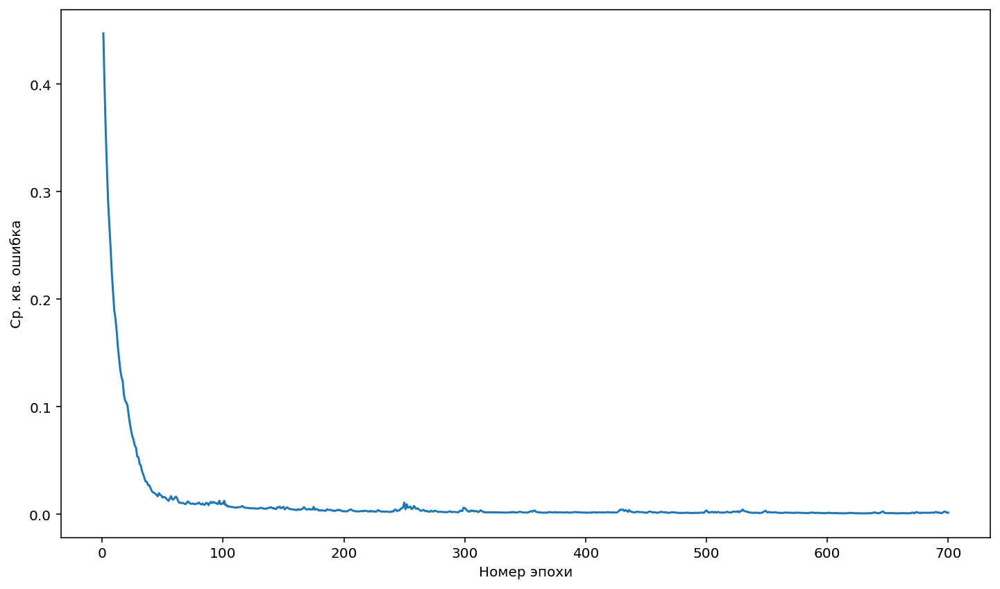

In [50]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [51]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae_rnd.append(max_err_val)

Максимальная ошибка по модулю =  0.161606151563486


<ipython-input-52-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


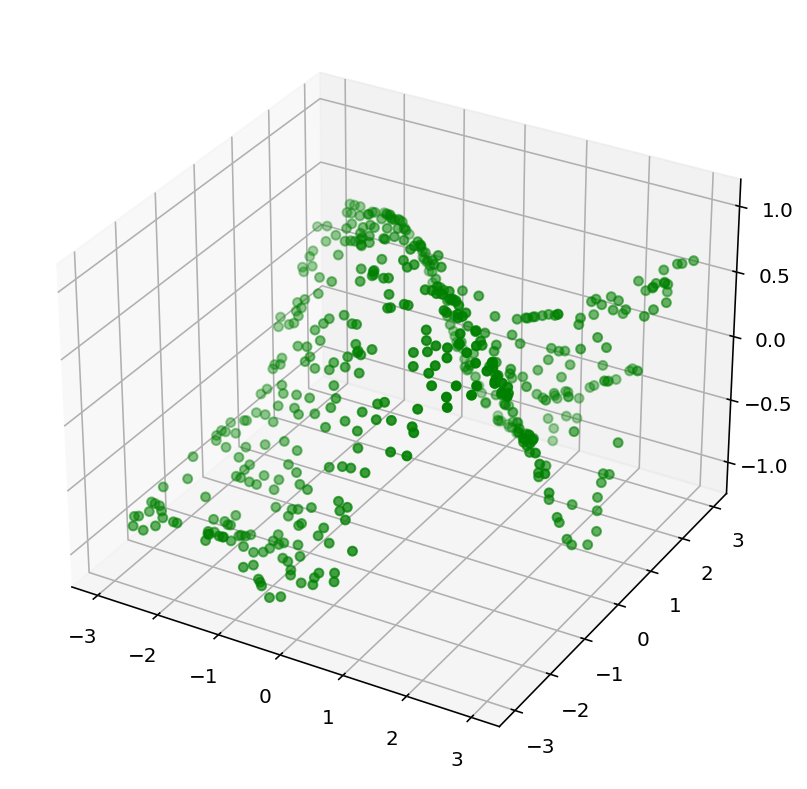

In [52]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


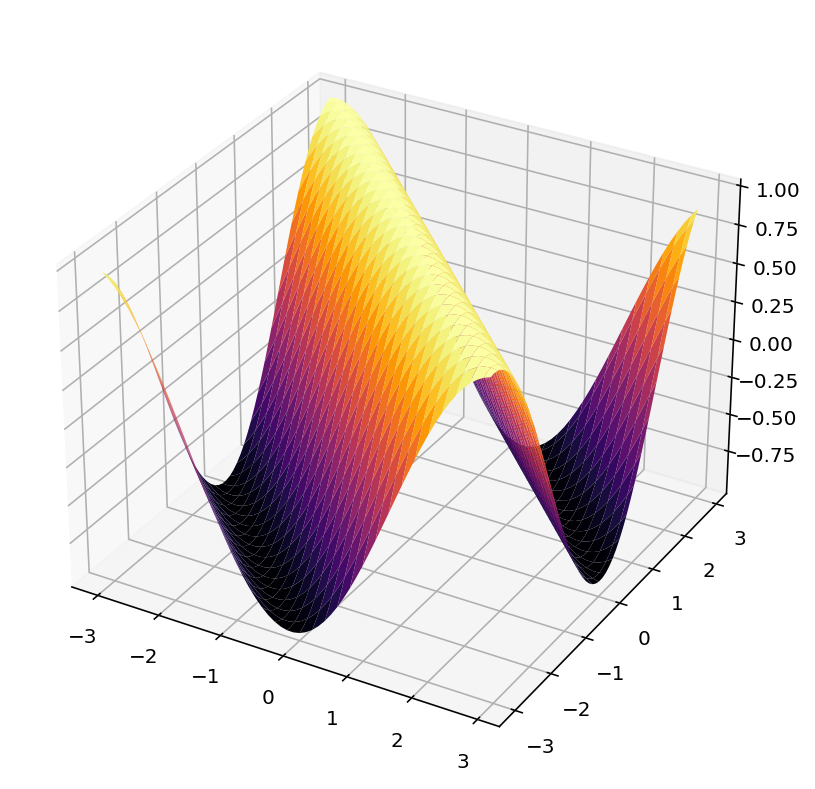

In [53]:
func_draw()

In [54]:
n = 15
xy=[] 
zz=[] 
x, y = get_random_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])
#history = model()

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse_rnd.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


1/8 [==>...........................] - ETA: 3s - loss: 0.3210

8/8 [==============================] - 0s 3ms/step - loss: 0.4136


Epoch 2/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3758

8/8 [==============================] - 0s 2ms/step - loss: 0.4033


Epoch 3/700
1/8 [==>...........................] - ETA: 0s - loss: 0.3352

8/8 [==============================] - 0s 2ms/step - loss: 0.3463


Epoch 4/700
1/8 [==>...........................] - ETA: 0s - loss: 0.4066

3/8 [==========>...................] - ETA: 0s - loss: 0.3586

4/8 [==============>...............] - ETA: 0s - loss: 0.3448

5/8 [=================>............] - ETA: 0s - loss: 0.3361

8/8 [==============================] - 1s 80ms/step - loss: 0.3220


Epoch 5/700


1/8 [==>...........................] - ETA: 0s - loss: 0.2954

7/8 [=========================>....] - ETA: 0s - loss: 0.2804

8/8 [==============================] - 0s 15ms/step - loss: 0.2779


Epoch 6/700
1/8 [==>...........................] - ETA: 0s - loss: 0.2964

8/8 [==============================] - 0s 3ms/step - loss: 0.2440


Epoch 7/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1945

8/8 [==============================] - 0s 2ms/step - loss: 0.2203


Epoch 8/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1839

8/8 [==============================] - 0s 2ms/step - loss: 0.1843


Epoch 9/700
1/8 [==>...........................] - ETA: 0s - loss: 0.2140

8/8 [==============================] - 0s 2ms/step - loss: 0.1728


Epoch 10/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1401

2/8 [======>.......................] - ETA: 0s - loss: 0.1348

8/8 [==============================] - 0s 12ms/step - loss: 0.1445


Epoch 11/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1339

7/8 [=========================>....] - ETA: 0s - loss: 0.1457

8/8 [==============================] - 0s 9ms/step - loss: 0.1438


Epoch 12/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1821

8/8 [==============================] - 0s 2ms/step - loss: 0.1441


Epoch 13/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0719

8/8 [==============================] - 0s 2ms/step - loss: 0.1100


Epoch 14/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1871

8/8 [==============================] - 0s 2ms/step - loss: 0.1368


Epoch 15/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0573

8/8 [==============================] - 0s 2ms/step - loss: 0.0953


Epoch 16/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0785

4/8 [==============>...............] - ETA: 0s - loss: 0.0935

8/8 [==============================] - 0s 9ms/step - loss: 0.0999


Epoch 17/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1167

8/8 [==============================] - 0s 3ms/step - loss: 0.0978


Epoch 18/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1494

8/8 [==============================] - 0s 2ms/step - loss: 0.1018


Epoch 19/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0519

8/8 [==============================] - 0s 2ms/step - loss: 0.0810


Epoch 20/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0664

8/8 [==============================] - 0s 1ms/step - loss: 0.0845


Epoch 21/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0625

2/8 [======>.......................] - ETA: 0s - loss: 0.0778

8/8 [==============================] - 0s 9ms/step - loss: 0.0895


Epoch 22/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0736

8/8 [==============================] - 0s 1ms/step - loss: 0.0794


Epoch 23/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0706

8/8 [==============================] - 0s 2ms/step - loss: 0.0846


Epoch 24/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0574

8/8 [==============================] - 0s 2ms/step - loss: 0.0753


Epoch 25/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0673

8/8 [==============================] - 0s 3ms/step - loss: 0.0829


Epoch 26/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1024

8/8 [==============================] - 0s 2ms/step - loss: 0.0869


Epoch 27/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0941

8/8 [==============================] - 0s 2ms/step - loss: 0.0846


Epoch 28/700


1/8 [==>...........................] - ETA: 0s - loss: 0.1055

8/8 [==============================] - 0s 2ms/step - loss: 0.0813


Epoch 29/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0514

8/8 [==============================] - 0s 2ms/step - loss: 0.0670


Epoch 30/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1118

8/8 [==============================] - 0s 1ms/step - loss: 0.0792


Epoch 31/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0335

8/8 [==============================] - 0s 2ms/step - loss: 0.0562


Epoch 32/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0440

6/8 [=====================>........] - ETA: 0s - loss: 0.0579

8/8 [==============================] - 0s 10ms/step - loss: 0.0628


Epoch 33/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0502

8/8 [==============================] - 0s 2ms/step - loss: 0.0744


Epoch 34/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1356

8/8 [==============================] - 0s 2ms/step - loss: 0.0793


Epoch 35/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0947

2/8 [======>.......................] - ETA: 0s - loss: 0.0881

8/8 [==============================] - 0s 13ms/step - loss: 0.0750


Epoch 36/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0519

8/8 [==============================] - 0s 3ms/step - loss: 0.0597


Epoch 37/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0349

8/8 [==============================] - 0s 2ms/step - loss: 0.0704


Epoch 38/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1017

8/8 [==============================] - 0s 4ms/step - loss: 0.0763


Epoch 39/700


1/8 [==>...........................] - ETA: 2s - loss: 0.0323

4/8 [==============>...............] - ETA: 0s - loss: 0.0378

8/8 [==============================] - 0s 15ms/step - loss: 0.0495


Epoch 40/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0385

4/8 [==============>...............] - ETA: 0s - loss: 0.0572

8/8 [==============================] - 0s 15ms/step - loss: 0.0608


Epoch 41/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0962

5/8 [=================>............] - ETA: 0s - loss: 0.0664

8/8 [==============================] - 0s 14ms/step - loss: 0.0636


Epoch 42/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0722

8/8 [==============================] - ETA: 0s - loss: 0.0607

8/8 [==============================] - 0s 13ms/step - loss: 0.0608


Epoch 43/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0724

8/8 [==============================] - 0s 2ms/step - loss: 0.0603


Epoch 44/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0448

8/8 [==============================] - 0s 2ms/step - loss: 0.0577


Epoch 45/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0683

8/8 [==============================] - 0s 2ms/step - loss: 0.0620


Epoch 46/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0830

8/8 [==============================] - 0s 2ms/step - loss: 0.0547


Epoch 47/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0293

8/8 [==============================] - 0s 2ms/step - loss: 0.0510


Epoch 48/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0209

8/8 [==============================] - 0s 2ms/step - loss: 0.0534


Epoch 49/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0815

5/8 [=================>............] - ETA: 0s - loss: 0.0592

8/8 [==============================] - 0s 8ms/step - loss: 0.0564


Epoch 50/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0457

6/8 [=====================>........] - ETA: 0s - loss: 0.0539

8/8 [==============================] - 0s 9ms/step - loss: 0.0536


Epoch 51/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0277

8/8 [==============================] - 0s 2ms/step - loss: 0.0458


Epoch 52/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0504

8/8 [==============================] - 0s 2ms/step - loss: 0.0529


Epoch 53/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0267

7/8 [=========================>....] - ETA: 0s - loss: 0.0465

8/8 [==============================] - 0s 10ms/step - loss: 0.0474


Epoch 54/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0979

8/8 [==============================] - 0s 1ms/step - loss: 0.0572


Epoch 55/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0454

3/8 [==========>...................] - ETA: 0s - loss: 0.0497

8/8 [==============================] - 0s 9ms/step - loss: 0.0474


Epoch 56/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0902

4/8 [==============>...............] - ETA: 0s - loss: 0.0602

8/8 [==============================] - 0s 10ms/step - loss: 0.0542


Epoch 57/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0529

8/8 [==============================] - 0s 2ms/step - loss: 0.0488


Epoch 58/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0710

8/8 [==============================] - 0s 2ms/step - loss: 0.0602


Epoch 59/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0552

3/8 [==========>...................] - ETA: 0s - loss: 0.0546

8/8 [==============================] - 0s 9ms/step - loss: 0.0527


Epoch 60/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0645

4/8 [==============>...............] - ETA: 0s - loss: 0.0595

8/8 [==============================] - 0s 11ms/step - loss: 0.0580


Epoch 61/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0408

2/8 [======>.......................] - ETA: 0s - loss: 0.0405

8/8 [==============================] - 0s 9ms/step - loss: 0.0538


Epoch 62/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0423

2/8 [======>.......................] - ETA: 0s - loss: 0.0386

8/8 [==============================] - 0s 11ms/step - loss: 0.0454


Epoch 63/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0180

5/8 [=================>............] - ETA: 0s - loss: 0.0349

8/8 [==============================] - 0s 8ms/step - loss: 0.0400


Epoch 64/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0433

3/8 [==========>...................] - ETA: 0s - loss: 0.0549

7/8 [=========================>....] - ETA: 0s - loss: 0.0540

8/8 [==============================] - 0s 28ms/step - loss: 0.0530


Epoch 65/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0688

2/8 [======>.......................] - ETA: 0s - loss: 0.0653

8/8 [==============================] - 0s 15ms/step - loss: 0.0578


Epoch 66/700
1/8 [==>...........................] - ETA: 0s - loss: 0.1063

7/8 [=========================>....] - ETA: 0s - loss: 0.0680

8/8 [==============================] - 0s 13ms/step - loss: 0.0640


Epoch 67/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0657

8/8 [==============================] - 0s 4ms/step - loss: 0.0542


Epoch 68/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0513

8/8 [==============================] - 0s 4ms/step - loss: 0.0542


Epoch 69/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0261

7/8 [=========================>....] - ETA: 0s - loss: 0.0549

8/8 [==============================] - 0s 14ms/step - loss: 0.0540


Epoch 70/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0272

8/8 [==============================] - ETA: 0s - loss: 0.0371

8/8 [==============================] - 0s 11ms/step - loss: 0.0383


Epoch 71/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0302

8/8 [==============================] - 0s 2ms/step - loss: 0.0468


Epoch 72/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0323

8/8 [==============================] - 0s 2ms/step - loss: 0.0392


Epoch 73/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0768

8/8 [==============================] - 0s 1ms/step - loss: 0.0474


Epoch 74/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0121

8/8 [==============================] - 0s 2ms/step - loss: 0.0353


Epoch 75/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0120

6/8 [=====================>........] - ETA: 0s - loss: 0.0296

8/8 [==============================] - 0s 10ms/step - loss: 0.0345


Epoch 76/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0899

8/8 [==============================] - 0s 2ms/step - loss: 0.0555


Epoch 77/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0810

8/8 [==============================] - 0s 1ms/step - loss: 0.0483


Epoch 78/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0521

2/8 [======>.......................] - ETA: 0s - loss: 0.0526

8/8 [==============================] - 0s 9ms/step - loss: 0.0443


Epoch 79/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0262

6/8 [=====================>........] - ETA: 0s - loss: 0.0385

8/8 [==============================] - 0s 10ms/step - loss: 0.0399


Epoch 80/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0536

8/8 [==============================] - 0s 2ms/step - loss: 0.0445


Epoch 81/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0541

8/8 [==============================] - 0s 1ms/step - loss: 0.0466


Epoch 82/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0557

5/8 [=================>............] - ETA: 0s - loss: 0.0454

8/8 [==============================] - 0s 10ms/step - loss: 0.0439


Epoch 83/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0290

8/8 [==============================] - ETA: 0s - loss: 0.0403

8/8 [==============================] - 0s 10ms/step - loss: 0.0404


Epoch 84/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0459

8/8 [==============================] - 0s 2ms/step - loss: 0.0404


Epoch 85/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0241

8/8 [==============================] - 0s 2ms/step - loss: 0.0369


Epoch 86/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0403

8/8 [==============================] - 0s 2ms/step - loss: 0.0408


Epoch 87/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0302

4/8 [==============>...............] - ETA: 0s - loss: 0.0314

8/8 [==============================] - 0s 10ms/step - loss: 0.0361


Epoch 88/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0170

7/8 [=========================>....] - ETA: 0s - loss: 0.0292

8/8 [==============================] - 0s 14ms/step - loss: 0.0316


Epoch 89/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0390

2/8 [======>.......................] - ETA: 1s - loss: 0.0444

8/8 [==============================] - ETA: 0s - loss: 0.0422

8/8 [==============================] - 0s 42ms/step - loss: 0.0419


Epoch 90/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0204

8/8 [==============================] - 0s 2ms/step - loss: 0.0308


Epoch 91/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0505

8/8 [==============================] - 0s 3ms/step - loss: 0.0370


Epoch 92/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0405

2/8 [======>.......................] - ETA: 1s - loss: 0.0353

8/8 [==============================] - 0s 27ms/step - loss: 0.0331


Epoch 93/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0289

2/8 [======>.......................] - ETA: 0s - loss: 0.0314

8/8 [==============================] - 0s 11ms/step - loss: 0.0327


Epoch 94/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0477

8/8 [==============================] - 0s 2ms/step - loss: 0.0429


Epoch 95/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0675

2/8 [======>.......................] - ETA: 0s - loss: 0.0560

8/8 [==============================] - 0s 10ms/step - loss: 0.0440


Epoch 96/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0262

3/8 [==========>...................] - ETA: 0s - loss: 0.0310

8/8 [==============================] - 0s 11ms/step - loss: 0.0357


Epoch 97/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0243

7/8 [=========================>....] - ETA: 0s - loss: 0.0296

8/8 [==============================] - 0s 10ms/step - loss: 0.0306


Epoch 98/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0351

8/8 [==============================] - 0s 2ms/step - loss: 0.0375


Epoch 99/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0395

8/8 [==============================] - 0s 2ms/step - loss: 0.0407


Epoch 100/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0395

2/8 [======>.......................] - ETA: 0s - loss: 0.0331

8/8 [==============================] - 0s 10ms/step - loss: 0.0338


Epoch 101/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0333

6/8 [=====================>........] - ETA: 0s - loss: 0.0385

8/8 [==============================] - 0s 12ms/step - loss: 0.0383


Epoch 102/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0197

8/8 [==============================] - ETA: 0s - loss: 0.0313

8/8 [==============================] - 0s 9ms/step - loss: 0.0326


Epoch 103/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0383

8/8 [==============================] - 0s 2ms/step - loss: 0.0364


Epoch 104/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0289

2/8 [======>.......................] - ETA: 0s - loss: 0.0304

8/8 [==============================] - 0s 9ms/step - loss: 0.0335


Epoch 105/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0279

7/8 [=========================>....] - ETA: 0s - loss: 0.0318

8/8 [==============================] - 0s 10ms/step - loss: 0.0322


Epoch 106/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0220

6/8 [=====================>........] - ETA: 0s - loss: 0.0212

7/8 [=========================>....] - ETA: 0s - loss: 0.0225

8/8 [==============================] - 0s 28ms/step - loss: 0.0240


Epoch 107/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0565

2/8 [======>.......................] - ETA: 0s - loss: 0.0465

8/8 [==============================] - 0s 14ms/step - loss: 0.0350


Epoch 108/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0358

2/8 [======>.......................] - ETA: 0s - loss: 0.0331

3/8 [==========>...................] - ETA: 0s - loss: 0.0354

8/8 [==============================] - 0s 27ms/step - loss: 0.0332


Epoch 109/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0402

8/8 [==============================] - ETA: 0s - loss: 0.0298

8/8 [==============================] - 0s 14ms/step - loss: 0.0294


Epoch 110/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0342

6/8 [=====================>........] - ETA: 0s - loss: 0.0297

8/8 [==============================] - 0s 13ms/step - loss: 0.0298


Epoch 111/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0368

6/8 [=====================>........] - ETA: 0s - loss: 0.0370

8/8 [==============================] - 0s 11ms/step - loss: 0.0379


Epoch 112/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0179

8/8 [==============================] - 0s 2ms/step - loss: 0.0264


Epoch 113/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0285

8/8 [==============================] - 0s 2ms/step - loss: 0.0440


Epoch 114/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0487

8/8 [==============================] - 0s 2ms/step - loss: 0.0340


Epoch 115/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0359

8/8 [==============================] - 0s 3ms/step - loss: 0.0333


Epoch 116/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0293

8/8 [==============================] - 0s 2ms/step - loss: 0.0271


Epoch 117/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0099

4/8 [==============>...............] - ETA: 0s - loss: 0.0179

8/8 [==============================] - 0s 10ms/step - loss: 0.0236


Epoch 118/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0221

2/8 [======>.......................] - ETA: 0s - loss: 0.0200

8/8 [==============================] - 0s 14ms/step - loss: 0.0234


Epoch 119/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0158

8/8 [==============================] - 0s 2ms/step - loss: 0.0193


Epoch 120/700
1/8 [==>...........................] - ETA: 1s - loss: 0.0080

5/8 [=================>............] - ETA: 0s - loss: 0.0140

8/8 [==============================] - 0s 14ms/step - loss: 0.0177


Epoch 121/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0051

5/8 [=================>............] - ETA: 0s - loss: 0.0121

8/8 [==============================] - 0s 16ms/step - loss: 0.0165


Epoch 122/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0169

2/8 [======>.......................] - ETA: 0s - loss: 0.0186



4/8 [==============>...............] - ETA: 0s - loss: 0.0176

8/8 [==============================] - 0s 33ms/step - loss: 0.0200


Epoch 123/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0210

2/8 [======>.......................] - ETA: 0s - loss: 0.0219

8/8 [==============================] - 0s 12ms/step - loss: 0.0236


Epoch 124/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0230

2/8 [======>.......................] - ETA: 0s - loss: 0.0231

8/8 [==============================] - 0s 11ms/step - loss: 0.0225


Epoch 125/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0463

7/8 [=========================>....] - ETA: 0s - loss: 0.0300

8/8 [==============================] - 0s 11ms/step - loss: 0.0288


Epoch 126/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0091

2/8 [======>.......................] - ETA: 0s - loss: 0.0096

8/8 [==============================] - 0s 11ms/step - loss: 0.0181


Epoch 127/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0085

8/8 [==============================] - 0s 2ms/step - loss: 0.0184


Epoch 128/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0356

3/8 [==========>...................] - ETA: 0s - loss: 0.0302

8/8 [==============================] - 0s 13ms/step - loss: 0.0238


Epoch 129/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0079

2/8 [======>.......................] - ETA: 1s - loss: 0.0117

8/8 [==============================] - 0s 44ms/step - loss: 0.0181


Epoch 130/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0468

3/8 [==========>...................] - ETA: 0s - loss: 0.0365

8/8 [==============================] - 0s 12ms/step - loss: 0.0326


Epoch 131/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0097

8/8 [==============================] - ETA: 0s - loss: 0.0181

8/8 [==============================] - 0s 14ms/step - loss: 0.0184


Epoch 132/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0210

3/8 [==========>...................] - ETA: 0s - loss: 0.0229

8/8 [==============================] - 0s 16ms/step - loss: 0.0238


Epoch 133/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0255

2/8 [======>.......................] - ETA: 0s - loss: 0.0227

8/8 [==============================] - 0s 9ms/step - loss: 0.0271


Epoch 134/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0133

5/8 [=================>............] - ETA: 0s - loss: 0.0250

8/8 [==============================] - 0s 11ms/step - loss: 0.0237


Epoch 135/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0208

4/8 [==============>...............] - ETA: 0s - loss: 0.0199

8/8 [==============================] - 0s 11ms/step - loss: 0.0206


Epoch 136/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0307

6/8 [=====================>........] - ETA: 0s - loss: 0.0270

8/8 [==============================] - 0s 10ms/step - loss: 0.0247


Epoch 137/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0160

8/8 [==============================] - ETA: 0s - loss: 0.0150

8/8 [==============================] - 0s 10ms/step - loss: 0.0154


Epoch 138/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0160

4/8 [==============>...............] - ETA: 0s - loss: 0.0211

8/8 [==============================] - 0s 14ms/step - loss: 0.0192


Epoch 139/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0084

2/8 [======>.......................] - ETA: 0s - loss: 0.0150

8/8 [==============================] - 0s 16ms/step - loss: 0.0182


Epoch 140/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0204

5/8 [=================>............] - ETA: 0s - loss: 0.0144

6/8 [=====================>........] - ETA: 0s - loss: 0.0150

8/8 [==============================] - 0s 28ms/step - loss: 0.0155


Epoch 141/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0119

7/8 [=========================>....] - ETA: 0s - loss: 0.0119

8/8 [==============================] - 0s 16ms/step - loss: 0.0129


Epoch 142/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0210

4/8 [==============>...............] - ETA: 0s - loss: 0.0149

8/8 [==============================] - 0s 11ms/step - loss: 0.0155


Epoch 143/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0376

5/8 [=================>............] - ETA: 0s - loss: 0.0241

6/8 [=====================>........] - ETA: 0s - loss: 0.0231

8/8 [==============================] - 0s 31ms/step - loss: 0.0209


Epoch 144/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0131

8/8 [==============================] - 0s 2ms/step - loss: 0.0149


Epoch 145/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0117

3/8 [==========>...................] - ETA: 0s - loss: 0.0102

8/8 [==============================] - 0s 10ms/step - loss: 0.0125


Epoch 146/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0087

6/8 [=====================>........] - ETA: 0s - loss: 0.0173

8/8 [==============================] - 0s 14ms/step - loss: 0.0169


Epoch 147/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0053

2/8 [======>.......................] - ETA: 1s - loss: 0.0075

3/8 [==========>...................] - ETA: 0s - loss: 0.0093

8/8 [==============================] - 0s 42ms/step - loss: 0.0132


Epoch 148/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0296

2/8 [======>.......................] - ETA: 1s - loss: 0.0227

8/8 [==============================] - 0s 28ms/step - loss: 0.0181


Epoch 149/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0115

8/8 [==============================] - ETA: 0s - loss: 0.0171

8/8 [==============================] - 0s 14ms/step - loss: 0.0170


Epoch 150/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0114

8/8 [==============================] - 0s 4ms/step - loss: 0.0136


Epoch 151/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 2ms/step - loss: 0.0179


Epoch 152/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0264

8/8 [==============================] - 0s 2ms/step - loss: 0.0282


Epoch 153/700


1/8 [==>...........................] - ETA: 2s - loss: 0.0363

2/8 [======>.......................] - ETA: 1s - loss: 0.0315

8/8 [==============================] - 1s 32ms/step - loss: 0.0212


Epoch 154/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0270

6/8 [=====================>........] - ETA: 0s - loss: 0.0195

8/8 [==============================] - 0s 14ms/step - loss: 0.0185


Epoch 155/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0253

2/8 [======>.......................] - ETA: 0s - loss: 0.0228

8/8 [==============================] - 0s 11ms/step - loss: 0.0187


Epoch 156/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0119

5/8 [=================>............] - ETA: 0s - loss: 0.0148

6/8 [=====================>........] - ETA: 0s - loss: 0.0148

8/8 [==============================] - 0s 22ms/step - loss: 0.0151


Epoch 157/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0234

8/8 [==============================] - 0s 6ms/step - loss: 0.0169


Epoch 158/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

3/8 [==========>...................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 12ms/step - loss: 0.0102


Epoch 159/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0295

4/8 [==============>...............] - ETA: 0s - loss: 0.0225

8/8 [==============================] - 0s 10ms/step - loss: 0.0194


Epoch 160/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0115

8/8 [==============================] - 0s 6ms/step - loss: 0.0129


Epoch 161/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0436

8/8 [==============================] - 0s 3ms/step - loss: 0.0226


Epoch 162/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0142

8/8 [==============================] - 0s 5ms/step - loss: 0.0140


Epoch 163/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0151

7/8 [=========================>....] - ETA: 0s - loss: 0.0139

8/8 [==============================] - ETA: 0s - loss: 0.0140

8/8 [==============================] - 0s 63ms/step - loss: 0.0140


Epoch 164/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0254

8/8 [==============================] - 0s 4ms/step - loss: 0.0175


Epoch 165/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0057

3/8 [==========>...................] - ETA: 0s - loss: 0.0117

8/8 [==============================] - 0s 14ms/step - loss: 0.0132


Epoch 166/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0292

5/8 [=================>............] - ETA: 0s - loss: 0.0157

7/8 [=========================>....] - ETA: 0s - loss: 0.0148

8/8 [==============================] - ETA: 0s - loss: 0.0147

8/8 [==============================] - 0s 42ms/step - loss: 0.0147


Epoch 167/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0168

8/8 [==============================] - ETA: 0s - loss: 0.0120

8/8 [==============================] - 0s 9ms/step - loss: 0.0123


Epoch 168/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0049

5/8 [=================>............] - ETA: 0s - loss: 0.0105

8/8 [==============================] - 0s 11ms/step - loss: 0.0121


Epoch 169/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0078

7/8 [=========================>....] - ETA: 0s - loss: 0.0140

8/8 [==============================] - 0s 9ms/step - loss: 0.0139


Epoch 170/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0300

8/8 [==============================] - 0s 4ms/step - loss: 0.0167


Epoch 171/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0121

8/8 [==============================] - 0s 3ms/step - loss: 0.0135


Epoch 172/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0120

8/8 [==============================] - 0s 6ms/step - loss: 0.0137


Epoch 173/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0150

8/8 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 174/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0216

4/8 [==============>...............] - ETA: 0s - loss: 0.0207

8/8 [==============================] - 0s 10ms/step - loss: 0.0171


Epoch 175/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0050

7/8 [=========================>....] - ETA: 0s - loss: 0.0093

8/8 [==============================] - 0s 8ms/step - loss: 0.0102


Epoch 176/700


1/8 [==>...........................] - ETA: 2s - loss: 0.0113

4/8 [==============>...............] - ETA: 0s - loss: 0.0178

8/8 [==============================] - 0s 14ms/step - loss: 0.0158


Epoch 177/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0265

8/8 [==============================] - ETA: 0s - loss: 0.0162

8/8 [==============================] - 0s 7ms/step - loss: 0.0159


Epoch 178/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0087

3/8 [==========>...................] - ETA: 0s - loss: 0.0151

8/8 [==============================] - 0s 13ms/step - loss: 0.0175


Epoch 179/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0336

8/8 [==============================] - 0s 6ms/step - loss: 0.0207


Epoch 180/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0223

8/8 [==============================] - 0s 7ms/step - loss: 0.0161


Epoch 181/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0125

7/8 [=========================>....]

 - ETA: 0s - loss: 0.0137

8/8 [==============================] - ETA: 0s - loss: 0.0136

8/8 [==============================] - 0s 30ms/step - loss: 0.0136


Epoch 182/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0079

8/8 [==============================] - 0s 5ms/step - loss: 0.0118


Epoch 183/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0275

8/8 [==============================] - 0s 6ms/step - loss: 0.0162


Epoch 184/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0269

8/8 [==============================] - 0s 2ms/step - loss: 0.0163


Epoch 185/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0089

7/8 [=========================>....] - ETA: 0s - loss: 0.0146

8/8 [==============================] - 0s 13ms/step - loss: 0.0141


Epoch 186/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0243

8/8 [==============================] - 0s 6ms/step - loss: 0.0139


Epoch 187/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0101

3/8 [==========>...................] - ETA: 0s - loss: 0.0099

8/8 [==============================] - 0s 10ms/step - loss: 0.0114


Epoch 188/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0292

5/8 [=================>............] - ETA: 0s - loss: 0.0170

8/8 [==============================] - 0s 10ms/step - loss: 0.0149


Epoch 189/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0106

8/8 [==============================] - 0s 3ms/step - loss: 0.0111


Epoch 190/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0058

8/8 [==============================] - 0s 4ms/step - loss: 0.0107


Epoch 191/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

7/8 [=========================>....] - ETA: 0s - loss: 0.0114

8/8 [==============================] - 0s 29ms/step - loss: 0.0119


Epoch 192/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0303

4/8 [==============>...............] - ETA: 0s - loss: 0.0234

7/8 [=========================>....] - ETA: 0s - loss: 0.0196

8/8 [==============================] - 0s 26ms/step - loss: 0.0182


Epoch 193/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0088

3/8 [==========>...................] - ETA: 0s - loss: 0.0104

5/8 [=================>............] - ETA: 0s - loss: 0.0102

8/8 [==============================] - 0s 35ms/step - loss: 0.0112


Epoch 194/700


1/8 [==>...........................] - ETA: 1s - loss: 0.0025

8/8 [==============================] - 0s 6ms/step - loss: 0.0107


Epoch 195/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0110

7/8 [=========================>....] - ETA: 0s - loss: 0.0107

8/8 [==============================] - 0s 14ms/step - loss: 0.0111


Epoch 196/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0098

8/8 [==============================] - 0s 6ms/step - loss: 0.0145


Epoch 197/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0180

7/8 [=========================>....] - ETA: 0s - loss: 0.0164

8/8 [==============================] - 0s 11ms/step - loss: 0.0161


Epoch 198/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0235

7/8 [=========================>....] - ETA: 0s - loss: 0.0191

8/8 [==============================] - 0s 8ms/step - loss: 0.0189


Epoch 199/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0288

8/8 [==============================] - ETA: 0s - loss: 0.0216

8/8 [==============================] - 0s 9ms/step - loss: 0.0211


Epoch 200/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0170

5/8 [=================>............] - ETA: 0s - loss: 0.0174

8/8 [==============================] - 0s 11ms/step - loss: 0.0166


Epoch 201/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0197

3/8 [==========>...................] - ETA: 0s - loss: 0.0179

8/8 [==============================] - 0s 10ms/step - loss: 0.0173


Epoch 202/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0035

5/8 [=================>............] - ETA: 0s - loss: 0.0134

8/8 [==============================] - ETA: 0s - loss: 0.0135

8/8 [==============================] - 0s 29ms/step - loss: 0.0135


Epoch 203/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0105

7/8 [=========================>....] - ETA: 0s - loss: 0.0136

8/8 [==============================] - 0s 10ms/step - loss: 0.0134


Epoch 204/700


1/8 [==>...........................] - ETA: 1s - loss: 0.0075

5/8 [=================>............] - ETA: 0s - loss: 0.0088

8/8 [==============================] - 0s 11ms/step - loss: 0.0099


Epoch 205/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0123

8/8 [==============================] - 0s 6ms/step - loss: 0.0168


Epoch 206/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0084

2/8 [======>.......................] - ETA: 0s - loss: 0.0166

7/8 [=========================>....] - ETA: 0s - loss: 0.0198

8/8 [==============================] - ETA: 0s - loss: 0.0199

8/8 [==============================] - 0s 40ms/step - loss: 0.0201


Epoch 207/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0161

3/8 [==========>...................] - ETA: 0s - loss: 0.0238

8/8 [==============================] - 0s 11ms/step - loss: 0.0256


Epoch 208/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0232

8/8 [==============================] - 0s 5ms/step - loss: 0.0220


Epoch 209/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0168

8/8 [==============================] - 0s 4ms/step - loss: 0.0159


Epoch 210/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0080

8/8 [==============================] - 0s 3ms/step - loss: 0.0159


Epoch 211/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0093

8/8 [==============================] - 0s 3ms/step - loss: 0.0129


Epoch 212/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0112

8/8 [==============================] - 0s 4ms/step - loss: 0.0293


Epoch 213/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0461

6/8 [=====================>........] - ETA: 0s - loss: 0.0442

8/8 [==============================] - 0s 10ms/step - loss: 0.0449


Epoch 214/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0514

7/8 [=========================>....] - ETA: 0s - loss: 0.0327

8/8 [==============================] - 0s 9ms/step - loss: 0.0320


Epoch 215/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0123

6/8 [=====================>........] - ETA: 0s - loss: 0.0223

8/8 [==============================] - 0s 9ms/step - loss: 0.0235


Epoch 216/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0037

8/8 [==============================] - 0s 6ms/step - loss: 0.0152


Epoch 217/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0206

8/8 [==============================] - 0s 4ms/step - loss: 0.0172


Epoch 218/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

3/8 [==========>...................] - ETA: 0s - loss: 0.0087

8/8 [==============================] - 0s 13ms/step - loss: 0.0153


Epoch 219/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0191

3/8 [==========>...................] - ETA: 0s - loss: 0.0235

8/8 [==============================] - ETA: 0s - loss: 0.0237

8/8 [==============================] - 0s 25ms/step - loss: 0.0235


Epoch 220/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0065

2/8 [======>.......................] - ETA: 0s - loss: 0.0080

3/8 [==========>...................] - ETA: 0s - loss: 0.0100

4/8 [==============>...............] - ETA: 0s - loss: 0.0119

8/8 [==============================] - 0s 41ms/step - loss: 0.0149


Epoch 221/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0104

5/8 [=================>............] - ETA: 0s - loss: 0.0099

8/8 [==============================] - 0s 10ms/step - loss: 0.0125


Epoch 222/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0066

7/8 [=========================>....] - ETA: 0s - loss: 0.0167

8/8 [==============================] - 0s 10ms/step - loss: 0.0173


Epoch 223/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0190

8/8 [==============================] - 0s 3ms/step - loss: 0.0202


Epoch 224/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0310

8/8 [==============================] - 0s 3ms/step - loss: 0.0217


Epoch 225/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0147

8/8 [==============================] - ETA: 0s - loss: 0.0153

8/8 [==============================] - 0s 8ms/step - loss: 0.0155


Epoch 226/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0059

6/8 [=====================>........] - ETA: 0s - loss: 0.0183

8/8 [==============================] - 0s 9ms/step - loss: 0.0184


Epoch 227/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0035

6/8 [=====================>........] - ETA: 0s - loss: 0.0161

8/8 [==============================] - 0s 11ms/step - loss: 0.0162


Epoch 228/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0150

4/8 [==============>...............] - ETA: 0s - loss: 0.0155

8/8 [==============================] - 0s 11ms/step - loss: 0.0150


Epoch 229/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0136

4/8 [==============>...............] - ETA: 0s - loss: 0.0158

8/8 [==============================] - 0s 10ms/step - loss: 0.0159


Epoch 230/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0243



2/8 [======>.......................] - ETA: 0s - loss: 0.0246

8/8 [==============================] - 0s 10ms/step - loss: 0.0186


Epoch 231/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0037

3/8 [==========>...................] - ETA: 0s - loss: 0.0089

8/8 [==============================] - 0s 11ms/step - loss: 0.0117


Epoch 232/700

1/8 [==>...........................] - ETA: 3s - loss: 0.0299

2/8 [======>.......................] - ETA: 0s - loss: 0.0234

8/8 [==============================] - 1s 17ms/step - loss: 0.0161


Epoch 233/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0126

5/8 [=================>............] - ETA: 0s - loss: 0.0110

8/8 [==============================] - 0s 15ms/step - loss: 0.0118


Epoch 234/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0120

8/8 [==============================] - ETA: 0s - loss: 0.0136

8/8 [==============================] - 0s 13ms/step - loss: 0.0135


Epoch 235/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0061

7/8 [=========================>....] - ETA: 0s - loss: 0.0083

8/8 [==============================] - 0s 17ms/step - loss: 0.0092


Epoch 236/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 3ms/step - loss: 0.0101


Epoch 237/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0199

8/8 [==============================] - 0s 3ms/step - loss: 0.0134


Epoch 238/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0096

8/8 [==============================] - 0s 4ms/step - loss: 0.0115


Epoch 239/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 2ms/step - loss: 0.0086


Epoch 240/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0074

8/8 [==============================] - 0s 3ms/step - loss: 0.0095


Epoch 241/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0060

8/8 [==============================] - 0s 3ms/step - loss: 0.0117


Epoch 242/700
1/8 [==>...........................] - ETA: 0s - loss: 5.1805e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0112


Epoch 243/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0196

8/8 [==============================] - 0s 3ms/step - loss: 0.0123


Epoch 244/700


1/8 [==>...........................] - ETA: 0s - loss: 6.1175e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0085


Epoch 245/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0105

8/8 [==============================] - 0s 3ms/step - loss: 0.0124


Epoch 246/700


1/8 [==>...........................] - ETA: 2s - loss: 0.0094

2/8 [======>.......................] - ETA: 0s - loss: 0.0146

3/8 [==========>...................] - ETA: 0s - loss: 0.0153

6/8 [=====================>........] - ETA: 0s - loss: 0.0139

8/8 [==============================] - 1s 42ms/step - loss: 0.0129


Epoch 247/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0060

8/8 [==============================] - 0s 4ms/step - loss: 0.0094


Epoch 248/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0025

3/8 [==========>...................] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 16ms/step - loss: 0.0078


Epoch 249/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0099

4/8 [==============>...............] - ETA: 0s - loss: 0.0119

8/8 [==============================] - 0s 13ms/step - loss: 0.0111


Epoch 250/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0145

8/8 [==============================] - 0s 2ms/step - loss: 0.0122


Epoch 251/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0181

8/8 [==============================] - 0s 4ms/step - loss: 0.0104


Epoch 252/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0114

8/8 [==============================] - 0s 3ms/step - loss: 0.0098


Epoch 253/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0097

8/8 [==============================] - 0s 3ms/step - loss: 0.0113


Epoch 254/700
1/8 [==>...........................] - ETA: 0s - loss: 8.1889e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0089


Epoch 255/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0267

8/8 [==============================] - 0s 2ms/step - loss: 0.0127


Epoch 256/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0040

8/8 [==============================] - 0s 2ms/step - loss: 0.0091


Epoch 257/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0085

8/8 [==============================] - 0s 2ms/step - loss: 0.0100


Epoch 258/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0129

3/8 [==========>...................] - ETA: 0s - loss: 0.0100

8/8 [==============================] - 0s 10ms/step - loss: 0.0087


Epoch 259/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

7/8 [=========================>....] - ETA: 0s - loss: 0.0057

8/8 [==============================] - 0s 11ms/step - loss: 0.0064


Epoch 260/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0030

2/8 [======>.......................] - ETA: 0s - loss: 0.0042

8/8 [==============================] - 0s 12ms/step - loss: 0.0068


Epoch 261/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0067

3/8 [==========>...................] - ETA: 0s - loss: 0.0076

4/8 [==============>...............] - ETA: 0s - loss: 0.0084

5/8 [=================>............] - ETA: 0s - loss: 0.0087

8/8 [==============================] - 0s 59ms/step - loss: 0.0091


Epoch 262/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0088

2/8 [======>.......................] - ETA: 0s - loss: 0.0083

8/8 [==============================] - 0s 12ms/step - loss: 0.0077


Epoch 263/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0121

2/8 [======>.......................] - ETA: 0s - loss: 0.0122

4/8 [==============>...............] - ETA: 0s - loss: 0.0105

8/8 [==============================] - 0s 29ms/step - loss: 0.0097


Epoch 264/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0052

8/8 [==============================] - 0s 2ms/step - loss: 0.0081


Epoch 265/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0063

8/8 [==============================] - 0s 2ms/step - loss: 0.0065


Epoch 266/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0076

8/8 [==============================] - 0s 2ms/step - loss: 0.0152


Epoch 267/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0186

2/8 [======>.......................] - ETA: 0s - loss: 0.0176

8/8 [==============================] - 0s 11ms/step - loss: 0.0213


Epoch 268/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0027

2/8 [======>.......................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - 0s 10ms/step - loss: 0.0083


Epoch 269/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0121

4/8 [==============>...............] - ETA: 0s - loss: 0.0086

8/8 [==============================] - 0s 10ms/step - loss: 0.0083


Epoch 270/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0051

6/8 [=====================>........] - ETA: 0s - loss: 0.0081

8/8 [==============================] - 0s 11ms/step - loss: 0.0081


Epoch 271/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0110

8/8 [==============================] - 0s 1ms/step - loss: 0.0093


Epoch 272/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0089

8/8 [==============================] - 0s 2ms/step - loss: 0.0081


Epoch 273/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0055


Epoch 274/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0157

8/8 [==============================] - 0s 2ms/step - loss: 0.0088


Epoch 275/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0062

2/8 [======>.......................] - ETA: 0s - loss: 0.0062

8/8 [==============================] - 0s 11ms/step - loss: 0.0068


Epoch 276/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0088

2/8 [======>.......................] - ETA: 1s - loss: 0.0089

8/8 [==============================] - 0s 31ms/step - loss: 0.0082


Epoch 277/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0263

7/8 [=========================>....] - ETA: 0s - loss: 0.0119

8/8 [==============================] - 0s 15ms/step - loss: 0.0107


Epoch 278/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0042

8/8 [==============================] - 0s 2ms/step - loss: 0.0066


Epoch 279/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0132

8/8 [==============================] - 0s 2ms/step - loss: 0.0090


Epoch 280/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0153

7/8 [=========================>....] - ETA: 0s - loss: 0.0094

8/8 [==============================] - 0s 12ms/step - loss: 0.0088


Epoch 281/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0099

8/8 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 282/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0056

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 283/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0091

8/8 [==============================] - 0s 2ms/step - loss: 0.0080


Epoch 284/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0029

8/8 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 285/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0086

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 286/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0051

2/8 [======>.......................] - ETA: 0s - loss: 0.0061

8/8 [==============================] - 0s 11ms/step - loss: 0.0059


Epoch 287/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0099

3/8 [==========>...................] - ETA: 0s - loss: 0.0082

8/8 [==============================] - 0s 10ms/step - loss: 0.0064


Epoch 288/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

2/8 [======>.......................] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 12ms/step - loss: 0.0045


Epoch 289/700


1/8 [==>...........................] - ETA: 0s - loss: 8.7279e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0133


Epoch 290/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0115

8/8 [==============================] - 0s 2ms/step - loss: 0.0092


Epoch 291/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0129

8/8 [==============================] - 0s 2ms/step - loss: 0.0079


Epoch 292/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0074

8/8 [==============================] - 0s 2ms/step - loss: 0.0060


Epoch 293/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0032

8/8 [==============================] - 0s 2ms/step - loss: 0.0062


Epoch 294/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 295/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0058

8/8 [==============================] - 0s 1ms/step - loss: 0.0054


Epoch 296/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0117

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 297/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 7ms/step - loss: 0.0041


Epoch 298/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 1ms/step - loss: 0.0026


Epoch 299/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 300/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 301/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0054

8/8 [==============================] - 0s 1ms/step - loss: 0.0037


Epoch 302/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 303/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 304/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - ETA: 0s - loss: 0.0031

8/8 [==============================] - 0s 7ms/step - loss: 0.0032


Epoch 305/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0067

8/8 [==============================] - 0s 3ms/step - loss: 0.0036


Epoch 306/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 2ms/step - loss: 0.0025


Epoch 307/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 308/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 5ms/step - loss: 0.0022


Epoch 309/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 310/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 6ms/step - loss: 0.0121


Epoch 311/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0028


Epoch 312/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0052

8/8 [==============================] - 0s 2ms/step - loss: 0.0032


Epoch 313/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0072

8/8 [==============================] - 0s 2ms/step - loss: 0.0037


Epoch 314/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 315/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 316/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 317/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 6ms/step - loss: 0.0020


Epoch 318/700
1/8 [==>...........................] - ETA: 0s - loss: 7.5791e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 319/700
1/8 [==>...........................] - ETA: 0s - loss: 5.1681e-04

8/8 [==============================] - ETA: 0s - loss: 0.0014    

8/8 [==============================] - 0s 8ms/step - loss: 0.0015


Epoch 320/700
1/8 [==>...........................] - ETA: 0s - loss: 6.9664e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 321/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 6ms/step - loss: 0.0021


Epoch 322/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 323/700
1/8 [==>...........................] - ETA: 0s - loss: 6.3544e-04

8/8 [==============================] - 0s 5ms/step - loss: 0.0011


Epoch 324/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 325/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 326/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 327/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2301e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 328/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 329/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3631e-04

8/8 [==============================] - 0s 1ms/step - loss: 9.1523e-04


Epoch 330/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 331/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 332/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6157e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.7133e-04


Epoch 333/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 334/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 8.5785e-04


Epoch 335/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6565e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.3684e-04


Epoch 336/700


1/8 [==>...........................] - ETA: 0s - loss: 6.4231e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 337/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 338/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 339/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 340/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9901e-04

6/8 [=====================>........] - ETA: 0s - loss: 6.1128e-04

8/8 [==============================] - 0s 8ms/step - loss: 6.0166e-04


Epoch 341/700
1/8 [==>...........................] - ETA: 0s - loss: 5.4553e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 342/700
1/8 [==>...........................] - ETA: 0s - loss: 6.4163e-04

8/8 [==============================] - 0s 5ms/step - loss: 7.9547e-04


Epoch 343/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 8.5062e-04


Epoch 344/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1734e-04

8/8 [==============================] - 0s 6ms/step - loss: 0.0012


Epoch 345/700
1/8 [==>...........................] - ETA: 0s - loss: 7.6491e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 346/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 7ms/step - loss: 0.0021


Epoch 347/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 4ms/step - loss: 0.0017


Epoch 348/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 5ms/step - loss: 0.0016


Epoch 349/700


1/8 [==>...........................] - ETA: 0s - loss: 4.6789e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.4393e-04


Epoch 350/700
1/8 [==>...........................] - ETA: 0s - loss: 6.4693e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 351/700
1/8 [==>...........................] - ETA: 0s - loss: 7.5675e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 352/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8187e-04

8/8 [==============================] - 0s 6ms/step - loss: 9.6243e-04


Epoch 353/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 9.3307e-04


Epoch 354/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0214e-04

8/8 [==============================] - 0s 5ms/step - loss: 4.7690e-04


Epoch 355/700
1/8 [==>...........................] - ETA: 0s - loss: 8.3143e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.9814e-04


Epoch 356/700


1/8 [==>...........................] - ETA: 0s - loss: 5.0313e-04

8/8 [==============================] - 0s 6ms/step - loss: 5.2259e-04


Epoch 357/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 6.4884e-04


Epoch 358/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7993e-04

8/8 [==============================] - 0s 6ms/step - loss: 6.9717e-04


Epoch 359/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 7.9325e-04


Epoch 360/700
1/8 [==>...........................] - ETA: 0s - loss: 2.5282e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.3878e-04


Epoch 361/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3735e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.8970e-04


Epoch 362/700
1/8 [==>...........................] - ETA: 0s - loss: 4.9063e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.2638e-04


Epoch 363/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7174e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.2777e-04


Epoch 364/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 365/700


1/8 [==>...........................] - ETA: 0s - loss: 6.6586e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.1656e-04


Epoch 366/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8583e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.6380e-04


Epoch 367/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0184e-04

8/8 [==============================] - 0s 1ms/step - loss: 9.7009e-04


Epoch 368/700
1/8 [==>...........................] - ETA: 0s - loss: 9.9333e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.3440e-04


Epoch 369/700
1/8 [==>...........................] - ETA: 0s - loss: 8.4801e-04

8/8 [==============================] - 0s 7ms/step - loss: 7.3218e-04


Epoch 370/700
1/8 [==>...........................] - ETA: 0s - loss: 9.8257e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 371/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 6ms/step - loss: 0.0013


Epoch 372/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0051


Epoch 373/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0048

8/8 [==============================] - 0s 1ms/step - loss: 0.0060


Epoch 374/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0068

8/8 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 375/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 376/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 377/700


1/8 [==>...........................] - ETA: 0s - loss: 6.2929e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.5007e-04


Epoch 378/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 379/700


1/8 [==>...........................] - ETA: 0s - loss: 5.5480e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.1418e-04


Epoch 380/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0426e-04

8/8 [==============================] - 0s 6ms/step - loss: 8.5185e-04


Epoch 381/700
1/8 [==>...........................] - ETA: 0s - loss: 5.3945e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.0272e-04


Epoch 382/700


1/8 [==>...........................] - ETA: 0s - loss: 2.8379e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.5282e-04


Epoch 383/700
1/8 [==>...........................] - ETA: 0s - loss: 4.2725e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.9313e-04


Epoch 384/700
1/8 [==>...........................] - ETA: 0s - loss: 7.6219e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.1078e-04


Epoch 385/700
1/8 [==>...........................] - ETA: 0s - loss: 8.5900e-05

8/8 [==============================] - 0s 1ms/step - loss: 2.3429e-04


Epoch 386/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1336e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.7787e-04


Epoch 387/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

6/8 [=====================>........] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 8ms/step - loss: 0.0014


Epoch 388/700
1/8 [==>...........................] - ETA: 0s - loss: 7.0967e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 389/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 6ms/step - loss: 0.0012


Epoch 390/700
1/8 [==>...........................] - ETA: 0s - loss: 9.8197e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 391/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 392/700


1/8 [==>...........................] - ETA: 0s - loss: 9.3198e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 393/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2985e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.5596e-04


Epoch 394/700


1/8 [==>...........................] - ETA: 0s - loss: 6.4180e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.2460e-04


Epoch 395/700
1/8 [==>...........................] - ETA: 0s - loss: 1.7460e-04

8/8 [==============================] - 0s 4ms/step - loss: 3.3998e-04


Epoch 396/700
1/8 [==>...........................] - ETA: 0s - loss: 3.6620e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.9355e-04


Epoch 397/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6341e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.5497e-04


Epoch 398/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8136e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.4245e-04


Epoch 399/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8921e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.6333e-04


Epoch 400/700


1/8 [==>...........................] - ETA: 0s - loss: 1.2956e-04

8/8 [==============================] - 0s 7ms/step - loss: 1.4915e-04


Epoch 401/700
1/8 [==>...........................] - ETA: 0s - loss: 1.7111e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.6777e-04


Epoch 402/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1030e-04

8/8 [==============================] - 0s 5ms/step - loss: 3.2132e-04


Epoch 403/700
1/8 [==>...........................] - ETA: 0s - loss: 3.2929e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0339e-04


Epoch 404/700
1/8 [==>...........................] - ETA: 0s - loss: 9.1337e-05

8/8 [==============================] - 0s 1ms/step - loss: 1.3364e-04


Epoch 405/700
1/8 [==>...........................] - ETA: 0s - loss: 2.7505e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.8885e-04


Epoch 406/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8050e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.7110e-04


Epoch 407/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3241e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.8801e-04


Epoch 408/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6414e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.2992e-04


Epoch 409/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2344e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.5677e-04


Epoch 410/700
1/8 [==>...........................] - ETA: 0s - loss: 6.7034e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.5732e-04


Epoch 411/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1503e-04

8/8 [==============================] - 0s 5ms/step - loss: 2.9576e-04


Epoch 412/700
1/8 [==>...........................] - ETA: 0s - loss: 5.4319e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.9783e-04


Epoch 413/700
1/8 [==>...........................] - ETA: 0s - loss: 8.7907e-04

8/8 [==============================] - 0s 5ms/step - loss: 0.0013


Epoch 414/700


1/8 [==>...........................] - ETA: 0s - loss: 4.1501e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 415/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 6ms/step - loss: 0.0021


Epoch 416/700


1/8 [==>...........................] - ETA: 0s - loss: 7.6084e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 417/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 418/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 3ms/step - loss: 0.0020


Epoch 419/700


1/8 [==>...........................] - ETA: 0s - loss: 7.4529e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.8282e-04


Epoch 420/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8321e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.7063e-04


Epoch 421/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 3ms/step - loss: 6.9943e-04


Epoch 422/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 423/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0117

8/8 [==============================] - 0s 3ms/step - loss: 0.0044


Epoch 424/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 425/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4341e-04

8/8 [==============================] - 0s 7ms/step - loss: 6.6613e-04


Epoch 426/700


1/8 [==>...........................] - ETA: 0s - loss: 4.7316e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.9433e-04


Epoch 427/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 428/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 1ms/step - loss: 0.0063


Epoch 429/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0066

8/8 [==============================] - 0s 2ms/step - loss: 0.0094


Epoch 430/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0045

8/8 [==============================] - 0s 1ms/step - loss: 0.0069


Epoch 431/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0076

8/8 [==============================] - 0s 2ms/step - loss: 0.0082


Epoch 432/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0021

8/8 [==============================] - 0s 7ms/step - loss: 0.0035


Epoch 433/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 434/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0022

8/8 [==============================] - 0s 6ms/step - loss: 0.0066


Epoch 435/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0072

8/8 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 436/700
1/8 [==>...........................] - ETA: 0s - loss: 8.7228e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0042


Epoch 437/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 438/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 439/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3776e-04

8/8 [==============================] - 0s 6ms/step - loss: 6.1607e-04


Epoch 440/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6807e-04

3/8 [==========>...................] - ETA: 0s - loss: 6.0974e-04

8/8 [==============================] - 0s 11ms/step - loss: 8.5339e-04


Epoch 441/700


1/8 [==>...........................] - ETA: 2s - loss: 6.1164e-04

8/8 [==============================] - 0s 3ms/step - loss: 0.0013


Epoch 442/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

2/8 [======>.......................] - ETA: 0s - loss: 0.0012

6/8 [=====================>........] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 29ms/step - loss: 0.0011


Epoch 443/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0014

3/8 [==========>...................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 15ms/step - loss: 0.0011


Epoch 444/700


1/8 [==>...........................] - ETA: 0s - loss: 7.3812e-04

5/8 [=================>............] - ETA: 0s - loss: 0.0018    

8/8 [==============================] - 0s 13ms/step - loss: 0.0016


Epoch 445/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 446/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 7ms/step - loss: 7.4531e-04


Epoch 447/700


1/8 [==>...........................] - ETA: 0s - loss: 6.9059e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 448/700
1/8 [==>...........................] - ETA: 0s - loss: 5.9968e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.6248e-04


Epoch 449/700
1/8 [==>...........................] - ETA: 0s - loss: 6.7212e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.0195e-04


Epoch 450/700
1/8 [==>...........................] - ETA: 0s - loss: 5.1648e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.4004e-04


Epoch 451/700
1/8 [==>...........................] - ETA: 0s - loss: 7.1244e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 452/700
1/8 [==>...........................] - ETA: 0s - loss: 9.9511e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 453/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0017

2/8 [======>.......................] - ETA: 0s - loss: 0.0017

8/8 [==============================] - 0s 9ms/step - loss: 0.0013


Epoch 454/700


1/8 [==>...........................] - ETA: 2s - loss: 0.0015

2/8 [======>.......................] - ETA: 0s - loss: 0.0015

4/8 [==============>...............] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 27ms/step - loss: 0.0010


Epoch 455/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

6/8 [=====================>........] - ETA: 0s - loss: 7.0544e-04

8/8 [==============================] - 0s 15ms/step - loss: 6.5203e-04


Epoch 456/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1599e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.9567e-04


Epoch 457/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4918e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3894e-04


Epoch 458/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4990e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7598e-04


Epoch 459/700
1/8 [==>...........................] - ETA: 0s - loss: 4.5718e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.8120e-04


Epoch 460/700
1/8 [==>...........................] - ETA: 0s - loss: 3.6505e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.8732e-04


Epoch 461/700


1/8 [==>...........................] - ETA: 0s - loss: 1.6658e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.7091e-04


Epoch 462/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4641e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.7378e-04


Epoch 463/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1753e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0228e-04


Epoch 464/700
1/8 [==>...........................] - ETA: 0s - loss: 4.0244e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.4504e-04


Epoch 465/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8534e-04

8/8 [==============================] - 0s 3ms/step - loss: 4.1674e-04


Epoch 466/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9947e-04

8/8 [==============================] - 0s 5ms/step - loss: 2.3876e-04


Epoch 467/700
1/8 [==>...........................] - ETA: 0s - loss: 3.7206e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.5986e-04


Epoch 468/700


1/8 [==>...........................] - ETA: 0s - loss: 3.4303e-04

8/8 [==============================] - 0s 6ms/step - loss: 2.2116e-04


Epoch 469/700


1/8 [==>...........................] - ETA: 0s - loss: 6.8438e-05

8/8 [==============================] - 0s 2ms/step - loss: 1.0855e-04


Epoch 470/700
1/8 [==>...........................] - ETA: 0s - loss: 1.0116e-04

8/8 [==============================] - 0s 6ms/step - loss: 9.6848e-05


Epoch 471/700


1/8 [==>...........................] - ETA: 0s - loss: 1.1640e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.7751e-05


Epoch 472/700


1/8 [==>...........................] - ETA: 0s - loss: 7.1322e-05

8/8 [==============================] - 0s 6ms/step - loss: 7.1900e-05


Epoch 473/700
1/8 [==>...........................] - ETA: 0s - loss: 9.0783e-05

8/8 [==============================] - 0s 2ms/step - loss: 8.8585e-05


Epoch 474/700


1/8 [==>...........................] - ETA: 0s - loss: 1.5395e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.4443e-04


Epoch 475/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8716e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.4311e-04


Epoch 476/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8959e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.4337e-04


Epoch 477/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2339e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.0001e-04


Epoch 478/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3533e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.9044e-05


Epoch 479/700
1/8 [==>...........................] - ETA: 0s - loss: 2.0874e-04

8/8 [==============================] - 0s 6ms/step - loss: 2.5715e-04


Epoch 480/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8086e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.3203e-04


Epoch 481/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8493e-04

8/8 [==============================] - 0s 5ms/step - loss: 6.7608e-04


Epoch 482/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 8.7229e-04


Epoch 483/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 6ms/step - loss: 7.9499e-04


Epoch 484/700
1/8 [==>...........................] - ETA: 0s - loss: 6.2883e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 485/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0043

8/8 [==============================] - 0s 3ms/step - loss: 0.0024


Epoch 486/700
1/8 [==>...........................] - ETA: 0s - loss: 6.4667e-04

8/8 [==============================] - 0s 4ms/step - loss: 8.5566e-04


Epoch 487/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 488/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 2ms/step - loss: 8.7819e-04


Epoch 489/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 6ms/step - loss: 0.0019


Epoch 490/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 491/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 7ms/step - loss: 0.0044


Epoch 492/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0070

8/8 [==============================] - 0s 2ms/step - loss: 0.0084


Epoch 493/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0137

8/8 [==============================] - 0s 2ms/step - loss: 0.0086


Epoch 494/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0072

8/8 [==============================] - 0s 2ms/step - loss: 0.0053


Epoch 495/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 496/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 497/700
1/8 [==>...........................] - ETA: 0s - loss: 8.9305e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 498/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0017


Epoch 499/700


1/8 [==>...........................] - ETA: 0s - loss: 6.0833e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0019


Epoch 500/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 501/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 2ms/step - loss: 8.4248e-04


Epoch 502/700
1/8 [==>...........................] - ETA: 0s - loss: 5.8779e-04

8/8 [==============================] - 0s 6ms/step - loss: 6.2916e-04


Epoch 503/700


1/8 [==>...........................] - ETA: 0s - loss: 3.9379e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 504/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 7ms/step - loss: 0.0013


Epoch 505/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9015e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 506/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1251e-04

8/8 [==============================] - 0s 7ms/step - loss: 5.9048e-04


Epoch 507/700


1/8 [==>...........................] - ETA: 0s - loss: 3.1887e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.1812e-04


Epoch 508/700


1/8 [==>...........................] - ETA: 0s - loss: 2.1997e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.1672e-04


Epoch 509/700
1/8 [==>...........................] - ETA: 0s - loss: 4.6396e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.2297e-04


Epoch 510/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7014e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 511/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 512/700
1/8 [==>...........................] - ETA: 0s - loss: 7.2138e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.6820e-04


Epoch 513/700


1/8 [==>...........................] - ETA: 0s - loss: 3.4982e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0938e-04


Epoch 514/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4914e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.4037e-04


Epoch 515/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8993e-04

8/8 [==============================] - 0s 7ms/step - loss: 1.9061e-04


Epoch 516/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8029e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.4349e-04


Epoch 517/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8021e-04

8/8 [==============================] - 0s 7ms/step - loss: 2.2149e-04


Epoch 518/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9944e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3899e-04


Epoch 519/700


1/8 [==>...........................] - ETA: 0s - loss: 9.2509e-05

8/8 [==============================] - 0s 5ms/step - loss: 1.6681e-04


Epoch 520/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6538e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.3714e-04


Epoch 521/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2311e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.6911e-04


Epoch 522/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2888e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.5634e-04


Epoch 523/700


1/8 [==>...........................] - ETA: 0s - loss: 6.3090e-05

8/8 [==============================] - 0s 2ms/step - loss: 1.0576e-04


Epoch 524/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8379e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.4638e-04


Epoch 525/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9606e-05

8/8 [==============================] - 0s 2ms/step - loss: 9.2375e-05


Epoch 526/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1302e-05

8/8 [==============================] - 0s 5ms/step - loss: 6.2436e-05


Epoch 527/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6690e-05

8/8 [==============================] - 0s 4ms/step - loss: 7.1471e-05


Epoch 528/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8797e-05

8/8 [==============================] - 0s 5ms/step - loss: 6.4305e-05


Epoch 529/700


1/8 [==>...........................] - ETA: 0s - loss: 8.3552e-05

8/8 [==============================] - 0s 3ms/step - loss: 7.8870e-05


Epoch 530/700
1/8 [==>...........................] - ETA: 0s - loss: 5.6918e-05

7/8 [=========================>....] - ETA: 0s - loss: 8.0189e-05

8/8 [==============================] - 0s 12ms/step - loss: 7.8201e-05


Epoch 531/700
1/8 [==>...........................] - ETA: 0s - loss: 8.6162e-05

3/8 [==========>...................] - ETA: 0s - loss: 8.7792e-05

8/8 [==============================] - 0s 12ms/step - loss: 9.4974e-05


Epoch 532/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3643e-04

2/8 [======>.......................] - ETA: 0s - loss: 1.2932e-04

8/8 [==============================] - 0s 12ms/step - loss: 1.0431e-04


Epoch 533/700
1/8 [==>...........................] - ETA: 0s - loss: 5.0342e-05

2/8 [======>.......................] - ETA: 0s - loss: 5.4207e-05

8/8 [==============================] - 0s 11ms/step - loss: 7.5339e-05


Epoch 534/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3453e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.9302e-05


Epoch 535/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6805e-05

8/8 [==============================] - 0s 2ms/step - loss: 5.6592e-05


Epoch 536/700
1/8 [==>...........................] - ETA: 0s - loss: 5.5168e-05

7/8 [=========================>....] - ETA: 0s - loss: 5.5223e-05

8/8 [==============================] - 0s 15ms/step - loss: 5.6066e-05


Epoch 537/700


1/8 [==>...........................] - ETA: 0s - loss: 6.6205e-05

2/8 [======>.......................] - ETA: 0s - loss: 8.9790e-05

8/8 [==============================] - 0s 13ms/step - loss: 1.0691e-04


Epoch 538/700


1/8 [==>...........................] - ETA: 1s - loss: 7.4106e-05

5/8 [=================>............] - ETA: 0s - loss: 6.7086e-05

6/8 [=====================>........] - ETA: 0s - loss: 6.7724e-05

7/8 [=========================>....] - ETA: 0s - loss: 6.8167e-05

8/8 [==============================] - 1s 46ms/step - loss: 6.8823e-05


Epoch 539/700


1/8 [==>...........................] - ETA: 0s - loss: 1.2007e-04

8/8 [==============================] - 0s 4ms/step - loss: 1.9206e-04


Epoch 540/700
1/8 [==>...........................] - ETA: 0s - loss: 2.9331e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.8588e-04


Epoch 541/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0043

8/8 [==============================] - 0s 2ms/step - loss: 0.0092


Epoch 542/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0142

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 543/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0118

2/8 [======>.......................] - ETA: 0s - loss: 0.0103

8/8 [==============================] - 0s 10ms/step - loss: 0.0065


Epoch 544/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

5/8 [=================>............] - ETA: 0s - loss: 0.0047

6/8 [=====================>........] - ETA: 0s - loss: 0.0047

8/8 [==============================] - 0s 28ms/step - loss: 0.0045


Epoch 545/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0078

8/8 [==============================] - 0s 3ms/step - loss: 0.0041


Epoch 546/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0014

5/8 [=================>............] - ETA: 0s - loss: 0.0024

8/8 [==============================] - 0s 15ms/step - loss: 0.0025


Epoch 547/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0057

6/8 [=====================>........] - ETA: 0s - loss: 0.0038

8/8 [==============================] - 0s 13ms/step - loss: 0.0033


Epoch 548/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0031

7/8 [=========================>....] - ETA: 0s - loss: 0.0027

8/8 [==============================] - 0s 14ms/step - loss: 0.0025


Epoch 549/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

3/8 [==========>...................] - ETA: 0s - loss: 0.0013

4/8 [==============>...............] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 29ms/step - loss: 0.0011


Epoch 550/700
1/8 [==>...........................] - ETA: 0s - loss: 9.1235e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 551/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0019

8/8 [==============================] - 0s 3ms/step - loss: 0.0054


Epoch 552/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0059

8/8 [==============================] - 0s 3ms/step - loss: 0.0090


Epoch 553/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0171

8/8 [==============================] - ETA: 0s - loss: 0.0409

8/8 [==============================] - 0s 13ms/step - loss: 0.0421


Epoch 554/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0037

8/8 [==============================] - 0s 2ms/step - loss: 0.0084


Epoch 555/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0158

4/8 [==============>...............] - ETA: 0s - loss: 0.0133

5/8 [=================>............] - ETA: 0s - loss: 0.0132

7/8 [=========================>....] - ETA: 0s - loss: 0.0127

8/8 [==============================] - 0s 40ms/step - loss: 0.0123


Epoch 556/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0044

5/8 [=================>............] - ETA: 0s - loss: 0.0085

6/8 [=====================>........] - ETA: 0s - loss: 0.0088

8/8 [==============================] - 0s 28ms/step - loss: 0.0092


Epoch 557/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0059

8/8 [==============================] - 0s 2ms/step - loss: 0.0064


Epoch 558/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0033

4/8 [==============>...............] - ETA: 0s - loss: 0.0090

8/8 [==============================] - 0s 11ms/step - loss: 0.0085


Epoch 559/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0030

8/8 [==============================] - 0s 1ms/step - loss: 0.0055


Epoch 560/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0143

6/8 [=====================>........] - ETA: 0s - loss: 0.0081

8/8 [==============================] - 0s 13ms/step - loss: 0.0071


Epoch 561/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 43ms/step - loss: 0.0027


Epoch 562/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0036

8/8 [==============================] - 0s 2ms/step - loss: 0.0031


Epoch 563/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 3ms/step - loss: 0.0018


Epoch 564/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

2/8 [======>.......................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 14ms/step - loss: 0.0022


Epoch 565/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0041

6/8 [=====================>........] - ETA: 0s - loss: 0.0025

8/8 [==============================] - 0s 13ms/step - loss: 0.0023


Epoch 566/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 567/700
1/8 [==>...........................] - ETA: 0s - loss: 5.5334e-04

2/8 [======>.......................] - ETA: 1s - loss: 8.5725e-04

5/8 [=================>............] - ETA: 0s - loss: 0.0010    

7/8 [=========================>....] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 69ms/step - loss: 0.0011


Epoch 568/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0026

8/8 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 569/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2102e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.1287e-04

4/8 [==============>...............] - ETA: 0s - loss: 4.7902e-04

8/8 [==============================] - 0s 28ms/step - loss: 6.4662e-04


Epoch 570/700


1/8 [==>...........................] - ETA: 0s - loss: 4.8138e-04

2/8 [======>.......................] - ETA: 0s - loss: 5.9630e-04

5/8 [=================>............] - ETA: 0s - loss: 8.9805e-04

8/8 [==============================] - 0s 30ms/step - loss: 9.1561e-04


Epoch 571/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1127e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.3397e-04


Epoch 572/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0020

8/8 [==============================] - ETA: 0s - loss: 0.0014

8/8 [==============================] - 0s 14ms/step - loss: 0.0013


Epoch 573/700


1/8 [==>...........................] - ETA: 0s - loss: 1.7768e-04

4/8 [==============>...............] - ETA: 0s - loss: 6.6523e-04

8/8 [==============================] - 0s 14ms/step - loss: 9.7961e-04


Epoch 574/700


1/8 [==>...........................] - ETA: 0s - loss: 9.9606e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 575/700
1/8 [==>...........................] - ETA: 0s - loss: 9.3554e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 576/700
1/8 [==>...........................] - ETA: 0s - loss: 8.2352e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 577/700
1/8 [==>...........................] - ETA: 0s - loss: 7.6822e-04

5/8 [=================>............] - ETA: 0s - loss: 9.5266e-04

8/8 [==============================] - 0s 9ms/step - loss: 8.7327e-04


Epoch 578/700


1/8 [==>...........................] - ETA: 0s - loss: 4.0217e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.4938e-04


Epoch 579/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4916e-04

7/8 [=========================>....] - ETA: 0s - loss: 3.0530e-04

8/8 [==============================] - 0s 8ms/step - loss: 3.5085e-04


Epoch 580/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4063e-04

8/8 [==============================] - 0s 1ms/step - loss: 7.2386e-04


Epoch 581/700


1/8 [==>...........................] - ETA: 0s - loss: 2.2886e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.6769e-04


Epoch 582/700
1/8 [==>...........................] - ETA: 0s - loss: 3.8891e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.4973e-04


Epoch 583/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0195e-04

6/8 [=====================>........] - ETA: 0s - loss: 4.1358e-04

8/8 [==============================] - 0s 8ms/step - loss: 4.0327e-04


Epoch 584/700
1/8 [==>...........................] - ETA: 0s - loss: 3.1962e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 585/700
1/8 [==>...........................] - ETA: 0s - loss: 5.3859e-04

8/8 [==============================] - 0s 1ms/step - loss: 6.8479e-04


Epoch 586/700


1/8 [==>...........................] - ETA: 0s - loss: 5.4588e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.8768e-04


Epoch 587/700


1/8 [==>...........................] - ETA: 0s - loss: 2.7165e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.6726e-04


Epoch 588/700


1/8 [==>...........................] - ETA: 0s - loss: 2.0193e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3968e-04


Epoch 589/700


1/8 [==>...........................] - ETA: 0s - loss: 1.9009e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.0893e-04


Epoch 590/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4973e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.9657e-04


Epoch 591/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4229e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7502e-04


Epoch 592/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8395e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0693e-04


Epoch 593/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6082e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.0678e-04


Epoch 594/700


1/8 [==>...........................] - ETA: 0s - loss: 2.2358e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.2258e-04


Epoch 595/700
1/8 [==>...........................] - ETA: 0s - loss: 6.7719e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.8624e-04


Epoch 596/700
1/8 [==>...........................] - ETA: 0s - loss: 1.1405e-04

8/8 [==============================] - 0s 7ms/step - loss: 2.6804e-04


Epoch 597/700
1/8 [==>...........................] - ETA: 0s - loss: 3.3564e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3025e-04


Epoch 598/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7717e-04

8/8 [==============================] - 0s 6ms/step - loss: 4.2341e-04


Epoch 599/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5686e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.3468e-04


Epoch 600/700
1/8 [==>...........................] - ETA: 0s - loss: 4.3734e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.5538e-04


Epoch 601/700
1/8 [==>...........................] - ETA: 0s - loss: 4.4433e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.7570e-04


Epoch 602/700
1/8 [==>...........................] - ETA: 0s - loss: 9.8847e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0081


Epoch 603/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0069

8/8 [==============================] - 0s 6ms/step - loss: 0.0071


Epoch 604/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8813e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 605/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0015

8/8 [==============================] - 0s 1ms/step - loss: 0.0026


Epoch 606/700
1/8 [==>...........................] - ETA: 0s - loss: 3.6501e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.9572e-04


Epoch 607/700
1/8 [==>...........................] - ETA: 0s - loss: 9.8182e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.1914e-04


Epoch 608/700
1/8 [==>...........................] - ETA: 0s - loss: 5.5528e-04

8/8 [==============================] - 0s 1ms/step - loss: 5.1090e-04


Epoch 609/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7469e-04

8/8 [==============================] - 0s 2ms/step - loss: 6.2525e-04


Epoch 610/700


1/8 [==>...........................] - ETA: 0s - loss: 5.1864e-04

8/8 [==============================] - 0s 6ms/step - loss: 4.6482e-04


Epoch 611/700
1/8 [==>...........................] - ETA: 0s - loss: 3.6717e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.6493e-04


Epoch 612/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9071e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.7717e-04


Epoch 613/700
1/8 [==>...........................] - ETA: 0s - loss: 8.9010e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 614/700
1/8 [==>...........................] - ETA: 0s - loss: 2.9261e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.9325e-04


Epoch 615/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8799e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.2742e-04


Epoch 616/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4053e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.4369e-04


Epoch 617/700
1/8 [==>...........................] - ETA: 0s - loss: 7.9839e-05

8/8 [==============================] - 0s 7ms/step - loss: 1.4849e-04


Epoch 618/700


1/8 [==>...........................] - ETA: 0s - loss: 1.1404e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.3314e-04


Epoch 619/700


1/8 [==>...........................] - ETA: 0s - loss: 1.3887e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.5298e-04


Epoch 620/700


1/8 [==>...........................] - ETA: 0s - loss: 1.8886e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.2774e-04


Epoch 621/700


1/8 [==>...........................] - ETA: 0s - loss: 1.5723e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.8773e-04


Epoch 622/700


1/8 [==>...........................] - ETA: 0s - loss: 2.8411e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.2749e-04


Epoch 623/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3194e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.6462e-04


Epoch 624/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2671e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.7545e-04


Epoch 625/700


1/8 [==>...........................] - ETA: 0s - loss: 1.4637e-04

8/8 [==============================] - 0s 3ms/step - loss: 1.5594e-04


Epoch 626/700
1/8 [==>...........................] - ETA: 0s - loss: 5.2099e-04

8/8 [==============================] - 0s 6ms/step - loss: 4.0747e-04


Epoch 627/700
1/8 [==>...........................] - ETA: 0s - loss: 2.8687e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.4523e-04


Epoch 628/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1544e-04

8/8 [==============================] - 0s 6ms/step - loss: 1.6959e-04


Epoch 629/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4975e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.5449e-04


Epoch 630/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6156e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.2763e-04


Epoch 631/700
1/8 [==>...........................] - ETA: 0s - loss: 1.1015e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.9783e-05


Epoch 632/700


1/8 [==>...........................] - ETA: 0s - loss: 7.9189e-05

8/8 [==============================] - 0s 2ms/step - loss: 1.2835e-04


Epoch 633/700
1/8 [==>...........................] - ETA: 0s - loss: 1.1514e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.6755e-04


Epoch 634/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6535e-04

8/8 [==============================] - 0s 1ms/step - loss: 1.9866e-04


Epoch 635/700
1/8 [==>...........................] - ETA: 0s - loss: 1.1050e-04

8/8 [==============================] - 0s 7ms/step - loss: 9.5955e-05


Epoch 636/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6307e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.3060e-04


Epoch 637/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1787e-04

8/8 [==============================] - 0s 1ms/step - loss: 4.7982e-04


Epoch 638/700
1/8 [==>...........................] - ETA: 0s - loss: 1.4589e-04

8/8 [==============================] - 0s 3ms/step - loss: 2.1982e-04


Epoch 639/700
1/8 [==>...........................] - ETA: 0s - loss: 1.2975e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.7300e-04


Epoch 640/700
1/8 [==>...........................] - ETA: 0s - loss: 3.5045e-04

8/8 [==============================] - 0s 4ms/step - loss: 2.3025e-04


Epoch 641/700
1/8 [==>...........................] - ETA: 0s - loss: 4.1635e-04

8/8 [==============================] - 0s 1ms/step - loss: 3.3241e-04


Epoch 642/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1471e-05

8/8 [==============================] - 0s 6ms/step - loss: 1.3851e-04


Epoch 643/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3286e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.7665e-04


Epoch 644/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4169e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.6968e-04


Epoch 645/700
1/8 [==>...........................] - ETA: 0s - loss: 2.4897e-04

8/8 [==============================] - 0s 1ms/step - loss: 2.2205e-04


Epoch 646/700


1/8 [==>...........................] - ETA: 0s - loss: 1.6709e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.0844e-04


Epoch 647/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1802e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.4683e-04


Epoch 648/700
1/8 [==>...........................] - ETA: 0s - loss: 1.6315e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.6743e-04


Epoch 649/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8868e-04

8/8 [==============================] - 0s 7ms/step - loss: 1.7961e-04


Epoch 650/700
1/8 [==>...........................] - ETA: 0s - loss: 1.0253e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.0897e-04


Epoch 651/700


1/8 [==>...........................] - ETA: 0s - loss: 1.1086e-04

8/8 [==============================] - 0s 5ms/step - loss: 9.3411e-05


Epoch 652/700
1/8 [==>...........................] - ETA: 0s - loss: 2.1349e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.9800e-04


Epoch 653/700


1/8 [==>...........................] - ETA: 0s - loss: 1.2716e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.3530e-04


Epoch 654/700
1/8 [==>...........................] - ETA: 0s - loss: 2.3241e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.7162e-04


Epoch 655/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3523e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.3754e-04


Epoch 656/700
1/8 [==>...........................] - ETA: 0s - loss: 8.1361e-05

8/8 [==============================] - 0s 2ms/step - loss: 9.1126e-05


Epoch 657/700
1/8 [==>...........................] - ETA: 0s - loss: 7.6447e-05

8/8 [==============================] - 0s 2ms/step - loss: 7.8934e-05


Epoch 658/700
1/8 [==>...........................] - ETA: 0s - loss: 1.3388e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.2575e-05


Epoch 659/700
1/8 [==>...........................] - ETA: 0s - loss: 7.8469e-05

8/8 [==============================] - 0s 2ms/step - loss: 1.1111e-04


Epoch 660/700
1/8 [==>...........................] - ETA: 0s - loss: 1.0417e-04

8/8 [==============================] - 0s 2ms/step - loss: 8.3907e-05


Epoch 661/700
1/8 [==>...........................] - ETA: 0s - loss: 7.4513e-05

8/8 [==============================] - 0s 2ms/step - loss: 8.6255e-05


Epoch 662/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5498e-04

8/8 [==============================] - 0s 5ms/step - loss: 2.6264e-04


Epoch 663/700
1/8 [==>...........................] - ETA: 0s - loss: 6.2100e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.4850e-04


Epoch 664/700
1/8 [==>...........................] - ETA: 0s - loss: 6.6221e-04

8/8 [==============================] - 0s 6ms/step - loss: 0.0011


Epoch 665/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 666/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0028

8/8 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 667/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0012

8/8 [==============================] - 0s 1ms/step - loss: 7.7447e-04


Epoch 668/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0013

8/8 [==============================] - 0s 7ms/step - loss: 0.0037


Epoch 669/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0042

8/8 [==============================] - 0s 2ms/step - loss: 0.0048


Epoch 670/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0054

8/8 [==============================] - 0s 7ms/step - loss: 0.0123


Epoch 671/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0057

8/8 [==============================] - 0s 2ms/step - loss: 0.0074


Epoch 672/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0050

8/8 [==============================] - 0s 6ms/step - loss: 0.0041


Epoch 673/700
1/8 [==>...........................] - ETA: 0s - loss: 7.7549e-04

8/8 [==============================] - 0s 2ms/step - loss: 0.0013


Epoch 674/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0018

8/8 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 675/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0010

8/8 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 676/700
1/8 [==>...........................] - ETA: 0s - loss: 5.0019e-04

8/8 [==============================] - 0s 2ms/step - loss: 7.0330e-04


Epoch 677/700


1/8 [==>...........................] - ETA: 0s - loss: 7.2450e-04

8/8 [==============================] - 0s 1ms/step - loss: 8.5420e-04


Epoch 678/700
1/8 [==>...........................] - ETA: 0s - loss: 3.0674e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.2930e-04


Epoch 679/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 9.9710e-04


Epoch 680/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0011

8/8 [==============================] - 0s 2ms/step - loss: 0.0018


Epoch 681/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2569e-04

8/8 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 682/700
1/8 [==>...........................] - ETA: 0s - loss: 1.7809e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.2286e-04


Epoch 683/700
1/8 [==>...........................] - ETA: 0s - loss: 2.2983e-04

6/8 [=====================>........] - ETA: 0s - loss: 1.7976e-04

8/8 [==============================] - 0s 11ms/step - loss: 1.7077e-04


Epoch 684/700


1/8 [==>...........................] - ETA: 0s - loss: 1.1206e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.2332e-04


Epoch 685/700


1/8 [==>...........................] - ETA: 0s - loss: 2.8667e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.8394e-04


Epoch 686/700
1/8 [==>...........................] - ETA: 0s - loss: 1.9584e-04

8/8 [==============================] - 0s 2ms/step - loss: 1.6075e-04


Epoch 687/700
1/8 [==>...........................] - ETA: 0s - loss: 9.3889e-05

8/8 [==============================] - 0s 4ms/step - loss: 1.1237e-04


Epoch 688/700


1/8 [==>...........................] - ETA: 0s - loss: 1.4777e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.0551e-04


Epoch 689/700
1/8 [==>...........................] - ETA: 0s - loss: 1.5883e-04

8/8 [==============================] - 0s 7ms/step - loss: 3.3583e-04


Epoch 690/700
1/8 [==>...........................] - ETA: 0s - loss: 6.1255e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.7653e-04


Epoch 691/700
1/8 [==>...........................] - ETA: 0s - loss: 3.4963e-04

8/8 [==============================] - 0s 6ms/step - loss: 5.0720e-04


Epoch 692/700
1/8 [==>...........................] - ETA: 0s - loss: 8.8334e-04

8/8 [==============================] - 0s 2ms/step - loss: 9.2446e-04


Epoch 693/700
1/8 [==>...........................] - ETA: 0s - loss: 9.2596e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.9845e-04


Epoch 694/700
1/8 [==>...........................] - ETA: 0s - loss: 1.8664e-04

8/8 [==============================] - 0s 2ms/step - loss: 3.6486e-04


Epoch 695/700
1/8 [==>...........................] - ETA: 0s - loss: 2.5176e-04

8/8 [==============================] - 0s 2ms/step - loss: 5.5351e-04


Epoch 696/700
1/8 [==>...........................] - ETA: 0s - loss: 0.0016

8/8 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 697/700


1/8 [==>...........................] - ETA: 0s - loss: 0.0034

8/8 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 698/700


1/8 [==>...........................] - ETA: 0s - loss: 1.9635e-04

8/8 [==============================] - 0s 2ms/step - loss: 2.9888e-04


Epoch 699/700
1/8 [==>...........................] - ETA: 0s - loss: 4.8523e-04

8/8 [==============================] - 0s 2ms/step - loss: 4.1973e-04


Epoch 700/700
1/8 [==>...........................] - ETA: 0s - loss: 2.6401e-04

8/8 [==============================] - 0s 7ms/step - loss: 2.1370e-04


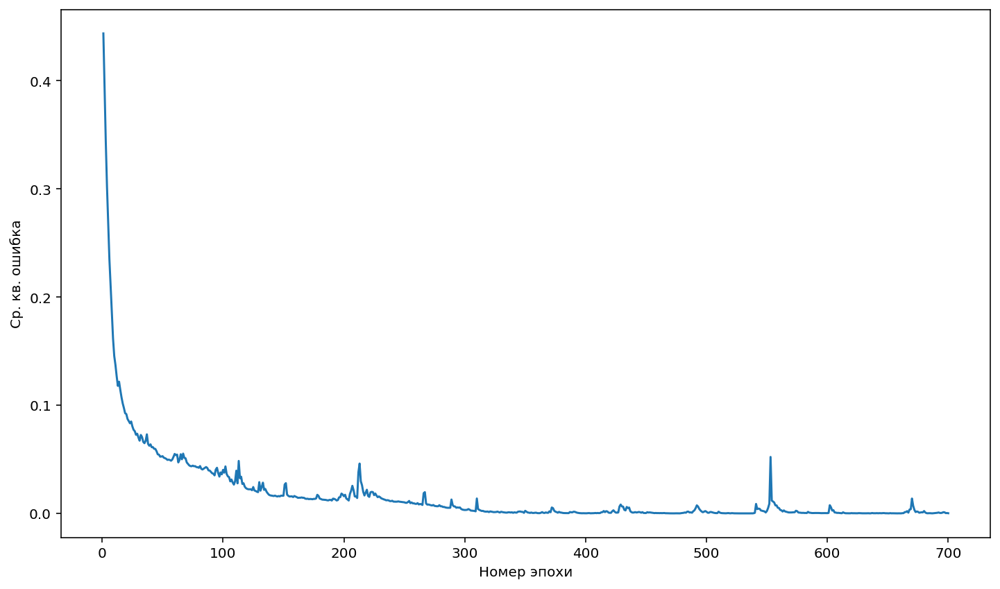

In [55]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [56]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae_rnd.append(max_err_val)

Максимальная ошибка по модулю =  0.043841505849800955


<ipython-input-57-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


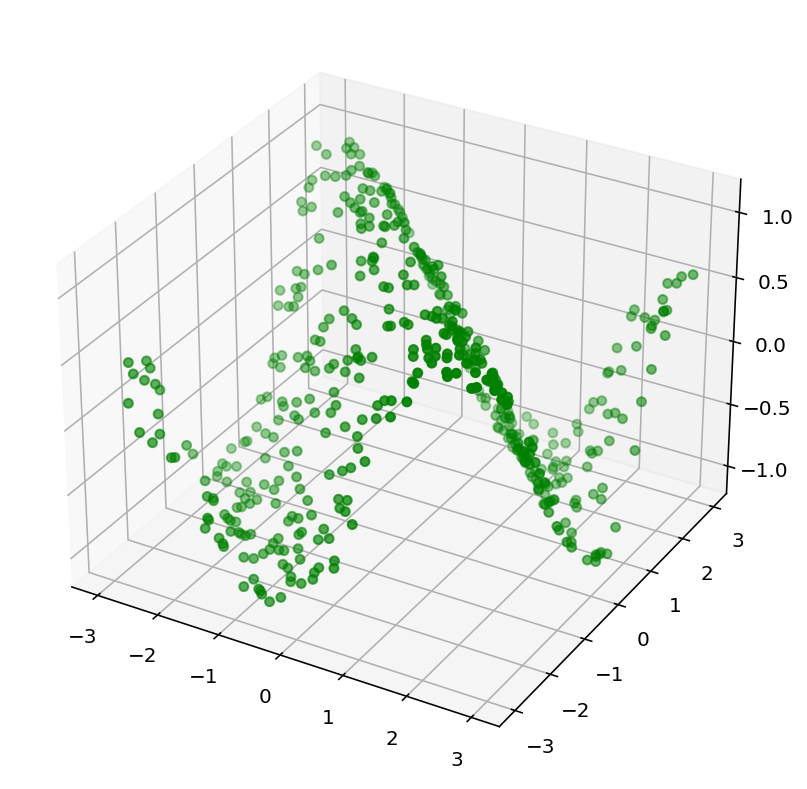

In [57]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

In [58]:
n = 20
xy=[] 
zz=[] 
x, y = get_random_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])
#history = model()

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse_rnd.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


 1/13 [=>............................] - ETA: 21s - loss: 0.4539

12/13 [==========================>...] - ETA: 0s - loss: 0.4313 

13/13 [==============================] - 2s 6ms/step - loss: 0.4312


Epoch 2/700
 1/13 [=>............................] - ETA: 0s - loss: 0.3824

10/13 [======================>.......] - ETA: 0s - loss: 0.3675

13/13 [==============================] - 0s 5ms/step - loss: 0.3697


Epoch 3/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2422

 5/13 [==========>...................] - ETA: 0s - loss: 0.2720

 6/13 [============>.................] - ETA: 0s - loss: 0.2778

 7/13 [===============>..............] - ETA: 0s - loss: 0.2832

 9/13 [===================>..........] - ETA: 0s - loss: 0.2915

13/13 [==============================] - 1s 57ms/step - loss: 0.3008


Epoch 4/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1906

 2/13 [===>..........................] - ETA: 1s - loss: 0.2122

 3/13 [=====>........................] - ETA: 0s - loss: 0.2227

 4/13 [========>.....................] - ETA: 0s - loss: 0.2302

13/13 [==============================] - 0s 26ms/step - loss: 0.2502


Epoch 5/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2563

13/13 [==============================] - 0s 2ms/step - loss: 0.2371


Epoch 6/700
 1/13 [=>............................] - ETA: 0s - loss: 0.2756

13/13 [==============================] - 0s 1ms/step - loss: 0.2068


Epoch 7/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1057

 3/13 [=====>........................] - ETA: 0s - loss: 0.1080

13/13 [==============================] - 0s 6ms/step - loss: 0.1308


Epoch 8/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0757

 7/13 [===============>..............] - ETA: 0s - loss: 0.1048

13/13 [==============================] - 0s 6ms/step - loss: 0.1087


Epoch 9/700
 1/13 [=>............................] - ETA: 0s - loss: 0.1308

13/13 [==============================] - 0s 2ms/step - loss: 0.1005


Epoch 10/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0740

13/13 [==============================] - 0s 1ms/step - loss: 0.0899


Epoch 11/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0773

13/13 [==============================] - 0s 2ms/step - loss: 0.0709


Epoch 12/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0831

 4/13 [========>.....................] - ETA: 0s - loss: 0.0713

13/13 [==============================] - 0s 6ms/step - loss: 0.0646


Epoch 13/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0079

 3/13 [=====>........................] - ETA: 0s - loss: 0.0194

13/13 [==============================] - 0s 7ms/step - loss: 0.0406


Epoch 14/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0675

 4/13 [========>.....................] - ETA: 0s - loss: 0.0546

13/13 [==============================] - 0s 7ms/step - loss: 0.0543


Epoch 15/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0207

 5/13 [==========>...................] - ETA: 0s - loss: 0.0329

13/13 [==============================] - 0s 6ms/step - loss: 0.0398


Epoch 16/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0527

13/13 [==============================] - 0s 1ms/step - loss: 0.0443


Epoch 17/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0563

13/13 [==============================] - 0s 1ms/step - loss: 0.0486


Epoch 18/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0338

 2/13 [===>..........................] - ETA: 0s - loss: 0.0389

13/13 [==============================] - 0s 6ms/step - loss: 0.0440


Epoch 19/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0116

 5/13 [==========>...................] - ETA: 0s - loss: 0.0314

13/13 [==============================] - 0s 6ms/step - loss: 0.0370


Epoch 20/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0313

13/13 [==============================] - 0s 1ms/step - loss: 0.0341


Epoch 21/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0794

13/13 [==============================] - 0s 2ms/step - loss: 0.0384


Epoch 22/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0680

13/13 [==============================] - 0s 1ms/step - loss: 0.0465


Epoch 23/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0234

 2/13 [===>..........................] - ETA: 0s - loss: 0.0250

13/13 [==============================] - 0s 6ms/step - loss: 0.0276


Epoch 24/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0233

 4/13 [========>.....................] - ETA: 0s - loss: 0.0282

13/13 [==============================] - 0s 6ms/step - loss: 0.0297


Epoch 25/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0231

 9/13 [===================>..........] - ETA: 0s - loss: 0.0272

13/13 [==============================] - 0s 7ms/step - loss: 0.0270


Epoch 26/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0112

 3/13 [=====>........................] - ETA: 1s - loss: 0.0203

 5/13 [==========>...................] - ETA: 0s - loss: 0.0207

 7/13 [===============>..............] - ETA: 0s - loss: 0.0218

13/13 [==============================] - ETA: 0s - loss: 0.0235

13/13 [==============================] - 1s 56ms/step - loss: 0.0235


Epoch 27/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0335

 7/13 [===============>..............] - ETA: 0s - loss: 0.0263

13/13 [==============================] - 0s 9ms/step - loss: 0.0263


Epoch 28/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0067

 4/13 [========>.....................] - ETA: 0s - loss: 0.0202

13/13 [==============================] - 0s 18ms/step - loss: 0.0209


Epoch 29/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0328

12/13 [==========================>...] - ETA: 0s - loss: 0.0216

13/13 [==============================] - 0s 7ms/step - loss: 0.0215


Epoch 30/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0052

 4/13 [========>.....................] - ETA: 0s - loss: 0.0133

13/13 [==============================] - 0s 7ms/step - loss: 0.0160


Epoch 31/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0369

 3/13 [=====>........................] - ETA: 0s - loss: 0.0253

13/13 [==============================] - 0s 6ms/step - loss: 0.0182


Epoch 32/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0072

 9/13 [===================>..........] - ETA: 0s - loss: 0.0121

13/13 [==============================] - 0s 6ms/step - loss: 0.0132


Epoch 33/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0191

 7/13 [===============>..............] - ETA: 0s - loss: 0.0159

13/13 [==============================] - 0s 6ms/step - loss: 0.0151


Epoch 34/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0106

 9/13 [===================>..........] - ETA: 0s - loss: 0.0134

13/13 [==============================] - 0s 6ms/step - loss: 0.0128


Epoch 35/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0142

11/13 [========================>.....] - ETA: 0s - loss: 0.0166

13/13 [==============================] - 0s 6ms/step - loss: 0.0166


Epoch 36/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0077

13/13 [==============================] - 0s 2ms/step - loss: 0.0103


Epoch 37/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0163

13/13 [==============================] - 0s 2ms/step - loss: 0.0099


Epoch 38/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0091

13/13 [==============================] - 0s 2ms/step - loss: 0.0089


Epoch 39/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0075

 6/13 [============>.................] - ETA: 0s - loss: 0.0070

13/13 [==============================] - 0s 6ms/step - loss: 0.0072


Epoch 40/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0048

10/13 [======================>.......] - ETA: 0s - loss: 0.0072

13/13 [==============================] - 0s 6ms/step - loss: 0.0072


Epoch 41/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0126

13/13 [==============================] - 0s 1ms/step - loss: 0.0086


Epoch 42/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0029

13/13 [==============================] - 0s 2ms/step - loss: 0.0051


Epoch 43/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0058

 4/13 [========>.....................] - ETA: 0s - loss: 0.0060

13/13 [==============================] - 0s 5ms/step - loss: 0.0058


Epoch 44/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0082

 5/13 [==========>...................] - ETA: 0s - loss: 0.0066

13/13 [==============================] - 0s 6ms/step - loss: 0.0054


Epoch 45/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0038

10/13 [======================>.......] - ETA: 0s - loss: 0.0046

13/13 [==============================] - 0s 6ms/step - loss: 0.0047


Epoch 46/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - ETA: 0s - loss: 0.0029

13/13 [==============================] - 0s 6ms/step - loss: 0.0029


Epoch 47/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0036

13/13 [==============================] - ETA: 0s - loss: 0.0030

13/13 [==============================] - 0s 5ms/step - loss: 0.0030


Epoch 48/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 49/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0107

13/13 [==============================] - 0s 2ms/step - loss: 0.0045


Epoch 50/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0023

 6/13 [============>.................] - ETA: 0s - loss: 0.0025

 8/13 [=================>............] - ETA: 0s - loss: 0.0025

10/13 [======================>.......] - ETA: 0s - loss: 0.0024

11/13 [========================>.....] - ETA: 0s - loss: 0.0024

13/13 [==============================] - 1s 50ms/step - loss: 0.0024


Epoch 51/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

 2/13 [===>..........................] - ETA: 0s - loss: 0.0020

11/13 [========================>.....] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 15ms/step - loss: 0.0017


Epoch 52/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0030

 5/13 [==========>...................] - ETA: 0s - loss: 0.0028

 8/13 [=================>............] - ETA: 0s - loss: 0.0027

13/13 [==============================] - 0s 17ms/step - loss: 0.0027


Epoch 53/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0022

13/13 [==============================] - 0s 2ms/step - loss: 0.0026


Epoch 54/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0046

13/13 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 55/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0036

13/13 [==============================] - 0s 2ms/step - loss: 0.0022


Epoch 56/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 57/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5636e-04

 2/13 [===>..........................] - ETA: 0s - loss: 7.0048e-04

13/13 [==============================] - 0s 6ms/step - loss: 0.0014


Epoch 58/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0065

 3/13 [=====>........................] - ETA: 0s - loss: 0.0055

13/13 [==============================] - 0s 7ms/step - loss: 0.0032


Epoch 59/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

 8/13 [=================>............] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 6ms/step - loss: 0.0019


Epoch 60/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0026

13/13 [==============================] - 0s 1ms/step - loss: 0.0025


Epoch 61/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0033

13/13 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 62/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3604e-04

 2/13 [===>..........................] - ETA: 0s - loss: 0.0016    

13/13 [==============================] - 0s 6ms/step - loss: 0.0015


Epoch 63/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2124e-04

 3/13 [=====>........................] - ETA: 0s - loss: 0.0014    

13/13 [==============================] - 0s 8ms/step - loss: 0.0015


Epoch 64/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0033

 6/13 [============>.................] - ETA: 0s - loss: 0.0046

13/13 [==============================] - 0s 5ms/step - loss: 0.0037


Epoch 65/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0015

 4/13 [========>.....................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 6ms/step - loss: 0.0014


Epoch 66/700


 1/13 [=>............................] - ETA: 0s - loss: 2.4515e-04

 2/13 [===>..........................] - ETA: 0s - loss: 5.3043e-04

13/13 [==============================] - 0s 7ms/step - loss: 0.0010


Epoch 67/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 68/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2422e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0013    

13/13 [==============================] - 0s 6ms/step - loss: 0.0023


Epoch 69/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0023

10/13 [======================>.......] - ETA: 0s - loss: 0.0018

13/13 [==============================] - 0s 6ms/step - loss: 0.0019


Epoch 70/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0033

13/13 [==============================] - 0s 1ms/step - loss: 0.0028


Epoch 71/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0022

10/13 [======================>.......] - ETA: 0s - loss: 0.0027

13/13 [==============================] - 0s 9ms/step - loss: 0.0029


Epoch 72/700
 1/13 [=>............................] - ETA: 1s - loss: 0.0198

 5/13 [==========>...................] - ETA: 0s - loss: 0.0095

10/13 [======================>.......] - ETA: 0s - loss: 0.0065

13/13 [==============================] - 0s 18ms/step - loss: 0.0054


Epoch 73/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3038e-04

 2/13 [===>..........................] - ETA: 0s - loss: 0.0012    

10/13 [======================>.......] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 15ms/step - loss: 0.0019


Epoch 74/700


 1/13 [=>............................] - ETA: 0s - loss: 6.3866e-04

 9/13 [===================>..........] - ETA: 0s - loss: 9.2606e-04

10/13 [======================>.......] - ETA: 0s - loss: 9.6759e-04

13/13 [==============================] - 0s 18ms/step - loss: 0.0011


Epoch 75/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3624e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 76/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0021

13/13 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 77/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4795e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 78/700


 1/13 [=>............................] - ETA: 0s - loss: 7.8861e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 79/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

11/13 [========================>.....] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 8ms/step - loss: 0.0012


Epoch 80/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

 7/13 [===============>..............] - ETA: 0s - loss: 0.0011



13/13 [==============================] - 0s 7ms/step - loss: 0.0012


Epoch 81/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

 5/13 [==========>...................] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 0s 7ms/step - loss: 0.0012


Epoch 82/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

 3/13 [=====>........................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 7ms/step - loss: 0.0011


Epoch 83/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1223e-04

 2/13 [===>..........................] - ETA: 0s - loss: 0.0010    

13/13 [==============================] - 0s 6ms/step - loss: 0.0024


Epoch 84/700


 1/13 [=>............................] - ETA: 0s - loss: 4.5218e-04

 5/13 [==========>...................] - ETA: 0s - loss: 0.0012    

13/13 [==============================] - 0s 7ms/step - loss: 0.0011


Epoch 85/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7160e-04

 9/13 [===================>..........] - ETA: 0s - loss: 9.5666e-04

13/13 [==============================] - 0s 6ms/step - loss: 0.0010


Epoch 86/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0021

12/13 [==========================>...] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 6ms/step - loss: 0.0015


Epoch 87/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0026

13/13 [==============================] - 0s 1ms/step - loss: 0.0011


Epoch 88/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7709e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.8192e-04


Epoch 89/700


 1/13 [=>............................] - ETA: 1s - loss: 7.5365e-04

 2/13 [===>..........................] - ETA: 1s - loss: 8.1455e-04

 5/13 [==========>...................] - ETA: 0s - loss: 0.0011    

13/13 [==============================] - 0s 17ms/step - loss: 0.0013


Epoch 90/700


 1/13 [=>............................] - ETA: 2s - loss: 8.8005e-04

 7/13 [===============>..............] - ETA: 0s - loss: 0.0018    

13/13 [==============================] - 0s 10ms/step - loss: 0.0019


Epoch 91/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

 2/13 [===>..........................] - ETA: 1s - loss: 0.0020

 3/13 [=====>........................] - ETA: 0s - loss: 0.0022

10/13 [======================>.......] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 24ms/step - loss: 0.0019


Epoch 92/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0022

10/13 [======================>.......] - ETA: 0s - loss: 0.0021

13/13 [==============================] - 0s 10ms/step - loss: 0.0021


Epoch 93/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0057

13/13 [==============================] - 0s 2ms/step - loss: 0.0029


Epoch 94/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0023

13/13 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 95/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0547e-04

10/13 [======================>.......] - ETA: 0s - loss: 9.4635e-04

13/13 [==============================] - 0s 7ms/step - loss: 9.6886e-04


Epoch 96/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8825e-04

 9/13 [===================>..........] - ETA: 0s - loss: 6.2372e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.6257e-04


Epoch 97/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4715e-04

 6/13 [============>.................] - ETA: 0s - loss: 5.5495e-04

13/13 [==============================] - 0s 7ms/step - loss: 6.8730e-04


Epoch 98/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3718e-04

 2/13 [===>..........................] - ETA: 0s - loss: 1.9875e-04

13/13 [==============================] - 0s 8ms/step - loss: 5.0803e-04


Epoch 99/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8628e-04

13/13 [==============================] - 0s 3ms/step - loss: 6.4286e-04


Epoch 100/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3961e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.9469e-04


Epoch 101/700
 1/13 [=>............................] - ETA: 0s - loss: 4.0875e-04

13/13 [==============================] - 0s 3ms/step - loss: 6.9242e-04


Epoch 102/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 103/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0058

13/13 [==============================] - 0s 3ms/step - loss: 0.0035


Epoch 104/700
 1/13 [=>............................] - ETA: 1s - loss: 8.1857e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0014    

12/13 [==========================>...] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 17ms/step - loss: 0.0016


Epoch 105/700
 1/13 [=>............................] - ETA: 1s - loss: 6.2193e-04

 2/13 [===>..........................] - ETA: 1s - loss: 5.1870e-04

 4/13 [========>.....................] - ETA: 0s - loss: 4.3267e-04

13/13 [==============================] - 0s 20ms/step - loss: 0.0010


Epoch 106/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

 8/13 [=================>............] - ETA: 0s - loss: 0.0041

13/13 [==============================] - 0s 9ms/step - loss: 0.0043


Epoch 107/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0139

13/13 [==============================] - ETA: 0s - loss: 0.0051

13/13 [==============================] - 0s 8ms/step - loss: 0.0049


Epoch 108/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9234e-04

 4/13 [========>.....................] - ETA: 0s - loss: 7.3394e-04

13/13 [==============================] - 0s 8ms/step - loss: 0.0011


Epoch 109/700


 1/13 [=>............................] - ETA: 2s - loss: 6.9784e-04

 3/13 [=====>........................] - ETA: 0s - loss: 7.6698e-04

 6/13 [============>.................] - ETA: 0s - loss: 7.9729e-04

 8/13 [=================>............] - ETA: 0s - loss: 8.3935e-04

13/13 [==============================] - 1s 26ms/step - loss: 9.4753e-04


Epoch 110/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5024e-04

 4/13 [========>.....................] - ETA: 0s - loss: 0.0013    

13/13 [==============================] - 0s 6ms/step - loss: 0.0013


Epoch 111/700


 1/13 [=>............................] - ETA: 0s - loss: 8.4377e-04

 5/13 [==========>...................] - ETA: 0s - loss: 0.0019    

13/13 [==============================] - 0s 7ms/step - loss: 0.0024


Epoch 112/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0048

 9/13 [===================>..........] - ETA: 0s - loss: 0.0056

13/13 [==============================] - 0s 9ms/step - loss: 0.0052


Epoch 113/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

10/13 [======================>.......] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 8ms/step - loss: 0.0031


Epoch 114/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0090

 2/13 [===>..........................] - ETA: 0s - loss: 0.0116

13/13 [==============================] - 0s 7ms/step - loss: 0.0088


Epoch 115/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0043

13/13 [==============================] - 0s 2ms/step - loss: 0.0058


Epoch 116/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0034

13/13 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 117/700
 1/13 [=>............................] - ETA: 0s - loss: 9.6500e-04

 2/13 [===>..........................] - ETA: 1s - loss: 0.0011    

 6/13 [============>.................]

 - ETA: 0s - loss: 0.0011

 7/13 [===============>..............] - ETA: 0s - loss: 0.0011

11/13 [========================>.....] - ETA: 0s - loss: 0.0011

13/13 [==============================] - 1s 49ms/step - loss: 0.0012


Epoch 118/700


 1/13 [=>............................] - ETA: 0s - loss: 9.9076e-04

 3/13 [=====>........................] - ETA: 0s - loss: 7.8583e-04

 5/13 [==========>...................] - ETA: 0s - loss: 8.9572e-04

 6/13 [============>.................] - ETA: 0s - loss: 9.6196e-04

13/13 [==============================] - ETA: 0s - loss: 0.0011    

13/13 [==============================] - 0s 33ms/step - loss: 0.0011


Epoch 119/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6347e-04

11/13 [========================>.....] - ETA: 0s - loss: 0.0010    

13/13 [==============================] - 0s 8ms/step - loss: 0.0011


Epoch 120/700
 1/13 [=>............................] - ETA: 0s - loss: 4.1550e-04

 6/13 [============>.................] - ETA: 0s - loss: 8.2545e-04

13/13 [==============================] - 0s 5ms/step - loss: 9.0308e-04


Epoch 121/700


 1/13 [=>............................] - ETA: 1s - loss: 9.3759e-04

 2/13 [===>..........................] - ETA: 2s - loss: 0.0017    

 5/13 [==========>...................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 28ms/step - loss: 0.0014


Epoch 122/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3226e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.5598e-04

13/13 [==============================] - 0s 10ms/step - loss: 8.3218e-04


Epoch 123/700


 1/13 [=>............................] - ETA: 1s - loss: 0.0033

 3/13 [=====>........................] - ETA: 0s - loss: 0.0028

13/13 [==============================] - 0s 9ms/step - loss: 0.0022


Epoch 124/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2562e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.0965e-04


Epoch 125/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2878e-04

13/13 [==============================] - ETA: 0s - loss: 7.6228e-04

13/13 [==============================] - 0s 8ms/step - loss: 7.6233e-04


Epoch 126/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8577e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.8607e-04

13/13 [==============================] - 0s 9ms/step - loss: 6.3112e-04


Epoch 127/700
 1/13 [=>............................] - ETA: 0s - loss: 7.1811e-04

 6/13 [============>.................] - ETA: 0s - loss: 6.5064e-04

13/13 [==============================] - 0s 9ms/step - loss: 5.6588e-04


Epoch 128/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7821e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.2476e-04

13/13 [==============================] - 0s 9ms/step - loss: 6.9594e-04


Epoch 129/700


 1/13 [=>............................] - ETA: 0s - loss: 3.7379e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.4451e-04

13/13 [==============================] - 0s 9ms/step - loss: 6.8951e-04


Epoch 130/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7799e-04

 5/13 [==========>...................] - ETA: 0s - loss: 6.1111e-04

 6/13 [============>.................] - ETA: 0s - loss: 6.3878e-04

13/13 [==============================] - 0s 17ms/step - loss: 6.5684e-04


Epoch 131/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3212e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.1581e-04


Epoch 132/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2873e-04

 3/13 [=====>........................] - ETA: 1s - loss: 3.2595e-04

 4/13 [========>.....................] - ETA: 1s - loss: 3.7715e-04

 5/13 [==========>...................] - ETA: 1s - loss: 4.0227e-04

 9/13 [===================>..........] - ETA: 0s - loss: 4.8631e-04

13/13 [==============================] - ETA: 0s - loss: 5.2754e-04

13/13 [==============================] - 1s 60ms/step - loss: 5.4330e-04


Epoch 133/700


 1/13 [=>............................]

 - ETA: 0s - loss: 2.5695e-04

 2/13 [===>..........................] - ETA: 2s - loss: 4.0605e-04

 9/13 [===================>..........] - ETA: 0s - loss: 9.3338e-04

13/13 [==============================] - 0s 25ms/step - loss: 0.0011


Epoch 134/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8647e-04

 5/13 [==========>...................] - ETA: 0s - loss: 8.0583e-04

13/13 [==============================] - 0s 7ms/step - loss: 9.4324e-04


Epoch 135/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

 3/13 [=====>........................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 6ms/step - loss: 0.0010


Epoch 136/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4268e-04

 2/13 [===>..........................] - ETA: 3s - loss: 3.9758e-04

 3/13 [=====>........................] - ETA: 2s - loss: 3.9967e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.5524e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.4999e-04

13/13 [==============================] - 1s 65ms/step - loss: 3.6657e-04


Epoch 137/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5897e-04

 3/13 [=====>........................] - ETA: 0s - loss: 8.9557e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.3754e-04

13/13 [==============================] - 0s 25ms/step - loss: 7.1765e-04


Epoch 138/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7275e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 139/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0633e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.2445e-04


Epoch 140/700
 1/13 [=>............................] - ETA: 0s - loss: 9.0001e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.8734e-04


Epoch 141/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2456e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.8565e-04


Epoch 142/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8989e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.9270e-04


Epoch 143/700


 1/13 [=>............................] - ETA: 0s - loss: 9.1103e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.8036e-04


Epoch 144/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7171e-04

 9/13 [===================>..........] - ETA: 0s - loss: 2.9896e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.9623e-04


Epoch 145/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0011

 8/13 [=================>............] - ETA: 0s - loss: 6.0848e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.1583e-04


Epoch 146/700
 1/13 [=>............................] - ETA: 0s - loss: 9.0266e-05

 2/13 [===>..........................] - ETA: 4s - loss: 1.1418e-04

 3/13 [=====>........................] - ETA: 2s - loss: 1.3083e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.9892e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.5231e-04

13/13 [==============================] - 1s 57ms/step - loss: 2.7794e-04


Epoch 147/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6459e-04

 5/13 [==========>...................] - ETA: 0s - loss: 2.2547e-04

13/13 [==============================] - 0s 9ms/step - loss: 2.8535e-04


Epoch 148/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6531e-05

 9/13 [===================>..........] - ETA: 0s - loss: 7.3122e-04

13/13 [==============================] - 0s 17ms/step - loss: 7.5921e-04


Epoch 149/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3815e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5602e-04


Epoch 150/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1174e-04

13/13 [==============================] - ETA: 0s - loss: 4.7151e-04

13/13 [==============================] - 0s 8ms/step - loss: 4.7214e-04


Epoch 151/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8641e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.9278e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.9769e-04


Epoch 152/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5441e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.8541e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.7211e-04


Epoch 153/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1714e-04

13/13 [==============================] - 0s 3ms/step - loss: 7.7347e-04


Epoch 154/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

11/13 [========================>.....] - ETA: 0s - loss: 9.4591e-04

13/13 [==============================] - 0s 7ms/step - loss: 8.7940e-04


Epoch 155/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8933e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.8688e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.1190e-04


Epoch 156/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4106e-04

12/13 [==========================>...] - ETA: 0s - loss: 7.7769e-04

13/13 [==============================] - 0s 6ms/step - loss: 7.7168e-04


Epoch 157/700


 1/13 [=>............................] - ETA: 0s - loss: 4.3028e-04

 9/13 [===================>..........] - ETA: 0s - loss: 4.4034e-04

13/13 [==============================] - 0s 7ms/step - loss: 4.3672e-04


Epoch 158/700


 1/13 [=>............................] - ETA: 0s - loss: 2.6321e-04

 5/13 [==========>...................] - ETA: 0s - loss: 4.5174e-04

13/13 [==============================] - 0s 8ms/step - loss: 5.6915e-04


Epoch 159/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0013

 6/13 [============>.................] - ETA: 0s - loss: 9.2122e-04

13/13 [==============================] - 0s 10ms/step - loss: 7.3095e-04


Epoch 160/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0008e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.0274e-04

 3/13 [=====>........................] - ETA: 0s - loss: 2.7895e-04

 4/13 [========>.....................] - ETA: 0s - loss: 3.0193e-04

 6/13 [============>.................] - ETA: 0s - loss: 4.7497e-04

 9/13 [===================>..........] - ETA: 0s - loss: 5.7708e-04

13/13 [==============================] - 1s 41ms/step - loss: 7.3223e-04


Epoch 161/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7800e-04

 5/13 [==========>...................] - ETA: 0s - loss: 6.5216e-04

13/13 [==============================] - 0s 7ms/step - loss: 7.2629e-04


Epoch 162/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3283e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.7251e-04


Epoch 163/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6141e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.5735e-04


Epoch 164/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2215e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.2281e-04


Epoch 165/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7504e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.1660e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.2222e-04


Epoch 166/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3762e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.1405e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.5556e-04


Epoch 167/700
 1/13 [=>............................] - ETA: 0s - loss: 7.5459e-05

 3/13 [=====>........................] - ETA: 0s - loss: 2.1641e-04

13/13 [==============================] - 0s 8ms/step - loss: 2.4164e-04


Epoch 168/700


 1/13 [=>............................] - ETA: 0s - loss: 2.9494e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.6449e-04


Epoch 169/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0758e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.2272e-04

13/13 [==============================] - 0s 6ms/step - loss: 3.8243e-04


Epoch 170/700


 1/13 [=>............................] - ETA: 0s - loss: 3.3134e-04

 6/13 [============>.................] - ETA: 0s - loss: 5.0335e-04

13/13 [==============================] - 0s 11ms/step - loss: 4.5675e-04


Epoch 171/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5310e-04

 2/13 [===>..........................] - ETA: 0s - loss: 4.4437e-04

10/13 [======================>.......] - ETA: 0s - loss: 3.1327e-04

13/13 [==============================] - ETA: 0s - loss: 3.0530e-04

13/13 [==============================] - 0s 23ms/step - loss: 3.0376e-04


Epoch 172/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2306e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.8126e-04

13/13 [==============================] - 0s 9ms/step - loss: 2.7504e-04


Epoch 173/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0813e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.6497e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.0875e-04

13/13 [==============================] - 0s 16ms/step - loss: 2.1848e-04


Epoch 174/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4791e-04

 5/13 [==========>...................] - ETA: 0s - loss: 2.9569e-04

 6/13 [============>.................] - ETA: 0s - loss: 2.9364e-04

13/13 [==============================] - ETA: 0s - loss: 2.7497e-04

13/13 [==============================] - 0s 23ms/step - loss: 2.7292e-04


Epoch 175/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1690e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.3866e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.2867e-04


Epoch 176/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8024e-04

 2/13 [===>..........................] - ETA: 0s - loss: 1.7952e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.1142e-04


Epoch 177/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1708e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.7034e-04


Epoch 178/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4920e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.4580e-04


Epoch 179/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6609e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.5680e-04


Epoch 180/700
 1/13 [=>............................] - ETA: 0s - loss: 8.4628e-05

11/13 [========================>.....] - ETA: 0s - loss: 1.9739e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.0302e-04


Epoch 181/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7972e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.2132e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.2780e-04


Epoch 182/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7034e-04

 5/13 [==========>...................] - ETA: 0s - loss: 3.6767e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.2522e-04


Epoch 183/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0003e-04

 8/13 [=================>............] - ETA: 0s - loss: 2.8642e-04

13/13 [==============================] - 0s 10ms/step - loss: 2.8154e-04


Epoch 184/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0610e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.1996e-04


Epoch 185/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0277e-04

 3/13 [=====>........................] - ETA: 0s - loss: 4.9368e-04

 5/13 [==========>...................] - ETA: 0s - loss: 4.9408e-04

 9/13 [===================>..........] - ETA: 0s - loss: 5.3679e-04

13/13 [==============================] - 0s 32ms/step - loss: 5.7527e-04


Epoch 186/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1737e-04

 5/13 [==========>...................] - ETA: 0s - loss: 4.4558e-04

12/13 [==========================>...] - ETA: 0s - loss: 5.7609e-04

13/13 [==============================] - 0s 12ms/step - loss: 5.8108e-04


Epoch 187/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8483e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.8903e-04

13/13 [==============================] - 0s 6ms/step - loss: 4.7795e-04


Epoch 188/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4817e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.7879e-04

13/13 [==============================] - 0s 8ms/step - loss: 2.5119e-04


Epoch 189/700


 1/13 [=>............................] - ETA: 0s - loss: 5.0619e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.4612e-04


Epoch 190/700
 1/13 [=>............................] - ETA: 0s - loss: 9.8843e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.2690e-04


Epoch 191/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2397e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.0391e-04


Epoch 192/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7979e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5276e-04


Epoch 193/700


 1/13 [=>............................] - ETA: 0s - loss: 4.1618e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.8378e-04


Epoch 194/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

 9/13 [===================>..........] - ETA: 0s - loss: 6.3376e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.5180e-04


Epoch 195/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1544e-04

 5/13 [==========>...................] - ETA: 0s - loss: 3.3475e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.3612e-04

10/13 [======================>.......] - ETA: 0s - loss: 4.0709e-04

13/13 [==============================] - 0s 40ms/step - loss: 4.9039e-04


Epoch 196/700


 1/13 [=>............................] - ETA: 0s - loss: 7.1378e-04

 2/13 [===>..........................] - ETA: 0s - loss: 6.2589e-04

13/13 [==============================] - 0s 9ms/step - loss: 6.9312e-04


Epoch 197/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3409e-04

 7/13 [===============>..............] - ETA: 0s - loss: 4.7599e-04

13/13 [==============================] - 0s 9ms/step - loss: 5.1205e-04


Epoch 198/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3123e-04

 2/13 [===>..........................] - ETA: 0s - loss: 1.6699e-04

 3/13 [=====>........................] - ETA: 0s - loss: 2.0053e-04

13/13 [==============================] - 0s 18ms/step - loss: 3.0005e-04


Epoch 199/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2718e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.8517e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.8656e-04


Epoch 200/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

 3/13 [=====>........................] - ETA: 0s - loss: 7.1827e-04

13/13 [==============================] - 0s 6ms/step - loss: 4.2942e-04


Epoch 201/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2031e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.5325e-04


Epoch 202/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8002e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.0820e-04


Epoch 203/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9692e-04

 2/13 [===>..........................] - ETA: 0s - loss: 2.5326e-04

13/13 [==============================] - 0s 7ms/step - loss: 5.4494e-04


Epoch 204/700


 1/13 [=>............................] - ETA: 0s - loss: 7.7017e-04

13/13 [==============================] - 0s 1ms/step - loss: 8.2960e-04


Epoch 205/700


 1/13 [=>............................] - ETA: 0s - loss: 6.1783e-04



13/13 [==============================] - 0s 1ms/step - loss: 4.7501e-04


Epoch 206/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2296e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8002e-04


Epoch 207/700


 1/13 [=>............................] - ETA: 0s - loss: 9.5946e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.5133e-04


Epoch 208/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1402e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.6699e-04

13/13 [==============================] - ETA: 0s - loss: 1.6450e-04

13/13 [==============================] - 0s 25ms/step - loss: 1.6347e-04


Epoch 209/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5552e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.0376e-04


Epoch 210/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6844e-04

 4/13 [========>.....................] - ETA: 0s - loss: 1.5221e-04

 9/13 [===================>..........] - ETA: 0s - loss: 1.5850e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.6169e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.6421e-04

13/13 [==============================] - 0s 41ms/step - loss: 1.7310e-04


Epoch 211/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5408e-04

 4/13 [========>.....................] - ETA: 0s - loss: 4.0354e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.9878e-04


Epoch 212/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1200e-05

 2/13 [===>..........................] - ETA: 0s - loss: 1.1476e-04

13/13 [==============================] - 0s 6ms/step - loss: 1.2661e-04


Epoch 213/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5949e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.9111e-04


Epoch 214/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1396e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.2663e-04


Epoch 215/700
 1/13 [=>............................] - ETA: 0s - loss: 6.2547e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.0433e-04


Epoch 216/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9411e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.8547e-05


Epoch 217/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3675e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.0744e-04


Epoch 218/700


 1/13 [=>............................] - ETA: 0s - loss: 5.5476e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.1430e-04


Epoch 219/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3798e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6775e-04


Epoch 220/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0401e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.4364e-04

13/13 [==============================] - 0s 7ms/step - loss: 1.4363e-04


Epoch 221/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6997e-05

11/13 [========================>.....] - ETA: 0s - loss: 1.1746e-04

13/13 [==============================] - 0s 7ms/step - loss: 1.2365e-04


Epoch 222/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7187e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.4284e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.3610e-04


Epoch 223/700
 1/13 [=>............................] - ETA: 0s - loss: 7.7515e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.3096e-05


Epoch 224/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2987e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.4874e-04


Epoch 225/700
 1/13 [=>............................] - ETA: 0s - loss: 6.8694e-05

12/13 [==========================>...] - ETA: 0s - loss: 9.9166e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.0045e-04


Epoch 226/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2318e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.6044e-04


Epoch 227/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8049e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.3699e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.2751e-04


Epoch 228/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1927e-04

13/13 [==============================] - ETA: 0s - loss: 1.8262e-04

13/13 [==============================] - 0s 6ms/step - loss: 1.8345e-04


Epoch 229/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3628e-04

 8/13 [=================>............] - ETA: 0s - loss: 1.7627e-04

13/13 [==============================] - 0s 7ms/step - loss: 2.1254e-04


Epoch 230/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8938e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.4599e-04

13/13 [==============================] - 0s 7ms/step - loss: 3.1430e-04


Epoch 231/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7001e-04

 5/13 [==========>...................] - ETA: 0s - loss: 2.0495e-04

13/13 [==============================] - 0s 8ms/step - loss: 2.3498e-04


Epoch 232/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4678e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.3678e-04

11/13 [========================>.....] - ETA: 0s - loss: 4.3912e-04

13/13 [==============================] - 0s 17ms/step - loss: 4.5096e-04


Epoch 233/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1386e-04

 4/13 [========>.....................] - ETA: 0s - loss: 8.2035e-04

 7/13 [===============>..............] - ETA: 0s - loss: 8.8918e-04

13/13 [==============================] - 0s 17ms/step - loss: 9.0709e-04


Epoch 234/700


 1/13 [=>............................] - ETA: 2s - loss: 7.7132e-04

 4/13 [========>.....................] - ETA: 0s - loss: 8.5801e-04

 5/13 [==========>...................] - ETA: 0s - loss: 8.4761e-04

13/13 [==============================] - 0s 19ms/step - loss: 7.4744e-04


Epoch 235/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9983e-04

13/13 [==============================] - 0s 4ms/step - loss: 5.8522e-04


Epoch 236/700
 1/13 [=>............................] - ETA: 0s - loss: 9.3346e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0010


Epoch 237/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4946e-04

13/13 [==============================] - 0s 3ms/step - loss: 4.3664e-04


Epoch 238/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6894e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.5547e-04


Epoch 239/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4440e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.3981e-04


Epoch 240/700


 1/13 [=>............................] - ETA: 0s - loss: 2.8076e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.4770e-04


Epoch 241/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0511e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3199e-04


Epoch 242/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7646e-04

13/13 [==============================] - 0s 3ms/step - loss: 3.0801e-04


Epoch 243/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3413e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.2882e-04


Epoch 244/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2369e-04

13/13 [==============================] - 0s 3ms/step - loss: 3.2437e-04


Epoch 245/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8821e-04

13/13 [==============================] - 0s 3ms/step - loss: 5.4163e-04


Epoch 246/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3021e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.0696e-04


Epoch 247/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1358e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.2574e-04


Epoch 248/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7310e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.3843e-04


Epoch 249/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8146e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.8886e-04


Epoch 250/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4484e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8952e-04


Epoch 251/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3360e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.1117e-04


Epoch 252/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1318e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.3106e-04


Epoch 253/700


 1/13 [=>............................] - ETA: 0s - loss: 8.3658e-04

13/13 [==============================] - ETA: 0s - loss: 5.5429e-04

13/13 [==============================] - 0s 4ms/step - loss: 5.4916e-04


Epoch 254/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5287e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.8160e-04


Epoch 255/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9211e-05

13/13 [==============================] - 0s 4ms/step - loss: 3.6085e-04


Epoch 256/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0010

13/13 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 257/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0028

13/13 [==============================] - 0s 4ms/step - loss: 0.0041


Epoch 258/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 2ms/step - loss: 0.0038


Epoch 259/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0019

13/13 [==============================] - 0s 2ms/step - loss: 0.0049


Epoch 260/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0041

13/13 [==============================] - 0s 4ms/step - loss: 0.0028


Epoch 261/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 262/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0053

13/13 [==============================] - 0s 4ms/step - loss: 0.0070


Epoch 263/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0051

13/13 [==============================] - 0s 2ms/step - loss: 0.0047


Epoch 264/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0015

13/13 [==============================] - 0s 4ms/step - loss: 0.0036


Epoch 265/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0045

13/13 [==============================] - 0s 1ms/step - loss: 0.0038


Epoch 266/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0064

13/13 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 267/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 268/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1749e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.3217e-04


Epoch 269/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6516e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.1434e-04


Epoch 270/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1499e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.3185e-04


Epoch 271/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7789e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.6623e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.6398e-04


Epoch 272/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6673e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0527e-04


Epoch 273/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8795e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7282e-04


Epoch 274/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4885e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.5405e-04


Epoch 275/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5623e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.4318e-04


Epoch 276/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0361e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.0880e-04


Epoch 277/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5645e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0454e-04


Epoch 278/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2374e-05

12/13 [==========================>...] - ETA: 0s - loss: 9.1206e-05

13/13 [==============================] - 0s 4ms/step - loss: 9.2472e-05


Epoch 279/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1050e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3786e-04


Epoch 280/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0958e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.4761e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.4565e-04


Epoch 281/700
 1/13 [=>............................] - ETA: 0s - loss: 9.0810e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.8499e-05


Epoch 282/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8034e-05

12/13 [==========================>...] - ETA: 0s - loss: 7.7085e-05

13/13 [==============================] - 0s 4ms/step - loss: 7.7539e-05


Epoch 283/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2043e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.5795e-05


Epoch 284/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1292e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.5033e-05


Epoch 285/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7495e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.7886e-05


Epoch 286/700


 1/13 [=>............................] - ETA: 0s - loss: 5.0300e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.8663e-05


Epoch 287/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7860e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.1059e-04


Epoch 288/700


 1/13 [=>............................] - ETA: 0s - loss: 7.2915e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.6321e-05


Epoch 289/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5563e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.2122e-04


Epoch 290/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9717e-04

13/13 [==============================] - ETA: 0s - loss: 1.2690e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.2690e-04


Epoch 291/700


 1/13 [=>............................] - ETA: 0s - loss: 1.6099e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8264e-04


Epoch 292/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6537e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.4874e-04


Epoch 293/700


 1/13 [=>............................] - ETA: 0s - loss: 1.4296e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.2672e-04


Epoch 294/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9041e-05

10/13 [======================>.......] - ETA: 0s - loss: 7.6849e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.5525e-05


Epoch 295/700
 1/13 [=>............................] - ETA: 0s - loss: 6.5146e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.3784e-05


Epoch 296/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6519e-04

13/13 [==============================] - 0s 1ms/step - loss: 8.7022e-05


Epoch 297/700
 1/13 [=>............................] - ETA: 0s - loss: 4.1346e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.9114e-05


Epoch 298/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9998e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.8293e-05


Epoch 299/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4470e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.4074e-05


Epoch 300/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8564e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.8457e-05


Epoch 301/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3834e-05

12/13 [==========================>...] - ETA: 0s - loss: 7.0714e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.2829e-05


Epoch 302/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5954e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.6829e-05


Epoch 303/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4009e-05

13/13 [==============================] - 0s 4ms/step - loss: 5.1332e-05


Epoch 304/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0087e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.6073e-05


Epoch 305/700
 1/13 [=>............................] - ETA: 0s - loss: 7.7038e-05

13/13 [==============================] - 0s 3ms/step - loss: 7.6924e-05


Epoch 306/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0011e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.3613e-05


Epoch 307/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5752e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.3802e-05


Epoch 308/700


 1/13 [=>............................] - ETA: 0s - loss: 9.0332e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.8249e-05


Epoch 309/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2062e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.3595e-04


Epoch 310/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7503e-04

13/13 [==============================] - ETA: 0s - loss: 1.2936e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.2806e-04


Epoch 311/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1117e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.1444e-05


Epoch 312/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6873e-05

13/13 [==============================] - 0s 3ms/step - loss: 8.4391e-05


Epoch 313/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5183e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.4022e-05


Epoch 314/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6857e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.9108e-05


Epoch 315/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4012e-05

13/13 [==============================] - 0s 3ms/step - loss: 1.0039e-04


Epoch 316/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8891e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.7873e-04


Epoch 317/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7629e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.9849e-04


Epoch 318/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6017e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0332e-04


Epoch 319/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3942e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.2294e-04


Epoch 320/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4100e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.7780e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.7458e-04


Epoch 321/700


 1/13 [=>............................] - ETA: 0s - loss: 1.5970e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6160e-04


Epoch 322/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7318e-04



12/13 [==========================>...] - ETA: 0s - loss: 1.4070e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.4374e-04


Epoch 323/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2224e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.3736e-04


Epoch 324/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2148e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.4325e-04


Epoch 325/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0425e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7303e-04


Epoch 326/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4948e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6565e-04


Epoch 327/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0815e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.1714e-05


Epoch 328/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7255e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.2036e-05


Epoch 329/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6615e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.5318e-05


Epoch 330/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8209e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.3605e-05


Epoch 331/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1103e-05

12/13 [==========================>...] - ETA: 0s - loss: 4.2364e-05

13/13 [==============================] - 0s 5ms/step - loss: 4.2599e-05


Epoch 332/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9769e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.7315e-05


Epoch 333/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1568e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.0677e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.0547e-04


Epoch 334/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1021e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.3030e-05


Epoch 335/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8574e-05

12/13 [==========================>...] - ETA: 0s - loss: 1.1019e-04

13/13 [==============================]

 - 0s 5ms/step - loss: 1.1886e-04


Epoch 336/700


 1/13 [=>............................] - ETA: 0s - loss: 2.8134e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.0173e-04


Epoch 337/700
 1/13 [=>............................] - ETA: 0s - loss: 9.6416e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.7607e-04


Epoch 338/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2616e-04

13/13 [==============================] - ETA: 0s - loss: 1.9043e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.9372e-04


Epoch 339/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9530e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.2965e-04


Epoch 340/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3774e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.1462e-04


Epoch 341/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3493e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.8434e-04


Epoch 342/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0424e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6581e-04


Epoch 343/700


 1/13 [=>............................] - ETA: 0s - loss: 1.9991e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.5764e-04


Epoch 344/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1554e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.8928e-04


Epoch 345/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5162e-04

 5/13 [==========>...................] - ETA: 0s - loss: 1.3267e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.4746e-04


Epoch 346/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5198e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0105e-04


Epoch 347/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6180e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.3043e-04


Epoch 348/700


 1/13 [=>............................] - ETA: 0s - loss: 4.6751e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.7544e-04


Epoch 349/700


 1/13 [=>............................] - ETA: 0s - loss: 5.4352e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.6098e-04


Epoch 350/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8777e-04

13/13 [==============================] - ETA: 0s - loss: 2.8229e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.7892e-04


Epoch 351/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0017e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.6829e-04


Epoch 352/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8867e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.8889e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.7832e-04


Epoch 353/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0017

13/13 [==============================] - 0s 1ms/step - loss: 6.9984e-04


Epoch 354/700
 1/13 [=>............................] - ETA: 0s - loss: 5.0420e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.8350e-04


Epoch 355/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1623e-04

13/13 [==============================] - 0s 1ms/step - loss: 5.9852e-04


Epoch 356/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4921e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.1532e-04


Epoch 357/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8186e-04

13/13 [==============================] - 0s 3ms/step - loss: 3.9492e-04


Epoch 358/700


 1/13 [=>............................] - ETA: 0s - loss: 5.8892e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.3992e-04


Epoch 359/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3105e-04

10/13 [======================>.......] - ETA: 0s - loss: 7.1653e-04

13/13 [==============================] - 0s 5ms/step - loss: 6.7291e-04


Epoch 360/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8610e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.8319e-04


Epoch 361/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6161e-04

12/13 [==========================>...] - ETA: 0s - loss: 3.7398e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.8037e-04


Epoch 362/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0662e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.1120e-04


Epoch 363/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5585e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.5435e-04


Epoch 364/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9705e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.1828e-04


Epoch 365/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8400e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.0844e-04


Epoch 366/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2154e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.4182e-04


Epoch 367/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3709e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.6857e-04


Epoch 368/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8171e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.3005e-04


Epoch 369/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5553e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.2043e-04


Epoch 370/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3013e-04

 9/13 [===================>..........] - ETA: 0s - loss: 3.9079e-04

13/13 [==============================] - 0s 5ms/step - loss: 3.7620e-04


Epoch 371/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2463e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.7538e-04


Epoch 372/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1583e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.3544e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.3650e-04


Epoch 373/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1889e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7397e-04


Epoch 374/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1440e-04

 5/13 [==========>...................] - ETA: 0s - loss: 1.6743e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.6546e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.6424e-04

13/13 [==============================] - 1s 49ms/step - loss: 1.6998e-04


Epoch 375/700


 1/13 [=>............................] - ETA: 2s - loss: 5.8315e-05

 3/13 [=====>........................] - ETA: 0s - loss: 7.8397e-05

11/13 [========================>.....] - ETA: 0s - loss: 2.1517e-04

13/13 [==============================] - 0s 18ms/step - loss: 2.6664e-04


Epoch 376/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2479e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5030e-04


Epoch 377/700
 1/13 [=>............................] - ETA: 0s - loss: 9.7870e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.4954e-04


Epoch 378/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 1ms/step - loss: 6.9552e-04


Epoch 379/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5286e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7891e-04


Epoch 380/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0141e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.5419e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.5462e-04


Epoch 381/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5767e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6926e-04


Epoch 382/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5875e-05

12/13 [==========================>...] - ETA: 0s - loss: 2.7874e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.9156e-04


Epoch 383/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5657e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.1007e-04


Epoch 384/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8458e-04

10/13 [======================>.......] - ETA: 0s - loss: 6.0306e-04

13/13 [==============================] - 0s 5ms/step - loss: 5.7887e-04


Epoch 385/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0148e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.8418e-04


Epoch 386/700


 1/13 [=>............................] - ETA: 3s - loss: 2.6353e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.6321e-04

 7/13 [===============>..............] - ETA: 0s - loss: 3.6739e-04

13/13 [==============================] - 1s 19ms/step - loss: 3.8504e-04


Epoch 387/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0366e-04

 3/13 [=====>........................] - ETA: 0s - loss: 3.7669e-04

 6/13 [============>.................] - ETA: 0s - loss: 3.7423e-04

 7/13 [===============>..............] - ETA: 0s - loss: 3.7263e-04

13/13 [==============================] - 0s 25ms/step - loss: 3.5303e-04


Epoch 388/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4020e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.0862e-04


Epoch 389/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1517e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2113e-04


Epoch 390/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7226e-04

13/13 [==============================] - 0s 4ms/step - loss: 0.0018


Epoch 391/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0079

13/13 [==============================] - 0s 1ms/step - loss: 0.0053


Epoch 392/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0058

13/13 [==============================] - ETA: 0s - loss: 0.0045

13/13 [==============================] - 0s 4ms/step - loss: 0.0044


Epoch 393/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0076

13/13 [==============================] - 0s 2ms/step - loss: 0.0036


Epoch 394/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0026

13/13 [==============================] - ETA: 0s - loss: 0.0022

13/13 [==============================] - 0s 4ms/step - loss: 0.0022


Epoch 395/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0018

13/13 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 396/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0023

13/13 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 397/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0012

13/13 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 398/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5896e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.9195e-04


Epoch 399/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2025e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.9072e-04


Epoch 400/700
 1/13 [=>............................] - ETA: 0s - loss: 9.7610e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 401/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0029

13/13 [==============================] - 0s 4ms/step - loss: 0.0014


Epoch 402/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1829e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.8044e-04


Epoch 403/700


 1/13 [=>............................] - ETA: 0s - loss: 1.1653e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.2942e-04


Epoch 404/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3486e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.1824e-04


Epoch 405/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0146e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.4280e-04


Epoch 406/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1663e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.5943e-04


Epoch 407/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8686e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.1955e-04


Epoch 408/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4658e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.4293e-04


Epoch 409/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7555e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.8603e-04


Epoch 410/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5870e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.3638e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.2259e-04


Epoch 411/700


 1/13 [=>............................] - ETA: 0s - loss: 4.4606e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.1267e-04


Epoch 412/700
 1/13 [=>............................] - ETA: 0s - loss: 3.7877e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.9002e-04


Epoch 413/700
 1/13 [=>............................] - ETA: 0s - loss: 2.9951e-04

13/13 [==============================] - 0s 3ms/step - loss: 4.2925e-04


Epoch 414/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7507e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.0386e-04


Epoch 415/700
 1/13 [=>............................] - ETA: 0s - loss: 4.5245e-04

12/13 [==========================>...] - ETA: 0s - loss: 2.4501e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.3736e-04


Epoch 416/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8167e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3807e-04


Epoch 417/700


 1/13 [=>............................] - ETA: 0s - loss: 5.5198e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.2645e-04


Epoch 418/700


 1/13 [=>............................] - ETA: 0s - loss: 3.5669e-04

 9/13 [===================>..........] - ETA: 0s - loss: 1.6974e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.5188e-04


Epoch 419/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9186e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.0712e-04


Epoch 420/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3805e-05

 8/13 [=================>............] - ETA: 0s - loss: 1.3526e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.5057e-04


Epoch 421/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2832e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.4007e-04


Epoch 422/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7307e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.3299e-04


Epoch 423/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2418e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.4687e-04


Epoch 424/700
 1/13 [=>............................] - ETA: 0s - loss: 1.9835e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.5123e-04


Epoch 425/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4432e-05

13/13 [==============================] - 0s 2ms/step - loss: 9.2296e-05


Epoch 426/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7203e-04

13/13 [==============================] - ETA: 0s - loss: 1.0164e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.0116e-04


Epoch 427/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1305e-04

13/13 [==============================] - 0s 2ms/step - loss: 9.6513e-05


Epoch 428/700


 1/13 [=>............................] - ETA: 0s - loss: 3.9075e-05

13/13 [==============================] - 0s 3ms/step - loss: 6.6888e-05


Epoch 429/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6899e-05

13/13 [==============================] - 0s 3ms/step - loss: 3.7062e-05


Epoch 430/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0605e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.3003e-04


Epoch 431/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1322e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.5837e-04


Epoch 432/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0811e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.9066e-04


Epoch 433/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1020e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.2709e-04


Epoch 434/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7961e-04

13/13 [==============================] - ETA: 0s - loss: 1.5959e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.5652e-04


Epoch 435/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9543e-05

13/13 [==============================] - 0s 3ms/step - loss: 6.4778e-05


Epoch 436/700


 1/13 [=>............................] - ETA: 0s - loss: 6.1104e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.1073e-05


Epoch 437/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1046e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.6822e-05


Epoch 438/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4844e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.1565e-05


Epoch 439/700


 1/13 [=>............................] - ETA: 0s - loss: 4.5082e-05

13/13 [==============================] - 0s 3ms/step - loss: 4.1157e-05


Epoch 440/700
 1/13 [=>............................] - ETA: 0s - loss: 6.0695e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.1785e-05


Epoch 441/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6463e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.1775e-05


Epoch 442/700


 1/13 [=>............................] - ETA: 0s - loss: 3.0990e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.5367e-05


Epoch 443/700
 1/13 [=>............................] - ETA: 0s - loss: 6.4500e-05

13/13 [==============================] - 0s 3ms/step - loss: 5.6431e-05


Epoch 444/700
 1/13 [=>............................] - ETA: 0s - loss: 9.8195e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.0572e-04


Epoch 445/700
 1/13 [=>............................] - ETA: 0s - loss: 8.4434e-05

13/13 [==============================] - 0s 3ms/step - loss: 7.4805e-05


Epoch 446/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1755e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.2373e-05


Epoch 447/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1699e-05

13/13 [==============================] - 0s 4ms/step - loss: 6.8638e-05


Epoch 448/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1606e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.3341e-04


Epoch 449/700
 1/13 [=>............................] - ETA: 0s - loss: 8.8876e-05

13/13 [==============================] - 0s 2ms/step - loss: 8.6134e-05


Epoch 450/700


 1/13 [=>............................] - ETA: 0s - loss: 7.0548e-05

13/13 [==============================] - 0s 2ms/step - loss: 8.5436e-05


Epoch 451/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2785e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.8955e-04


Epoch 452/700
 1/13 [=>............................] - ETA: 0s - loss: 7.9697e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.7986e-05


Epoch 453/700
 1/13 [=>............................] - ETA: 0s - loss: 7.3245e-05

13/13 [==============================] - 0s 4ms/step - loss: 8.8636e-05


Epoch 454/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2185e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.1148e-05


Epoch 455/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7161e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.2101e-05


Epoch 456/700
 1/13 [=>............................] - ETA: 0s - loss: 3.6854e-05

11/13 [========================>.....] - ETA: 0s - loss: 5.1849e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.2151e-05


Epoch 457/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1986e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.3700e-05


Epoch 458/700
 1/13 [=>............................] - ETA: 0s - loss: 9.2377e-05

13/13 [==============================] - 0s 4ms/step - loss: 6.7626e-05


Epoch 459/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8822e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.6904e-05


Epoch 460/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4978e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.7523e-05


Epoch 461/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4750e-05

12/13 [==========================>...] - ETA: 0s - loss: 5.7363e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.6139e-05


Epoch 462/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8209e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.3499e-05


Epoch 463/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7169e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.8113e-04


Epoch 464/700


 1/13 [=>............................] - ETA: 0s - loss: 9.8966e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.2062e-04


Epoch 465/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0623e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.6283e-04


Epoch 466/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6276e-04

13/13 [==============================] - 0s 3ms/step - loss: 3.2628e-04


Epoch 467/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4567e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.0726e-04


Epoch 468/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5208e-04

13/13 [==============================] - 0s 4ms/step - loss: 2.3803e-04


Epoch 469/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0372e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.2991e-04


Epoch 470/700


 1/13 [=>............................] - ETA: 0s - loss: 6.6923e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.6083e-05


Epoch 471/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7848e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.7057e-05


Epoch 472/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0272e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.9173e-05


Epoch 473/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4146e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.4082e-04


Epoch 474/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5905e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.8732e-04


Epoch 475/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4650e-04

13/13 [==============================] - ETA: 0s - loss: 2.8409e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.8086e-04


Epoch 476/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3779e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.8059e-04


Epoch 477/700
 1/13 [=>............................] - ETA: 0s - loss: 7.9174e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.0730e-04


Epoch 478/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8007e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.9610e-04


Epoch 479/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7812e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.3920e-04


Epoch 480/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8995e-04

13/13 [==============================] - 0s 3ms/step - loss: 1.5006e-04


Epoch 481/700


 1/13 [=>............................] - ETA: 0s - loss: 8.1286e-05

13/13 [==============================] - 0s 3ms/step - loss: 2.1187e-04


Epoch 482/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8107e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.3759e-04


Epoch 483/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3764e-04

13/13 [==============================] - 0s 3ms/step - loss: 2.7191e-04


Epoch 484/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3069e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0020


Epoch 485/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0030

13/13 [==============================] - 0s 3ms/step - loss: 0.0023


Epoch 486/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0075

13/13 [==============================] - 0s 3ms/step - loss: 0.0058


Epoch 487/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0067

13/13 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 488/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0029

13/13 [==============================] - 0s 2ms/step - loss: 0.0024


Epoch 489/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2428e-04

12/13 [==========================>...] - ETA: 0s - loss: 0.0016    

13/13 [==============================] - 0s 5ms/step - loss: 0.0016


Epoch 490/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7608e-04

13/13 [==============================] - 0s 2ms/step - loss: 6.5852e-04


Epoch 491/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8634e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.6689e-04


Epoch 492/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2114e-04

 8/13 [=================>............] - ETA: 0s - loss: 1.8295e-04

13/13 [==============================] - 0s 7ms/step - loss: 1.8284e-04


Epoch 493/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0721e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.1684e-04


Epoch 494/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7180e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.2770e-05


Epoch 495/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9415e-05

11/13 [========================>.....] - ETA: 0s - loss: 6.6105e-05

13/13 [==============================] - 0s 8ms/step - loss: 6.4147e-05


Epoch 496/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3992e-05

 8/13 [=================>............] - ETA: 0s - loss: 3.2885e-05

12/13 [==========================>...] - ETA: 0s - loss: 3.6507e-05

13/13 [==============================] - 0s 17ms/step - loss: 3.7432e-05


Epoch 497/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8626e-05

 2/13 [===>..........................] - ETA: 1s - loss: 3.7986e-05

 8/13 [=================>............] - ETA: 0s - loss: 3.8590e-05

 9/13 [===================>..........] - ETA: 0s - loss: 3.8915e-05

13/13 [==============================] - 0s 24ms/step - loss: 3.9738e-05


Epoch 498/700
 1/13 [=>............................] - ETA: 0s - loss: 4.4068e-05

 4/13 [========>.....................] - ETA: 0s - loss: 3.4459e-05

12/13 [==========================>...] - ETA: 0s - loss: 3.1538e-05

13/13 [==============================] - 0s 16ms/step - loss: 3.1415e-05


Epoch 499/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8580e-05

 2/13 [===>..........................] - ETA: 2s - loss: 3.0100e-05

13/13 [==============================] - 0s 17ms/step - loss: 3.5901e-05


Epoch 500/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8479e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.8997e-05


Epoch 501/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2653e-05

 8/13 [=================>............] - ETA: 0s - loss: 3.1472e-05

13/13 [==============================] - 0s 8ms/step - loss: 3.0403e-05


Epoch 502/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8790e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.8707e-05


Epoch 503/700


 1/13 [=>............................] - ETA: 0s - loss: 5.0110e-05

13/13 [==============================] - ETA: 0s - loss: 4.5325e-05

13/13 [==============================] - 0s 8ms/step - loss: 4.5090e-05


Epoch 504/700


 1/13 [=>............................] - ETA: 0s - loss: 6.6238e-05

 2/13 [===>..........................] - ETA: 3s - loss: 5.6090e-05

 8/13 [=================>............] - ETA: 0s - loss: 4.6584e-05

13/13 [==============================] - 0s 37ms/step - loss: 4.3932e-05


Epoch 505/700


 1/13 [=>............................] - ETA: 0s - loss: 2.9393e-05

 2/13 [===>..........................] - ETA: 1s - loss: 5.3419e-05

12/13 [==========================>...] - ETA: 0s - loss: 5.6123e-05

13/13 [==============================] - 0s 19ms/step - loss: 5.5074e-05


Epoch 506/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7312e-05

 6/13 [============>.................] - ETA: 0s - loss: 2.6458e-05

13/13 [==============================] - 0s 6ms/step - loss: 2.6846e-05


Epoch 507/700
 1/13 [=>............................] - ETA: 0s - loss: 9.6298e-06

13/13 [==============================] - 0s 2ms/step - loss: 2.2346e-05


Epoch 508/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3395e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.3245e-05


Epoch 509/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5362e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.8630e-05


Epoch 510/700


 1/13 [=>............................] - ETA: 0s - loss: 4.5065e-05

 3/13 [=====>........................] - ETA: 0s - loss: 5.5341e-05

11/13 [========================>.....] - ETA: 0s - loss: 5.8535e-05

13/13 [==============================] - 0s 16ms/step - loss: 5.9111e-05


Epoch 511/700


 1/13 [=>............................] - ETA: 2s - loss: 2.5126e-04

 7/13 [===============>..............] - ETA: 0s - loss: 1.6524e-04

 8/13 [=================>............] - ETA: 0s - loss: 1.6249e-04

13/13 [==============================] - ETA: 0s - loss: 1.5126e-04

13/13 [==============================] - 1s 33ms/step - loss: 1.4989e-04


Epoch 512/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1149e-05

 2/13 [===>..........................] - ETA: 1s - loss: 8.3521e-05

13/13 [==============================] - 0s 10ms/step - loss: 1.1122e-04


Epoch 513/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5472e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.1024e-04


Epoch 514/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9395e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.1468e-04


Epoch 515/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5467e-04



 2/13 [===>..........................] - ETA: 0s - loss: 3.0382e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.4044e-04

13/13 [==============================] - 0s 15ms/step - loss: 4.2967e-04


Epoch 516/700
 1/13 [=>............................] - ETA: 1s - loss: 2.0360e-04

 3/13 [=====>........................] - ETA: 0s - loss: 3.9892e-04

13/13 [==============================] - 0s 9ms/step - loss: 3.9390e-04


Epoch 517/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4075e-04

 3/13 [=====>........................] - ETA: 0s - loss: 1.9557e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.2645e-04

13/13 [==============================] - 0s 16ms/step - loss: 2.2619e-04


Epoch 518/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7406e-04

 5/13 [==========>...................] - ETA: 0s - loss: 1.6017e-04

 6/13 [============>.................] - ETA: 0s - loss: 1.6001e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.4632e-04

13/13 [==============================] - 0s 25ms/step - loss: 1.4260e-04


Epoch 519/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7228e-04

 8/13 [=================>............] - ETA: 0s - loss: 1.1829e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1741e-04


Epoch 520/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5211e-04

 3/13 [=====>........................] - ETA: 0s - loss: 2.0905e-04

10/13 [======================>.......] - ETA: 0s - loss: 1.8909e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.8688e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.8458e-04

13/13 [==============================] - 1s 47ms/step - loss: 1.8127e-04


Epoch 521/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5383e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.7788e-04

13/13 [==============================] - ETA: 0s - loss: 1.7658e-04

13/13 [==============================] - 0s 16ms/step - loss: 1.7547e-04


Epoch 522/700


 1/13 [=>............................] - ETA: 1s - loss: 1.8244e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.0614e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.0435e-04

13/13 [==============================] - 0s 18ms/step - loss: 1.0133e-04


Epoch 523/700


 1/13 [=>............................] - ETA: 1s - loss: 4.9033e-05

 2/13 [===>..........................] - ETA: 2s - loss: 5.0035e-05

 3/13 [=====>........................] - ETA: 1s - loss: 4.7983e-05

 6/13 [============>.................] - ETA: 0s - loss: 4.7492e-05

11/13 [========================>.....] - ETA: 0s - loss: 4.7928e-05

13/13 [==============================] - 1s 44ms/step - loss: 4.9163e-05


Epoch 524/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4070e-05

 2/13 [===>..........................] - ETA: 0s - loss: 5.3133e-05

 6/13 [============>.................] - ETA: 0s - loss: 7.2238e-05

13/13 [==============================] - 0s 17ms/step - loss: 7.2606e-05


Epoch 525/700
 1/13 [=>............................] - ETA: 0s - loss: 6.1400e-05

 2/13 [===>..........................] - ETA: 0s - loss: 6.3892e-05

11/13 [========================>.....] - ETA: 0s - loss: 7.1104e-05

13/13 [==============================] - 0s 15ms/step - loss: 7.0972e-05


Epoch 526/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0568e-05

 2/13 [===>..........................] - ETA: 0s - loss: 3.4014e-05

13/13 [==============================] - 0s 7ms/step - loss: 4.2357e-05


Epoch 527/700


 1/13 [=>............................] - ETA: 0s - loss: 8.7785e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.8196e-05


Epoch 528/700


 1/13 [=>............................] - ETA: 0s - loss: 3.4942e-05

13/13 [==============================] - 0s 2ms/step - loss: 3.3822e-05


Epoch 529/700
 1/13 [=>............................] - ETA: 0s - loss: 3.9782e-05

12/13 [==========================>...] - ETA: 0s - loss: 7.5277e-05

13/13 [==============================] - 0s 5ms/step - loss: 8.0215e-05


Epoch 530/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2811e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.7770e-04


Epoch 531/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0341e-04

13/13 [==============================] - ETA: 0s - loss: 6.8961e-04

13/13 [==============================] - 0s 4ms/step - loss: 6.9070e-04


Epoch 532/700
 1/13 [=>............................] - ETA: 0s - loss: 6.3097e-04

10/13 [======================>.......] - ETA: 0s - loss: 0.0013    

13/13 [==============================] - 0s 6ms/step - loss: 0.0015


Epoch 533/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0014

13/13 [==============================] - 0s 1ms/step - loss: 0.0013


Epoch 534/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0023

11/13 [========================>.....] - ETA: 0s - loss: 0.0039

13/13 [==============================] - 0s 5ms/step - loss: 0.0042


Epoch 535/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0071

13/13 [==============================] - 0s 1ms/step - loss: 0.0030


Epoch 536/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5294e-04

13/13 [==============================] - 0s 1ms/step - loss: 0.0019


Epoch 537/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0048

13/13 [==============================] - 0s 1ms/step - loss: 0.0042


Epoch 538/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0045

13/13 [==============================] - 0s 1ms/step - loss: 0.0024


Epoch 539/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0020

13/13 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 540/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 1ms/step - loss: 0.0021


Epoch 541/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4621e-04

11/13 [========================>.....] - ETA: 0s - loss: 9.6142e-04

13/13 [==============================] - 0s 5ms/step - loss: 9.4328e-04


Epoch 542/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4013e-04

13/13 [==============================] - 0s 2ms/step - loss: 5.5136e-04


Epoch 543/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3639e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.3825e-04


Epoch 544/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3997e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.7625e-04


Epoch 545/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5985e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.1940e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.3663e-04


Epoch 546/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0016

13/13 [==============================] - 0s 2ms/step - loss: 0.0014


Epoch 547/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 548/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0038

13/13 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 549/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8302e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.3422e-04


Epoch 550/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2646e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.5964e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.5650e-04


Epoch 551/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9983e-05

13/13 [==============================] - 0s 2ms/step - loss: 8.4070e-05


Epoch 552/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3799e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.3887e-05


Epoch 553/700
 1/13 [=>............................] - ETA: 0s - loss: 9.7234e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.9731e-05


Epoch 554/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2592e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.4545e-04


Epoch 555/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6787e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.1966e-04


Epoch 556/700
 1/13 [=>............................] - ETA: 0s - loss: 5.6429e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.1614e-05


Epoch 557/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6072e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.5910e-05


Epoch 558/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3537e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7141e-04


Epoch 559/700
 1/13 [=>............................] - ETA: 0s - loss: 2.2429e-04

12/13 [==========================>...] - ETA: 0s - loss: 1.9091e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.9031e-04


Epoch 560/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3436e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.1756e-04


Epoch 561/700
 1/13 [=>............................] - ETA: 0s - loss: 8.9112e-05

11/13 [========================>.....] - ETA: 0s - loss: 8.4569e-05

13/13 [==============================] - 0s 5ms/step - loss: 8.7370e-05


Epoch 562/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8960e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.0124e-05


Epoch 563/700
 1/13 [=>............................] - ETA: 0s - loss: 9.4153e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.8448e-05


Epoch 564/700
 1/13 [=>............................] - ETA: 0s - loss: 1.8625e-05

13/13 [==============================] - 0s 1ms/step - loss: 2.5304e-05


Epoch 565/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8491e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.1635e-05


Epoch 566/700
 1/13 [=>............................] - ETA: 0s - loss: 7.2717e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.7855e-05


Epoch 567/700
 1/13 [=>............................] - ETA: 0s - loss: 2.5159e-05

13/13 [==============================] - 0s 1ms/step - loss: 3.5236e-05


Epoch 568/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1297e-05

13/13 [==============================] - ETA: 0s - loss: 3.3925e-05

13/13 [==============================] - 0s 4ms/step - loss: 3.3738e-05


Epoch 569/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7691e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.6230e-05


Epoch 570/700
 1/13 [=>............................] - ETA: 0s - loss: 3.4242e-05

 8/13 [=================>............] - ETA: 0s - loss: 3.3328e-05

13/13 [==============================] - 0s 5ms/step - loss: 3.6092e-05


Epoch 571/700


 1/13 [=>............................] - ETA: 0s - loss: 1.0347e-04

13/13 [==============================] - 0s 1ms/step - loss: 7.3740e-05


Epoch 572/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6967e-05

13/13 [==============================] - 0s 4ms/step - loss: 4.1725e-05


Epoch 573/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1564e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.8373e-05


Epoch 574/700
 1/13 [=>............................] - ETA: 0s - loss: 9.3819e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.3870e-05


Epoch 575/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8557e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.3853e-04


Epoch 576/700
 1/13 [=>............................] - ETA: 0s - loss: 8.5041e-05

13/13 [==============================] - 0s 3ms/step - loss: 8.8440e-05


Epoch 577/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3650e-05

13/13 [==============================] - 0s 3ms/step - loss: 7.1812e-05


Epoch 578/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4075e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.5371e-05


Epoch 579/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3488e-05

12/13 [==========================>...] - ETA: 0s - loss: 5.7416e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.9005e-05


Epoch 580/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9962e-05

13/13 [==============================] - 0s 2ms/step - loss: 8.3184e-05


Epoch 581/700


 1/13 [=>............................] - ETA: 0s - loss: 9.2322e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.9955e-05


Epoch 582/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3115e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.0480e-05


Epoch 583/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9231e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.7281e-05


Epoch 584/700
 1/13 [=>............................] - ETA: 0s - loss: 9.1619e-05

11/13 [========================>.....] - ETA: 0s - loss: 7.4421e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.0059e-05


Epoch 585/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4207e-05

13/13 [==============================] - 0s 1ms/step - loss: 2.0687e-05


Epoch 586/700
 1/13 [=>............................] - ETA: 0s - loss: 2.7039e-05

12/13 [==========================>...] - ETA: 0s - loss: 2.4850e-05

13/13 [==============================] - 0s 4ms/step - loss: 2.4762e-05


Epoch 587/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7308e-05

13/13 [==============================] - 0s 2ms/step - loss: 2.3974e-05


Epoch 588/700


 1/13 [=>............................] - ETA: 0s - loss: 1.9578e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.7517e-05


Epoch 589/700
 1/13 [=>............................] - ETA: 0s - loss: 5.5150e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.8523e-05


Epoch 590/700


 1/13 [=>............................] - ETA: 0s - loss: 6.3995e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.9600e-05


Epoch 591/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5577e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.5947e-05


Epoch 592/700
 1/13 [=>............................] - ETA: 0s - loss: 8.1756e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.3776e-05


Epoch 593/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9774e-05

13/13 [==============================] - ETA: 0s - loss: 7.0573e-05

13/13 [==============================] - 0s 4ms/step - loss: 7.0756e-05


Epoch 594/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0622e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.6792e-05


Epoch 595/700
 1/13 [=>............................] - ETA: 0s - loss: 5.8787e-05

11/13 [========================>.....] - ETA: 0s - loss: 5.2834e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.4002e-05


Epoch 596/700
 1/13 [=>............................] - ETA: 0s - loss: 8.2340e-05

13/13 [==============================] - 0s 1ms/step - loss: 8.0934e-05


Epoch 597/700
 1/13 [=>............................] - ETA: 0s - loss: 9.5736e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.9056e-05


Epoch 598/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9522e-05

10/13 [======================>.......] - ETA: 0s - loss: 5.5477e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.8127e-05


Epoch 599/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6398e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.6510e-04


Epoch 600/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7176e-04

13/13 [==============================] - ETA: 0s - loss: 3.4113e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.3539e-04


Epoch 601/700
 1/13 [=>............................] - ETA: 0s - loss: 6.0701e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.1729e-05


Epoch 602/700
 1/13 [=>............................] - ETA: 0s - loss: 4.9393e-05

10/13 [======================>.......] - ETA: 0s - loss: 1.0979e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1584e-04


Epoch 603/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7721e-05

13/13 [==============================] - 0s 1ms/step - loss: 7.5152e-05


Epoch 604/700
 1/13 [=>............................] - ETA: 0s - loss: 6.6306e-05

13/13 [==============================] - 0s 2ms/step - loss: 7.8338e-05


Epoch 605/700


 1/13 [=>............................] - ETA: 0s - loss: 4.7206e-05

12/13 [==========================>...] - ETA: 0s - loss: 6.7333e-05

13/13 [==============================] - 0s 5ms/step - loss: 6.8519e-05


Epoch 606/700
 1/13 [=>............................] - ETA: 0s - loss: 4.6202e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.7075e-05


Epoch 607/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9504e-05

12/13 [==========================>...] - ETA: 0s - loss: 9.6215e-05

13/13 [==============================] - 0s 4ms/step - loss: 9.3757e-05


Epoch 608/700


 1/13 [=>............................] - ETA: 0s - loss: 1.8245e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.6154e-05


Epoch 609/700


 1/13 [=>............................] - ETA: 0s - loss: 7.2904e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.1300e-05


Epoch 610/700


 1/13 [=>............................] - ETA: 0s - loss: 7.6019e-05

13/13 [==============================] - 0s 1ms/step - loss: 6.2580e-05


Epoch 611/700
 1/13 [=>............................] - ETA: 0s - loss: 7.8706e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.6241e-05


Epoch 612/700


 1/13 [=>............................] - ETA: 0s - loss: 3.5903e-05

12/13 [==========================>...] - ETA: 0s - loss: 6.4388e-05

13/13 [==============================] - 0s 5ms/step - loss: 6.3410e-05


Epoch 613/700
 1/13 [=>............................] - ETA: 0s - loss: 7.4272e-05

13/13 [==============================] - 0s 2ms/step - loss: 6.0413e-05


Epoch 614/700
 1/13 [=>............................] - ETA: 0s - loss: 3.1975e-05

13/13 [==============================] - 0s 4ms/step - loss: 6.4687e-05


Epoch 615/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3618e-05

13/13 [==============================] - 0s 1ms/step - loss: 3.9595e-05


Epoch 616/700


 1/13 [=>............................] - ETA: 0s - loss: 2.3958e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.1454e-05


Epoch 617/700


 1/13 [=>............................] - ETA: 0s - loss: 3.6337e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.2441e-05


Epoch 618/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8213e-05

13/13 [==============================] - 0s 1ms/step - loss: 4.2089e-05


Epoch 619/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6593e-05

10/13 [======================>.......] - ETA: 0s - loss: 7.2078e-05

13/13 [==============================] - 0s 5ms/step - loss: 7.3781e-05


Epoch 620/700
 1/13 [=>............................] - ETA: 0s - loss: 3.9132e-05

13/13 [==============================] - 0s 2ms/step - loss: 4.3673e-05


Epoch 621/700
 1/13 [=>............................] - ETA: 0s - loss: 5.4685e-05

13/13 [==============================] - 0s 4ms/step - loss: 5.6799e-05


Epoch 622/700
 1/13 [=>............................] - ETA: 0s - loss: 8.7643e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.5629e-05


Epoch 623/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6452e-05

10/13 [======================>.......] - ETA: 0s - loss: 1.1752e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.1708e-04


Epoch 624/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2314e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6918e-04


Epoch 625/700
 1/13 [=>............................] - ETA: 0s - loss: 4.2317e-04

13/13 [==============================] - 0s 2ms/step - loss: 3.6309e-04


Epoch 626/700


 1/13 [=>............................] - ETA: 0s - loss: 6.9875e-05

13/13 [==============================] - 0s 4ms/step - loss: 1.5560e-04


Epoch 627/700
 1/13 [=>............................] - ETA: 0s - loss: 2.3474e-04

13/13 [==============================] - 0s 2ms/step - loss: 2.4680e-04


Epoch 628/700
 1/13 [=>............................] - ETA: 0s - loss: 2.8755e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.0219e-04


Epoch 629/700
 1/13 [=>............................] - ETA: 0s - loss: 8.0563e-05

10/13 [======================>.......] - ETA: 0s - loss: 1.6297e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.5657e-04


Epoch 630/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0874e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.4568e-04


Epoch 631/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2003e-04

13/13 [==============================] - ETA: 0s - loss: 1.2993e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.2868e-04


Epoch 632/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3629e-04

 9/13 [===================>..........] - ETA: 0s - loss: 1.2358e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.2355e-04


Epoch 633/700


 1/13 [=>............................] - ETA: 0s - loss: 5.2390e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.9982e-05


Epoch 634/700
 1/13 [=>............................] - ETA: 0s - loss: 8.6020e-05

12/13 [==========================>...] - ETA: 0s - loss: 5.4432e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.2832e-05


Epoch 635/700


 1/13 [=>............................] - ETA: 0s - loss: 5.2563e-05

13/13 [==============================] - 0s 2ms/step - loss: 5.4930e-05


Epoch 636/700
 1/13 [=>............................] - ETA: 0s - loss: 8.3324e-05

13/13 [==============================] - 0s 1ms/step - loss: 9.0321e-05


Epoch 637/700


 1/13 [=>............................] - ETA: 0s - loss: 3.9847e-05

10/13 [======================>.......] - ETA: 0s - loss: 5.4850e-05

13/13 [==============================] - 0s 5ms/step - loss: 5.4623e-05


Epoch 638/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3281e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.7572e-05


Epoch 639/700
 1/13 [=>............................] - ETA: 0s - loss: 5.1309e-05

11/13 [========================>.....] - ETA: 0s - loss: 5.0289e-05

13/13 [==============================] - 0s 5ms/step - loss: 4.8162e-05


Epoch 640/700


 1/13 [=>............................] - ETA: 0s - loss: 2.1694e-05

13/13 [==============================] - 0s 1ms/step - loss: 3.0380e-05


Epoch 641/700


 1/13 [=>............................] - ETA: 0s - loss: 9.5966e-05

13/13 [==============================] - 0s 2ms/step - loss: 1.1013e-04


Epoch 642/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2068e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.7421e-04


Epoch 643/700


 1/13 [=>............................] - ETA: 0s - loss: 6.1924e-05

13/13 [==============================] - 0s 1ms/step - loss: 5.5989e-05


Epoch 644/700


 1/13 [=>............................] - ETA: 0s - loss: 2.7585e-05

11/13 [========================>.....] - ETA: 0s - loss: 3.5201e-05

13/13 [==============================] - 0s 5ms/step - loss: 3.6506e-05


Epoch 645/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2501e-04

13/13 [==============================] - 0s 2ms/step - loss: 7.9258e-05


Epoch 646/700


 1/13 [=>............................] - ETA: 0s - loss: 2.2782e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7684e-04


Epoch 647/700
 1/13 [=>............................] - ETA: 0s - loss: 9.3296e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.4721e-04


Epoch 648/700


 1/13 [=>............................] - ETA: 0s - loss: 1.7580e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.9820e-04


Epoch 649/700
 1/13 [=>............................] - ETA: 0s - loss: 1.7714e-04

10/13 [======================>.......] - ETA: 0s - loss: 2.0416e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.1152e-04


Epoch 650/700
 1/13 [=>............................] - ETA: 0s - loss: 3.5183e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.3676e-04


Epoch 651/700
 1/13 [=>............................] - ETA: 0s - loss: 4.3495e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.1153e-04


Epoch 652/700
 1/13 [=>............................] - ETA: 0s - loss: 3.3386e-04

13/13 [==============================] - 0s 2ms/step - loss: 4.6357e-04


Epoch 653/700


 1/13 [=>............................] - ETA: 0s - loss: 5.4461e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.9685e-04


Epoch 654/700
 1/13 [=>............................] - ETA: 0s - loss: 2.0820e-04

11/13 [========================>.....] - ETA: 0s - loss: 3.0068e-04

13/13 [==============================] - 0s 5ms/step - loss: 2.9766e-04


Epoch 655/700
 1/13 [=>............................] - ETA: 0s - loss: 3.8136e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.5340e-04


Epoch 656/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0101

11/13 [========================>.....] - ETA: 0s - loss: 0.0067

13/13 [==============================] - 0s 5ms/step - loss: 0.0066


Epoch 657/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0028

13/13 [==============================] - 0s 1ms/step - loss: 0.0040


Epoch 658/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0038

 7/13 [===============>..............] - ETA: 0s - loss: 0.0028

13/13 [==============================] - 0s 6ms/step - loss: 0.0026


Epoch 659/700
 1/13 [=>............................] - ETA: 0s - loss: 6.9824e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 660/700


 1/13 [=>............................] - ETA: 0s - loss: 9.3595e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 661/700
 1/13 [=>............................] - ETA: 0s - loss: 5.7432e-04

13/13 [==============================] - 0s 4ms/step - loss: 0.0012


Epoch 662/700
 1/13 [=>............................] - ETA: 0s - loss: 4.8294e-04

 2/13 [===>..........................] - ETA: 1s - loss: 6.3289e-04

 8/13 [=================>............] - ETA: 0s - loss: 6.3301e-04

13/13 [==============================] - ETA: 0s - loss: 6.2049e-04

13/13 [==============================] - 0s 33ms/step - loss: 6.1570e-04


Epoch 663/700


 1/13 [=>............................] - ETA: 0s - loss: 6.3630e-04

 7/13 [===============>..............] - ETA: 0s - loss: 7.8850e-04

13/13 [==============================] - 0s 10ms/step - loss: 8.3294e-04


Epoch 664/700
 1/13 [=>............................] - ETA: 0s - loss: 3.0754e-04

13/13 [==============================] - 0s 2ms/step - loss: 8.8792e-04


Epoch 665/700
 1/13 [=>............................] - ETA: 0s - loss: 2.6527e-04

 2/13 [===>..........................] - ETA: 0s - loss: 3.4844e-04

13/13 [==============================] - 0s 8ms/step - loss: 6.1834e-04


Epoch 666/700
 1/13 [=>............................] - ETA: 0s - loss: 3.2930e-04

13/13 [==============================] - 0s 1ms/step - loss: 8.2178e-04


Epoch 667/700
 1/13 [=>............................] - ETA: 0s - loss: 5.9491e-04

13/13 [==============================] - 0s 1ms/step - loss: 9.8006e-04


Epoch 668/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0025

13/13 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 669/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0037

13/13 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 670/700


 1/13 [=>............................] - ETA: 0s - loss: 9.0853e-04

 9/13 [===================>..........] - ETA: 0s - loss: 8.1168e-04

13/13 [==============================] - 0s 5ms/step - loss: 7.7798e-04


Epoch 671/700
 1/13 [=>............................] - ETA: 0s - loss: 6.0034e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.8231e-04


Epoch 672/700


 1/13 [=>............................] - ETA: 0s - loss: 3.8800e-04

13/13 [==============================] - ETA: 0s - loss: 3.6803e-04

13/13 [==============================] - 0s 4ms/step - loss: 3.6400e-04


Epoch 673/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4305e-04

13/13 [==============================] - 0s 1ms/step - loss: 2.8570e-04


Epoch 674/700


 1/13 [=>............................] - ETA: 2s - loss: 1.8484e-04

 2/13 [===>..........................] - ETA: 3s - loss: 1.9539e-04

11/13 [========================>.....] - ETA: 0s - loss: 2.1866e-04

13/13 [==============================] - 1s 33ms/step - loss: 2.2268e-04


Epoch 675/700


 1/13 [=>............................] - ETA: 0s - loss: 4.7054e-05

 6/13 [============>.................] - ETA: 0s - loss: 1.2648e-04

13/13 [==============================] - 0s 10ms/step - loss: 1.3791e-04


Epoch 676/700
 1/13 [=>............................] - ETA: 0s - loss: 1.6807e-04

13/13 [==============================] - ETA: 0s - loss: 1.8385e-04

13/13 [==============================] - 0s 8ms/step - loss: 1.8361e-04


Epoch 677/700
 1/13 [=>............................] - ETA: 0s - loss: 5.3163e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.1323e-04


Epoch 678/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4218e-05

11/13 [========================>.....] - ETA: 0s - loss: 4.4915e-05

13/13 [==============================] - 0s 5ms/step - loss: 4.8575e-05


Epoch 679/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2263e-05

13/13 [==============================] - 0s 1ms/step - loss: 1.6374e-04


Epoch 680/700
 1/13 [=>............................] - ETA: 0s - loss: 1.2710e-04

 9/13 [===================>..........] - ETA: 0s - loss: 0.0036    

13/13 [==============================] - 0s 5ms/step - loss: 0.0035


Epoch 681/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0152

12/13 [==========================>...] - ETA: 0s - loss: 0.0064

13/13 [==============================] - 0s 5ms/step - loss: 0.0063


Epoch 682/700
 1/13 [=>............................] - ETA: 0s - loss: 9.9208e-04

13/13 [==============================] - 0s 2ms/step - loss: 0.0085


Epoch 683/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0134

13/13 [==============================] - 0s 4ms/step - loss: 0.0083


Epoch 684/700
 1/13 [=>............................] - ETA: 0s - loss: 0.0036

13/13 [==============================] - 0s 1ms/step - loss: 0.0032


Epoch 685/700


 1/13 [=>............................] - ETA: 0s - loss: 0.0013

13/13 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 686/700
 1/13 [=>............................] - ETA: 0s - loss: 6.7486e-04

12/13 [==========================>...] - ETA: 0s - loss: 8.8931e-04

13/13 [==============================] - 0s 5ms/step - loss: 8.7522e-04


Epoch 687/700
 1/13 [=>............................] - ETA: 0s - loss: 4.7228e-04

13/13 [==============================] - 0s 1ms/step - loss: 6.4486e-04


Epoch 688/700
 1/13 [=>............................] - ETA: 0s - loss: 5.2948e-04

12/13 [==========================>...] - ETA: 0s - loss: 4.3696e-04

13/13 [==============================] - 0s 4ms/step - loss: 4.4093e-04


Epoch 689/700
 1/13 [=>............................] - ETA: 0s - loss: 2.4369e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.3749e-04


Epoch 690/700
 1/13 [=>............................] - ETA: 0s - loss: 1.4339e-04

11/13 [========================>.....] - ETA: 0s - loss: 1.8792e-04

13/13 [==============================] - 0s 5ms/step - loss: 1.9220e-04


Epoch 691/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0311e-04

13/13 [==============================] - 0s 1ms/step - loss: 4.2438e-04


Epoch 692/700
 1/13 [=>............................] - ETA: 0s - loss: 7.0063e-04

13/13 [==============================] - 0s 1ms/step - loss: 3.5281e-04


Epoch 693/700
 1/13 [=>............................] - ETA: 0s - loss: 1.3092e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.7463e-04


Epoch 694/700
 1/13 [=>............................] - ETA: 0s - loss: 1.5954e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.6475e-04


Epoch 695/700


 1/13 [=>............................] - ETA: 0s - loss: 1.3489e-04

13/13 [==============================] - ETA: 0s - loss: 1.6342e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.6442e-04


Epoch 696/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2877e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.6659e-04


Epoch 697/700
 1/13 [=>............................] - ETA: 0s - loss: 2.1761e-04

13/13 [==============================] - ETA: 0s - loss: 1.5636e-04

13/13 [==============================] - 0s 4ms/step - loss: 1.5738e-04


Epoch 698/700


 1/13 [=>............................] - ETA: 0s - loss: 1.2725e-04

13/13 [==============================] - 0s 1ms/step - loss: 1.5970e-04


Epoch 699/700
 1/13 [=>............................] - ETA: 0s - loss: 1.0707e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.7787e-04


Epoch 700/700
 1/13 [=>............................] - ETA: 0s - loss: 1.1565e-04

13/13 [==============================] - 0s 2ms/step - loss: 1.8042e-04


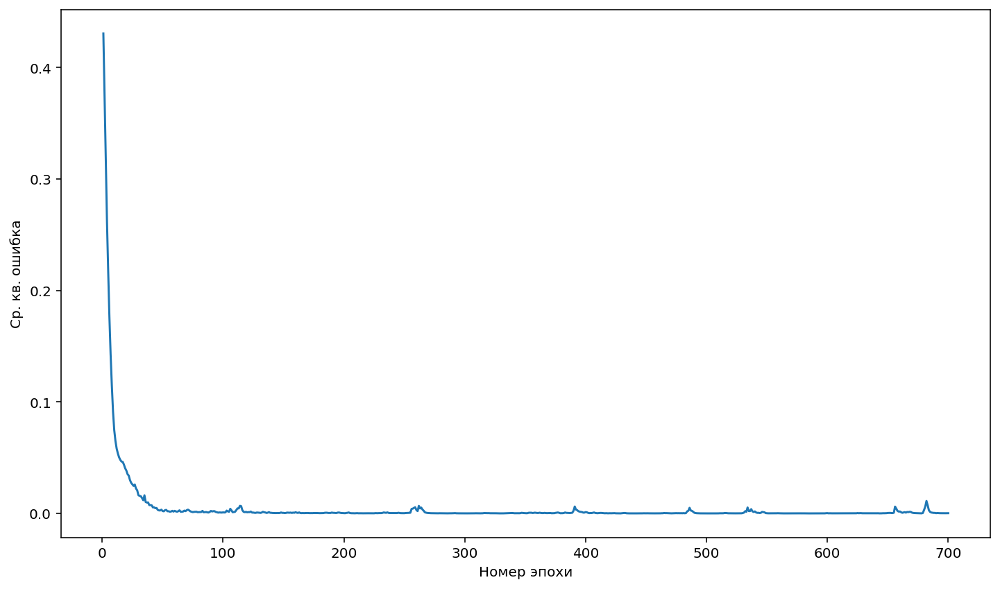

In [59]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [60]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae_rnd.append(max_err_val)

Максимальная ошибка по модулю =  0.03465953445077963


<ipython-input-61-d71d108e7bfc>:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


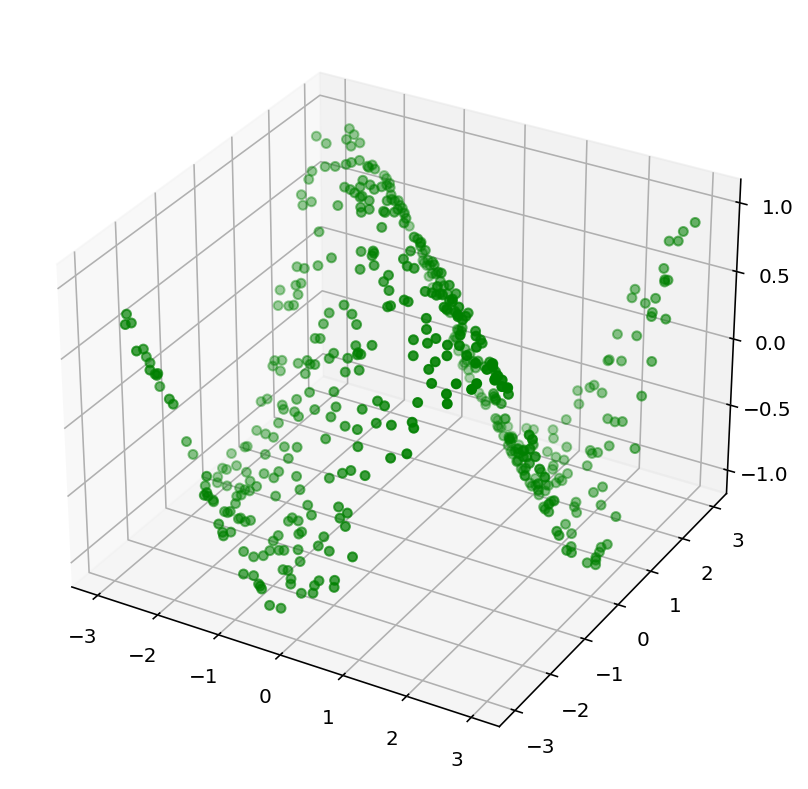

In [61]:
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


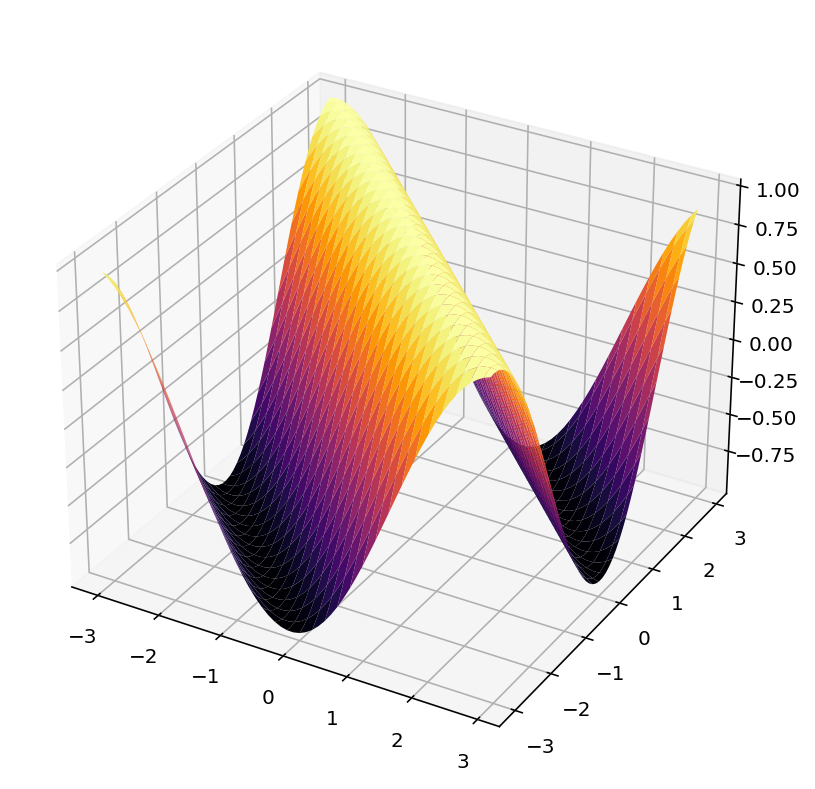

In [62]:
func_draw()

In [63]:
n = 25
xy=[] 
zz=[] 
x, y = get_random_x_y(n)
z= function(x, y, n)
for i in range (0, n*n): 
  xy.append(z[i][0:2]) 
  zz.append(z[i][2])

# Создание модели, добавление слоёв
model = Sequential() 

# Входной слой
model.add(Dense(60, input_dim=2, activation='relu'))

# Определяем число скрытых слоёв и добавляем их
layers_number = 4                 
for i in range(layers_number):
  model.add(Dense(20, activation='relu')) 

# Выходной слой
model.add(Dense(1, activation='linear'))

# Компилируем модель
model.compile(loss="mean_squared_error", optimizer="adam")
history = model.fit(xy, zz, epochs = 700)

# Вычисляем ср. кв. ошибку
mse_rnd.append(history.history['loss'][-1])

# Делаем предсказание
predictions_test = model.predict(test_data)
predictions_train = model.predict(xy)

Epoch 1/700


 1/20 [>.............................] - ETA: 45s - loss: 0.5533

20/20 [==============================] - 2s 2ms/step - loss: 0.4729


Epoch 2/700
 1/20 [>.............................] - ETA: 0s - loss: 0.3968

11/20 [===============>..............] - ETA: 0s - loss: 0.3750

20/20 [==============================] - 0s 5ms/step - loss: 0.3613


Epoch 3/700
 1/20 [>.............................] - ETA: 0s - loss: 0.2515

 2/20 [==>...........................] - ETA: 1s - loss: 0.2513

20/20 [==============================] - 0s 5ms/step - loss: 0.2548


Epoch 4/700
 1/20 [>.............................] - ETA: 0s - loss: 0.1597

18/20 [==========================>...] - ETA: 0s - loss: 0.1911

20/20 [==============================] - 0s 5ms/step - loss: 0.1891


Epoch 5/700
 1/20 [>.............................] - ETA: 0s - loss: 0.1477

 4/20 [=====>........................] - ETA: 0s - loss: 0.1380

20/20 [==============================] - 0s 6ms/step - loss: 0.1343


Epoch 6/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0929

 2/20 [==>...........................] - ETA: 1s - loss: 0.1163

 6/20 [========>.....................] - ETA: 0s - loss: 0.1103

 7/20 [=========>....................] - ETA: 1s - loss: 0.1087

12/20 [=================>............] - ETA: 0s - loss: 0.1014

20/20 [==============================] - 1s 31ms/step - loss: 0.0936


Epoch 7/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0707

 2/20 [==>...........................] - ETA: 1s - loss: 0.0799

 8/20 [===========>..................] - ETA: 0s - loss: 0.0821

16/20 [=======================>......] - ETA: 0s - loss: 0.0775

18/20 [==========================>...] - ETA: 0s - loss: 0.0761

20/20 [==============================] - ETA: 0s - loss: 0.0747

20/20 [==============================] - 0s 26ms/step - loss: 0.0740


Epoch 8/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0755

 2/20 [==>...........................] - ETA: 1s - loss: 0.0623

20/20 [==============================] - ETA: 0s - loss: 0.0482

20/20 [==============================] - 0s 9ms/step - loss: 0.0485


Epoch 9/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0427

 8/20 [===========>..................] - ETA: 0s - loss: 0.0385

20/20 [==============================] - 0s 5ms/step - loss: 0.0424


Epoch 10/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0166

10/20 [==============>...............] - ETA: 0s - loss: 0.0324

20/20 [==============================] - 0s 5ms/step - loss: 0.0364


Epoch 11/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0764

13/20 [==================>...........] - ETA: 0s - loss: 0.0442

20/20 [==============================] - 0s 6ms/step - loss: 0.0410


Epoch 12/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0206

 3/20 [===>..........................] - ETA: 0s - loss: 0.0243

 6/20 [========>.....................] - ETA: 0s - loss: 0.0284

 7/20 [=========>....................] - ETA: 0s - loss: 0.0289

10/20 [==============>...............] - ETA: 0s - loss: 0.0316

20/20 [==============================] - 0s 21ms/step - loss: 0.0335


Epoch 13/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0263

 2/20 [==>...........................] - ETA: 1s - loss: 0.0307

12/20 [=================>............] - ETA: 0s - loss: 0.0306

19/20 [===========================>..] - ETA: 0s - loss: 0.0289

20/20 [==============================] - 0s 21ms/step - loss: 0.0285


Epoch 14/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0706

13/20 [==================>...........] - ETA: 0s - loss: 0.0322

20/20 [==============================] - 0s 5ms/step - loss: 0.0290


Epoch 15/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0262

 6/20 [========>.....................] - ETA: 0s - loss: 0.0257

20/20 [==============================] - 0s 5ms/step - loss: 0.0210


Epoch 16/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0084

20/20 [==============================] - 0s 1ms/step - loss: 0.0163


Epoch 17/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0145

13/20 [==================>...........] - ETA: 0s - loss: 0.0123

14/20 [====================>.........] - ETA: 0s - loss: 0.0123

15/20 [=====================>........] - ETA: 0s - loss: 0.0123

20/20 [==============================] - 1s 27ms/step - loss: 0.0127


Epoch 18/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0246

 4/20 [=====>........................] - ETA: 0s - loss: 0.0189

 7/20 [=========>....................] - ETA: 0s - loss: 0.0157

17/20 [========================>.....] - ETA: 0s - loss: 0.0140

20/20 [==============================] - ETA: 0s - loss: 0.0138

20/20 [==============================] - 0s 22ms/step - loss: 0.0138


Epoch 19/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0059

11/20 [===============>..............] - ETA: 0s - loss: 0.0117

20/20 [==============================] - 0s 5ms/step - loss: 0.0111


Epoch 20/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0074

 2/20 [==>...........................] - ETA: 1s - loss: 0.0100

20/20 [==============================] - ETA: 0s - loss: 0.0101

20/20 [==============================] - 0s 8ms/step - loss: 0.0101


Epoch 21/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0025

 8/20 [===========>..................] - ETA: 0s - loss: 0.0055

16/20 [=======================>......] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 11ms/step - loss: 0.0073


Epoch 22/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0041

 2/20 [==>...........................] - ETA: 3s - loss: 0.0036

14/20 [====================>.........] - ETA: 0s - loss: 0.0045

20/20 [==============================] - 0s 16ms/step - loss: 0.0051


Epoch 23/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0057

 2/20 [==>...........................] - ETA: 1s - loss: 0.0050

11/20 [===============>..............] - ETA: 0s - loss: 0.0055

14/20 [====================>.........] - ETA: 0s - loss: 0.0055

20/20 [==============================] - 0s 17ms/step - loss: 0.0055


Epoch 24/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0062

12/20 [=================>............] - ETA: 0s - loss: 0.0042

20/20 [==============================] - 0s 5ms/step - loss: 0.0045


Epoch 25/700


 1/20 [>.............................] - ETA: 6s - loss: 0.0075

 2/20 [==>...........................] - ETA: 2s - loss: 0.0068

 6/20 [========>.....................] - ETA: 0s - loss: 0.0058

20/20 [==============================] - 1s 12ms/step - loss: 0.0053


Epoch 26/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0056

 7/20 [=========>....................] - ETA: 0s - loss: 0.0041

10/20 [==============>...............] - ETA: 0s - loss: 0.0041

18/20 [==========================>...] - ETA: 0s - loss: 0.0041

20/20 [==============================] - 0s 16ms/step - loss: 0.0042


Epoch 27/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0038

 7/20 [=========>....................] - ETA: 0s - loss: 0.0039

20/20 [==============================] - 0s 7ms/step - loss: 0.0039


Epoch 28/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0055

18/20 [==========================>...] - ETA: 0s - loss: 0.0031

20/20 [==============================] - 0s 5ms/step - loss: 0.0031


Epoch 29/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

11/20 [===============>..............] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 5ms/step - loss: 0.0026


Epoch 30/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

 4/20 [=====>........................] - ETA: 0s - loss: 0.0016

 5/20 [======>.......................] - ETA: 0s - loss: 0.0017

10/20 [==============>...............] - ETA: 0s - loss: 0.0019

11/20 [===============>..............] - ETA: 0s - loss: 0.0020

12/20 [=================>............] - ETA: 0s - loss: 0.0020

14/20 [====================>.........] - ETA: 0s - loss: 0.0020

15/20 [=====================>........] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 1s 41ms/step - loss: 0.0022


Epoch 31/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0021

 7/20 [=========>....................] - ETA: 0s - loss: 0.0038

10/20 [==============>...............] - ETA: 0s - loss: 0.0036

14/20 [====================>.........] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 16ms/step - loss: 0.0031


Epoch 32/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

 9/20 [============>.................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 5ms/step - loss: 0.0021


Epoch 33/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 2ms/step - loss: 0.0023


Epoch 34/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

12/20 [=================>............] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 5ms/step - loss: 0.0022


Epoch 35/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 36/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

16/20 [=======================>......] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 5ms/step - loss: 0.0020


Epoch 37/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

 6/20 [========>.....................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 4ms/step - loss: 0.0020


Epoch 38/700


 1/20 [>.............................] - ETA: 0s - loss: 4.7682e-04

 9/20 [============>.................] - ETA: 0s - loss: 0.0010    

18/20 [==========================>...] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 0s 10ms/step - loss: 0.0013


Epoch 39/700


 1/20 [>.............................] - ETA: 5s - loss: 3.4459e-04

14/20 [====================>.........] - ETA: 0s - loss: 0.0017    

20/20 [==============================] - 0s 6ms/step - loss: 0.0018


Epoch 40/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

 2/20 [==>...........................] - ETA: 1s - loss: 0.0014

 4/20 [=====>........................] - ETA: 0s - loss: 0.0016

 9/20 [============>.................] - ETA: 0s - loss: 0.0017

17/20 [========================>.....] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 20ms/step - loss: 0.0018


Epoch 41/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

 2/20 [==>...........................] - ETA: 1s - loss: 0.0017

20/20 [==============================] - 0s 5ms/step - loss: 0.0017


Epoch 42/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0028

12/20 [=================>............] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 6ms/step - loss: 0.0031


Epoch 43/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0031

20/20 [==============================] - 0s 1ms/step - loss: 0.0018


Epoch 44/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0010

18/20 [==========================>...] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 5ms/step - loss: 0.0013


Epoch 45/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

 9/20 [============>.................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 5ms/step - loss: 0.0020


Epoch 46/700


 1/20 [>.............................]

 - ETA: 1s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 47/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

17/20 [========================>.....] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 5ms/step - loss: 0.0014


Epoch 48/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0013

 5/20 [======>.......................] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 5ms/step - loss: 0.0016


Epoch 49/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8147e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 50/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3429e-04

 3/20 [===>..........................] - ETA: 0s - loss: 0.0011    

 5/20 [======>.......................] - ETA: 1s - loss: 0.0012

 6/20 [========>.....................] - ETA: 1s - loss: 0.0012

12/20 [=================>............] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 1s 32ms/step - loss: 0.0015


Epoch 51/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0021

 7/20 [=========>....................] - ETA: 0s - loss: 0.0013

 8/20 [===========>..................] - ETA: 0s - loss: 0.0013

11/20 [===============>..............] - ETA: 0s - loss: 0.0014

18/20 [==========================>...] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 1s 23ms/step - loss: 0.0014


Epoch 52/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0027

 3/20 [===>..........................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 5ms/step - loss: 0.0013


Epoch 53/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9363e-04

11/20 [===============>..............] - ETA: 0s - loss: 8.0069e-04

20/20 [==============================] - 0s 6ms/step - loss: 8.7045e-04


Epoch 54/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0438e-04

20/20 [==============================] - ETA: 0s - loss: 9.3152e-04

20/20 [==============================] - 0s 5ms/step - loss: 9.4183e-04


Epoch 55/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7385e-04

 4/20 [=====>........................] - ETA: 0s - loss: 5.1375e-04



18/20 [==========================>...] - ETA: 0s - loss: 9.3043e-04

20/20 [==============================] - 0s 10ms/step - loss: 0.0010


Epoch 56/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8188e-04

 8/20 [===========>..................] - ETA: 0s - loss: 0.0022    

19/20 [===========================>..] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 7ms/step - loss: 0.0019


Epoch 57/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

 9/20 [============>.................] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 0s 6ms/step - loss: 0.0011


Epoch 58/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6299e-04

10/20 [==============>...............] - ETA: 0s - loss: 8.7304e-04

20/20 [==============================] - ETA: 0s - loss: 9.3322e-04

20/20 [==============================] - 0s 7ms/step - loss: 9.3413e-04


Epoch 59/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9182e-04

18/20 [==========================>...] - ETA: 0s - loss: 7.5279e-04

20/20 [==============================] - 0s 4ms/step - loss: 7.6441e-04


Epoch 60/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

 9/20 [============>.................] - ETA: 0s - loss: 7.5389e-04

20/20 [==============================] - 0s 6ms/step - loss: 7.9696e-04


Epoch 61/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0140e-04

10/20 [==============>...............] - ETA: 0s - loss: 8.4868e-04

18/20 [==========================>...] - ETA: 0s - loss: 8.5790e-04

20/20 [==============================] - 0s 6ms/step - loss: 8.5546e-04


Epoch 62/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0010

 7/20 [=========>....................] - ETA: 0s - loss: 0.0010

20/20 [==============================] - 0s 4ms/step - loss: 9.3608e-04


Epoch 63/700


 1/20 [>.............................] - ETA: 0s - loss: 2.8368e-04

20/20 [==============================] - 0s 2ms/step - loss: 6.9195e-04


Epoch 64/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 2ms/step - loss: 0.0011


Epoch 65/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8902e-04

20/20 [==============================] - 0s 2ms/step - loss: 6.5237e-04


Epoch 66/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

 6/20 [========>.....................] - ETA: 0s - loss: 0.0013

 7/20 [=========>....................] - ETA: 0s - loss: 0.0013

10/20 [==============>...............] - ETA: 0s - loss: 0.0012

13/20 [==================>...........] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 1s 32ms/step - loss: 0.0011


Epoch 67/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0014

10/20 [==============>...............] - ETA: 0s - loss: 0.0010

13/20 [==================>...........] - ETA: 0s - loss: 0.0010

15/20 [=====================>........] - ETA: 0s - loss: 0.0010

18/20 [==========================>...] - ETA: 0s - loss: 0.0010

20/20 [==============================] - 1s 27ms/step - loss: 0.0010


Epoch 68/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

15/20 [=====================>........] - ETA: 0s - loss: 9.6643e-04

20/20 [==============================] - 0s 6ms/step - loss: 9.1510e-04


Epoch 69/700


 1/20 [>.............................] - ETA: 1s - loss: 2.7748e-04

12/20 [=================>............] - ETA: 0s - loss: 5.3105e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.2719e-04


Epoch 70/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5457e-04

12/20 [=================>............] - ETA: 0s - loss: 4.8193e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.3018e-04


Epoch 71/700
 1/20 [>.............................] - ETA: 1s - loss: 9.3137e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.3335e-04


Epoch 72/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5790e-04

 2/20 [==>...........................] - ETA: 8s - loss: 5.5354e-04

 7/20 [=========>....................] - ETA: 1s - loss: 6.5254e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.5740e-04

11/20 [===============>..............] - ETA: 0s - loss: 6.5723e-04

13/20 [==================>...........] - ETA: 0s - loss: 6.5362e-04

14/20 [====================>.........] - ETA: 0s - loss: 6.5409e-04

15/20 [=====================>........] - ETA: 0s - loss: 6.5250e-04

20/20 [==============================] - 1s 59ms/step - loss: 6.5224e-04


Epoch 73/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7208e-04

15/20 [=====================>........] - ETA: 0s - loss: 4.7732e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.0796e-04


Epoch 74/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0701e-04

19/20 [===========================>..] - ETA: 0s - loss: 6.6908e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.6612e-04


Epoch 75/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7243e-04

 7/20 [=========>....................] - ETA: 0s - loss: 7.7568e-04

20/20 [==============================] - 0s 6ms/step - loss: 7.1562e-04


Epoch 76/700


 1/20 [>.............................] - ETA: 0s - loss: 2.9730e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.0599e-04

13/20 [==================>...........] - ETA: 0s - loss: 4.8795e-04

20/20 [==============================] - 0s 10ms/step - loss: 5.0189e-04


Epoch 77/700
 1/20 [>.............................] - ETA: 1s - loss: 8.2333e-04

 4/20 [=====>........................] - ETA: 0s - loss: 5.2624e-04

15/20 [=====================>........] - ETA: 0s - loss: 5.6705e-04

20/20 [==============================] - 0s 12ms/step - loss: 5.6680e-04


Epoch 78/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5130e-04

 5/20 [======>.......................] - ETA: 0s - loss: 7.0205e-04

20/20 [==============================] - ETA: 0s - loss: 6.5043e-04

20/20 [==============================] - 0s 10ms/step - loss: 6.4866e-04


Epoch 79/700


 1/20 [>.............................] - ETA: 2s - loss: 4.1985e-04

 6/20 [========>.....................] - ETA: 0s - loss: 4.4566e-04

 7/20 [=========>....................] - ETA: 0s - loss: 4.5886e-04

12/20 [=================>............] - ETA: 0s - loss: 5.0763e-04

18/20 [==========================>...] - ETA: 0s - loss: 5.2701e-04

20/20 [==============================] - 0s 17ms/step - loss: 5.2512e-04


Epoch 80/700


 1/20 [>.............................] - ETA: 0s - loss: 4.2352e-04

11/20 [===============>..............] - ETA: 0s - loss: 4.9281e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.7564e-04


Epoch 81/700
 1/20 [>.............................] - ETA: 0s - loss: 6.5673e-04

20/20 [==============================] - 0s 2ms/step - loss: 6.3052e-04


Epoch 82/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9980e-05

10/20 [==============>...............] - ETA: 0s - loss: 2.8010e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.3481e-04

18/20 [==========================>...] - ETA: 0s - loss: 3.3827e-04

19/20 [===========================>..] - ETA: 0s - loss: 3.4237e-04

20/20 [==============================] - 1s 31ms/step - loss: 3.4869e-04


Epoch 83/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2898e-04

 2/20 [==>...........................] - ETA: 0s - loss: 4.0253e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.7290e-04

12/20 [=================>............] - ETA: 0s - loss: 3.3552e-04

20/20 [==============================] - 0s 9ms/step - loss: 3.1854e-04


Epoch 84/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6100e-04

 9/20 [============>.................] - ETA: 0s - loss: 4.4136e-04

20/20 [==============================] - ETA: 0s - loss: 4.9071e-04

20/20 [==============================] - 0s 10ms/step - loss: 4.9486e-04


Epoch 85/700


 1/20 [>.............................] - ETA: 0s - loss: 5.5268e-04

10/20 [==============>...............] - ETA: 0s - loss: 7.5916e-04

20/20 [==============================] - 0s 6ms/step - loss: 7.4634e-04


Epoch 86/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

 2/20 [==>...........................] - ETA: 1s - loss: 9.3996e-04

18/20 [==========================>...] - ETA: 0s - loss: 8.9798e-04

20/20 [==============================] - 0s 9ms/step - loss: 8.8105e-04


Epoch 87/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7965e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.0740e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.1787e-04

20/20 [==============================] - 0s 10ms/step - loss: 3.5233e-04


Epoch 88/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2859e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.6116e-04

16/20 [=======================>......] - ETA: 0s - loss: 4.4876e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.2847e-04


Epoch 89/700
 1/20 [>.............................] - ETA: 0s - loss: 7.4330e-04

 5/20 [======>.......................] - ETA: 0s - loss: 4.6563e-04

18/20 [==========================>...] - ETA: 0s - loss: 4.3893e-04

20/20 [==============================] - 0s 8ms/step - loss: 4.3187e-04


Epoch 90/700


 1/20 [>.............................] - ETA: 1s - loss: 2.4196e-04

16/20 [=======================>......] - ETA: 0s - loss: 5.0326e-04

20/20 [==============================] - 0s 6ms/step - loss: 5.3170e-04


Epoch 91/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5217e-04

 3/20 [===>..........................] - ETA: 0s - loss: 3.5386e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.4287e-04


Epoch 92/700


 1/20 [>.............................] - ETA: 2s - loss: 1.7508e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.8502e-04

 7/20 [=========>....................] - ETA: 0s - loss: 7.1651e-04

16/20 [=======================>......] - ETA: 0s - loss: 0.0011    

20/20 [==============================] - 0s 15ms/step - loss: 0.0011


Epoch 93/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

 7/20 [=========>....................] - ETA: 0s - loss: 0.0023

16/20 [=======================>......] - ETA: 0s - loss: 0.0020

18/20 [==========================>...] - ETA: 0s - loss: 0.0020

20/20 [==============================] - 0s 16ms/step - loss: 0.0020


Epoch 94/700


 1/20 [>.............................] - ETA: 1s - loss: 6.8633e-04

 3/20 [===>..........................] - ETA: 0s - loss: 8.8349e-04

11/20 [===============>..............] - ETA: 0s - loss: 9.6524e-04

20/20 [==============================] - 0s 11ms/step - loss: 9.6111e-04


Epoch 95/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2485e-04

 6/20 [========>.....................] - ETA: 0s - loss: 7.4847e-04

12/20 [=================>............] - ETA: 0s - loss: 8.4638e-04

14/20 [====================>.........] - ETA: 0s - loss: 8.9908e-04

20/20 [==============================] - 0s 12ms/step - loss: 0.0011


Epoch 96/700
 1/20 [>.............................] - ETA: 0s - loss: 8.4713e-04

 8/20 [===========>..................] - ETA: 0s - loss: 7.7099e-04

20/20 [==============================] - 0s 6ms/step - loss: 6.4907e-04


Epoch 97/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3687e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.3490e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7850e-04


Epoch 98/700
 1/20 [>.............................] - ETA: 1s - loss: 5.1105e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.6662e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.5511e-04


Epoch 99/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5656e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.3288e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.8461e-04


Epoch 100/700


 1/20 [>.............................] - ETA: 0s - loss: 2.0495e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.3089e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.5660e-04


Epoch 101/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7143e-04

 9/20 [============>.................] - ETA: 0s - loss: 4.8625e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.2746e-04


Epoch 102/700


 1/20 [>.............................] - ETA: 1s - loss: 5.5326e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.6474e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.5177e-04


Epoch 103/700


 1/20 [>.............................] - ETA: 0s - loss: 2.3498e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.7910e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.8986e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.8195e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.8140e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.8049e-04

20/20 [==============================] - ETA: 0s - loss: 2.8045e-04

20/20 [==============================] - 1s 30ms/step - loss: 2.8038e-04


Epoch 104/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0724e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.2510e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.0629e-04

17/20 [========================>.....] - ETA: 0s - loss: 3.0130e-04

19/20 [===========================>..] - ETA: 0s - loss: 2.9990e-04

20/20 [==============================] - 0s 20ms/step - loss: 2.9831e-04


Epoch 105/700


 1/20 [>.............................] - ETA: 0s - loss: 2.3732e-04

 2/20 [==>...........................] - ETA: 1s - loss: 2.3903e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.2185e-04


Epoch 106/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3406e-04

18/20 [==========================>...] - ETA: 0s - loss: 4.0386e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.9635e-04


Epoch 107/700


 1/20 [>.............................] - ETA: 0s - loss: 2.6146e-04

 8/20 [===========>..................] - ETA: 0s - loss: 2.0963e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.3795e-04


Epoch 108/700


 1/20 [>.............................] - ETA: 1s - loss: 5.1846e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.7530e-04


Epoch 109/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3073e-04

13/20 [==================>...........] - ETA: 0s - loss: 5.0406e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.2261e-04


Epoch 110/700


 1/20 [>.............................] - ETA: 0s - loss: 0.0012

 3/20 [===>..........................] - ETA: 0s - loss: 0.0021

20/20 [==============================] - 0s 5ms/step - loss: 0.0027


Epoch 111/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3129e-04

20/20 [==============================] - 0s 1ms/step - loss: 8.3884e-04


Epoch 112/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0305e-04

18/20 [==========================>...] - ETA: 0s - loss: 5.8351e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.7183e-04


Epoch 113/700


 1/20 [>.............................] - ETA: 1s - loss: 3.7414e-04

 6/20 [========>.....................] - ETA: 0s - loss: 5.3001e-04

19/20 [===========================>..] - ETA: 0s - loss: 7.1802e-04

20/20 [==============================] - 0s 11ms/step - loss: 7.2404e-04


Epoch 114/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6524e-04

 7/20 [=========>....................] - ETA: 0s - loss: 7.7467e-04

 8/20 [===========>..................] - ETA: 0s - loss: 7.8622e-04

11/20 [===============>..............] - ETA: 0s - loss: 8.0608e-04

20/20 [==============================] - 0s 22ms/step - loss: 8.6587e-04


Epoch 115/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6974e-04

 2/20 [==>...........................] - ETA: 1s - loss: 6.6008e-04

 6/20 [========>.....................] - ETA: 0s - loss: 7.6804e-04

15/20 [=====================>........] - ETA: 0s - loss: 6.6798e-04

20/20 [==============================] - 0s 15ms/step - loss: 6.2246e-04


Epoch 116/700


 1/20 [>.............................] - ETA: 2s - loss: 7.1916e-04

 6/20 [========>.....................] - ETA: 0s - loss: 4.5139e-04

20/20 [==============================] - 0s 6ms/step - loss: 3.5767e-04


Epoch 117/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4811e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.5890e-04


Epoch 118/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7563e-04

16/20 [=======================>......] - ETA: 0s - loss: 4.7668e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.7543e-04


Epoch 119/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5094e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.3727e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.8341e-04


Epoch 120/700


 1/20 [>.............................] - ETA: 1s - loss: 1.4104e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.9260e-04


Epoch 121/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3979e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.9070e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.1726e-04


Epoch 122/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

 4/20 [=====>........................] - ETA: 0s - loss: 8.5139e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.5100e-04


Epoch 123/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4451e-04

20/20 [==============================] - ETA: 0s - loss: 2.9274e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.9358e-04


Epoch 124/700


 1/20 [>.............................] - ETA: 1s - loss: 9.7413e-04

 4/20 [=====>........................] - ETA: 0s - loss: 7.2364e-04

12/20 [=================>............] - ETA: 0s - loss: 6.8135e-04

13/20 [==================>...........] - ETA: 0s - loss: 6.7523e-04

20/20 [==============================] - 1s 27ms/step - loss: 6.4520e-04


Epoch 125/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0989e-04

 4/20 [=====>........................] - ETA: 0s - loss: 4.0730e-04

10/20 [==============>...............] - ETA: 0s - loss: 4.6349e-04

15/20 [=====================>........] - ETA: 0s - loss: 4.6222e-04

20/20 [==============================] - 0s 16ms/step - loss: 4.5071e-04


Epoch 126/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4046e-04

 3/20 [===>..........................] - ETA: 0s - loss: 5.6410e-04

11/20 [===============>..............] - ETA: 0s - loss: 5.6611e-04

20/20 [==============================] - 0s 11ms/step - loss: 6.3019e-04


Epoch 127/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1368e-04

16/20 [=======================>......] - ETA: 0s - loss: 5.2097e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.9943e-04


Epoch 128/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8818e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.6326e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7799e-04


Epoch 129/700


 1/20 [>.............................] - ETA: 0s - loss: 2.3846e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.0855e-04


Epoch 130/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9126e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.0827e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.1432e-04


Epoch 131/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6184e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.2641e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.2361e-04


Epoch 132/700
 1/20 [>.............................] - ETA: 1s - loss: 4.2576e-04

20/20 [==============================] - 0s 2ms/step - loss: 4.1740e-04


Epoch 133/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7551e-04

13/20 [==================>...........] - ETA: 0s - loss: 8.4921e-04

20/20 [==============================] - 0s 5ms/step - loss: 8.2412e-04


Epoch 134/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2636e-04

 5/20 [======>.......................] - ETA: 0s - loss: 4.1553e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.6205e-04


Epoch 135/700


 1/20 [>.............................] - ETA: 0s - loss: 3.2303e-04

 2/20 [==>...........................] - ETA: 1s - loss: 3.4114e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.4954e-04

16/20 [=======================>......] - ETA: 0s - loss: 4.5629e-04

20/20 [==============================] - 0s 16ms/step - loss: 4.6318e-04


Epoch 136/700


 1/20 [>.............................] - ETA: 1s - loss: 5.9601e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.6961e-04

20/20 [==============================] - ETA: 0s - loss: 6.1363e-04

20/20 [==============================] - 0s 11ms/step - loss: 6.1001e-04


Epoch 137/700


 1/20 [>.............................] - ETA: 2s - loss: 1.3556e-04

 3/20 [===>..........................] - ETA: 0s - loss: 3.5089e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.7171e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.7381e-04

20/20 [==============================] - ETA: 0s - loss: 3.7614e-04

20/20 [==============================] - 0s 20ms/step - loss: 3.7575e-04


Epoch 138/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0740e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.0820e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.9430e-04


Epoch 139/700
 1/20 [>.............................] - ETA: 0s - loss: 7.8490e-05

 3/20 [===>..........................] - ETA: 0s - loss: 1.3382e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.7133e-04


Epoch 140/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0021

17/20 [========================>.....] - ETA: 0s - loss: 6.5309e-04

20/20 [==============================] - 0s 5ms/step - loss: 6.1258e-04


Epoch 141/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9942e-04

 4/20 [=====>........................] - ETA: 0s - loss: 2.2377e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.9263e-04

20/20 [==============================] - 0s 9ms/step - loss: 2.9805e-04


Epoch 142/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3035e-04

 6/20 [========>.....................] - ETA: 0s - loss: 2.5572e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.1918e-04


Epoch 143/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2032e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.5362e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.6459e-04


Epoch 144/700


 1/20 [>.............................] - ETA: 0s - loss: 1.9984e-04

 5/20 [======>.......................] - ETA: 0s - loss: 2.8041e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7192e-04


Epoch 145/700


 1/20 [>.............................] - ETA: 0s - loss: 2.2187e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.3660e-04


Epoch 146/700


 1/20 [>.............................] - ETA: 0s - loss: 1.9032e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.7076e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.7355e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.7463e-04

20/20 [==============================] - 1s 32ms/step - loss: 1.7751e-04


Epoch 147/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0508e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.5589e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.9113e-04

20/20 [==============================] - 0s 10ms/step - loss: 3.0323e-04


Epoch 148/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0946e-04

 3/20 [===>..........................] - ETA: 0s - loss: 6.8208e-04

10/20 [==============>...............] - ETA: 0s - loss: 5.9337e-04

18/20 [==========================>...] - ETA: 0s - loss: 5.4785e-04

20/20 [==============================] - 0s 15ms/step - loss: 5.3806e-04


Epoch 149/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1155e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.1007e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.3324e-04


Epoch 150/700
 1/20 [>.............................] - ETA: 1s - loss: 4.2828e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.3147e-04


Epoch 151/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5534e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.2144e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.1913e-04


Epoch 152/700


 1/20 [>.............................] - ETA: 0s - loss: 1.3138e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.5254e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.2068e-04


Epoch 153/700


 1/20 [>.............................] - ETA: 1s - loss: 4.0281e-04

19/20 [===========================>..] - ETA: 0s - loss: 3.8592e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.8625e-04


Epoch 154/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5313e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.5012e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.9521e-04


Epoch 155/700


 1/20 [>.............................] - ETA: 1s - loss: 4.1332e-04

 6/20 [========>.....................] - ETA: 0s - loss: 8.6954e-04

14/20 [====================>.........] - ETA: 0s - loss: 9.5037e-04

20/20 [==============================] - 0s 10ms/step - loss: 9.4816e-04


Epoch 156/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5751e-04

 3/20 [===>..........................] - ETA: 0s - loss: 6.2438e-04

 9/20 [============>.................] - ETA: 0s - loss: 6.8324e-04

15/20 [=====================>........] - ETA: 0s - loss: 6.8452e-04

20/20 [==============================] - 0s 16ms/step - loss: 6.9066e-04


Epoch 157/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9630e-04

11/20 [===============>..............] - ETA: 0s - loss: 4.4712e-04

20/20 [==============================] - 0s 6ms/step - loss: 4.8513e-04


Epoch 158/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0020

 2/20 [==>...........................] - ETA: 1s - loss: 0.0018

 3/20 [===>..........................] - ETA: 2s - loss: 0.0016

11/20 [===============>..............] - ETA: 0s - loss: 0.0011

15/20 [=====================>........] - ETA: 0s - loss: 0.0010

18/20 [==========================>...] - ETA: 0s - loss: 9.5772e-04

20/20 [==============================] - 1s 30ms/step - loss: 9.1082e-04


Epoch 159/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4806e-04

 7/20 [=========>....................] - ETA: 0s - loss: 4.1227e-04

20/20 [==============================] - 0s 6ms/step - loss: 3.5826e-04


Epoch 160/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3095e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.1177e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7638e-04


Epoch 161/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9125e-04

 5/20 [======>.......................] - ETA: 0s - loss: 4.5544e-04

20/20 [==============================] - 0s 5ms/step - loss: 4.2329e-04


Epoch 162/700
 1/20 [>.............................] - ETA: 1s - loss: 4.9986e-04

20/20 [==============================] - 0s 1ms/step - loss: 6.0031e-04


Epoch 163/700
 1/20 [>.............................] - ETA: 0s - loss: 9.5459e-04

 6/20 [========>.....................] - ETA: 0s - loss: 9.0235e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.0413e-04


Epoch 164/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5977e-04

16/20 [=======================>......] - ETA: 0s - loss: 6.8328e-04

20/20 [==============================] - 0s 4ms/step - loss: 6.8130e-04


Epoch 165/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

20/20 [==============================] - 0s 1ms/step - loss: 8.8362e-04


Epoch 166/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6615e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.3832e-04


Epoch 167/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0550e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.1061e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.2181e-04


Epoch 168/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7380e-05

11/20 [===============>..............] - ETA: 0s - loss: 1.8189e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.8817e-04


Epoch 169/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4318e-04

18/20 [==========================>...] - ETA: 0s - loss: 3.2127e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.3815e-04


Epoch 170/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 2ms/step - loss: 6.7168e-04


Epoch 171/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2277e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.1055e-04


Epoch 172/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9628e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.4935e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.6761e-04


Epoch 173/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7155e-04

20/20 [==============================] - ETA: 0s - loss: 2.9969e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.0001e-04


Epoch 174/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1119e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.9548e-04


Epoch 175/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0683e-04

19/20 [===========================>..] - ETA: 0s - loss: 4.1560e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.2526e-04


Epoch 176/700


 1/20 [>.............................] - ETA: 0s - loss: 9.7306e-04

20/20 [==============================] - 0s 2ms/step - loss: 8.7608e-04


Epoch 177/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6054e-04

11/20 [===============>..............] - ETA: 0s - loss: 5.8913e-04

20/20 [==============================] - 0s 5ms/step - loss: 5.7378e-04


Epoch 178/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5892e-04

19/20 [===========================>..] - ETA: 0s - loss: 4.8944e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.9277e-04


Epoch 179/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6135e-04

20/20 [==============================] - 0s 1ms/step - loss: 8.2534e-04


Epoch 180/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

10/20 [==============>...............] - ETA: 0s - loss: 7.9543e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.9027e-04


Epoch 181/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6256e-04

14/20 [====================>.........] - ETA: 0s - loss: 4.0005e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.2857e-04


Epoch 182/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9519e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.8750e-04


Epoch 183/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8854e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.7230e-04


Epoch 184/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8915e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.7762e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.6193e-04


Epoch 185/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4650e-05

20/20 [==============================] - ETA: 0s - loss: 1.5705e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5834e-04


Epoch 186/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8701e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.8362e-04


Epoch 187/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

11/20 [===============>..............] - ETA: 0s - loss: 6.8421e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.5717e-04


Epoch 188/700


 1/20 [>.............................] - ETA: 0s - loss: 6.0683e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.6836e-04


Epoch 189/700


 1/20 [>.............................] - ETA: 0s - loss: 2.7621e-04

10/20 [==============>...............] - ETA: 0s - loss: 4.2277e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.5837e-04


Epoch 190/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9576e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.2869e-04


Epoch 191/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4508e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.2319e-04


Epoch 192/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3142e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.8051e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.7273e-04

20/20 [==============================] - ETA: 0s - loss: 1.6817e-04

20/20 [==============================] - 0s 13ms/step - loss: 1.6728e-04


Epoch 193/700


 1/20 [>.............................] - ETA: 0s - loss: 1.5766e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.4935e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.3826e-04

19/20 [===========================>..] - ETA: 0s - loss: 1.2444e-04

20/20 [==============================] - 0s 15ms/step - loss: 1.2288e-04


Epoch 194/700


 1/20 [>.............................] - ETA: 0s - loss: 9.3734e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.4407e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.8332e-04


Epoch 195/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2058e-04

 3/20 [===>..........................] - ETA: 0s - loss: 2.6602e-04

12/20 [=================>............] - ETA: 0s - loss: 2.5914e-04

20/20 [==============================] - 0s 11ms/step - loss: 2.4044e-04


Epoch 196/700


 1/20 [>.............................] - ETA: 1s - loss: 1.8516e-04

 3/20 [===>..........................] - ETA: 0s - loss: 1.5437e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.5033e-04

 8/20 [===========>..................] - ETA: 0s - loss: 1.4808e-04

20/20 [==============================] - 0s 18ms/step - loss: 1.2758e-04


Epoch 197/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9107e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.3679e-04

20/20 [==============================] - 0s 5ms/step - loss: 1.1565e-04


Epoch 198/700


 1/20 [>.............................] - ETA: 1s - loss: 2.5586e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.3720e-04

20/20 [==============================] - 0s 6ms/step - loss: 1.2744e-04


Epoch 199/700


 1/20 [>.............................] - ETA: 0s - loss: 2.4418e-04

 2/20 [==>...........................] - ETA: 0s - loss: 2.1729e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.4854e-04


Epoch 200/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4592e-04

17/20 [========================>.....] - ETA: 0s - loss: 9.0255e-05

20/20 [==============================] - 0s 5ms/step - loss: 8.8440e-05


Epoch 201/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2739e-05

16/20 [=======================>......] - ETA: 0s - loss: 6.9536e-05

20/20 [==============================] - ETA: 0s - loss: 6.8494e-05

20/20 [==============================] - 0s 10ms/step - loss: 6.8277e-05


Epoch 202/700


 1/20 [>.............................] - ETA: 5s - loss: 1.0002e-04

 4/20 [=====>........................] - ETA: 1s - loss: 1.0322e-04

 5/20 [======>.......................] - ETA: 1s - loss: 1.0131e-04

 6/20 [========>.....................] - ETA: 1s - loss: 9.8229e-05

15/20 [=====================>........] - ETA: 0s - loss: 1.0334e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.0632e-04

20/20 [==============================] - 1s 32ms/step - loss: 1.1495e-04


Epoch 203/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2016e-04

 6/20 [========>.....................] - ETA: 0s - loss: 1.3458e-04

19/20 [===========================>..] - ETA: 0s - loss: 1.3806e-04

20/20 [==============================] - 0s 10ms/step - loss: 1.3795e-04


Epoch 204/700


 1/20 [>.............................] - ETA: 1s - loss: 4.6146e-05

14/20 [====================>.........] - ETA: 0s - loss: 8.7532e-05

20/20 [==============================] - 0s 6ms/step - loss: 8.4329e-05


Epoch 205/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3329e-05

 3/20 [===>..........................] - ETA: 0s - loss: 9.6897e-05

20/20 [==============================] - 0s 5ms/step - loss: 9.3830e-05


Epoch 206/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8179e-05

 3/20 [===>..........................] - ETA: 0s - loss: 6.5800e-05

 4/20 [=====>........................] - ETA: 3s - loss: 7.1651e-05

15/20 [=====================>........] - ETA: 0s - loss: 8.6728e-05

20/20 [==============================] - 1s 37ms/step - loss: 8.8970e-05


Epoch 207/700
 1/20 [>.............................] - ETA: 1s - loss: 7.4840e-05

10/20 [==============>...............] - ETA: 0s - loss: 6.7341e-05

20/20 [==============================] - ETA: 0s - loss: 6.7066e-05

20/20 [==============================] - 0s 11ms/step - loss: 6.6794e-05


Epoch 208/700


 1/20 [>.............................] - ETA: 2s - loss: 7.4101e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.9869e-05

20/20 [==============================] - 0s 6ms/step - loss: 6.4762e-05


Epoch 209/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1745e-05

 3/20 [===>..........................] - ETA: 0s - loss: 9.4401e-05

20/20 [==============================] - 0s 5ms/step - loss: 1.3417e-04


Epoch 210/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8461e-04

 9/20 [============>.................] - ETA: 0s - loss: 3.3594e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.3814e-04

20/20 [==============================] - 0s 16ms/step - loss: 3.5764e-04


Epoch 211/700


 1/20 [>.............................] - ETA: 0s - loss: 8.3992e-04

 2/20 [==>...........................] - ETA: 1s - loss: 6.6439e-04

 7/20 [=========>....................] - ETA: 0s - loss: 6.5396e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.5684e-04

20/20 [==============================] - 0s 16ms/step - loss: 6.3280e-04


Epoch 212/700


 1/20 [>.............................] - ETA: 1s - loss: 0.0016

 2/20 [==>...........................] - ETA: 1s - loss: 0.0013

 3/20 [===>..........................] - ETA: 1s - loss: 0.0011

 7/20 [=========>....................] - ETA: 0s - loss: 8.1575e-04

18/20 [==========================>...] - ETA: 0s - loss: 6.0472e-04

20/20 [==============================] - 1s 26ms/step - loss: 5.7855e-04


Epoch 213/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0686e-04

 7/20 [=========>....................] - ETA: 0s - loss: 3.5342e-04

20/20 [==============================] - 0s 5ms/step - loss: 3.3803e-04


Epoch 214/700


 1/20 [>.............................] - ETA: 0s - loss: 3.3402e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.9107e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.9447e-04

20/20 [==============================] - 1s 32ms/step - loss: 3.0123e-04


Epoch 215/700
 1/20 [>.............................] - ETA: 1s - loss: 2.0400e-04

 3/20 [===>..........................] - ETA: 0s - loss: 3.3970e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.2736e-04

19/20 [===========================>..] - ETA: 0s - loss: 4.2257e-04

20/20 [==============================] - 0s 15ms/step - loss: 4.1987e-04


Epoch 216/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2417e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.8129e-04

11/20 [===============>..............] - ETA: 0s - loss: 3.0147e-04

20/20 [==============================] - 0s 11ms/step - loss: 3.2214e-04


Epoch 217/700


 1/20 [>.............................] - ETA: 1s - loss: 2.8455e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.9053e-04

20/20 [==============================] - 0s 11ms/step - loss: 2.8476e-04


Epoch 218/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2423e-04

 2/20 [==>...........................] - ETA: 1s - loss: 4.7210e-04

 9/20 [============>.................] - ETA: 0s - loss: 5.5785e-04

15/20 [=====================>........] - ETA: 0s - loss: 6.0331e-04

16/20 [=======================>......] - ETA: 0s - loss: 6.0985e-04

20/20 [==============================] - 0s 26ms/step - loss: 6.5060e-04


Epoch 219/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2295e-04

 2/20 [==>...........................] - ETA: 1s - loss: 0.0012    

10/20 [==============>...............] - ETA: 0s - loss: 0.0016

15/20 [=====================>........] - ETA: 0s - loss: 0.0016

20/20 [==============================] - 0s 16ms/step - loss: 0.0015


Epoch 220/700
 1/20 [>.............................] - ETA: 1s - loss: 0.0029

 8/20 [===========>..................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 6ms/step - loss: 0.0014


Epoch 221/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0030


Epoch 222/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0025

 5/20 [======>.......................] - ETA: 0s - loss: 0.0023

20/20 [==============================] - 0s 4ms/step - loss: 0.0023


Epoch 223/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

16/20 [=======================>......] - ETA: 0s - loss: 9.4687e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.2592e-04


Epoch 224/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2814e-04

10/20 [==============>...............] - ETA: 0s - loss: 6.4461e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.9468e-04


Epoch 225/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9327e-04

20/20 [==============================] - ETA: 0s - loss: 5.0276e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.9946e-04


Epoch 226/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5214e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.4121e-04


Epoch 227/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4705e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5902e-04


Epoch 228/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2720e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.8372e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.8364e-04


Epoch 229/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0664e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.0108e-04


Epoch 230/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4545e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.7747e-04


Epoch 231/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7444e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.5524e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3964e-04


Epoch 232/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1990e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.0614e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0673e-04


Epoch 233/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0201e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.5847e-04


Epoch 234/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3583e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.3713e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.3357e-04


Epoch 235/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4919e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.4028e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3470e-04


Epoch 236/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2813e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8978e-04


Epoch 237/700


 1/20 [>.............................] - ETA: 0s - loss: 8.8834e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.3515e-04


Epoch 238/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0233e-04

13/20 [==================>...........] - ETA: 0s - loss: 2.5730e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.5845e-04


Epoch 239/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6787e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.9221e-04


Epoch 240/700


 1/20 [>.............................] - ETA: 0s - loss: 3.0658e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.4694e-04


Epoch 241/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1793e-04

13/20 [==================>...........] - ETA: 0s - loss: 9.9923e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.2949e-05


Epoch 242/700
 1/20 [>.............................] - ETA: 0s - loss: 7.8670e-05

19/20 [===========================>..] - ETA: 0s - loss: 5.8653e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.8393e-05


Epoch 243/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0345e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.6227e-05


Epoch 244/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8117e-05

11/20 [===============>..............] - ETA: 0s - loss: 5.1553e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.8992e-05


Epoch 245/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2680e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.3831e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.6576e-05


Epoch 246/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0493e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0716e-04


Epoch 247/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3739e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.5876e-05


Epoch 248/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7241e-05

12/20 [=================>............] - ETA: 0s - loss: 7.8232e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.6484e-05


Epoch 249/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0070e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.1462e-05


Epoch 250/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7924e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.5079e-05


Epoch 251/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2721e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.1811e-05


Epoch 252/700


 1/20 [>.............................] - ETA: 0s - loss: 3.4746e-04

14/20 [====================>.........] - ETA: 0s - loss: 0.0016    

20/20 [==============================] - 0s 3ms/step - loss: 0.0021


Epoch 253/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

19/20 [===========================>..] - ETA: 0s - loss: 0.0088

20/20 [==============================] - 0s 3ms/step - loss: 0.0089


Epoch 254/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0069

20/20 [==============================] - 0s 1ms/step - loss: 0.0063


Epoch 255/700
 1/20 [>.............................] - ETA: 0s - loss: 9.8925e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0020


Epoch 256/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

 6/20 [========>.....................] - ETA: 0s - loss: 0.0025

20/20 [==============================] - 0s 4ms/step - loss: 0.0034


Epoch 257/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

16/20 [=======================>......] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 4ms/step - loss: 0.0013


Epoch 258/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4303e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.5291e-04


Epoch 259/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0012

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 260/700
 1/20 [>.............................] - ETA: 0s - loss: 9.5581e-04

 8/20 [===========>..................] - ETA: 0s - loss: 0.0015    

20/20 [==============================] - 0s 4ms/step - loss: 0.0013


Epoch 261/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0906e-04

18/20 [==========================>...] - ETA: 0s - loss: 6.3594e-04

20/20 [==============================] - 0s 4ms/step - loss: 6.2347e-04


Epoch 262/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4427e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.4491e-04


Epoch 263/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1227e-04

10/20 [==============>...............] - ETA: 0s - loss: 3.6401e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.8892e-04


Epoch 264/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0835e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.3445e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2824e-04


Epoch 265/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7819e-05

20/20 [==============================] - ETA: 0s - loss: 1.0289e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0310e-04


Epoch 266/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1770e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5123e-04


Epoch 267/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4462e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.1404e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1336e-04


Epoch 268/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3708e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.4005e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.3175e-04


Epoch 269/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3482e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.0847e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0642e-04


Epoch 270/700
 1/20 [>.............................] - ETA: 0s - loss: 9.6250e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.7522e-05


Epoch 271/700


 1/20 [>.............................] - ETA: 0s - loss: 9.4770e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.5276e-04


Epoch 272/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3023e-04

 7/20 [=========>....................] - ETA: 0s - loss: 1.5255e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6823e-04


Epoch 273/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7871e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.0168e-04



20/20 [==============================] - 0s 3ms/step - loss: 1.9361e-04


Epoch 274/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3646e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.7417e-05


Epoch 275/700


 1/20 [>.............................] - ETA: 0s - loss: 2.0017e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.1590e-04


Epoch 276/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9951e-05



17/20 [========================>.....] - ETA: 0s - loss: 5.7451e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.8089e-05


Epoch 277/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3027e-05

15/20 [=====================>........] - ETA: 0s - loss: 5.2515e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.2510e-05


Epoch 278/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1577e-05

18/20 [==========================>...] - ETA: 0s - loss: 6.8467e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.7222e-05


Epoch 279/700


 1/20 [>.............................] - ETA: 0s - loss: 4.3926e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.7980e-05


Epoch 280/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4527e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.5808e-05


Epoch 281/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0729e-05

11/20 [===============>..............] - ETA: 0s - loss: 4.3083e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.0860e-05


Epoch 282/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0805e-05

17/20 [========================>.....] - ETA: 0s - loss: 4.4970e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.5832e-05


Epoch 283/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5603e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.0757e-05


Epoch 284/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1220e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.2874e-04


Epoch 285/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3719e-05

11/20 [===============>..............] - ETA: 0s - loss: 1.0799e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2694e-04


Epoch 286/700
 1/20 [>.............................] - ETA: 0s - loss: 8.1366e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.7838e-04


Epoch 287/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6459e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.5326e-04


Epoch 288/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2376e-04

 8/20 [===========>..................] - ETA: 0s - loss: 9.4525e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.5107e-05


Epoch 289/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5666e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.7436e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.1547e-05


Epoch 290/700


 1/20 [>.............................] - ETA: 0s - loss: 3.4720e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.7507e-05


Epoch 291/700


 1/20 [>.............................] - ETA: 0s - loss: 6.1973e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1682e-04


Epoch 292/700
 1/20 [>.............................] - ETA: 0s - loss: 6.9905e-04

 9/20 [============>.................] - ETA: 0s - loss: 3.9846e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.1197e-04


Epoch 293/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9286e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3347e-04


Epoch 294/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4266e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.9136e-04


Epoch 295/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8114e-04

11/20 [===============>..............] - ETA: 0s - loss: 4.7469e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.3229e-04


Epoch 296/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9422e-04



 9/20 [============>.................] - ETA: 0s - loss: 4.8454e-04

20/20 [==============================] - 0s 4ms/step - loss: 6.4412e-04


Epoch 297/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

16/20 [=======================>......] - ETA: 0s - loss: 9.8214e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.3932e-04


Epoch 298/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0011

20/20 [==============================] - 0s 1ms/step - loss: 5.4464e-04


Epoch 299/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 1ms/step - loss: 7.9161e-04


Epoch 300/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5363e-04

 9/20 [============>.................] - ETA: 0s - loss: 5.4330e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.5107e-04


Epoch 301/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5844e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.6443e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.3675e-04


Epoch 302/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

20/20 [==============================] - ETA: 0s - loss: 9.9359e-04

20/20 [==============================] - 0s 4ms/step - loss: 9.8731e-04


Epoch 303/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8451e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.7953e-04


Epoch 304/700


 1/20 [>.............................] - ETA: 0s - loss: 2.0810e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.4414e-04


Epoch 305/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5808e-04

 8/20 [===========>..................] - ETA: 0s - loss: 4.2934e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.6176e-04


Epoch 306/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9996e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.3382e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.1781e-04


Epoch 307/700
 1/20 [>.............................] - ETA: 0s - loss: 8.6335e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0123e-04


Epoch 308/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1375e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4375e-04


Epoch 309/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9455e-05

14/20 [====================>.........] - ETA: 0s - loss: 7.1238e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.5707e-05


Epoch 310/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4332e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.1932e-05


Epoch 311/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7222e-05

20/20 [==============================] - 0s 1ms/step - loss: 9.4201e-05


Epoch 312/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2880e-05

10/20 [==============>...............] - ETA: 0s - loss: 1.7344e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.8142e-04


Epoch 313/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4350e-05

16/20 [=======================>......] - ETA: 0s - loss: 9.1159e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.6158e-05


Epoch 314/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3915e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.4608e-05


Epoch 315/700
 1/20 [>.............................] - ETA: 0s - loss: 2.0283e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.9284e-05


Epoch 316/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8070e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.0774e-05


Epoch 317/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0716e-05

11/20 [===============>..............] - ETA: 0s - loss: 3.7838e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.8592e-05


Epoch 318/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7014e-05

18/20 [==========================>...] - ETA: 0s - loss: 4.8194e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.8493e-05


Epoch 319/700


 1/20 [>.............................] - ETA: 0s - loss: 2.6732e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.0933e-05


Epoch 320/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0652e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.0775e-05


Epoch 321/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6415e-05

 8/20 [===========>..................] - ETA: 0s - loss: 4.1740e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.4458e-05


Epoch 322/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5542e-05

15/20 [=====================>........] - ETA: 0s - loss: 5.4152e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.5304e-05


Epoch 323/700


 1/20 [>.............................] - ETA: 0s - loss: 4.1056e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.0152e-05


Epoch 324/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4977e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.1458e-05


Epoch 325/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8864e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.8651e-04


Epoch 326/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3395e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.7922e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5742e-04


Epoch 327/700


 1/20 [>.............................] - ETA: 0s - loss: 1.5717e-04

 2/20 [==>...........................] - ETA: 1s - loss: 1.3235e-04

10/20 [==============>...............] - ETA: 0s - loss: 8.2899e-05

14/20 [====================>.........] - ETA: 0s - loss: 7.6320e-05

20/20 [==============================] - ETA: 0s - loss: 6.9515e-05

20/20 [==============================] - 0s 19ms/step - loss: 6.8647e-05


Epoch 328/700


 1/20 [>.............................] - ETA: 1s - loss: 4.2135e-05

 8/20 [===========>..................] - ETA: 0s - loss: 3.5279e-05

11/20 [===============>..............] - ETA: 0s - loss: 3.4171e-05

17/20 [========================>.....] - ETA: 0s - loss: 3.4482e-05

20/20 [==============================] - 0s 16ms/step - loss: 3.5302e-05


Epoch 329/700


 1/20 [>.............................] - ETA: 0s - loss: 4.2222e-05

 6/20 [========>.....................] - ETA: 0s - loss: 3.9879e-05

11/20 [===============>..............] - ETA: 0s - loss: 3.8704e-05

20/20 [==============================] - 0s 11ms/step - loss: 3.8828e-05


Epoch 330/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8622e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.3590e-05


Epoch 331/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6054e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.8429e-05


Epoch 332/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3060e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.1596e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0739e-04


Epoch 333/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7222e-05

19/20 [===========================>..] - ETA: 0s - loss: 5.4924e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.4040e-05


Epoch 334/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6592e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.8166e-05


Epoch 335/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2661e-05

11/20 [===============>..............] - ETA: 0s - loss: 4.1254e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.2873e-05


Epoch 336/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0428e-05

11/20 [===============>..............] - ETA: 0s - loss: 3.1459e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.6849e-05


Epoch 337/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2454e-05

 2/20 [==>...........................] - ETA: 1s - loss: 1.4639e-04

 6/20 [========>.....................] - ETA: 0s - loss: 1.7420e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.8629e-04

20/20 [==============================] - 0s 15ms/step - loss: 1.9796e-04


Epoch 338/700
 1/20 [>.............................] - ETA: 0s - loss: 8.6934e-05

 2/20 [==>...........................] - ETA: 1s - loss: 9.9055e-05

11/20 [===============>..............] - ETA: 0s - loss: 9.1114e-05

20/20 [==============================] - 0s 16ms/step - loss: 9.3094e-05


Epoch 339/700


 1/20 [>.............................] - ETA: 3s - loss: 1.1150e-04

 9/20 [============>.................] - ETA: 0s - loss: 8.2919e-05

10/20 [==============>...............] - ETA: 0s - loss: 8.2058e-05

20/20 [==============================] - 1s 17ms/step - loss: 7.6042e-05


Epoch 340/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7941e-05

 3/20 [===>..........................] - ETA: 0s - loss: 5.2949e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.4761e-05


Epoch 341/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1923e-05

13/20 [==================>...........] - ETA: 0s - loss: 3.9223e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.7590e-05


Epoch 342/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5037e-05

18/20 [==========================>...] - ETA: 0s - loss: 3.1504e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.3002e-05


Epoch 343/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5520e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.8561e-05


Epoch 344/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2209e-05

11/20 [===============>..............] - ETA: 0s - loss: 2.6558e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.0011e-05


Epoch 345/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8604e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.4191e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.3192e-05


Epoch 346/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3690e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1837e-04


Epoch 347/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4204e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8563e-04


Epoch 348/700


 1/20 [>.............................] - ETA: 0s - loss: 1.7551e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.9801e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.0060e-04


Epoch 349/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5038e-04

19/20 [===========================>..] - ETA: 0s - loss: 3.7653e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.7096e-04


Epoch 350/700
 1/20 [>.............................] - ETA: 0s - loss: 2.5952e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.5707e-04


Epoch 351/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0548e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.0106e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.4253e-04


Epoch 352/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6309e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.8473e-04


Epoch 353/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3917e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.2924e-04


Epoch 354/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7282e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.5270e-04


Epoch 355/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2516e-04

11/20 [===============>..............] - ETA: 0s - loss: 8.1439e-04

20/20 [==============================] - 0s 3ms/step - loss: 7.7264e-04


Epoch 356/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2320e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.5328e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.6094e-04


Epoch 357/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4011e-04

18/20 [==========================>...] - ETA: 0s - loss: 3.4972e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.4617e-04


Epoch 358/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9406e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.9851e-04


Epoch 359/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5622e-04

12/20 [=================>............] - ETA: 0s - loss: 8.3165e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.5452e-05


Epoch 360/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1777e-04

13/20 [==================>...........] - ETA: 0s - loss: 9.7346e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.2819e-05


Epoch 361/700
 1/20 [>.............................] - ETA: 0s - loss: 9.8797e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1189e-04


Epoch 362/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0921e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.2619e-04


Epoch 363/700
 1/20 [>.............................] - ETA: 0s - loss: 9.4044e-05

 9/20 [============>.................] - ETA: 0s - loss: 1.7075e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.9871e-04


Epoch 364/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4867e-04

20/20 [==============================] - ETA: 0s - loss: 4.2396e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.2172e-04


Epoch 365/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0417e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.3565e-04


Epoch 366/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7125e-04

14/20 [====================>.........] - ETA: 0s - loss: 3.0967e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.0533e-04


Epoch 367/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5871e-04

13/20 [==================>...........] - ETA: 0s - loss: 4.1879e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.0715e-04


Epoch 368/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5425e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.2384e-04


Epoch 369/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1833e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.1875e-04


Epoch 370/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3847e-04

 6/20 [========>.....................] - ETA: 0s - loss: 5.5319e-04

20/20 [==============================] - 0s 4ms/step - loss: 4.7511e-04


Epoch 371/700
 1/20 [>.............................] - ETA: 0s - loss: 7.7597e-05

 5/20 [======>.......................] - ETA: 0s - loss: 1.9770e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.0398e-04


Epoch 372/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3585e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.4707e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4777e-04


Epoch 373/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3564e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.7156e-04


Epoch 374/700
 1/20 [>.............................] - ETA: 0s - loss: 8.9176e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.9891e-05


Epoch 375/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2568e-05

10/20 [==============>...............] - ETA: 0s - loss: 1.4447e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.4608e-04


Epoch 376/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3704e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.4989e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5847e-04


Epoch 377/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 378/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0721e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 379/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1749e-04

12/20 [=================>............] - ETA: 0s - loss: 9.1012e-04

20/20 [==============================] - 0s 4ms/step - loss: 8.2157e-04


Epoch 380/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5567e-04

20/20 [==============================] - 0s 1ms/step - loss: 4.6181e-04


Epoch 381/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4020e-04

20/20 [==============================] - 0s 1ms/step - loss: 5.1855e-04


Epoch 382/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0010

14/20 [====================>.........] - ETA: 0s - loss: 5.4022e-04

20/20 [==============================] - 0s 3ms/step - loss: 5.1226e-04


Epoch 383/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4411e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.7666e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.6623e-04


Epoch 384/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8600e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.1841e-04


Epoch 385/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 2ms/step - loss: 9.6867e-04


Epoch 386/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6938e-04

18/20 [==========================>...] - ETA: 0s - loss: 4.3664e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.3216e-04


Epoch 387/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6721e-04

16/20 [=======================>......] - ETA: 0s - loss: 2.3163e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.1788e-04


Epoch 388/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1715e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0595e-04


Epoch 389/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5104e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.0844e-05


Epoch 390/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3273e-05

 9/20 [============>.................] - ETA: 0s - loss: 9.5697e-05

20/20 [==============================] - 0s 4ms/step - loss: 1.1347e-04


Epoch 391/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0307e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.1336e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1547e-04


Epoch 392/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1782e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.1688e-04


Epoch 393/700
 1/20 [>.............................] - ETA: 0s - loss: 9.0530e-05

14/20 [====================>.........] - ETA: 0s - loss: 1.2233e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2072e-04


Epoch 394/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0441e-04

15/20 [=====================>........] - ETA: 0s - loss: 9.2036e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.0668e-05


Epoch 395/700
 1/20 [>.............................] - ETA: 0s - loss: 8.4019e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0306e-04


Epoch 396/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9342e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.1489e-05


Epoch 397/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0450e-04

 8/20 [===========>..................] - ETA: 0s - loss: 7.2824e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.0479e-05


Epoch 398/700
 1/20 [>.............................] - ETA: 0s - loss: 5.3985e-05

20/20 [==============================] - ETA: 0s - loss: 2.4034e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.5149e-04


Epoch 399/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7709e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0015


Epoch 400/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0058

20/20 [==============================] - 0s 2ms/step - loss: 0.0033


Epoch 401/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0053

13/20 [==================>...........] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 4ms/step - loss: 0.0042


Epoch 402/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1585e-04

20/20 [==============================] - 0s 1ms/step - loss: 6.7017e-04


Epoch 403/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7874e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.4928e-04


Epoch 404/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7565e-04

 8/20 [===========>..................] - ETA: 0s - loss: 1.7439e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.9072e-04


Epoch 405/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7853e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.2021e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.1419e-04


Epoch 406/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6691e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0173e-04


Epoch 407/700
 1/20 [>.............................] - ETA: 0s - loss: 6.9069e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.2886e-05


Epoch 408/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9369e-05

 9/20 [============>.................] - ETA: 0s - loss: 8.4270e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.1794e-05


Epoch 409/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3606e-05

18/20 [==========================>...] - ETA: 0s - loss: 3.6514e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.7463e-05


Epoch 410/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8621e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.9662e-05


Epoch 411/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0699e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.9819e-05


Epoch 412/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2886e-05

14/20 [====================>.........] - ETA: 0s - loss: 9.3879e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.5836e-05


Epoch 413/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4283e-04

17/20 [========================>.....] - ETA: 0s - loss: 9.4897e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.3633e-05


Epoch 414/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5171e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.1168e-04


Epoch 415/700


 1/20 [>.............................] - ETA: 0s - loss: 6.5086e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.6126e-05


Epoch 416/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9697e-05

13/20 [==================>...........] - ETA: 0s - loss: 5.4916e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.3210e-05


Epoch 417/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2122e-05

14/20 [====================>.........] - ETA: 0s - loss: 4.2373e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.6612e-05


Epoch 418/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7870e-04

20/20 [==============================] - 0s 2ms/step - loss: 7.8771e-05


Epoch 419/700


 1/20 [>.............................] - ETA: 0s - loss: 4.4703e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.5830e-05


Epoch 420/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0655e-04

11/20 [===============>..............] - ETA: 0s - loss: 7.9403e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.3337e-05


Epoch 421/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2122e-05

11/20 [===============>..............] - ETA: 0s - loss: 1.4874e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6343e-04


Epoch 422/700
 1/20 [>.............................] - ETA: 0s - loss: 8.6720e-05

19/20 [===========================>..] - ETA: 0s - loss: 9.4392e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.5193e-05


Epoch 423/700


 1/20 [>.............................] - ETA: 0s - loss: 1.3299e-04

18/20 [==========================>...] - ETA: 0s - loss: 8.6460e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.4299e-05


Epoch 424/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1024e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.4697e-05


Epoch 425/700


 1/20 [>.............................] - ETA: 0s - loss: 1.1818e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.7788e-04


Epoch 426/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7001e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.4731e-04


Epoch 427/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7125e-04

13/20 [==================>...........] - ETA: 0s - loss: 9.4918e-04

20/20 [==============================] - 0s 3ms/step - loss: 9.1531e-04


Epoch 428/700
 1/20 [>.............................] - ETA: 0s - loss: 5.4299e-04

20/20 [==============================] - 0s 2ms/step - loss: 0.0015


Epoch 429/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1938e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.9897e-04


Epoch 430/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8267e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.9943e-04


Epoch 431/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7515e-04

15/20 [=====================>........] - ETA: 0s - loss: 2.7372e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.7897e-04


Epoch 432/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6368e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.1476e-04


Epoch 433/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8185e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.1022e-04


Epoch 434/700


 1/20 [>.............................] - ETA: 0s - loss: 4.1907e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.8212e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.7476e-04


Epoch 435/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9176e-05

 3/20 [===>..........................] - ETA: 0s - loss: 8.9808e-05

20/20 [==============================] - 0s 5ms/step - loss: 8.9020e-05


Epoch 436/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3277e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.0583e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.0289e-04


Epoch 437/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5478e-04

20/20 [==============================] - 0s 2ms/step - loss: 7.6538e-05


Epoch 438/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5736e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.5943e-05


Epoch 439/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2756e-05

15/20 [=====================>........] - ETA: 0s - loss: 4.1212e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.9200e-05


Epoch 440/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0172e-05

12/20 [=================>............] - ETA: 0s - loss: 3.6856e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.7886e-05


Epoch 441/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7065e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.3615e-05


Epoch 442/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3423e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.6510e-05


Epoch 443/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3377e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.8607e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.6981e-05


Epoch 444/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2213e-05

12/20 [=================>............] - ETA: 0s - loss: 7.4404e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.5454e-05


Epoch 445/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1315e-05

18/20 [==========================>...] - ETA: 0s - loss: 5.8553e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.7830e-05


Epoch 446/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5355e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.6997e-05


Epoch 447/700


 1/20 [>.............................] - ETA: 0s - loss: 3.6591e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.2915e-05


Epoch 448/700

 1/20 [>.............................] - ETA: 0s - loss: 5.4527e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.6732e-04


Epoch 449/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9676e-04

 7/20 [=========>....................] - ETA: 0s - loss: 2.8430e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.4993e-04


Epoch 450/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4308e-04

15/20 [=====================>........] - ETA: 0s - loss: 4.8987e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.7375e-04


Epoch 451/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4704e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.2022e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.0733e-04


Epoch 452/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0926e-04

20/20 [==============================] - 0s 1ms/step - loss: 8.2313e-04


Epoch 453/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6454e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.4381e-04


Epoch 454/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3227e-04

12/20 [=================>............] - ETA: 0s - loss: 7.2701e-04

20/20 [==============================] - 0s 3ms/step - loss: 7.5544e-04


Epoch 455/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

16/20 [=======================>......] - ETA: 0s - loss: 8.3750e-04

20/20 [==============================] - 0s 3ms/step - loss: 8.5417e-04


Epoch 456/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0034

20/20 [==============================] - 0s 1ms/step - loss: 0.0016


Epoch 457/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 2ms/step - loss: 0.0016


Epoch 458/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8465e-04

17/20 [========================>.....] - ETA: 0s - loss: 4.7869e-04

20/20 [==============================] - 0s 3ms/step - loss: 4.5499e-04


Epoch 459/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6440e-04

11/20 [===============>..............] - ETA: 0s - loss: 2.2163e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.2342e-04


Epoch 460/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8045e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.4884e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.4400e-04


Epoch 461/700


 1/20 [>.............................] - ETA: 0s - loss: 1.2758e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.0705e-04


Epoch 462/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0292e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.4416e-04


Epoch 463/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2439e-04

16/20 [=======================>......] - ETA: 0s - loss: 1.1477e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1033e-04


Epoch 464/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0236e-05

12/20 [=================>............] - ETA: 0s - loss: 6.6120e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.3285e-05


Epoch 465/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0517e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.1650e-05


Epoch 466/700


 1/20 [>.............................] - ETA: 0s - loss: 2.8372e-05

20/20 [==============================] - 0s 1ms/step - loss: 8.9494e-05


Epoch 467/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8042e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.1246e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1065e-04


Epoch 468/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7588e-05

17/20 [========================>.....] - ETA: 0s - loss: 1.1944e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1942e-04


Epoch 469/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4038e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8352e-04


Epoch 470/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8392e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.7730e-04


Epoch 471/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4665e-04

14/20 [====================>.........] - ETA: 0s - loss: 5.8830e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.1300e-04


Epoch 472/700


 1/20 [>.............................] - ETA: 0s - loss: 4.1895e-04

15/20 [=====================>........] - ETA: 0s - loss: 3.9400e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.9416e-04


Epoch 473/700


 1/20 [>.............................] - ETA: 0s - loss: 2.7114e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.5856e-04


Epoch 474/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

17/20 [========================>.....] - ETA: 0s - loss: 0.0018

20/20 [==============================] - 0s 4ms/step - loss: 0.0018


Epoch 475/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0015

20/20 [==============================] - 0s 2ms/step - loss: 0.0012


Epoch 476/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 2ms/step - loss: 6.7603e-04


Epoch 477/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4219e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.3812e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.4027e-04


Epoch 478/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7399e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.0874e-04


Epoch 479/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5931e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.2251e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2194e-04


Epoch 480/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2928e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.2276e-04


Epoch 481/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0821e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0605e-04


Epoch 482/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0548e-04

20/20 [==============================] - 0s 2ms/step - loss: 6.3615e-05


Epoch 483/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7997e-05

15/20 [=====================>........] - ETA: 0s - loss: 4.2687e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.3933e-05


Epoch 484/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6728e-05

20/20 [==============================] - 0s 1ms/step - loss: 5.2606e-05


Epoch 485/700
 1/20 [>.............................] - ETA: 0s - loss: 6.9129e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.2694e-05


Epoch 486/700
 1/20 [>.............................] - ETA: 0s - loss: 5.6369e-05

16/20 [=======================>......] - ETA: 0s - loss: 1.2579e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2833e-04


Epoch 487/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1756e-04

15/20 [=====================>........] - ETA: 0s - loss: 1.2323e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1805e-04


Epoch 488/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1257e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.5601e-04


Epoch 489/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7461e-04

20/20 [==============================] - 0s 2ms/step - loss: 4.9628e-04


Epoch 490/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6726e-04

11/20 [===============>..............] - ETA: 0s - loss: 5.1237e-04

20/20 [==============================] - 0s 4ms/step - loss: 5.6023e-04


Epoch 491/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7117e-04

17/20 [========================>.....] - ETA: 0s - loss: 7.9496e-04

20/20 [==============================] - 0s 3ms/step - loss: 7.9240e-04


Epoch 492/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6162e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0010


Epoch 493/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7506e-04

20/20 [==============================] - 0s 1ms/step - loss: 8.7665e-04


Epoch 494/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1894e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.4338e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.3994e-04


Epoch 495/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7260e-04

12/20 [=================>............] - ETA: 0s - loss: 1.5542e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6065e-04


Epoch 496/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4305e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8618e-04


Epoch 497/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5941e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.2335e-04


Epoch 498/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0405e-05

19/20 [===========================>..] - ETA: 0s - loss: 5.5418e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.4804e-05


Epoch 499/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1012e-05

10/20 [==============>...............] - ETA: 0s - loss: 4.1494e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.8232e-05


Epoch 500/700
 1/20 [>.............................] - ETA: 0s - loss: 5.0313e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.5103e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.0219e-05


Epoch 501/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2393e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.4431e-05


Epoch 502/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1039e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.9900e-05


Epoch 503/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0221e-05

11/20 [===============>..............] - ETA: 0s - loss: 2.9019e-05

20/20 [==============================] - 0s 3ms/step - loss: 2.9613e-05


Epoch 504/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5702e-05

 9/20 [============>.................] - ETA: 0s - loss: 4.2919e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.0841e-05


Epoch 505/700
 1/20 [>.............................] - ETA: 0s - loss: 8.9666e-05

20/20 [==============================] - ETA: 0s - loss: 7.7773e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.7212e-05


Epoch 506/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6388e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.4422e-05


Epoch 507/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1653e-05

12/20 [=================>............] - ETA: 0s - loss: 3.4536e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.1748e-05


Epoch 508/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1953e-05

 7/20 [=========>....................] - ETA: 0s - loss: 2.9410e-05

20/20 [==============================] - 0s 4ms/step - loss: 2.9947e-05


Epoch 509/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6564e-05

18/20 [==========================>...] - ETA: 0s - loss: 3.0560e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.1335e-05


Epoch 510/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4030e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.7539e-05


Epoch 511/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7558e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.7641e-05


Epoch 512/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6923e-05

15/20 [=====================>........] - ETA: 0s - loss: 3.6527e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.1092e-05


Epoch 513/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0712e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.5490e-05


Epoch 514/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9427e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.3601e-05


Epoch 515/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3481e-05

15/20 [=====================>........] - ETA: 0s - loss: 2.5995e-05

20/20 [==============================] - 0s 3ms/step - loss: 2.5621e-05


Epoch 516/700


 1/20 [>.............................] - ETA: 0s - loss: 3.8311e-05

14/20 [====================>.........] - ETA: 0s - loss: 2.9971e-05

20/20 [==============================] - 0s 4ms/step - loss: 2.7676e-05


Epoch 517/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6288e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.7009e-05


Epoch 518/700


 1/20 [>.............................] - ETA: 0s - loss: 3.3731e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.1696e-05


Epoch 519/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8476e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.9416e-05


Epoch 520/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0674e-05

17/20 [========================>.....] - ETA: 0s - loss: 3.8301e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.6773e-05


Epoch 521/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9268e-05

17/20 [========================>.....] - ETA: 0s - loss: 2.7149e-05

20/20 [==============================] - 0s 3ms/step - loss: 2.7081e-05


Epoch 522/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2887e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.6756e-05


Epoch 523/700


 1/20 [>.............................] - ETA: 0s - loss: 6.6306e-05

20/20 [==============================] - 0s 1ms/step - loss: 7.1382e-05


Epoch 524/700
 1/20 [>.............................] - ETA: 0s - loss: 9.3184e-05

14/20 [====================>.........] - ETA: 0s - loss: 1.4800e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3591e-04


Epoch 525/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7194e-05

10/20 [==============>...............] - ETA: 0s - loss: 4.0545e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.1111e-05


Epoch 526/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8981e-05

13/20 [==================>...........] - ETA: 0s - loss: 2.6337e-05



20/20 [==============================] - 0s 4ms/step - loss: 2.7044e-05


Epoch 527/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3599e-05

20/20 [==============================] - ETA: 0s - loss: 4.0620e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.0680e-05


Epoch 528/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1479e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.0334e-05


Epoch 529/700


 1/20 [>.............................] - ETA: 0s - loss: 2.2803e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.4083e-05


Epoch 530/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9190e-05

 9/20 [============>.................] - ETA: 0s - loss: 2.3049e-05

20/20 [==============================] - 0s 4ms/step - loss: 2.2100e-05


Epoch 531/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8587e-05

19/20 [===========================>..] - ETA: 0s - loss: 2.0048e-05

20/20 [==============================] - 0s 3ms/step - loss: 1.9962e-05


Epoch 532/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6997e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.1735e-05


Epoch 533/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8194e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.6589e-05


Epoch 534/700
 1/20 [>.............................] - ETA: 0s - loss: 4.8478e-05

11/20 [===============>..............] - ETA: 0s - loss: 3.9380e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.9404e-05


Epoch 535/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1992e-05

20/20 [==============================] - ETA: 0s - loss: 4.4559e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.4920e-05


Epoch 536/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7673e-05

20/20 [==============================] - 0s 2ms/step - loss: 9.4683e-05


Epoch 537/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8103e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.6943e-04


Epoch 538/700
 1/20 [>.............................] - ETA: 0s - loss: 7.6098e-05

 8/20 [===========>..................] - ETA: 0s - loss: 1.5571e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.8844e-04


Epoch 539/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4259e-05

15/20 [=====================>........] - ETA: 0s - loss: 3.1626e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.4349e-04


Epoch 540/700
 1/20 [>.............................] - ETA: 0s - loss: 3.9124e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.2410e-04


Epoch 541/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0017

20/20 [==============================] - 0s 1ms/step - loss: 0.0014


Epoch 542/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0026

15/20 [=====================>........] - ETA: 0s - loss: 0.0019

20/20 [==============================] - 0s 3ms/step - loss: 0.0017


Epoch 543/700


 1/20 [>.............................] - ETA: 0s - loss: 3.7965e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.0694e-04


Epoch 544/700


 1/20 [>.............................] - ETA: 0s - loss: 3.3124e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.4921e-04


Epoch 545/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9390e-04

 9/20 [============>.................] - ETA: 0s - loss: 1.8542e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.8024e-04


Epoch 546/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0067e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.2062e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5621e-04


Epoch 547/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7673e-04

16/20 [=======================>......] - ETA: 0s - loss: 3.0177e-04

20/20 [==============================] - 0s 3ms/step - loss: 3.2110e-04


Epoch 548/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3139e-04

18/20 [==========================>...] - ETA: 0s - loss: 6.7047e-04

20/20 [==============================] - 0s 3ms/step - loss: 6.7239e-04


Epoch 549/700


 1/20 [>.............................] - ETA: 0s - loss: 8.8800e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.6948e-04


Epoch 550/700


 1/20 [>.............................] - ETA: 0s - loss: 7.6462e-05

20/20 [==============================] - 0s 2ms/step - loss: 8.1341e-05


Epoch 551/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0840e-04

13/20 [==================>...........] - ETA: 0s - loss: 8.6556e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.1724e-05


Epoch 552/700
 1/20 [>.............................] - ETA: 0s - loss: 8.3966e-05

10/20 [==============>...............] - ETA: 0s - loss: 8.1853e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.0445e-05


Epoch 553/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3661e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.0487e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0339e-04


Epoch 554/700
 1/20 [>.............................] - ETA: 0s - loss: 7.0577e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.3224e-04


Epoch 555/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4795e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.2419e-04


Epoch 556/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0569e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.6416e-05


Epoch 557/700
 1/20 [>.............................] - ETA: 0s - loss: 6.0689e-05

20/20 [==============================] - ETA: 0s - loss: 1.2119e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2037e-04


Epoch 558/700
 1/20 [>.............................] - ETA: 0s - loss: 3.2981e-05

17/20 [========================>.....] - ETA: 0s - loss: 3.5134e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.5392e-05


Epoch 559/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3263e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.3056e-05


Epoch 560/700
 1/20 [>.............................] - ETA: 0s - loss: 5.8556e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.3486e-05


Epoch 561/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4157e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.0254e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0555e-04


Epoch 562/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4330e-04

18/20 [==========================>...] - ETA: 0s - loss: 2.7816e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.7629e-04


Epoch 563/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7725e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.5908e-04


Epoch 564/700
 1/20 [>.............................] - ETA: 0s - loss: 9.2660e-05

20/20 [==============================] - ETA: 0s - loss: 2.1266e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.2013e-04


Epoch 565/700
 1/20 [>.............................] - ETA: 0s - loss: 9.1658e-04

18/20 [==========================>...] - ETA: 0s - loss: 0.0012    

20/20 [==============================] - 0s 3ms/step - loss: 0.0012


Epoch 566/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0013

20/20 [==============================] - 0s 2ms/step - loss: 8.0945e-04


Epoch 567/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9463e-04

14/20 [====================>.........] - ETA: 0s - loss: 2.9674e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.9975e-04


Epoch 568/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5874e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.6304e-04


Epoch 569/700
 1/20 [>.............................] - ETA: 0s - loss: 6.1114e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.1829e-04


Epoch 570/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1586e-05

16/20 [=======================>......] - ETA: 0s - loss: 1.1798e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1802e-04


Epoch 571/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4028e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.1537e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1646e-04


Epoch 572/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5321e-05

16/20 [=======================>......] - ETA: 0s - loss: 1.7491e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7723e-04


Epoch 573/700


 1/20 [>.............................] - ETA: 0s - loss: 1.3046e-04

20/20 [==============================] - 0s 2ms/step - loss: 6.8767e-05


Epoch 574/700
 1/20 [>.............................] - ETA: 0s - loss: 8.5910e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.6787e-04


Epoch 575/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1819e-04

20/20 [==============================] - 0s 2ms/step - loss: 3.3260e-04


Epoch 576/700
 1/20 [>.............................] - ETA: 0s - loss: 7.1225e-05

10/20 [==============>...............] - ETA: 0s - loss: 1.5673e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.5088e-04


Epoch 577/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0252e-05

18/20 [==========================>...] - ETA: 0s - loss: 1.1822e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1968e-04


Epoch 578/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5586e-04

20/20 [==============================] - 0s 2ms/step - loss: 9.1126e-05


Epoch 579/700
 1/20 [>.............................] - ETA: 0s - loss: 1.2700e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.0784e-04


Epoch 580/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2576e-05

17/20 [========================>.....] - ETA: 0s - loss: 1.2224e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2331e-04


Epoch 581/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7950e-04

17/20 [========================>.....] - ETA: 0s - loss: 1.5668e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.5507e-04


Epoch 582/700
 1/20 [>.............................] - ETA: 0s - loss: 1.1337e-04

20/20 [==============================] - 0s 1ms/step - loss: 9.0070e-05


Epoch 583/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9584e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.4045e-05


Epoch 584/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4458e-05

13/20 [==================>...........] - ETA: 0s - loss: 3.6443e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.8525e-05


Epoch 585/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6626e-05

10/20 [==============>...............] - ETA: 0s - loss: 6.6470e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.0154e-05


Epoch 586/700
 1/20 [>.............................] - ETA: 0s - loss: 2.7193e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.4747e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.4999e-04


Epoch 587/700


 1/20 [>.............................] - ETA: 0s - loss: 1.1328e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.8008e-04


Epoch 588/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4848e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.8399e-04


Epoch 589/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8366e-05

11/20 [===============>..............] - ETA: 0s - loss: 7.3155e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.0456e-05


Epoch 590/700
 1/20 [>.............................] - ETA: 0s - loss: 5.5170e-05

16/20 [=======================>......] - ETA: 0s - loss: 8.1216e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.9082e-05


Epoch 591/700


 1/20 [>.............................] - ETA: 0s - loss: 1.1033e-04

20/20 [==============================] - ETA: 0s - loss: 1.0074e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.0006e-04


Epoch 592/700


 1/20 [>.............................] - ETA: 0s - loss: 3.1001e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.1710e-04


Epoch 593/700


 1/20 [>.............................] - ETA: 0s - loss: 3.7659e-05

20/20 [==============================] - 0s 2ms/step - loss: 1.1438e-04


Epoch 594/700
 1/20 [>.............................] - ETA: 0s - loss: 4.3041e-05

18/20 [==========================>...] - ETA: 0s - loss: 4.9471e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9110e-05


Epoch 595/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2332e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.3654e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.1574e-05


Epoch 596/700
 1/20 [>.............................] - ETA: 0s - loss: 8.8151e-05

13/20 [==================>...........] - ETA: 0s - loss: 1.5830e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5506e-04


Epoch 597/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6922e-05

13/20 [==================>...........] - ETA: 0s - loss: 7.9922e-05

20/20 [==============================] - 0s 4ms/step - loss: 8.1330e-05


Epoch 598/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4502e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3352e-04


Epoch 599/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8038e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.3988e-04


Epoch 600/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7615e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.4172e-04


Epoch 601/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4860e-04

10/20 [==============>...............] - ETA: 0s - loss: 1.6501e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.6240e-04


Epoch 602/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6015e-04

18/20 [==========================>...] - ETA: 0s - loss: 3.4262e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.4919e-04


Epoch 603/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0016

18/20 [==========================>...] - ETA: 0s - loss: 9.2524e-04

20/20 [==============================] - 0s 3ms/step - loss: 9.7419e-04


Epoch 604/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0050

20/20 [==============================] - 0s 2ms/step - loss: 0.0021


Epoch 605/700


 1/20 [>.............................] - ETA: 0s - loss: 6.6813e-04

20/20 [==============================] - 0s 1ms/step - loss: 0.0012


Epoch 606/700
 1/20 [>.............................] - ETA: 0s - loss: 6.8928e-04

12/20 [=================>............] - ETA: 0s - loss: 7.5554e-04

20/20 [==============================] - 0s 3ms/step - loss: 7.2209e-04


Epoch 607/700
 1/20 [>.............................] - ETA: 0s - loss: 3.1754e-04

12/20 [=================>............] - ETA: 0s - loss: 4.0670e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.9449e-04


Epoch 608/700
 1/20 [>.............................] - ETA: 0s - loss: 2.3628e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.8686e-04


Epoch 609/700


 1/20 [>.............................] - ETA: 0s - loss: 1.6191e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.0134e-04


Epoch 610/700
 1/20 [>.............................] - ETA: 0s - loss: 5.7003e-05

19/20 [===========================>..] - ETA: 0s - loss: 6.2757e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.2394e-05


Epoch 611/700
 1/20 [>.............................] - ETA: 0s - loss: 6.2576e-05

14/20 [====================>.........] - ETA: 0s - loss: 5.1570e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.3396e-05


Epoch 612/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8181e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.4066e-05


Epoch 613/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3276e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.5951e-05


Epoch 614/700
 1/20 [>.............................] - ETA: 0s - loss: 6.3800e-05

13/20 [==================>...........] - ETA: 0s - loss: 4.6895e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.6227e-05


Epoch 615/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2633e-05

16/20 [=======================>......] - ETA: 0s - loss: 3.5223e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.5334e-05


Epoch 616/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1728e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.4963e-05


Epoch 617/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3839e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.5669e-05


Epoch 618/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4247e-05

 8/20 [===========>..................] - ETA: 0s - loss: 4.4067e-05

20/20 [==============================] - 0s 4ms/step - loss: 5.5274e-05


Epoch 619/700
 1/20 [>.............................] - ETA: 0s - loss: 7.3662e-05

19/20 [===========================>..] - ETA: 0s - loss: 7.5272e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.5775e-05


Epoch 620/700
 1/20 [>.............................] - ETA: 0s - loss: 8.2687e-05

20/20 [==============================] - 0s 1ms/step - loss: 2.4109e-04


Epoch 621/700


 1/20 [>.............................] - ETA: 0s - loss: 4.5156e-04

20/20 [==============================] - 0s 2ms/step - loss: 5.2715e-04


Epoch 622/700
 1/20 [>.............................] - ETA: 0s - loss: 3.3965e-04

 9/20 [============>.................] - ETA: 0s - loss: 2.3011e-04

20/20 [==============================] - 0s 5ms/step - loss: 2.2881e-04


Epoch 623/700
 1/20 [>.............................] - ETA: 0s - loss: 6.6786e-05

19/20 [===========================>..] - ETA: 0s - loss: 1.6766e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.7249e-04


Epoch 624/700
 1/20 [>.............................] - ETA: 0s - loss: 1.4024e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.2801e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3147e-04


Epoch 625/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0433e-04

18/20 [==========================>...] - ETA: 0s - loss: 1.9570e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.9610e-04


Epoch 626/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4726e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.7412e-04


Epoch 627/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6616e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.1907e-04


Epoch 628/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4158e-04

10/20 [==============>...............] - ETA: 0s - loss: 2.4667e-04

20/20 [==============================] - 0s 4ms/step - loss: 2.8253e-04


Epoch 629/700
 1/20 [>.............................] - ETA: 0s - loss: 3.7383e-04

13/20 [==================>...........] - ETA: 0s - loss: 3.4949e-04

20/20 [==============================] - 0s 4ms/step - loss: 3.3186e-04


Epoch 630/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6716e-04

20/20 [==============================] - 0s 1ms/step - loss: 3.2276e-04


Epoch 631/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4191e-04

20/20 [==============================] - 0s 1ms/step - loss: 7.1622e-04


Epoch 632/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0019

11/20 [===============>..............] - ETA: 0s - loss: 9.9347e-04

20/20 [==============================] - 0s 3ms/step - loss: 0.0011


Epoch 633/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0029

15/20 [=====================>........] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 3ms/step - loss: 0.0034


Epoch 634/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0030

20/20 [==============================] - 0s 2ms/step - loss: 0.0035


Epoch 635/700
 1/20 [>.............................] - ETA: 0s - loss: 0.0014

20/20 [==============================] - 0s 1ms/step - loss: 0.0017


Epoch 636/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0125e-04

10/20 [==============>...............] - ETA: 0s - loss: 9.3483e-04

20/20 [==============================] - 0s 4ms/step - loss: 7.9429e-04


Epoch 637/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0606e-04

17/20 [========================>.....] - ETA: 0s - loss: 2.3039e-04

20/20 [==============================] - 0s 3ms/step - loss: 2.2323e-04


Epoch 638/700


 1/20 [>.............................] - ETA: 0s - loss: 1.5056e-04

20/20 [==============================] - 0s 2ms/step - loss: 2.3978e-04


Epoch 639/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8865e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.3705e-04


Epoch 640/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9774e-05

16/20 [=======================>......] - ETA: 0s - loss: 7.1556e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.1333e-05


Epoch 641/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9336e-05

20/20 [==============================] - ETA: 0s - loss: 5.3548e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.3220e-05


Epoch 642/700
 1/20 [>.............................] - ETA: 0s - loss: 4.2844e-05

19/20 [===========================>..] - ETA: 0s - loss: 4.2702e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.3032e-05


Epoch 643/700
 1/20 [>.............................] - ETA: 0s - loss: 3.6423e-05

20/20 [==============================] - ETA: 0s - loss: 5.5299e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.5119e-05


Epoch 644/700
 1/20 [>.............................] - ETA: 0s - loss: 2.2912e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.5700e-05


Epoch 645/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9760e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.6245e-05


Epoch 646/700
 1/20 [>.............................] - ETA: 0s - loss: 8.7267e-05

13/20 [==================>...........] - ETA: 0s - loss: 7.9958e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.9511e-05


Epoch 647/700
 1/20 [>.............................] - ETA: 0s - loss: 4.7476e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.7072e-05


Epoch 648/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6134e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.9308e-05


Epoch 649/700
 1/20 [>.............................] - ETA: 0s - loss: 7.2014e-05

15/20 [=====================>........] - ETA: 0s - loss: 4.0857e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.7946e-05


Epoch 650/700


 1/20 [>.............................] - ETA: 0s - loss: 1.4784e-04

18/20 [==========================>...] - ETA: 0s - loss: 9.5302e-05

20/20 [==============================] - 0s 4ms/step - loss: 9.3999e-05


Epoch 651/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4798e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.6086e-05


Epoch 652/700
 1/20 [>.............................] - ETA: 0s - loss: 9.9153e-05

20/20 [==============================] - 0s 2ms/step - loss: 7.9419e-05


Epoch 653/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0486e-04

15/20 [=====================>........] - ETA: 0s - loss: 7.9947e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.6049e-05


Epoch 654/700
 1/20 [>.............................] - ETA: 0s - loss: 2.8876e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.9684e-05


Epoch 655/700
 1/20 [>.............................] - ETA: 0s - loss: 2.1648e-05

20/20 [==============================] - 0s 2ms/step - loss: 4.0478e-05


Epoch 656/700
 1/20 [>.............................] - ETA: 0s - loss: 4.1936e-05

18/20 [==========================>...] - ETA: 0s - loss: 3.2995e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.2654e-05


Epoch 657/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5403e-05

14/20 [====================>.........] - ETA: 0s - loss: 3.6980e-05

20/20 [==============================] - 0s 3ms/step - loss: 3.8056e-05


Epoch 658/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5540e-05

20/20 [==============================] - 0s 2ms/step - loss: 7.0094e-05


Epoch 659/700
 1/20 [>.............................] - ETA: 0s - loss: 5.1995e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.7192e-05


Epoch 660/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0570e-04

20/20 [==============================] - 0s 1ms/step - loss: 6.4966e-05


Epoch 661/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0338e-05

12/20 [=================>............] - ETA: 0s - loss: 4.1024e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.1896e-05


Epoch 662/700
 1/20 [>.............................] - ETA: 0s - loss: 5.2908e-05

20/20 [==============================] - 0s 2ms/step - loss: 3.8332e-05


Epoch 663/700
 1/20 [>.............................] - ETA: 0s - loss: 4.4585e-05

20/20 [==============================] - 0s 2ms/step - loss: 5.8087e-05


Epoch 664/700
 1/20 [>.............................] - ETA: 0s - loss: 4.5322e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.3257e-05


Epoch 665/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8871e-05

17/20 [========================>.....] - ETA: 0s - loss: 6.9311e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.9980e-05


Epoch 666/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0080e-05

20/20 [==============================] - 0s 1ms/step - loss: 3.4709e-05


Epoch 667/700
 1/20 [>.............................] - ETA: 0s - loss: 3.5218e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.4497e-05


Epoch 668/700
 1/20 [>.............................] - ETA: 0s - loss: 1.0087e-04

12/20 [=================>............] - ETA: 0s - loss: 1.7981e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.9985e-04


Epoch 669/700
 1/20 [>.............................] - ETA: 0s - loss: 1.3137e-04

19/20 [===========================>..] - ETA: 0s - loss: 7.4899e-05

20/20 [==============================] - 0s 4ms/step - loss: 7.4314e-05


Epoch 670/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5707e-04

20/20 [==============================] - ETA: 0s - loss: 1.1550e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.1577e-04


Epoch 671/700
 1/20 [>.............................] - ETA: 0s - loss: 1.5851e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.2579e-04


Epoch 672/700
 1/20 [>.............................] - ETA: 0s - loss: 6.7732e-05

13/20 [==================>...........] - ETA: 0s - loss: 8.3831e-05

20/20 [==============================] - 0s 3ms/step - loss: 7.9896e-05


Epoch 673/700
 1/20 [>.............................] - ETA: 0s - loss: 8.9909e-05

13/20 [==================>...........] - ETA: 0s - loss: 5.4659e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.3623e-05


Epoch 674/700
 1/20 [>.............................] - ETA: 0s - loss: 3.0504e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.2791e-05


Epoch 675/700
 1/20 [>.............................] - ETA: 0s - loss: 1.8648e-04

20/20 [==============================] - 0s 2ms/step - loss: 1.1819e-04


Epoch 676/700
 1/20 [>.............................] - ETA: 0s - loss: 6.4302e-05

16/20 [=======================>......] - ETA: 0s - loss: 5.3843e-05

20/20 [==============================] - 0s 3ms/step - loss: 5.4806e-05


Epoch 677/700
 1/20 [>.............................] - ETA: 0s - loss: 5.9809e-05

15/20 [=====================>........] - ETA: 0s - loss: 4.9492e-05

20/20 [==============================] - 0s 3ms/step - loss: 4.9452e-05


Epoch 678/700
 1/20 [>.............................] - ETA: 0s - loss: 4.0586e-05

17/20 [========================>.....] - ETA: 0s - loss: 9.0669e-05

20/20 [==============================] - 0s 3ms/step - loss: 9.6942e-05


Epoch 679/700
 1/20 [>.............................] - ETA: 0s - loss: 2.9154e-04

20/20 [==============================] - 0s 1ms/step - loss: 1.6663e-04


Epoch 680/700
 1/20 [>.............................] - ETA: 0s - loss: 4.9760e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.9691e-04


Epoch 681/700


 1/20 [>.............................] - ETA: 0s - loss: 6.6627e-05

 9/20 [============>.................] - ETA: 0s - loss: 7.5157e-05

20/20 [==============================] - 0s 4ms/step - loss: 6.5609e-05


Epoch 682/700
 1/20 [>.............................] - ETA: 0s - loss: 4.6432e-05

15/20 [=====================>........] - ETA: 0s - loss: 3.8388e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.7584e-05


Epoch 683/700
 1/20 [>.............................] - ETA: 0s - loss: 3.4905e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.0294e-05


Epoch 684/700
 1/20 [>.............................] - ETA: 0s - loss: 1.9621e-05

20/20 [==============================] - 0s 2ms/step - loss: 2.4094e-05


Epoch 685/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6828e-05

20/20 [==============================] - 0s 3ms/step - loss: 2.9642e-05


Epoch 686/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4884e-05

14/20 [====================>.........] - ETA: 0s - loss: 2.9213e-05

20/20 [==============================] - 0s 4ms/step - loss: 3.1714e-05


Epoch 687/700


 1/20 [>.............................] - ETA: 0s - loss: 6.0636e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.2290e-05


Epoch 688/700
 1/20 [>.............................] - ETA: 0s - loss: 7.6329e-05

20/20 [==============================] - 0s 1ms/step - loss: 1.0474e-04


Epoch 689/700
 1/20 [>.............................] - ETA: 0s - loss: 1.6280e-04

11/20 [===============>..............] - ETA: 0s - loss: 1.2868e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.2937e-04


Epoch 690/700
 1/20 [>.............................] - ETA: 0s - loss: 7.8339e-05

11/20 [===============>..............] - ETA: 0s - loss: 8.6953e-05

20/20 [==============================] - 0s 3ms/step - loss: 8.5160e-05


Epoch 691/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8761e-05

16/20 [=======================>......] - ETA: 0s - loss: 3.9454e-05

20/20 [==============================] - 0s 4ms/step - loss: 4.1361e-05


Epoch 692/700
 1/20 [>.............................] - ETA: 0s - loss: 6.5013e-05

20/20 [==============================] - 0s 2ms/step - loss: 6.6550e-05


Epoch 693/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7874e-05

20/20 [==============================] - 0s 1ms/step - loss: 6.3969e-05


Epoch 694/700
 1/20 [>.............................] - ETA: 0s - loss: 2.4202e-04

13/20 [==================>...........] - ETA: 0s - loss: 1.3654e-04

20/20 [==============================] - 0s 3ms/step - loss: 1.3513e-04


Epoch 695/700


 1/20 [>.............................] - ETA: 0s - loss: 2.7435e-04

14/20 [====================>.........] - ETA: 0s - loss: 1.3413e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.1516e-04


Epoch 696/700
 1/20 [>.............................] - ETA: 0s - loss: 8.0848e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.5477e-05


Epoch 697/700
 1/20 [>.............................] - ETA: 0s - loss: 7.5590e-05

20/20 [==============================] - 0s 1ms/step - loss: 4.9179e-05


Epoch 698/700
 1/20 [>.............................] - ETA: 0s - loss: 3.8245e-05

13/20 [==================>...........] - ETA: 0s - loss: 6.6607e-05

20/20 [==============================] - 0s 3ms/step - loss: 6.8418e-05


Epoch 699/700
 1/20 [>.............................] - ETA: 0s - loss: 1.7400e-04

12/20 [=================>............] - ETA: 0s - loss: 1.5232e-04

20/20 [==============================] - 0s 4ms/step - loss: 1.5158e-04


Epoch 700/700
 1/20 [>.............................] - ETA: 0s - loss: 2.6937e-04

20/20 [==============================] - 0s 1ms/step - loss: 2.0274e-04


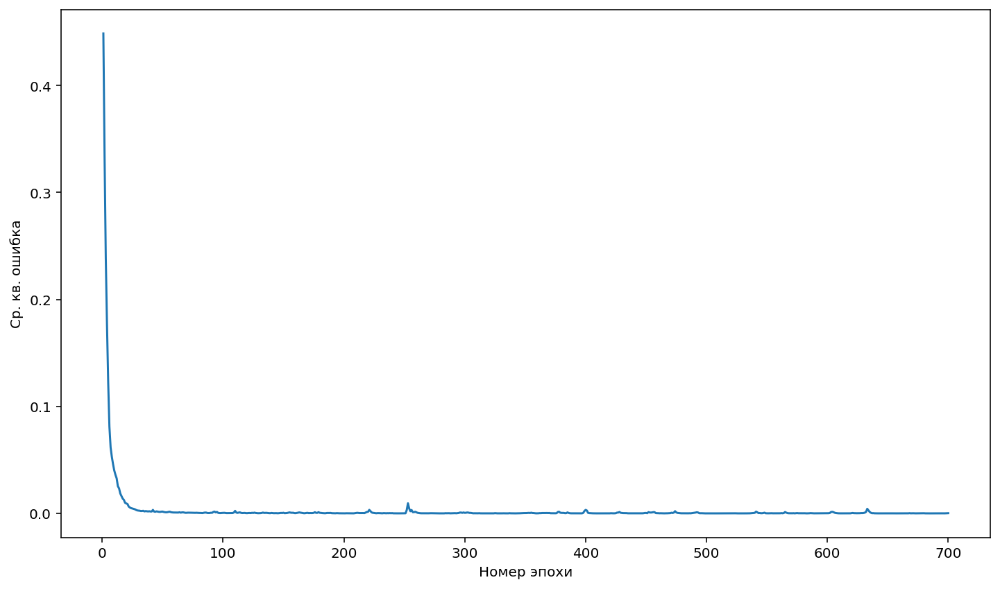

In [64]:
lst = list(range(1, 701))
plt.plot(lst, history.history['loss'])
plt.xlabel('Номер эпохи')
plt.ylabel('Ср. кв. ошибка')
plt.show()

In [65]:
errs=[] 
for i in range(0, predictions_train.size):
    errs.append(abs(predictions_train[i][0]-zz[i])) 
max_err_val=np.max(np.asarray(errs)) 
print('Максимальная ошибка по модулю = ', max_err_val)
mae_rnd.append(max_err_val)

Максимальная ошибка по модулю =  0.07332226072465964


<ipython-input-66-3d8dce7a13e0>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


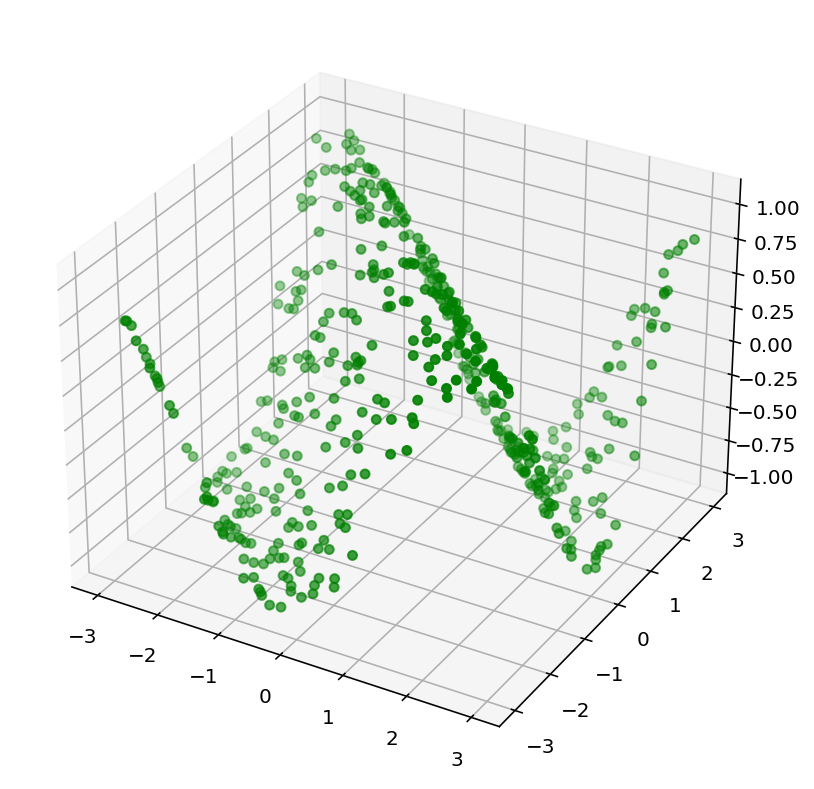

In [66]:
#rand
# Строим предсказанный график
fig = plt.figure() 
ax = fig.gca(projection='3d')
x = np.array([p[0] for p in test_data])
y = np.array([p[1] for p in test_data])
ax.scatter(x, y, predictions_test, c='green')
plt.show()

<ipython-input-5-fb969bad0871>:4: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


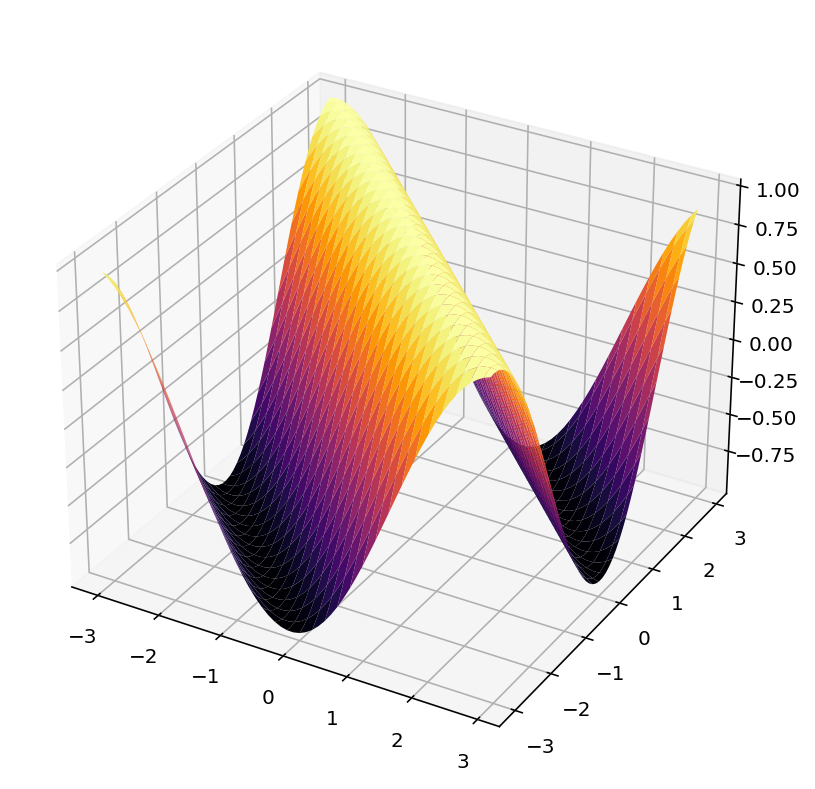

In [67]:
func_draw()

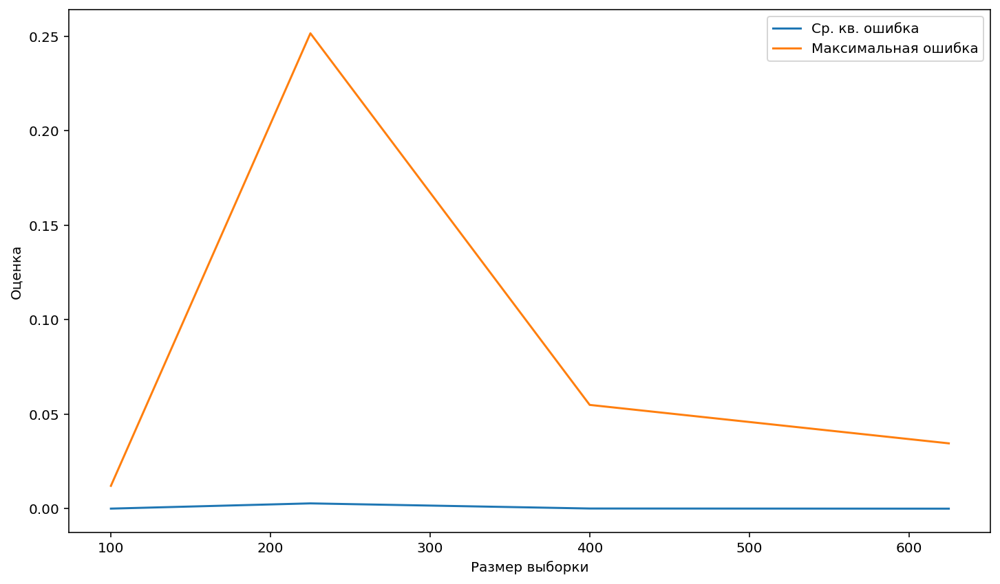

In [68]:
N = [100, 225, 400, 625]         #размер выборки
plt.plot(N, mse, label = 'Ср. кв. ошибка')
plt.plot(N, mae, label = 'Максимальная ошибка')
plt.xlabel('Размер выборки')
plt.ylabel('Оценка')
plt.legend()
plt.show()

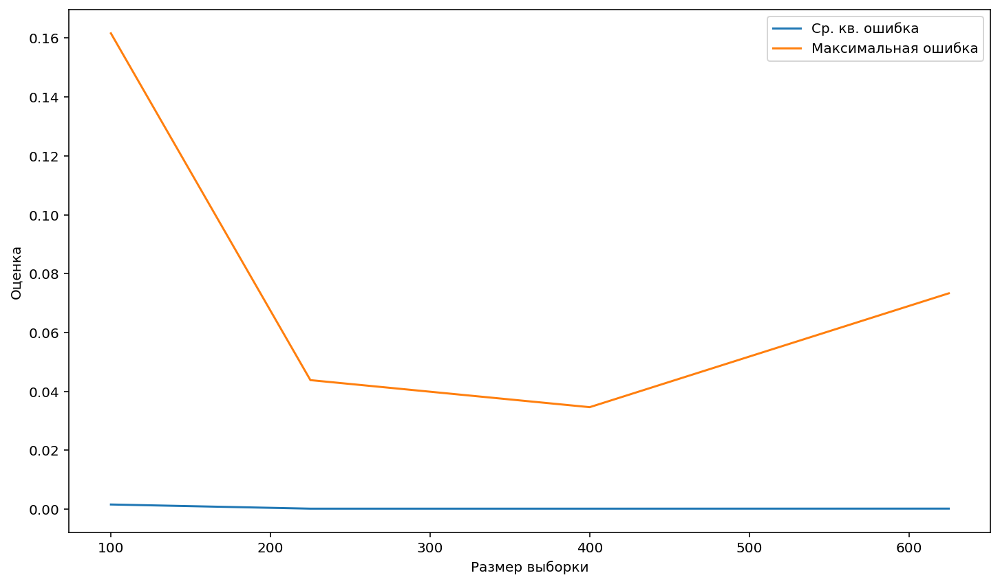

In [69]:
N = [100, 225, 400, 625]          #размер выборки  
plt.plot(N, mse_rnd, label = 'Ср. кв. ошибка')
plt.plot(N, mae_rnd, label = 'Максимальная ошибка')
plt.xlabel('Размер выборки')
plt.ylabel('Оценка')
plt.legend()
plt.show()

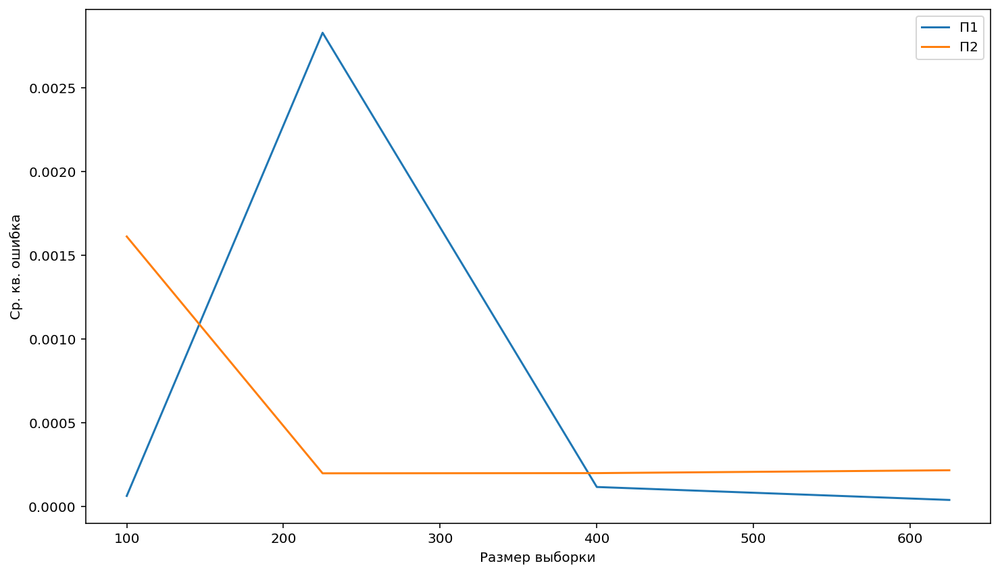

In [70]:
N = [100, 225, 400, 625]
plt.plot(N, mse, label = 'П1')
plt.plot(N, mse_rnd, label = 'П2')
plt.xlabel('Размер выборки')
plt.ylabel('Ср. кв. ошибка')
plt.legend()
plt.show()

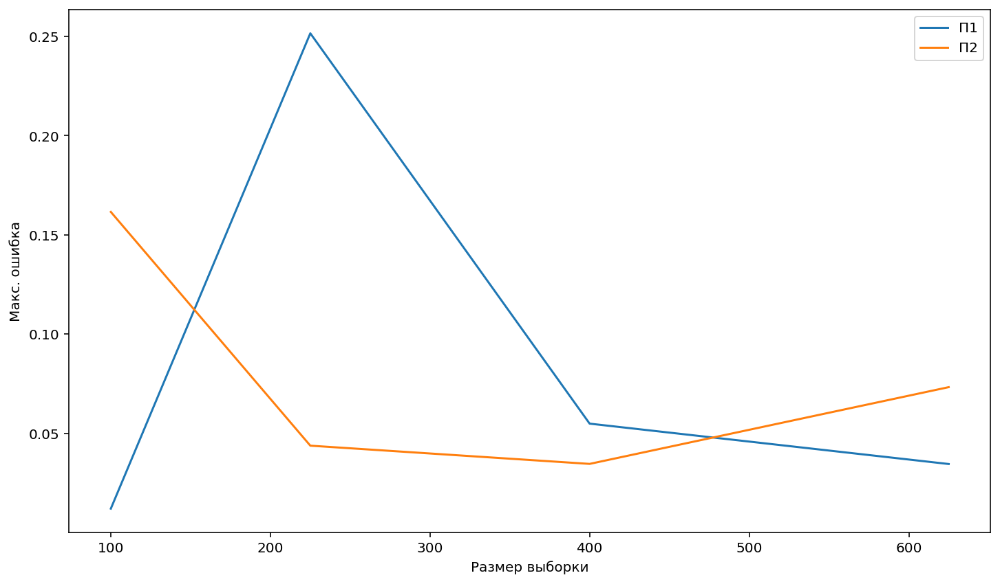

In [71]:
N = [100, 225, 400, 625]
plt.plot(N, mae, label = 'П1')
plt.plot(N, mae_rnd, label = 'П2')
plt.xlabel('Размер выборки')
plt.ylabel('Макс. ошибка')
plt.legend()
plt.show()